
# Framing the Problem
The two questions addresssed by the analysis presented in the notebook are - 1) "can the production of any of these 51 cytokines be predicted from image embeddings alone?" and 2) "which feature selection methods are most succesful for these predictions?" 

The questions themselves requires more context, so please read this section if you are curious about it. 

First of all, what is a cytokine? A cytokine is a protein molecule produced and excreted by a cell to signal various messages to other cells. To collect and analyze cytokines, supernatant liquid is removed from incubating cells and the individual proteins in the liquid are quantified. Cytokines are important because they tell biologists what activities a group of cells has been performing.

Secondly, imaging is performed with a high-content microscope to capture images of cells and their organelles. The organelles are visualized by staining them with fluorescent dyes of various colors. This particular data concerns a stain called Concanavilin A, which stains the cell membrane. Visualizing the cell membrane allows biologists to observe the overall shape and size of the cell. These microscopic images are then translated into embeddings which can then be correlated to the cytokine output.

This notebook does not cover the process of generating the embeddings. Briefly, the embeddings were obtained with an open source CNN called EfficientNetV2XLImageNet21, normalized per plate and donor, and simply uploaded as a parquet file into this notebook.

Each "well", or row in the data below, can be though of as its own small experiment. Each well consists of human immune cells which have been plated, incubated, had their supernatant collected, and finally microscopically imaged.

The goal is to predict cytokine response based on image embeddings alone so that the laboratory process of collecting and quantifying the cytokines can be skipped. Basically, instead of only observing size and shape from Concanavilin A staining, can we also infer what activities the cells are doing? (A lengthy biology lesson is avoided here - please feel free to google each predictable cytokine at the end of this notebook to learn what specific activity it represents.)

(I will define "predictable cyotkines" as those whose production can be predicted with at least 0.65 precision and 0.65 recall under at least one feature selection strategy. High precision and recall, as well as the ability to predict numerous cytokines will be considered for the "success" of a feature selection strategy.)

# Collecting the Data
384 wells of human pbmcs were plated.
51 cytokines were quantified for each of these wells. 
Each well was imaged with ConA, which stains cell membranes. 
These microscopic images were analyzed with a CNN to generate 1230 black box features for each cell in the image.
These single cell features were then min/max normalized per human donor and plate. (Only one plate is used in this notebook.)

# Cleaning the Data
The embeddings were then aggregated (via the mean) by well, since cytokine mesaurements are necessarily agregated by the well.
A panel of 51 cytokines was tested for each well. Each of these 51 distributions was transformed into two bins, labelled with integer 1 or 0, to indicate each well as either being a producer (1) or a non-producer (0) for each cyotkine.
Cytokines that had no production in any well were removed from the experiment.


# EDA
The distributions of cytokine production were observed, and as mentioned previously entire cytokines were removed where necessary. It was noted that there are many more non-producing wells than producing for essentially all cyotkines, so a downsampling strategy was employed to remove non-producing wells at random.
The overall size, shape, and structure of the input data was observed and understood.

# Feature Engineering/Selection
Multiple feature selection strategies were employed across the 1230 black box embedding features.
PCA was also employed.

# Modeling
These feature sets were tested on one consistent XGBoost decision tree model to predict cytokine producer status.

# Assessment
Model performances were considered via precision and recall scores and feature selection strategies were compared.
Also, the precision and recall scores were plotted against the number of wells and the number of features to check for evidence of trends. If, for example, there is high correlation between higher scores and higher numbers of wells, that is evidence that it is not that some cytokines are unpredictable but rather that there was not enough data. Or one could phrase that as overfitting to the training set for the cytokines with poor performance. Also, there is an investigation of model complexity (tree depth) and model overall model performance per epoch to observe any evidence of overfitting.

# Spoiler Alert - Results 
Multiple cytokines were shown to be "predictable" (having >0.65 precision and >0.65 recall) across multiple feature selection strategies. There was no particular feature that emerged as most important across multiple feature selection strategies. The strategy that resulted in the highest average precision and recall scores for predictable cytokines was Principle Component Analysis. (Average score of about 0.83 for both of those measurements over 4 predictable cytokines.) The feature selection strategy that resulted in the largest number of predictable cytokines was Recursive Feature Elimination. (12 predictable cytokines.)

Yes, we can use these ConA embeddings to predict cytokine output for at least some cytokines.
The best feature selection method varies depending on whether you prefer better average precision/recall or more cytokine predictions, as well as how much computing power and time you have on your hands. (Recursive feature elimination takes about 45 minutes to run on my computer, whereas PCA takes about one minute.) Personally I would recommend PCA since it is faster and results in better precision/recall scores. 

It was observed that there is no need for a depth greater than 3 for the PCA features. There is evidence of overfitting for many of the cytokines, but there is no single early stopping point that would universally benefit all of them. Each of the cytokine models would need to be optimized one at a time in a follow up project.


# References
Three outside resources were used in this work.
This page by sklearn lists the feature selection strategies used in this notebook, with the addition of PCA. 
https://scikit-learn.org/stable/modules/feature_selection.html
Code from this post was used/adapted to create more visually appealing confusion matrices.
https://www.kaggle.com/code/mattkibassa/xgbclassifier-and-confusion-matrix
Code from this post was used/adapted to show learning curves and look for evidence of overfitting.
https://machinelearningmastery.com/avoid-overfitting-by-early-stopping-with-xgboost-in-python/



# Import Packages

In [1]:
import os
from typing import Dict, List, Literal, Optional, Sequence, Set

import pandas as pd
import numpy as np
from numpy import count_nonzero

import matplotlib.pyplot as plt

import logging

from typing import List, Optional, Sequence, Tuple
from typing import List, Sequence
from typing import Dict, List, Tuple
from typing import List, Literal, NamedTuple, Optional

from dataclasses import dataclass

from sklearn.preprocessing import KBinsDiscretizer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn import preprocessing




from xgboost import XGBClassifier



import altair as alt
from scipy.stats import mannwhitneyu
from scipy import stats
from dataclasses import dataclass
import itertools
from spr_platform.data_pipeline_steps.dataset import (
    AggregateNumericDataset,
    CombineDatasetColumns,
    ConvertDatasetToScikitXY,
    FilterDataset,
    MergeDatasets,
    SplitDataset,
    FillColumnValues,
)

alt.data_transformers.disable_max_rows()

from itertools import cycle

In [18]:
#fix up this package if necessary for reading in parquets
# !pip install fastparquet
# !pip3 uninstall pyarrow
# !pip3 install pyarrow==7.0.0

# Read in data

# Data Cleaning 1

In [2]:
#There are so many features - let's start with just one stain
conaembeds = pd.read_parquet('20221122_pbmcs_plate-13_SingleCellEfficientNetV2XLImageNet21kMinMaxEmbeddings - Concanavalin A-AF633-20221204-1670194870-66729496_features.parquet', engine='pyarrow')
conaembeds
#these are already normalized
#lots and lots and lots of features
#they are being indexed by plate, well, and field but we only have one plate
#the cytokines are only well-indexed
#so let's group these up and take the mean for each embedding



Output_0  Output_1  Output_2  Output_3  \
plate    well field row  column                                           
plate-13 A01  f00   1916 52     -0.059361  0.491331 -0.027340 -0.213889   
                    1460 58     -0.014445  1.019286 -0.031515 -0.166004   
                    544  61     -0.080845  0.256504 -0.048731 -0.129524   
                    225  64     -0.045209  0.359745 -0.044401 -0.043139   
                    175  64      0.478619  0.432928 -0.031833 -0.148429   
...                                   ...       ...       ...       ...   
         P24  f03   1217 2042   -0.062614  1.089836 -0.026465 -0.085548   
                    64   2053    0.516341  0.247797 -0.034460 -0.201337   
                    2007 2063    0.227666 -0.022256 -0.190944 -0.214225   
                    1140 2093   -0.027194  0.400349 -0.030040 -0.222789   
                    188  2111   -0.037600  0.297345 -0.019867 -0.206923   

                                 Output_4  Output_5  Output_6  Output_7  \
plate    well field row  column                                           
plate-13 A01  f00   1916 52      4.373125 -0.133843 -0.135638 -0.005967   
                    1460 58      4.969889 -0.067024 -0.112048 -0.022392   
                    544  61      3.980898 -0.104997 -0.148444  0.147525   
                    225  64      3.939051 -0.129746  0.017837  0.119623   
                    175  64      4.104396 -0.079566 -0.164585 -0.040335   
...                                   ...       ...       ...       ...   
         P24  f03   1217 2042    2.877230 -0.113161 -0.079362 -0.041296   
                    64   2053    4.379820 -0.136006  0.013148  0.122940   
                    2007 2063    2.221107 -0.055630 -0.148233  0.170513   
                    1140 2093    4.051991 -0.112054 -0.066530 -0.041435   
                    188  2111    3.119351 -0.032260 -0.130142 -0.016676   

                                 Output_8  Output_9  ...  Output_1270  \
plate    well field row  column                      ...                
plate-13 A01  f00   1916 52      0.556239 -0.051998  ...    -0.106363   
                    1460 58      0.205033 -0.098054  ...     0.005023   
                    544  61      0.807088 -0.162772  ...    -0.193046   
                    225  64      0.895391 -0.103673  ...     0.485225   
                    175  64      0.701440 -0.095219  ...    -0.060335   
...                                   ...       ...  ...          ...   
         P24  f03   1217 2042    0.894407 -0.141363  ...     2.277635   
                    64   2053    0.787381 -0.115078  ...    -0.141674   
                    2007 2063    2.211020 -0.035088  ...    -0.148259   
                    1140 2093    0.143170 -0.085121  ...     0.072098   
                    188  2111    0.776521 -0.129340  ...     0.215729   

                                 Output_1271  Output_1272  Output_1273  \
plate    well field row  column                                          
plate-13 A01  f00   1916 52        -0.107267    -0.136706    -0.067570   
                    1460 58        -0.065542    -0.208429    -0.166011   
                    544  61        -0.110253    -0.126446    -0.189189   
                    225  64        -0.015575    -0.181643    -0.021452   
                    175  64        -0.025494     0.010285    -0.075385   
...                                      ...          ...          ...   
         P24  f03   1217 2042      -0.089138    -0.056948    -0.174840   
                    64   2053      -0.116198    -0.117991    -0.138715   
                    2007 2063      -0.150966    -0.031003    -0.211592   
                    1140 2093       0.039279    -0.098442    -0.098371   
                    188  2111      -0.136234    -0.071065    -0.075342   

                                 Output_1274  Output_1275  Output_1276  \
plate    well field row  column                                          
plate-13 A01  f00   

In [3]:
conaembedsgrouped = conaembeds.groupby(by=["well"]).mean()

conaembedsgrouped

,Output_0,Output_1,Output_2,Output_3,Output_4,Output_5,Output_6,Output_7,Output_8,Output_9,...,Output_1270,Output_1271,Output_1272,Output_1273,Output_1274,Output_1275,Output_1276,Output_1277,Output_1278,Output_1279
well,,,,,,,,,,,,,,,,,,,,,
A01,-0.014023,0.415012,-0.016768,-0.104013,3.549480,-0.094241,-0.055584,0.005246,0.544499,0.000923,...,0.223390,-0.043044,-0.038978,-0.010514,0.675088,0.443031,0.690778,-0.084230,0.786897,0.767009
A02,0.019453,0.444380,-0.029527,0.269531,2.221909,-0.112682,-0.024621,-0.018505,0.641719,0.072273,...,0.187920,0.142632,0.035867,0.554693,0.430195,0.263443,0.511171,-0.088937,0.280768,0.594549
A03,-0.024712,0.453696,-0.029638,-0.087462,3.638992,-0.087525,-0.043676,0.026368,0.582807,0.011611,...,0.223035,-0.057943,0.003495,0.005372,0.658752,0.295313,0.881289,-0.090033,0.608988,0.760308
A04,-0.023204,0.481227,-0.028753,-0.078231,3.660372,-0.096248,-0.040833,0.005382,0.538786,0.018362,...,0.260811,-0.042787,0.046423,-0.007430,0.700738,0.325937,0.803479,-0.080207,0.717632,0.722590
A05,-0.036218,0.426916,-0.026591,-0.093860,3.664864,-0.094444,-0.027585,0.010778,0.554009,0.014792,...,0.240105,-0.047876,0.011234,-0.000812,0.657733,0.270577,0.846102,-0.079541,0.630278,0.742615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,-0.032021,0.475880,-0.022764,-0.095370,3.703184,-0.090177,0.018195,0.057526,0.562714,-0.008066,...,0.287720,-0.056529,-0.009163,-0.010600,0.734282,0.286139,0.818435,-0.067835,0.710448,0.803359
P21,-0.029233,0.440091,-0.007722,-0.117669,3.535129,-0.097393,-0.027656,0.059380,0.589516,-0.014677,...,0.276516,-0.037208,-0.029047,-0.000064,0.657467,0.392720,0.658836,-0.069987,0.912165,0.718989
P22,-0.018888,0.425374,-0.029328,-0.069786,3.778533,-0.076956,0.074738,0.108236,0.625393,-0.021928,...,0.318789,-0.048791,-0.030564,-0.023672,0.736881,0.186358,1.139712,-0.046718,0.426272,0.953575


In [8]:
#Now get the cytokine data
cytos = pd.read_parquet('20221122_pbmcs_plate-13_NPlex-20230215-1676500136-845c28be_features.parquet', engine='pyarrow')
cytos

Name           APRIL  Activin A  Amphiregulin      CCL1  CCL19      CCL2  \
plate    well                                                              
plate-13 A01     0.0   0.000000           0.0  0.000000    0.0  0.285009   
         A02     0.0  -0.067838           0.0 -0.023606    0.0  0.567740   
         A03     0.0  -0.067838           0.0 -0.425776    0.0 -0.048456   
         A04     0.0  -0.067838           0.0 -0.383317    0.0 -0.255632   
         A05     0.0  -0.067838           0.0 -0.843527    0.0 -0.278986   
...              ...        ...           ...       ...    ...       ...   
         P20     0.0   0.000000           0.0 -0.871599    0.0 -0.409497   
         P21     0.0   0.000000           0.0 -0.598343    0.0 -0.099939   
         P22     0.0   0.000000           0.0 -0.339549    0.0 -0.359673   
         P23     0.0   0.000000           0.0  0.452103    0.0  0.208030   
         P24     0.0   0.000000           0.0 -0.307138    0.0 -0.305226   

Name              CCL20     CCL22      CCL4      CCL5  ...      IL-6  \
plate    well                                          ...             
plate-13 A01   0.000000 -0.153062  0.083232  0.489473  ... -0.017729   
         A02   0.219657  0.019407  0.206661  0.143474  ...  0.167311   
         A03   0.209128  0.013130  0.207375  0.101785  ... -0.019488   
         A04  -0.035060 -0.221934 -0.039628  0.096787  ...  0.165259   
         A05  -0.035060 -0.053796 -0.072902  0.163701  ... -0.019488   
...                 ...       ...       ...       ...  ...       ...   
         P20   0.083486 -0.235743 -0.192112 -0.121215  ...  0.054511   
         P21   0.000000 -0.046121  0.011949 -0.003756  ... -0.021628   
         P22   0.000000 -0.136543 -0.201684 -0.039288  ...  0.068097   
         P23   0.000000  0.085832  0.724859  0.226745  ...  0.114473   
         P24   0.000000 -0.625128 -0.353661 -0.024394  ...  0.120710   

Name               IL-8     MMP-1     MMP-9  Osteopontin (OPN)  SAA  \
plate    well                                                         
plate-13 A01   1.116833  0.040474  0.000000          -0.084642  0.0   
         A02   0.000000  0.231689 -0.234301          -0.583653  0.0   
         A03   0.000000 -0.050217 -0.287251          -0.371556  0.0   
         A04  -0.231060 -0.138636 -0.287251          -0.583653  0.0   
         A05  -0.320009 -0.197612 -0.287251          -0.583653  0.0   
...                 ...       ...       ...                ...  ...   
         P20  -0.530457 -0.213691 -0.170951          -0.016102  0.0   
         P21  -0.259397 -0.210228 -0.170951          -0.066413  0.0   
         P22  -0.173381 -0.047376 -0.170951          -0.140880  0.0   
         P23   0.592965  0.181616  0.106115           0.022091  0.0   
         P24   0.000000  0.133366 -0.170951          -0.081534  0.0   

Name           TGF-beta 1 (total)   TNF RII  TNF alpha  TRAIL  
plate    well                                                  
plate-13 A01                  0.0  0.054926   0.000000    0.0  
         A02                  0.0  0.023116   0.129036    0.0  
         A03                  0.0 -0.082506   0.235386    0.0  
         A04                  0.0 -0.347032   0.112568    0.0  
         A05                  0.0 -0.283990   0.051664    0.0  
...                           ...       ...        ...    ...  
         P20                  0.0 -0.161013  -0.131680    0.0  
         P21                  0.0 -0.237568  -0.003252    0.0  
         P22                  0.0 -0.187863   0.022256    0.0  
         P23                  0.0  0.030809   0.000000    0.0  
         P24                  0.0 -0.064185  -0.230492    0.0  

[384 rows x 51 columns]

In [9]:
#let's drop the unecessary plate index
cytosgrouped = cytos.droplevel("plate")
cytosgrouped

Name,APRIL,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,...,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TGF-beta 1 (total),TNF RII,TNF alpha,TRAIL
well,,,,,,,,,,,,,,,,,,,,,
A01,0.0,0.000000,0.0,0.000000,0.0,0.285009,0.000000,-0.153062,0.083232,0.489473,...,-0.017729,1.116833,0.040474,0.000000,-0.084642,0.0,0.0,0.054926,0.000000,0.0
A02,0.0,-0.067838,0.0,-0.023606,0.0,0.567740,0.219657,0.019407,0.206661,0.143474,...,0.167311,0.000000,0.231689,-0.234301,-0.583653,0.0,0.0,0.023116,0.129036,0.0
A03,0.0,-0.067838,0.0,-0.425776,0.0,-0.048456,0.209128,0.013130,0.207375,0.101785,...,-0.019488,0.000000,-0.050217,-0.287251,-0.371556,0.0,0.0,-0.082506,0.235386,0.0
A04,0.0,-0.067838,0.0,-0.383317,0.0,-0.255632,-0.035060,-0.221934,-0.039628,0.096787,...,0.165259,-0.231060,-0.138636,-0.287251,-0.583653,0.0,0.0,-0.347032,0.112568,0.0
A05,0.0,-0.067838,0.0,-0.843527,0.0,-0.278986,-0.035060,-0.053796,-0.072902,0.163701,...,-0.019488,-0.320009,-0.197612,-0.287251,-0.583653,0.0,0.0,-0.283990,0.051664,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.0,0.000000,0.0,-0.871599,0.0,-0.409497,0.083486,-0.235743,-0.192112,-0.121215,...,0.054511,-0.530457,-0.213691,-0.170951,-0.016102,0.0,0.0,-0.161013,-0.131680,0.0
P21,0.0,0.000000,0.0,-0.598343,0.0,-0.099939,0.000000,-0.046121,0.011949,-0.003756,...,-0.021628,-0.259397,-0.210228,-0.170951,-0.066413,0.0,0.0,-0.237568,-0.003252,0.0
P22,0.0,0.000000,0.0,-0.339549,0.0,-0.359673,0.000000,-0.136543,-0.201684,-0.039288,...,0.068097,-0.173381,-0.047376,-0.170951,-0.140880,0.0,0.0,-0.187863,0.022256,0.0


# EDA 1- Confirm Structure

In [10]:
#confirm the index is the well ID
cytosgrouped.index

Index(['A01', 'A02', 'A03', 'A04', 'A05', 'A06', 'A07', 'A08', 'A09', 'A10',
       ...
       'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24'],
      dtype='object', name='well', length=384)

In [11]:
cytosgrouped.describe()

Name,APRIL,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,...,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TGF-beta 1 (total),TNF RII,TNF alpha,TRAIL
count,384.0,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,...,384.000000,384.000000,384.000000,384.000000,384.000000,384.000000,384.0,384.000000,384.000000,384.0
mean,0.0,0.033452,0.000911,-0.118987,0.012525,0.060414,0.017532,-0.046192,0.143612,0.039035,...,0.009081,0.023593,0.051277,-0.146184,-0.134540,0.001587,0.0,-0.030936,0.173879,0.0
std,0.0,0.083943,0.010931,0.486813,0.047068,0.417793,0.066449,0.243283,0.419001,0.153203,...,0.121012,0.391792,0.248157,0.122621,0.256024,0.012427,0.0,0.160134,0.401038,0.0
min,0.0,-0.067838,0.000000,-1.380159,0.000000,-1.569811,-0.035060,-0.798957,-0.826410,-0.476731,...,-0.344895,-0.897345,-1.029494,-0.287251,-0.730162,0.000000,0.0,-0.407201,-1.092517,0.0
25%,0.0,0.000000,0.000000,-0.295766,0.000000,-0.158240,0.000000,-0.153062,-0.060594,-0.049207,...,-0.019488,-0.093463,-0.086193,-0.287251,-0.278929,0.000000,0.0,-0.098730,0.000000,0.0
50%,0.0,0.000000,0.000000,-0.036231,0.000000,0.001277,0.000000,-0.019963,0.052831,0.019486,...,-0.017729,0.000000,0.060257,-0.170951,-0.085635,0.000000,0.0,-0.004700,0.079769,0.0
75%,0.0,0.078900,0.000000,0.000000,0.000000,0.204825,0.000000,0.050145,0.184057,0.103522,...,0.069483,0.000000,0.212305,-0.035004,0.046006,0.000000,0.0,0.051832,0.248070,0.0
max,0.0,0.376160,0.173931,1.651367,0.315642,1.991084,0.302515,0.821234,1.776244,0.600177,...,0.368011,1.462593,0.698405,0.323754,0.369649,0.158860,0.0,0.530102,1.797939,0.0


In [12]:
cytosgrouped.shape

(384, 51)

In [13]:
conaembedsgrouped.shape

(384, 1280)

# EDA 2 - Understand and binarize cytokine response distributions

In [14]:
#get the names of all the cytokines


cytosgrouped.columns

Index(['APRIL', 'Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20',
       'CCL22', 'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1',
       'CXCL10', 'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5',
       'CXCL9', 'G-CSF', 'GM-CSF', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
       'IFN gamma', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10',
       'IL-12 p40', 'IL-12 p70', 'IL-15', 'IL-16', 'IL-17A', 'IL-2', 'IL-21',
       'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1', 'MMP-9',
       'Osteopontin (OPN)', 'SAA', 'TGF-beta 1 (total)', 'TNF RII',
       'TNF alpha', 'TRAIL'],
      dtype='object', name='Name')

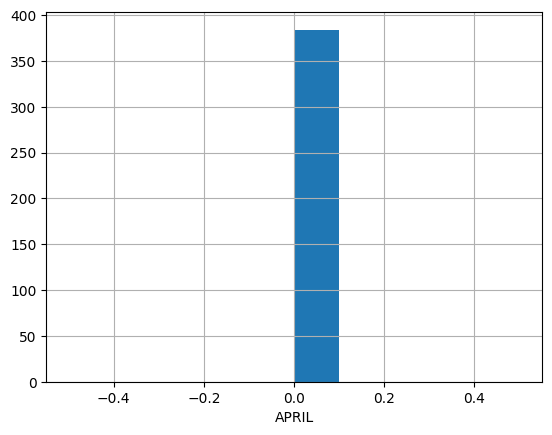

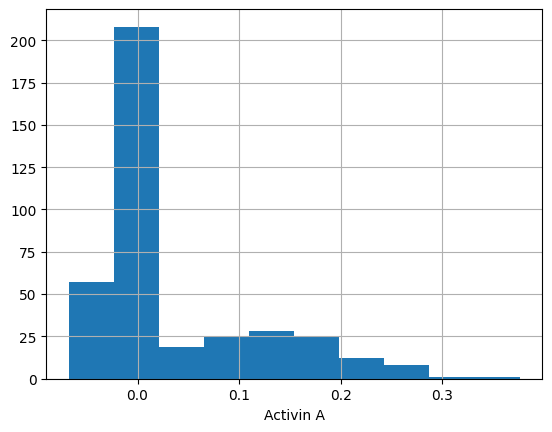

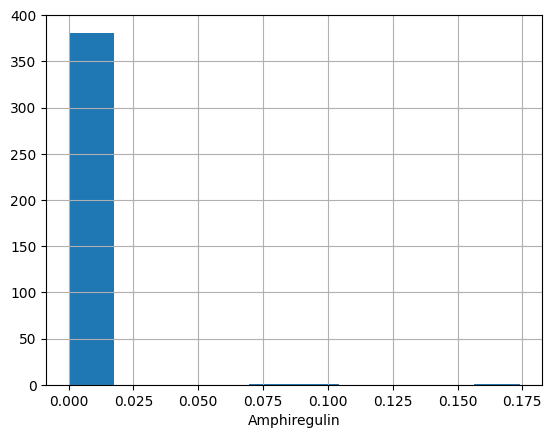

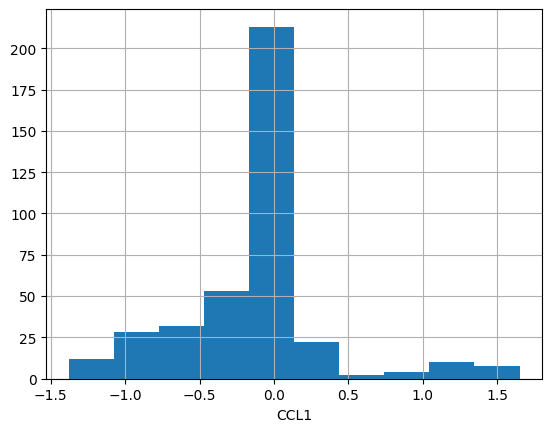

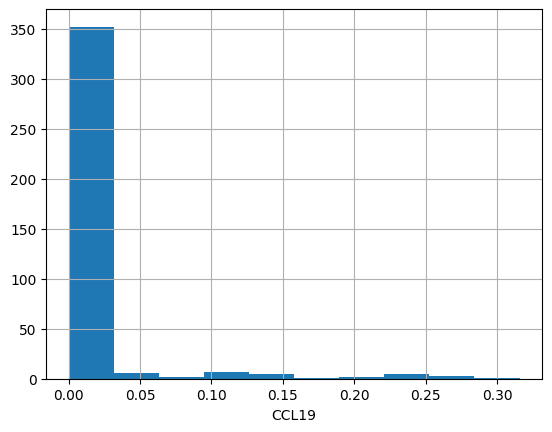

...

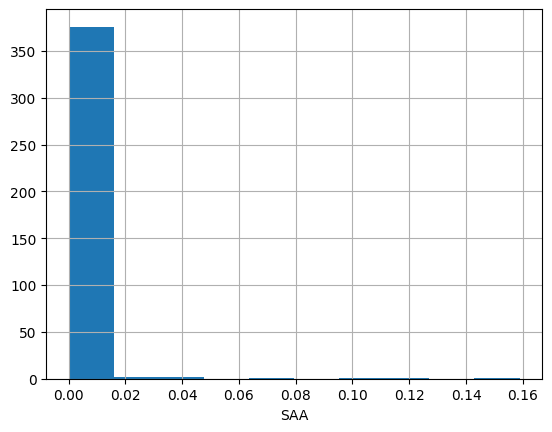

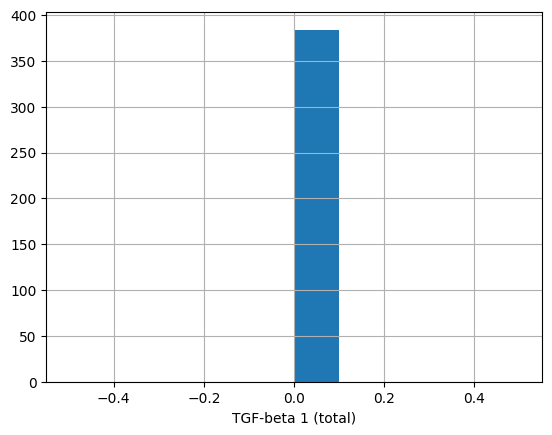

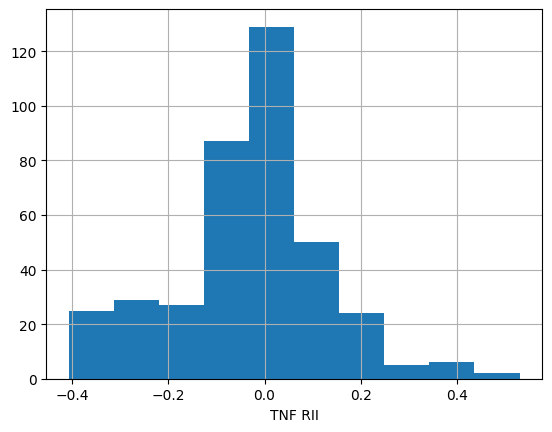

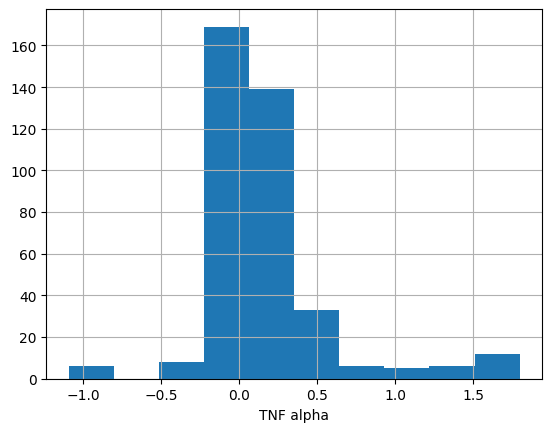

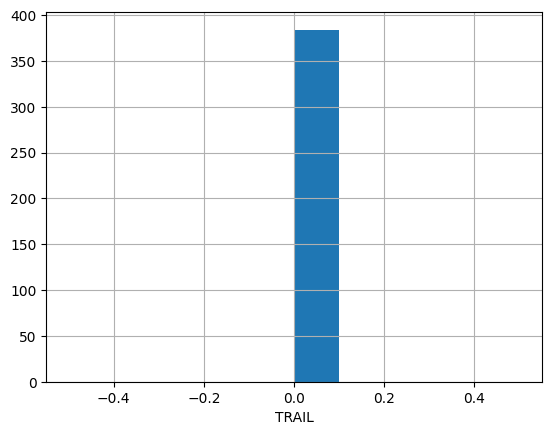

In [15]:
#observe original distribution
cytos = ['APRIL', 'Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20',
       'CCL22', 'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1',
       'CXCL10', 'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5',
       'CXCL9', 'G-CSF', 'GM-CSF', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
       'IFN gamma', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10',
       'IL-12 p40', 'IL-12 p70', 'IL-15', 'IL-16', 'IL-17A', 'IL-2', 'IL-21',
       'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1', 'MMP-9',
       'Osteopontin (OPN)', 'SAA', 'TGF-beta 1 (total)', 'TNF RII',
       'TNF alpha', 'TRAIL']

for cyto in cytos:
    cytosgrouped[cyto].hist()
    plt.xlabel(cyto)
    plt.show()

In [16]:
#cytokines to drop because they really have no distribution at all:
dropped = ['APRIL', 'CXCL9', 'IFN alpha 2 (alpha 2b)', 'IFN beta',
           'IFN gamma', 'IL-12 p70', 'IL-17A', 'IL-2', 'IL-21', 'TGF-beta 1 (total)', 'TRAIL']

cytokines = pd.DataFrame(cytosgrouped.drop(columns = dropped))


cytokines

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0.000000,0.0,0.000000,0.0,0.285009,0.000000,-0.153062,0.083232,0.489473,0.0,...,0.0,0.000000,-0.017729,1.116833,0.040474,0.000000,-0.084642,0.0,0.054926,0.000000
A02,-0.067838,0.0,-0.023606,0.0,0.567740,0.219657,0.019407,0.206661,0.143474,0.0,...,0.0,0.143335,0.167311,0.000000,0.231689,-0.234301,-0.583653,0.0,0.023116,0.129036
A03,-0.067838,0.0,-0.425776,0.0,-0.048456,0.209128,0.013130,0.207375,0.101785,0.0,...,0.0,0.045971,-0.019488,0.000000,-0.050217,-0.287251,-0.371556,0.0,-0.082506,0.235386
A04,-0.067838,0.0,-0.383317,0.0,-0.255632,-0.035060,-0.221934,-0.039628,0.096787,0.0,...,0.0,-0.194333,0.165259,-0.231060,-0.138636,-0.287251,-0.583653,0.0,-0.347032,0.112568
A05,-0.067838,0.0,-0.843527,0.0,-0.278986,-0.035060,-0.053796,-0.072902,0.163701,0.0,...,0.0,-0.364235,-0.019488,-0.320009,-0.197612,-0.287251,-0.583653,0.0,-0.283990,0.051664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.000000,0.0,-0.871599,0.0,-0.409497,0.083486,-0.235743,-0.192112,-0.121215,0.0,...,0.0,-0.544379,0.054511,-0.530457,-0.213691,-0.170951,-0.016102,0.0,-0.161013,-0.131680
P21,0.000000,0.0,-0.598343,0.0,-0.099939,0.000000,-0.046121,0.011949,-0.003756,0.0,...,0.0,-0.224143,-0.021628,-0.259397,-0.210228,-0.170951,-0.066413,0.0,-0.237568,-0.003252
P22,0.000000,0.0,-0.339549,0.0,-0.359673,0.000000,-0.136543,-0.201684,-0.039288,0.0,...,0.0,-0.409724,0.068097,-0.173381,-0.047376,-0.170951,-0.140880,0.0,-0.187863,0.022256


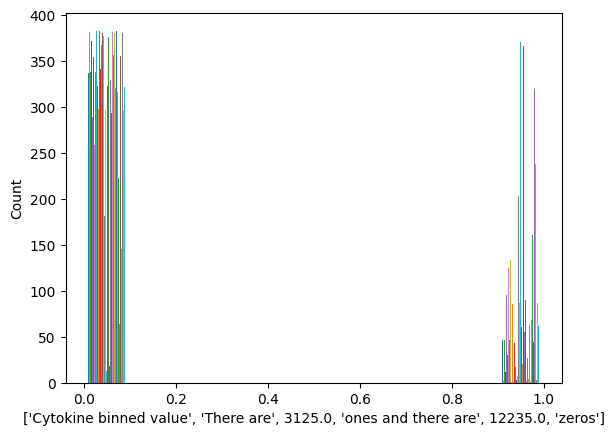

In [18]:
#discretization into two buckets

kbins = KBinsDiscretizer(n_bins=2, encode='ordinal', strategy='uniform')
cytokines_2bin = kbins.fit_transform(cytokines)

#we see with cytokines_2bin.shape that we have 384X40 wells, so that's 15360 total measurements
#which can be 1 or 0

#to list all 1s, we can sum the whole dataframe. We can subtract this value from 15360 to count all the zeros


plt.hist(cytokines_2bin, bins=10)
text = ["Cytokine binned value","There are", cytokines_2bin.sum(), "ones and there are", 15360-cytokines_2bin.sum() ,"zeros"]
plt.xlabel(text)
plt.ylabel("Count")
plt.show()


#There is an overall ~4:1 ratio of 0s to 1s, but it can be much worse within one cytokine

#we should downsample all those negative wells, but first let's get this in a dataframe

In [19]:
#binned things now in their own dataframe
binned = pd.DataFrame(columns = cytokines.columns, data = cytokines_2bin, index = cytokines.index)
binned

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
A02,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A03,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
A05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
P21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
P22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [20]:
#make bin categories integers because this helps with some downstream processing

binned = binned.apply(np.int64)

binned

Name,Activin A,Amphiregulin,CCL1,CCL19,CCL2,CCL20,CCL22,CCL4,CCL5,CCL8,...,IL-4,IL-6 R alpha,IL-6,IL-8,MMP-1,MMP-9,Osteopontin (OPN),SAA,TNF RII,TNF alpha
well,,,,,,,,,,,,,,,,,,,,,
A01,0,0,0,0,1,0,0,0,1,0,...,0,0,0,1,1,0,1,0,0,0
A02,0,0,0,0,1,1,1,0,1,0,...,0,0,1,0,1,0,0,0,0,0
A03,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,1,0,0,0,0,0
A04,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
A05,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P20,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
P21,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
P22,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0


In [101]:
binned.to_csv('binned_cytokines.csv', index=True)

# Data Cleaning 2 -  Class balancing
This dataset is so imbalanced that we should make an exception and downsample for the whole dataset rather than within a train/test split.
This is because we can't even use some of the planned dimensionality reduction strategies when the classes are this imbalanced. We must do dimensionality reduction before the train/test split or else the features won't be the same in the train/test split.

In [21]:
#we need so we can loop through all of them
print(binned.columns)

names = ['Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20', 'CCL22',
       'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1', 'CXCL10',
       'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5', 'G-CSF',
       'GM-CSF', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10', 'IL-12 p40',
       'IL-15', 'IL-16', 'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1',
       'MMP-9', 'Osteopontin (OPN)', 'SAA', 'TNF RII', 'TNF alpha']

Index(['Activin A', 'Amphiregulin', 'CCL1', 'CCL19', 'CCL2', 'CCL20', 'CCL22',
       'CCL4', 'CCL5', 'CCL8', 'CD14', 'CRP', 'CX3CL1', 'CXCL1', 'CXCL10',
       'CXCL11', 'CXCL13', 'CXCL16', 'CXCL3', 'CXCL4', 'CXCL5', 'G-CSF',
       'GM-CSF', 'IL-1 RA/RN', 'IL-1 alpha', 'IL-1 beta', 'IL-10', 'IL-12 p40',
       'IL-15', 'IL-16', 'IL-4', 'IL-6 R alpha', 'IL-6', 'IL-8', 'MMP-1',
       'MMP-9', 'Osteopontin (OPN)', 'SAA', 'TNF RII', 'TNF alpha'],
      dtype='object', name='Name')


In [22]:
#the shape of the binned df is also good to know for the following code
binned.shape

(384, 40)

In [23]:
# We can loop through each binned cytokine one at a time, randomly downsampling the nonresponding wells
#and keeping all the responding wells. (discard 0s until they are in a reasonable ratio to the 1s.)
#we can pair those with the embeddings


eachcolumn = range(0, 39, 1)

holdingdfs = []

attachedembeds = []

for item in eachcolumn:
    print(binned.iloc[:,item:item+1])
#get the binned cytokine column and get the name for it from the list above
    one = pd.DataFrame(data = binned.iloc[:,item:item+1], columns = [names[item]])
#keep track of cytokine title
#     cytotitle = one.columns[0]
#grab all the positives from the binning
    two = one[one[one.columns[0]]>0.5]
#grab all the negatives from the beginning
    three = one[one[one.columns[0]]<0.5]
#take random samples of the negatives in a good ratio to the positives
    try:
        three = three.sample(n=len(two)*1.5)
    except:
        try: three = three.sample(n=len(two))
        except:
            try: three = three.sample(n=len(two)*0.75)
            except:
                continue
#put the positives and downsampled negatives back together
    four = pd.concat([two, three])
#add the embeddings using the indices
    attached = four.merge(conaembedsgrouped, left_index=True, right_index=True)
#use this list to keep trach of all the succesfully attached embeddings
    attachedembeds.append(names[item])
#use this list to keep track of all the final dataframes
    holdingdfs.append(attached)

Name  Activin A
well           
A01           0
A02           0
A03           0
A04           0
A05           0
...         ...
P20           0
P21           0
P22           0
P23           0
P24           0

[384 rows x 1 columns]
Name  Amphiregulin
well              
A01              0
A02              0
A03              0
A04              0
A05              0
...            ...
P20              0
P21              0
P22              0
P23              0
P24              0

[384 rows x 1 columns]
Name  CCL1
well      
A01      0
A02      0
A03      0
A04      0
A05      0
...    ...
P20      0
P21      0
P22      0
P23      1
P24      0

[384 rows x 1 columns]
Name  CCL19
well       
A01       0
A02       0
A03       0
A04       0
A05       0
...     ...
P20       0
P21       0
P22       0
P23       0
P24       0

[384 rows x 1 columns]
Name  CCL2
well      
A01      1
A02      1
A03      0
A04      0
A05      0
...    ...
P20      0
P21      0
P22      0
P23      0
P24      0

[384 r

In [24]:
#nice job, this looks like what we wanted to collect for each cytokine!
holdingdfs[1]

,Amphiregulin,Output_0,Output_1,Output_2,Output_3,Output_4,Output_5,Output_6,Output_7,Output_8,...,Output_1270,Output_1271,Output_1272,Output_1273,Output_1274,Output_1275,Output_1276,Output_1277,Output_1278,Output_1279
well,,,,,,,,,,,,,,,,,,,,,
J18,1,0.025678,0.404508,-0.023056,-0.076557,3.104169,-0.089302,-0.022629,0.063530,0.475307,...,0.323384,-0.048399,-0.005379,-0.044947,0.869906,0.377538,0.643363,-0.041520,0.912972,0.873583
J24,1,0.006148,0.405906,-0.016831,-0.101115,3.309290,-0.088620,0.017671,0.077390,0.531338,...,0.344880,-0.055355,-0.025263,-0.061960,0.885983,0.324270,0.710343,-0.020462,0.854891,0.808480
D06,0,-0.009973,0.391930,-0.025467,-0.089825,3.675430,-0.092020,-0.037858,0.029835,0.586959,...,0.305818,-0.060853,-0.034081,-0.024038,0.661693,0.304316,0.819884,-0.083458,0.607268,0.933870
J20,0,0.007182,0.442164,-0.040254,-0.085795,3.361243,-0.079938,-0.014497,0.063754,0.504108,...,0.352026,-0.045631,0.008245,0.027452,0.842669,0.250386,0.864106,-0.072687,0.718432,0.884301


In [25]:
#let's note how long each of them are and see if there are any we should drop for tinyness
counting = pd.DataFrame(columns = ["Index", "Length", "Cytokine"])
for i in range(len(holdingdfs)):
    x = [i, len(holdingdfs[i]), holdingdfs[i].columns[0]]
    counting.loc[len(counting.index)] = x
counting


,Index,Length,Cytokine
0,0,94,Activin A
1,1,4,Amphiregulin
2,2,92,CCL1
3,3,24,CCL19
4,4,190,CCL2
5,5,60,CCL20
6,6,250,CCL22
7,7,92,CCL4
8,8,266,CCL5
9,9,2,CCL8


In [26]:
#We should delete those cytokines which ended up with less than 10 rows because we can't realistically use them 
#in modeling

grabber = counting[counting["Length"]<10]

grabber.index
grabber["Cytokine"].unique()

# to_delete = [1, 9, 12, 15, 23, 25, 27, 32]
to_delete = ['Amphiregulin', 'CCL8', 'CX3CL1', 'CXCL11', 'IL-10', 'IL-15',
       'IL-4', 'SAA']


In [27]:
holdingdfs2 = holdingdfs.copy()
for i in range(len(holdingdfs2)):
    try:
        if holdingdfs2[i].columns[0] in to_delete:
            holdingdfs2.pop(i)
    except:
        continue


#this gives an error without the try/except when it is done removing since we used pop, but it does succesfully
#remove the 8 cytokines
#note the new counting output below

In [28]:
#let's note how long each of them are and confirm we dropped the tiny dataframes
counting = pd.DataFrame(columns = ["Index", "Length", "Cytokine"])
for i in range(len(holdingdfs2)):
    x = [i, len(holdingdfs2[i]), holdingdfs2[i].columns[0]]
    counting.loc[len(counting.index)] = x
counting


,Index,Length,Cytokine
0,0,94,Activin A
1,1,92,CCL1
2,2,24,CCL19
3,3,190,CCL2
4,4,60,CCL20
5,5,250,CCL22
6,6,92,CCL4
7,7,266,CCL5
8,8,122,CD14
9,9,172,CRP


# Feature Selection/ Engineering

In [29]:
#first we must include this code so that sklearn does not output zillions of "future version deprecation"
#warnings and crash the notebook
def warn(*args, **kwargs):
    pass
import warnings

warnings.warn = warn

## Variance Thresholding

In [30]:

#Let's start with variance thresholding
#For each cytokine, we will remove features which do not have variance above a specific threshold
# We will see which geatures are left

pd.set_option('display.max_rows', None)

from sklearn.feature_selection import VarianceThreshold

variances = pd.DataFrame(columns = ["Cytokine", "Threshold", "Number of Features", "Features"])

thresholds = [0, 0.1, 0.2, 0.3, 0.4, 0.5]


def variance_threshold_selector(data, threshold):
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    for threshold in thresholds:
        try:
            features = variance_threshold_selector(df.iloc[:,1:], threshold)
            variances.loc[len(variances.index)] = [df.columns[0], threshold, len(features.columns), features.columns.values]
        except:
            continue
variances



,Cytokine,Threshold,Number of Features,Features
0,Activin A,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
1,Activin A,0.1,24,"[Output_4, Output_49, Output_50, Output_60, Ou..."
2,Activin A,0.2,4,"[Output_375, Output_521, Output_1230, Output_1..."
3,CCL1,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
4,CCL1,0.1,28,"[Output_4, Output_49, Output_50, Output_221, O..."
5,CCL1,0.2,5,"[Output_375, Output_521, Output_740, Output_12..."
6,CCL1,0.3,1,[Output_1230]
7,CCL19,0.0,1280,"[Output_0, Output_1, Output_2, Output_3, Outpu..."
8,CCL19,0.1,25,"[Output_4, Output_100, Output_120, Output_225,..."
9,CCL19,0.2,4,"[Output_375, Output_521, Output_1045, Output_1..."


In [31]:
#Looks like a threshold of 0.1 does plenty to minimize the number of features.
#Let's keep those features

variances = pd.DataFrame(columns = ["Cytokine", "Threshold", "Number of Features", "Features"])

threshold =0.1


def variance_threshold_selector(data, threshold):
    selector = VarianceThreshold(threshold)
    selector.fit(data)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    try:
        features = variance_threshold_selector(df.iloc[:,1:], threshold)
        variances.loc[len(variances.index)] = [df.columns[0], threshold, len(features.columns), features.columns.values]
    except:
        continue
variances

,Cytokine,Threshold,Number of Features,Features
0,Activin A,0.1,24,"[Output_4, Output_49, Output_50, Output_60, Ou..."
1,CCL1,0.1,28,"[Output_4, Output_49, Output_50, Output_221, O..."
2,CCL19,0.1,25,"[Output_4, Output_100, Output_120, Output_225,..."
3,CCL2,0.1,78,"[Output_4, Output_42, Output_49, Output_50, Ou..."
4,CCL20,0.1,28,"[Output_4, Output_49, Output_50, Output_225, O..."
5,CCL22,0.1,20,"[Output_4, Output_49, Output_50, Output_225, O..."
6,CCL4,0.1,45,"[Output_4, Output_42, Output_49, Output_50, Ou..."
7,CCL5,0.1,54,"[Output_4, Output_42, Output_49, Output_50, Ou..."
8,CD14,0.1,28,"[Output_4, Output_49, Output_50, Output_60, Ou..."
9,CRP,0.1,73,"[Output_4, Output_42, Output_49, Output_50, Ou..."


Text(0, 0.5, 'Count')

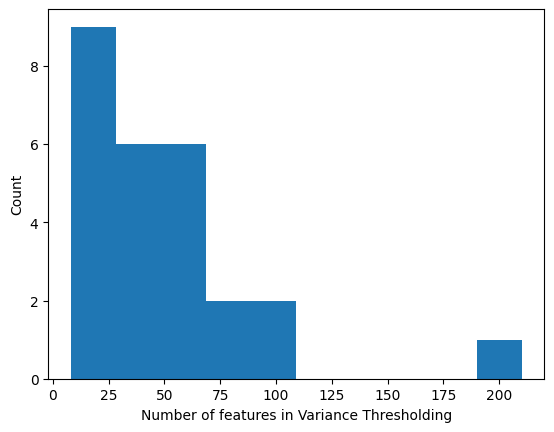

In [32]:
plt.hist(variances["Number of Features"])
plt.xlabel("Number of features in Variance Thresholding")
plt.ylabel("Count")

#Looks like we removed a lot of features this way but still have plenty for
# potential synchronous effects between features

## Univariate Feature Selection

In [33]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
#Let's start with just one feature to quickly see if it matches the single variance thresholded features from above

selector = SelectKBest(f_regression, k=1)

univariates = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def F_regression_selector(data, target):
    selector.fit(data, target)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = F_regression_selector(data = X, target = y)
    univariates.loc[len(univariates.index)] = [df.columns[0], len(output.columns), output.columns.values]

univariates

#For variance thresholding, CCL22 chose only feature 1230 for threshold 0.4.
#This time, it chose feature 161.
#Interesting to note that the feature with highest variation is not the one with the best f_regression score

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_1110]
1,CCL1,1,[Output_1253]
2,CCL19,1,[Output_1162]
3,CCL2,1,[Output_115]
4,CCL20,1,[Output_1106]
5,CCL22,1,[Output_1168]
6,CCL4,1,[Output_941]
7,CCL5,1,[Output_899]
8,CD14,1,[Output_750]
9,CRP,1,[Output_857]


In [34]:
#Anyway, let's take the top ten features

selector = SelectKBest(f_regression, k=10)

univariates = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def F_regression_selector(data, target):
    selector.fit(data, target)
    return data[data.columns[selector.get_support(indices=True)]]

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = F_regression_selector(data = X, target = y)
    univariates.loc[len(univariates.index)] = [df.columns[0], len(output.columns), output.columns.values]

univariates

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_118, Output_236, Output_289, Output_36..."
1,CCL1,10,"[Output_86, Output_229, Output_732, Output_737..."
2,CCL19,10,"[Output_119, Output_201, Output_330, Output_37..."
3,CCL2,10,"[Output_115, Output_162, Output_272, Output_37..."
4,CCL20,10,"[Output_115, Output_129, Output_254, Output_44..."
5,CCL22,10,"[Output_86, Output_161, Output_180, Output_224..."
6,CCL4,10,"[Output_498, Output_545, Output_572, Output_57..."
7,CCL5,10,"[Output_8, Output_642, Output_708, Output_739,..."
8,CD14,10,"[Output_92, Output_198, Output_227, Output_249..."
9,CRP,10,"[Output_72, Output_78, Output_113, Output_138,..."


## Recursive Feature Elimination - SVR

In [35]:
# This gives different single features again!


from sklearn.svm import SVR
from sklearn.feature_selection import RFE


rfefs = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


def RFE_ranker(data, target):
# Create the RFE object and rank each feature
# Linear kernel seems to make sense given we have logistic and then binarized 0 and 1
    svr = SVR(kernel="linear", C=1)
    rfe = RFE(estimator=svr, n_features_to_select=1, step=1)
    rfe.fit(data, target)
    return data[data.columns[rfe.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = RFE_ranker(data = X, target = y)
    rfefs.loc[len(rfefs.index)] = [df.columns[0], len(output.columns), output.columns.values]


rfefs

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_679]
1,CCL1,1,[Output_917]
2,CCL19,1,[Output_201]
3,CCL2,1,[Output_1237]
4,CCL20,1,[Output_539]
5,CCL22,1,[Output_1237]
6,CCL4,1,[Output_545]
7,CCL5,1,[Output_796]
8,CD14,1,[Output_948]
9,CRP,1,[Output_857]


In [36]:
#Now let's take the top ten features for each cytokine

rfefs = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


def RFE_ranker(data, target):
# Create the RFE object and rank each feature
# Linear kernel seems to make sense given we have logistic and then binarized 0 and 1
    svr = SVR(kernel="linear", C=1)
    rfe = RFE(estimator=svr, n_features_to_select=10, step=1)
    rfe.fit(data, target)
    return data[data.columns[rfe.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = RFE_ranker(data = X, target = y)
    rfefs.loc[len(rfefs.index)] = [df.columns[0], len(output.columns), output.columns.values]


rfefs

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_12, Output_275, Output_421, Output_474..."
1,CCL1,10,"[Output_28, Output_276, Output_324, Output_355..."
2,CCL19,10,"[Output_201, Output_349, Output_486, Output_54..."
3,CCL2,10,"[Output_138, Output_206, Output_237, Output_34..."
4,CCL20,10,"[Output_35, Output_364, Output_515, Output_518..."
5,CCL22,10,"[Output_172, Output_286, Output_504, Output_62..."
6,CCL4,10,"[Output_37, Output_185, Output_363, Output_440..."
7,CCL5,10,"[Output_1, Output_40, Output_278, Output_493, ..."
8,CD14,10,"[Output_74, Output_117, Output_745, Output_831..."
9,CRP,10,"[Output_116, Output_151, Output_408, Output_44..."


## L1 Regularization logistic Regression
 L2 cannot be used for feature selection because it does not bring any coefficients to actual 0

In [37]:
#this chooses yet different features again.
#no particular feature is jumping out as important by multiple feature selection methods


from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel



l1s = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

def l1pen(data, target):
    lr =  LogisticRegression(C=0.5, penalty="l1", solver="saga").fit(data,target)
    model = SelectFromModel(lr, prefit=True)
    return data[data.columns[model.get_support(indices=True)]]


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = l1pen(data = X, target = y)
    l1s.loc[len(l1s.index)] = [df.columns[0], len(output.columns), output.columns.values]



l1s


#This generated a useful number of features, let's keep it as is

,Cytokine,Number of Features,Features
0,Activin A,24,"[Output_4, Output_60, Output_118, Output_120, ..."
1,CCL1,14,"[Output_232, Output_278, Output_380, Output_44..."
2,CCL19,5,"[Output_343, Output_541, Output_889, Output_10..."
3,CCL2,48,"[Output_4, Output_49, Output_100, Output_151, ..."
4,CCL20,17,"[Output_118, Output_162, Output_262, Output_44..."
5,CCL22,27,"[Output_49, Output_118, Output_232, Output_262..."
6,CCL4,11,"[Output_50, Output_324, Output_541, Output_545..."
7,CCL5,38,"[Output_4, Output_117, Output_131, Output_158,..."
8,CD14,45,"[Output_20, Output_30, Output_49, Output_60, O..."
9,CRP,20,"[Output_50, Output_166, Output_221, Output_222..."


## Use a tree to choose pure features
more pure means more useful for the tree to make decisions

In [38]:
from sklearn.ensemble import ExtraTreesClassifier

def treepick(data, target):
    tp = ExtraTreesClassifier(n_estimators=50)
    tp = tp.fit(X, y)
    model = SelectFromModel(tp, prefit=True)
    return data[data.columns[model.get_support(indices=True)]]

treepicks = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])


for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    output = treepick(data = X, target = y)
    treepicks.loc[len(treepicks.index)] = [df.columns[0], len(output.columns), output.columns.values]


treepicks

#wow, that is a really large number of features

,Cytokine,Number of Features,Features
0,Activin A,434,"[Output_0, Output_1, Output_11, Output_12, Out..."
1,CCL1,494,"[Output_2, Output_3, Output_8, Output_10, Outp..."
2,CCL19,244,"[Output_8, Output_9, Output_10, Output_11, Out..."
3,CCL2,486,"[Output_0, Output_2, Output_4, Output_5, Outpu..."
4,CCL20,470,"[Output_2, Output_5, Output_6, Output_13, Outp..."
5,CCL22,564,"[Output_0, Output_1, Output_8, Output_10, Outp..."
6,CCL4,499,"[Output_2, Output_5, Output_8, Output_9, Outpu..."
7,CCL5,533,"[Output_1, Output_2, Output_4, Output_5, Outpu..."
8,CD14,444,"[Output_1, Output_2, Output_7, Output_12, Outp..."
9,CRP,527,"[Output_0, Output_4, Output_6, Output_7, Outpu..."


## Sequential to 10 features
Adds features one at a time.
This block takes a long time to run (~3 hours) because it considers ALL features and then decides which is the best

In [39]:
from sklearn.feature_selection import SequentialFeatureSelector


def sequential(data, target):
    sfs = SequentialFeatureSelector(LogisticRegression(), n_features_to_select=1, direction='forward', scoring="accuracy")
    sfs.fit_transform(X, y)
    return data[data.columns[sfs.get_support()]]

seqtree = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    try:
        output = sequential(data = X, target = y)
        seqtree.loc[len(seqtree.index)] = [df.columns[0], len(output.columns), output.columns.values]
    except:
        continue



output = sequential(X, y)

output

,Output_1101
well,
A24,0.809037
B01,0.609472
B03,0.593344
B07,0.626231
B11,0.555582
B13,0.563121
C03,0.517261
C07,0.591698
C16,0.549211


In [40]:
seqtree

,Cytokine,Number of Features,Features
0,Activin A,1,[Output_118]
1,CCL1,1,[Output_917]
2,CCL19,1,[Output_1058]
3,CCL2,1,[Output_272]
4,CCL20,1,[Output_1279]
5,CCL22,1,[Output_645]
6,CCL4,1,[Output_1098]
7,CCL5,1,[Output_796]
8,CD14,1,[Output_818]
9,CRP,1,[Output_113]


In [41]:
def sequential(data, target):
    sfs = SequentialFeatureSelector(LogisticRegression(), n_features_to_select=10, direction='forward', scoring="accuracy")
    sfs.fit_transform(X, y)
    return data[data.columns[sfs.get_support()]]

seqtree = pd.DataFrame(columns = ["Cytokine", "Number of Features", "Features"])

for df in holdingdfs2:
    X = df.iloc[:,1:]
    y = df.iloc[:,:1]
    try:
        output = sequential(data = X, target = y)
        seqtree.loc[len(seqtree.index)] = [df.columns[0], len(output.columns), output.columns.values]
    except:
        continue


seqtree

,Cytokine,Number of Features,Features
0,Activin A,10,"[Output_0, Output_1, Output_2, Output_5, Outpu..."
1,CCL1,10,"[Output_0, Output_2, Output_5, Output_11, Outp..."
2,CCL19,10,"[Output_0, Output_1, Output_2, Output_5, Outpu..."
3,CCL2,10,"[Output_2, Output_5, Output_11, Output_32, Out..."
4,CCL20,10,"[Output_0, Output_2, Output_5, Output_7, Outpu..."
5,CCL22,10,"[Output_21, Output_25, Output_51, Output_81, O..."
6,CCL4,10,"[Output_2, Output_5, Output_11, Output_15, Out..."
7,CCL5,10,"[Output_2, Output_5, Output_21, Output_22, Out..."
8,CD14,10,"[Output_0, Output_2, Output_5, Output_11, Outp..."
9,CRP,10,"[Output_2, Output_8, Output_11, Output_21, Out..."


In [42]:
seqtree.to_csv('seqtree20230817.csv')
#download this because we do not want to have to run this again!

In [96]:
#read it back in if necessary
#check that is uploads correctly - y ou may need to edit the csv to put comments in and stop it from making the ouput
#iDs indiviudal strings
# seqtree = pd.read_csv('seqtree20230802.csv')

# seqtree

,Unnamed: 0,Cytokine,Number of Features,Features
0,0,Activin A,10,"[Output_2,Output_5,Output_15,Output_21,Output_..."
1,1,CCL1,10,"[Output_2,Output_5,Output_9,Output_21,Output_3..."
2,2,CCL19,10,"[Output_0,Output_1,Output_2,Output_3,Output_5,..."
3,3,CCL2,10,"[Output_2,Output_5,Output_81,Output_272,Output..."
4,4,CCL20,10,"[Output_0,Output_2,Output_3,Output_5,Output_6,..."
5,5,CCL22,10,"[Output_0,Output_5,Output_11,Output_21,Output_..."
6,6,CCL4,10,"[Output_0,Output_2,Output_5,Output_7,Output_9,..."
7,7,CCL5,10,"[Output_2,Output_11,Output_21,Output_25,Output..."
8,8,CD14,10,"[Output_0,Output_1,Output_2,Output_5,Output_6,..."
9,9,CRP,10,"[Output_2,Output_5,Output_11,Output_21,Output_..."


In [137]:
# import ast

# seqtree.iloc[:1,-1:].values[0][0]


#column with output 0 - 1300 True and False

# x = seqtree.iloc[:1,-1:].values[0][0]

# y = ast.literal_eval(x)

# y




# for i in range(len(seqtree)):
#     replace = seqtree.iloc[i:i+1,-1:].values[0][0]
#     replacex = ast.literal_eval(replace)
# x = ast.literal_eval(x)
# x

## Use PCA to select three features

In [43]:
from sklearn.decomposition import PCA

def PCAing(data):
    data2 = data.reset_index()
    x = data2.iloc[:,2:]
    y=data2.iloc[:,1:2]
    principal=PCA(n_components=10)
    principal.fit(x)
    a=principal.transform(x)
    b = pd.DataFrame(a)
    c = pd.concat([y, b], axis=1)
    return c

PCAs = []

for df in holdingdfs:
    try:
        output = PCAing(df)
        PCAs.append(output)
    except:
        continue


PCAs

[    Activin A          0         1         2         3         4         5  \
 0           1   0.741290 -1.157096 -1.414193 -0.573459  0.659916  1.153170   
 1           1   0.130214 -0.963625 -0.556036 -0.452617  0.493614 -0.710036   
 2           1  -0.812736 -0.818313 -0.374923  0.686996  0.168732 -0.671074   
 3           1  -1.104830  1.497838 -0.119045  0.335515 -0.225155 -0.588934   
 4           1  -0.113114 -1.253502 -0.143620 -0.028058  0.439282 -1.013874   
 5           1   0.428485 -0.884976 -0.113128 -0.266691  0.618116 -0.195432   
 6           1  -0.239372 -1.209875 -1.685785 -0.199652  0.460184  0.086967   
 7           1   0.779710 -1.711058  1.078801  0.411894  0.646403 -0.229124   
 8           1   0.921679 -1.527880 -0.272920 -0.412681  0.500972  0.302541   
 9           1  -0.233492 -1.218380 -0.463696 -0.034526  0.340912 -0.570295   
 10          1  -0.794974  1.064580  0.589137 -1.163486  0.614041  0.807318   
 11          1   0.521699 -1.405892 -1.274748  0.402

In [44]:
PCAs[0]

,Activin A,0,1,2,3,4,5,6,7,8,9
0,1,0.741290,-1.157096,-1.414193,-0.573459,0.659916,1.153170,-1.041498,-0.280830,0.015555,-0.371020
1,1,0.130214,-0.963625,-0.556036,-0.452617,0.493614,-0.710036,-0.471697,0.006029,-0.249798,0.392909
2,1,-0.812736,-0.818313,-0.374923,0.686996,0.168732,-0.671074,0.376572,0.044300,-0.133586,0.380856
3,1,-1.104830,1.497838,-0.119045,0.335515,-0.225155,-0.588934,-0.090657,-0.715326,0.016809,0.406884
4,1,-0.113114,-1.253502,-0.143620,-0.028058,0.439282,-1.013874,0.154756,-0.104416,-0.207961,-0.026487
5,1,0.428485,-0.884976,-0.113128,-0.266691,0.618116,-0.195432,-0.385553,-0.145702,0.070229,-0.420532
6,1,-0.239372,-1.209875,-1.685785,-0.199652,0.460184,0.086967,0.419692,0.135574,-0.104622,-0.767450
7,1,0.779710,-1.711058,1.078801,0.411894,0.646403,-0.229124,-0.501447,0.485688,-0.139441,0.174789
8,1,0.921679,-1.527880,-0.272920,-0.412681,0.500972,0.302541,-0.734542,0.262199,-0.062576,-0.097451
9,1,-0.233492,-1.218380,-0.463696,-0.034526,0.340912,-0.570295,0.271457,0.039441,-0.037539,-0.076079


# Create Model - 
## Apply all these features sets in an XGBoost classifier and compare performance

In [45]:
#include some code to make a labelled confusion matrix

def confusio_matrix(y_test, preds, target, title):
  cm = confusion_matrix(y_test, preds)
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos
  recall = (cm[1][1])/(cm[1][1] + cm[1][0])  #TruePositives / (TruePositives + FalseNegatives)
  plt.figure(figsize=(15,10))
  plt.clf()
  plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
  classNames = ['Negative','Positive']
  plt.title(title + ' Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  tick_marks = np.arange(len(classNames))
  plt.xticks(tick_marks, classNames, rotation=45)
  plt.yticks(tick_marks, classNames)
  s = [['TN','FP'], ['FN', 'TP']]
  
  for i in range(2):
      for j in range(2):
          plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
  plt.show()
  print(target, "precision", "=", precision,"recall", "=", recall)
  return precision, recall

In [ ]:
# As a reminder here are the names of all of our feature sets
variances

univariates

rfefs

l1s

treepicks

seqtree

PCAs

# Model Assesment

## Performance with variance threshold selected features

In [46]:
## Main result was that cytokine identity is more important for predcitability
## than the number of features chosen with variacne thresholding. 

## Also, not many cytokine predictions perform very well with this feature selection method

# Need to attach the appropriate embeddings columns from the original dataframe for each of these cytokines and methods
#A row should still be a well with the cytokine binary response

#So I will make many dataframes, each cytokine and method will have its own dataframe

#I will run these one feature selection method at a time to avoid making a very long list

#the try except allows us to move past cyotkines that aren't in the variances dataframe

variances_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = variances[variances["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        variances_listing.append(finaldata)
    except:
        continue

variances_listing[0]
    

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_4,Output_49,Output_50,Output_60,Output_120,Output_225,Output_232,Output_260,Output_375,...,Output_740,Output_889,Output_977,Output_1045,Output_1062,Output_1129,Output_1175,Output_1221,Output_1230,Output_1247
well,,,,,,,,,,,,,,,,,,,,,
A09,1,3.643724,12.856603,1.682781,3.895554,2.216412,2.368404,4.213551,2.067613,1.694614,...,4.610635,5.366742,0.732848,2.196149,5.435206,1.536060,2.667250,4.983479,4.791984,9.698508
C03,1,3.407436,13.097985,1.464344,3.756057,2.031238,2.445477,4.311341,2.043509,1.841523,...,5.015946,5.188824,0.874197,2.147823,5.310091,1.586001,2.637644,4.742885,4.845588,9.747023
C09,1,3.543321,13.322670,1.409809,3.981436,1.957480,2.662639,4.312414,2.158210,1.898477,...,4.953176,4.999307,1.041880,2.528739,5.484000,1.671485,2.825898,4.954689,5.055249,9.995271
C17,1,3.354781,13.332623,1.229148,4.016228,2.029021,2.747698,4.007127,2.091447,2.504305,...,4.754565,4.883633,1.450801,2.667008,5.483769,1.535839,2.749615,4.843925,4.497993,9.738996
F03,1,3.434275,13.176942,1.479425,3.687468,1.913512,2.525553,4.429153,1.993205,1.718199,...,5.074513,5.044232,0.911457,2.236673,5.319995,1.665449,2.704115,4.824324,5.049672,9.907647
F04,1,3.370884,13.116463,1.469406,3.938980,2.064217,2.358246,4.162745,1.976045,1.727650,...,4.756858,5.174560,1.052388,2.149233,5.271667,1.654971,2.769380,4.799762,4.868670,9.908044
F05,1,3.529775,12.923954,1.499304,3.761435,2.106782,2.540068,4.496910,2.226689,1.885762,...,4.684883,5.091262,0.967628,2.470553,5.650256,1.524156,2.846907,4.992795,5.080195,10.008046
F08,1,3.405242,13.245374,1.590458,4.092803,2.069644,2.374652,4.300972,1.908852,1.489847,...,5.154972,5.232982,0.902159,2.115618,5.020236,1.695469,2.744927,4.726569,4.890854,9.939694
F09,1,3.527808,12.985623,1.623173,3.859613,2.199971,2.334576,4.269008,1.914926,1.619484,...,4.889837,5.328274,0.874980,2.169714,5.217725,1.639983,2.764136,4.746656,4.824190,9.768630


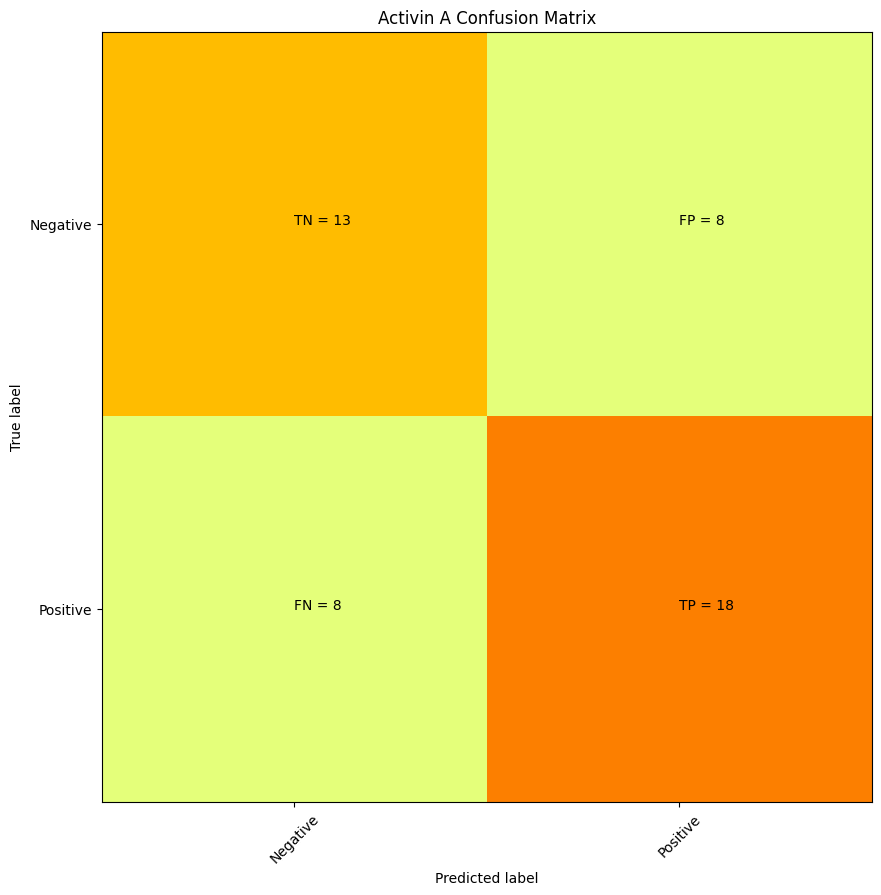

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

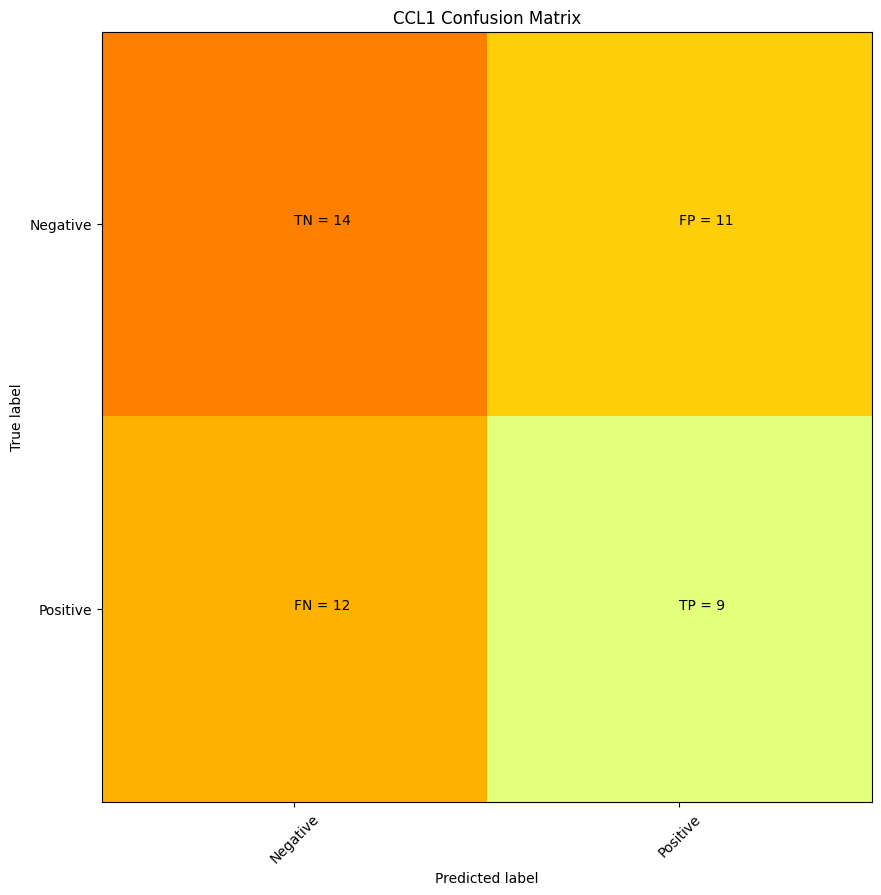

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

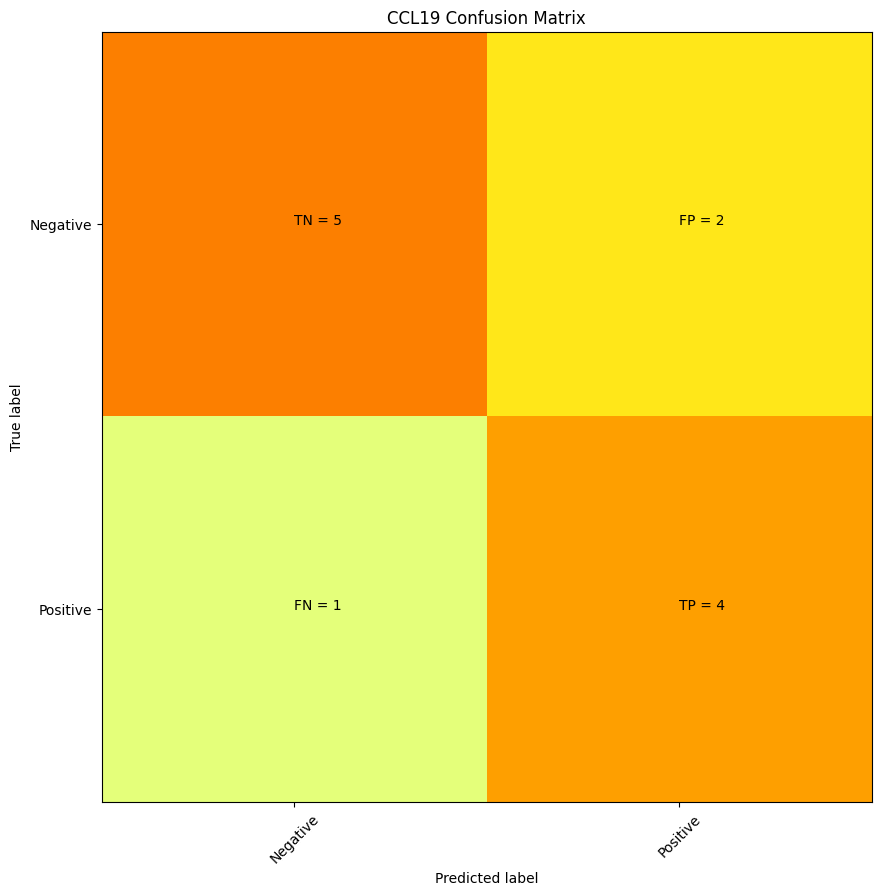

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = 0.6666666666666666 recall = 0.8


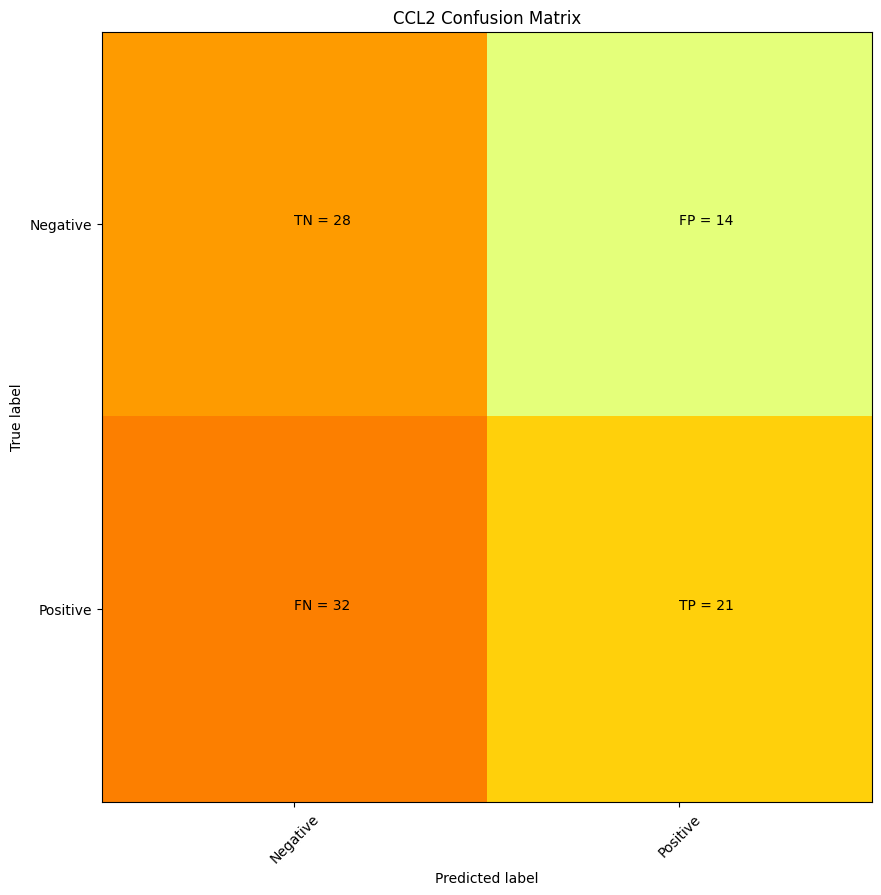

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

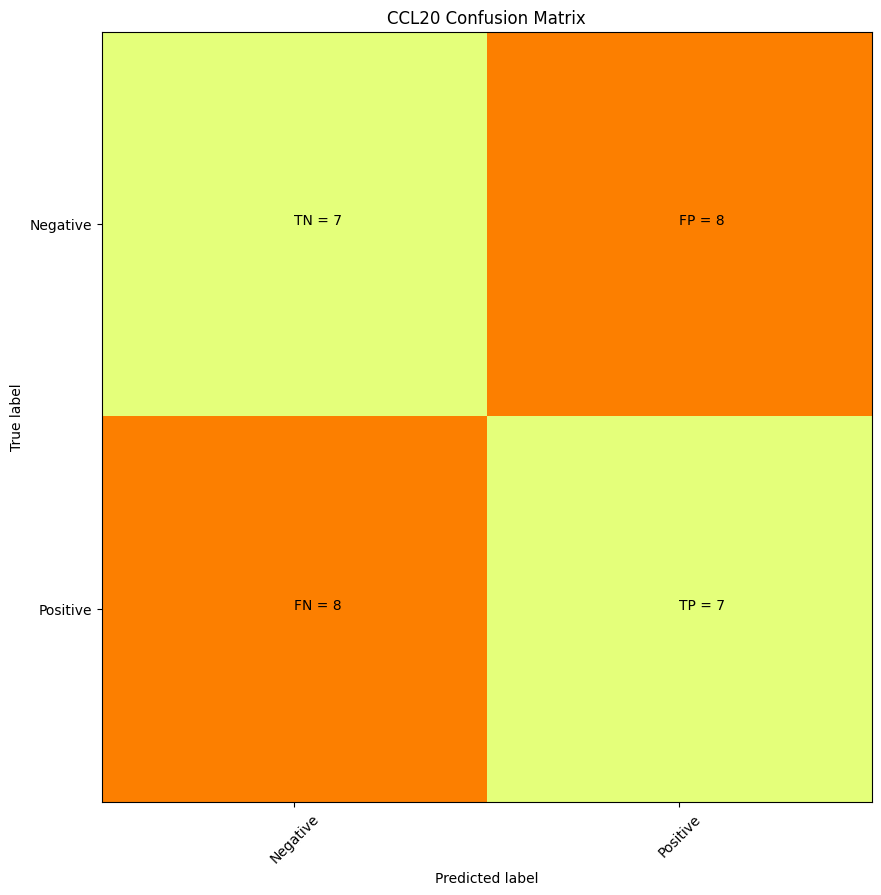

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.4666666666666667 recall = 0.4666666666666667


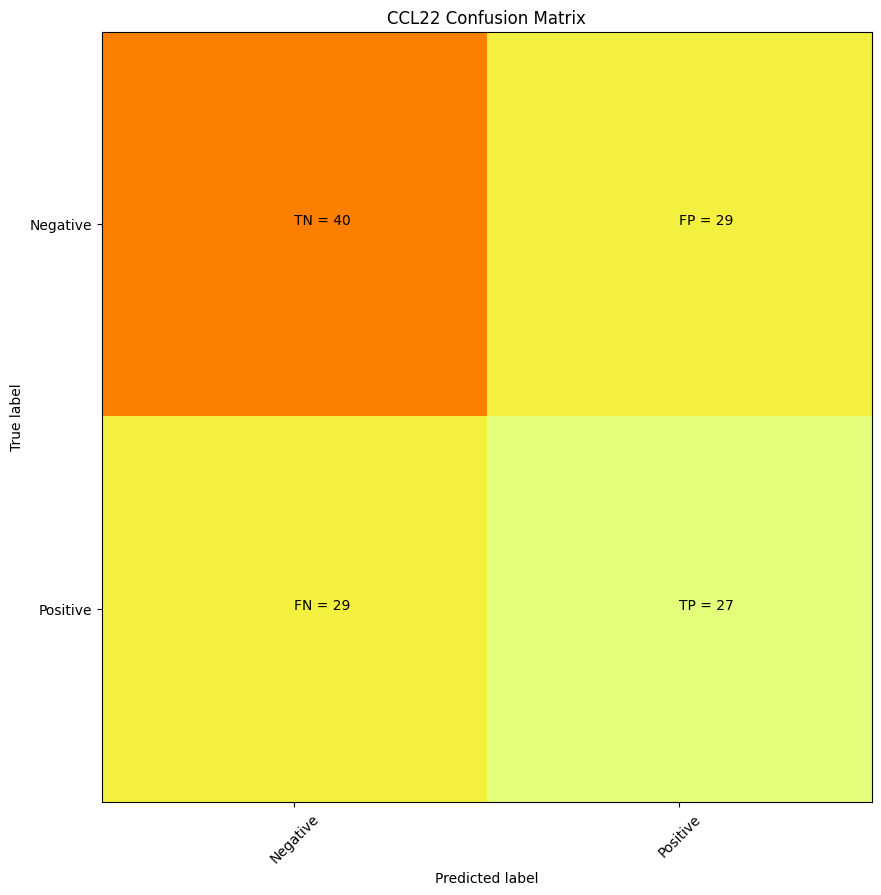

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

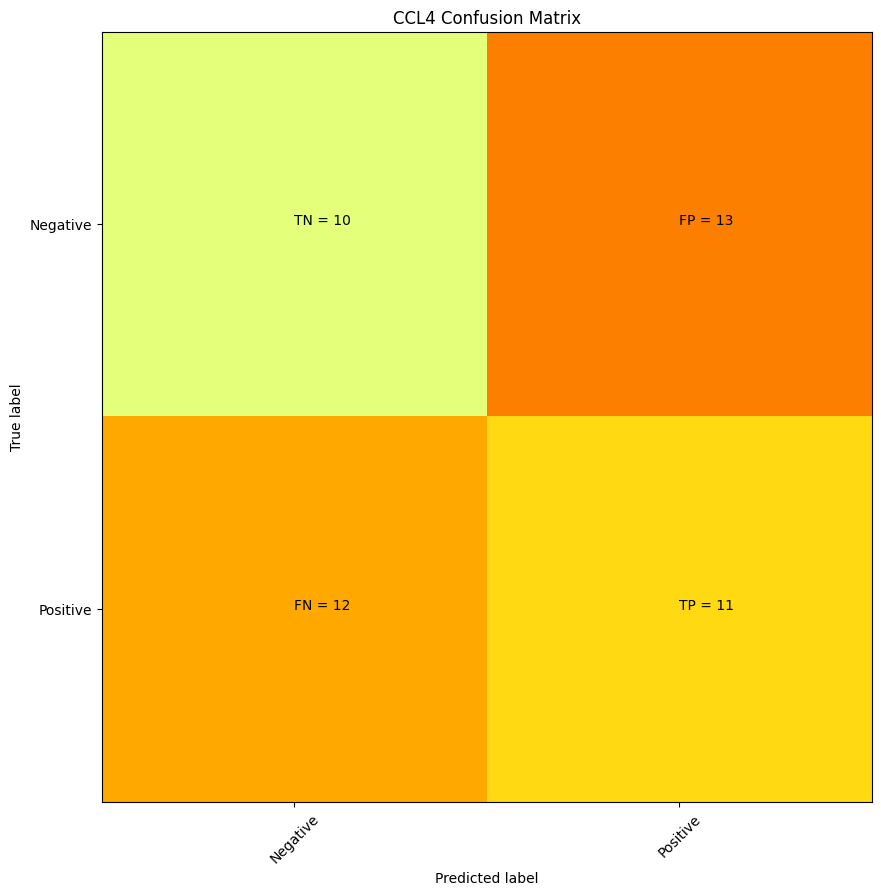

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

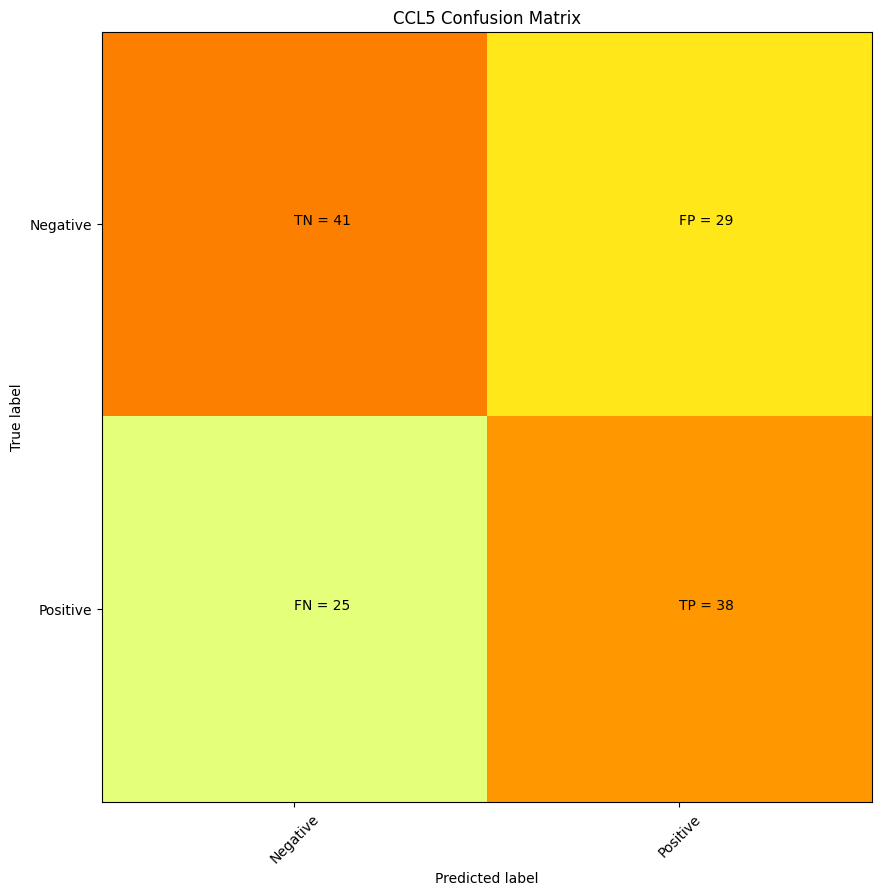

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

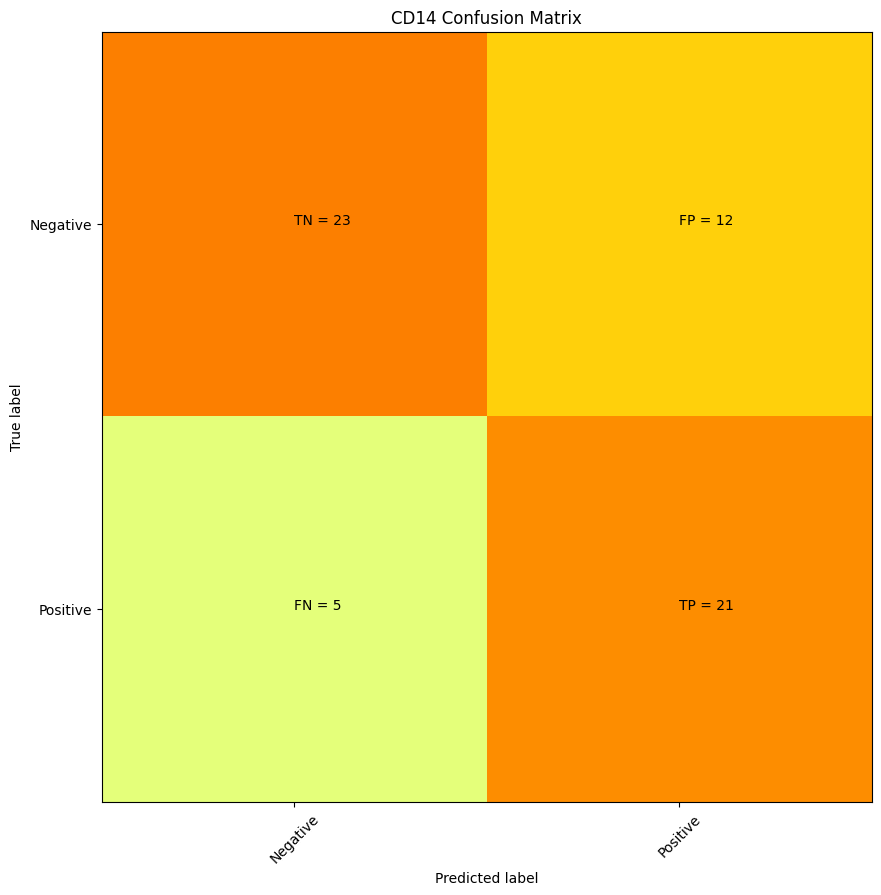

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

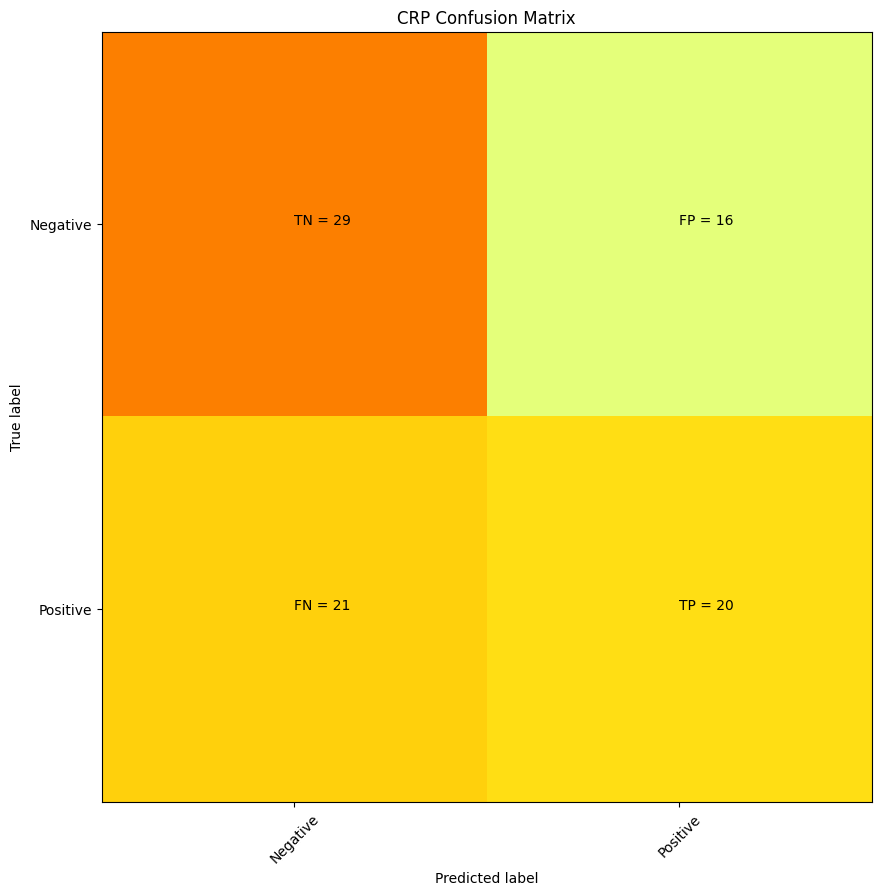

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


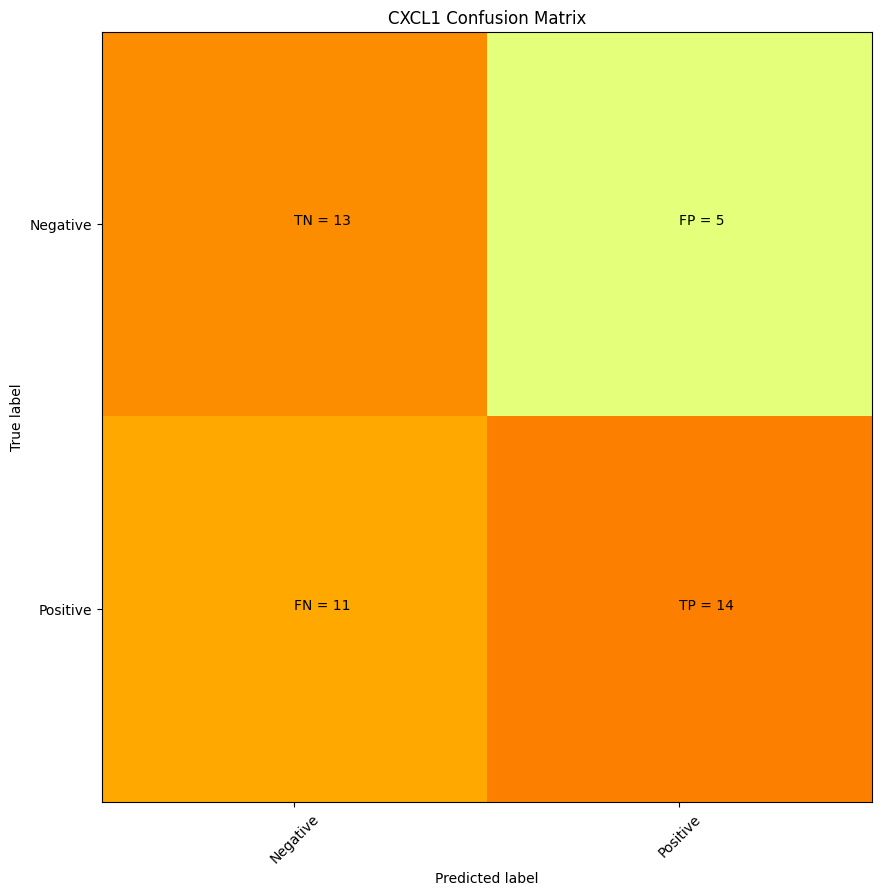

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

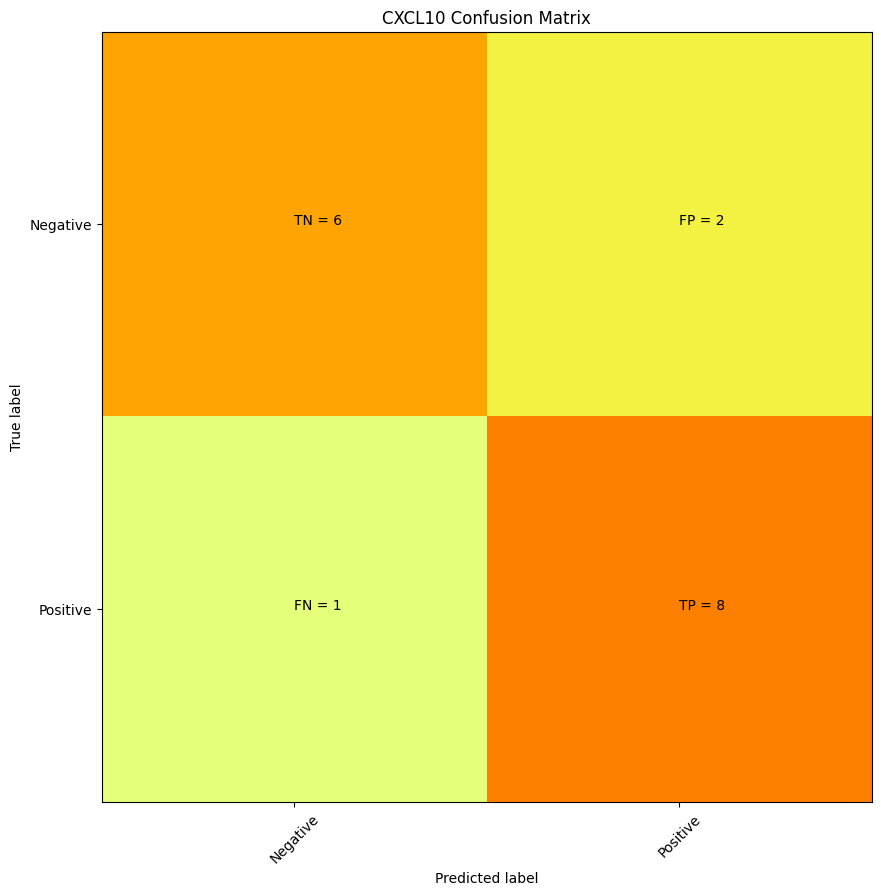

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 0.8 recall = 0.8888888888888888


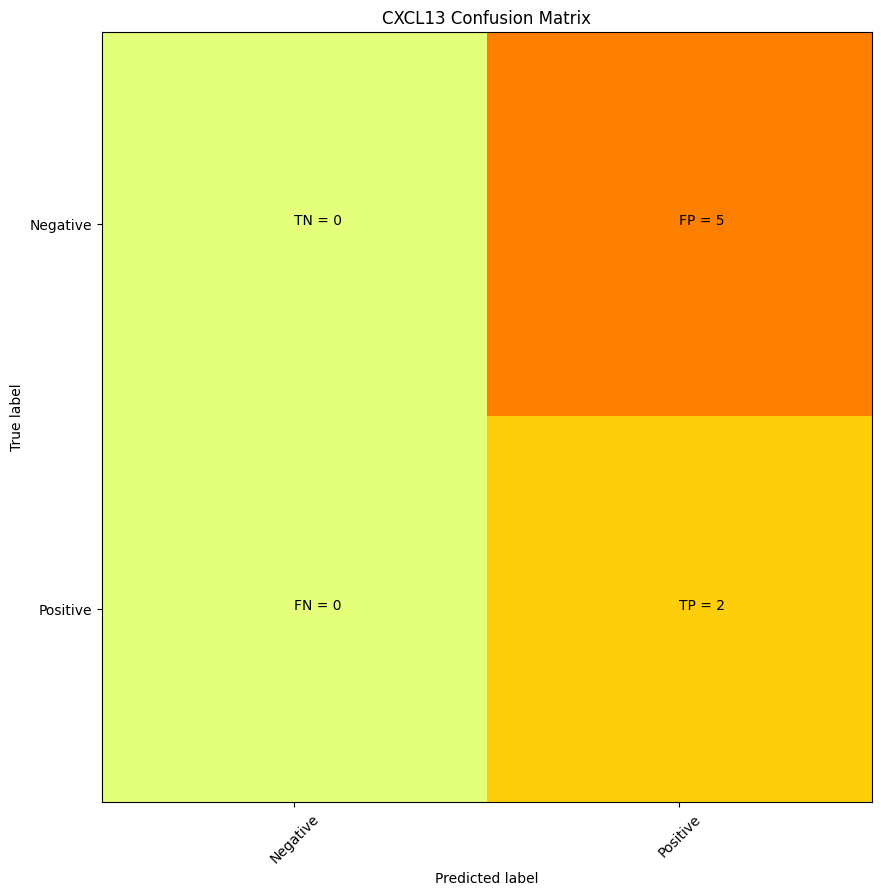

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = 0.2857142857142857 recall = 1.0


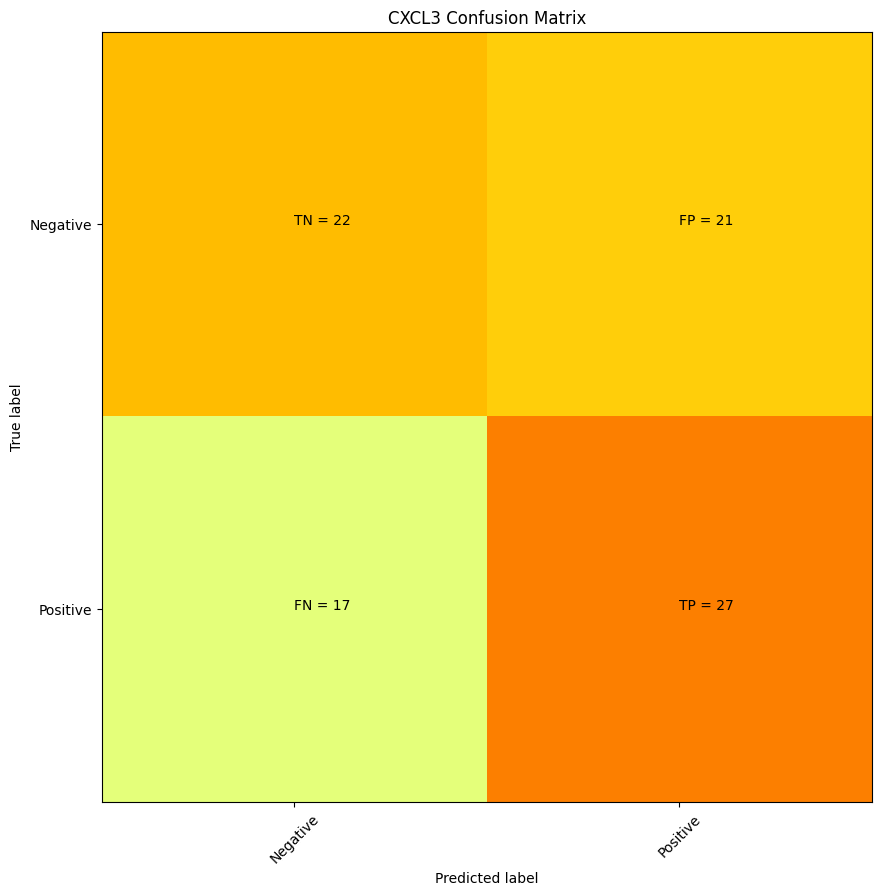

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

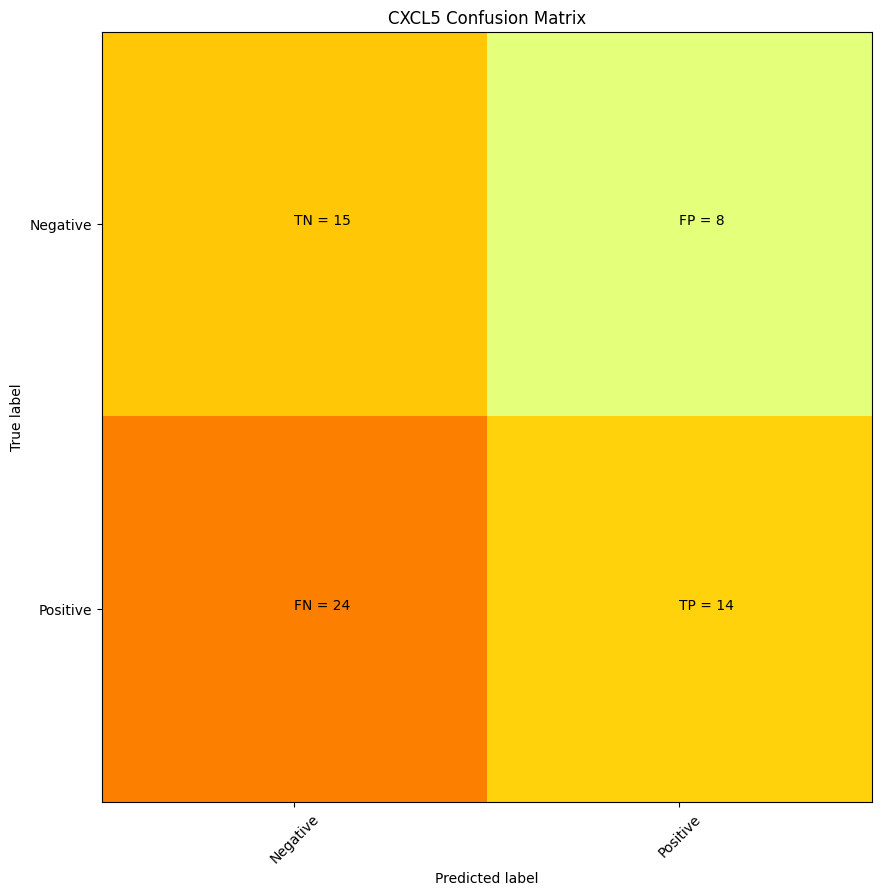

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

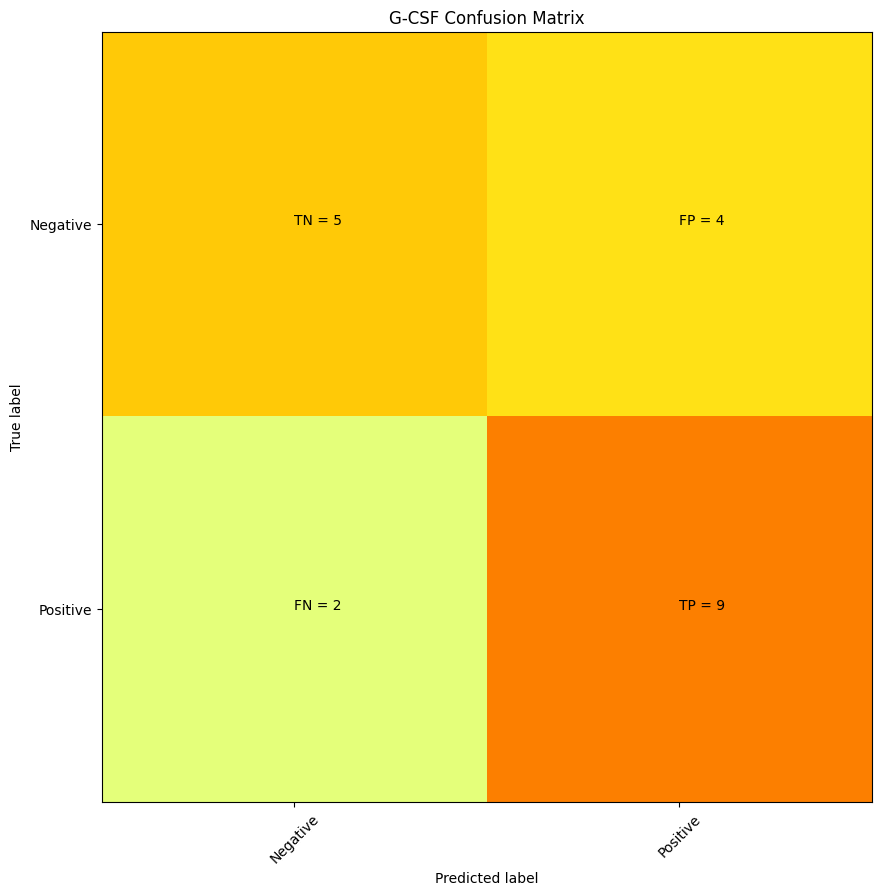

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.6923076923076923 recall = 0.8181818181818182


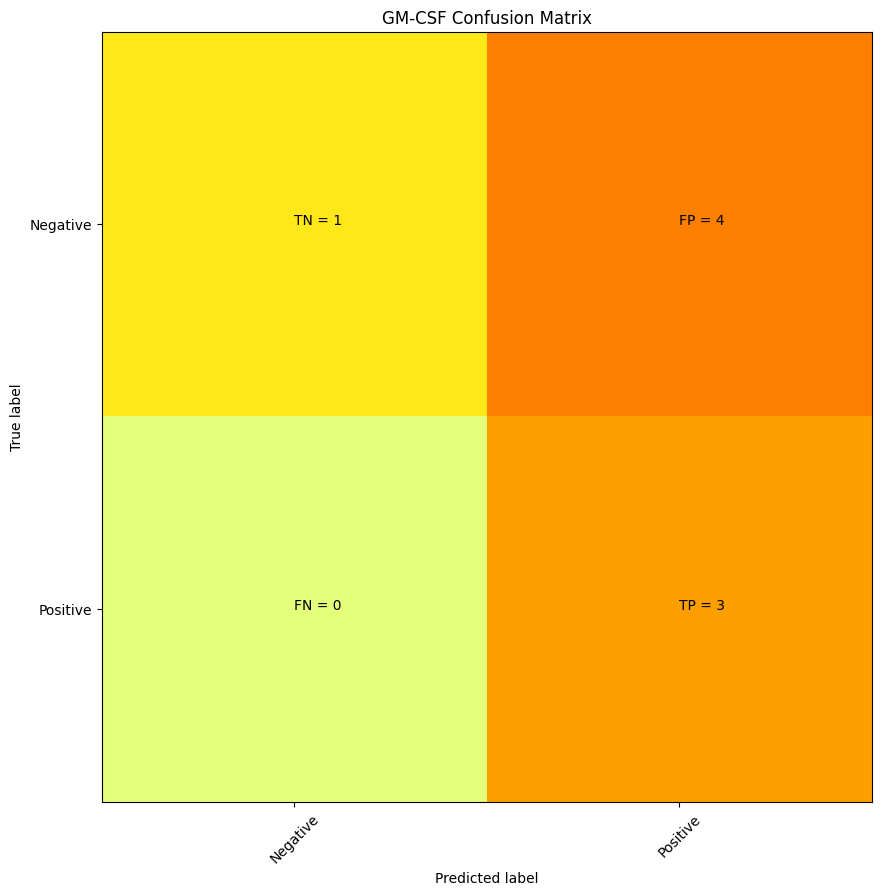

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = 0.42857142857142855 recall = 1.0


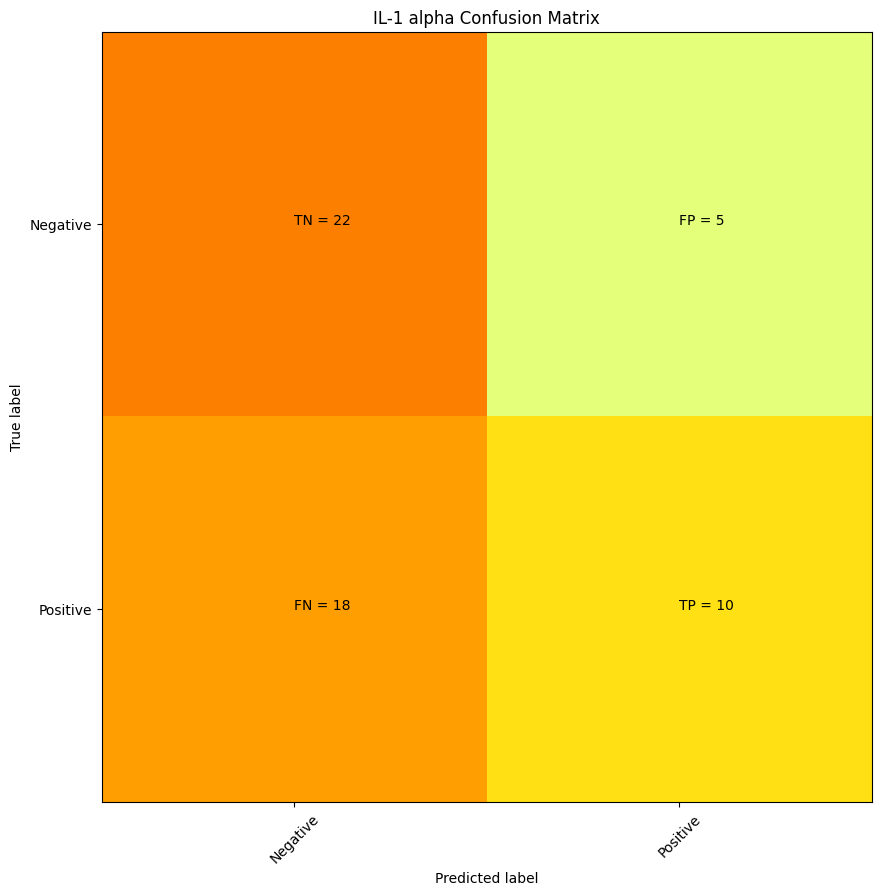

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

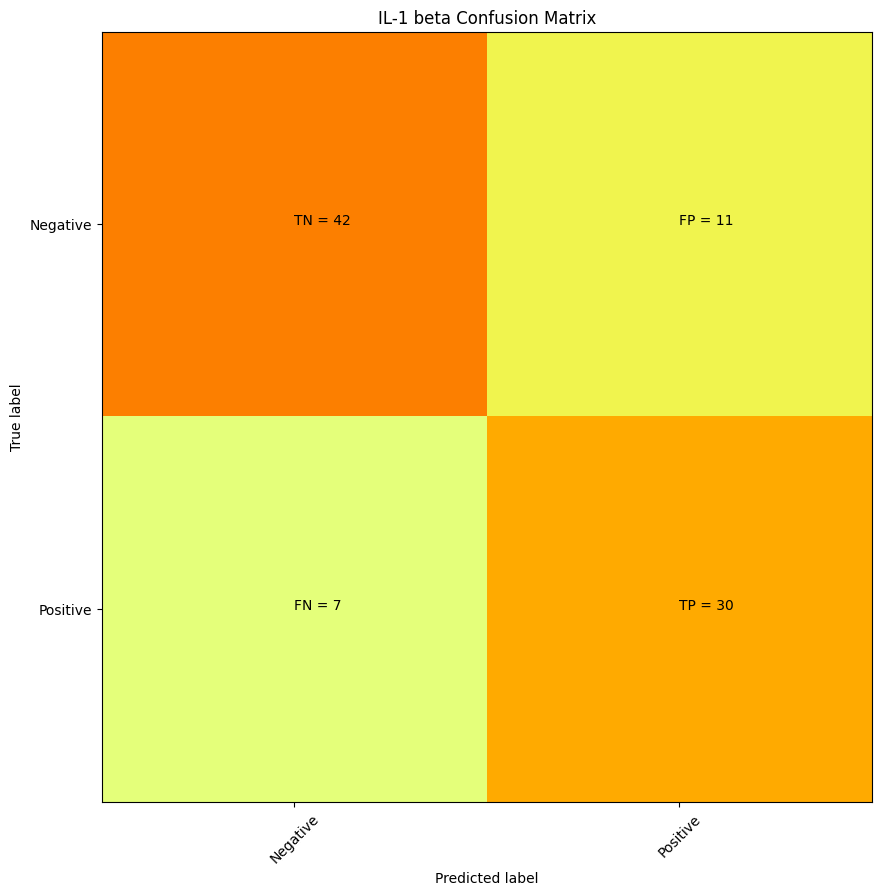

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

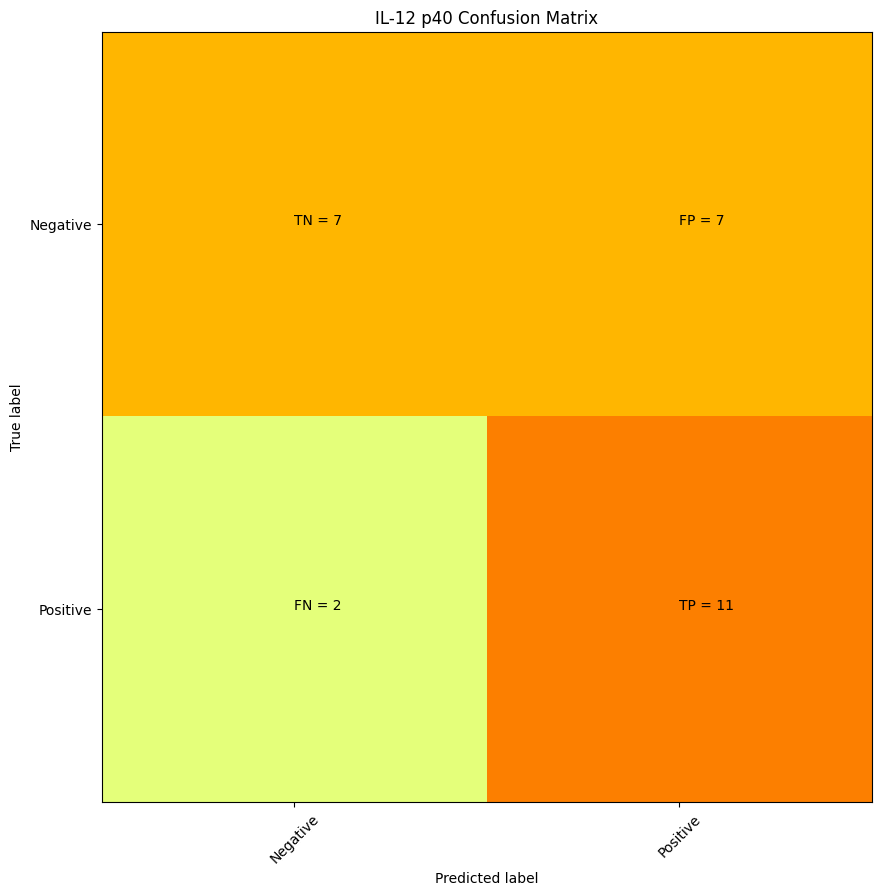

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
B18           0
A07           0
H02           0
B14           0
L04           0
K05           0
G09           0
N19           0
I09           0
C24           0
G12           0
J14           0
D21           0
D12           0
J19           0
B02           0
C11           0
D08           0
P14           0
E08           0
I14           0
I11           0
H03           0
H05           0
H22           0
P03           0
A15           0 precision = 0.6111111111111112 recall = 0.8461538461538461


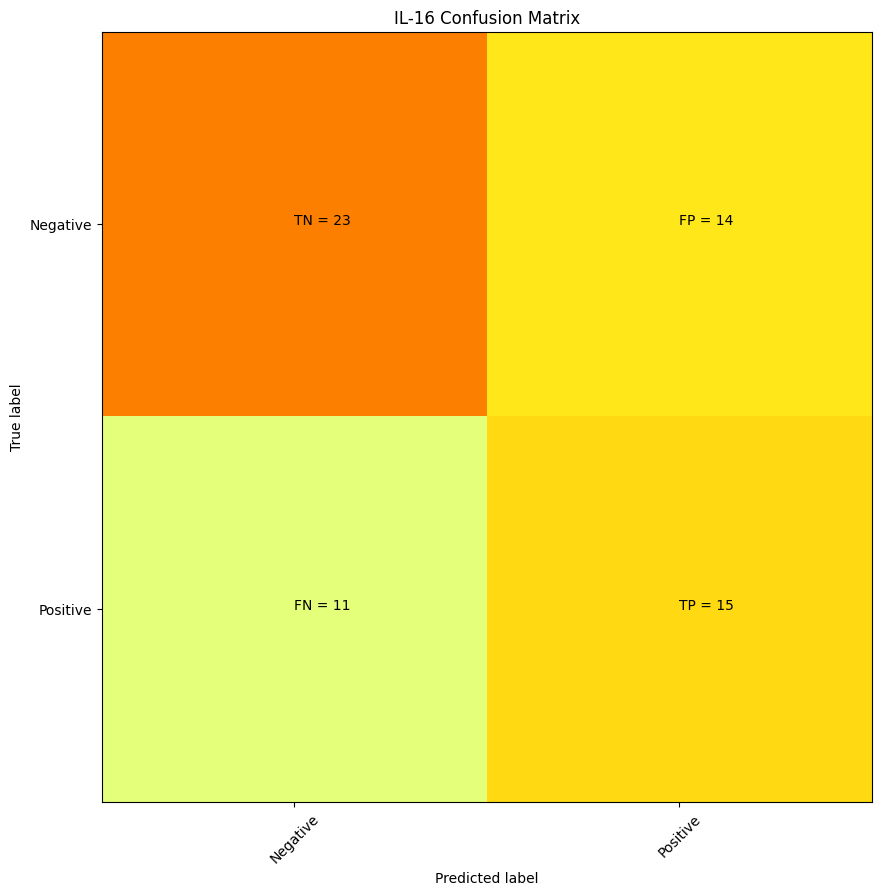

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

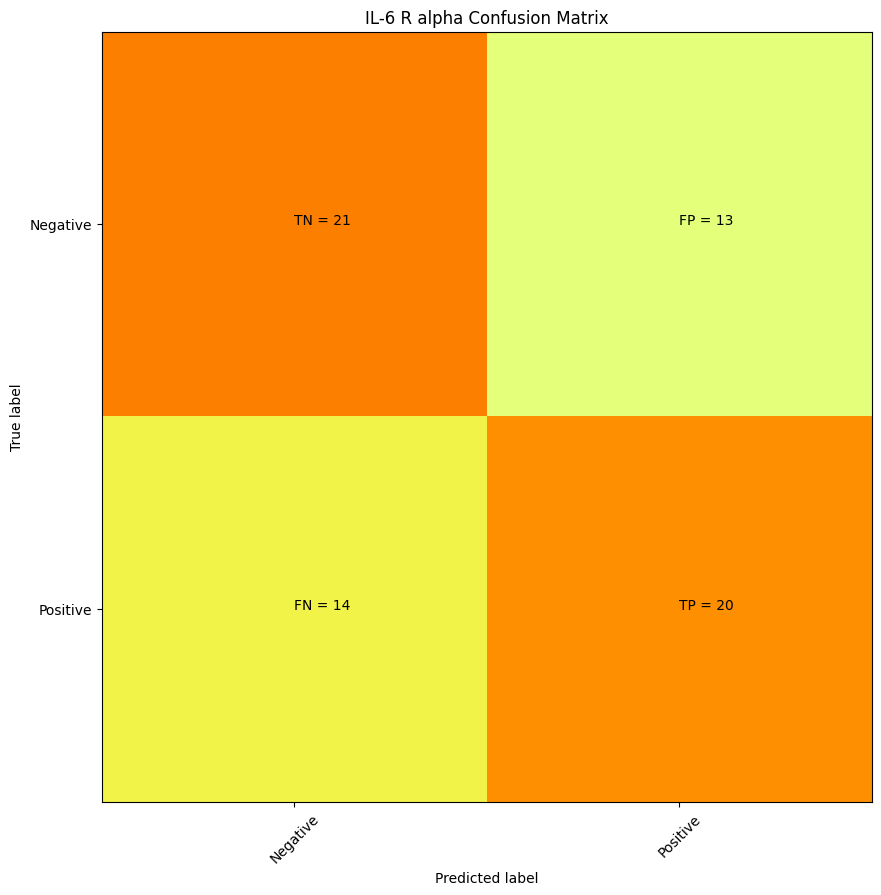

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

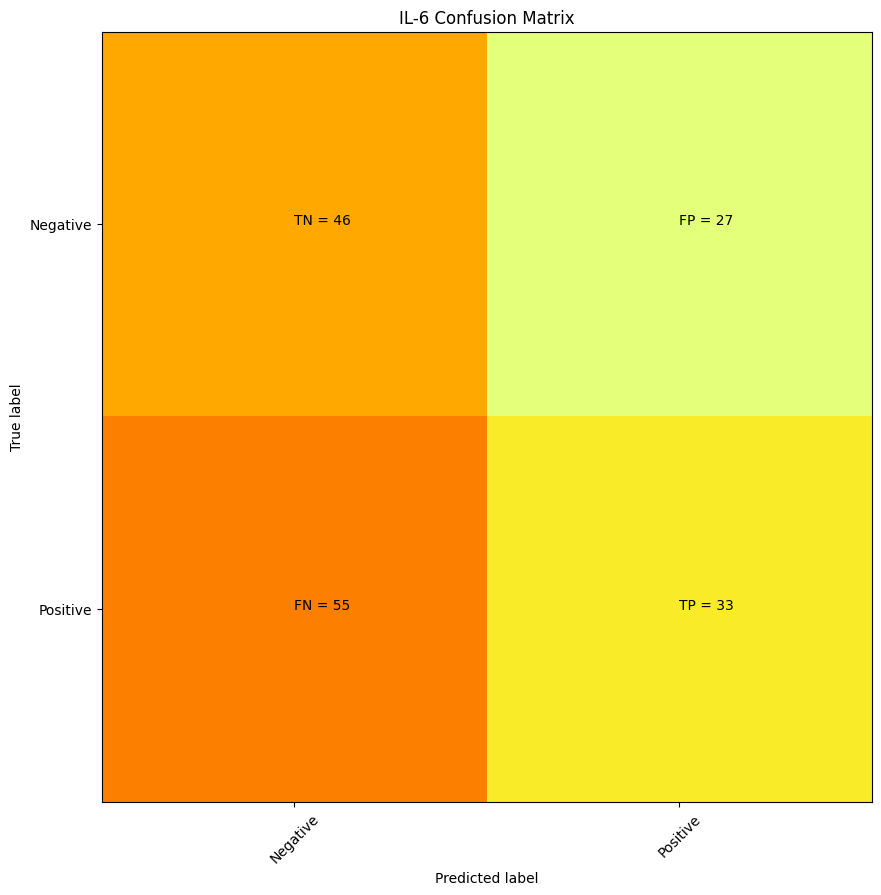

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

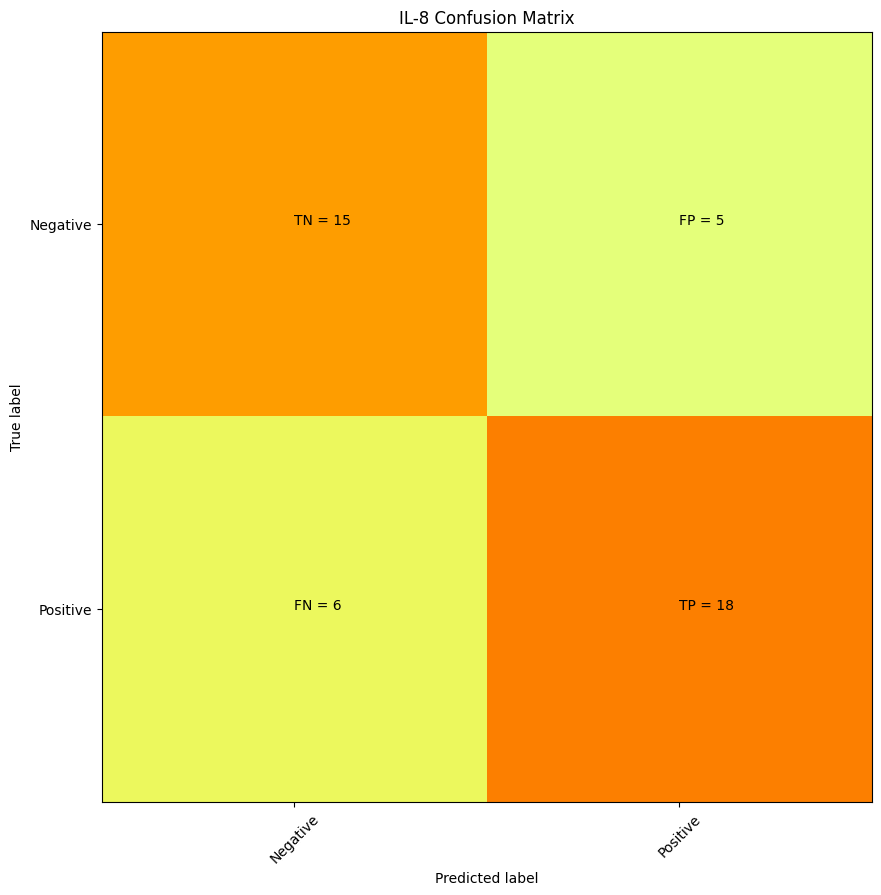

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

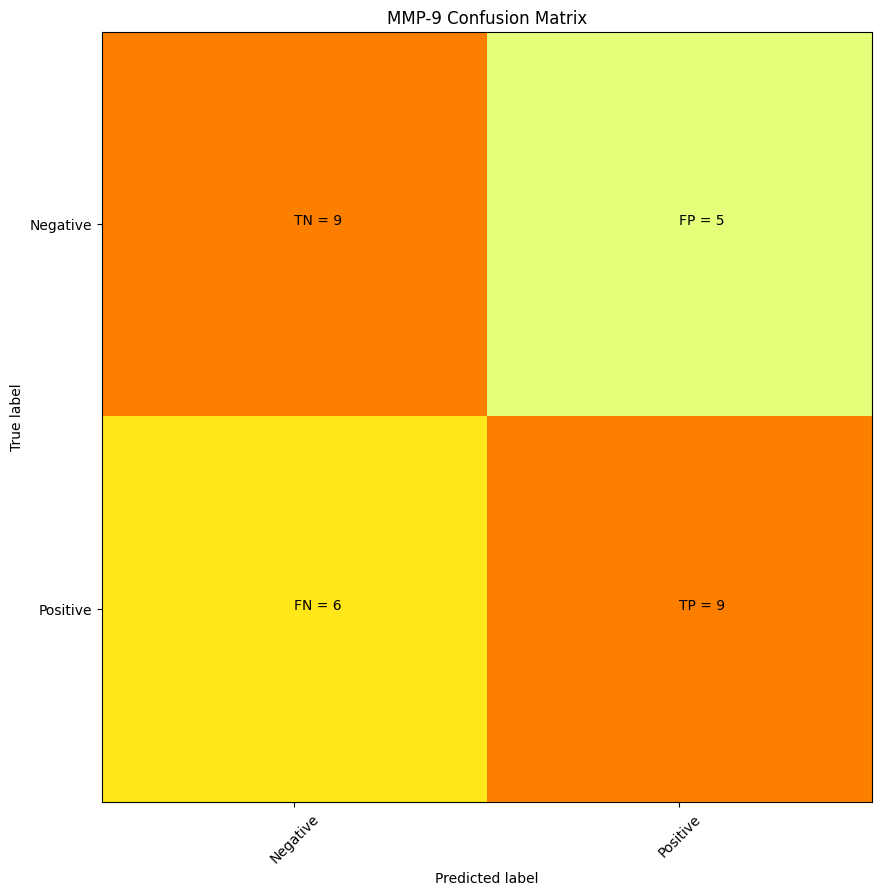

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.6428571428571429 recall = 0.6


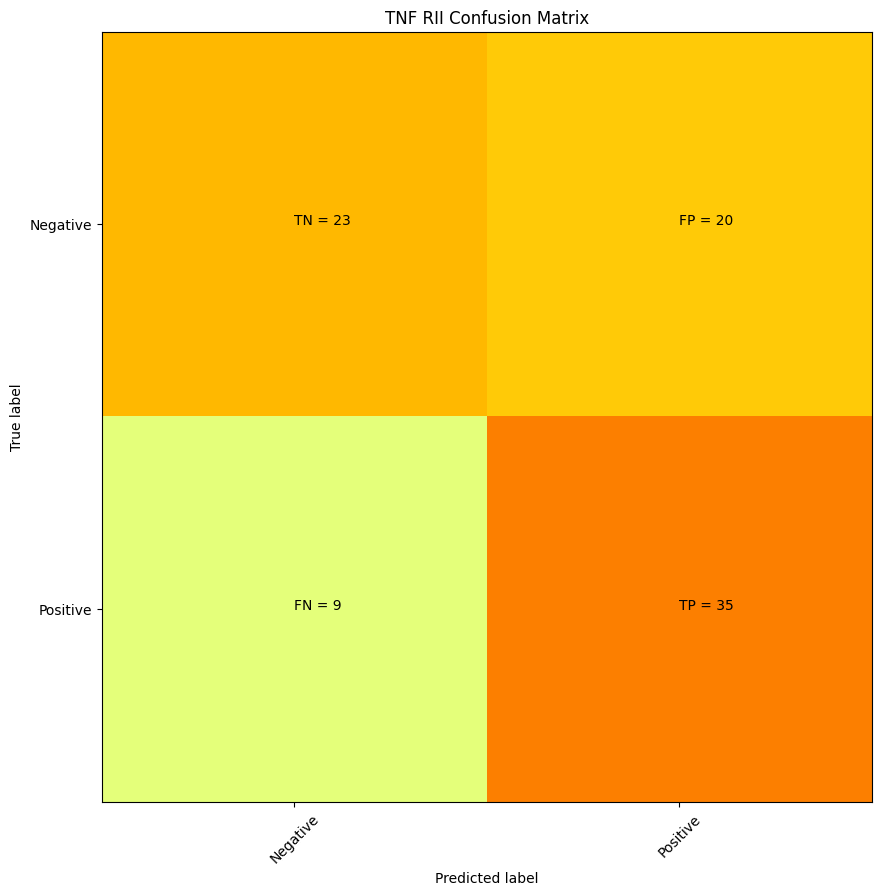

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [47]:
summarizing = []
summarizer_variance = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in variances_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_variance = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_variance['Precision'] = summarizer_variance['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [48]:
summarizer_variance

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.692308,0.692308,24,47
1,CCL1,0.450000,0.428571,28,46
2,CCL19,0.666667,0.800000,25,12
3,CCL2,0.600000,0.396226,78,95
4,CCL20,0.466667,0.466667,28,30
5,CCL22,0.482143,0.482143,20,125
6,CCL4,0.458333,0.478261,45,46
7,CCL5,0.567164,0.603175,54,133
8,CD14,0.636364,0.807692,28,61
9,CRP,0.555556,0.487805,73,86


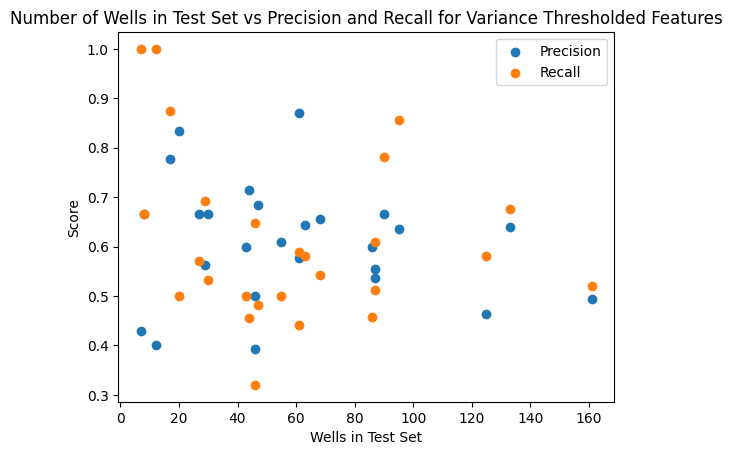

In [43]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
plt.scatter(y=summarizer_variance["Precision"], x = summarizer_variance["Wells in Set"])
plt.scatter(y=summarizer_variance["Recall"], x = summarizer_variance["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Variance Thresholded Features")
plt.show()

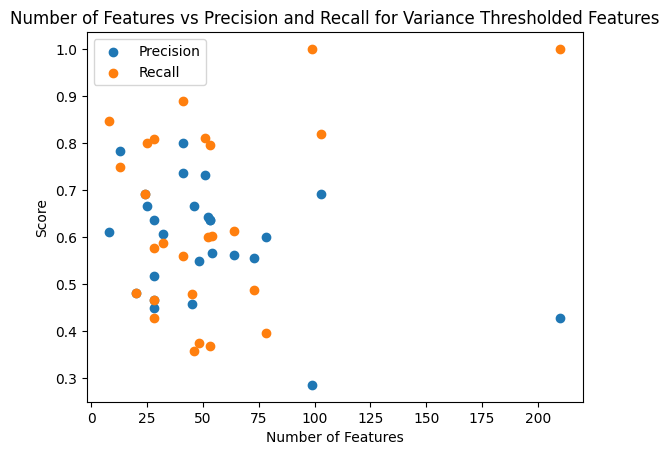

In [49]:

plt.scatter(y=summarizer_variance["Precision"], x = summarizer_variance["Number of Features"])
plt.scatter(y=summarizer_variance["Recall"], x = summarizer_variance["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features vs Precision and Recall for Variance Thresholded Features")
plt.show()

## Performance with univariate (F1) selected features

In [50]:
univariates_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = univariates[univariates["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        univariates_listing.append(finaldata)
    except:
        continue

univariates_listing[0]

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_118,Output_236,Output_289,Output_368,Output_589,Output_768,Output_903,Output_917,Output_947,Output_1110
well,,,,,,,,,,,
A09,1,2.909582,0.106166,0.304378,0.333284,0.327093,-0.047537,5.635931,0.422330,0.119836,0.074953
C03,1,2.605289,0.064794,0.329772,0.431634,0.317422,-0.048295,5.793055,0.579540,0.089752,0.115405
C09,1,2.293271,0.124729,0.356542,0.411939,0.320937,-0.058752,5.603607,0.570416,0.110152,0.115591
C17,1,2.166797,0.104048,0.201632,0.397451,0.290003,-0.052663,5.335701,0.523976,0.051295,0.061529
F03,1,2.531449,0.107106,0.321403,0.435558,0.378357,-0.057366,5.630318,0.606788,0.104920,0.137784
F04,1,2.561344,0.109707,0.321080,0.389069,0.285028,-0.056015,5.691682,0.538118,0.102098,0.125470
F05,1,2.505181,0.076323,0.338202,0.442887,0.352036,-0.050898,5.678301,0.458850,0.082966,0.104176
F08,1,2.645512,0.093791,0.389382,0.407811,0.313322,-0.046334,5.424012,0.609967,0.114389,0.142028
F09,1,2.819953,0.105329,0.317026,0.405562,0.381770,-0.055522,5.481540,0.515541,0.083107,0.114983


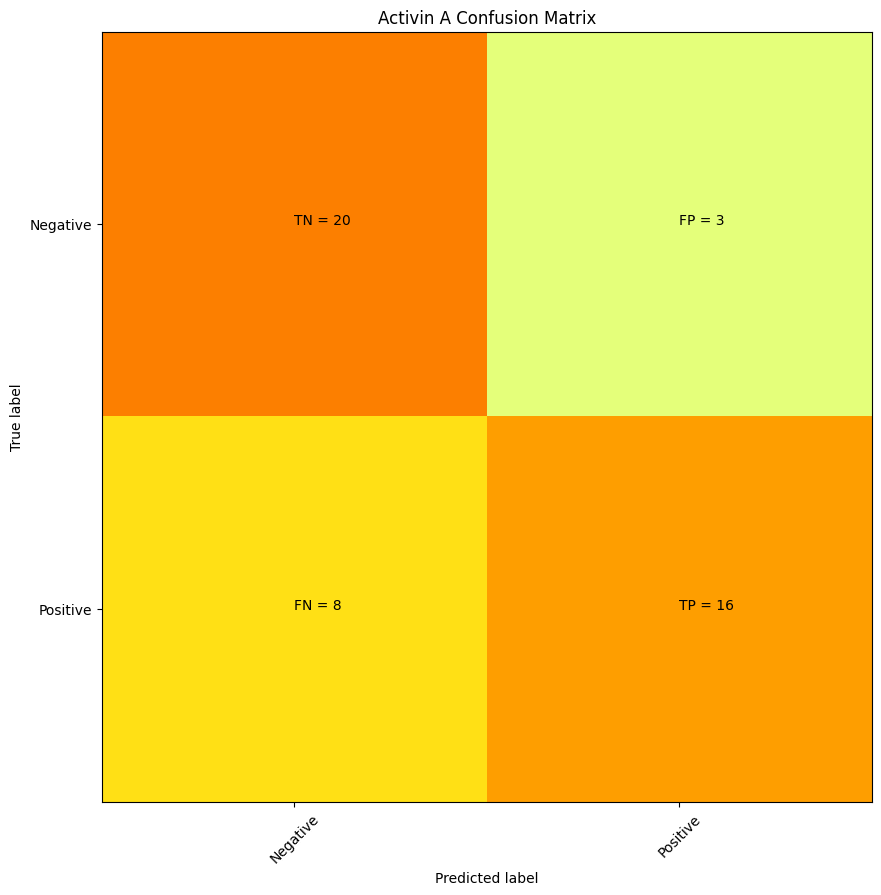

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

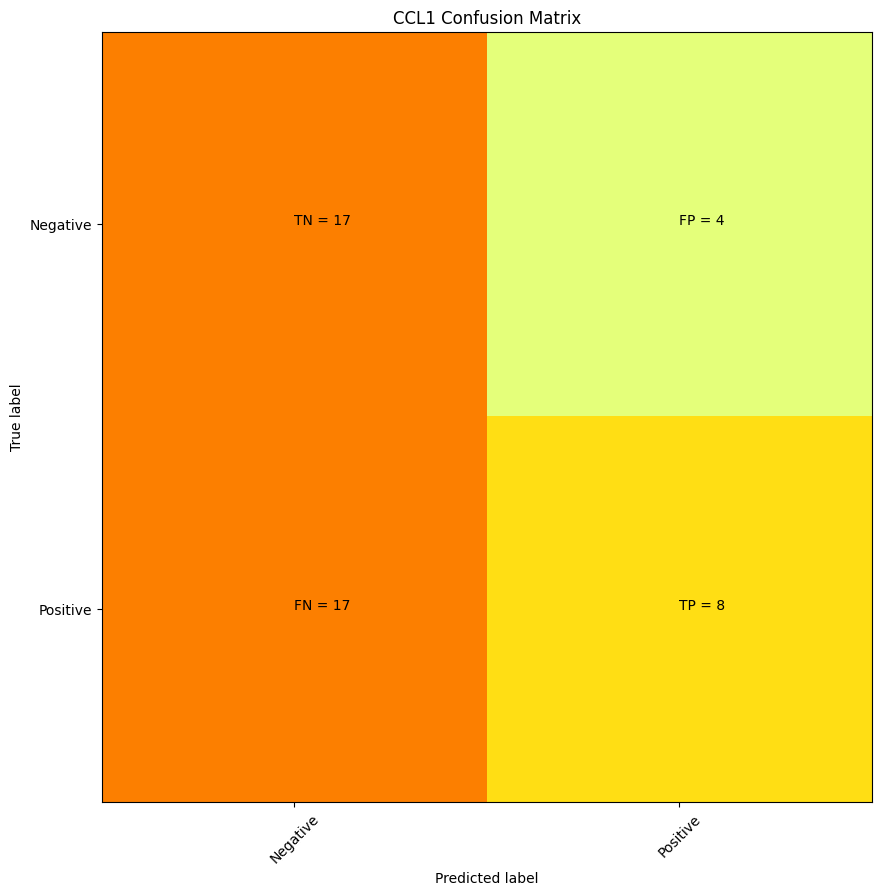

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

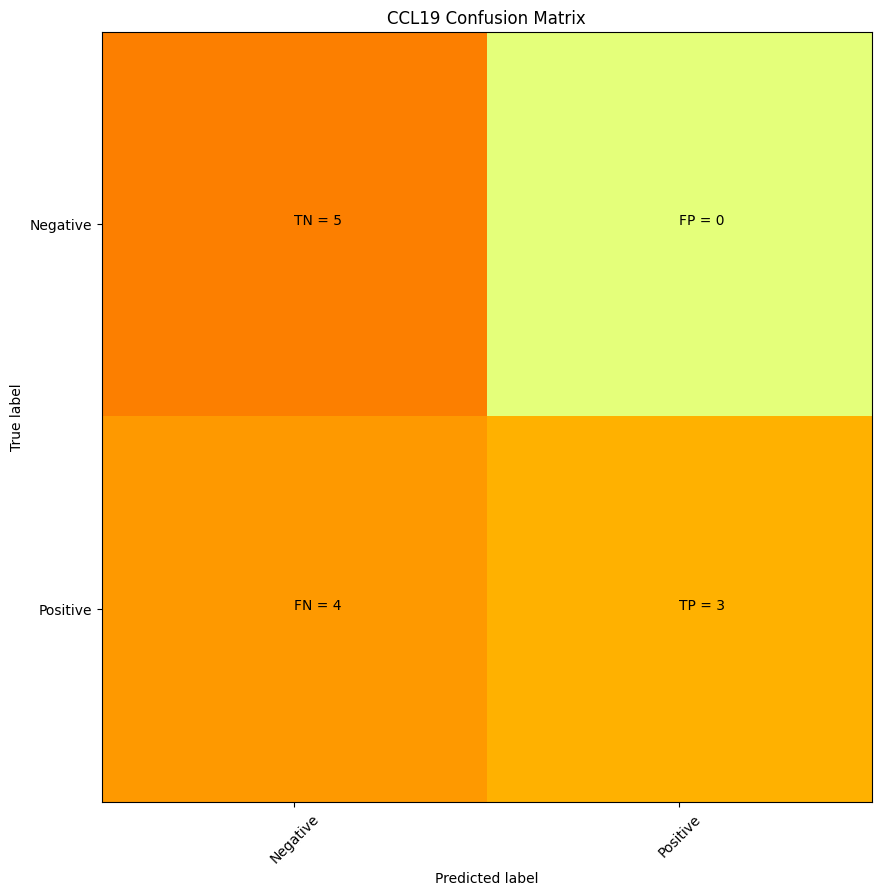

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = 1.0 recall = 0.42857142857142855


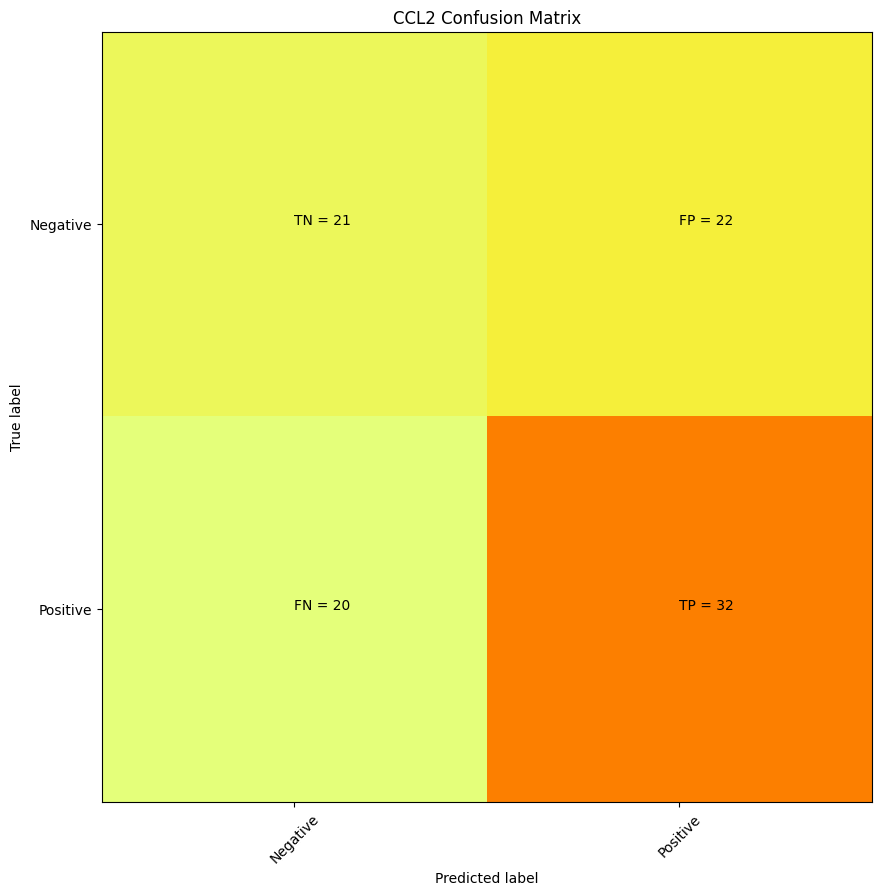

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

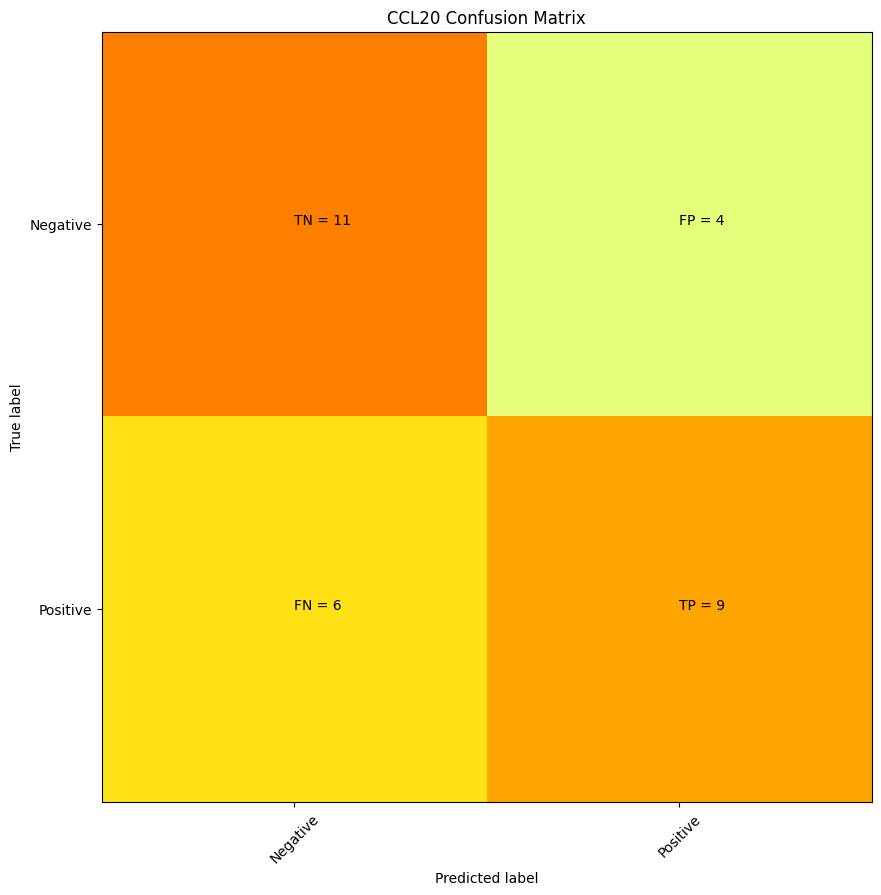

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.6923076923076923 recall = 0.6


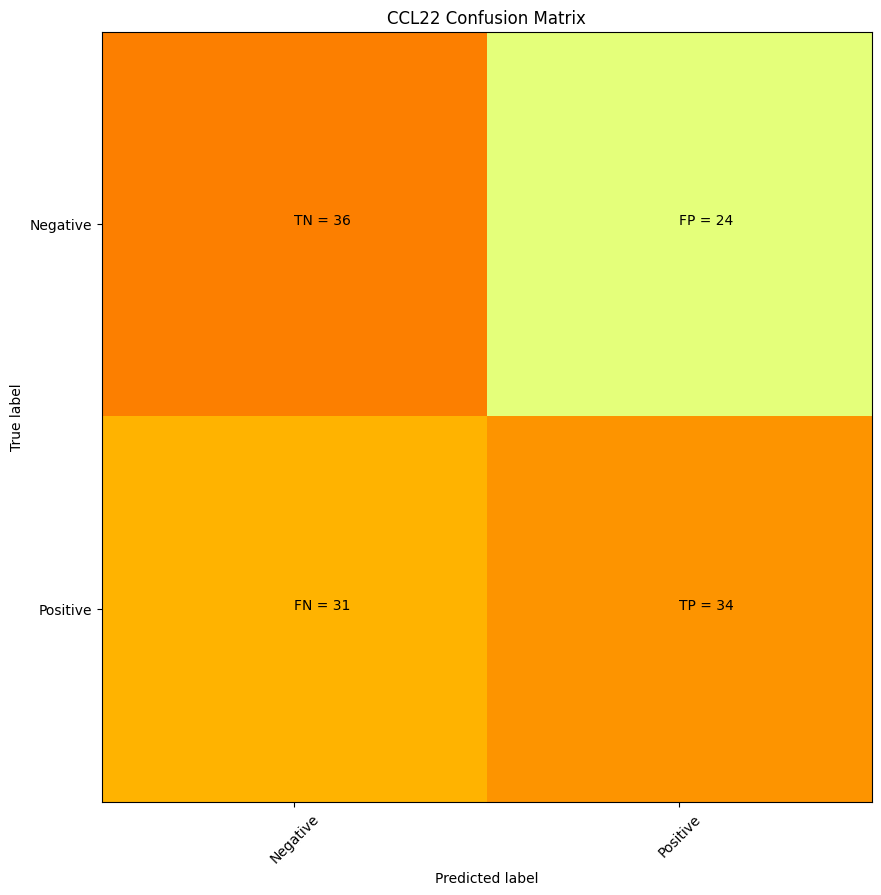

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

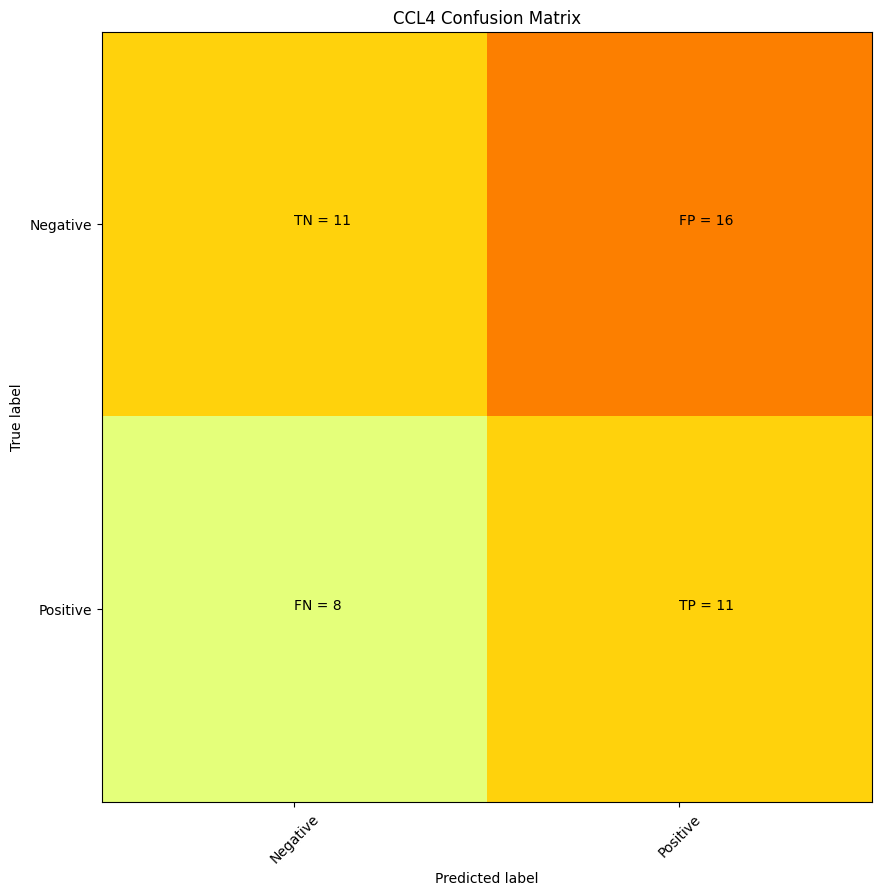

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

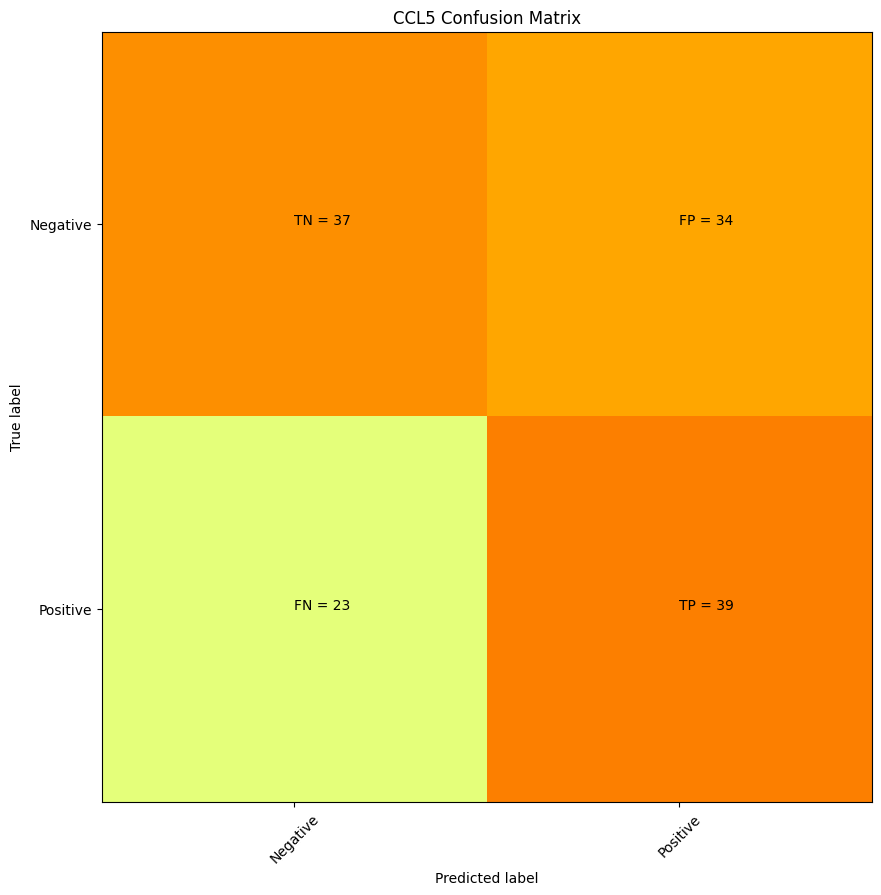

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

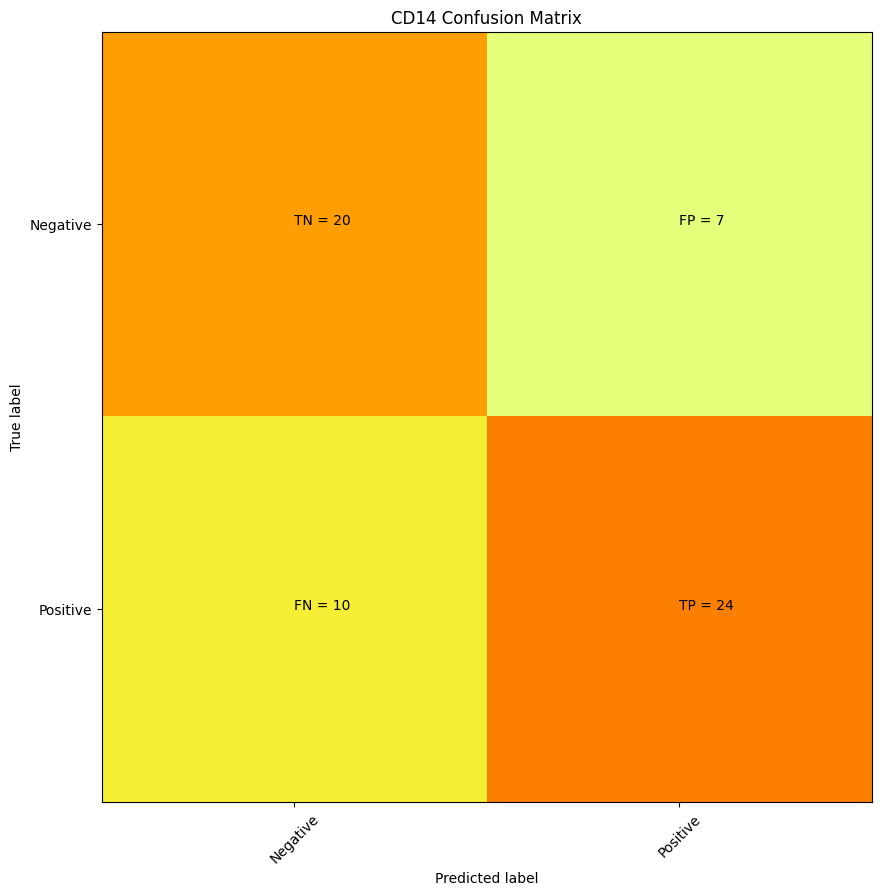

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

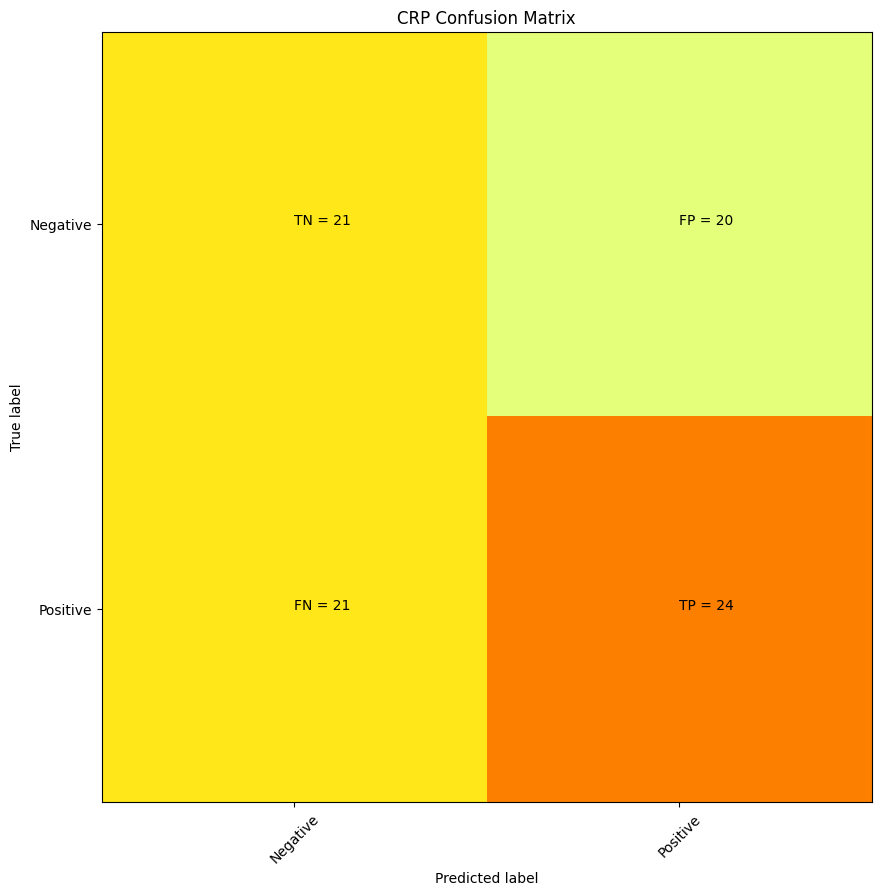

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


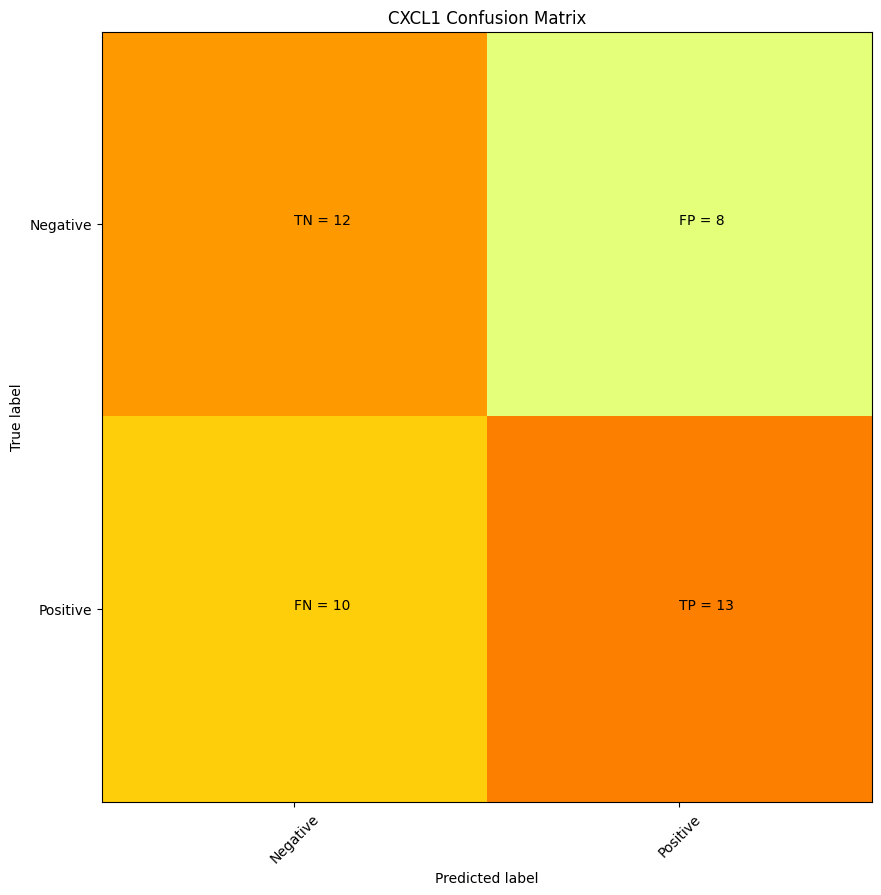

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

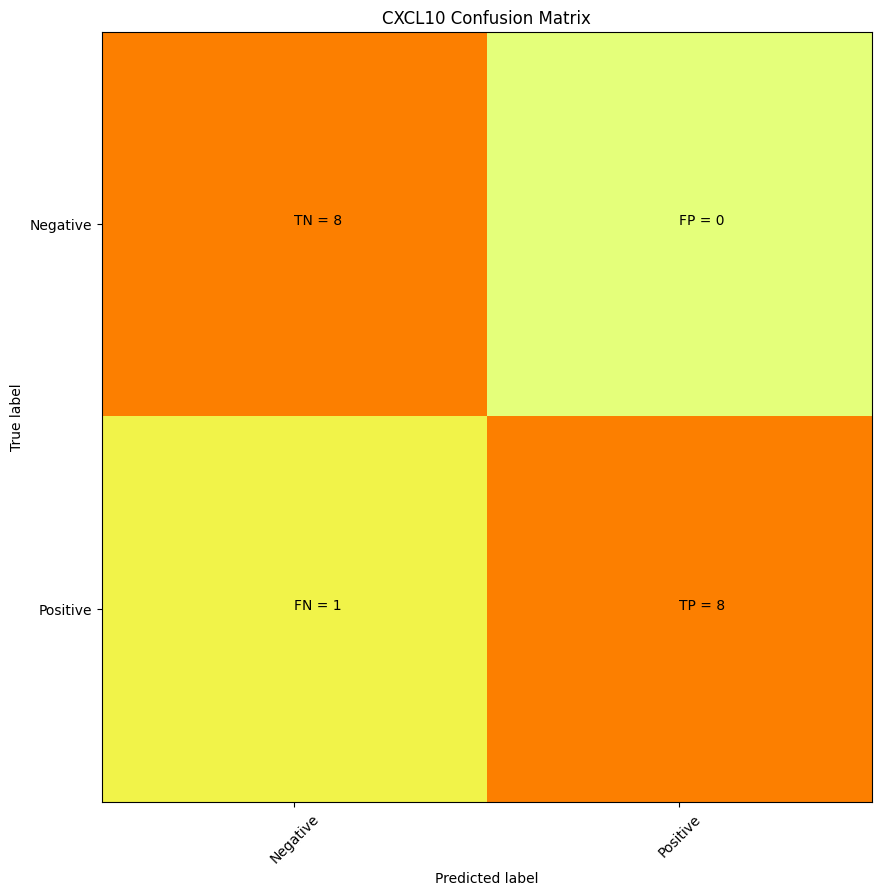

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 1.0 recall = 0.8888888888888888


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


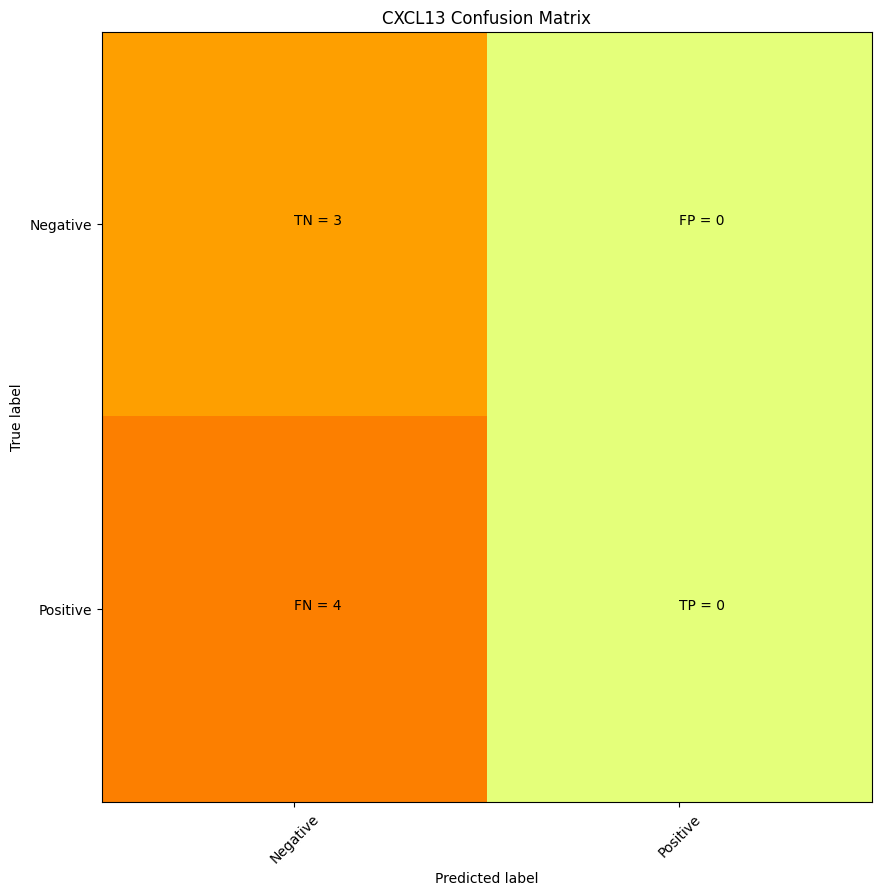

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = nan recall = 0.0


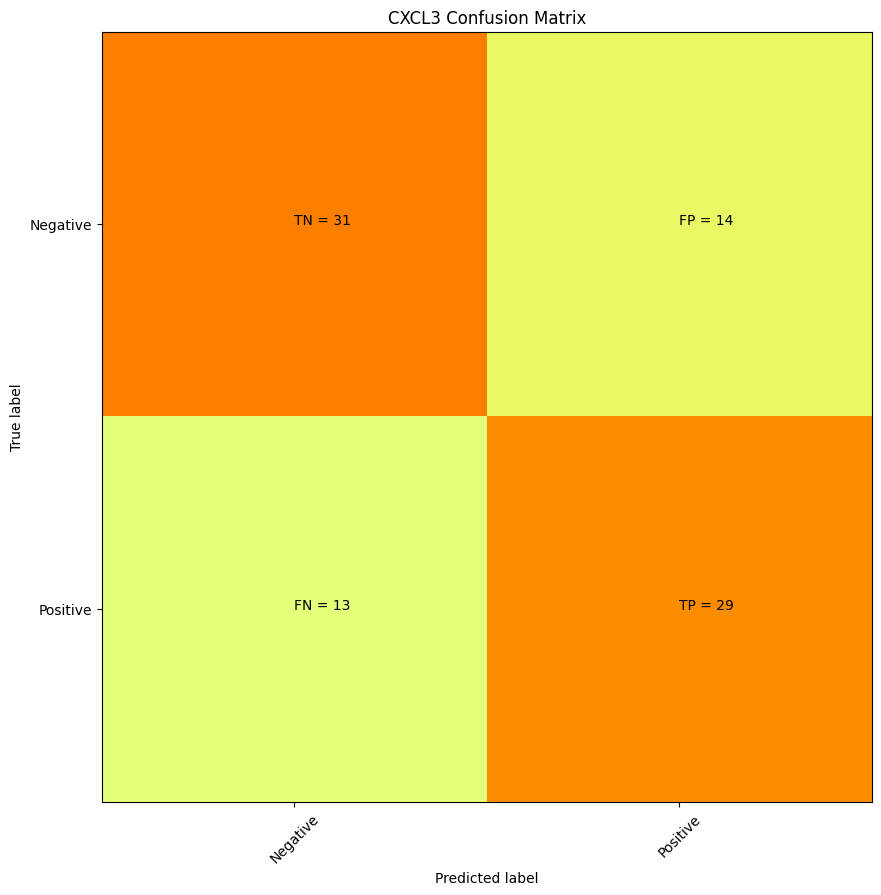

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

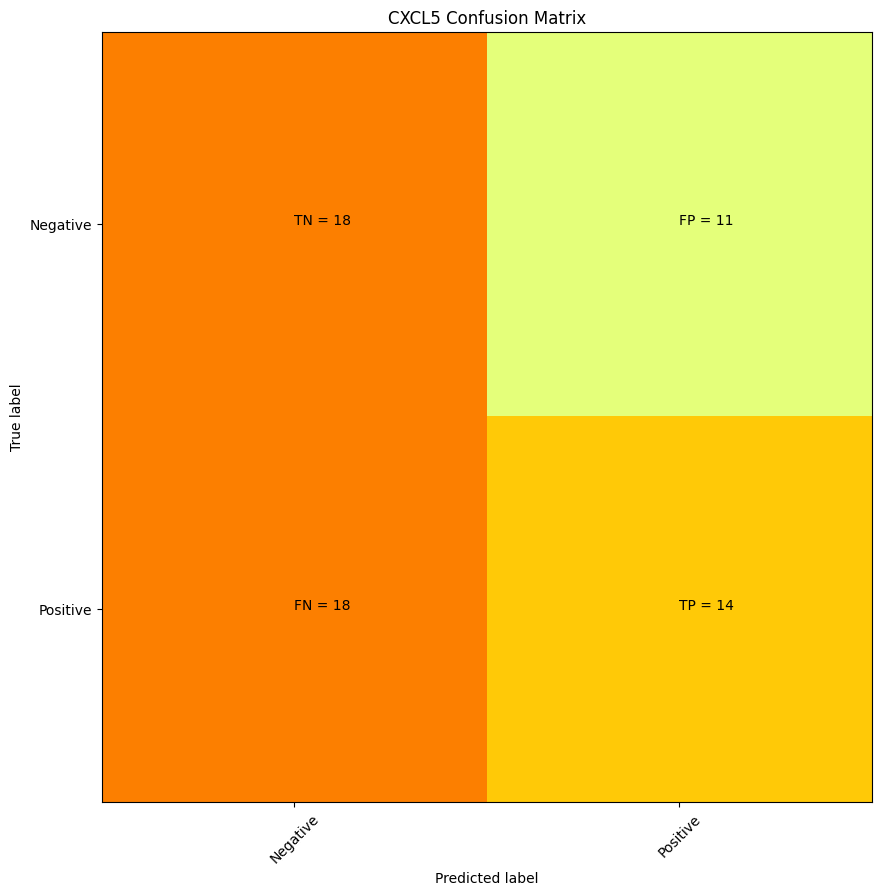

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

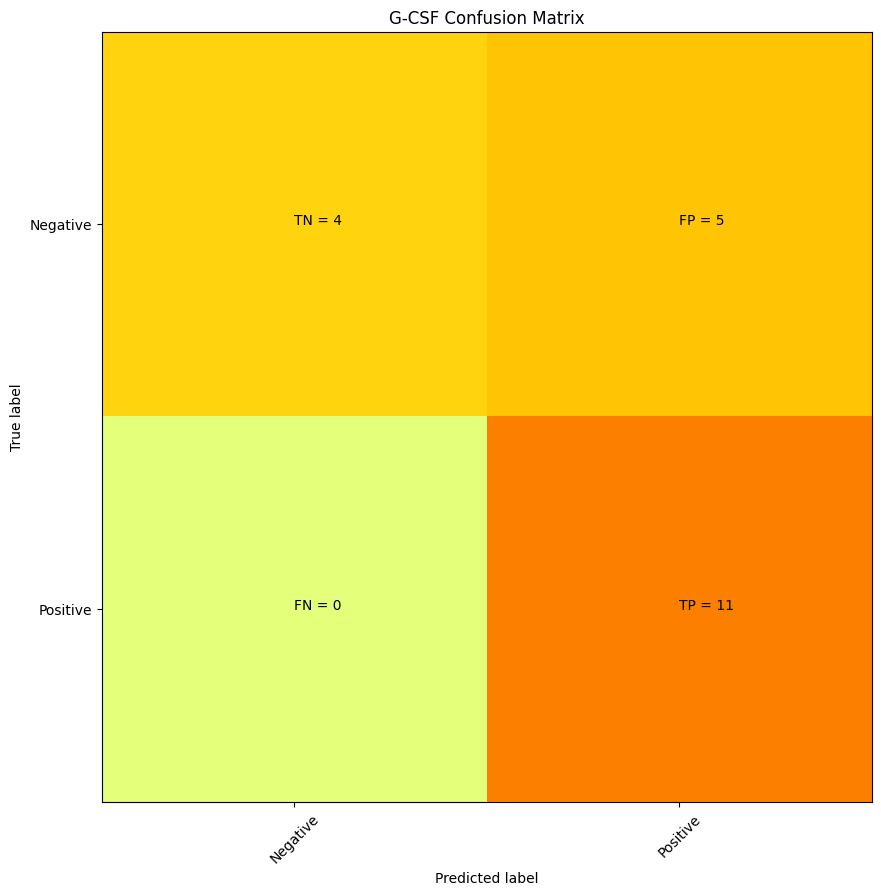

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.6875 recall = 1.0


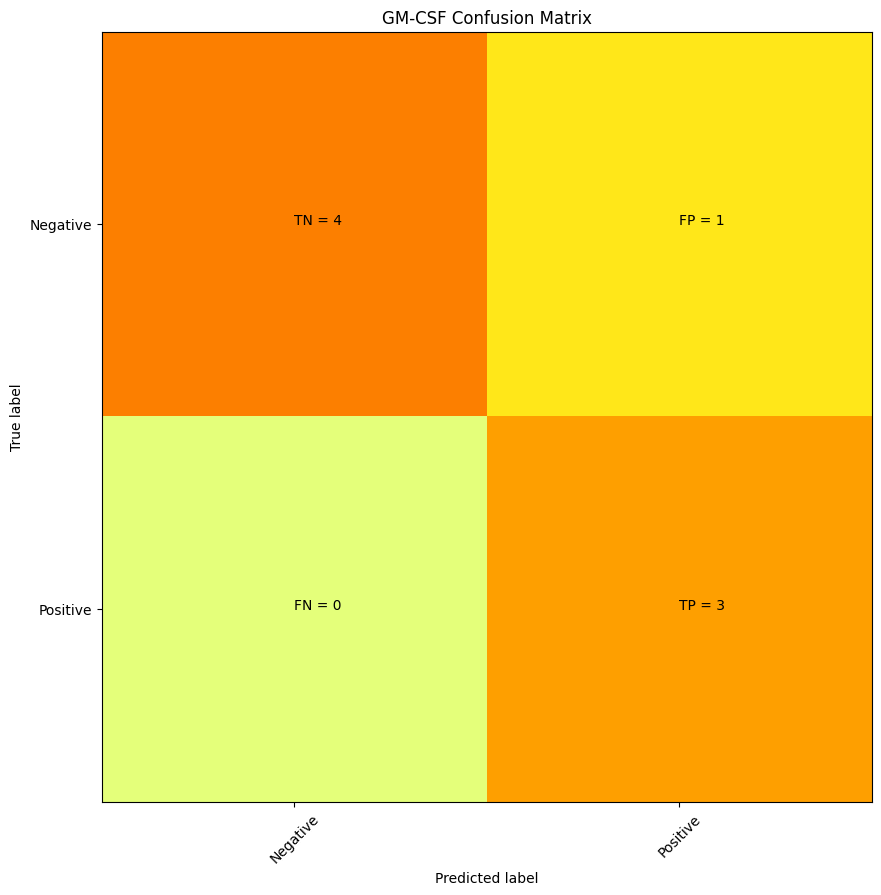

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = 0.75 recall = 1.0


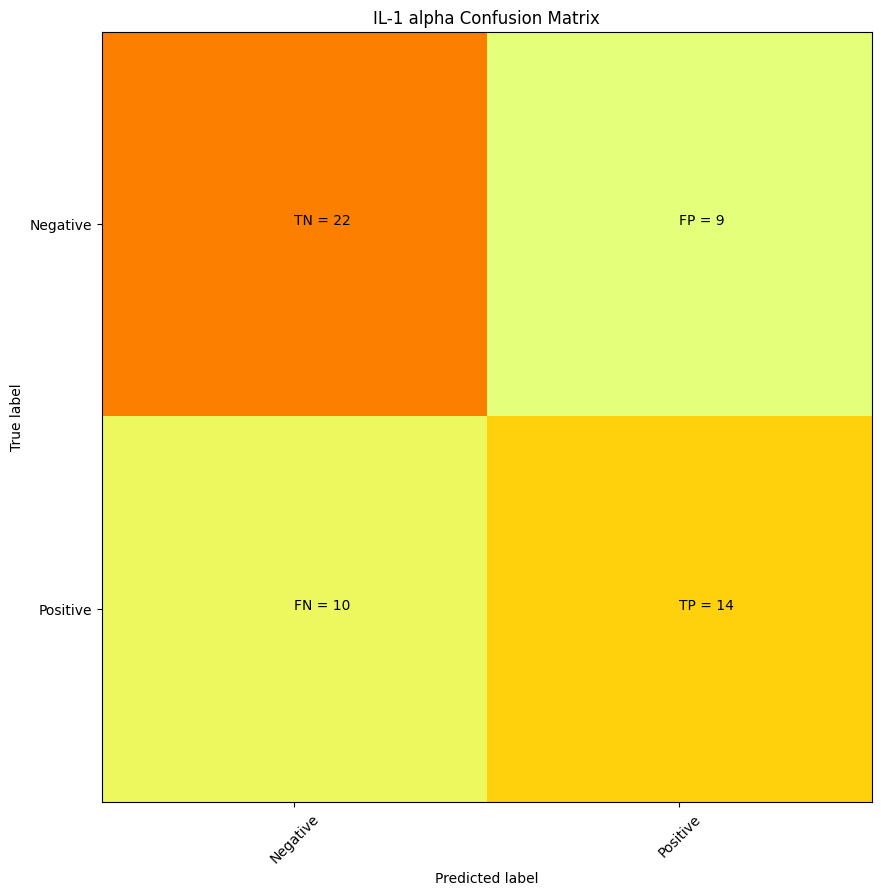

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

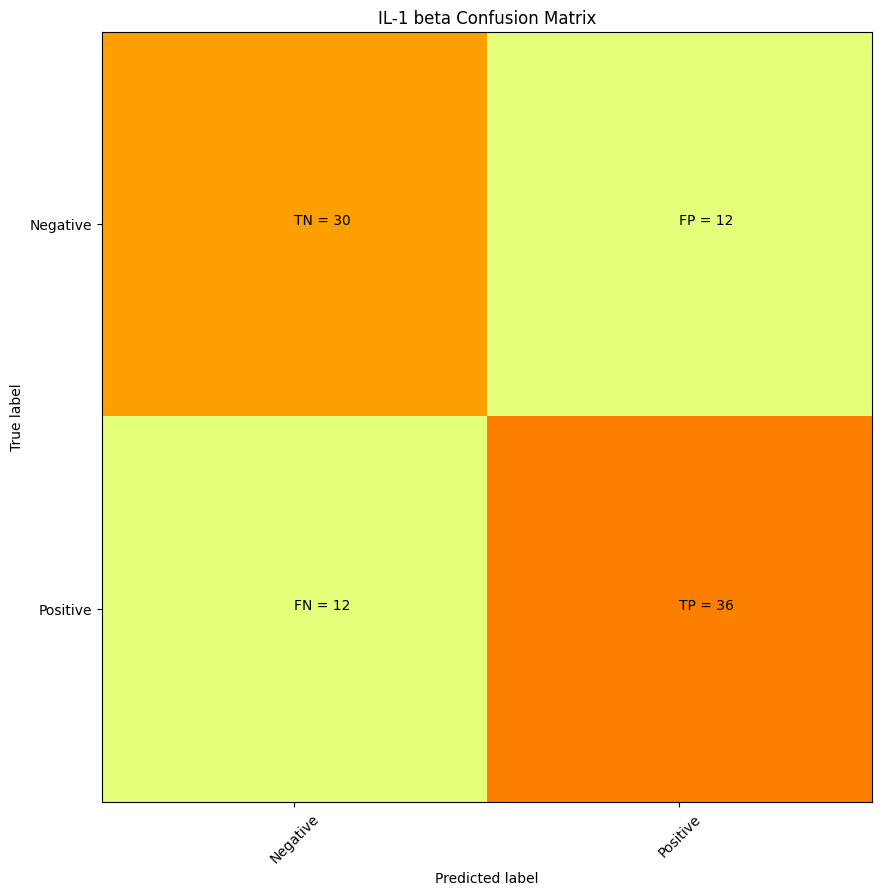

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

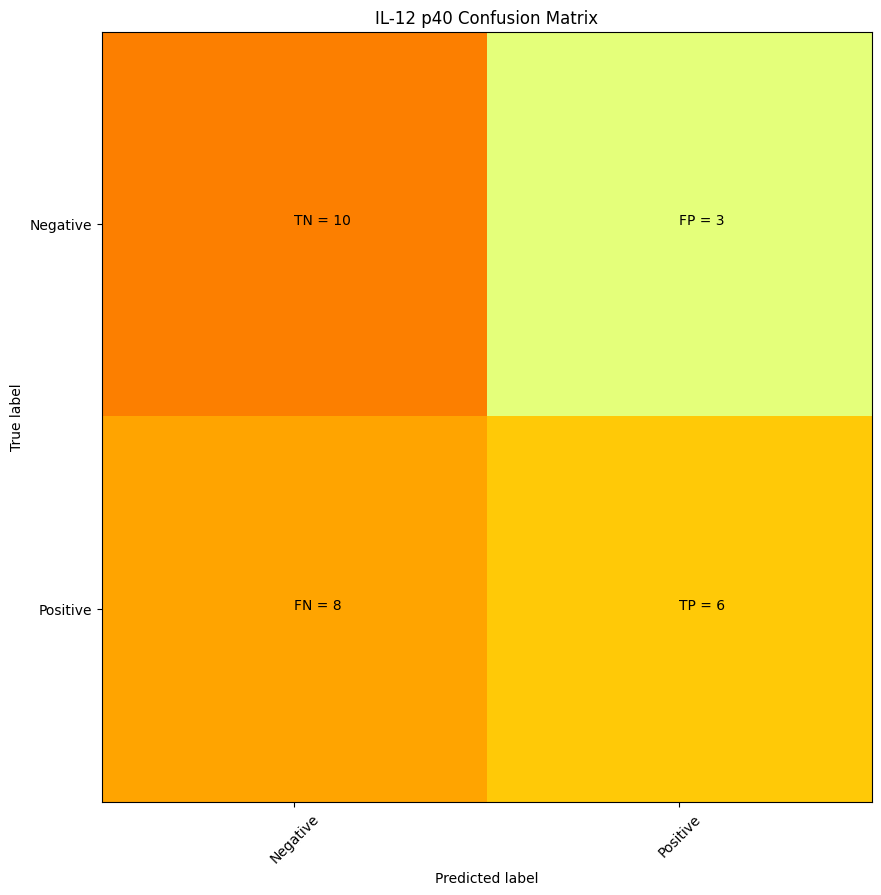

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
B18           0
A07           0
H02           0
B14           0
L04           0
K05           0
G09           0
N19           0
I09           0
C24           0
G12           0
J14           0
D21           0
D12           0
J19           0
B02           0
C11           0
D08           0
P14           0
E08           0
I14           0
I11           0
H03           0
H05           0
H22           0
P03           0
A15           0 precision = 0.6666666666666666 recall = 0.42857142857142855


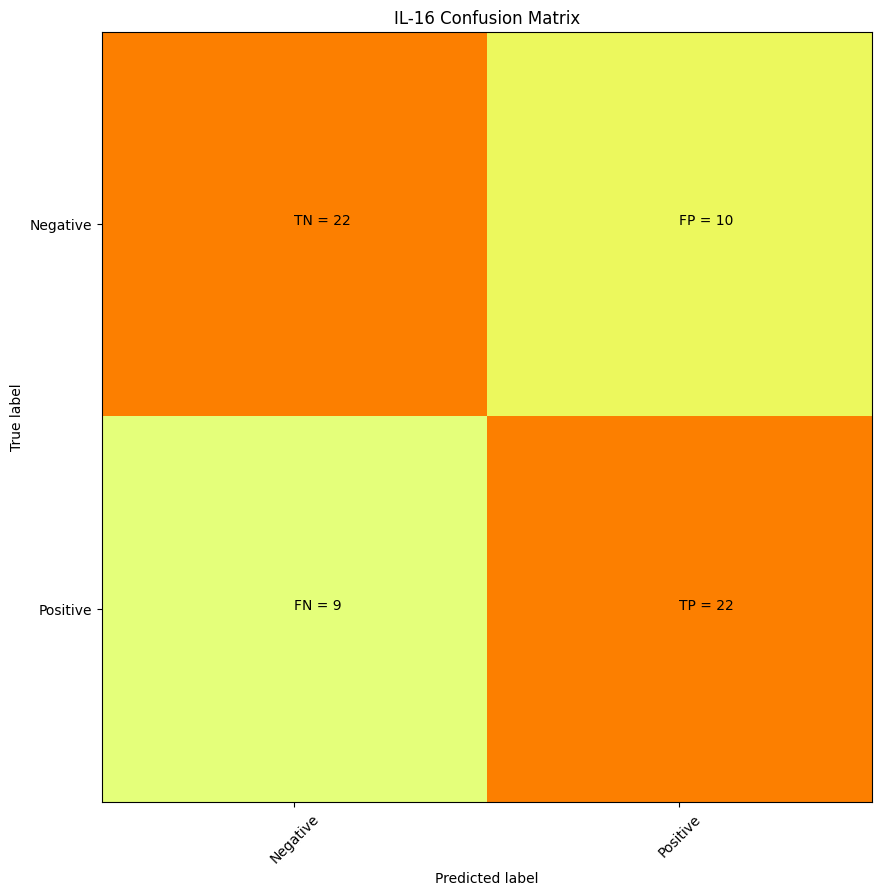

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

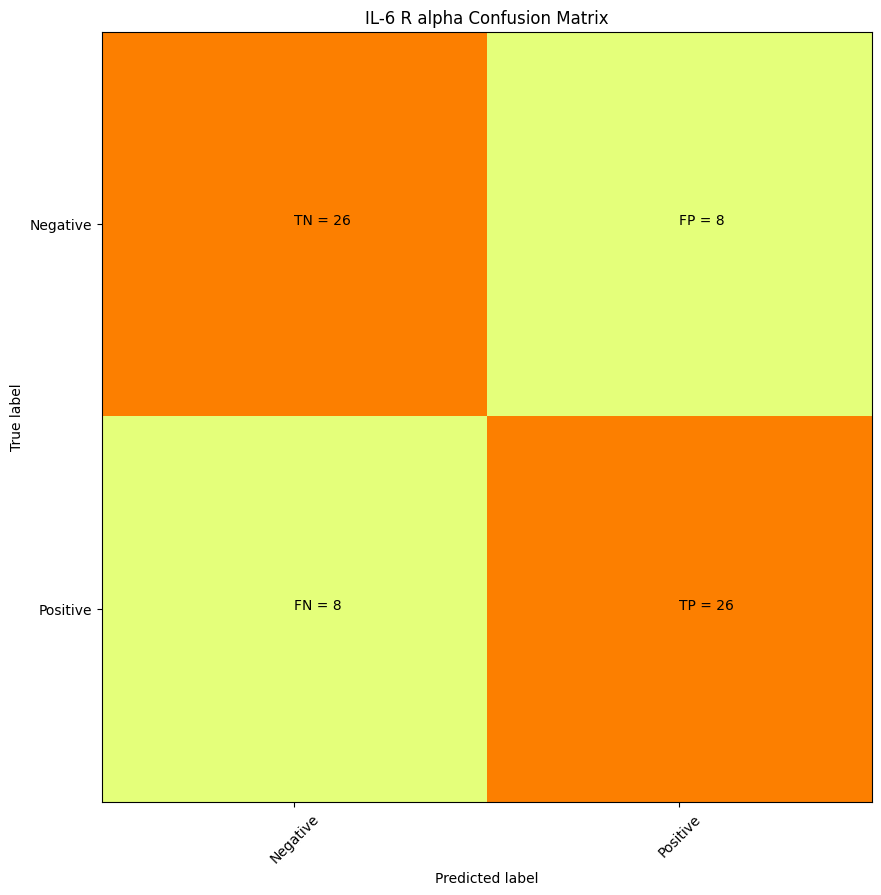

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

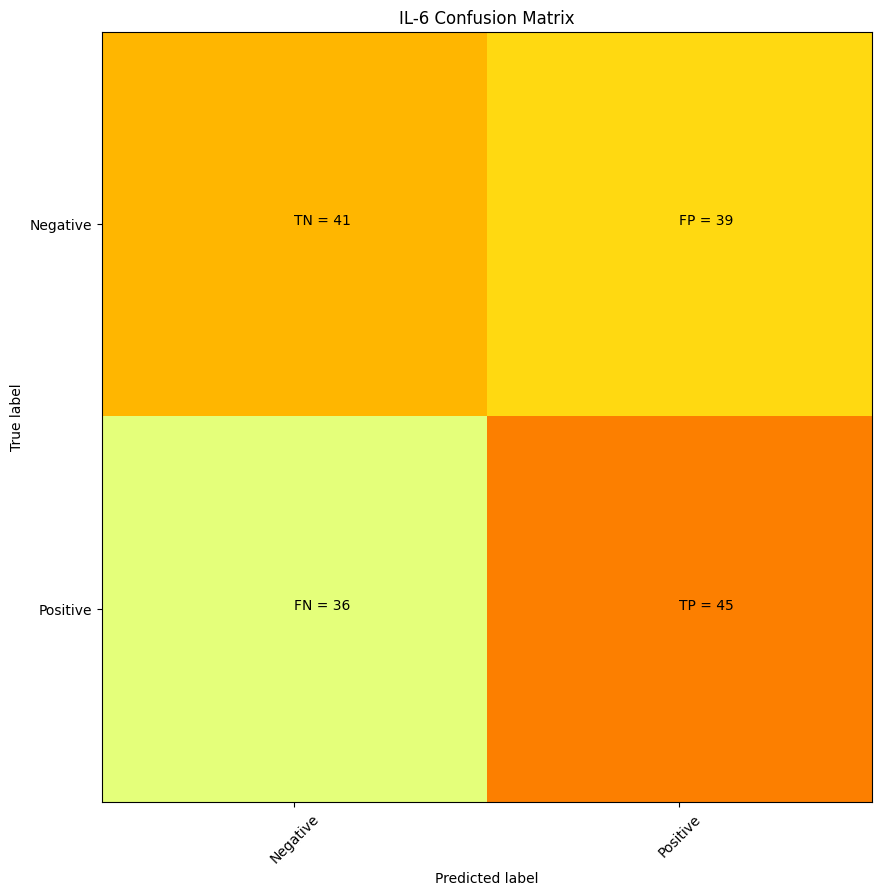

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

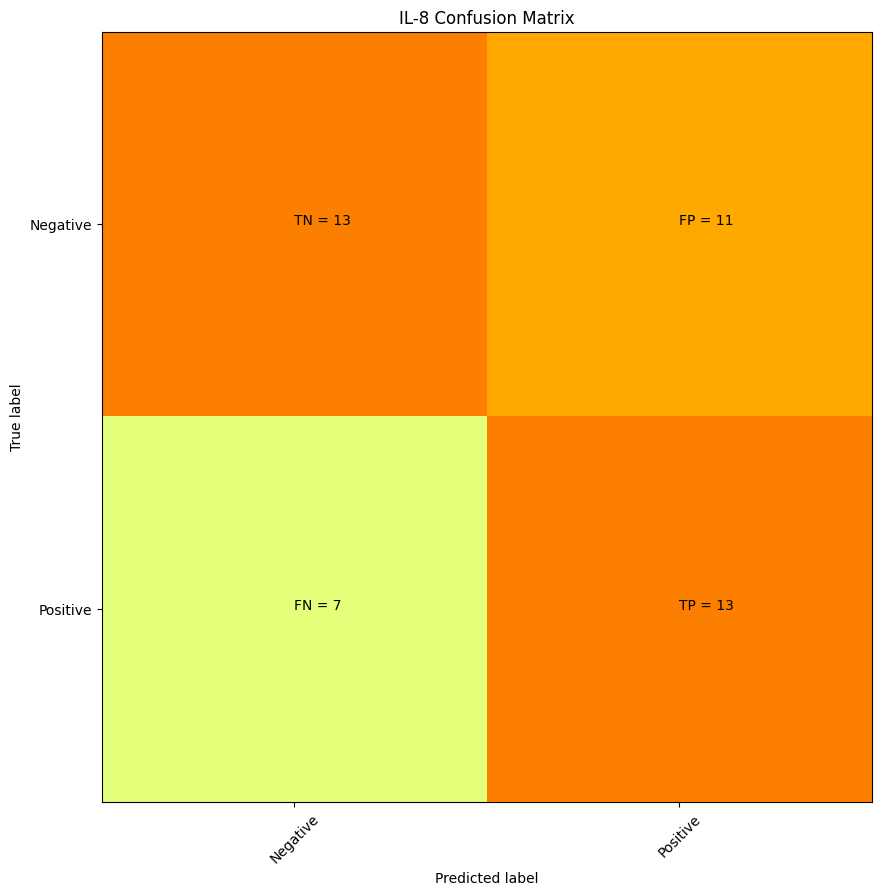

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

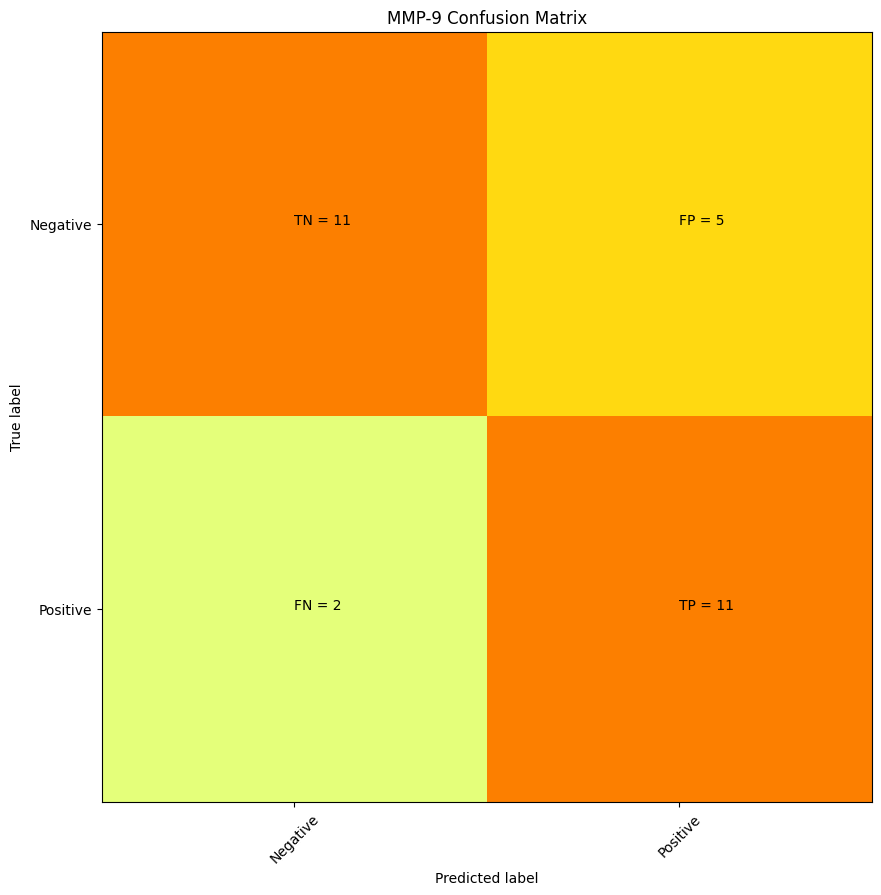

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.6875 recall = 0.8461538461538461


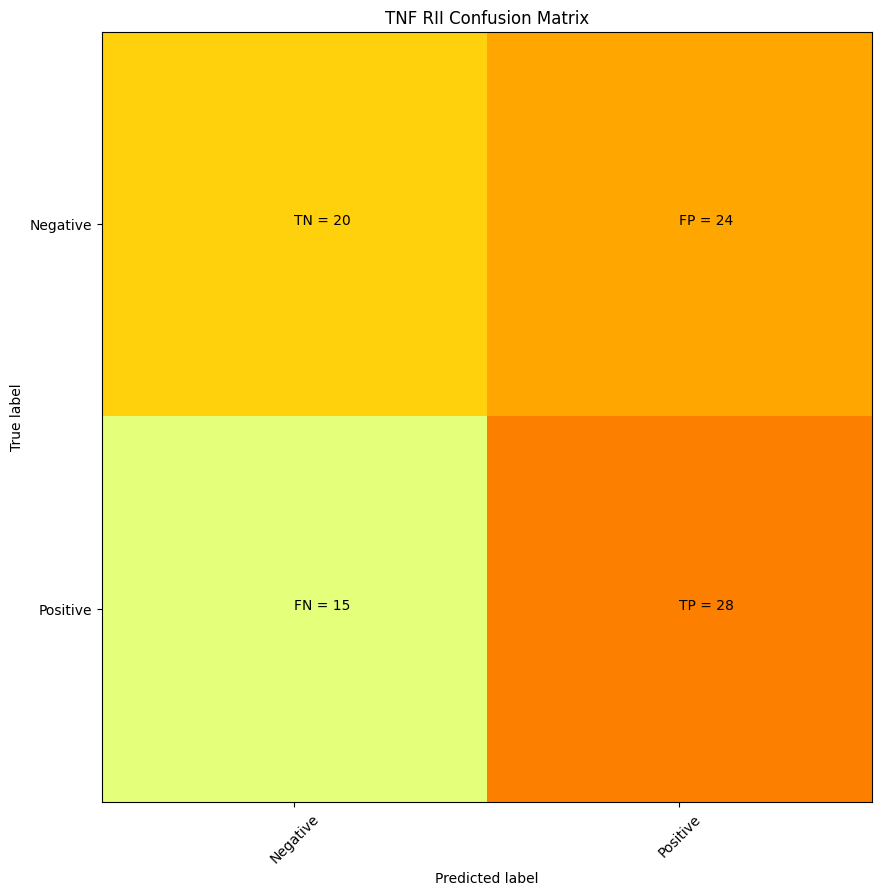

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [51]:
summarizing = []
summarizer_univariates = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in univariates_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_univariates = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_univariates['Precision'] = summarizer_univariates['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [52]:
summarizer_univariates

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.842105,0.666667,10,47
1,CCL1,0.666667,0.320000,10,46
2,CCL19,1.000000,0.428571,10,12
3,CCL2,0.592593,0.615385,10,95
4,CCL20,0.692308,0.600000,10,30
5,CCL22,0.586207,0.523077,10,125
6,CCL4,0.407407,0.578947,10,46
7,CCL5,0.534247,0.629032,10,133
8,CD14,0.774194,0.705882,10,61
9,CRP,0.545455,0.533333,10,86


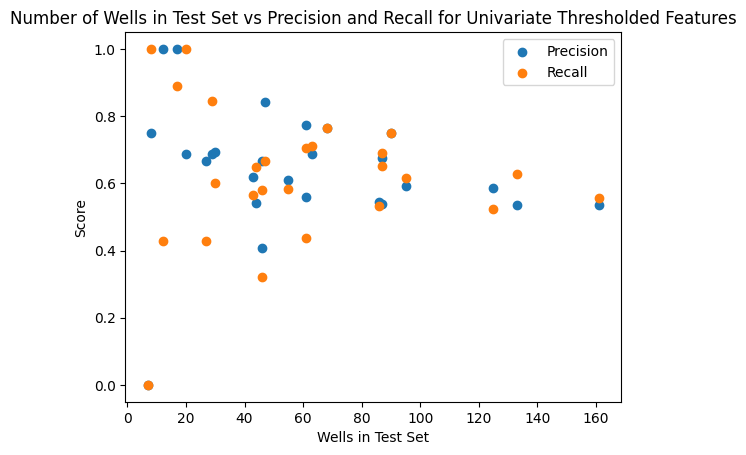

In [53]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
plt.scatter(y=summarizer_univariates["Precision"], x = summarizer_univariates["Wells in Set"])
plt.scatter(y=summarizer_univariates["Recall"], x = summarizer_univariates["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Univariate Thresholded Features")
plt.show()

## Performance of Classifier with Recursive Feature Elimination to top 10 important features

In [54]:
rfefs_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = rfefs[rfefs["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        rfefs_listing.append(finaldata)
    except:
        continue

rfefs_listing[0]

Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_12,Output_275,Output_421,Output_474,Output_634,Output_679,Output_711,Output_790,Output_1045,Output_1189
well,,,,,,,,,,,
A09,1,1.263069,0.292102,1.359763,0.485653,0.297874,0.860459,0.702426,1.703059,2.196149,1.309851
C03,1,1.434310,0.316105,1.507751,0.510917,0.300293,0.847527,0.866981,1.533090,2.147823,1.086402
C09,1,1.566862,0.385734,1.522356,0.413266,0.351253,0.800989,0.908664,1.440386,2.528739,1.124413
C17,1,1.608116,0.396858,1.586132,0.413790,0.242942,0.936002,0.957807,1.549393,2.667008,1.095049
F03,1,1.549089,0.353839,1.418031,0.442566,0.361706,0.710000,0.875957,1.549543,2.236673,1.166205
F04,1,1.363993,0.344741,1.283270,0.430912,0.326807,0.745242,0.849688,1.558143,2.149233,1.248748
F05,1,1.448455,0.271433,1.391524,0.415790,0.385265,0.750644,0.725806,1.633004,2.470553,1.293726
F08,1,1.417612,0.374292,1.288971,0.531265,0.289893,0.792642,0.887890,1.443425,2.115618,1.049144
F09,1,1.371652,0.318693,1.250085,0.447519,0.312722,0.787895,0.803595,1.606635,2.169714,1.158309


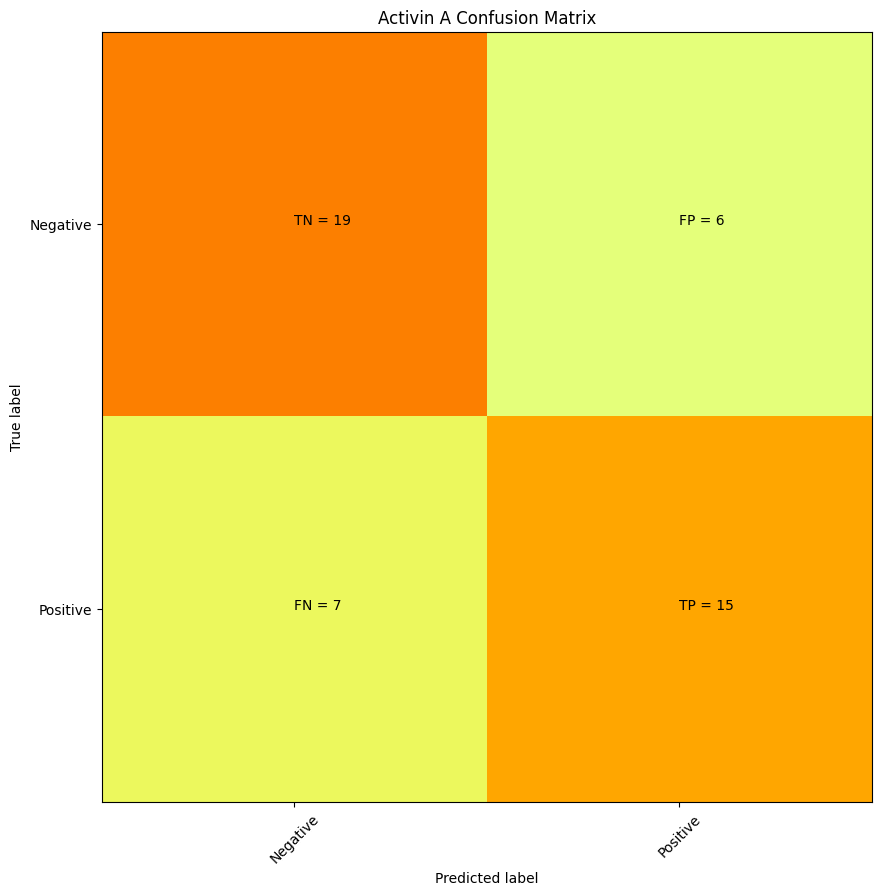

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

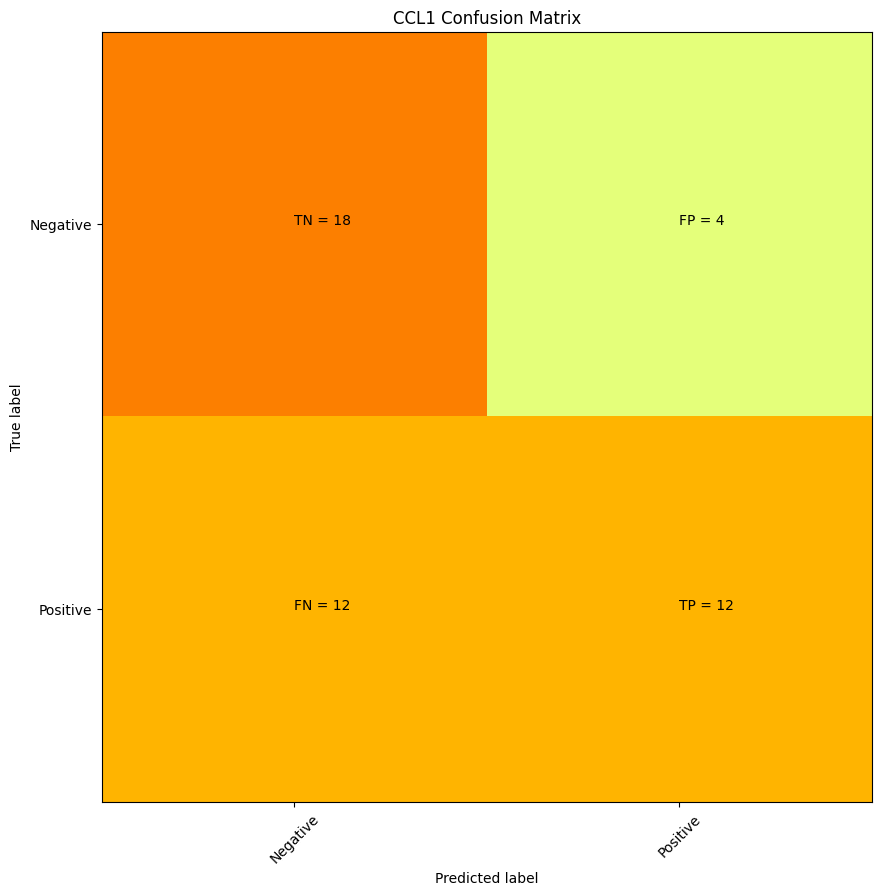

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


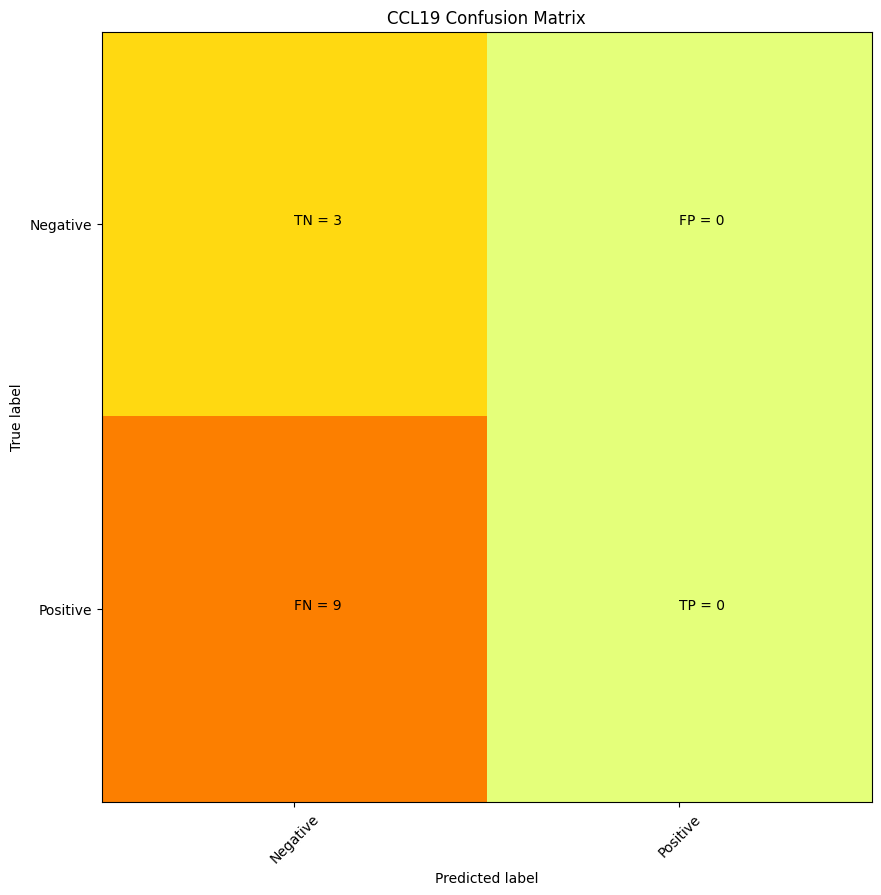

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = nan recall = 0.0


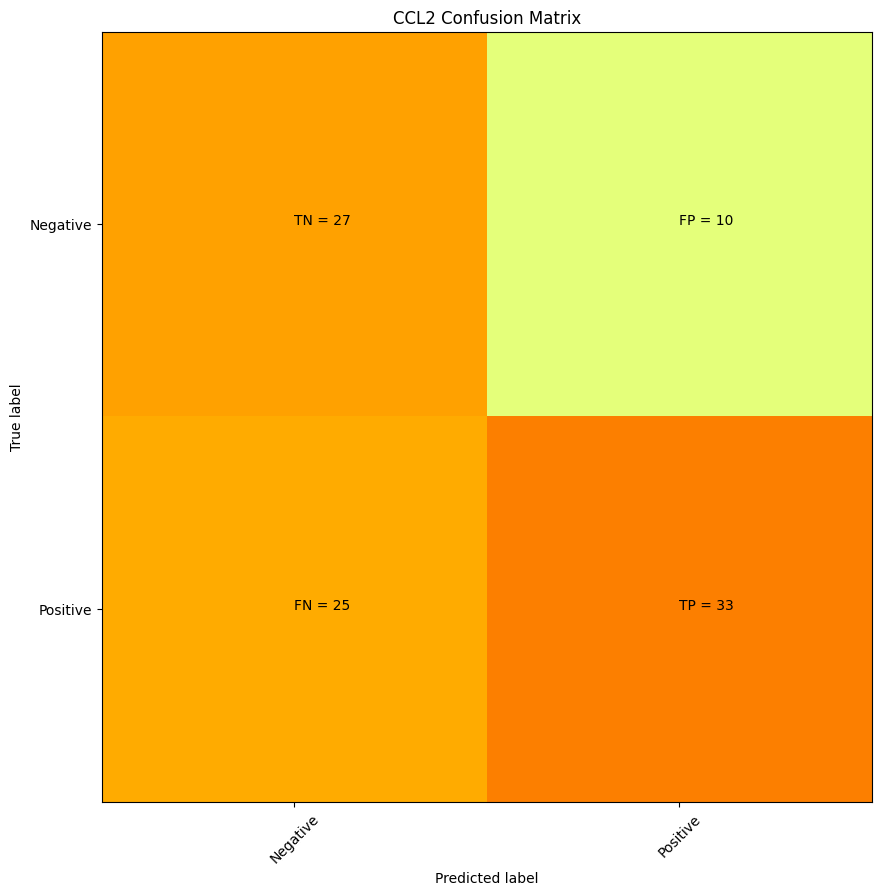

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

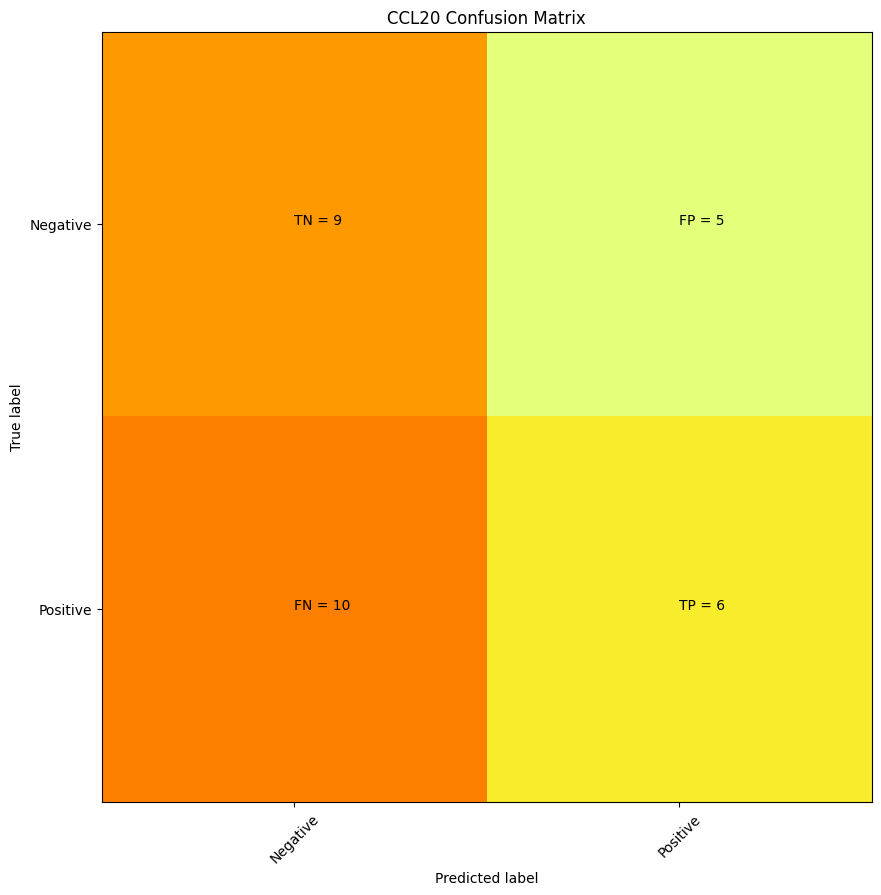

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.5454545454545454 recall = 0.375


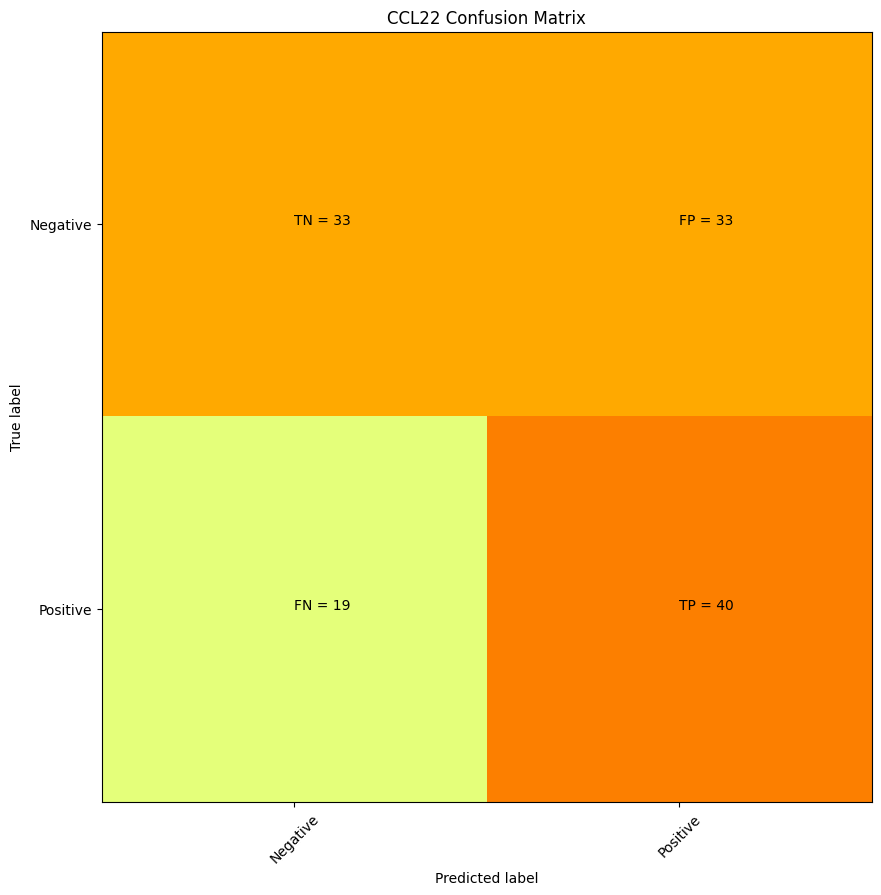

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

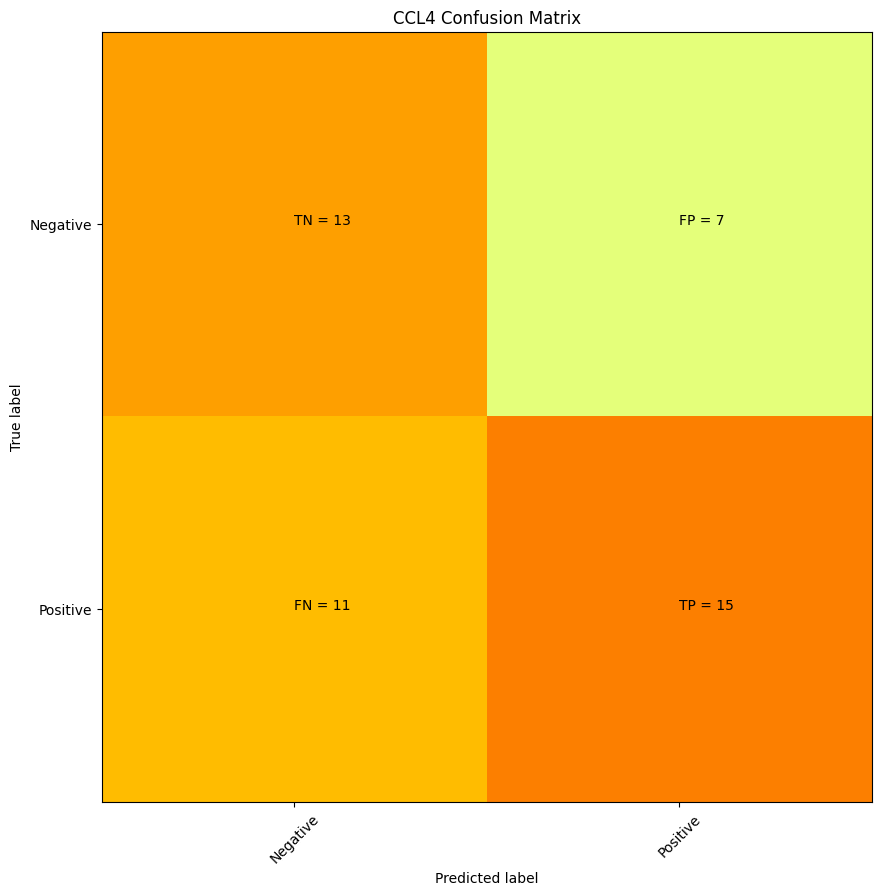

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

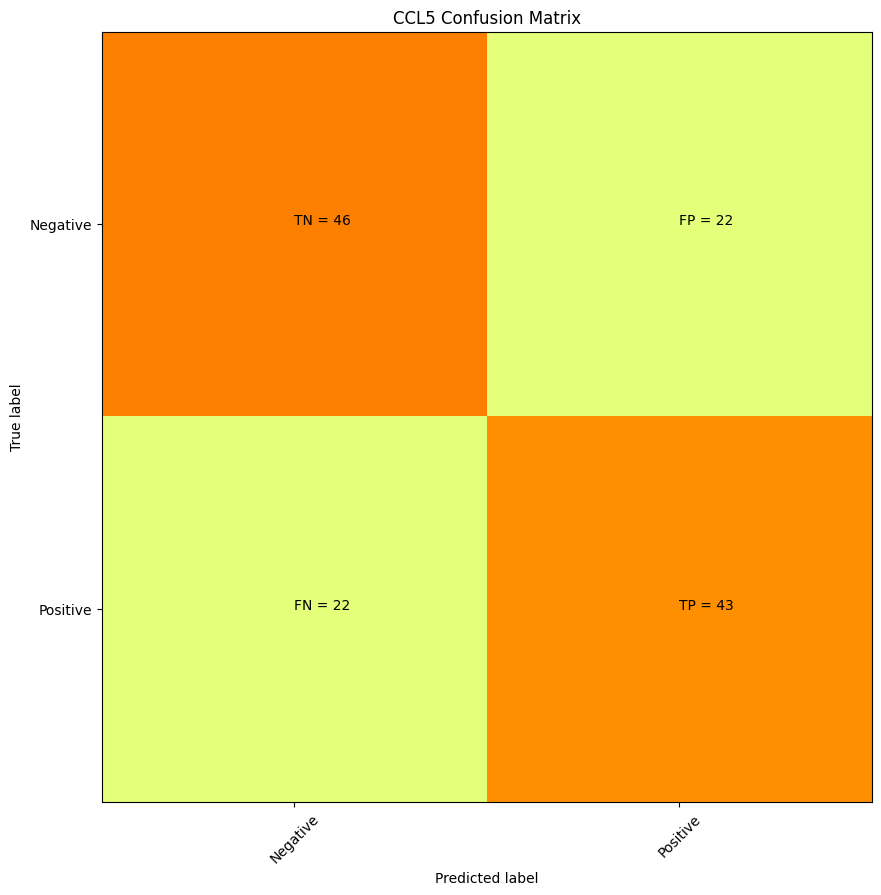

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

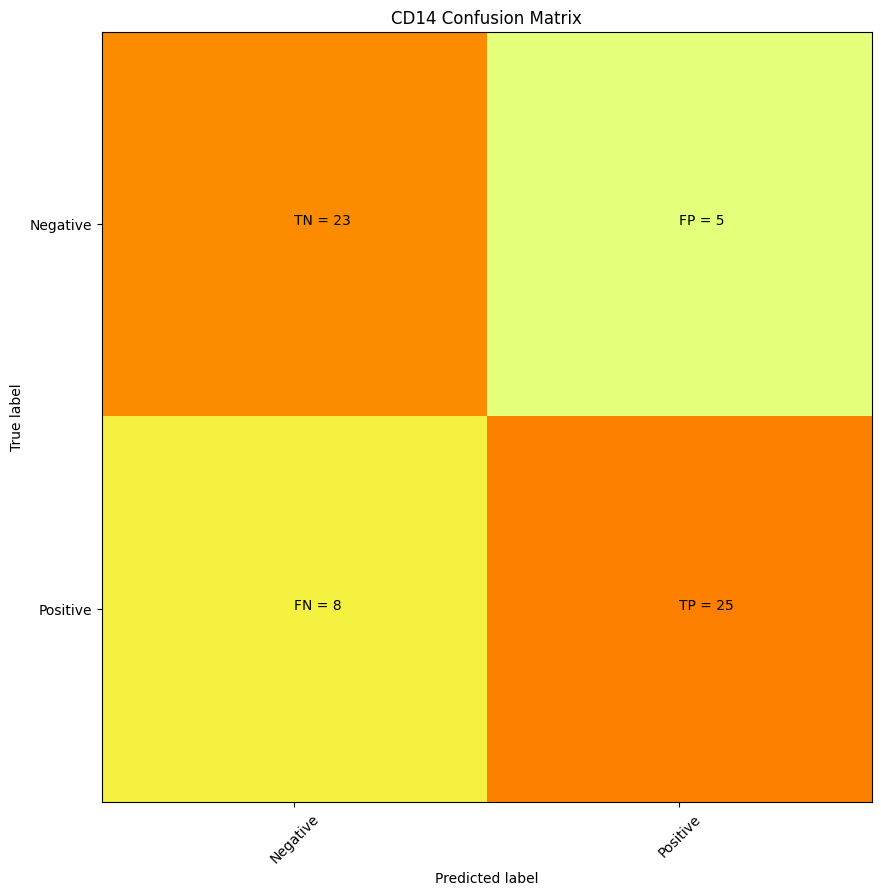

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

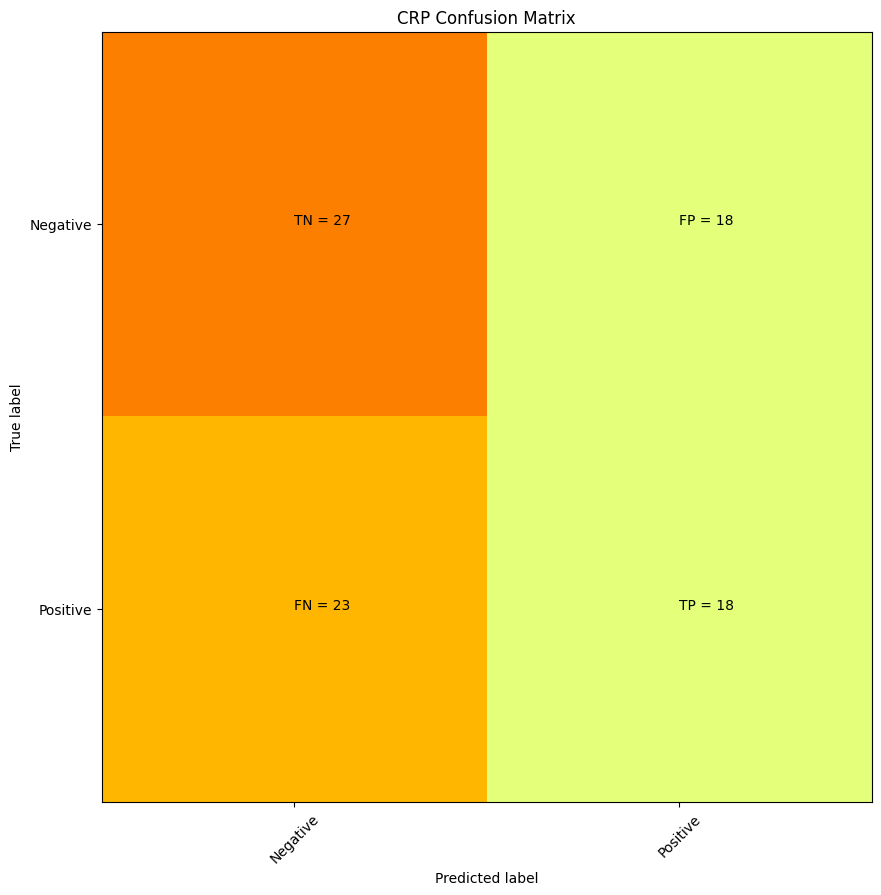

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


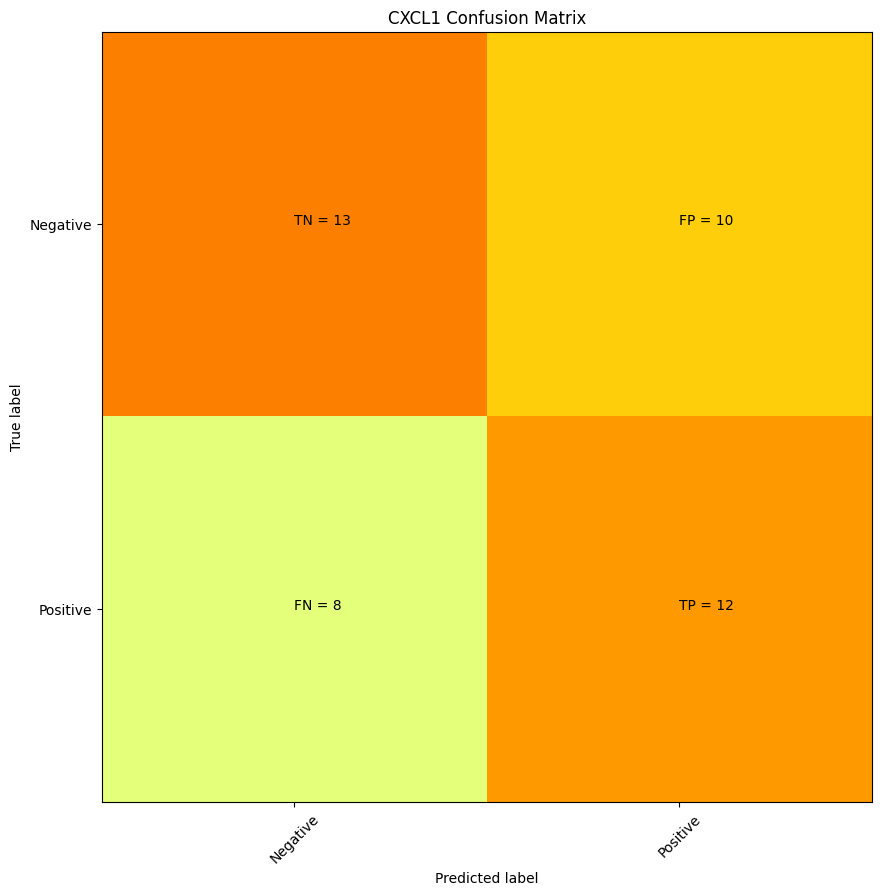

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

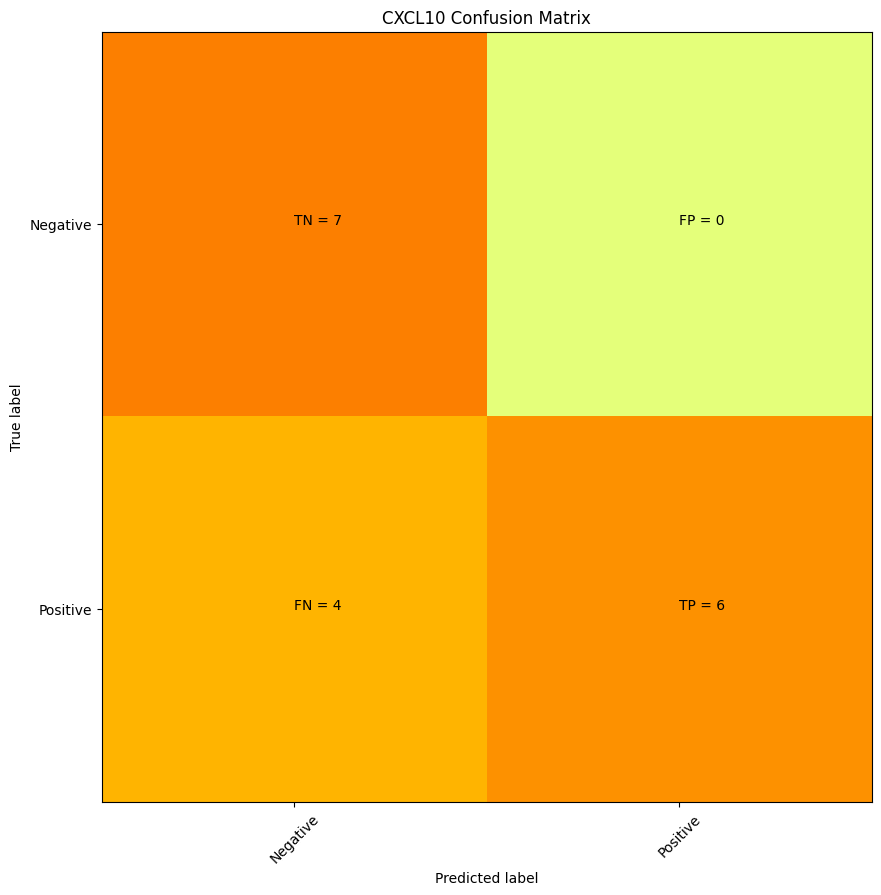

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 1.0 recall = 0.6


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


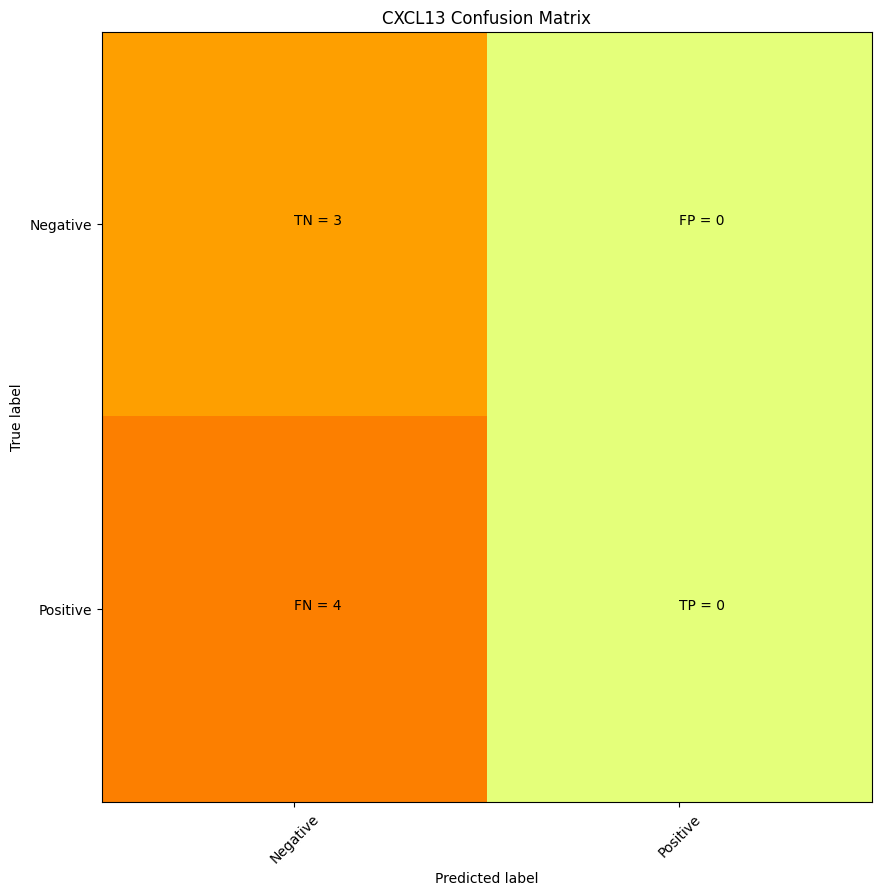

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = nan recall = 0.0


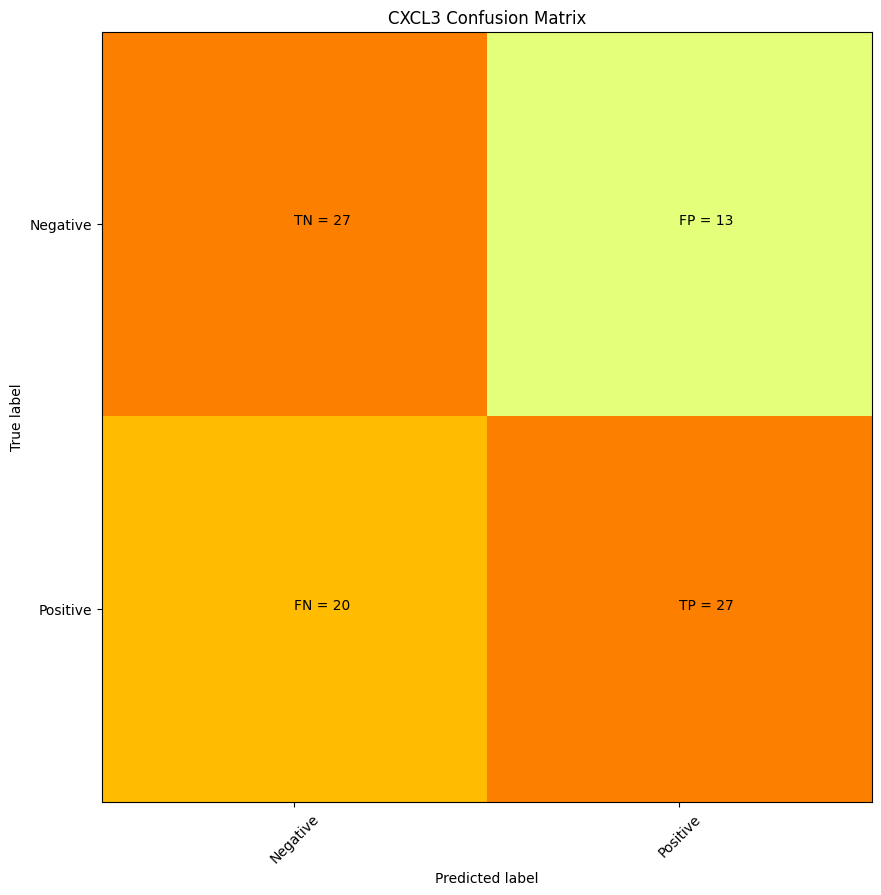

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

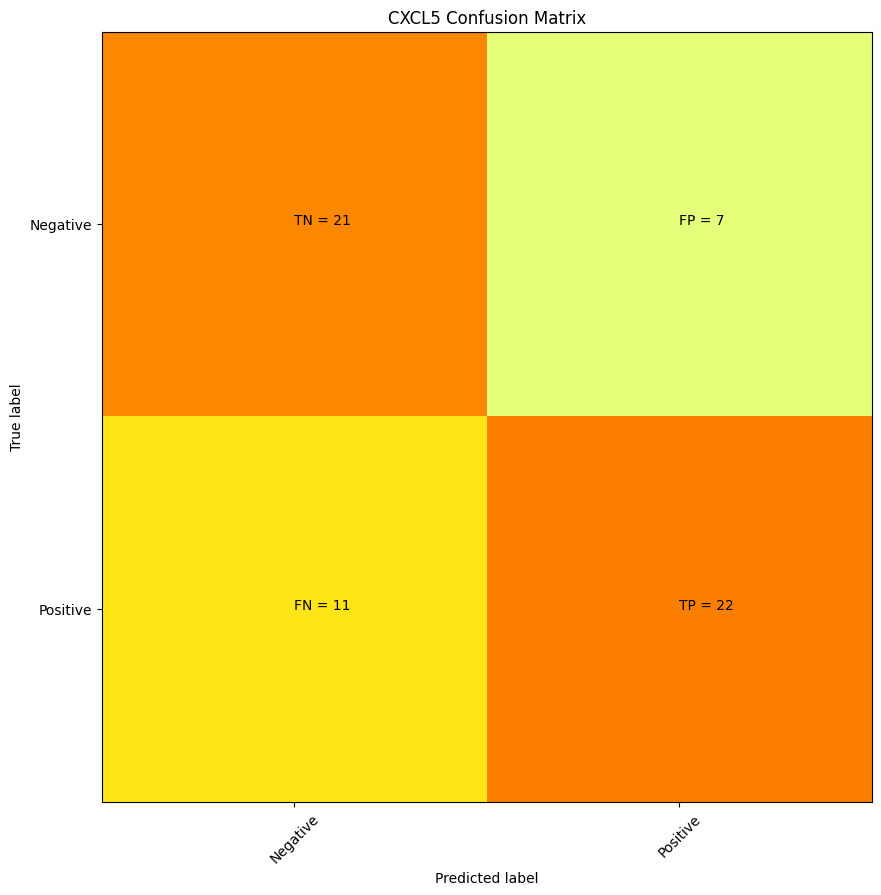

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

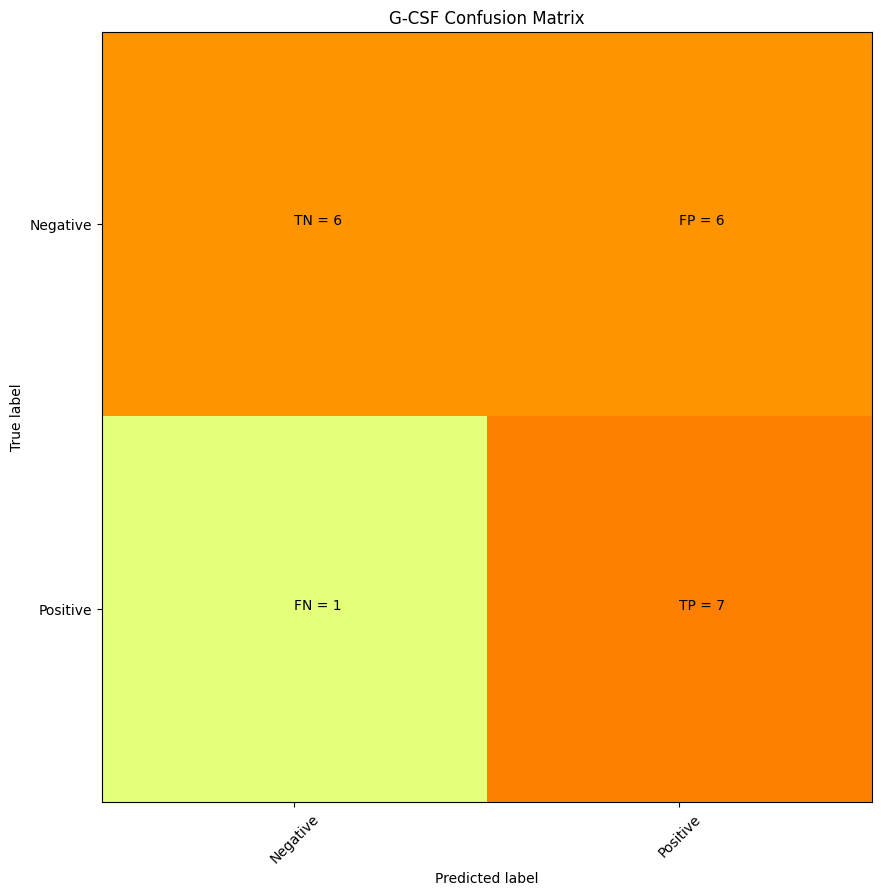

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.5384615384615384 recall = 0.875


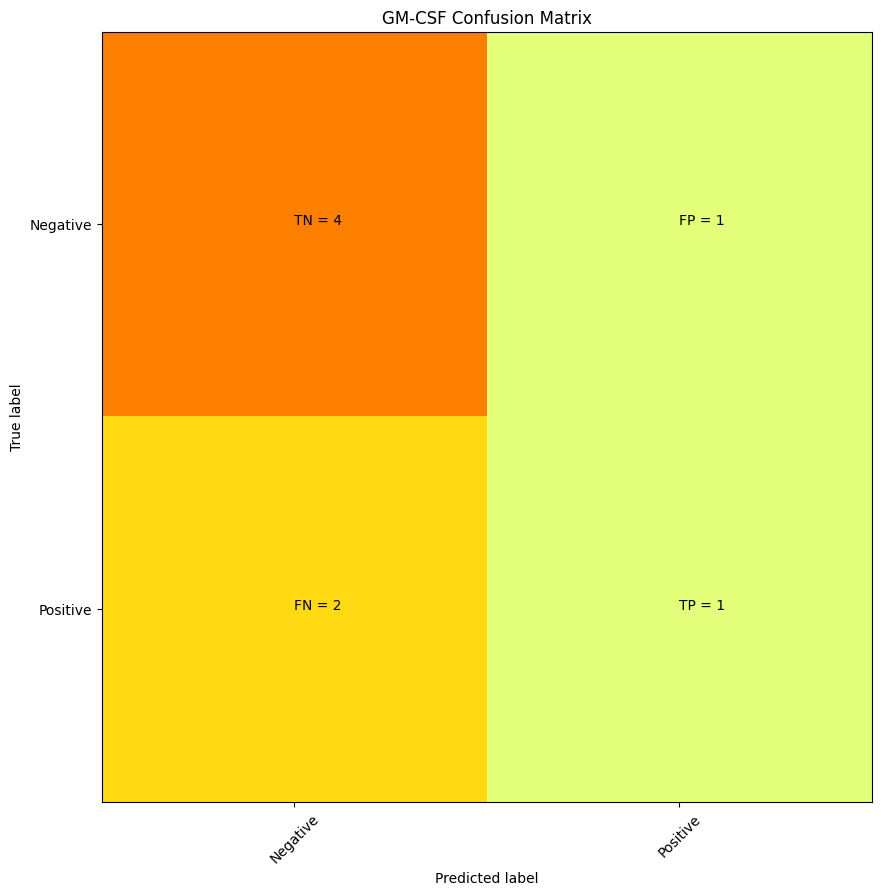

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = 0.5 recall = 0.3333333333333333


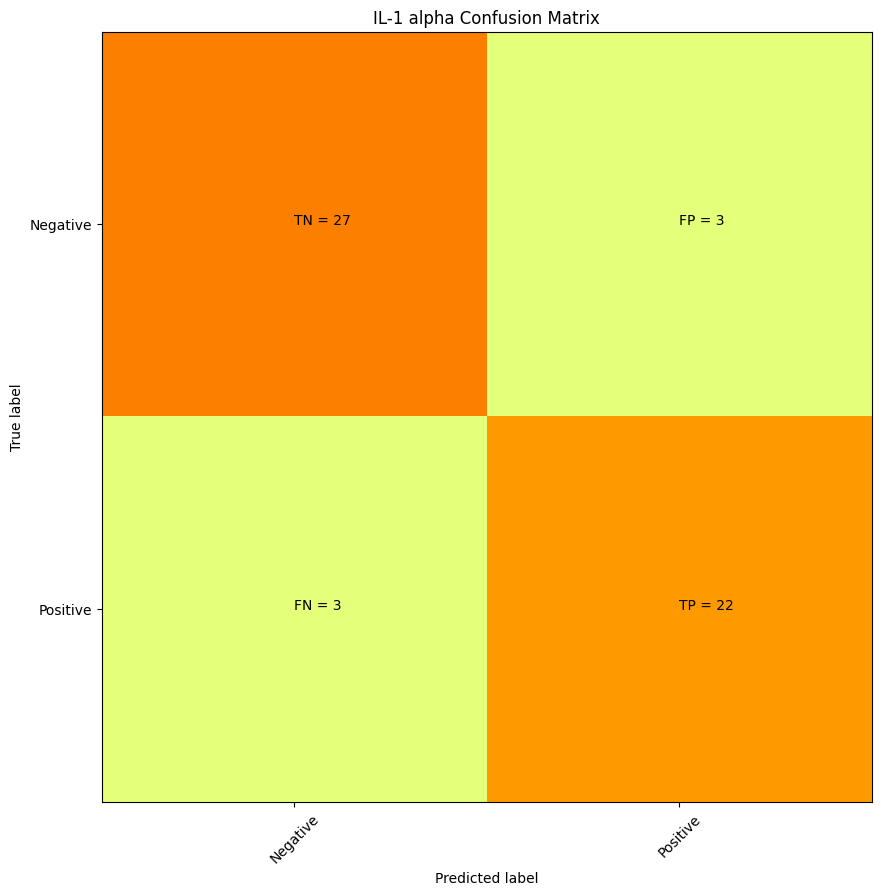

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

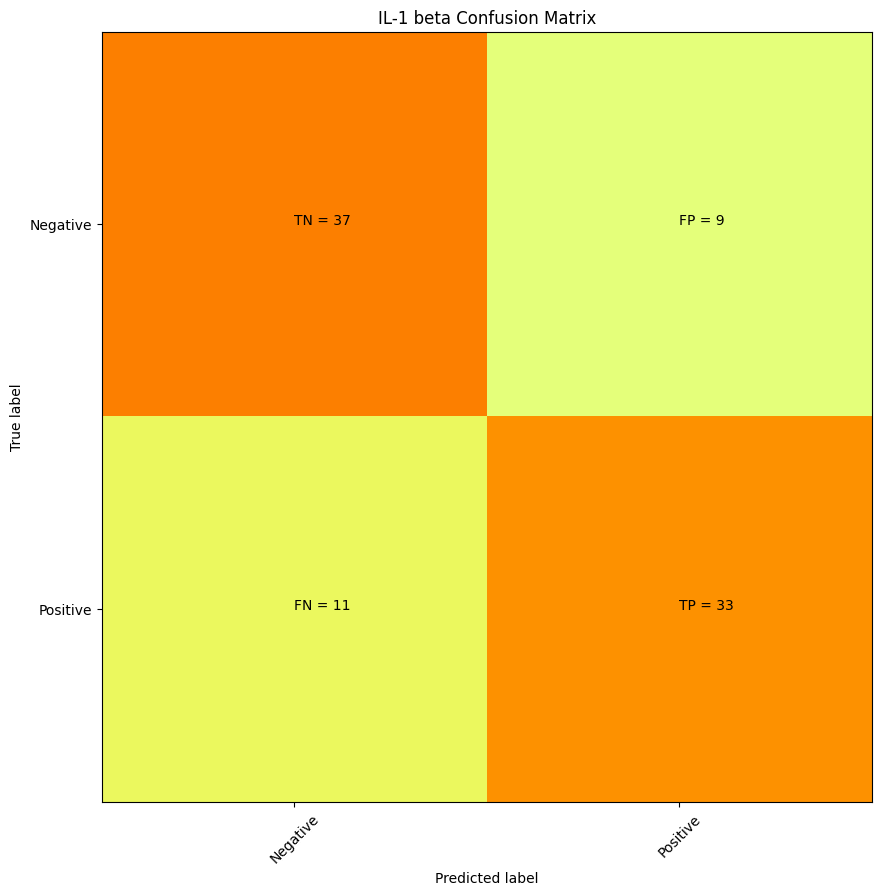

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

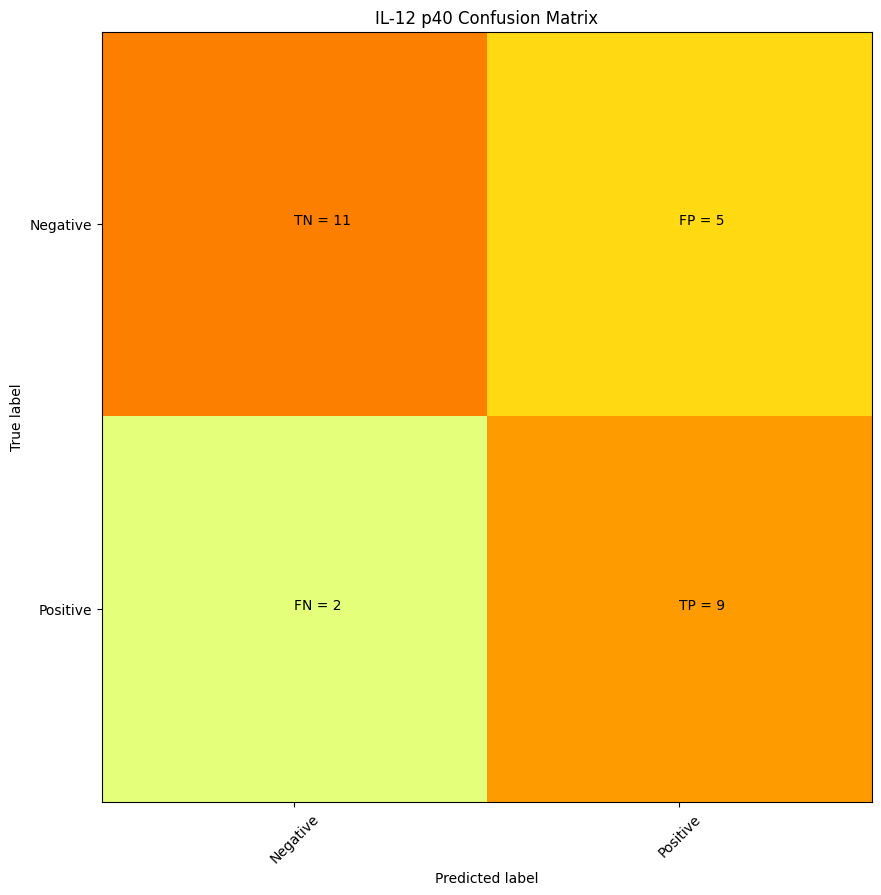

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
B18           0
A07           0
H02           0
B14           0
L04           0
K05           0
G09           0
N19           0
I09           0
C24           0
G12           0
J14           0
D21           0
D12           0
J19           0
B02           0
C11           0
D08           0
P14           0
E08           0
I14           0
I11           0
H03           0
H05           0
H22           0
P03           0
A15           0 precision = 0.6428571428571429 recall = 0.8181818181818182


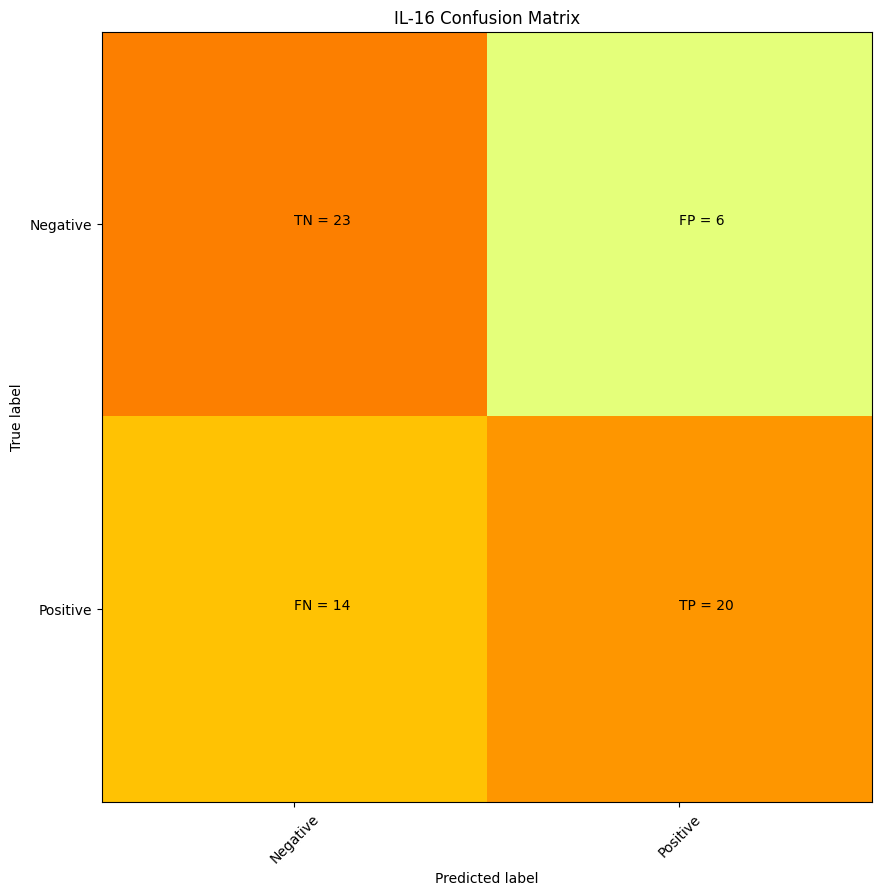

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

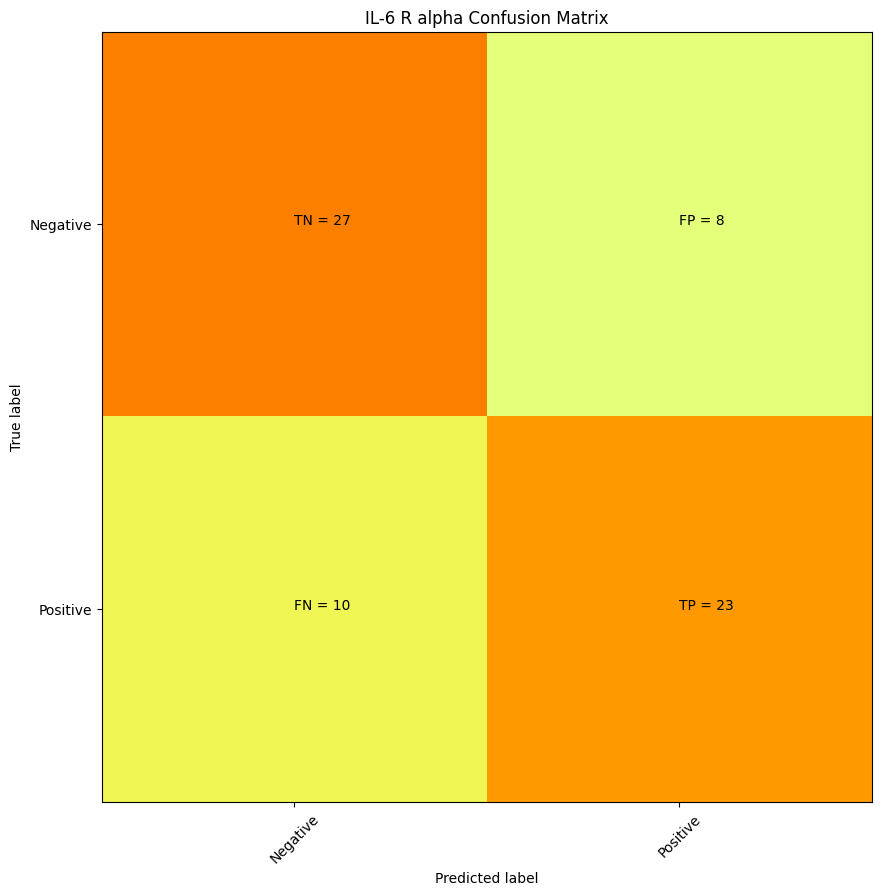

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

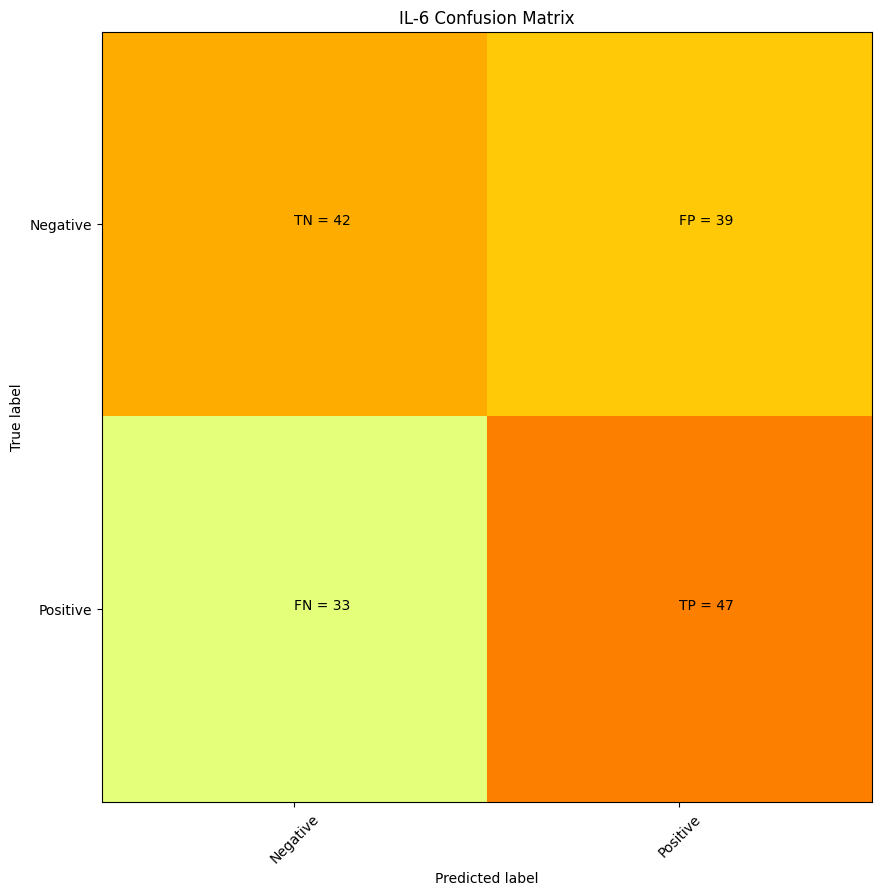

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

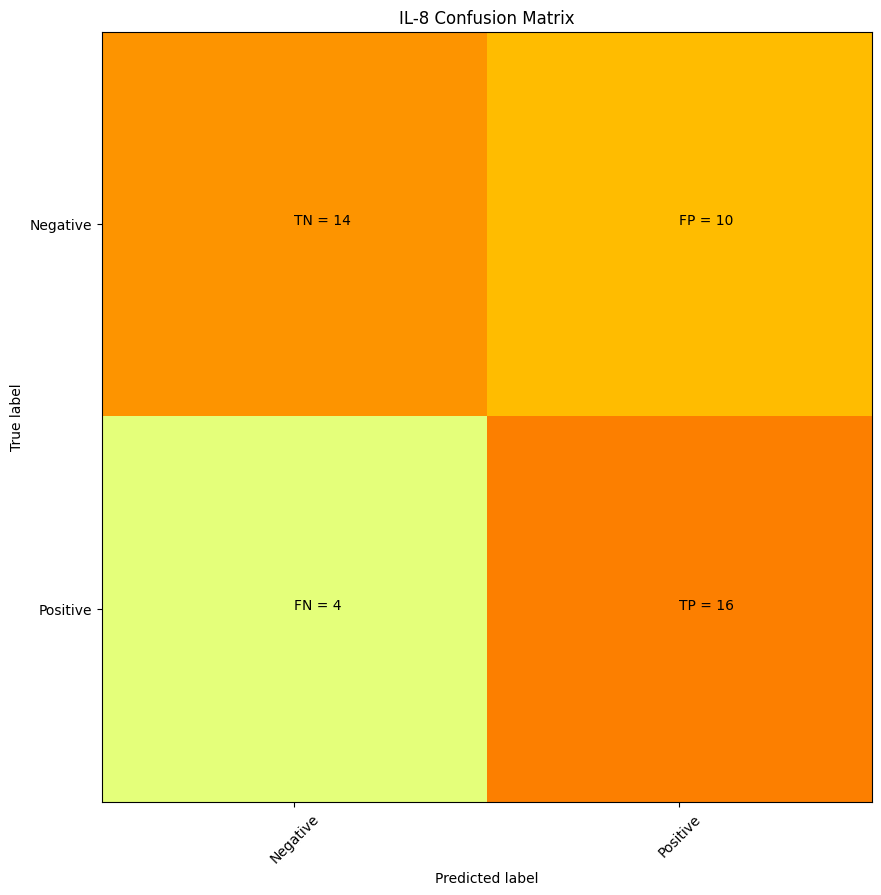

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

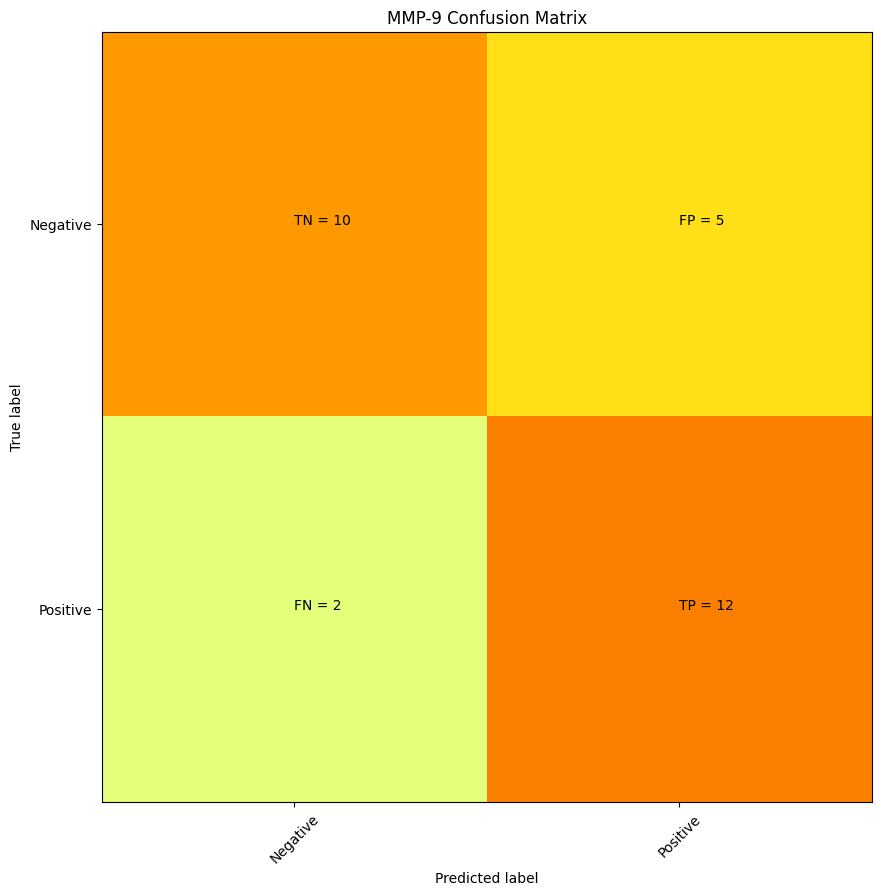

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.7058823529411765 recall = 0.8571428571428571


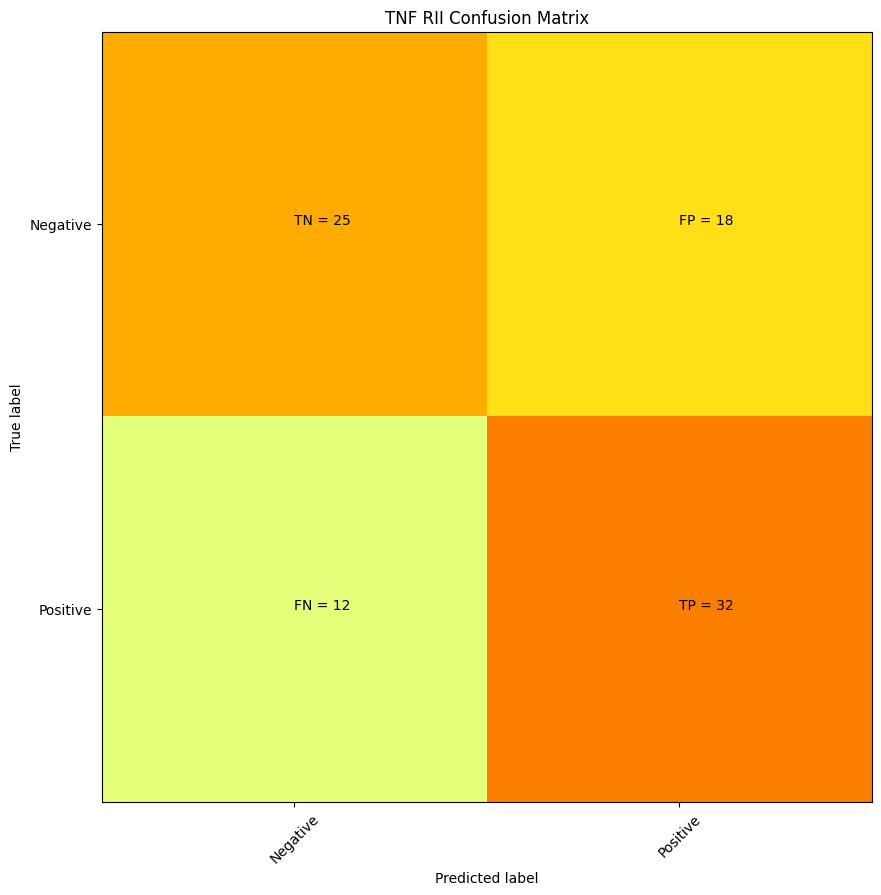

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [55]:
summarizing = []
summarizer_rfefs = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in rfefs_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_rfefs = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_rfefs['Precision'] = summarizer_rfefs['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [56]:
summarizer_rfefs

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.714286,0.681818,10,47
1,CCL1,0.750000,0.500000,10,46
2,CCL19,0.000000,0.000000,10,12
3,CCL2,0.767442,0.568966,10,95
4,CCL20,0.545455,0.375000,10,30
5,CCL22,0.547945,0.677966,10,125
6,CCL4,0.681818,0.576923,10,46
7,CCL5,0.661538,0.661538,10,133
8,CD14,0.833333,0.757576,10,61
9,CRP,0.500000,0.439024,10,86


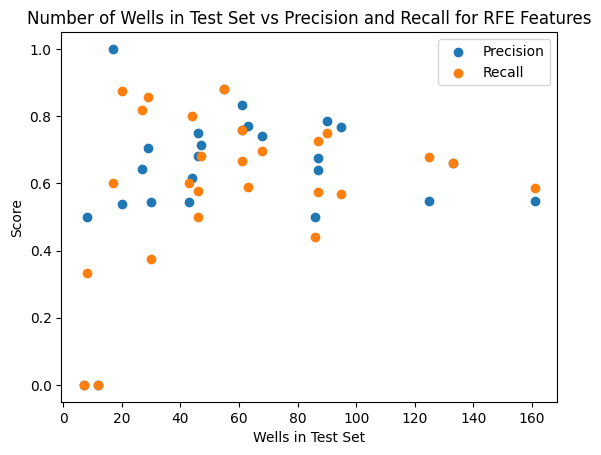

In [57]:
#Observe there is essentially no trend. 
#This supports that we are not simply overfitting for cyotkines with low numbers of responder wells.
#By the way, this looks quite similar to the univariates graph above but careful inspection of the plot and
#code shows they are in fact different
plt.scatter(y=summarizer_rfefs["Precision"], x = summarizer_rfefs["Wells in Set"])
plt.scatter(y=summarizer_rfefs["Recall"], x = summarizer_rfefs["Wells in Set"])
plt.xlabel("Wells in Test Set")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for RFE Features")
plt.show()

## Performance of classifier with features selcted from L1 regularization

In [58]:
l1s_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = l1s[l1s["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        l1s_listing.append(finaldata)
    except:
        continue

l1s_listing[0]






Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_4,Output_60,Output_118,Output_120,Output_232,Output_343,Output_375,Output_380,Output_447,...,Output_903,Output_948,Output_959,Output_963,Output_977,Output_1044,Output_1045,Output_1062,Output_1230,Output_1247
well,,,,,,,,,,,,,,,,,,,,,
A09,1,3.643724,3.895554,2.909582,2.216412,4.213551,1.420579,1.694614,2.944909,4.114720,...,5.635931,3.610954,5.662089,2.049567,0.732848,2.269222,2.196149,5.435206,4.791984,9.698508
C03,1,3.407436,3.756057,2.605289,2.031238,4.311341,1.711949,1.841523,2.885151,4.054186,...,5.793055,3.756738,5.631644,2.015778,0.874197,2.188010,2.147823,5.310091,4.845588,9.747023
C09,1,3.543321,3.981436,2.293271,1.957480,4.312414,1.841311,1.898477,2.921361,4.317148,...,5.603607,3.753963,5.889314,2.112870,1.041880,2.640250,2.528739,5.484000,5.055249,9.995271
C17,1,3.354781,4.016228,2.166797,2.029021,4.007127,1.672689,2.504305,2.579535,4.077557,...,5.335701,3.593929,5.994071,2.316985,1.450801,2.804684,2.667008,5.483769,4.497993,9.738996
F03,1,3.434275,3.687468,2.531449,1.913512,4.429153,1.889071,1.718199,2.957452,4.102858,...,5.630318,3.810938,5.588492,2.010011,0.911457,2.280377,2.236673,5.319995,5.049672,9.907647
F04,1,3.370884,3.938980,2.561344,2.064217,4.162745,1.756169,1.727650,2.894847,4.117402,...,5.691682,3.713241,5.560206,2.029744,1.052388,2.200986,2.149233,5.271667,4.868670,9.908044
F05,1,3.529775,3.761435,2.505181,2.106782,4.496910,1.729502,1.885762,2.999695,4.274092,...,5.678301,3.820330,5.781368,1.989335,0.967628,2.364583,2.470553,5.650256,5.080195,10.008046
F08,1,3.405242,4.092803,2.645512,2.069644,4.300972,1.898726,1.489847,2.890335,4.161896,...,5.424012,3.607088,5.445361,2.001111,0.902159,2.116183,2.115618,5.020236,4.890854,9.939694
F09,1,3.527808,3.859613,2.819953,2.199971,4.269008,1.594540,1.619484,2.942468,4.121724,...,5.481540,3.705659,5.478346,1.979217,0.874980,2.194291,2.169714,5.217725,4.824190,9.768630


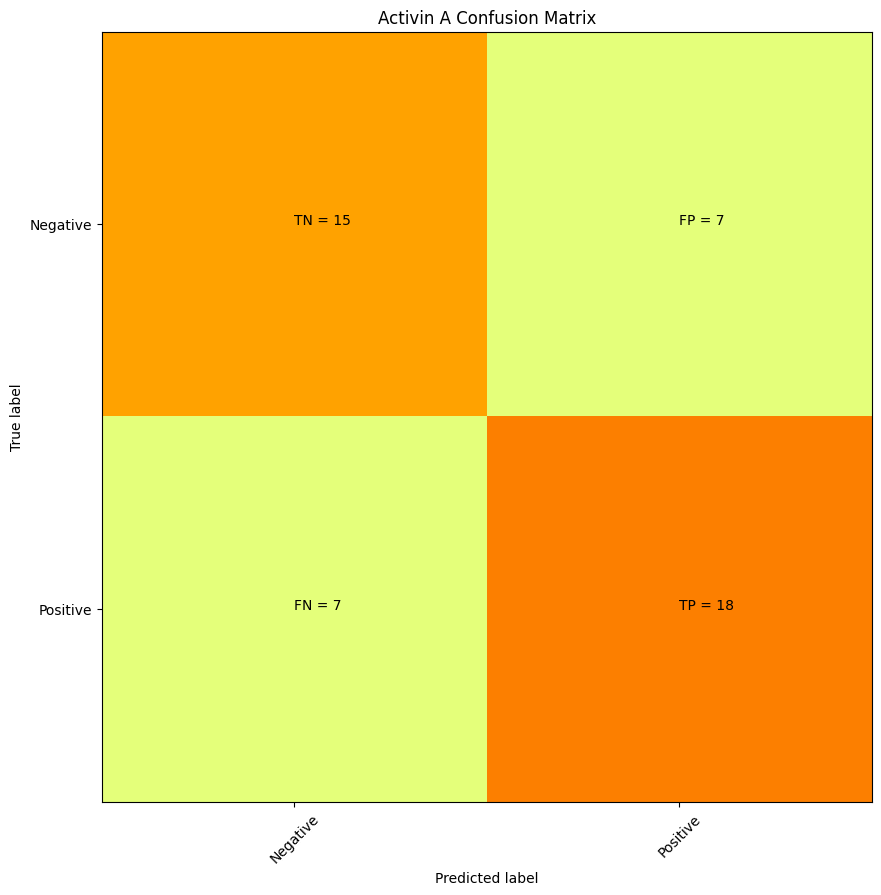

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

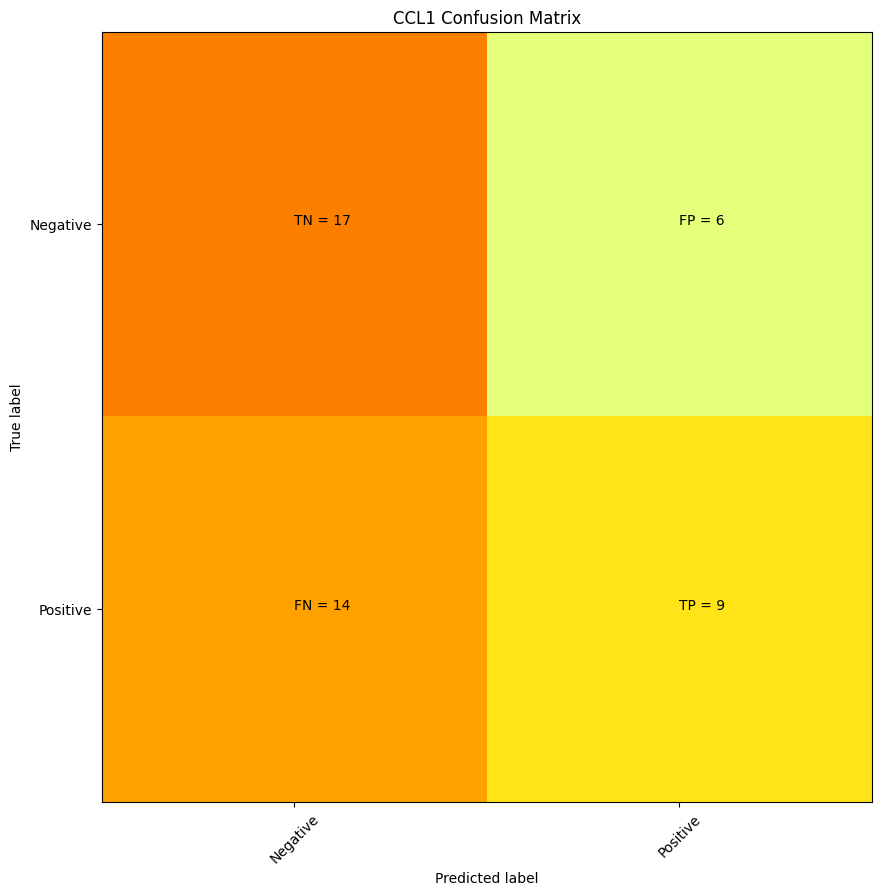

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

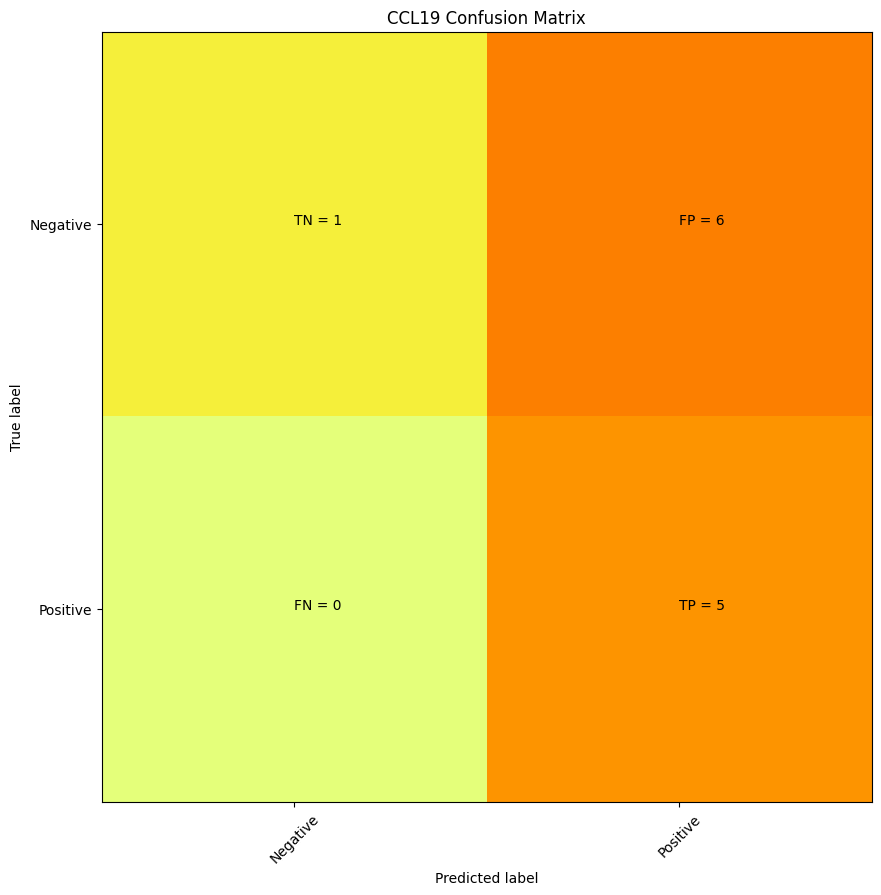

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = 0.45454545454545453 recall = 1.0


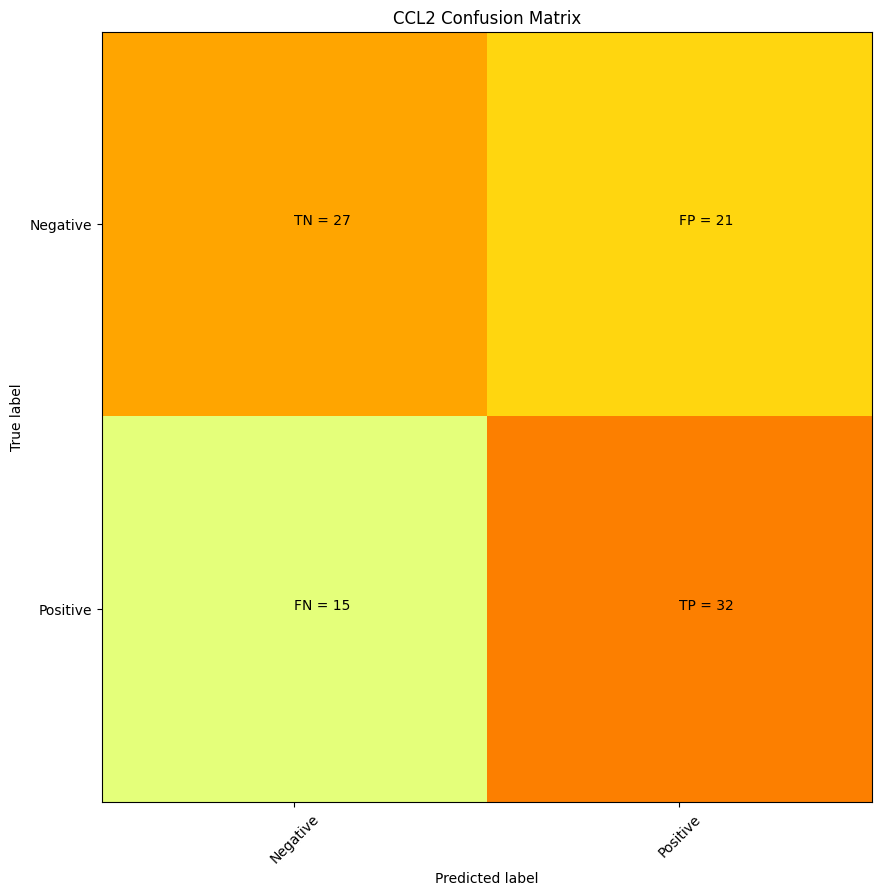

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

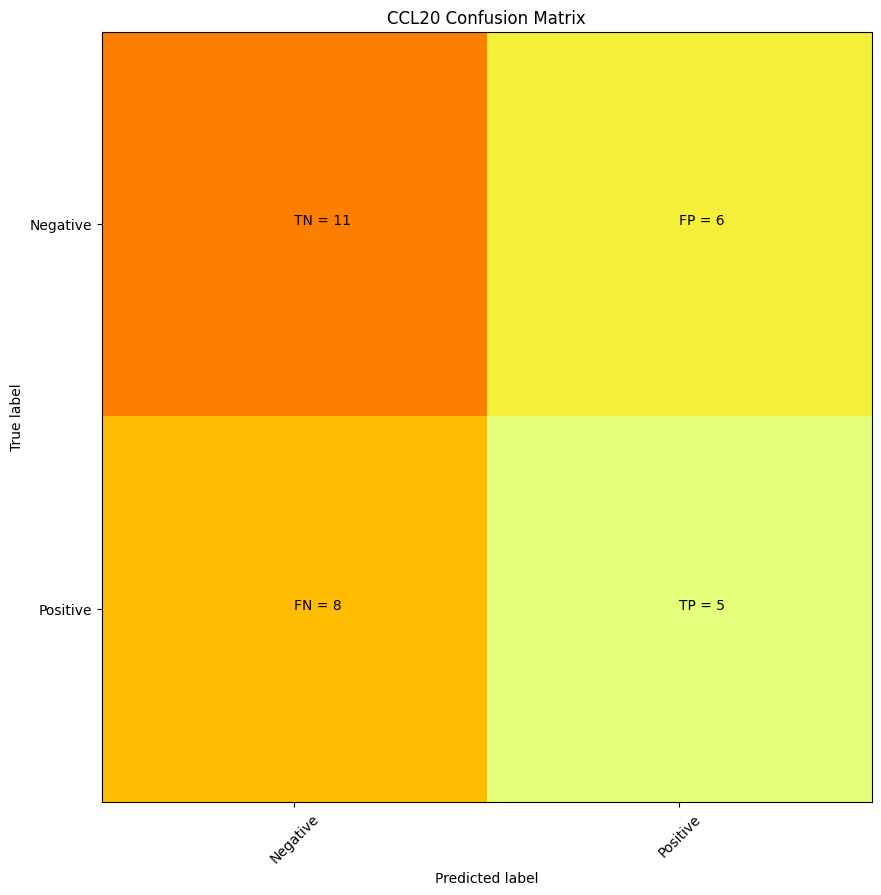

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.45454545454545453 recall = 0.38461538461538464


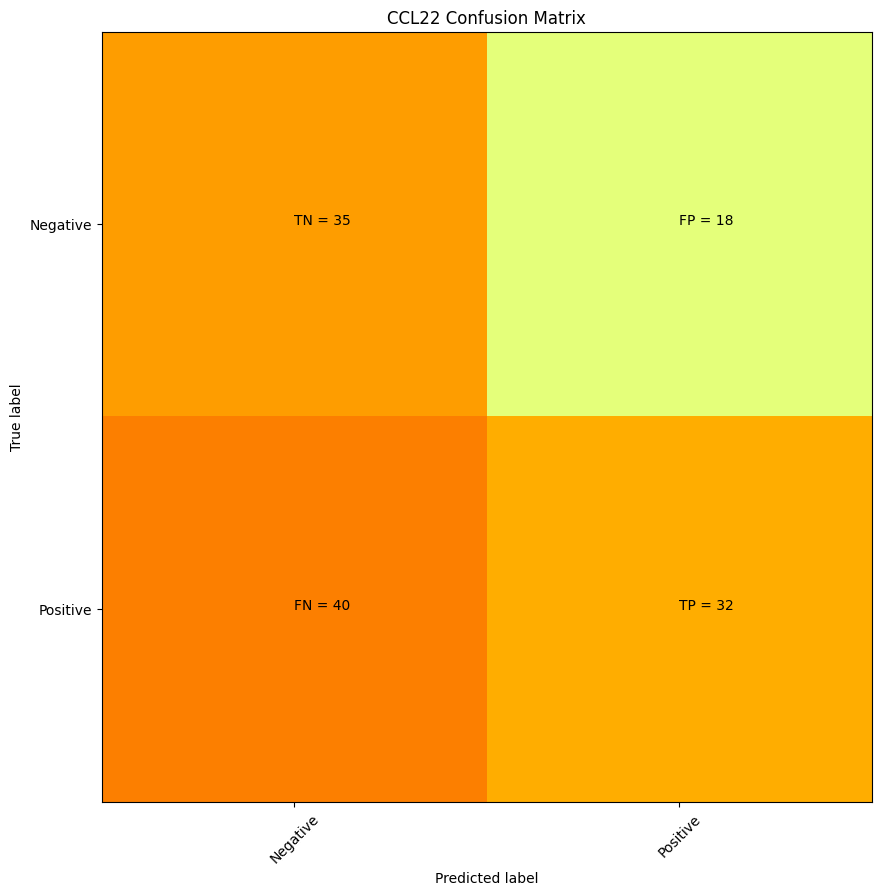

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

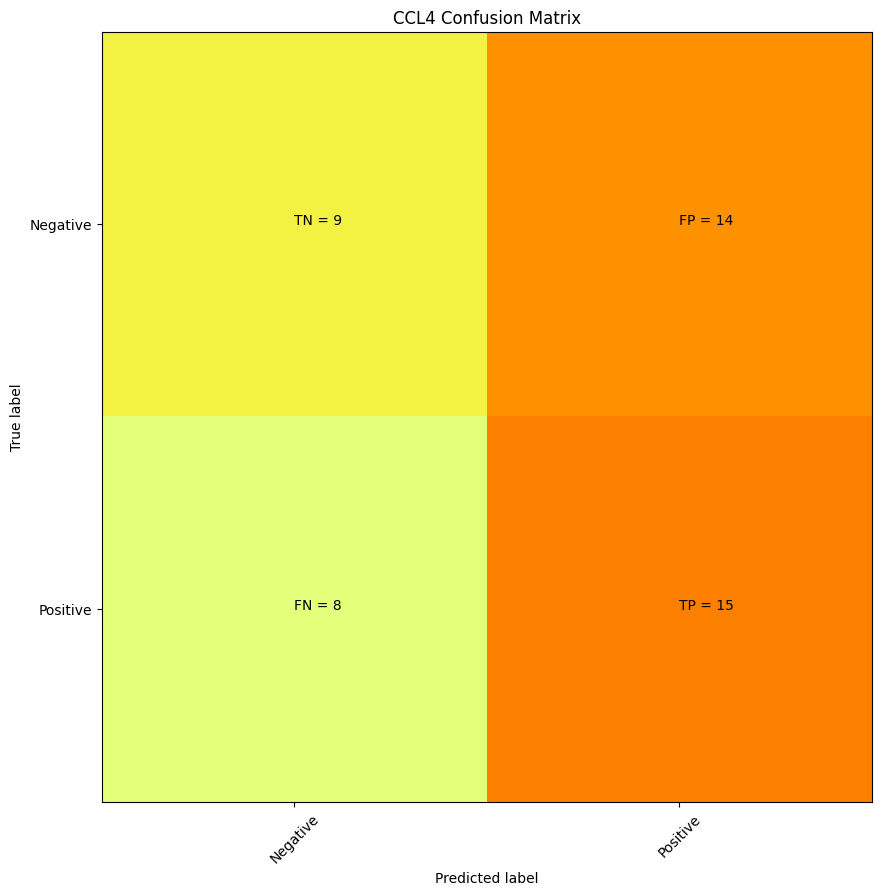

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

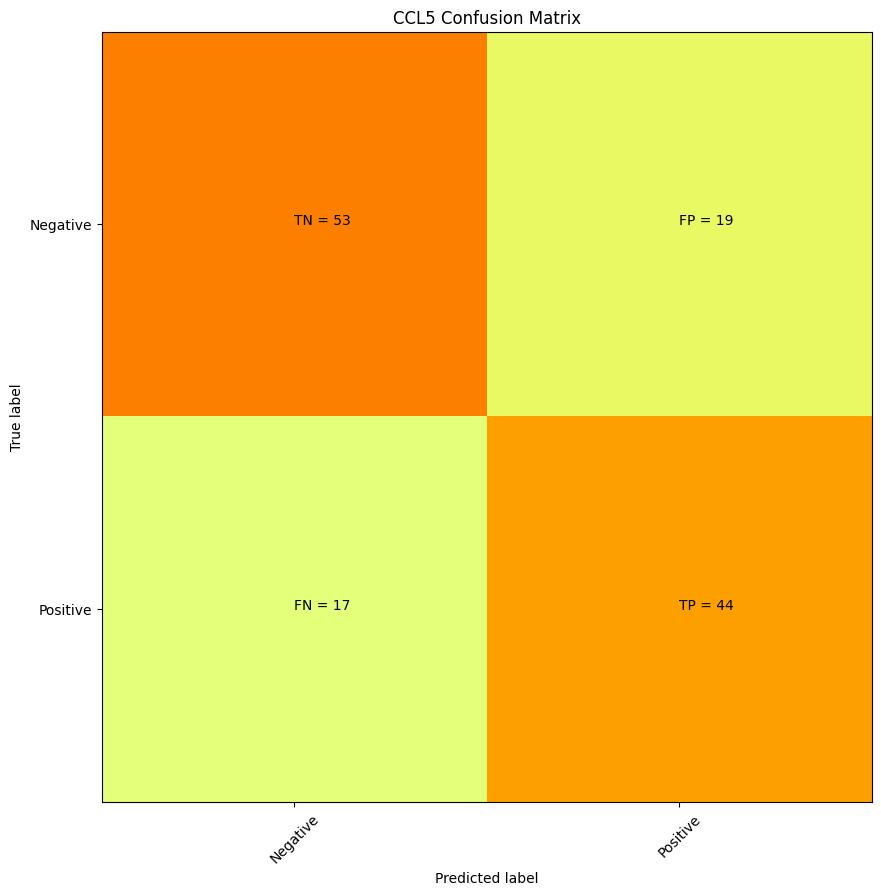

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

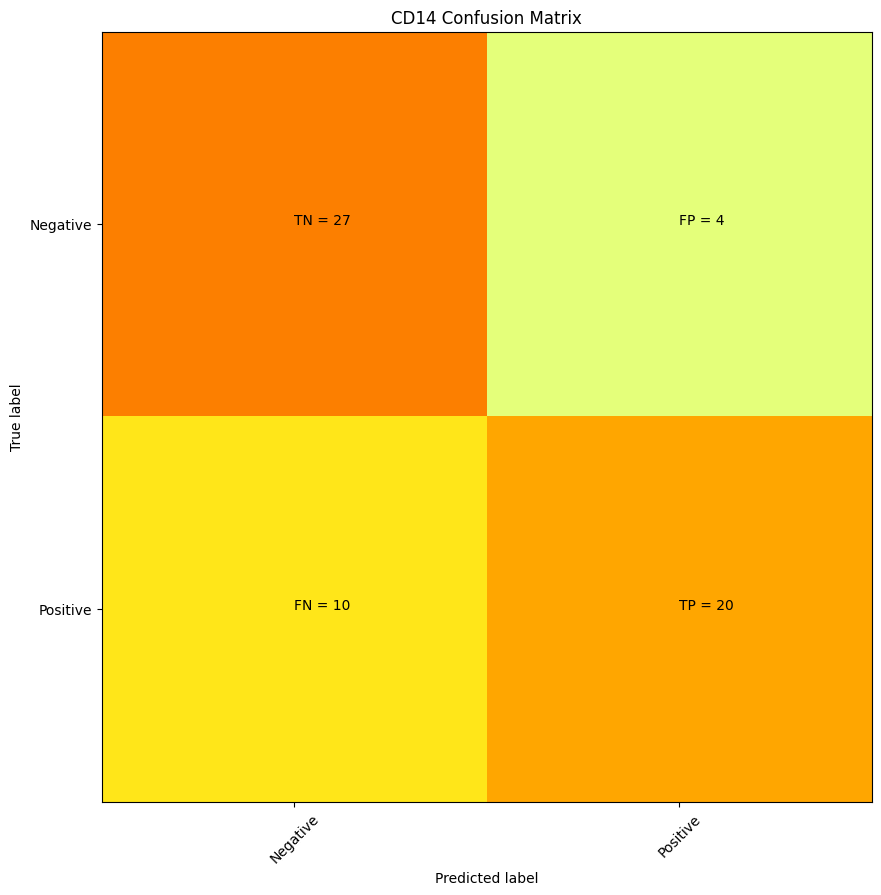

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

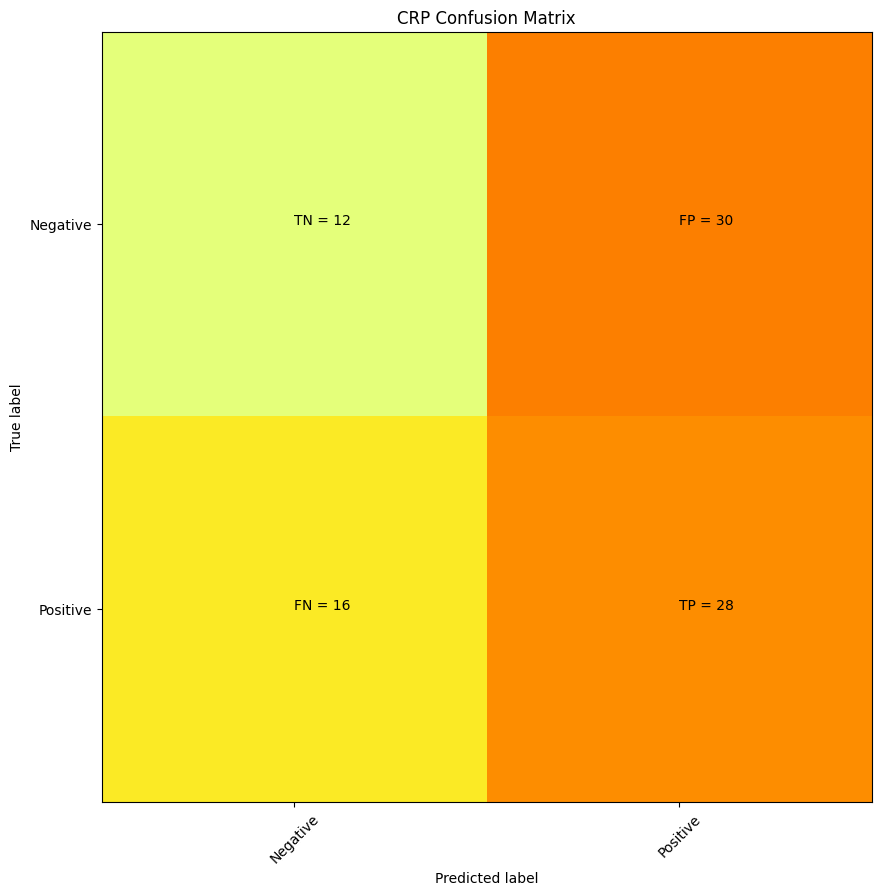

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


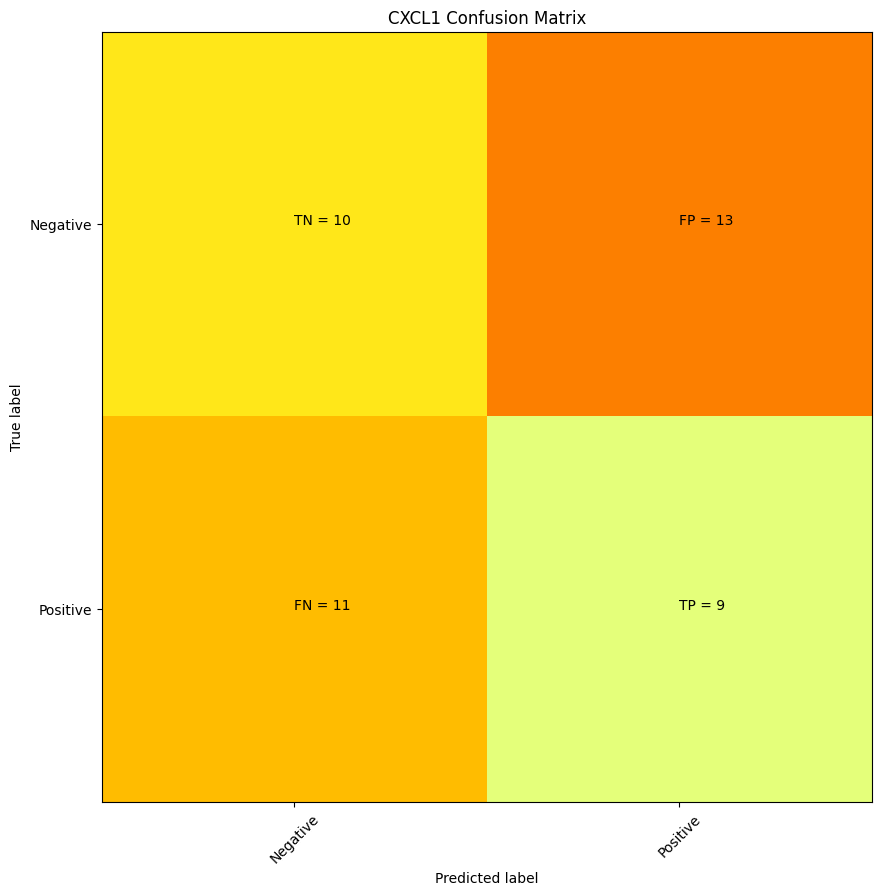

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

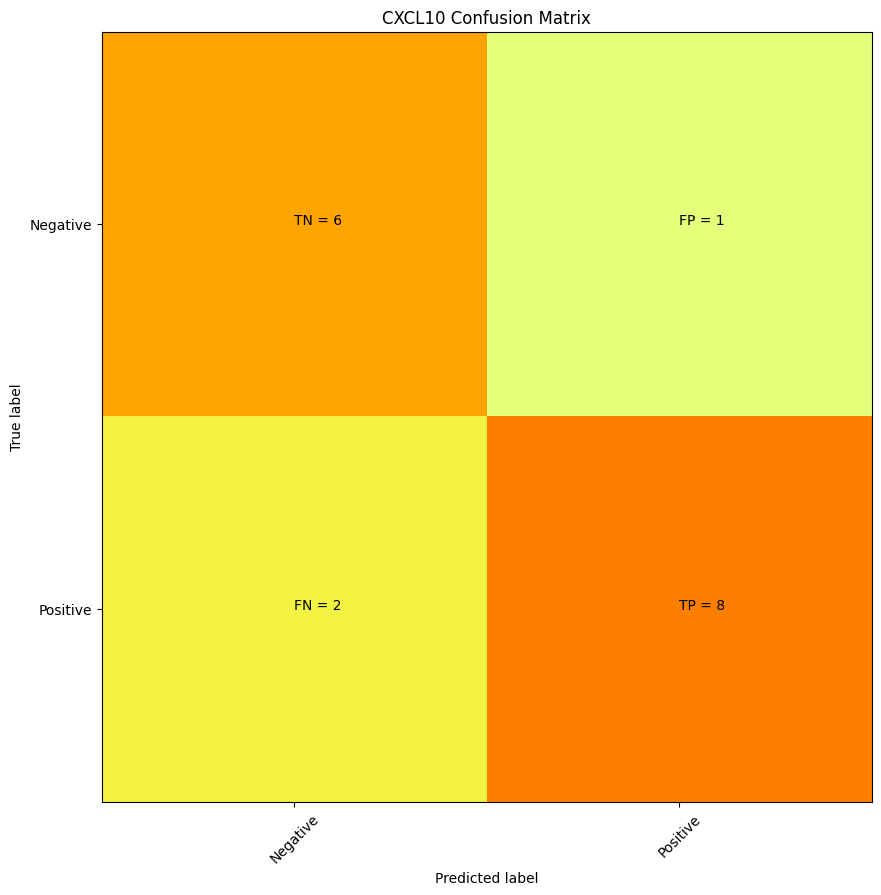

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 0.8888888888888888 recall = 0.8


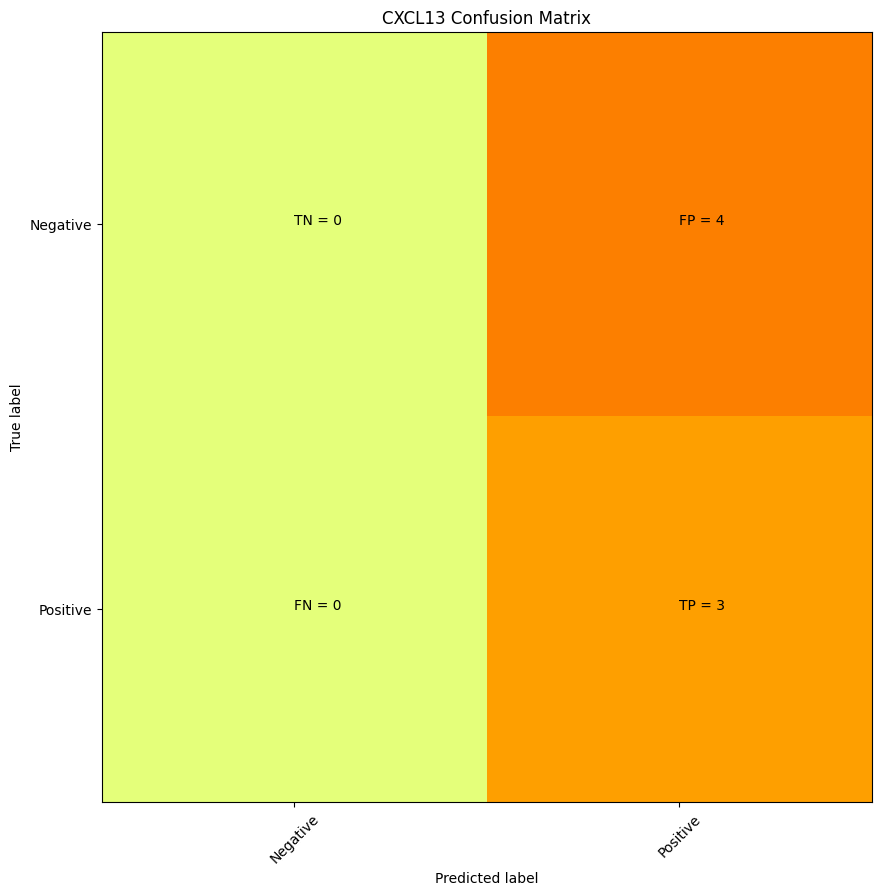

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = 0.42857142857142855 recall = 1.0


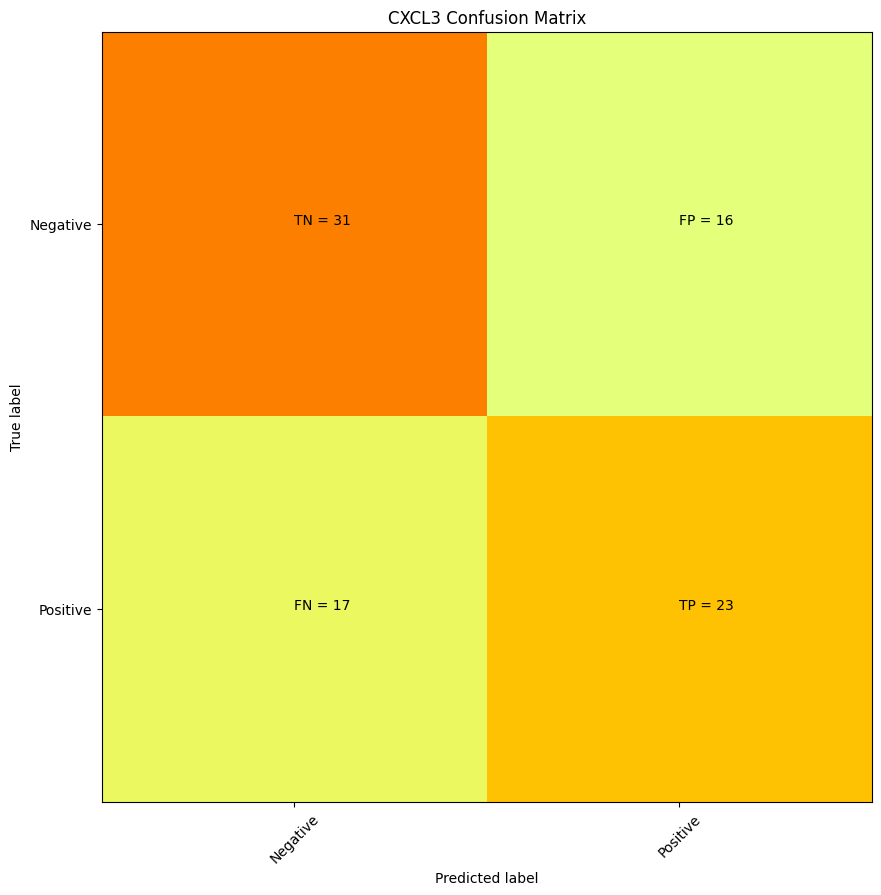

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

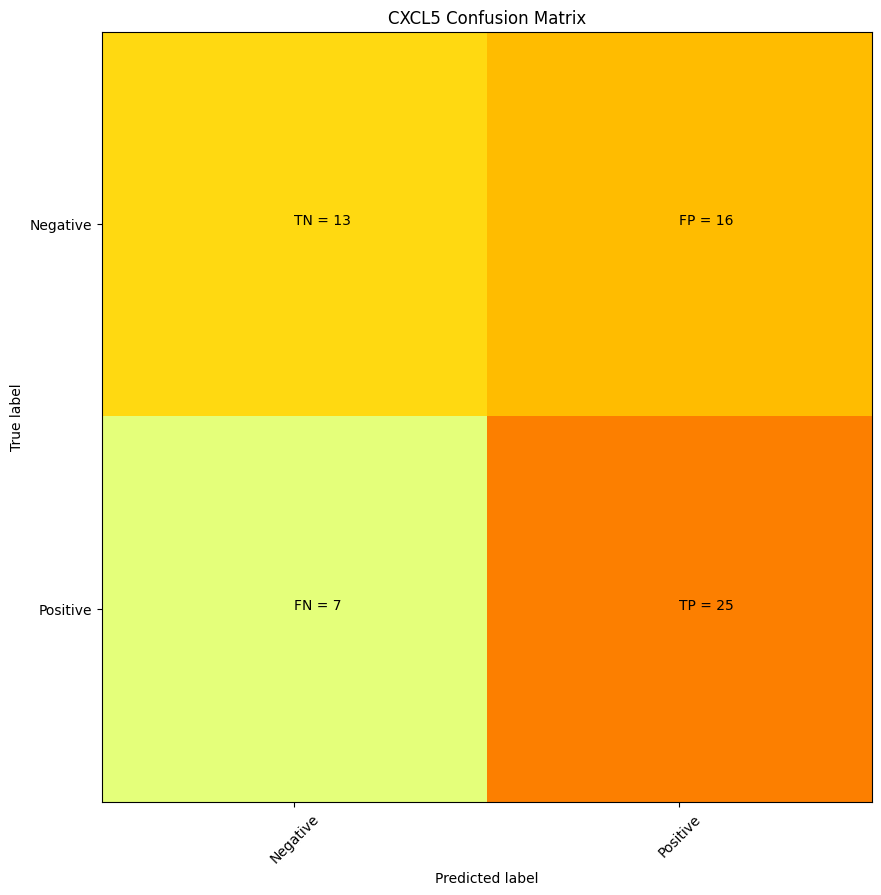

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

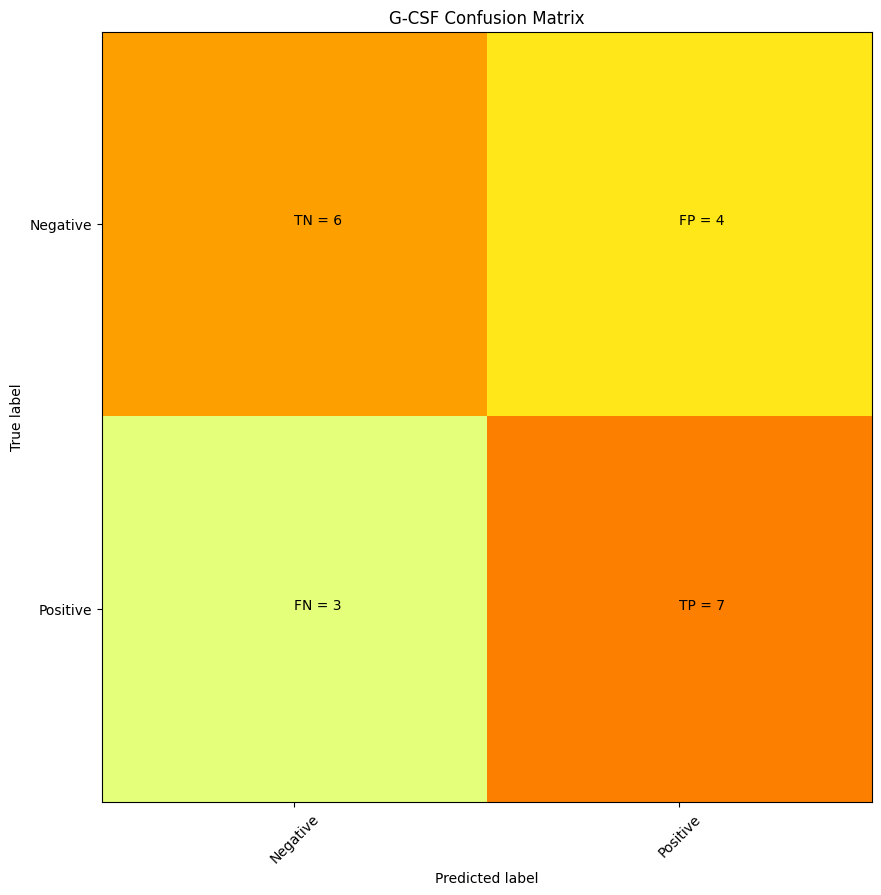

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.6363636363636364 recall = 0.7


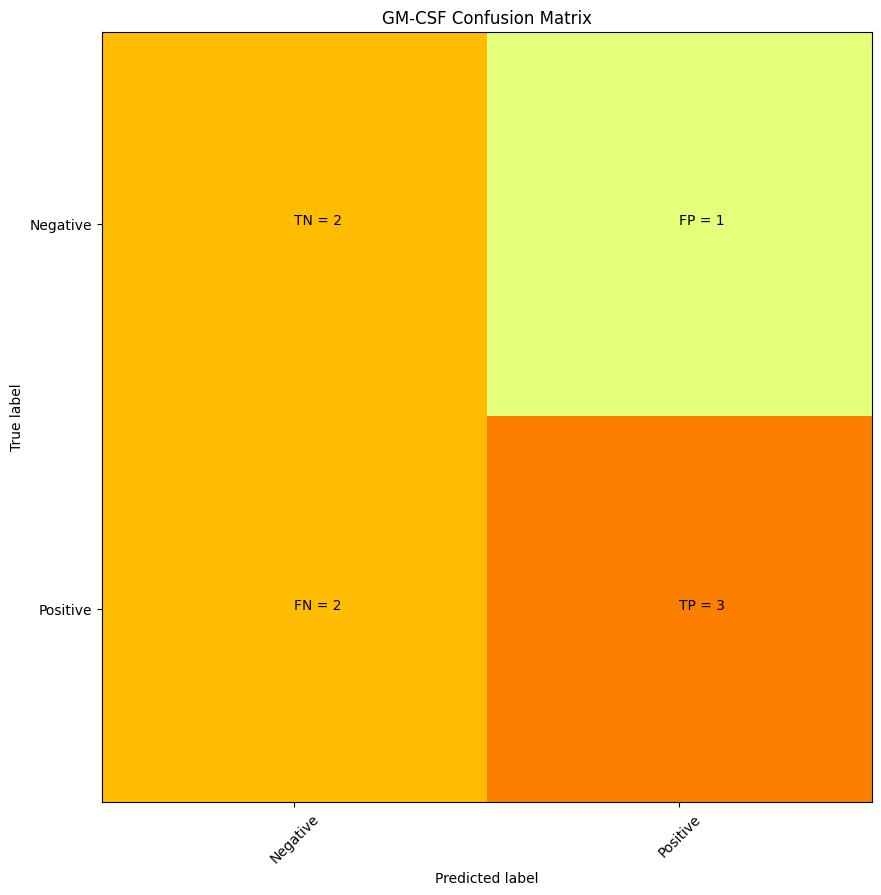

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = 0.75 recall = 0.6


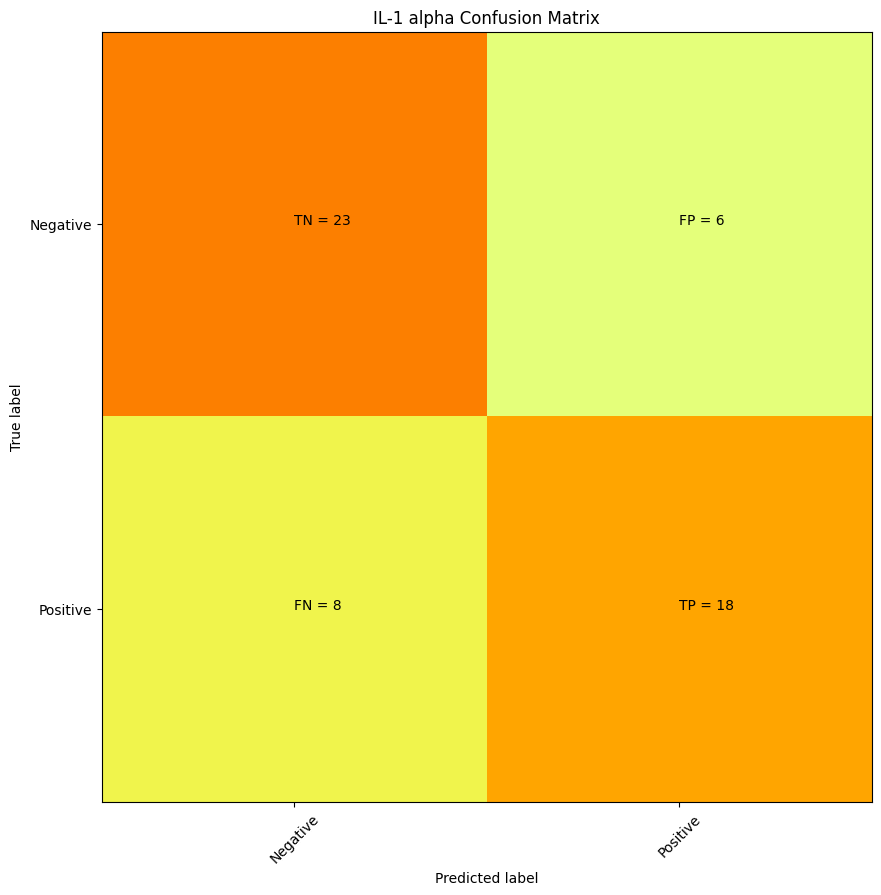

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

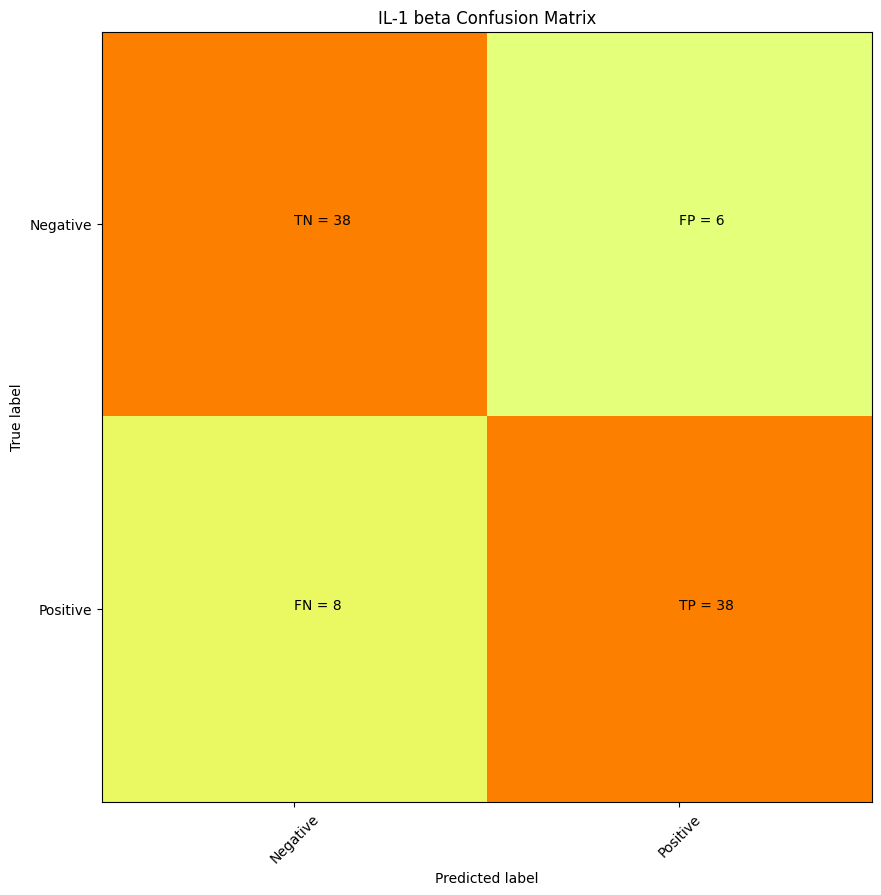

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

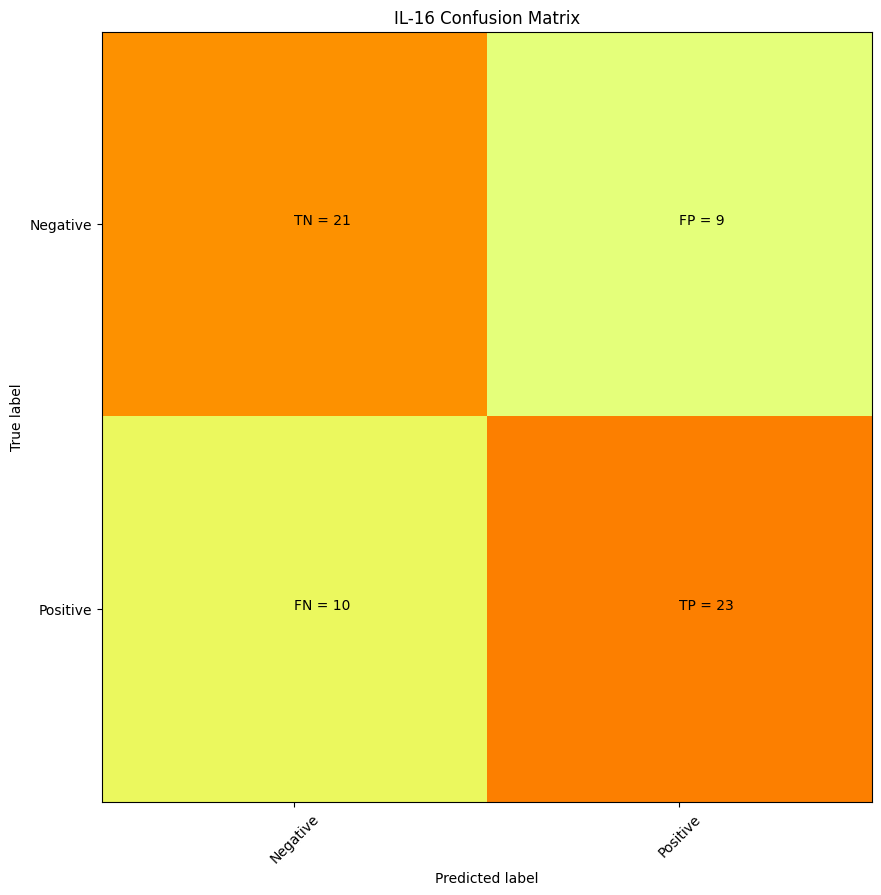

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

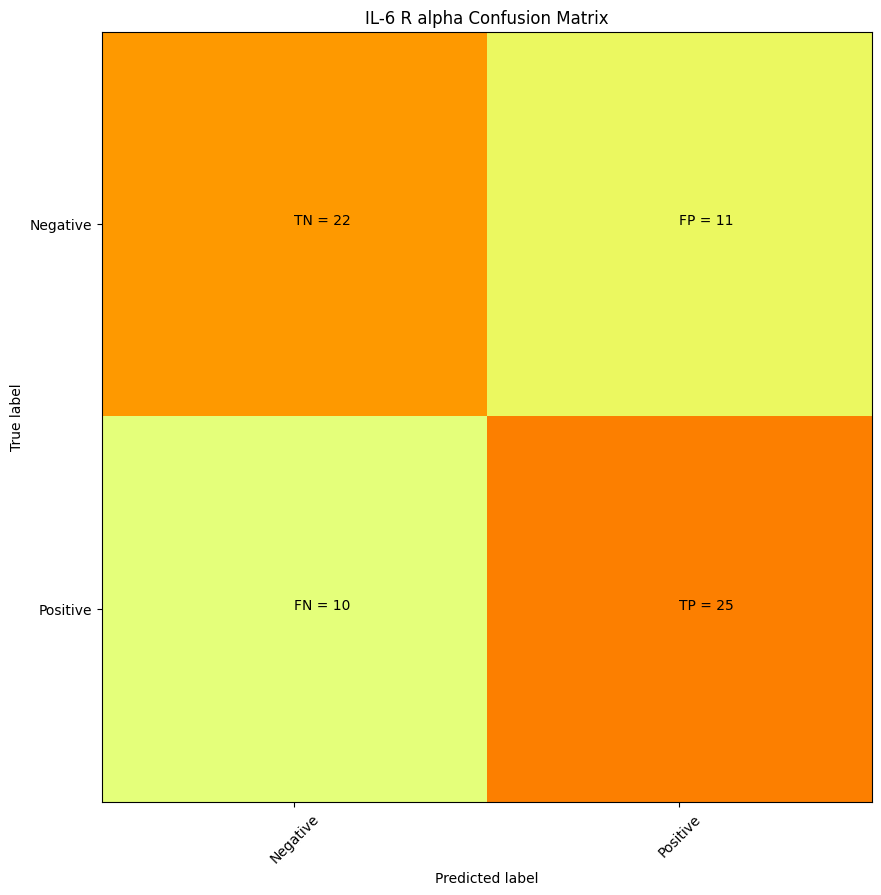

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

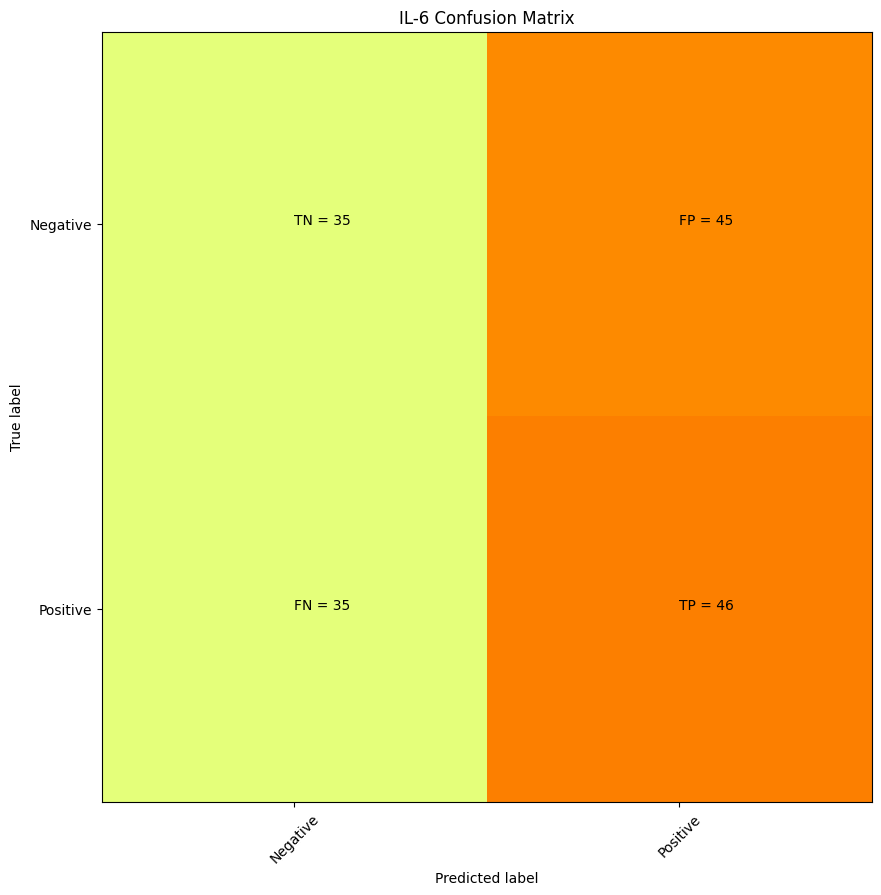

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

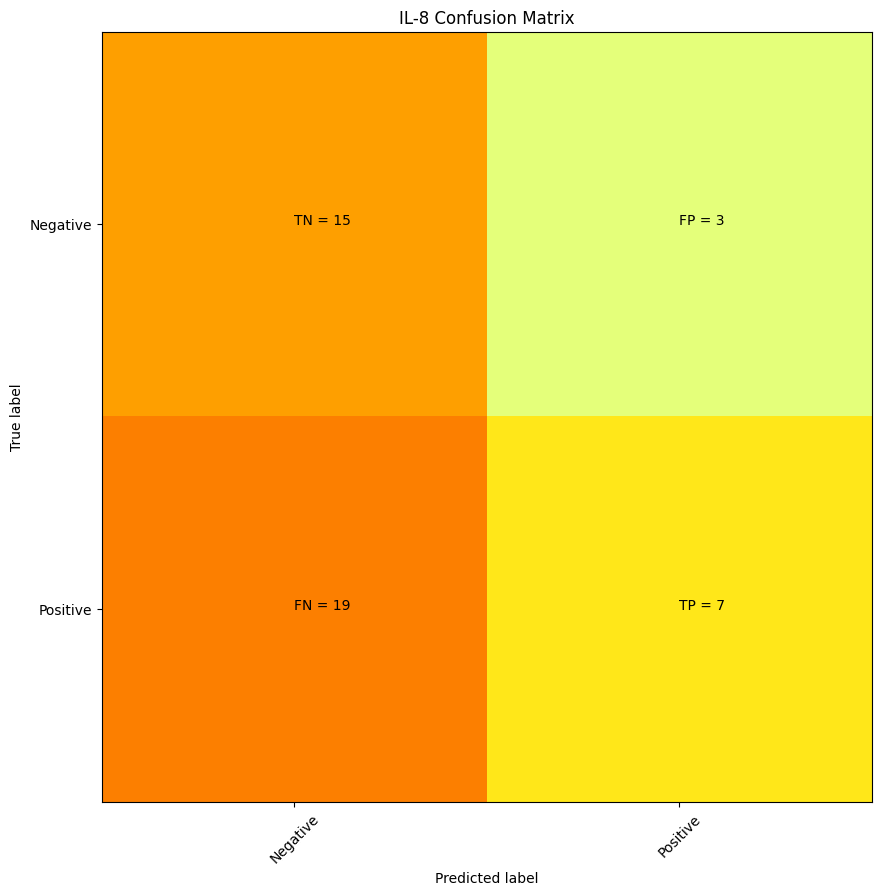

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

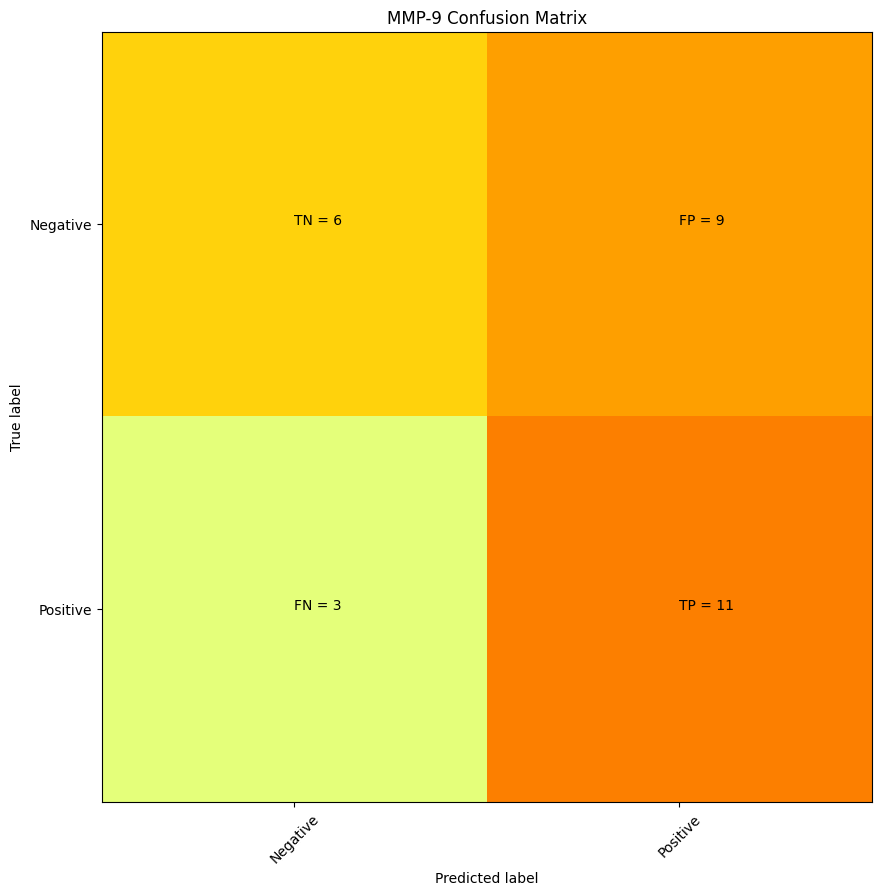

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.55 recall = 0.7857142857142857


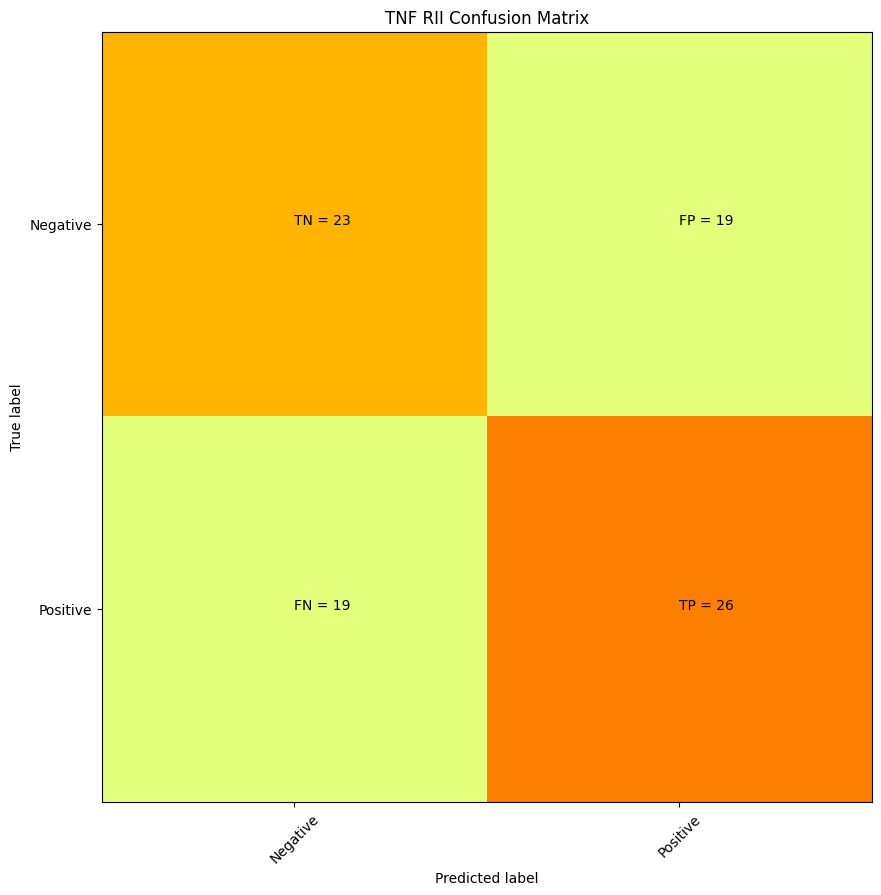

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [59]:
summarizing = []
summarizer_l1s = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in l1s_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_l1s = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_l1s['Precision'] = summarizer_l1s['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [60]:
summarizer_l1s

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.720000,0.720000,24,47
1,CCL1,0.600000,0.391304,14,46
2,CCL19,0.454545,1.000000,5,12
3,CCL2,0.603774,0.680851,48,95
4,CCL20,0.454545,0.384615,17,30
5,CCL22,0.640000,0.444444,27,125
6,CCL4,0.517241,0.652174,11,46
7,CCL5,0.698413,0.721311,38,133
8,CD14,0.833333,0.666667,45,61
9,CRP,0.482759,0.636364,20,86


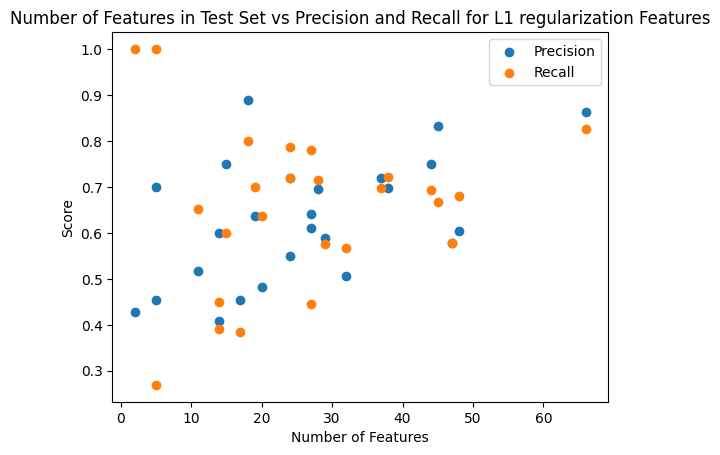

In [61]:
#Slight upward trend - more L1 features being chosen leads to better prediciton performance
plt.scatter(y=summarizer_l1s["Precision"], x = summarizer_l1s["Number of Features"])
plt.scatter(y=summarizer_l1s["Recall"], x = summarizer_l1s["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features in Test Set vs Precision and Recall for L1 regularization Features")
plt.show()

## Performance with features selected based on gini purity

In [62]:
treepicks_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = treepicks[treepicks["Cytokine"]==name]
        features = sub.iloc[:, -1:].values
        listed_features = features[0][0].tolist()
        print("got features")
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        treepicks_listing.append(finaldata)
    except:
        continue

treepicks_listing[0]





Activin A
got features
got embeddings
got final data
Amphiregulin
CCL1
got features
got embeddings
got final data
CCL19
got features
got embeddings
got final data
CCL2
got features
got embeddings
got final data
CCL20
got features
got embeddings
got final data
CCL22
got features
got embeddings
got final data
CCL4
got features
got embeddings
got final data
CCL5
got features
got embeddings
got final data
CCL8
CD14
got features
got embeddings
got final data
CRP
got features
got embeddings
got final data
CX3CL1
CXCL1
got features
got embeddings
got final data
CXCL10
got features
got embeddings
got final data
CXCL11
CXCL13
got features
got embeddings
got final data
CXCL3
got features
got embeddings
got final data
CXCL5
got features
got embeddings
got final data
G-CSF
got features
got embeddings
got final data
GM-CSF
got features
got embeddings
got final data
IL-1 alpha
got features
got embeddings
got final data
IL-1 beta
got features
got embeddings
got final data
IL-10
IL-12 p40
got features

,Activin A,Output_0,Output_1,Output_11,Output_12,Output_18,Output_21,Output_23,Output_25,Output_26,...,Output_1244,Output_1245,Output_1251,Output_1256,Output_1257,Output_1258,Output_1260,Output_1264,Output_1269,Output_1272
well,,,,,,,,,,,,,,,,,,,,,
A09,1,-0.007085,0.437160,-0.073821,1.263069,0.234076,-0.056563,0.177567,-0.106459,-0.074078,...,0.853689,0.425038,5.796263,-0.051163,0.427194,-0.002047,0.842473,0.340086,-0.029391,-0.047974
C03,1,-0.000901,0.385524,-0.082973,1.434310,0.228284,-0.049482,0.151898,-0.106674,-0.076348,...,0.834598,0.536860,5.787236,-0.045585,0.421308,0.047925,1.070158,0.421079,-0.037143,0.011824
C09,1,0.004371,0.395201,-0.075442,1.566862,0.250924,-0.057644,0.135810,-0.105022,-0.079538,...,0.826358,0.429418,5.923929,-0.051226,0.408818,-0.014895,1.178435,0.376412,-0.046289,0.020868
C17,1,0.021902,0.450791,-0.071467,1.608116,0.163325,-0.054568,0.135366,-0.109116,-0.068803,...,0.808533,0.474373,6.039180,-0.052970,0.377344,-0.035501,0.971517,0.372772,-0.046059,0.019631
F03,1,0.005858,0.406566,-0.082156,1.549089,0.245621,-0.053214,0.156914,-0.102823,-0.063193,...,0.880352,0.490483,5.669541,-0.047569,0.445482,0.018631,1.184491,0.420430,-0.043812,0.019695
F04,1,0.022840,0.453482,-0.077277,1.363993,0.227171,-0.054684,0.183158,-0.109331,-0.072042,...,0.884281,0.521508,5.688501,-0.047311,0.457415,0.002252,0.946217,0.349622,-0.043798,-0.001719
F05,1,-0.006333,0.385287,-0.078546,1.448455,0.208043,-0.059289,0.213197,-0.102571,-0.068707,...,0.817238,0.440170,5.847981,-0.039559,0.459471,-0.006371,0.961740,0.351287,-0.043122,0.004530
F08,1,-0.002294,0.387870,-0.081199,1.417612,0.212069,-0.053382,0.164900,-0.102615,-0.077304,...,0.809371,0.517846,5.657918,-0.048432,0.422751,0.067254,1.149155,0.272716,-0.038081,0.011302
F09,1,-0.005775,0.372382,-0.077444,1.371652,0.185658,-0.057431,0.187334,-0.105177,-0.077461,...,0.864137,0.463756,5.636754,-0.043462,0.444709,0.037690,0.928531,0.276939,-0.039802,-0.029912


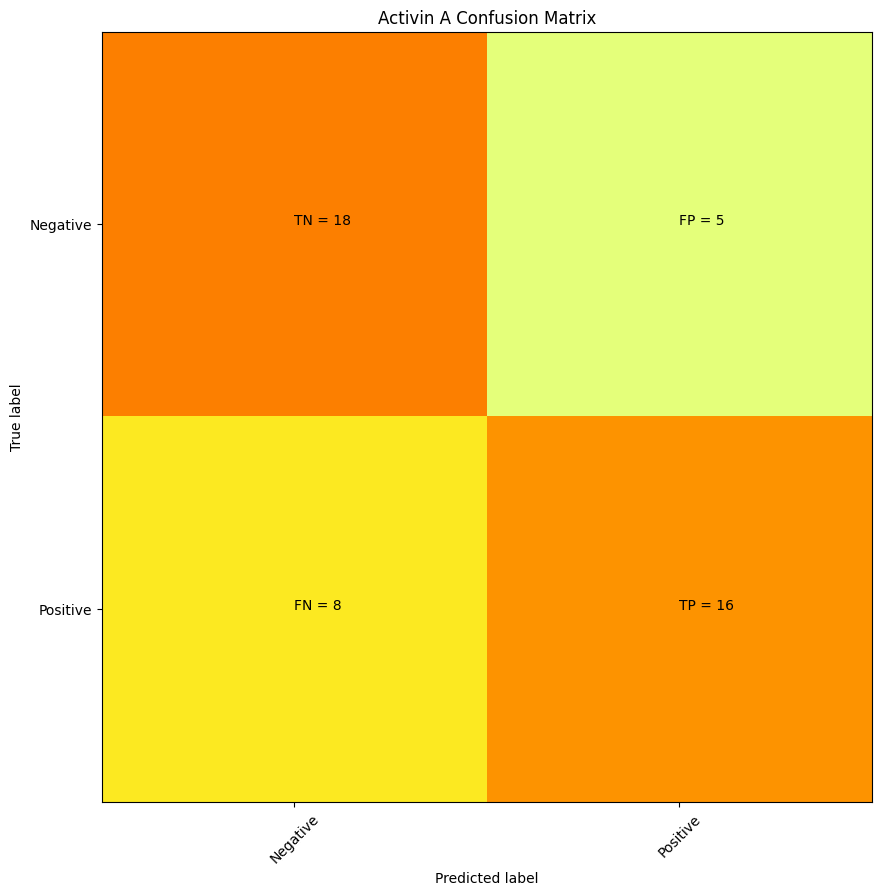

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

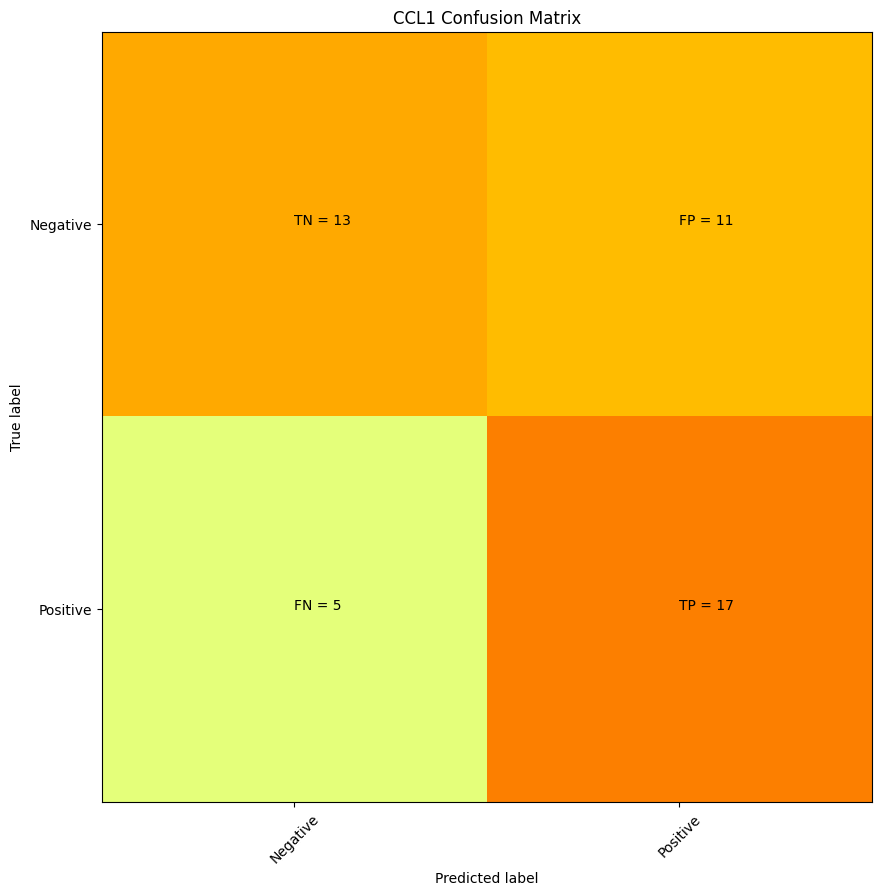

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

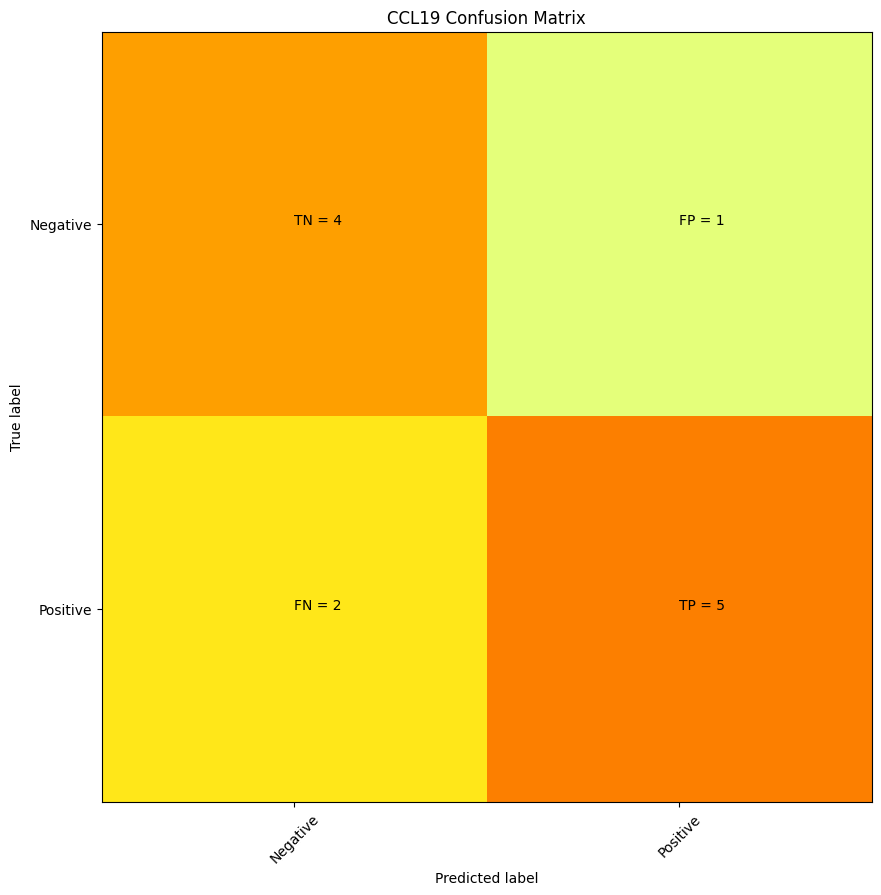

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = 0.8333333333333334 recall = 0.7142857142857143


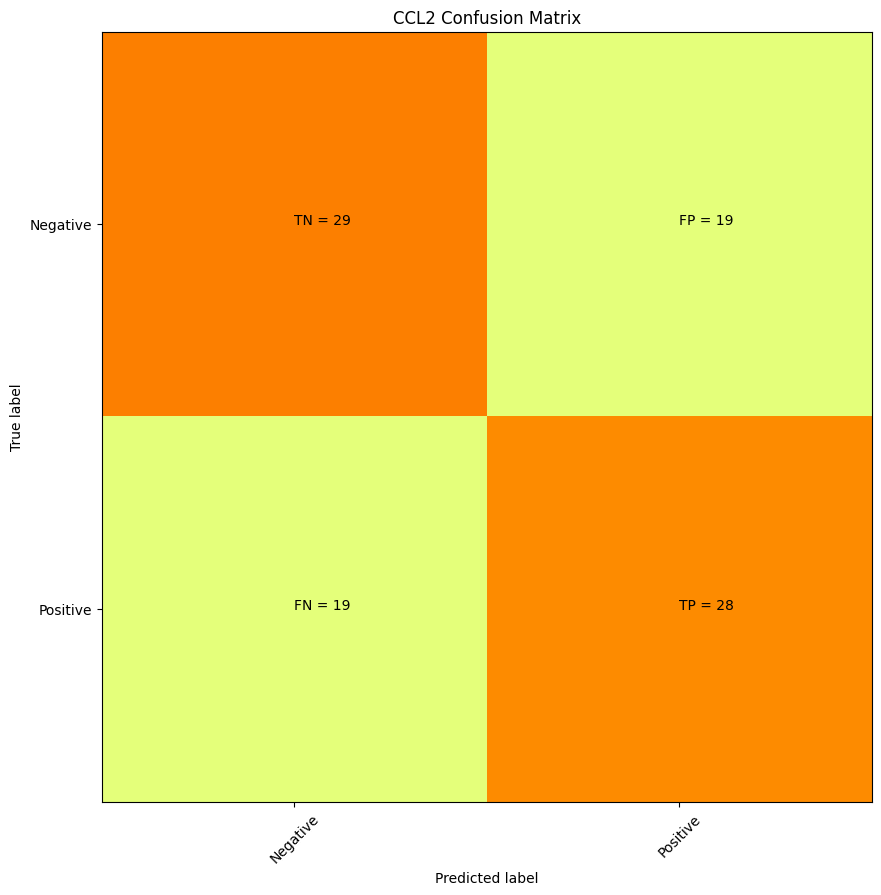

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

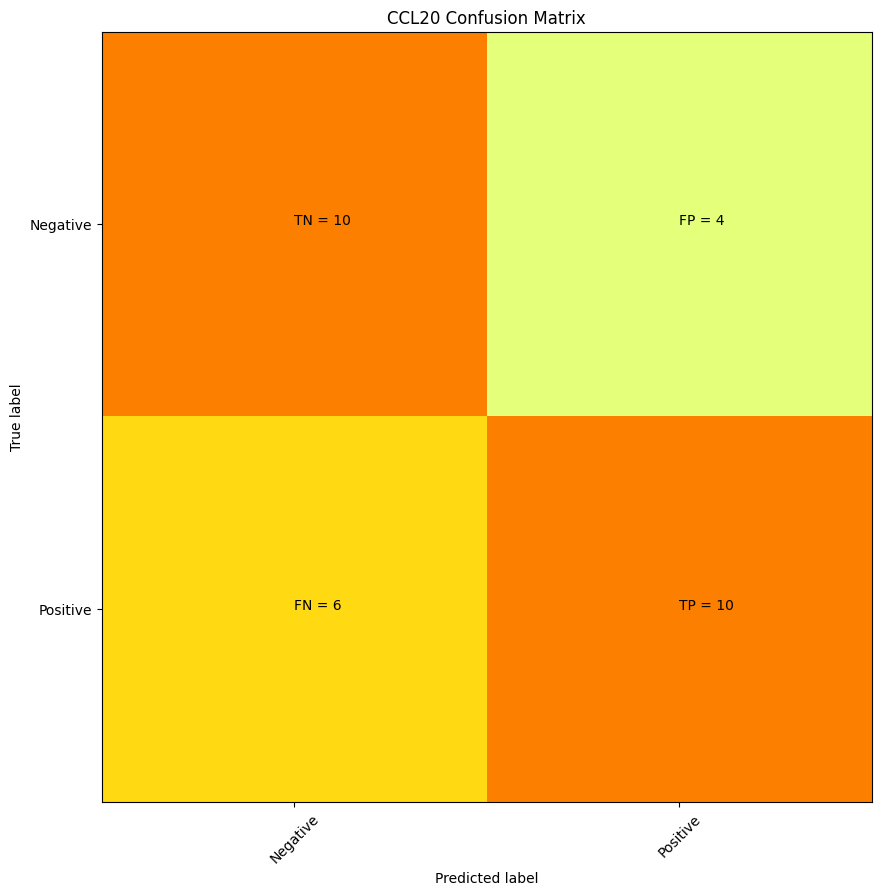

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.7142857142857143 recall = 0.625


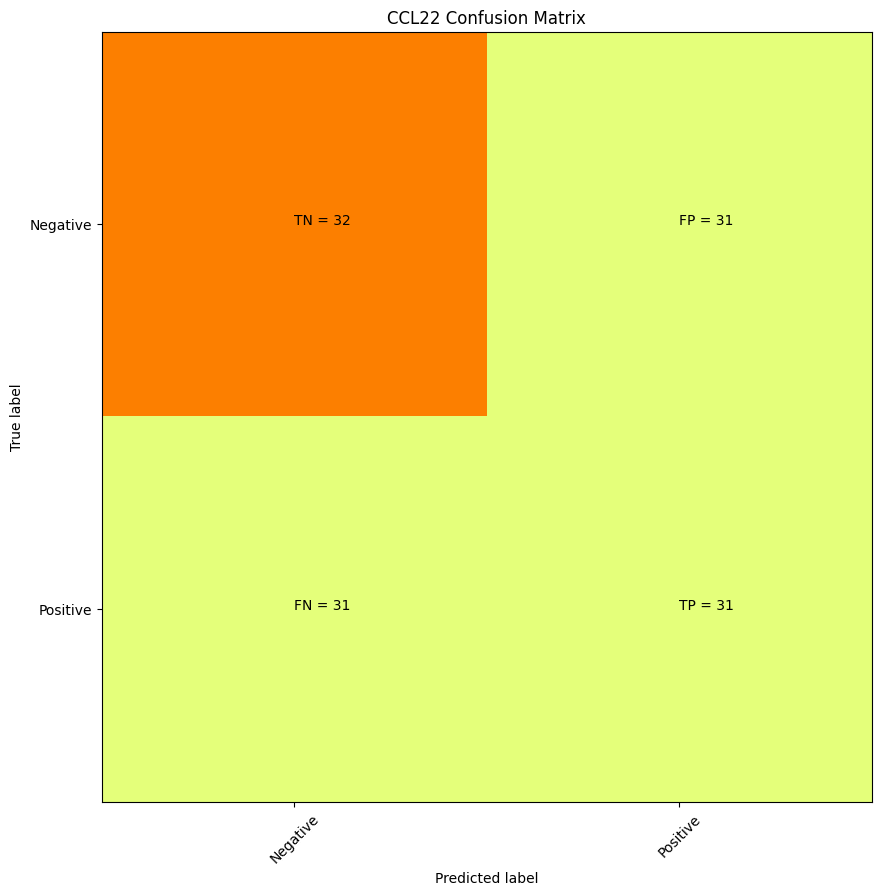

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

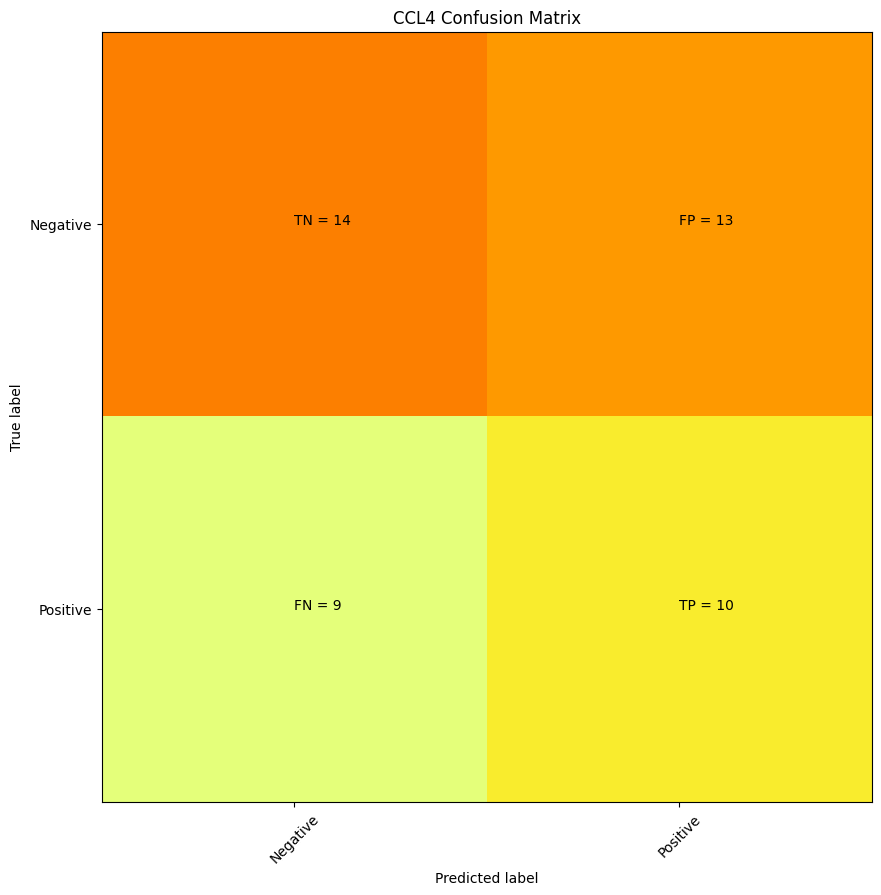

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

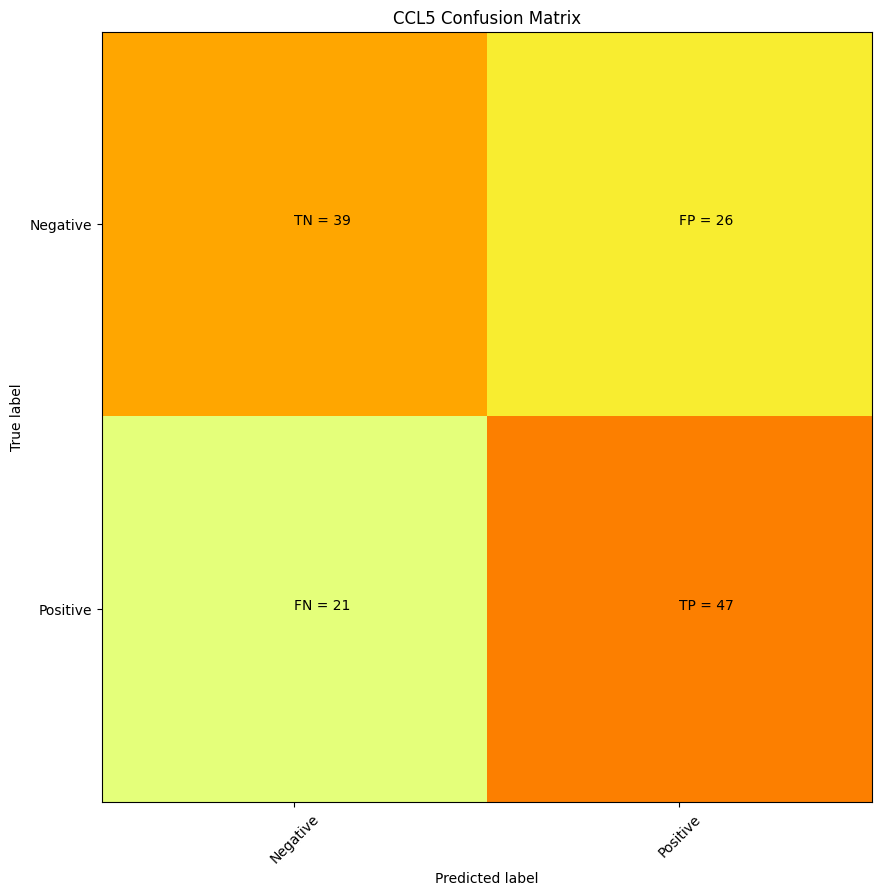

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

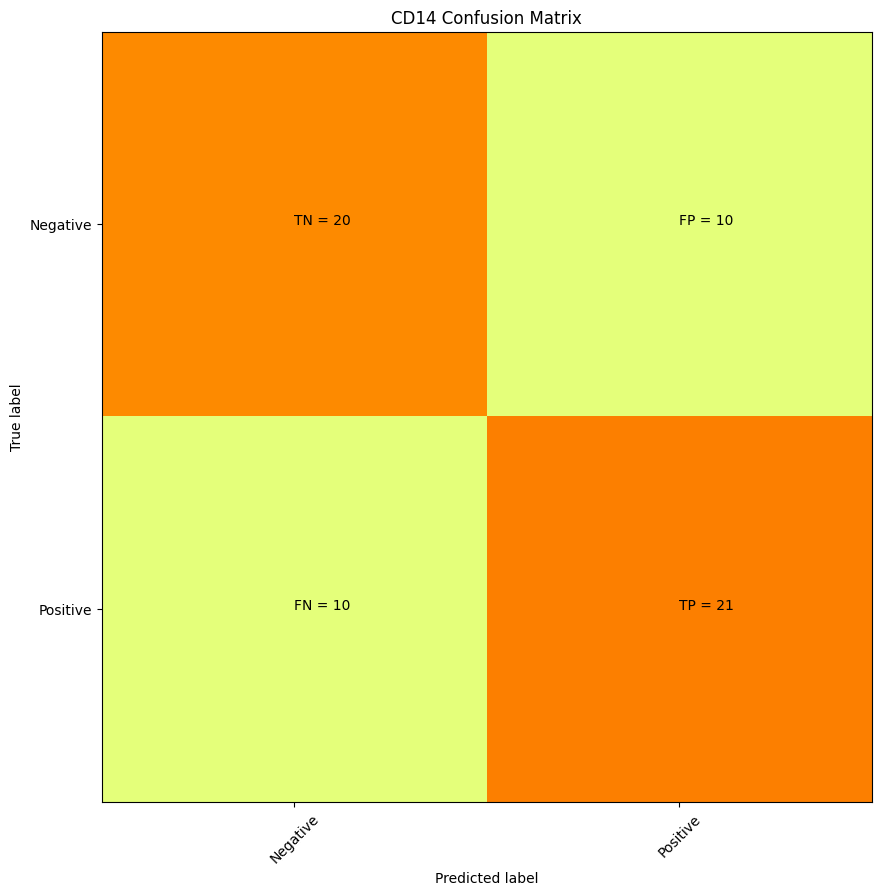

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

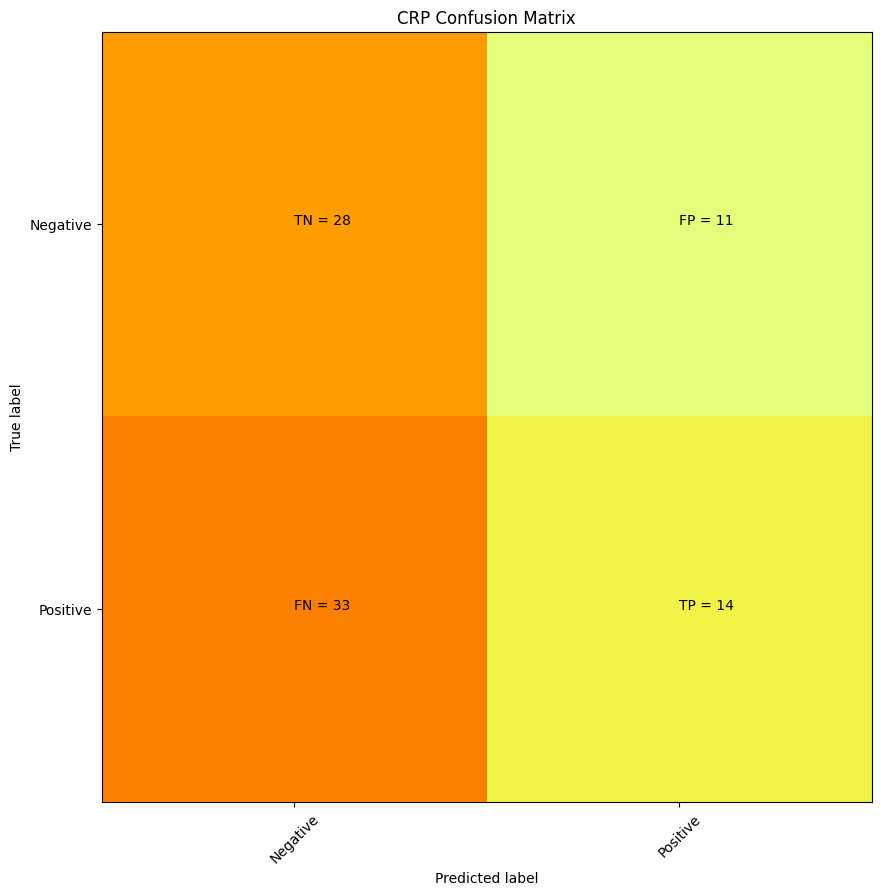

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


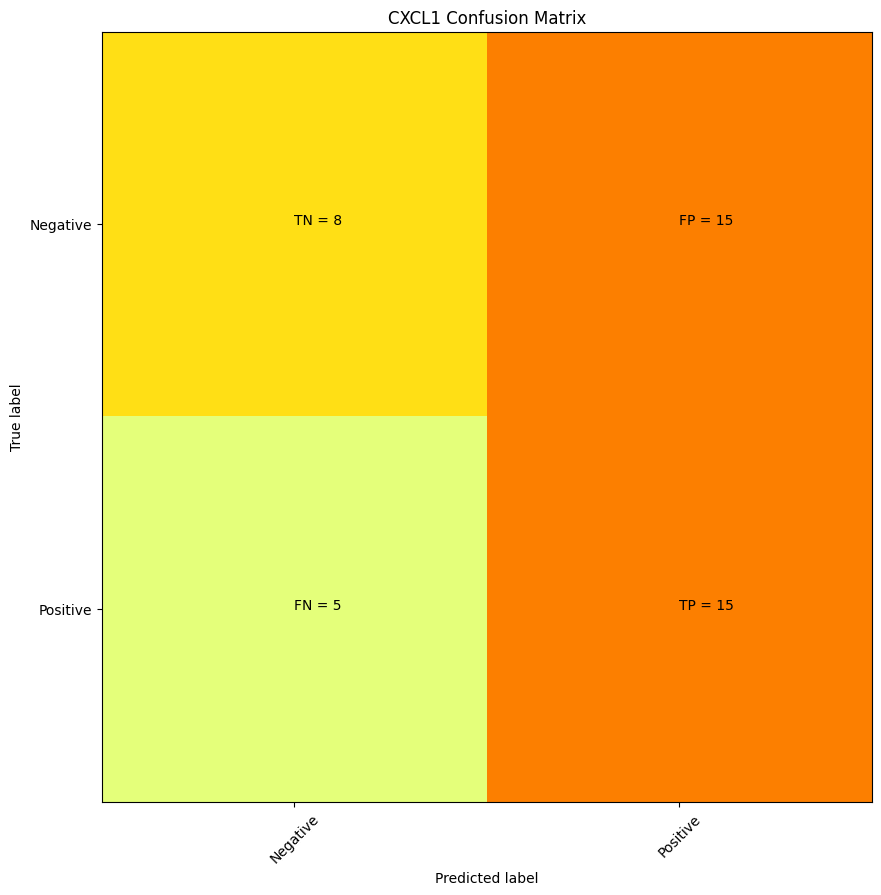

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

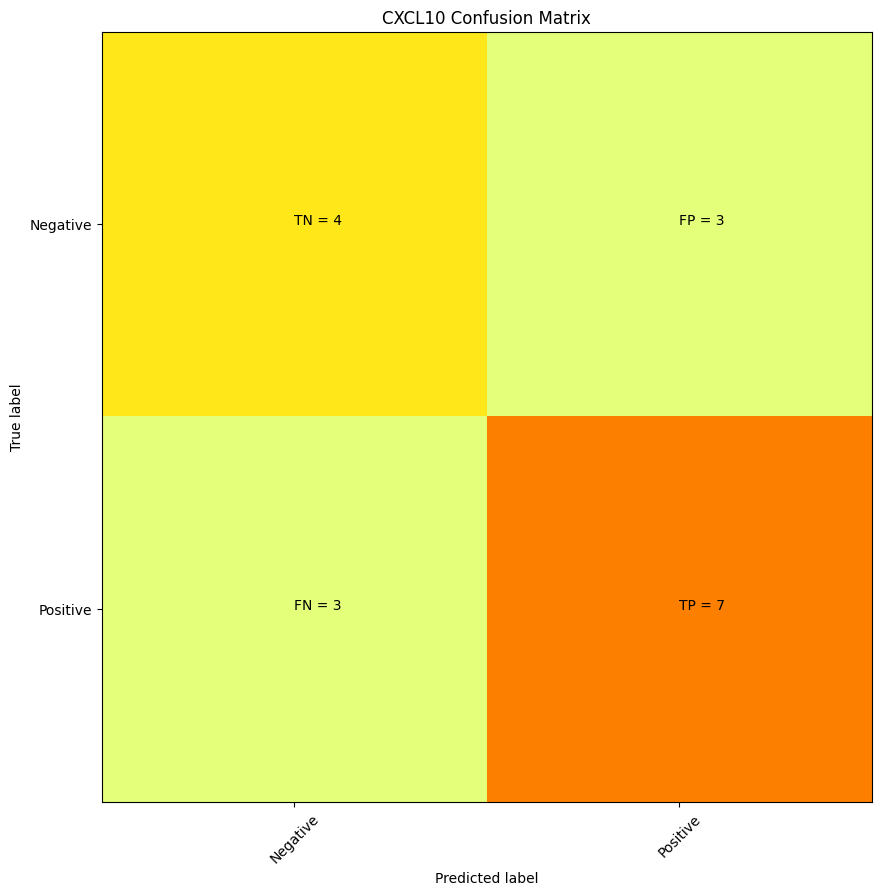

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 0.7 recall = 0.7


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


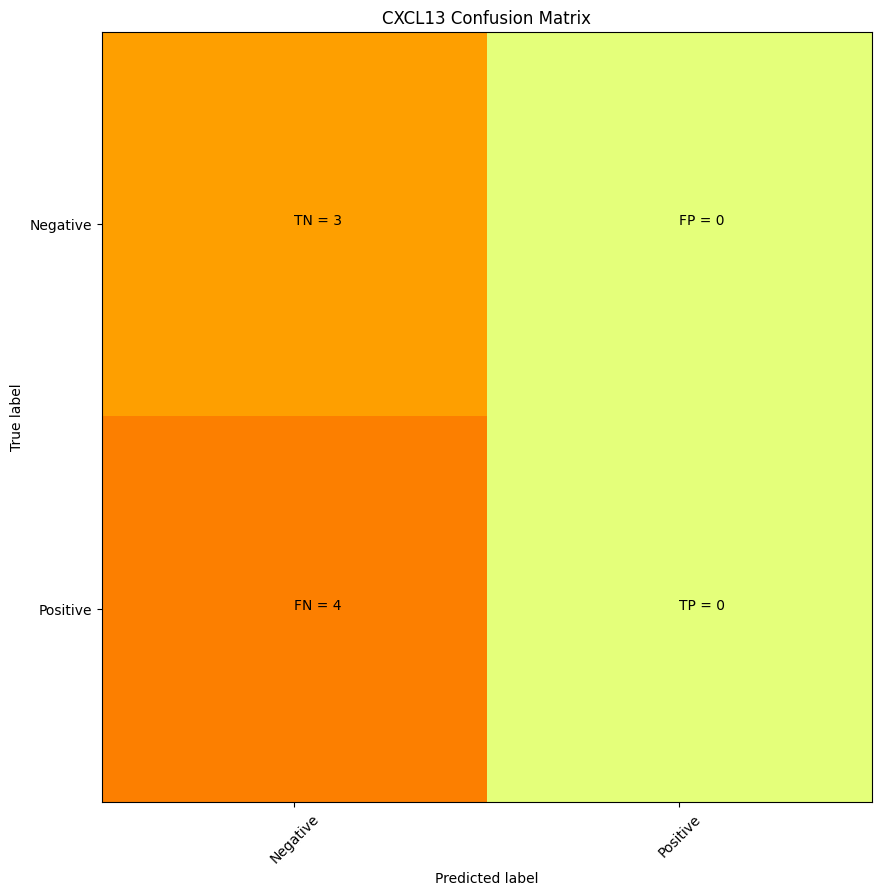

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = nan recall = 0.0


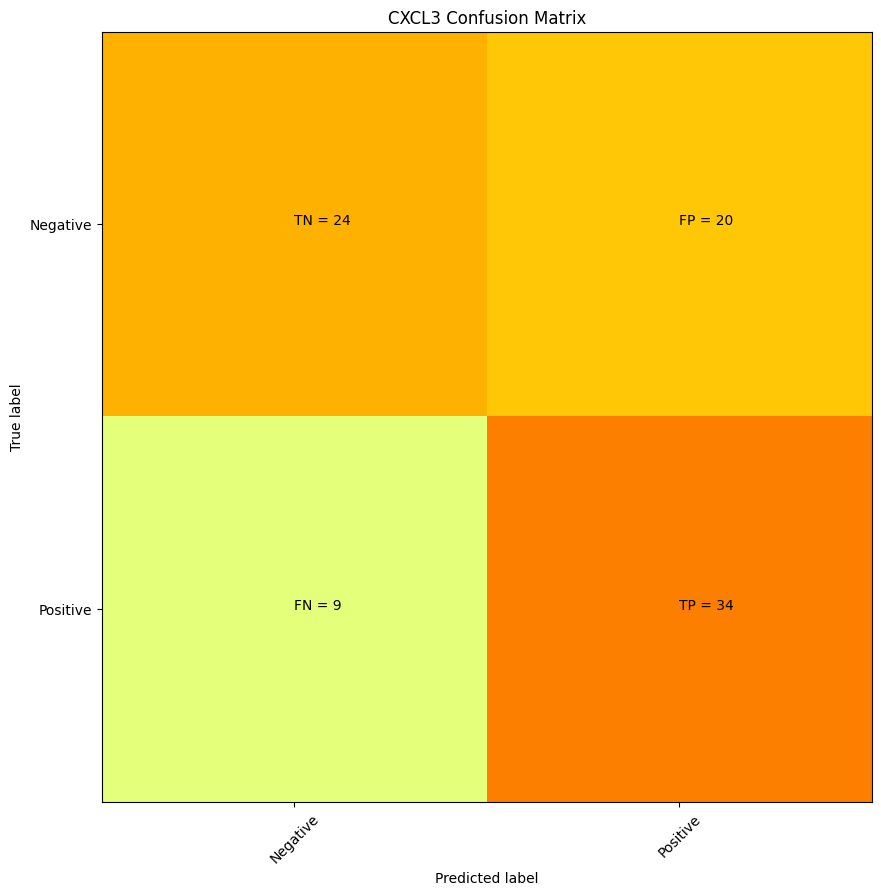

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

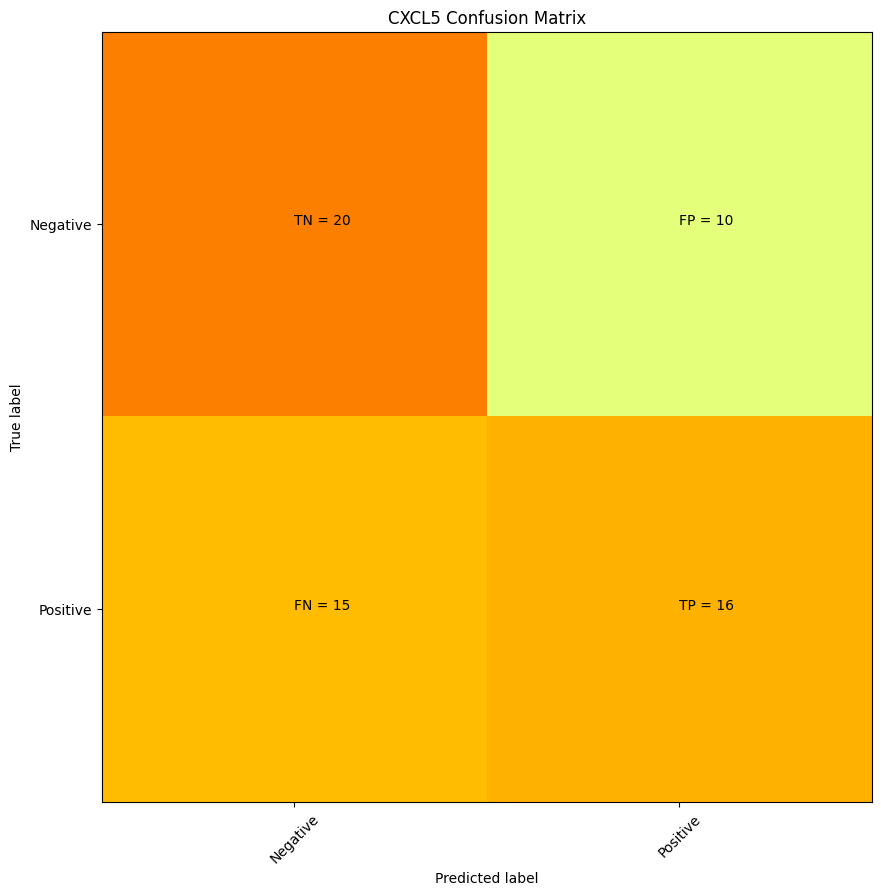

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

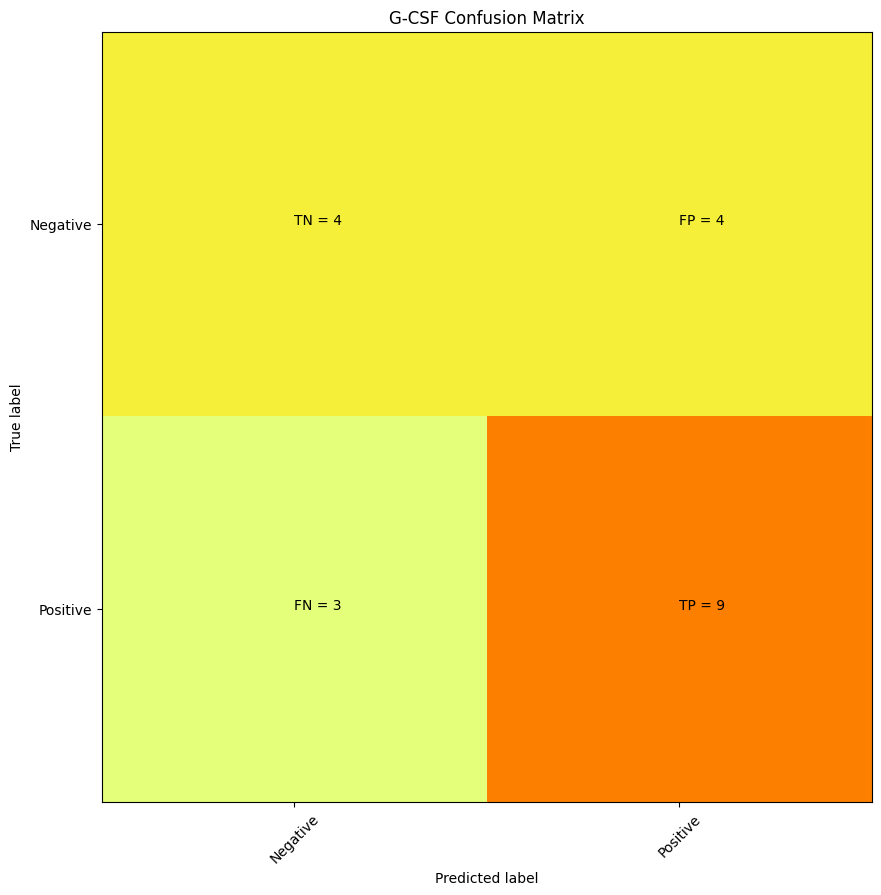

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.6923076923076923 recall = 0.75


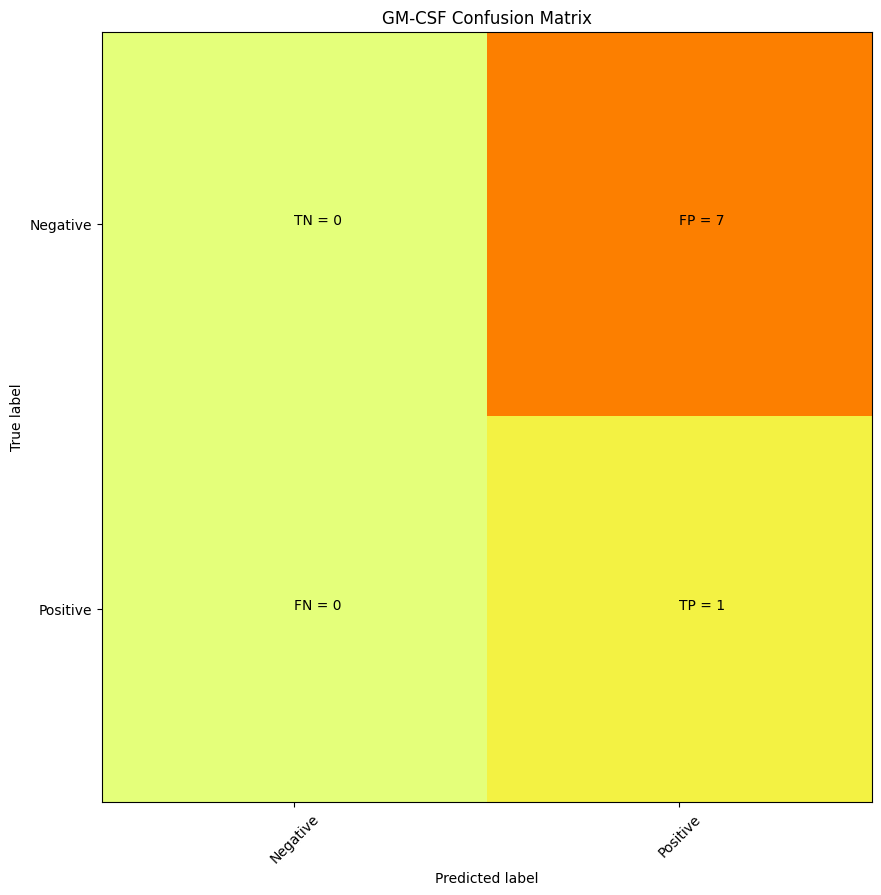

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = 0.125 recall = 1.0


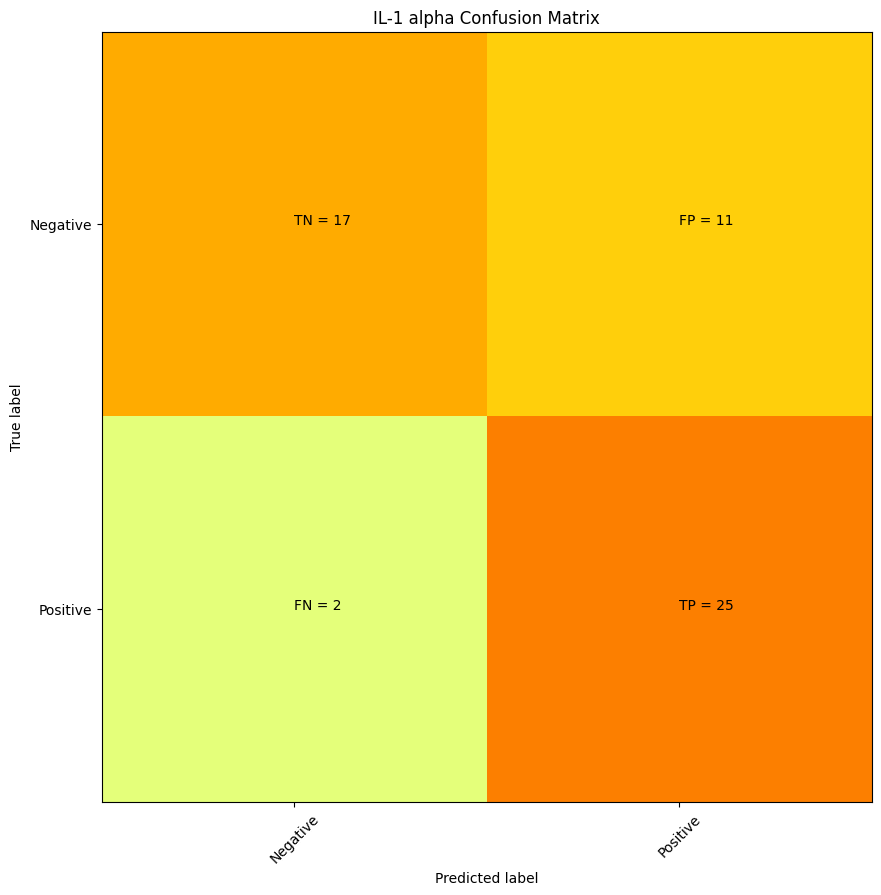

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

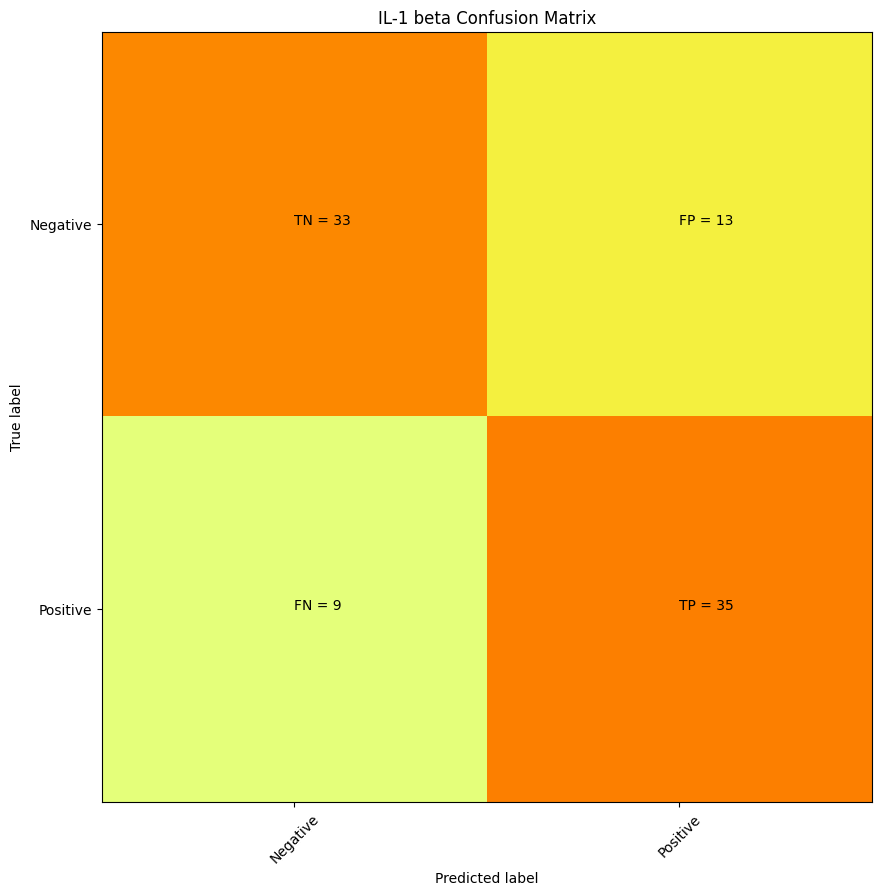

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

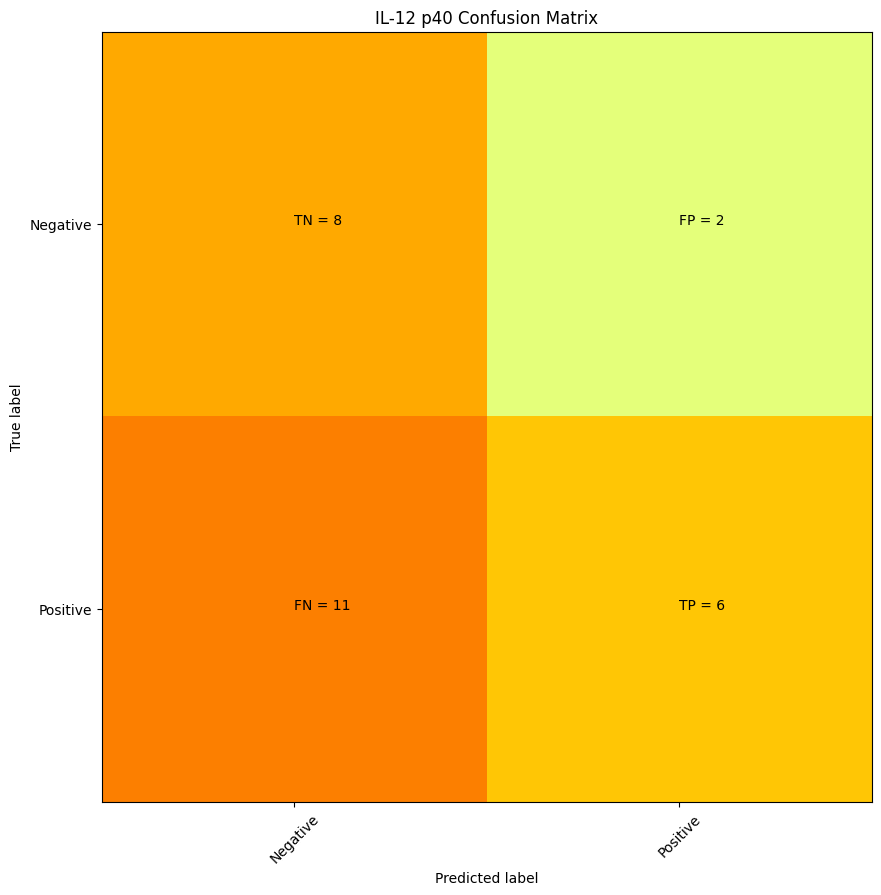

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
B18           0
A07           0
H02           0
B14           0
L04           0
K05           0
G09           0
N19           0
I09           0
C24           0
G12           0
J14           0
D21           0
D12           0
J19           0
B02           0
C11           0
D08           0
P14           0
E08           0
I14           0
I11           0
H03           0
H05           0
H22           0
P03           0
A15           0 precision = 0.75 recall = 0.35294117647058826


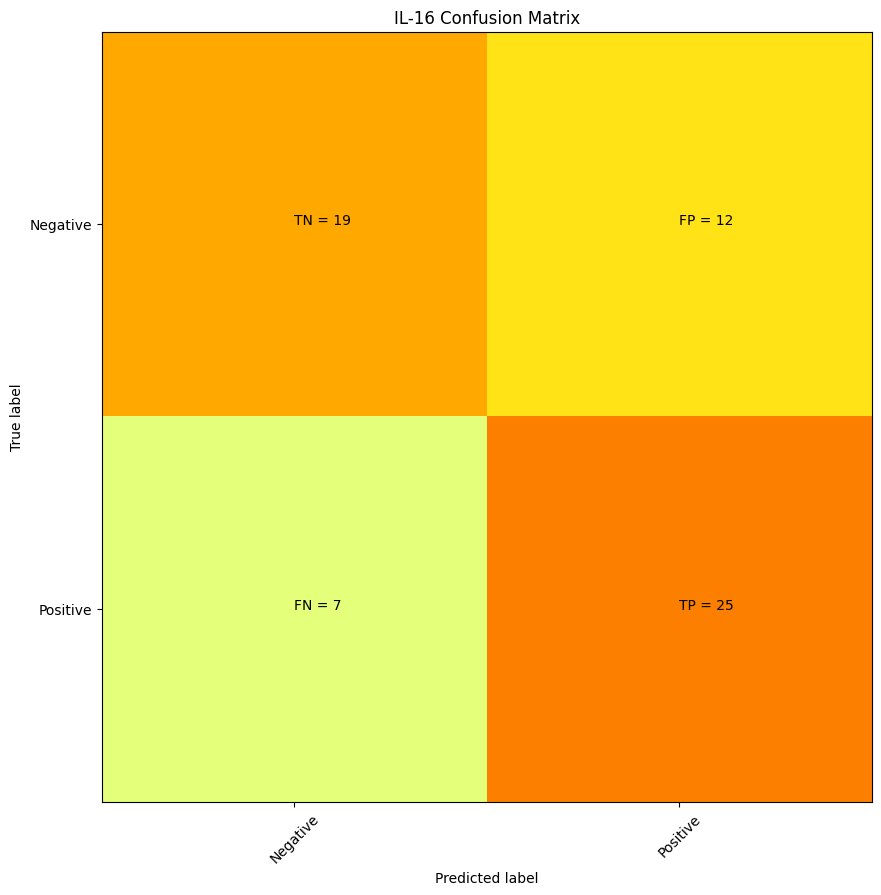

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

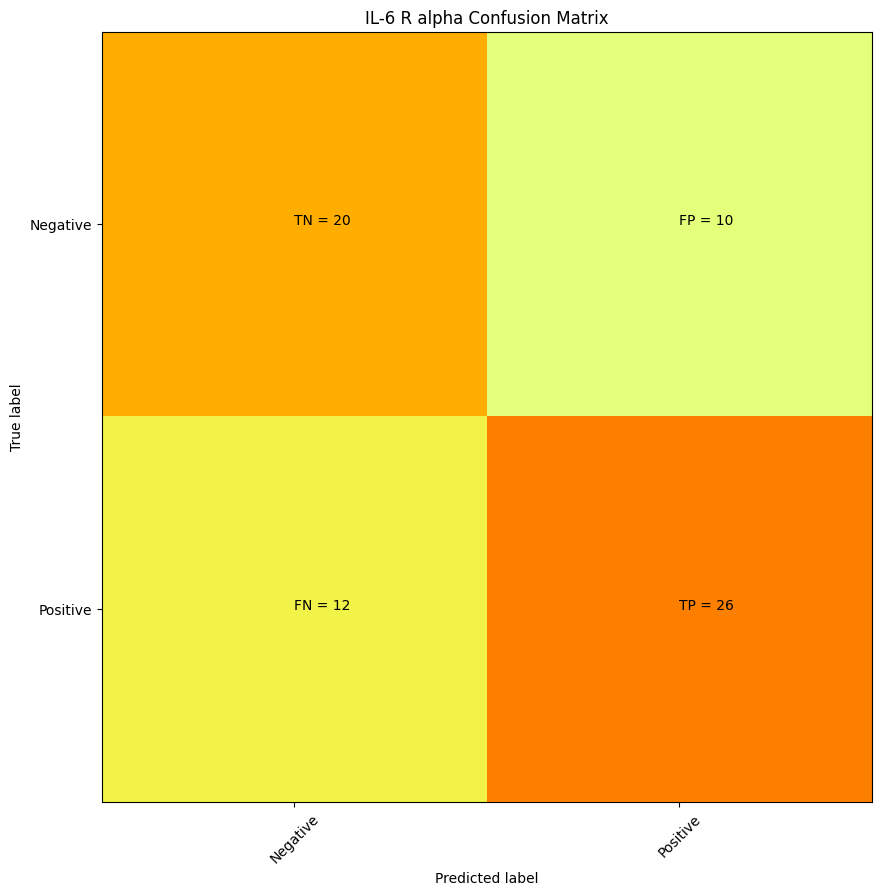

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

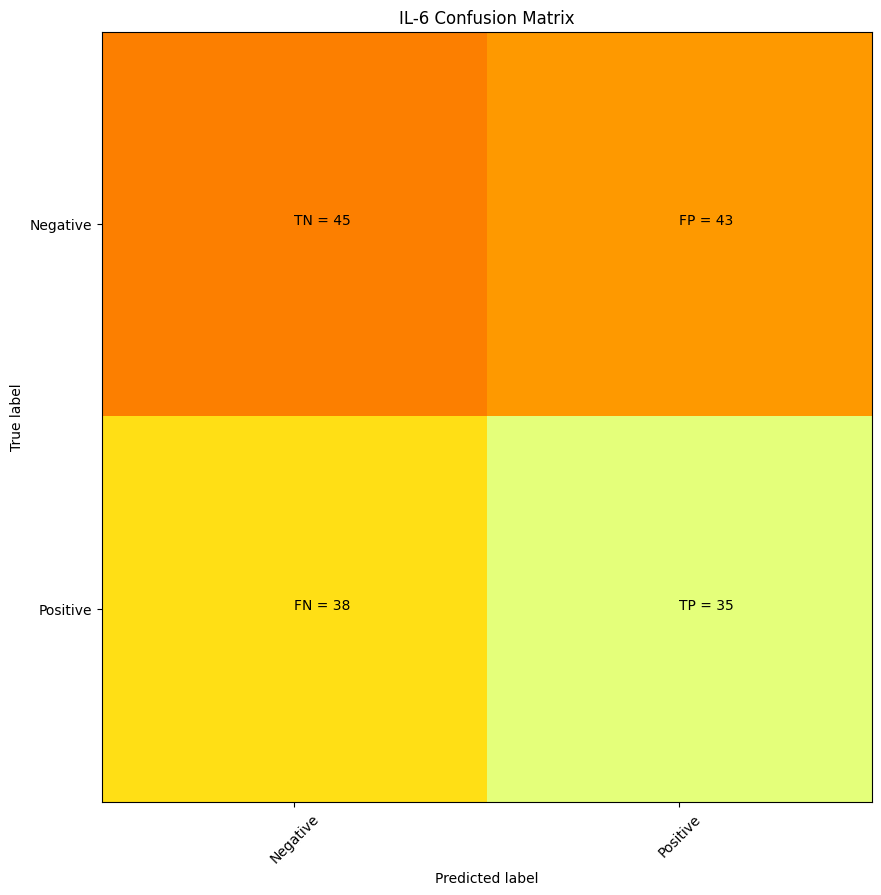

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

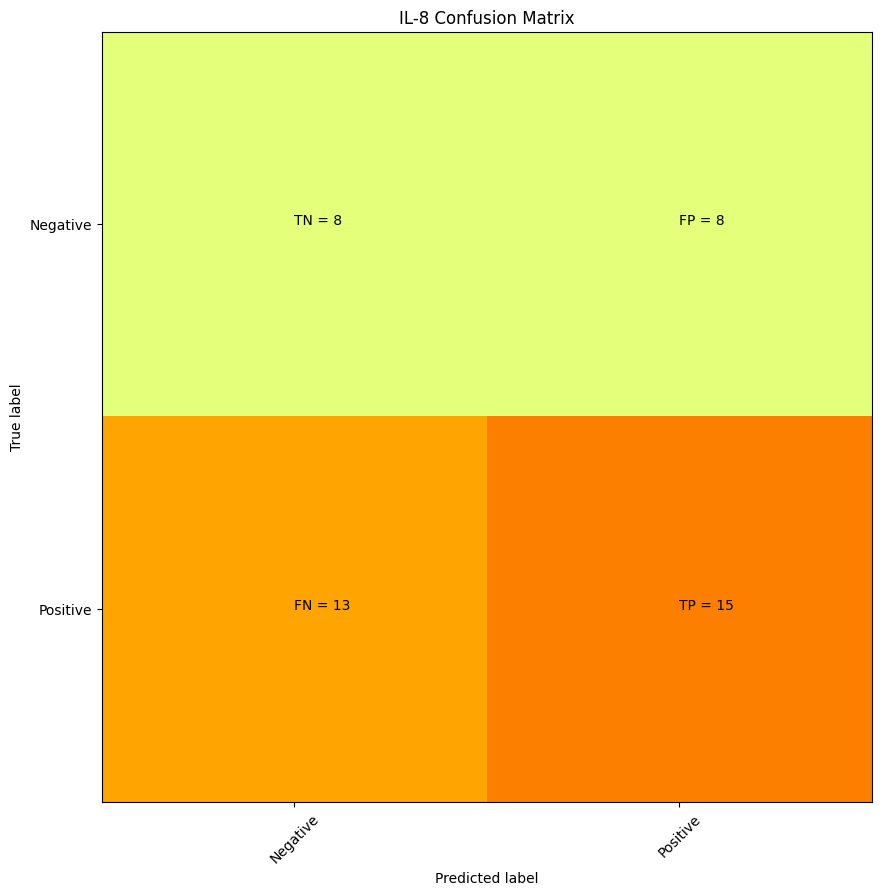

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

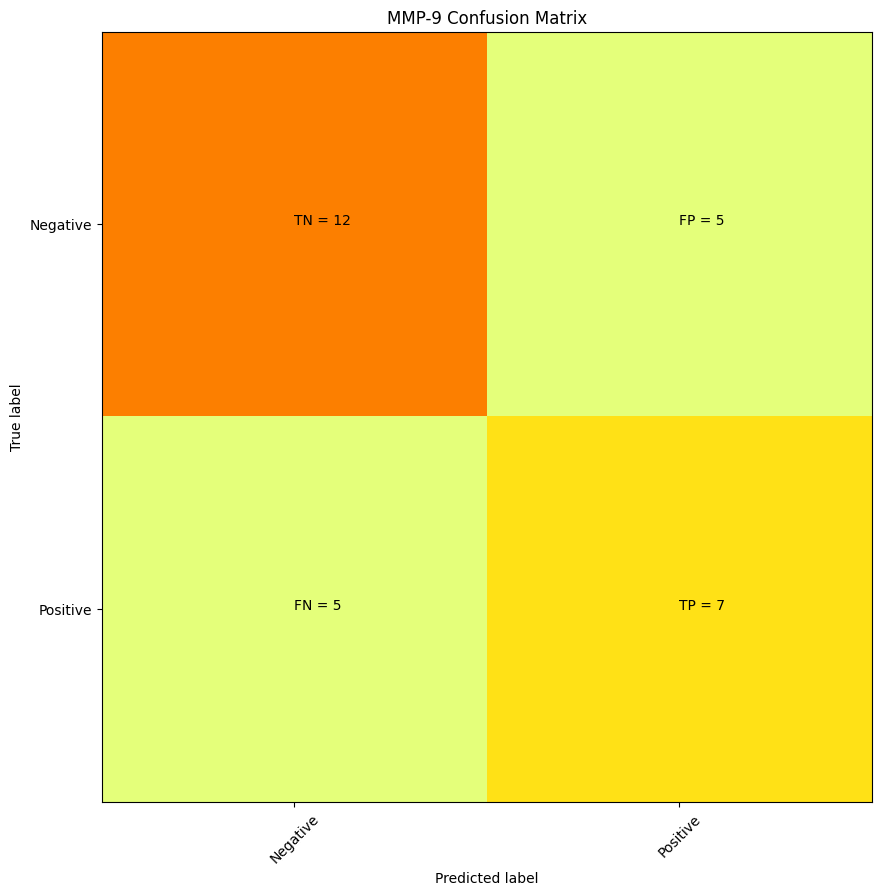

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.5833333333333334 recall = 0.5833333333333334


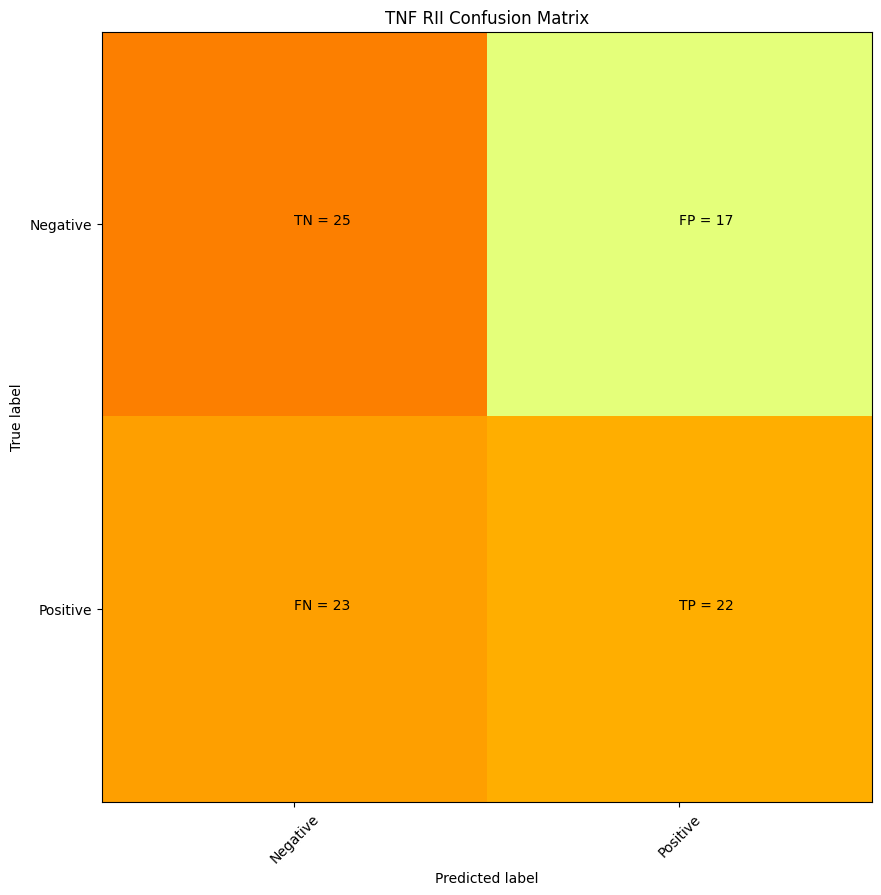

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [63]:
summarizing = []
summarizer_treepicks = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in treepicks_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_treepicks = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_treepicks['Precision'] = summarizer_treepicks['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [64]:
summarizer_treepicks

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.761905,0.666667,434,47
1,CCL1,0.607143,0.772727,494,46
2,CCL19,0.833333,0.714286,244,12
3,CCL2,0.595745,0.595745,486,95
4,CCL20,0.714286,0.625000,470,30
5,CCL22,0.500000,0.500000,564,125
6,CCL4,0.434783,0.526316,499,46
7,CCL5,0.643836,0.691176,533,133
8,CD14,0.677419,0.677419,444,61
9,CRP,0.560000,0.297872,527,86


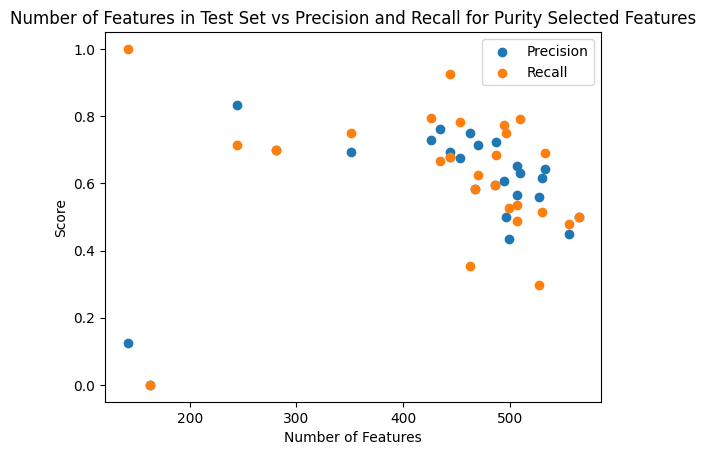

In [65]:
#Basically no trend
plt.scatter(y=summarizer_treepicks["Precision"], x = summarizer_treepicks["Number of Features"])
plt.scatter(y=summarizer_treepicks["Recall"], x = summarizer_treepicks["Number of Features"])
plt.xlabel("Number of Features")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Features in Test Set vs Precision and Recall for Purity Selected Features")
plt.show()

## Performance with sequentially selected features

In [70]:
# seqtree

seqtree_listing = []

for df in holdingdfs:
    try:
        name = df.columns.values[0]
        print(name)
        sub = seqtree[seqtree["Cytokine"]==name]
        print("got sub")
        features = sub.iloc[:, -1:].values
        print("selected features")
        listed_features = features[0][0].tolist()
        print(listed_features)
        data = df[df.columns.intersection(listed_features)]
        print("got embeddings")
        finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
        print("got final data")
        seqtree_listing.append(finaldata)
    except:
        continue

seqtree_listing[0]

Activin A
got sub
selected features
['Output_0', 'Output_1', 'Output_2', 'Output_5', 'Output_6', 'Output_72', 'Output_85', 'Output_118', 'Output_225', 'Output_421']
got embeddings
got final data
Amphiregulin
got sub
selected features
CCL1
got sub
selected features
['Output_0', 'Output_2', 'Output_5', 'Output_11', 'Output_102', 'Output_105', 'Output_354', 'Output_633', 'Output_917', 'Output_1105']
got embeddings
got final data
CCL19
got sub
selected features
['Output_0', 'Output_1', 'Output_2', 'Output_5', 'Output_6', 'Output_7', 'Output_8', 'Output_903', 'Output_911', 'Output_1058']
got embeddings
got final data
CCL2
got sub
selected features
['Output_2', 'Output_5', 'Output_11', 'Output_32', 'Output_161', 'Output_256', 'Output_272', 'Output_619', 'Output_797', 'Output_1237']
got embeddings
got final data
CCL20
got sub
selected features
['Output_0', 'Output_2', 'Output_5', 'Output_7', 'Output_9', 'Output_10', 'Output_11', 'Output_410', 'Output_933', 'Output_1279']
got embeddings
got fi

,Activin A,Output_0,Output_1,Output_2,Output_5,Output_6,Output_72,Output_85,Output_118,Output_225,Output_421
well,,,,,,,,,,,
A09,1,-0.007085,0.437160,-0.028690,-0.094637,-0.046595,1.001329,0.579039,2.909582,2.368404,1.359763
C03,1,-0.000901,0.385524,-0.034746,-0.092844,-0.031862,1.245012,0.537088,2.605289,2.445477,1.507751
C09,1,0.004371,0.395201,-0.023539,-0.095040,0.000569,1.315572,0.522813,2.293271,2.662639,1.522356
C17,1,0.021902,0.450791,-0.034689,-0.093931,-0.000748,1.266594,0.473527,2.166797,2.747698,1.586132
F03,1,0.005858,0.406566,-0.032818,-0.087311,-0.026551,1.226120,0.529992,2.531449,2.525553,1.418031
F04,1,0.022840,0.453482,-0.032567,-0.096229,-0.036879,1.261280,0.579123,2.561344,2.358246,1.283270
F05,1,-0.006333,0.385287,-0.036938,-0.096926,-0.033877,1.102625,0.644113,2.505181,2.540068,1.391524
F08,1,-0.002294,0.387870,-0.031914,-0.090722,-0.044921,1.279302,0.566288,2.645512,2.374652,1.288971
F09,1,-0.005775,0.372382,-0.034480,-0.090843,-0.048558,1.288780,0.544783,2.819953,2.334576,1.250085


In [67]:
# seqtree_listing = []

# df = holdingdfs[0]

# name = df.columns.values[0]
# print(name)
# sub = seqtree[seqtree["Cytokine"]==name]
# print("got sub")
# features = sub.iloc[:, -1:].values
# print(features)
# listed_features = features[0][0].tolist()
# print(listed_features)
# data = df[df.columns.intersection(listed_features)]
# print("got embeddings")
# finaldata = pd.concat([df.iloc[:,:1], data], axis=1)
# print("got final data")
# seqtree_listing.append(finaldata)


# seqtree_listing[0]

Activin A
got sub
[[array(['Output_0', 'Output_1', 'Output_2', 'Output_5', 'Output_6',
         'Output_72', 'Output_85', 'Output_118', 'Output_225', 'Output_421'],
        dtype=object)                                                        ]]
['Output_0', 'Output_1', 'Output_2', 'Output_5', 'Output_6', 'Output_72', 'Output_85', 'Output_118', 'Output_225', 'Output_421']
got embeddings
got final data


,Activin A,Output_0,Output_1,Output_2,Output_5,Output_6,Output_72,Output_85,Output_118,Output_225,Output_421
well,,,,,,,,,,,
A09,1,-0.007085,0.437160,-0.028690,-0.094637,-0.046595,1.001329,0.579039,2.909582,2.368404,1.359763
C03,1,-0.000901,0.385524,-0.034746,-0.092844,-0.031862,1.245012,0.537088,2.605289,2.445477,1.507751
C09,1,0.004371,0.395201,-0.023539,-0.095040,0.000569,1.315572,0.522813,2.293271,2.662639,1.522356
C17,1,0.021902,0.450791,-0.034689,-0.093931,-0.000748,1.266594,0.473527,2.166797,2.747698,1.586132
F03,1,0.005858,0.406566,-0.032818,-0.087311,-0.026551,1.226120,0.529992,2.531449,2.525553,1.418031
F04,1,0.022840,0.453482,-0.032567,-0.096229,-0.036879,1.261280,0.579123,2.561344,2.358246,1.283270
F05,1,-0.006333,0.385287,-0.036938,-0.096926,-0.033877,1.102625,0.644113,2.505181,2.540068,1.391524
F08,1,-0.002294,0.387870,-0.031914,-0.090722,-0.044921,1.279302,0.566288,2.645512,2.374652,1.288971
F09,1,-0.005775,0.372382,-0.034480,-0.090843,-0.048558,1.288780,0.544783,2.819953,2.334576,1.250085


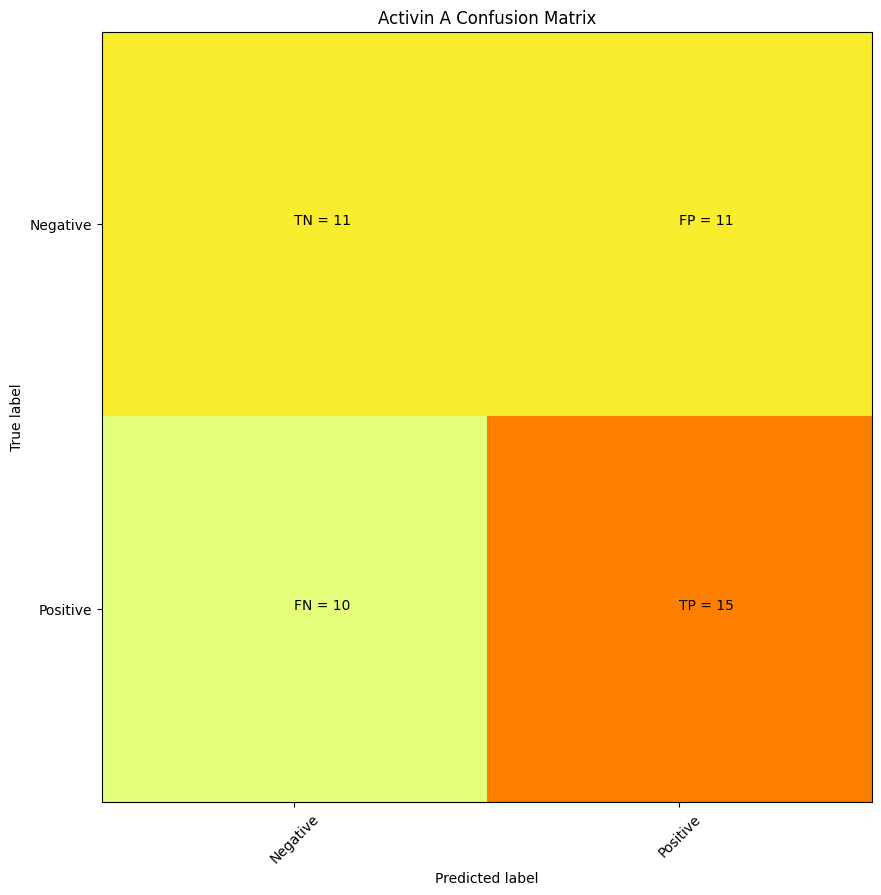

      Activin A
well           
A09           1
C03           1
C09           1
C17           1
F03           1
F04           1
F05           1
F08           1
F09           1
F10           1
F15           1
G08           1
G10           1
G14           1
H03           1
H15           1
H17           1
I02           1
I06           1
I09           1
I10           1
I21           1
J01           1
J04           1
J07           1
J10           1
J14           1
J17           1
J23           1
K02           1
K05           1
K06           1
K08           1
K09           1
K10           1
K15           1
K16           1
K17           1
N03           1
N04           1
N05           1
N09           1
N10           1
N16           1
O09           1
P04           1
P05           1
D05           0
E16           0
J08           0
I07           0
M20           0
D16           0
I01           0
E03           0
F23           0
B01           0
A11           0
F14           0
C04           0
A16     

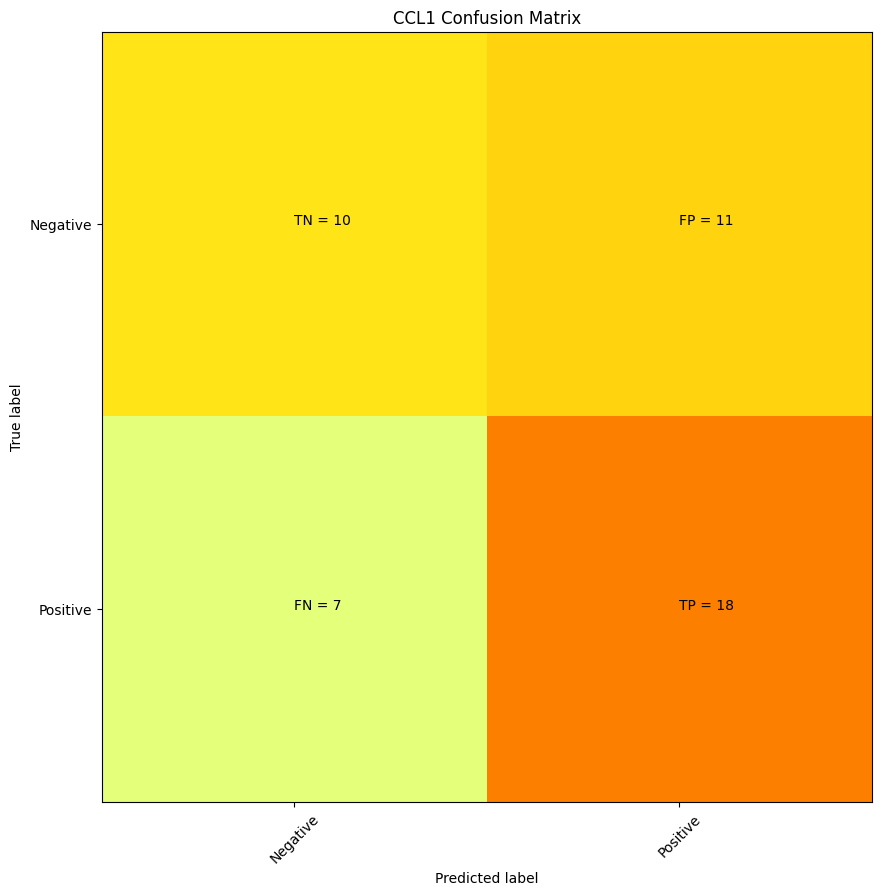

      CCL1
well      
B11      1
B13      1
C03      1
D12      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F03      1
F04      1
F07      1
F19      1
F23      1
H13      1
I02      1
I06      1
I10      1
I18      1
J01      1
J07      1
J19      1
J23      1
K02      1
K09      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M10      1
M20      1
N03      1
N04      1
N09      1
N10      1
N11      1
N13      1
N15      1
N19      1
P01      1
P23      1
D22      0
A11      0
I13      0
D15      0
M16      0
I09      0
N06      0
G18      0
H01      0
G15      0
M12      0
J17      0
P11      0
J12      0
P14      0
M04      0
D16      0
H21      0
O12      0
D21      0
H02      0
K18      0
M21      0
C17      0
G10      0
H11      0
A13      0
H12      0
D20      0
C16      0
P03      0
E15      0
N02      0
F17      0
D24      0
O15      0
G07      0
G03      0
N08      0
N17      0
F12      0
D06      0
F18      0

/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


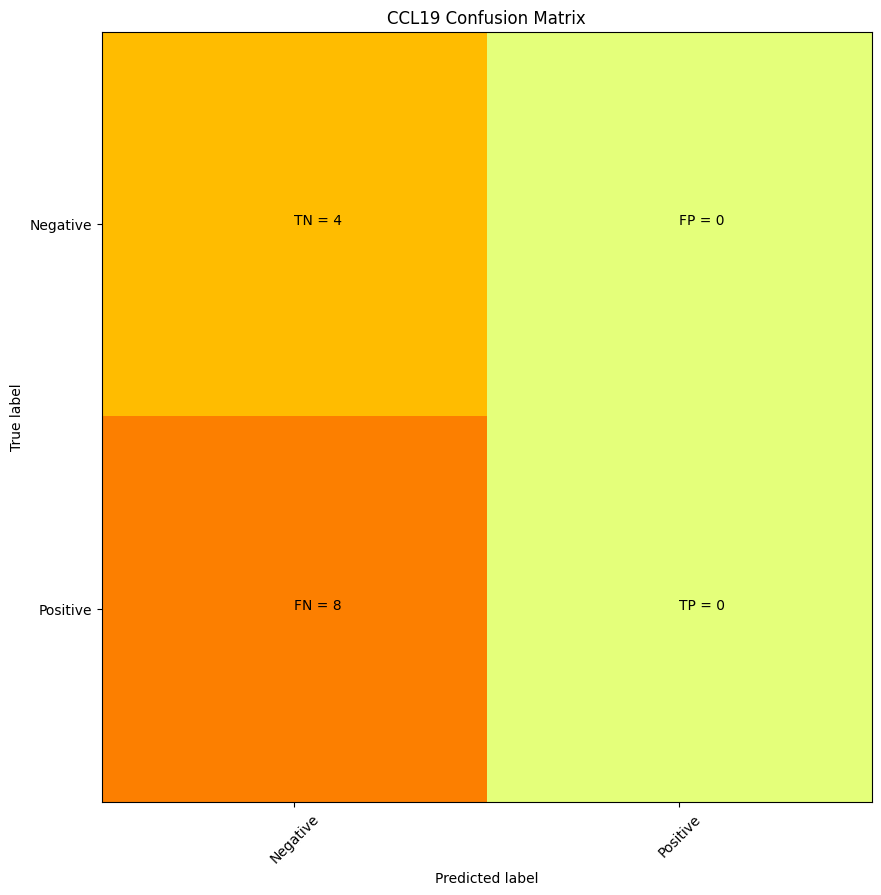

      CCL19
well       
D14       1
K10       1
L24       1
M02       1
M10       1
M16       1
M20       1
N09       1
N10       1
N18       1
N22       1
P10       1
A09       0
E10       0
D23       0
P08       0
A16       0
H10       0
P23       0
O11       0
E03       0
P14       0
A02       0
J02       0 precision = nan recall = 0.0


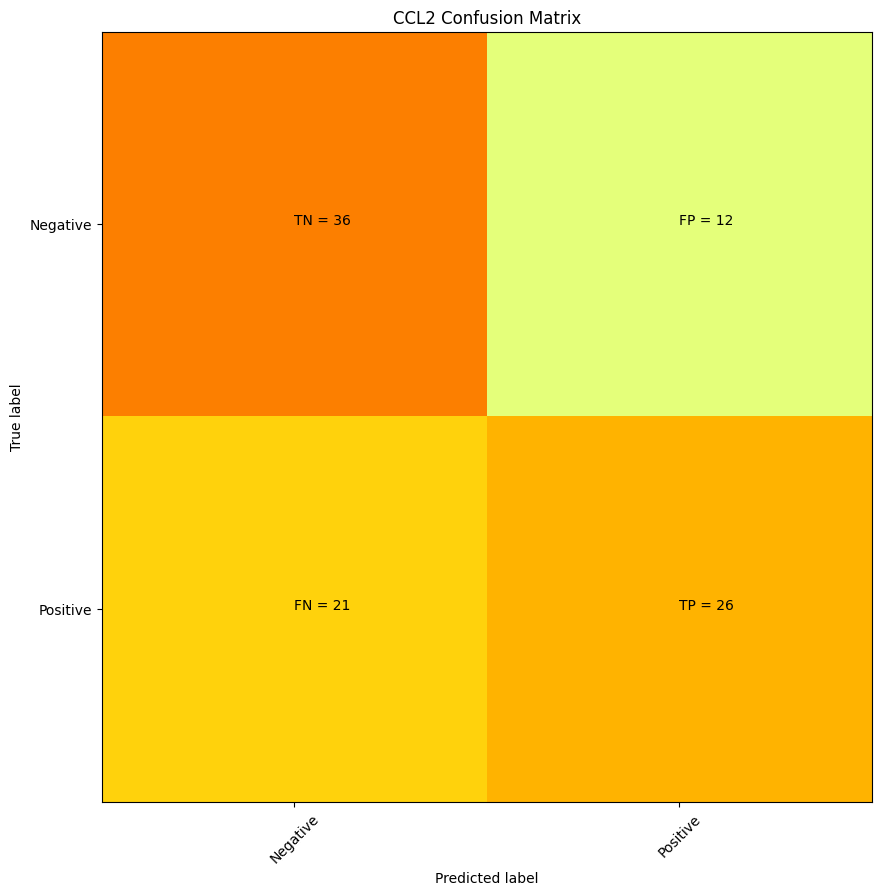

      CCL2
well      
A01      1
A02      1
A06      1
A11      1
A13      1
A18      1
A24      1
B02      1
B11      1
B13      1
C01      1
C03      1
C16      1
C23      1
D14      1
D16      1
E01      1
E07      1
E13      1
E19      1
E23      1
F08      1
F10      1
F19      1
F22      1
F23      1
G02      1
G06      1
G11      1
G13      1
G14      1
G18      1
G19      1
G23      1
G24      1
H13      1
H14      1
H15      1
H16      1
I01      1
I02      1
I08      1
I10      1
I12      1
I14      1
I19      1
I20      1
I23      1
J01      1
J07      1
J10      1
J12      1
J14      1
J16      1
J19      1
J23      1
K02      1
K05      1
K10      1
K13      1
K16      1
L01      1
L07      1
L10      1
L11      1
L13      1
L19      1
L23      1
M10      1
M14      1
M16      1
M20      1
N09      1
N10      1
N13      1
N17      1
N20      1
N21      1
N22      1
O01      1
O07      1
O09      1
O10      1
O12      1
O19      1
O20      1
O21      1
O22      1
O23      1

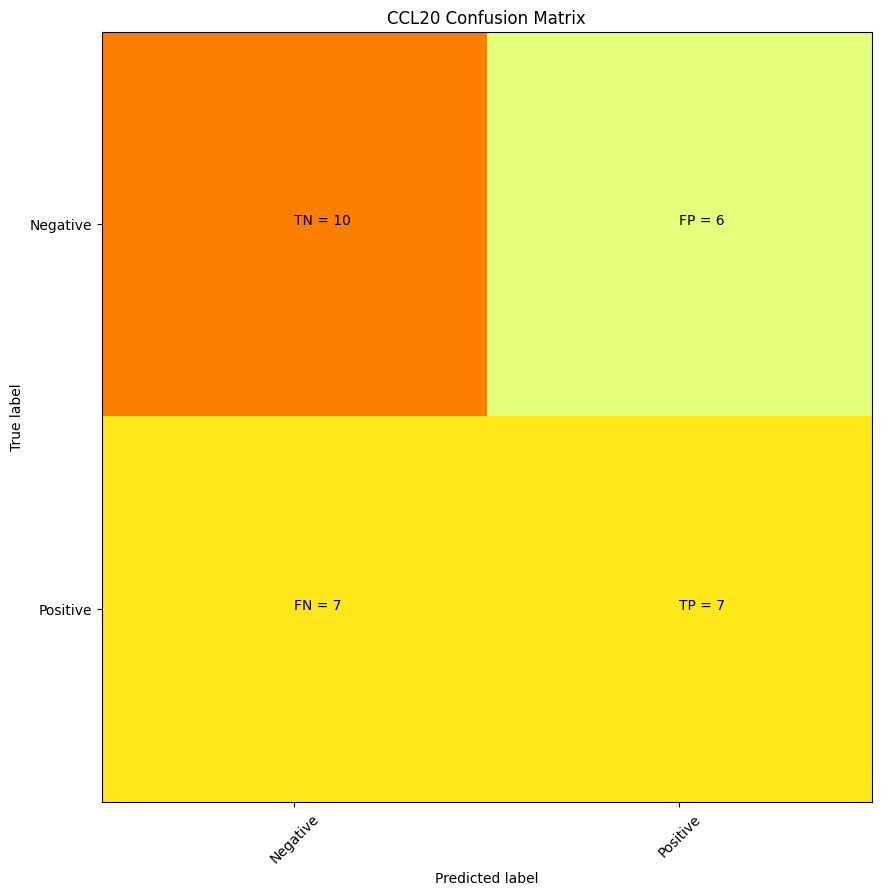

      CCL20
well       
A02       1
A03       1
A08       1
A09       1
A12       1
A20       1
A21       1
A24       1
D24       1
E01       1
E12       1
F03       1
I10       1
J10       1
K24       1
L02       1
L06       1
L10       1
L24       1
M20       1
M24       1
N09       1
N11       1
N21       1
O05       1
P04       1
P05       1
P10       1
P16       1
P17       1
C09       0
J08       0
I09       0
D09       0
L08       0
O17       0
B05       0
I02       0
E14       0
F12       0
A04       0
A14       0
E17       0
O03       0
J22       0
K12       0
G12       0
F17       0
G18       0
L05       0
B03       0
I21       0
P21       0
C05       0
I05       0
E15       0
I06       0
O20       0
C03       0
M12       0 precision = 0.5384615384615384 recall = 0.5


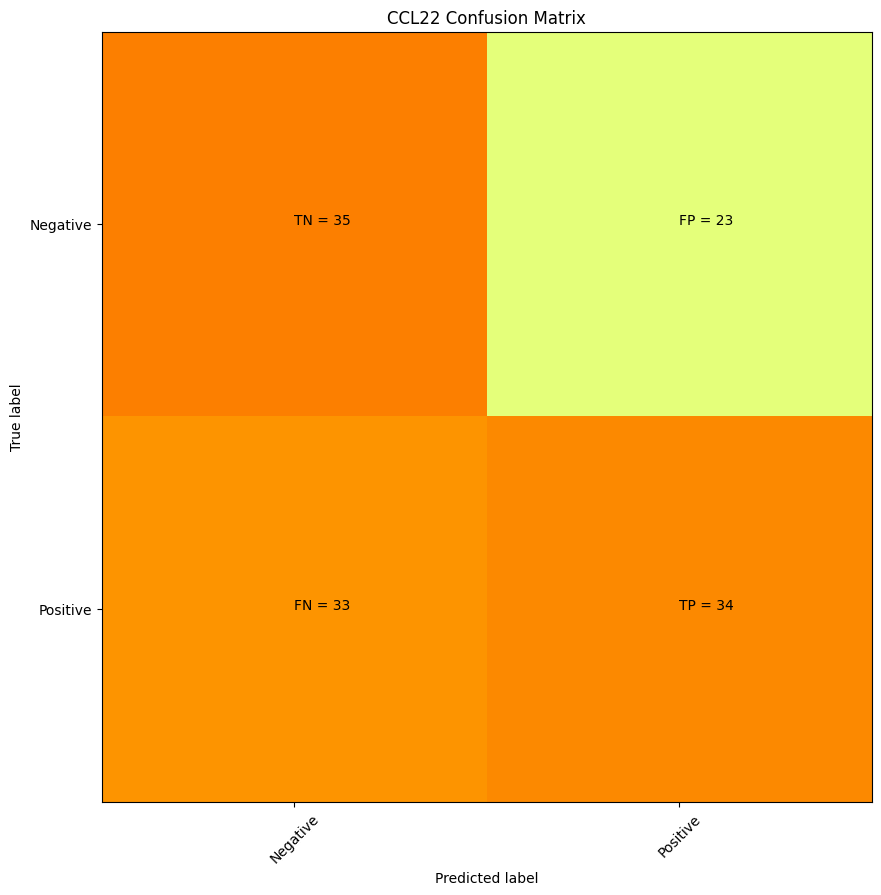

      CCL22
well       
A02       1
A03       1
A09       1
A10       1
A12       1
A15       1
A18       1
A20       1
A21       1
A24       1
B03       1
B08       1
B11       1
B13       1
B16       1
C03       1
C04       1
C08       1
C09       1
C12       1
C15       1
D01       1
D02       1
D05       1
D08       1
D09       1
D11       1
D20       1
D24       1
E01       1
E07       1
E08       1
E09       1
E11       1
E12       1
E13       1
E15       1
E19       1
E23       1
F01       1
F03       1
F04       1
F07       1
F11       1
F14       1
F15       1
F19       1
F20       1
F23       1
F24       1
G03       1
G09       1
G15       1
H03       1
H08       1
H10       1
H11       1
H13       1
H15       1
H16       1
H20       1
I05       1
I08       1
I10       1
J01       1
J07       1
J10       1
J16       1
J17       1
J19       1
J23       1
K05       1
K09       1
K10       1
K12       1
K16       1
K17       1
K21       1
L01       1
L04       1
L05       1
L06 

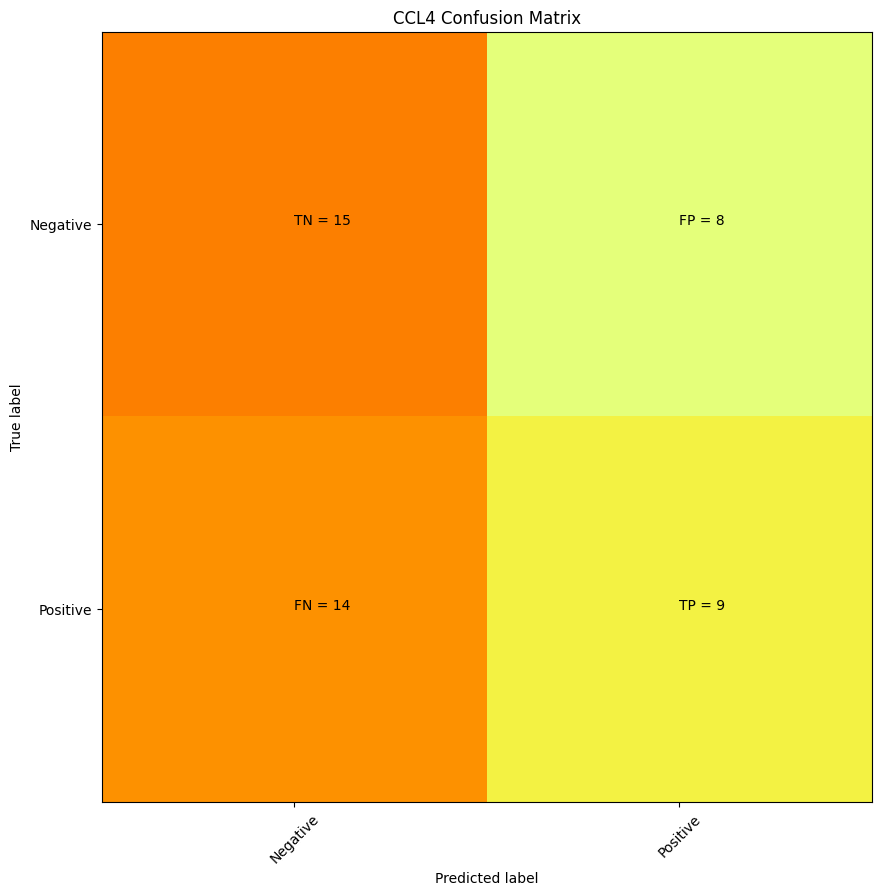

      CCL4
well      
B11      1
B13      1
C13      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F11      1
F13      1
F19      1
F23      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J10      1
J19      1
J23      1
K10      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
N01      1
N07      1
N11      1
N13      1
N19      1
N23      1
O09      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
P21      0
C04      0
C19      0
J21      0
H16      0
L24      0
K02      0
K03      0
J03      0
F21      0
I08      0
K21      0
N24      0
C12      0
D08      0
C21      0
B03      0
C06      0
P22      0
N03      0
J08      0
O14      0
F16      0
D01      0
N10      0
G08      0
N12      0
A18      0
M06      0
G15      0
G20      0
G06      0
E15      0
K06      0
A12      0
A19      0
A05      0
A01      0
J16      0
G11      0
N18      0
G05      0
B17      0

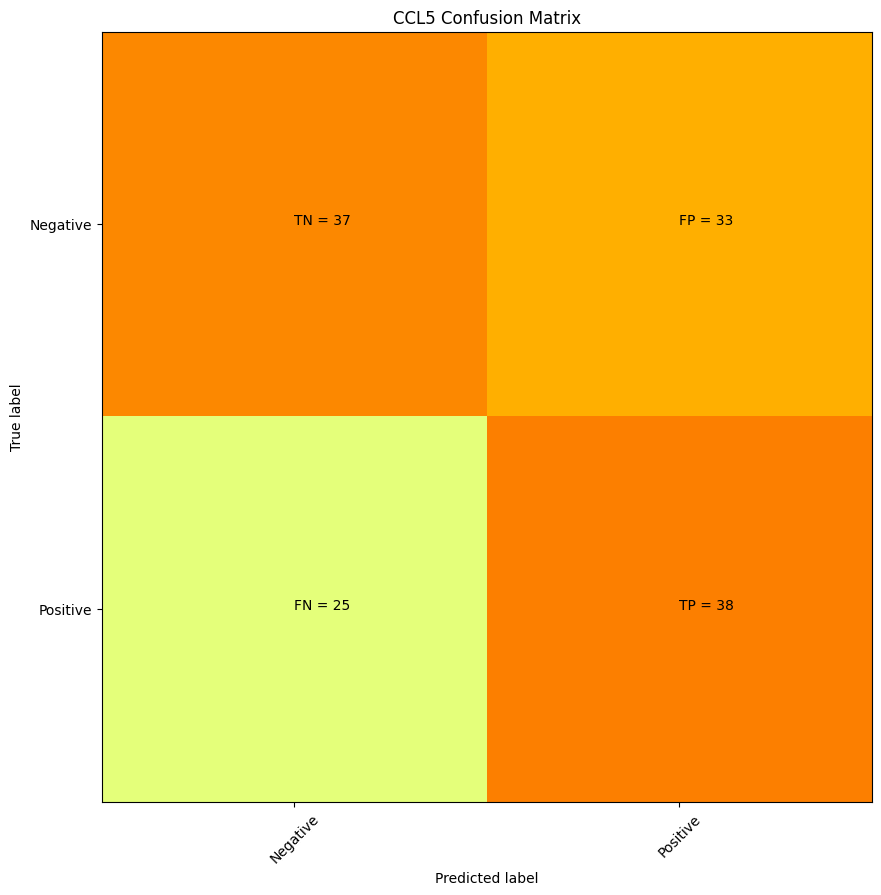

      CCL5
well      
A01      1
A02      1
A03      1
A04      1
A05      1
A06      1
A07      1
A08      1
A09      1
A11      1
A12      1
A13      1
A14      1
A18      1
A19      1
A21      1
A23      1
A24      1
B01      1
B02      1
B03      1
B04      1
B07      1
B08      1
B09      1
B11      1
B12      1
B13      1
B14      1
B19      1
B23      1
B24      1
C01      1
C11      1
C13      1
C14      1
C23      1
D01      1
D02      1
D14      1
D24      1
E01      1
E03      1
E06      1
E07      1
E11      1
E13      1
E19      1
E23      1
E24      1
F01      1
F02      1
F04      1
F07      1
F11      1
F13      1
F19      1
F23      1
G01      1
G07      1
G19      1
G23      1
H01      1
H07      1
H08      1
H11      1
H13      1
H19      1
H23      1
I01      1
I02      1
I06      1
I18      1
I19      1
I24      1
J01      1
J02      1
J03      1
J07      1
J08      1
J09      1
J10      1
J11      1
J13      1
J14      1
J16      1
J19      1
J23      1
K01      1

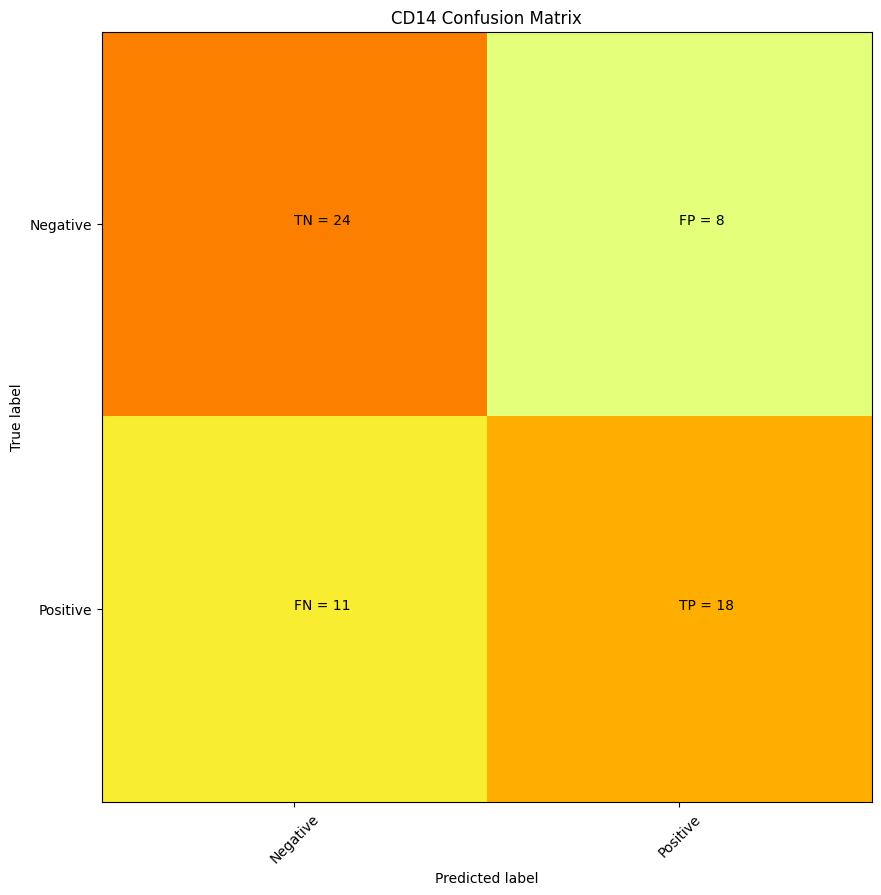

      CD14
well      
A01      1
A06      1
A13      1
A19      1
A20      1
A21      1
A23      1
A24      1
B01      1
B14      1
B23      1
C14      1
D01      1
D04      1
D11      1
D14      1
D16      1
E08      1
E16      1
F13      1
F16      1
G09      1
G13      1
H06      1
H14      1
H15      1
H16      1
I13      1
J06      1
J11      1
J13      1
K11      1
K13      1
K16      1
K20      1
L11      1
L13      1
M11      1
M13      1
M14      1
M16      1
M19      1
M20      1
M21      1
M23      1
N03      1
N10      1
N13      1
N16      1
O06      1
O13      1
O20      1
O22      1
O24      1
P01      1
P04      1
P10      1
P12      1
P14      1
P16      1
P23      1
F19      0
M01      0
J09      0
K21      0
F18      0
N19      0
L05      0
L23      0
O01      0
K08      0
G15      0
K02      0
B11      0
A14      0
G14      0
L10      0
E07      0
H07      0
L20      0
B13      0
J19      0
H20      0
B20      0
D19      0
D22      0
G17      0
A15      0
C08      0

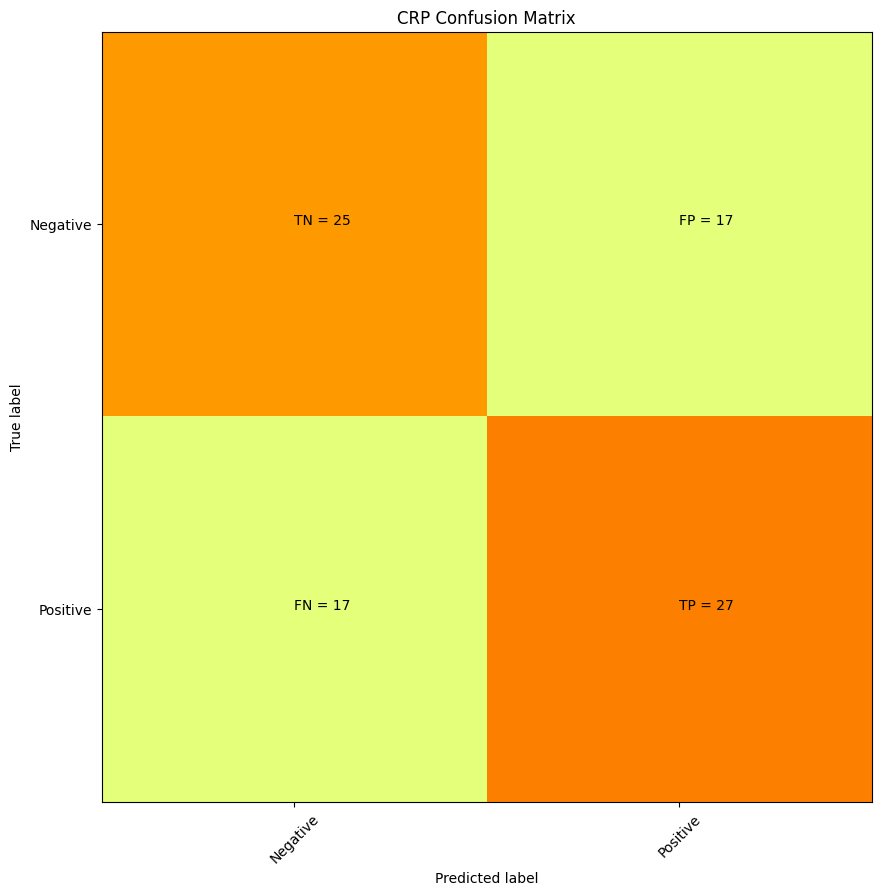

      CRP
well     
A01     1
A02     1
A05     1
A07     1
A13     1
A14     1
A16     1
A21     1
A23     1
B02     1
B04     1
B07     1
B09     1
B10     1
B14     1
B15     1
B23     1
C02     1
C03     1
C04     1
C06     1
C10     1
C13     1
C15     1
C19     1
D04     1
D08     1
D15     1
D17     1
D18     1
E04     1
E09     1
E10     1
E11     1
E12     1
E15     1
E16     1
E19     1
F05     1
F09     1
F14     1
G01     1
G05     1
G08     1
G09     1
G11     1
G13     1
G17     1
G18     1
G21     1
G24     1
H04     1
H06     1
H10     1
H12     1
H13     1
H19     1
I03     1
I05     1
I07     1
I17     1
I19     1
J03     1
J08     1
J13     1
K08     1
K11     1
K12     1
K13     1
K15     1
L06     1
L18     1
M15     1
M19     1
N04     1
N08     1
N20     1
O01     1
O04     1
O07     1
O11     1
O13     1
O19     1
P05     1
P14     1
P15     1
C01     0
I12     0
D13     0
H07     0
M13     0
B20     0
M18     0
C08     0
F21     0
G14     0
J22     0
C14     0


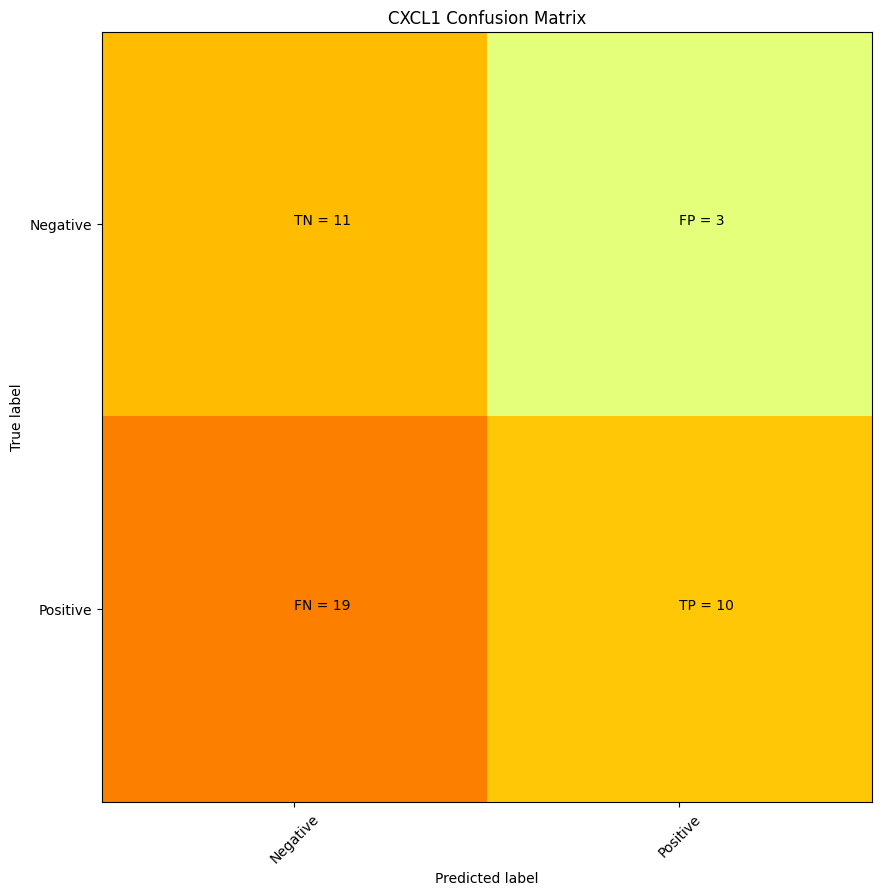

      CXCL1
well       
B11       1
B13       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F07       1
F19       1
F23       1
G01       1
H01       1
H11       1
H13       1
H19       1
H23       1
I10       1
I19       1
J01       1
J07       1
J10       1
J19       1
J23       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M17       1
N10       1
N11       1
N13       1
N19       1
P01       1
P07       1
P13       1
P19       1
P23       1
K23       0
D03       0
I09       0
N02       0
C03       0
B16       0
E10       0
F14       0
O16       0
N04       0
I15       0
N17       0
N23       0
G10       0
C11       0
E15       0
C22       0
O23       0
G04       0
O17       0
H12       0
N01       0
B07       0
G02       0
H04       0
B19       0
D09       0
F15       0
D14       0
A15       0
L02       0
P22       0
H16       0
O07       0
K02       0
I21       0
M22       0
K07       0
L12 

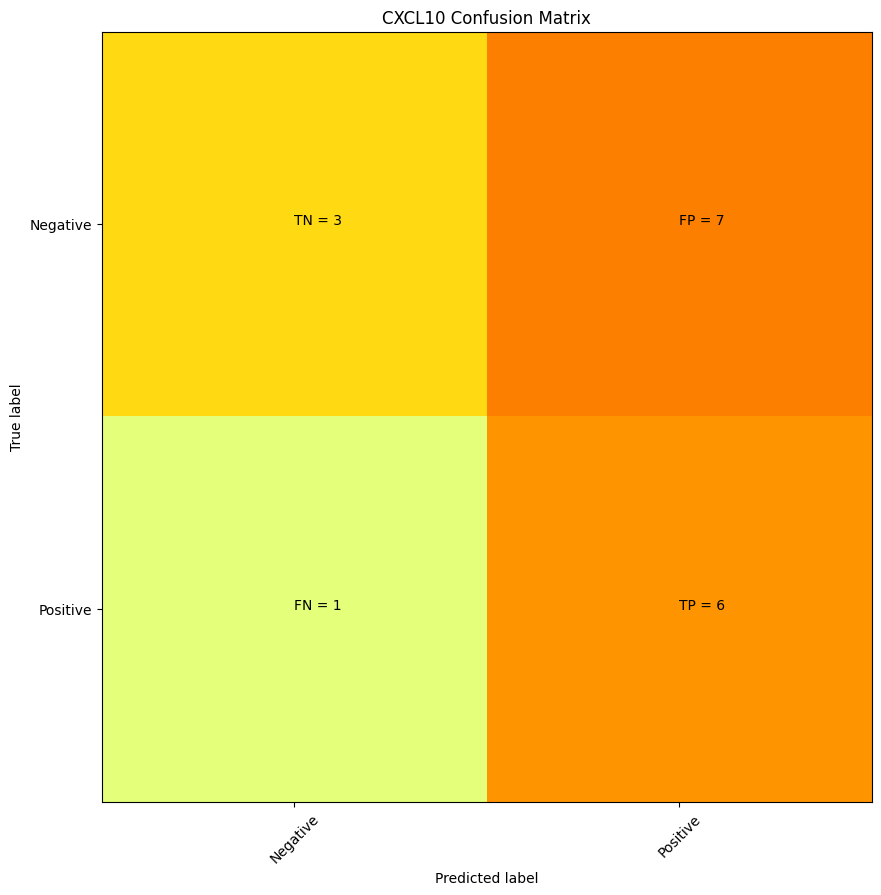

      CXCL10
well        
A01        1
A10        1
D01        1
H02        1
H06        1
I11        1
K01        1
K10        1
M01        1
M10        1
M11        1
N10        1
P01        1
P09        1
P10        1
P11        1
P12        1
C02        0
L03        0
E18        0
C05        0
J04        0
B03        0
A18        0
G13        0
D16        0
B23        0
J10        0
C23        0
F16        0
C11        0
D03        0
B19        0
E09        0 precision = 0.46153846153846156 recall = 0.8571428571428571


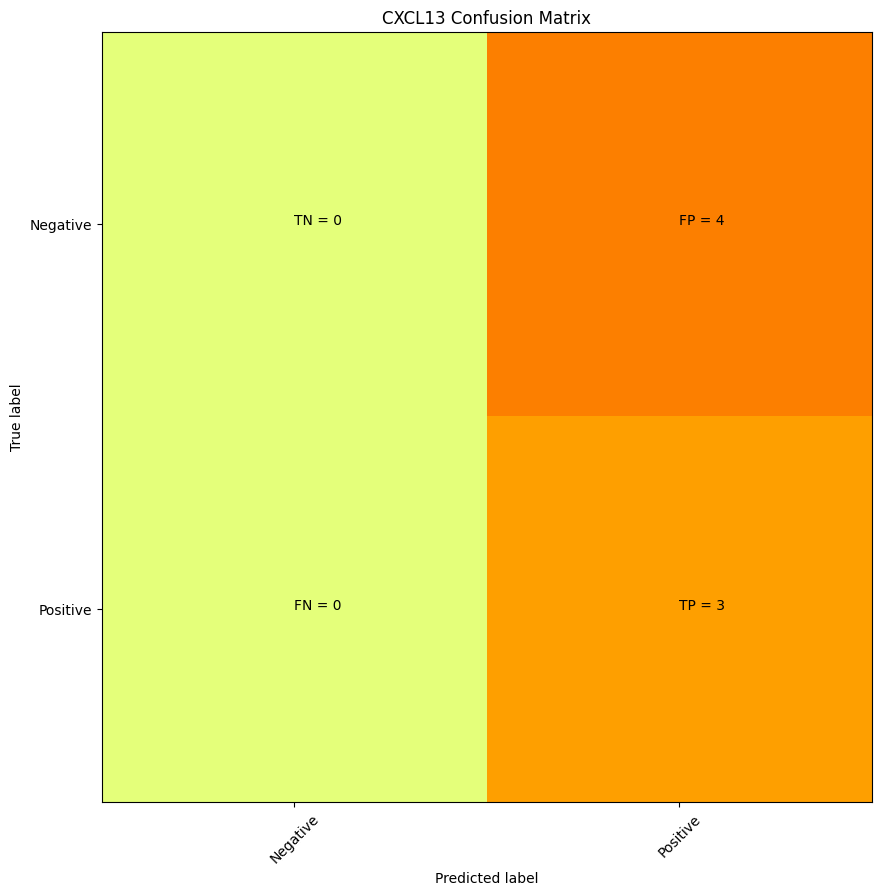

      CXCL13
well        
A11        1
C13        1
H14        1
M16        1
O11        1
O24        1
P19        1
K03        0
G18        0
I14        0
I03        0
A15        0
K23        0
L03        0 precision = 0.42857142857142855 recall = 1.0


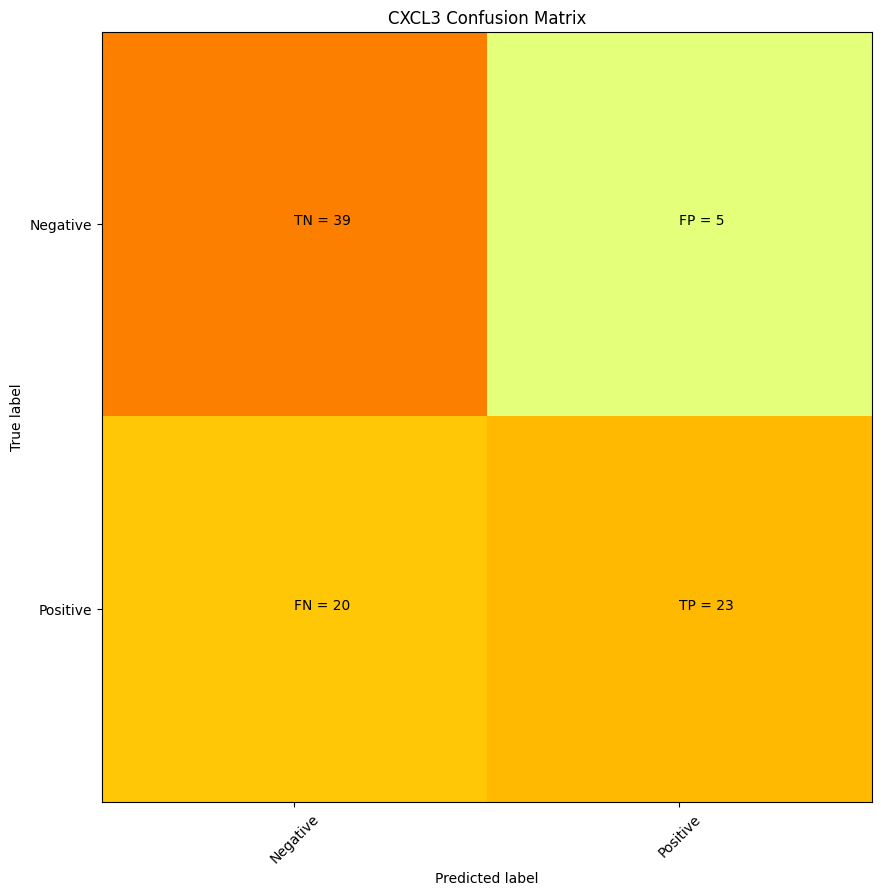

      CXCL3
well       
A07       1
A23       1
B01       1
B07       1
B11       1
B13       1
B17       1
B19       1
B23       1
C07       1
C13       1
C19       1
C23       1
D01       1
D02       1
D18       1
E11       1
E13       1
E17       1
E19       1
F09       1
F11       1
F13       1
G01       1
G06       1
G07       1
G12       1
G17       1
G18       1
G19       1
G21       1
G23       1
H01       1
H03       1
H04       1
H05       1
H06       1
H07       1
H11       1
H13       1
H16       1
H17       1
H18       1
H19       1
H23       1
I01       1
I17       1
I19       1
I23       1
J01       1
J03       1
J07       1
J19       1
J23       1
K01       1
K09       1
K13       1
K15       1
K17       1
K22       1
L05       1
L07       1
L11       1
L13       1
L16       1
L19       1
L23       1
M01       1
M07       1
M12       1
M17       1
M18       1
M23       1
N05       1
N07       1
N19       1
O01       1
O09       1
O12       1
O14       1
P01       1
P07 

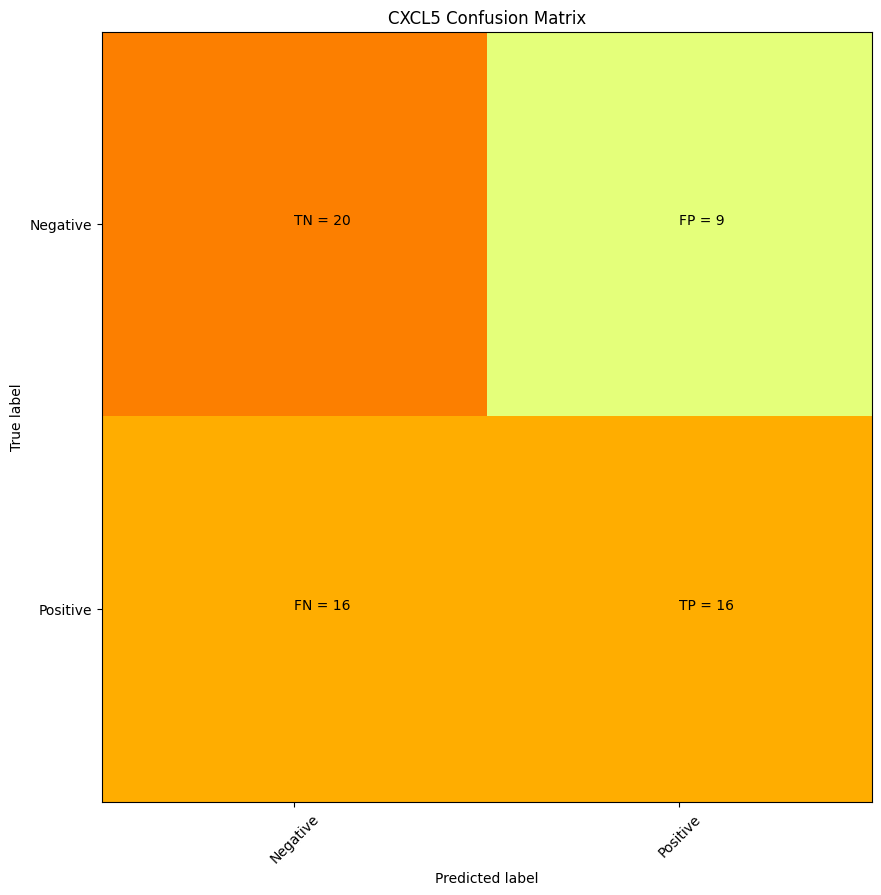

      CXCL5
well       
A13       1
A23       1
B11       1
B13       1
C23       1
D01       1
D02       1
D12       1
D17       1
E01       1
E07       1
E11       1
E13       1
E19       1
E23       1
F01       1
F04       1
F07       1
F15       1
F19       1
F23       1
H11       1
H13       1
I02       1
I06       1
I10       1
I18       1
I19       1
I24       1
J01       1
J07       1
J16       1
J19       1
J23       1
K02       1
K10       1
L01       1
L07       1
L11       1
L13       1
L19       1
L23       1
M01       1
M07       1
M10       1
M15       1
M17       1
M20       1
M23       1
N09       1
N10       1
N11       1
N13       1
N15       1
O09       1
O24       1
P01       1
P07       1
P16       1
P19       1
P23       1
H22       0
D20       0
P09       0
G11       0
H09       0
A02       0
E17       0
M04       0
L02       0
O17       0
J11       0
H04       0
J20       0
N16       0
O12       0
G15       0
K14       0
K24       0
N05       0
P21       0
N19 

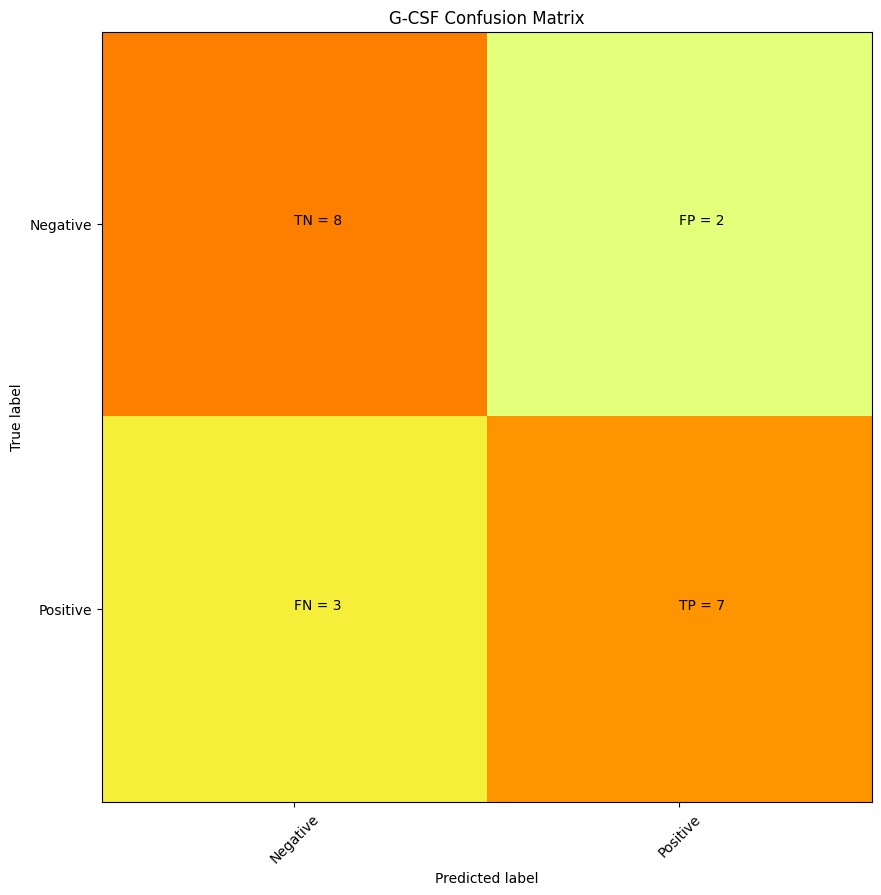

      G-CSF
well       
E12       1
F10       1
G02       1
G06       1
G10       1
I10       1
I14       1
J10       1
K10       1
L02       1
L06       1
L10       1
M10       1
N09       1
N10       1
N11       1
N17       1
O10       1
O12       1
P10       1
F12       0
A10       0
F09       0
C21       0
A01       0
O06       0
L04       0
G05       0
K20       0
M06       0
P23       0
L19       0
N12       0
G11       0
K11       0
I15       0
O16       0
K09       0
G16       0
K18       0 precision = 0.7777777777777778 recall = 0.7


/var/folders/k1/wc_llb5n4254050g8phxtwnw0000gn/T/ipykernel_18271/3358743061.py:5: RuntimeWarning: invalid value encountered in long_scalars
  precision = (cm[1][1])/(cm[1][1] + cm[0][1])  #true pos/true pos + false pos


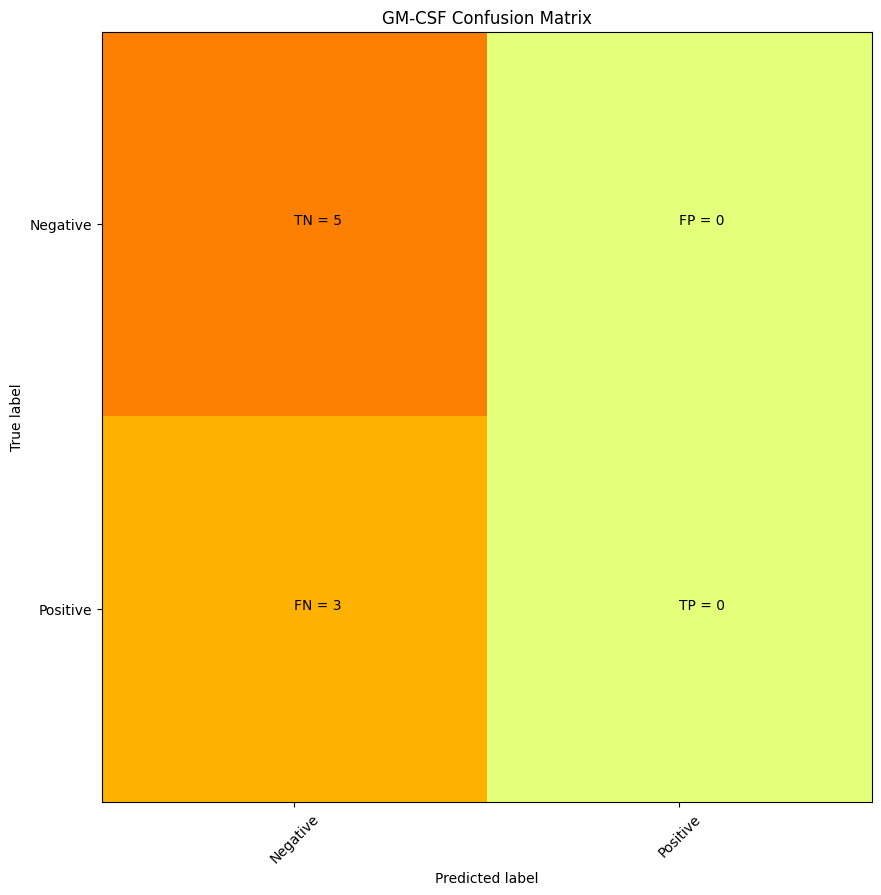

      GM-CSF
well        
E01        1
E12        1
G02        1
G06        1
G18        1
G24        1
O12        1
O14        1
M04        0
K03        0
O07        0
N02        0
H13        0
N20        0
C17        0
J09        0 precision = nan recall = 0.0


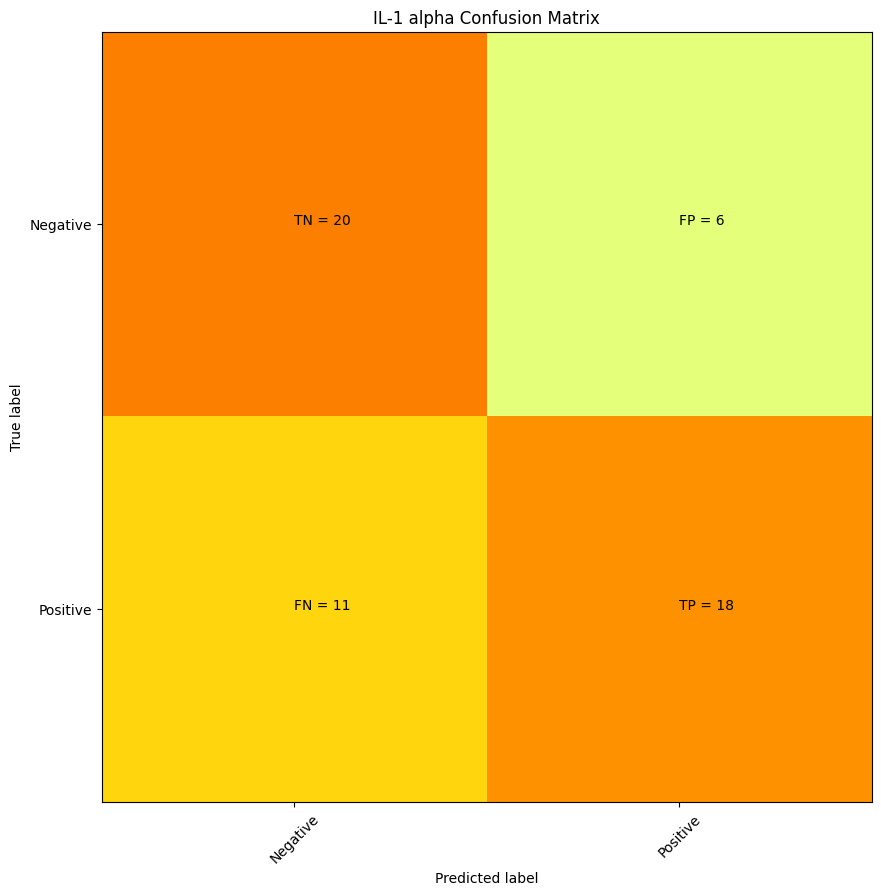

      IL-1 alpha
well            
B02            1
B08            1
B09            1
B10            1
B11            1
E01            1
E02            1
E06            1
E07            1
E11            1
E12            1
E13            1
E14            1
E19            1
E23            1
F01            1
F10            1
F12            1
F14            1
G02            1
G03            1
G04            1
G05            1
G06            1
G16            1
H10            1
I14            1
J08            1
J09            1
J10            1
K10            1
L01            1
L02            1
L06            1
L10            1
L11            1
L12            1
L13            1
L14            1
L18            1
L19            1
L23            1
L24            1
M10            1
N02            1
N06            1
N09            1
N10            1
N11            1
N16            1
O04            1
O14            1
O16            1
P09            1
P10            1
N01            0
D11           

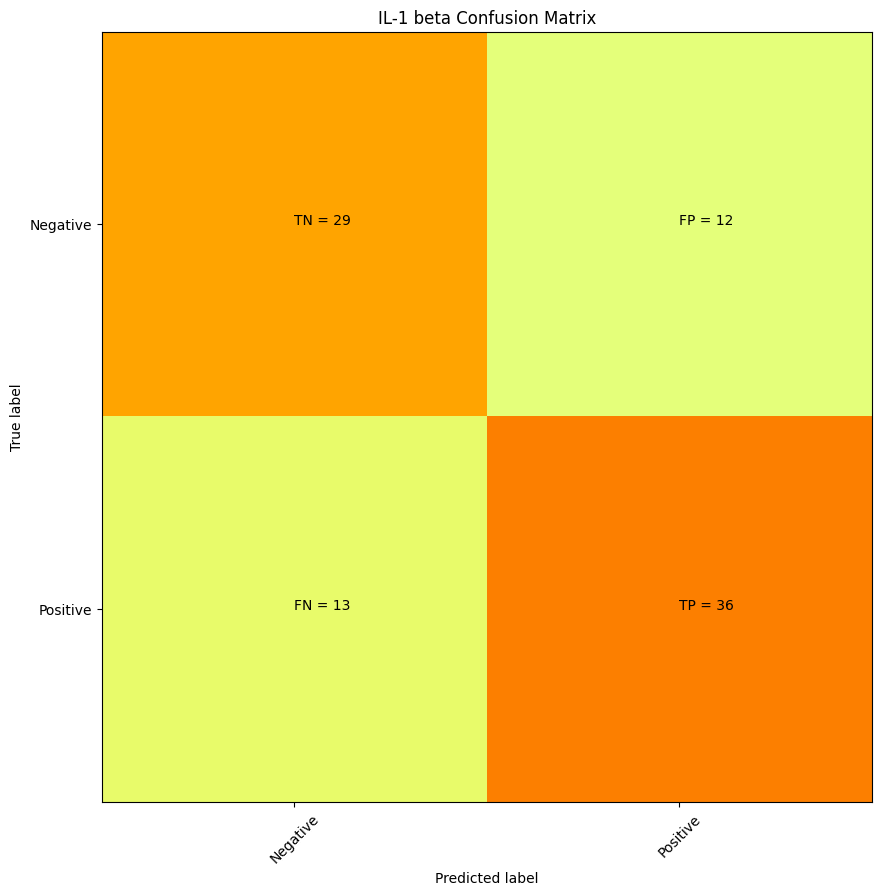

      IL-1 beta
well           
A03           1
A04           1
A05           1
B03           1
B08           1
B09           1
B10           1
B11           1
B13           1
C02           1
C06           1
E01           1
E02           1
E03           1
E04           1
E05           1
E06           1
E07           1
E09           1
E11           1
E12           1
E13           1
E14           1
E19           1
E23           1
F01           1
F02           1
F06           1
F07           1
F10           1
F12           1
F14           1
F19           1
F23           1
G02           1
G03           1
G04           1
G05           1
G06           1
G08           1
G10           1
G16           1
H08           1
H09           1
H10           1
I03           1
I04           1
I05           1
I10           1
J05           1
J08           1
J09           1
J10           1
J19           1
J23           1
K08           1
K10           1
K12           1
L01           1
L02           1
L03     

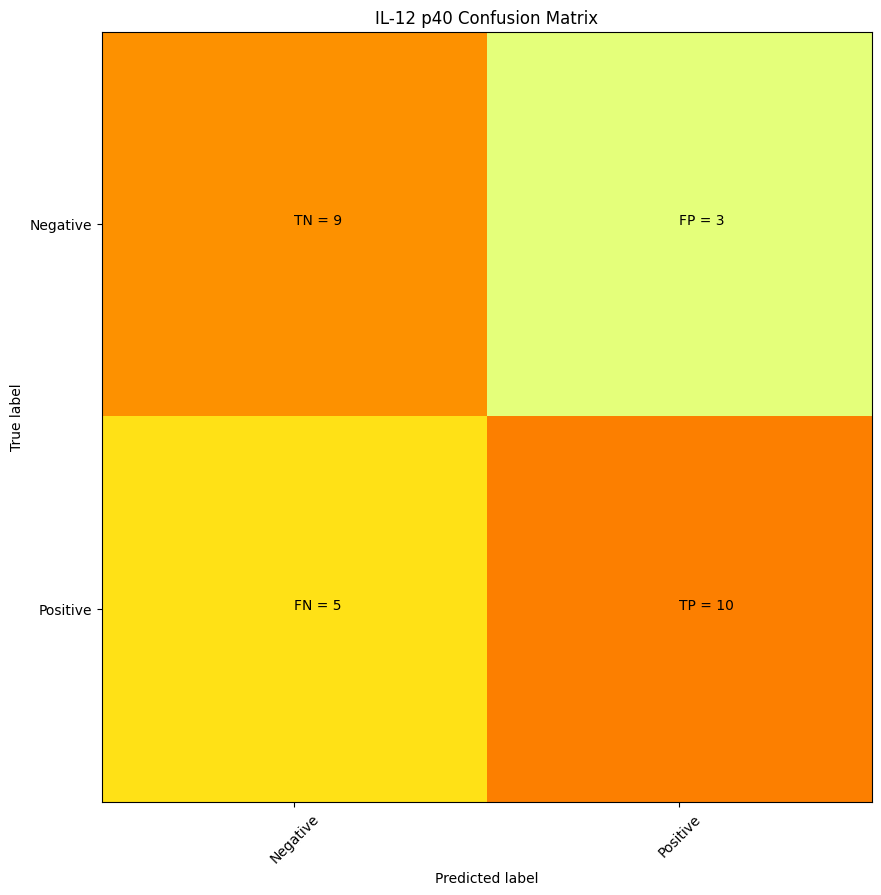

      IL-12 p40
well           
B08           1
B20           1
D14           1
D16           1
E12           1
E13           1
E14           1
F07           1
F12           1
G03           1
I10           1
J10           1
K10           1
L02           1
L06           1
L11           1
L13           1
L14           1
L18           1
M10           1
M14           1
M20           1
N11           1
N22           1
O04           1
O05           1
O16           1
B18           0
A07           0
H02           0
B14           0
L04           0
K05           0
G09           0
N19           0
I09           0
C24           0
G12           0
J14           0
D21           0
D12           0
J19           0
B02           0
C11           0
D08           0
P14           0
E08           0
I14           0
I11           0
H03           0
H05           0
H22           0
P03           0
A15           0 precision = 0.7692307692307693 recall = 0.6666666666666666


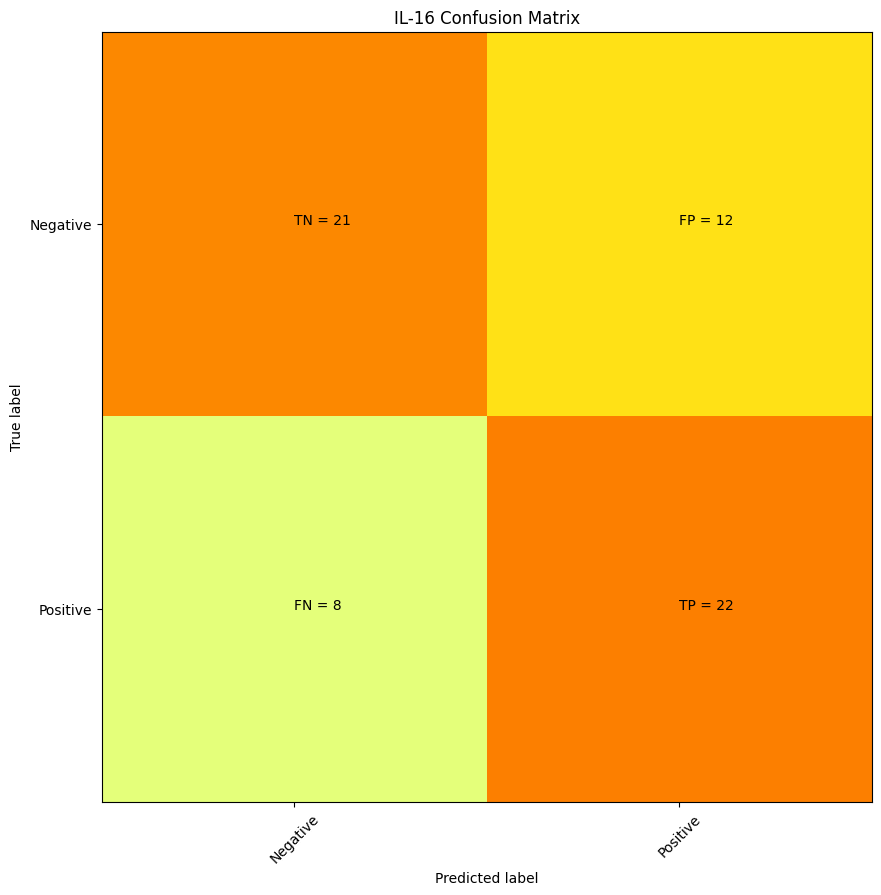

      IL-16
well       
A01       1
A12       1
A14       1
A19       1
B01       1
B07       1
B12       1
B13       1
B14       1
B19       1
B23       1
C10       1
C23       1
F01       1
F04       1
F05       1
F17       1
G01       1
H01       1
H05       1
H07       1
H12       1
I02       1
I11       1
I13       1
I18       1
I24       1
J01       1
J02       1
J03       1
J06       1
J11       1
J13       1
J15       1
J18       1
J23       1
J24       1
K06       1
K08       1
K11       1
K13       1
K18       1
K20       1
K24       1
L08       1
L24       1
N02       1
N03       1
N04       1
N06       1
N08       1
N11       1
N15       1
N16       1
N24       1
O02       1
P02       1
P03       1
P04       1
P11       1
P13       1
P18       1
P24       1
C19       0
J10       0
H14       0
D20       0
O15       0
E01       0
E17       0
B21       0
L18       0
K21       0
F20       0
P19       0
D19       0
K14       0
G22       0
O24       0
D04       0
F03       0
L19 

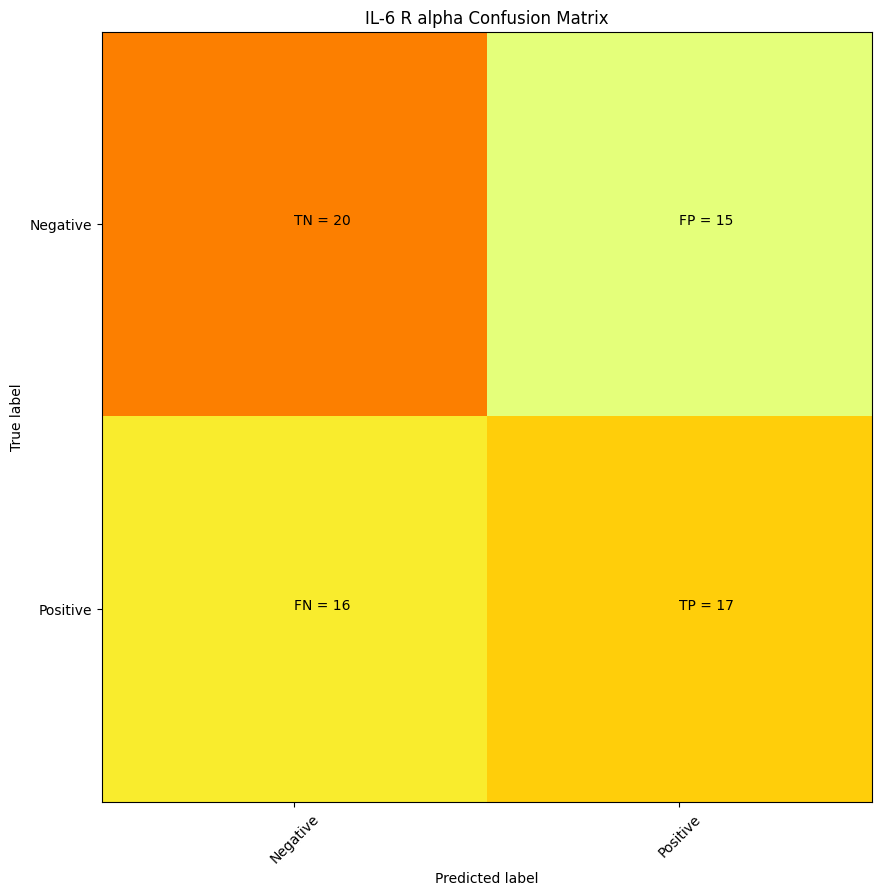

      IL-6 R alpha
well              
A09              1
A12              1
B02              1
B08              1
B11              1
B13              1
C03              1
C10              1
C12              1
E01              1
E07              1
E11              1
E12              1
E13              1
E19              1
E23              1
F01              1
F03              1
F04              1
F07              1
F08              1
F10              1
F19              1
F23              1
G03              1
G10              1
I02              1
I06              1
I10              1
I19              1
J01              1
J07              1
J10              1
J12              1
J14              1
J19              1
J23              1
K02              1
K03              1
K06              1
K08              1
K09              1
K10              1
L01              1
L02              1
L06              1
L07              1
L10              1
L11              1
L13              1
L19         

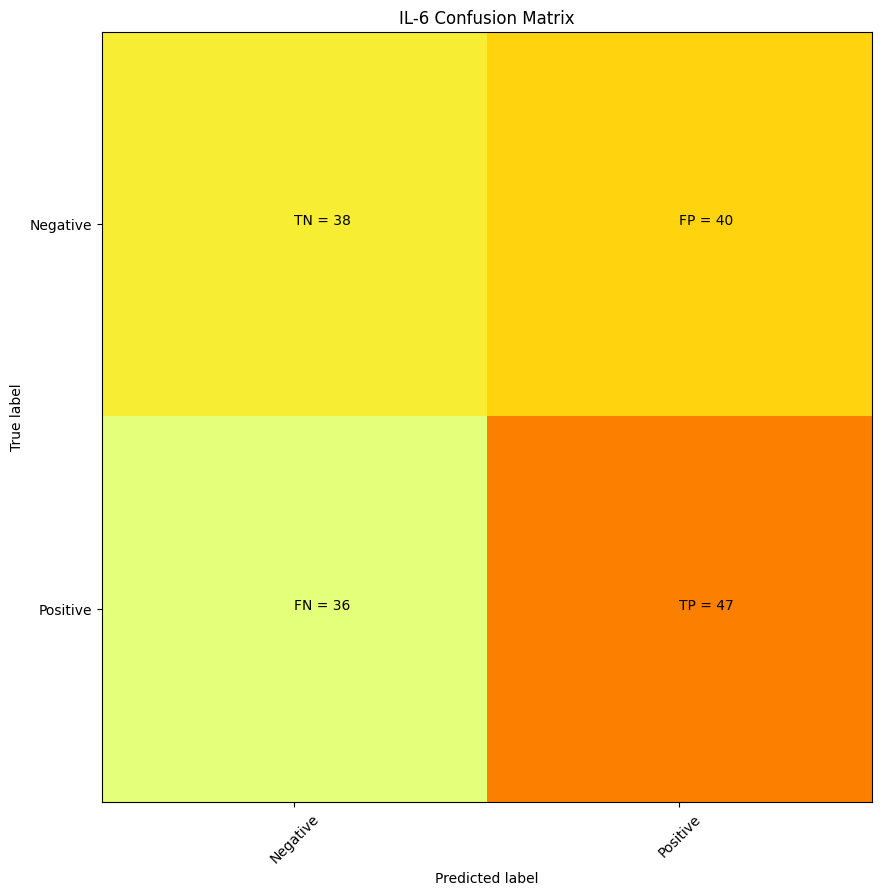

      IL-6
well      
A02      1
A04      1
A07      1
A18      1
A21      1
A22      1
A23      1
A24      1
B02      1
B03      1
B04      1
B05      1
B06      1
B07      1
B13      1
B16      1
B17      1
B19      1
B23      1
C02      1
C05      1
C06      1
C10      1
C20      1
C23      1
C24      1
D01      1
D02      1
D03      1
D09      1
D10      1
D13      1
D16      1
D18      1
D23      1
D24      1
E13      1
E16      1
E20      1
F02      1
F03      1
F04      1
F09      1
F11      1
F15      1
F18      1
F20      1
G03      1
G04      1
G06      1
G08      1
G09      1
G13      1
G15      1
G19      1
G21      1
G23      1
G24      1
H03      1
H07      1
H09      1
H10      1
H12      1
H13      1
H14      1
H16      1
H18      1
H19      1
H22      1
H23      1
H24      1
I01      1
I02      1
I10      1
I11      1
I19      1
I20      1
I21      1
I22      1
I23      1
J01      1
J02      1
J03      1
J04      1
J06      1
J09      1
J10      1
J11      1
J14      1

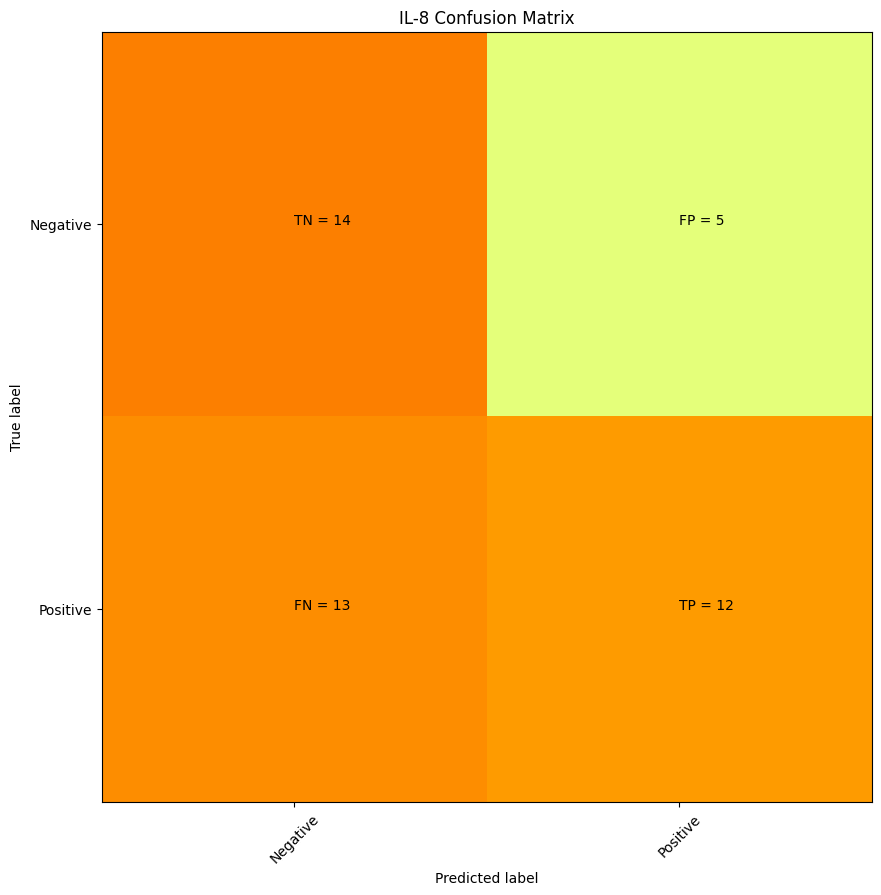

      IL-8
well      
A01      1
B01      1
B11      1
B13      1
B23      1
C01      1
C23      1
E01      1
E07      1
E11      1
E13      1
E19      1
E23      1
F01      1
F07      1
F19      1
F23      1
G01      1
H01      1
H07      1
H13      1
H19      1
H23      1
I19      1
J01      1
J07      1
J19      1
J23      1
K13      1
L01      1
L07      1
L11      1
L13      1
L19      1
L23      1
M01      1
N11      1
N13      1
P01      1
P07      1
P11      1
P13      1
P19      1
P23      1
G05      0
P21      0
G23      0
L24      0
M04      0
F02      0
O23      0
J02      0
H06      0
M23      0
M07      0
N16      0
N06      0
O20      0
I14      0
E02      0
M10      0
P17      0
L15      0
F14      0
I05      0
I13      0
F16      0
M08      0
I20      0
B10      0
N12      0
D21      0
O09      0
L09      0
F18      0
C16      0
L20      0
L17      0
K15      0
K09      0
G09      0
K07      0
C14      0
P18      0
I11      0
J13      0
P10      0
M19      0 precision 

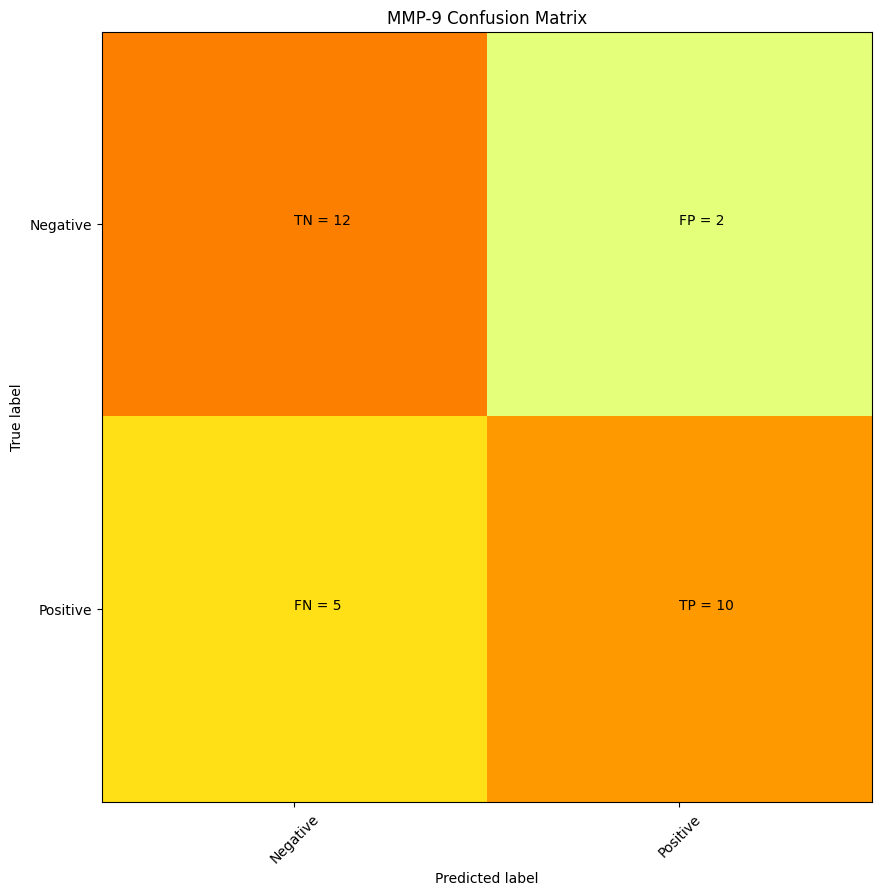

      MMP-9
well       
A18       1
D02       1
D03       1
D04       1
D12       1
D16       1
D20       1
H11       1
H13       1
H18       1
H24       1
I19       1
K10       1
L11       1
M02       1
M03       1
M10       1
M11       1
M13       1
M17       1
M18       1
M20       1
M21       1
M24       1
N16       1
P07       1
P14       1
P19       1
P23       1
H21       0
H10       0
A06       0
B09       0
I23       0
F07       0
K13       0
J11       0
B11       0
N09       0
D13       0
K18       0
I12       0
F11       0
D05       0
B17       0
B07       0
L21       0
O01       0
N20       0
O06       0
A17       0
P02       0
I13       0
G10       0
I21       0
L14       0
N23       0
F23       0 precision = 0.8333333333333334 recall = 0.6666666666666666


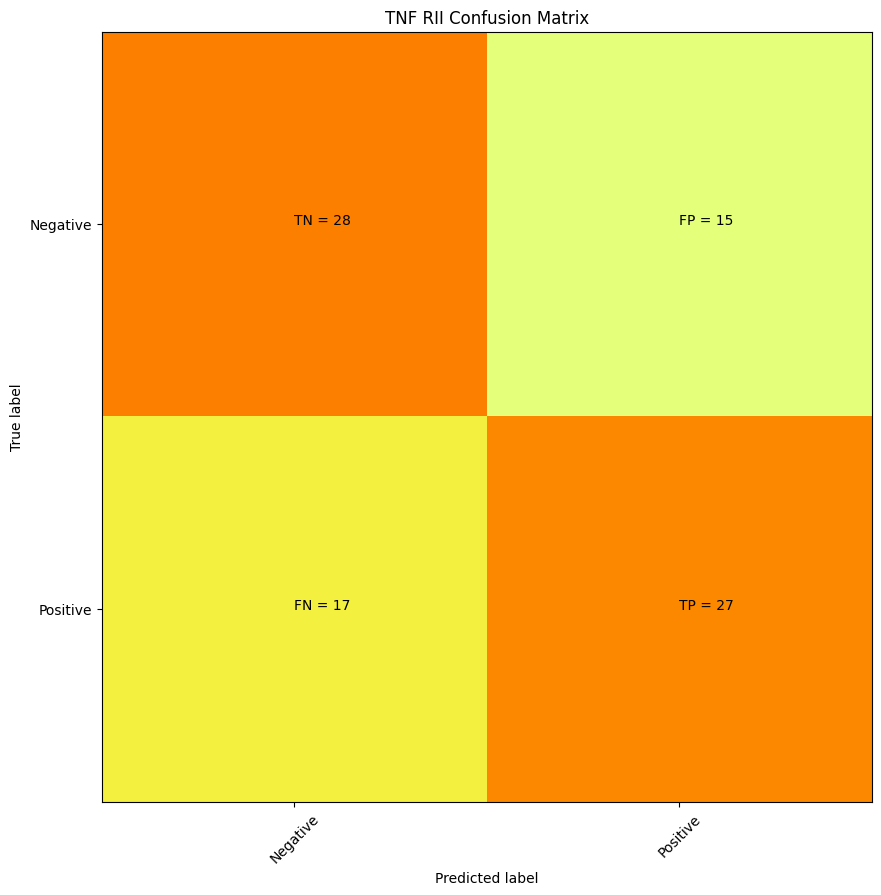

      TNF RII
well         
A24         1
B01         1
B03         1
B07         1
B11         1
B13         1
C03         1
C07         1
C16         1
D07         1
D09         1
D16         1
E01         1
E07         1
E11         1
E13         1
E19         1
E23         1
F01         1
F03         1
F04         1
F08         1
F10         1
F16         1
F19         1
F22         1
G01         1
G02         1
G06         1
G07         1
G24         1
H01         1
H11         1
H15         1
H16         1
H19         1
I10         1
I14         1
I19         1
J01         1
J04         1
J07         1
J10         1
J11         1
J14         1
J19         1
J23         1
K10         1
K11         1
K16         1
L01         1
L02         1
L10         1
L11         1
L13         1
L19         1
L23         1
M03         1
M04         1
M07         1
M10         1
M14         1
M16         1
M20         1
N09         1
N10         1
N11         1
N13         1
N16         1
N17   

In [71]:
summarizing = []
summarizer_seqtree = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in seqtree_listing:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(y_test.index)])
        summarizer_seqtree = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_seqtree['Precision'] = summarizer_seqtree['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])

In [72]:
summarizer_seqtree

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.576923,0.600000,10,47
1,CCL1,0.620690,0.720000,10,46
2,CCL19,0.000000,0.000000,10,12
3,CCL2,0.684211,0.553191,10,95
4,CCL20,0.538462,0.500000,10,30
5,CCL22,0.596491,0.507463,10,125
6,CCL4,0.529412,0.391304,10,46
7,CCL5,0.535211,0.603175,10,133
8,CD14,0.692308,0.620690,10,61
9,CRP,0.613636,0.613636,10,86


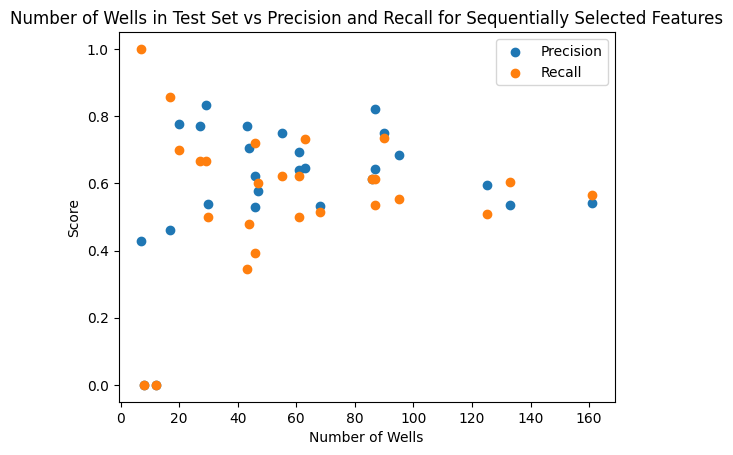

In [73]:
#Basically no trend, good news
plt.scatter(y=summarizer_seqtree["Precision"], x = summarizer_seqtree["Wells in Set"])
plt.scatter(y=summarizer_seqtree["Recall"], x = summarizer_seqtree["Wells in Set"])
plt.xlabel("Number of Wells")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for Sequentially Selected Features")
plt.show()

## And finally, XGBoost performance with PCA features

In [74]:
PCAs

[    Activin A          0         1         2         3         4         5  \
 0           1   0.741290 -1.157096 -1.414193 -0.573459  0.659916  1.153170   
 1           1   0.130214 -0.963625 -0.556036 -0.452617  0.493614 -0.710036   
 2           1  -0.812736 -0.818313 -0.374923  0.686996  0.168732 -0.671074   
 3           1  -1.104830  1.497838 -0.119045  0.335515 -0.225155 -0.588934   
 4           1  -0.113114 -1.253502 -0.143620 -0.028058  0.439282 -1.013874   
 5           1   0.428485 -0.884976 -0.113128 -0.266691  0.618116 -0.195432   
 6           1  -0.239372 -1.209875 -1.685785 -0.199652  0.460184  0.086967   
 7           1   0.779710 -1.711058  1.078801  0.411894  0.646403 -0.229124   
 8           1   0.921679 -1.527880 -0.272920 -0.412681  0.500972  0.302541   
 9           1  -0.233492 -1.218380 -0.463696 -0.034526  0.340912 -0.570295   
 10          1  -0.794974  1.064580  0.589137 -1.163486  0.614041  0.807318   
 11          1   0.521699 -1.405892 -1.274748  0.402

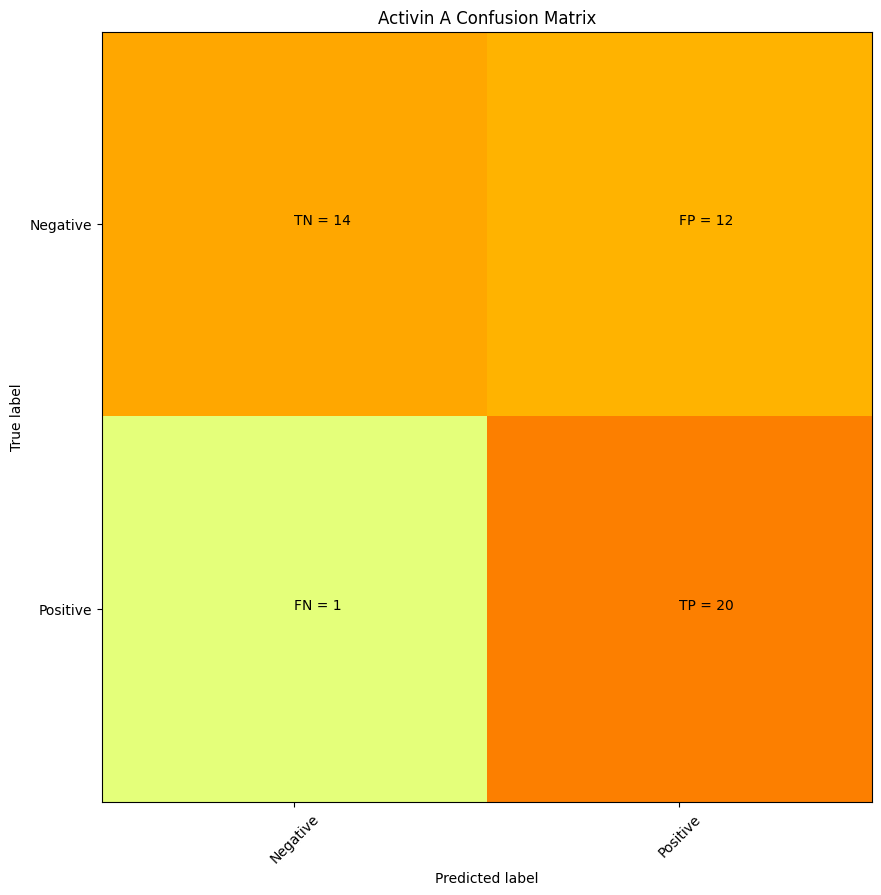

    Activin A
0           1
1           1
2           1
3           1
4           1
5           1
6           1
7           1
8           1
9           1
10          1
11          1
12          1
13          1
14          1
15          1
16          1
17          1
18          1
19          1
20          1
21          1
22          1
23          1
24          1
25          1
26          1
27          1
28          1
29          1
30          1
31          1
32          1
33          1
34          1
35          1
36          1
37          1
38          1
39          1
40          1
41          1
42          1
43          1
44          1
45          1
46          1
47          0
48          0
49          0
50          0
51          0
52          0
53          0
54          0
55          0
56          0
57          0
58          0
59          0
60          0
61          0
62          0
63          0
64          0
65          0
66          0
67          0
68          0
69          0
70    

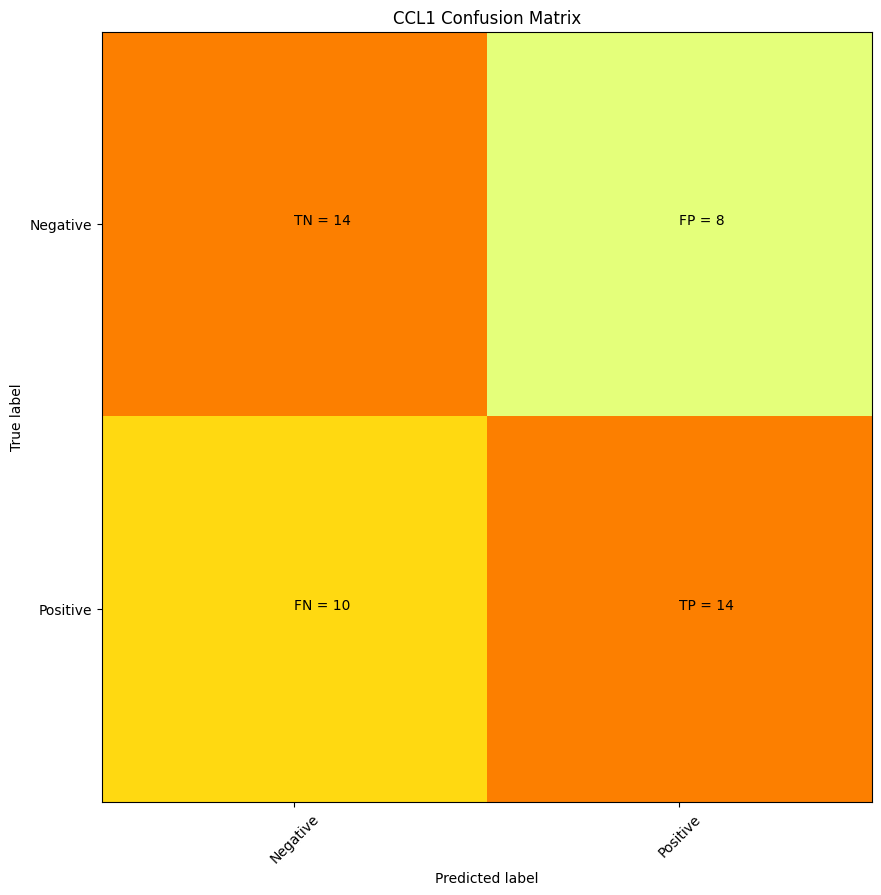

    CCL1
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0 precision = 0.6363636363636364 recall = 0.5833333333333334


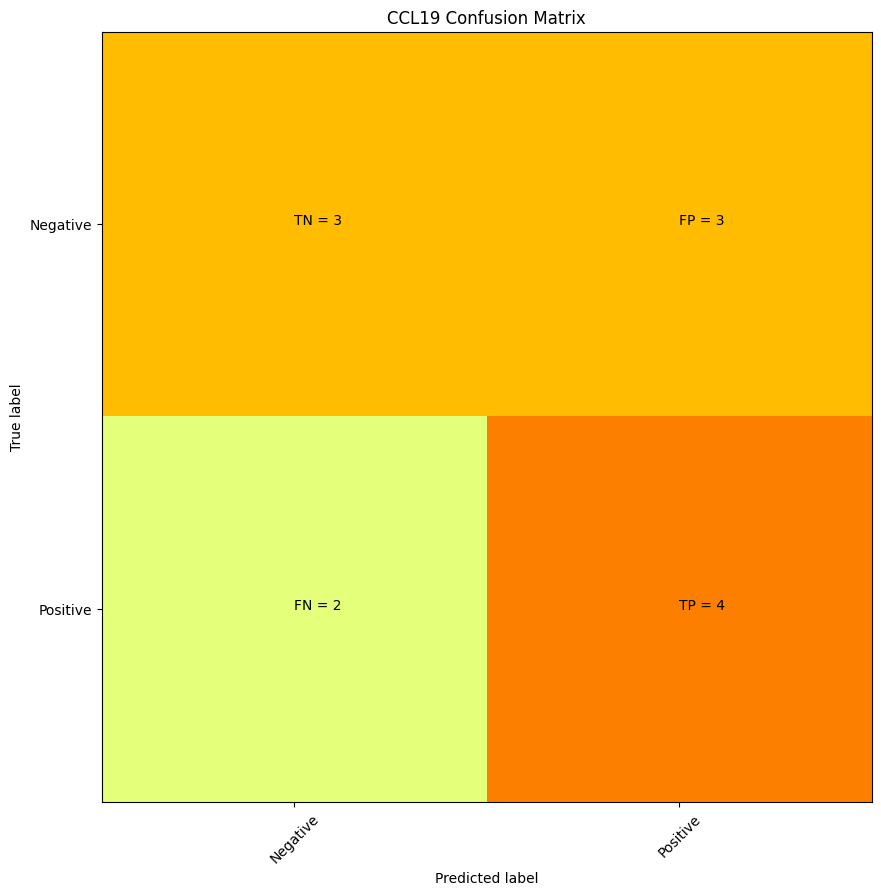

    CCL19
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0 precision = 0.5714285714285714 recall = 0.6666666666666666


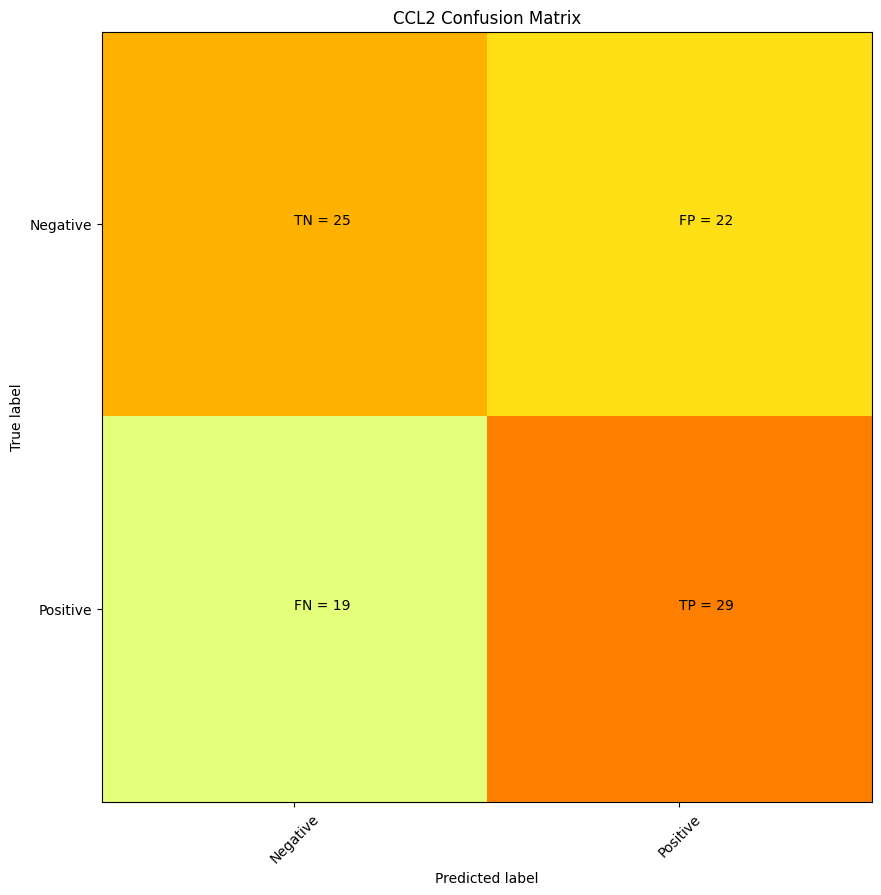

     CCL2
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      0
96      0
97      0
98      0


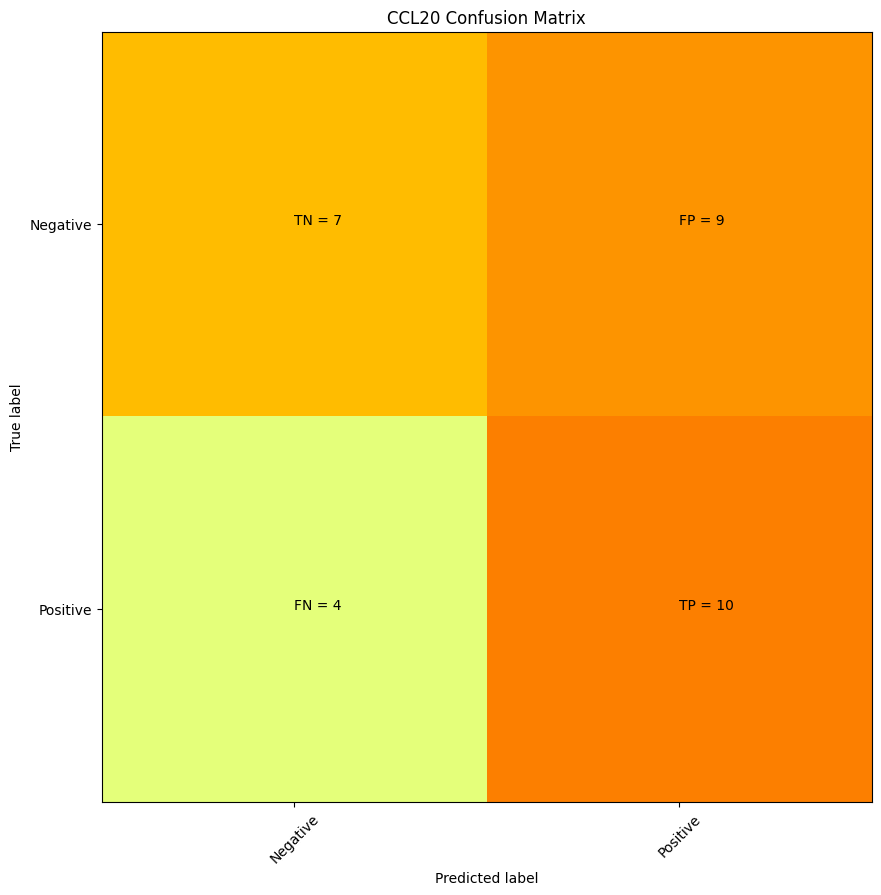

    CCL20
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0 precision = 0.5263157894736842 recall = 0.7142857142857143


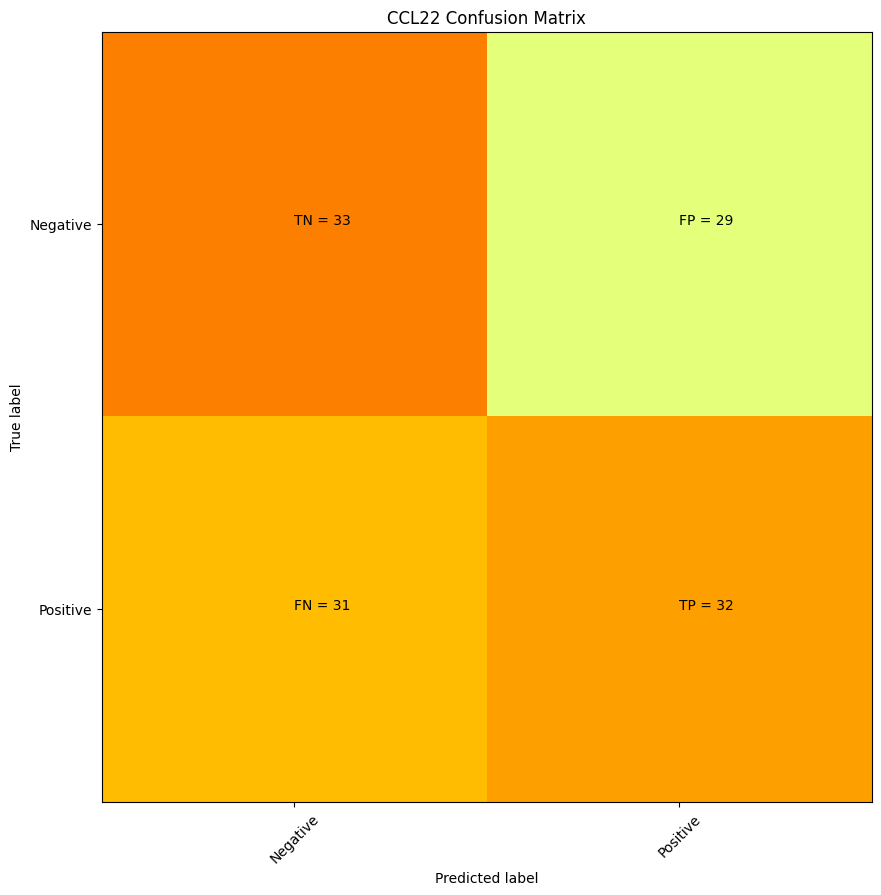

     CCL22
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       1
64       1
65       1
66       1
67       1
68       1
69       1
70       1
71       1
72       1
73       1
74       1
75       1
76       1
77       1
78       1
79       1
80       1
81       1
82       1
83       1
84       1
85       1
86       1
87       1
88       1
89       1

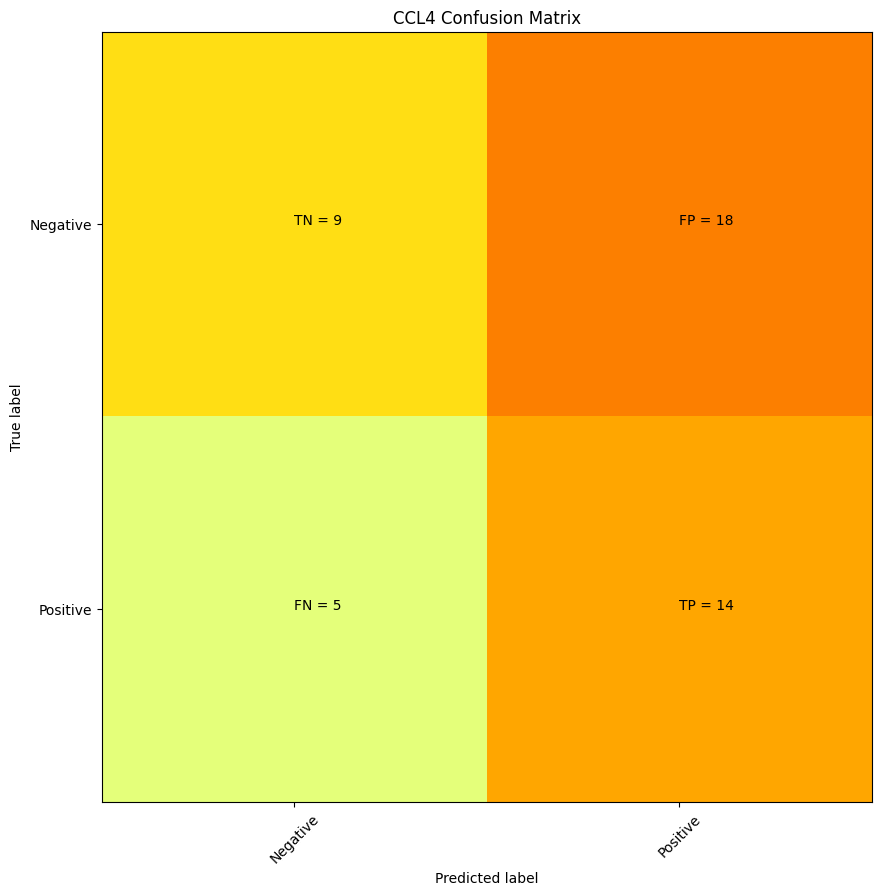

    CCL4
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0 precision = 0.4375 recall = 0.7368421052631579


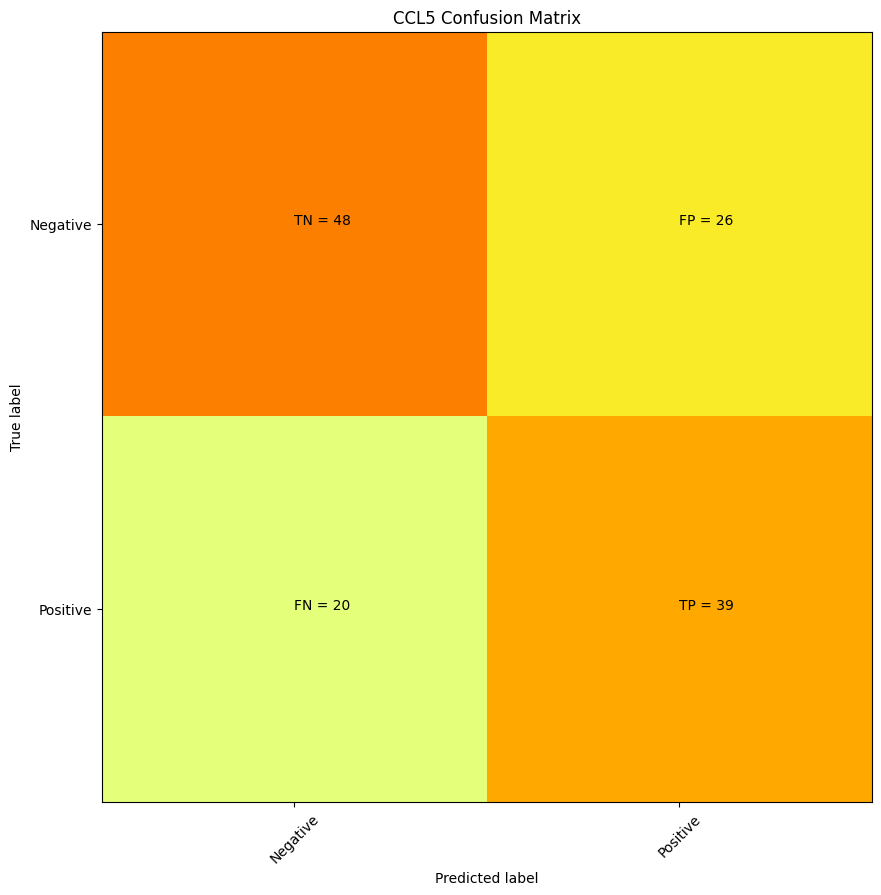

     CCL5
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1


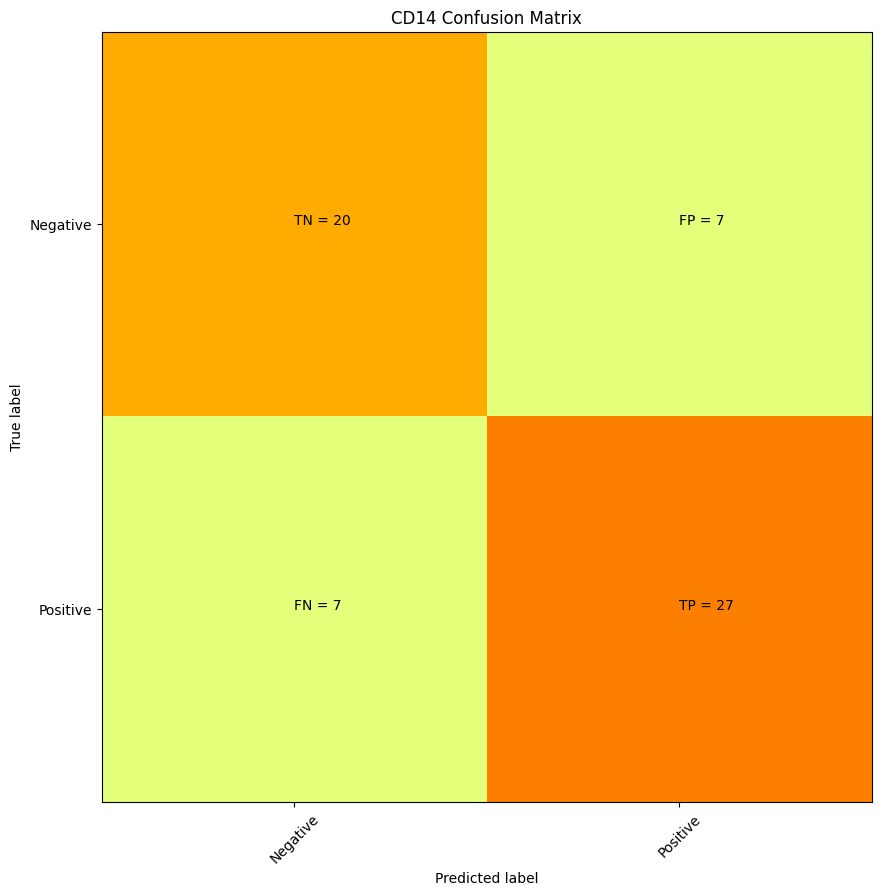

     CD14
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0
86      0
87      0
88      0
89      0
90      0
91      0
92      0
93      0
94      0
95      0
96      0
97      0
98      0


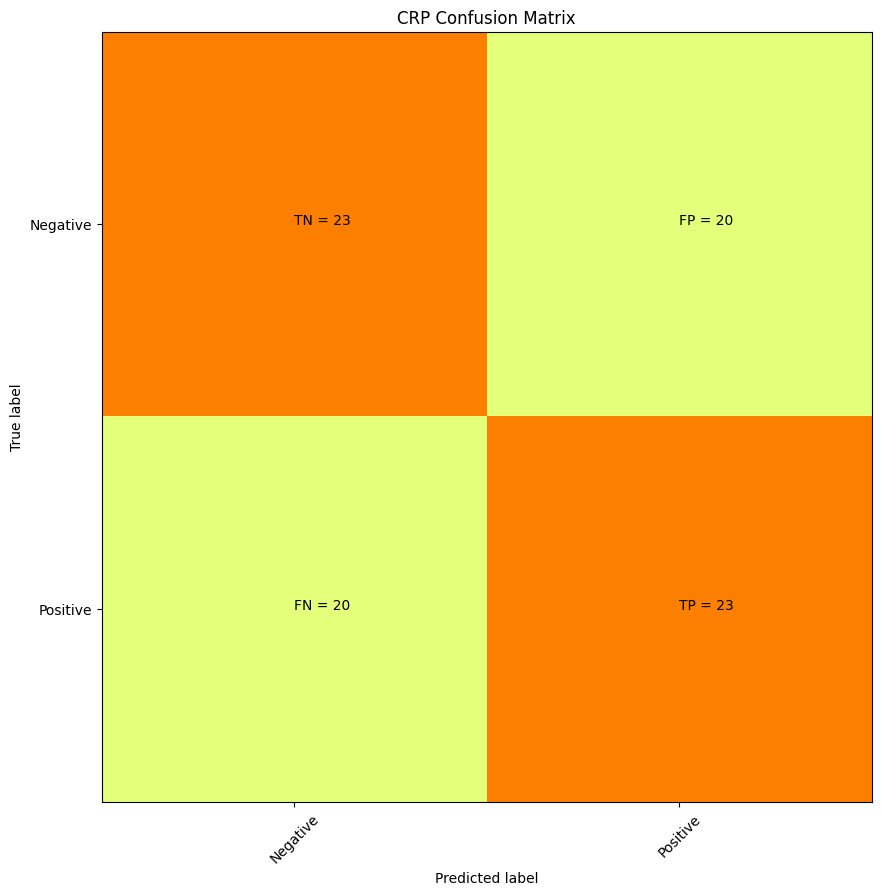

     CRP
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     1
47     1
48     1
49     1
50     1
51     1
52     1
53     1
54     1
55     1
56     1
57     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     1
68     1
69     1
70     1
71     1
72     1
73     1
74     1
75     1
76     1
77     1
78     1
79     1
80     1
81     1
82     1
83     1
84     1
85     1
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
1

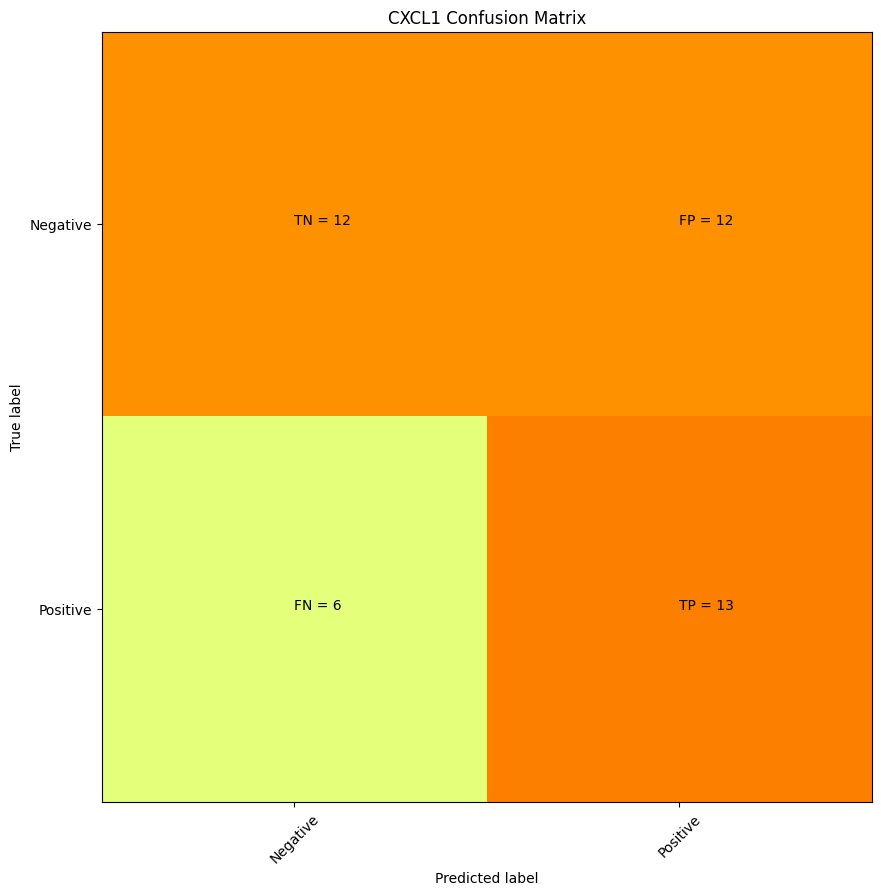

    CXCL1
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      0
81      0
82      0
83      0
84      0
85      0 precision = 0.52 recall = 0.6842105263157895


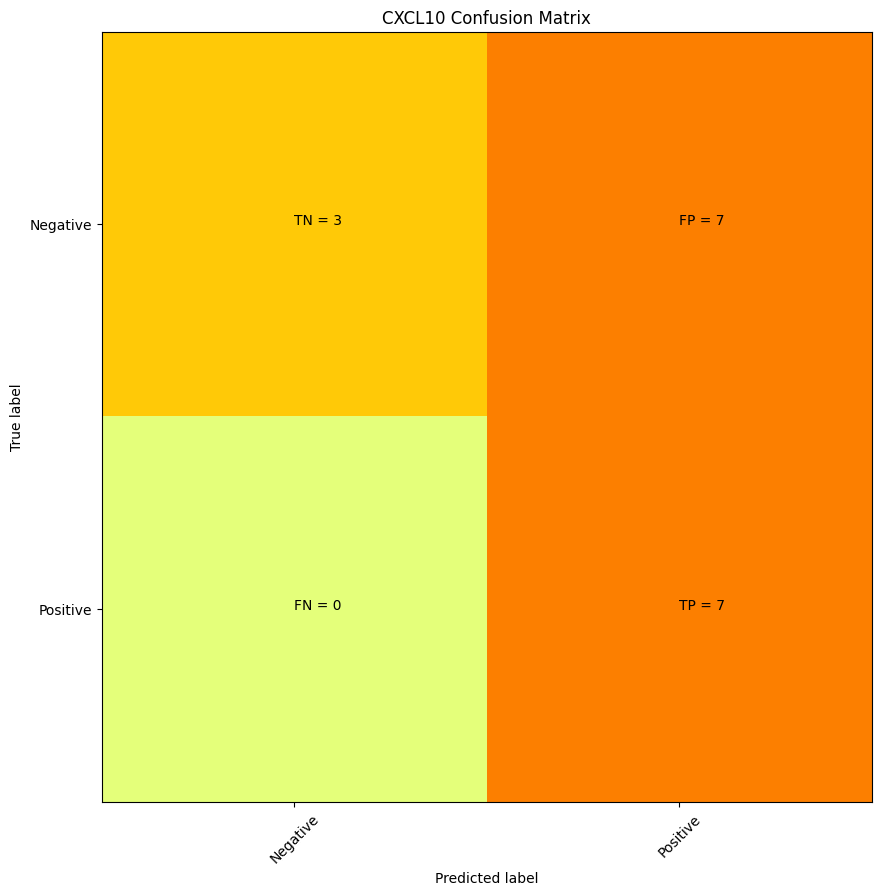

    CXCL10
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
30       0
31       0
32       0
33       0 precision = 0.5 recall = 1.0


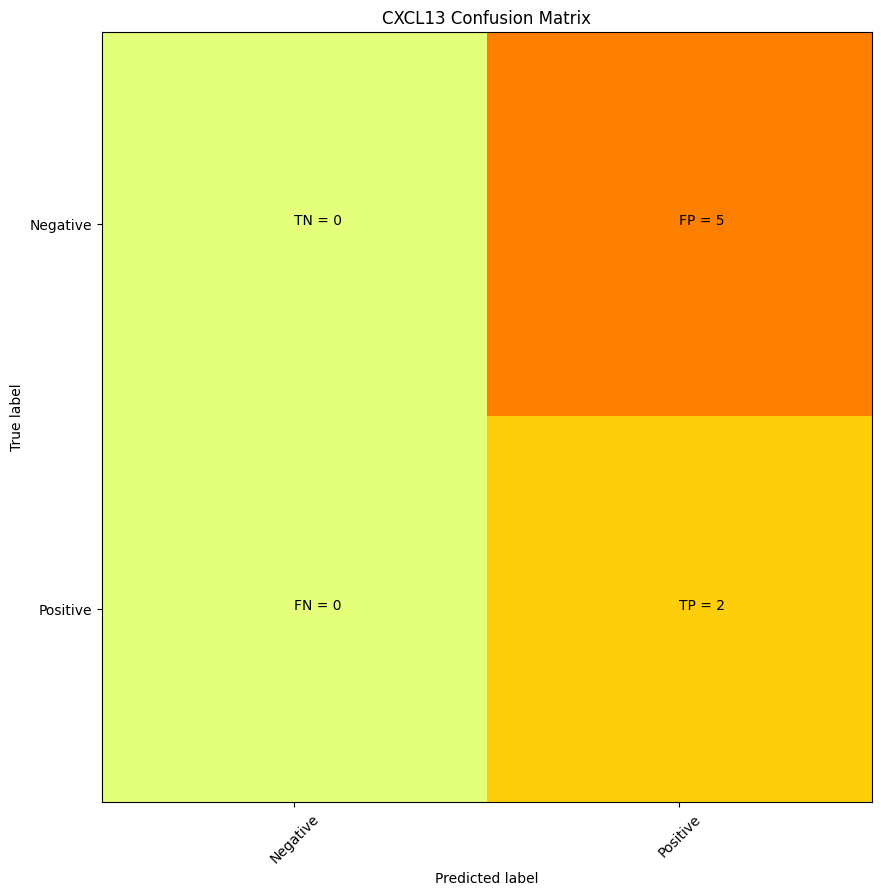

    CXCL13
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        0
8        0
9        0
10       0
11       0
12       0
13       0 precision = 0.2857142857142857 recall = 1.0


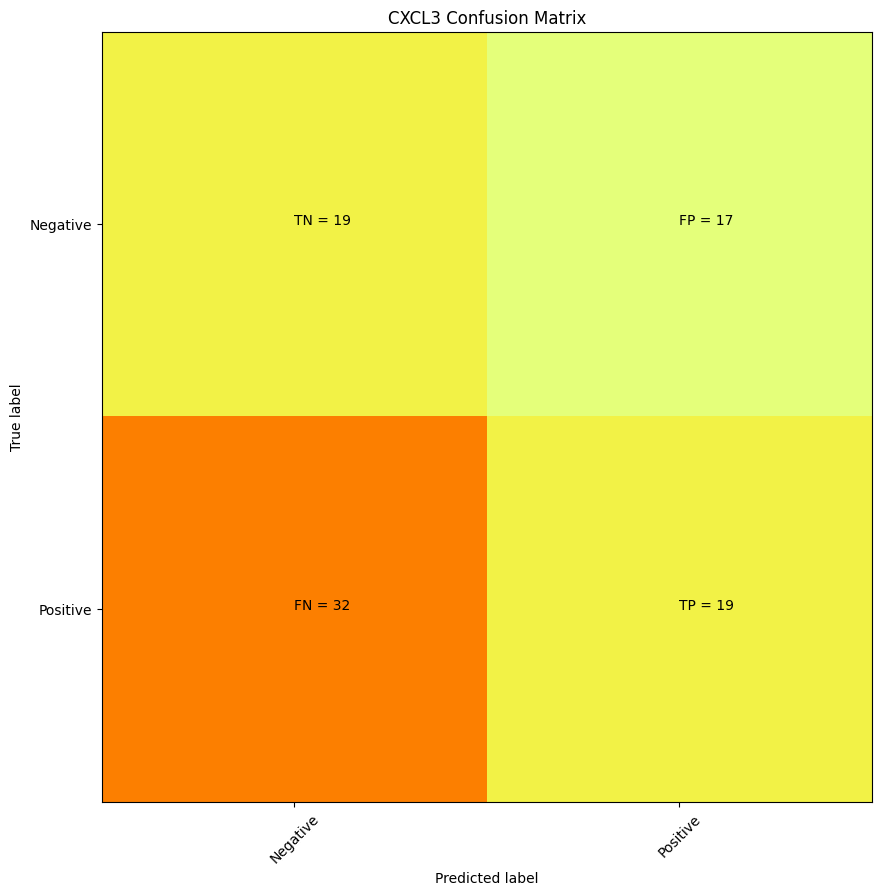

     CXCL3
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       1
64       1
65       1
66       1
67       1
68       1
69       1
70       1
71       1
72       1
73       1
74       1
75       1
76       1
77       1
78       1
79       1
80       1
81       1
82       1
83       1
84       1
85       1
86       1
87       0
88       0
89       0

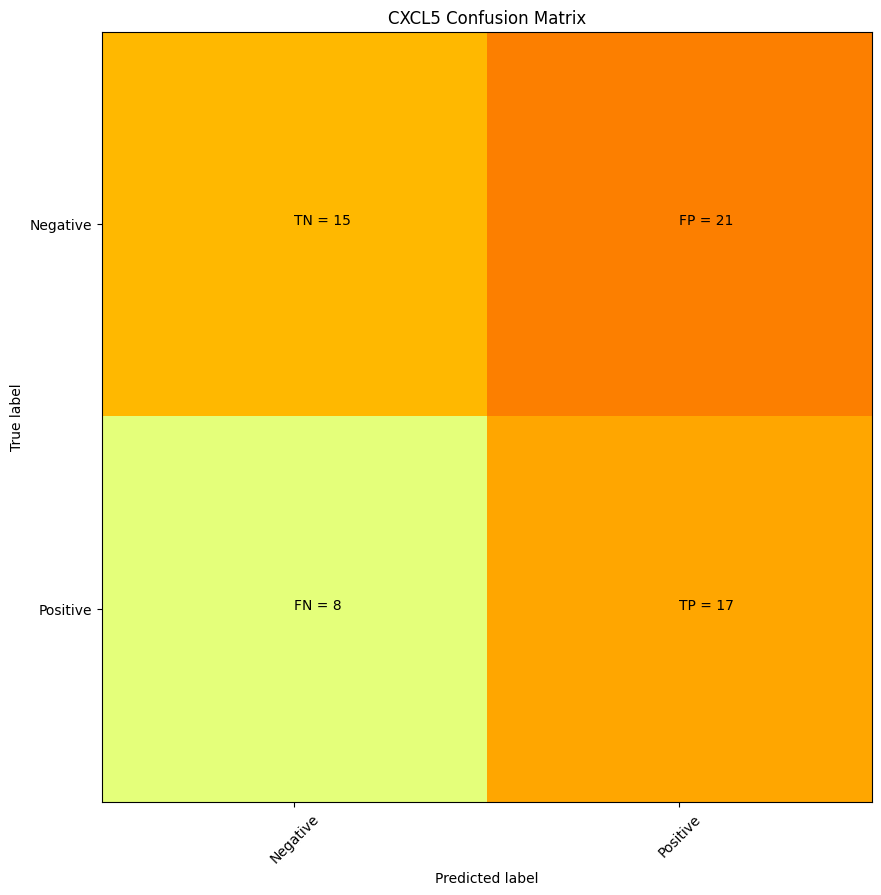

     CXCL5
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0

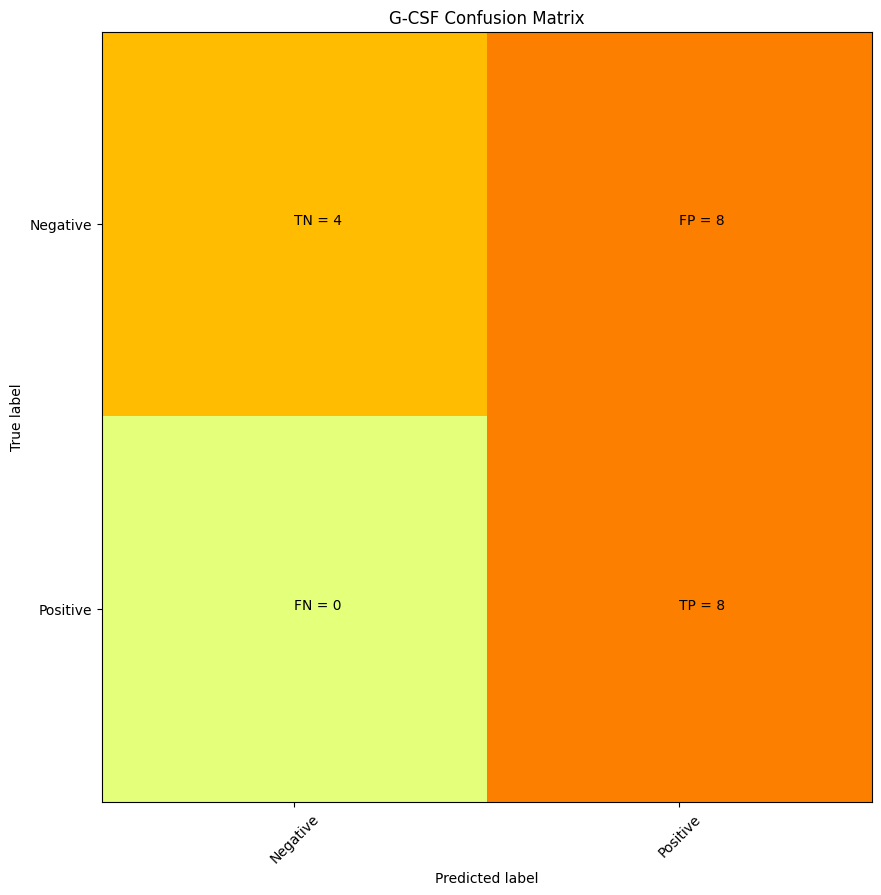

    G-CSF
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      0
21      0
22      0
23      0
24      0
25      0
26      0
27      0
28      0
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0 precision = 0.5 recall = 1.0


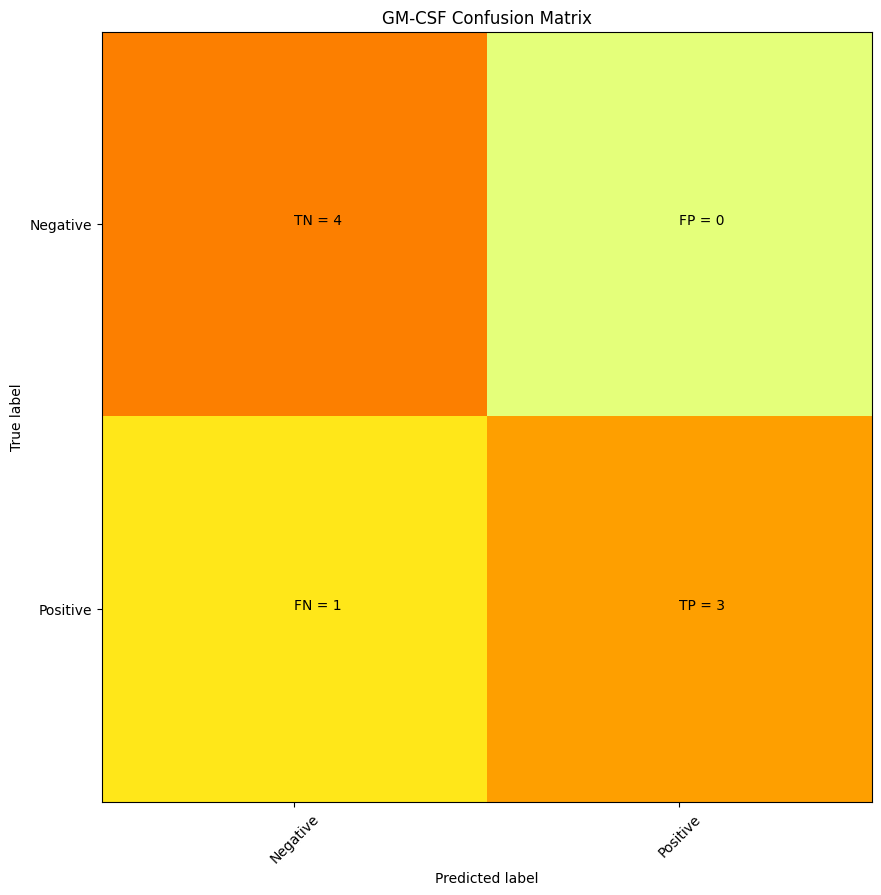

    GM-CSF
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0 precision = 1.0 recall = 0.75


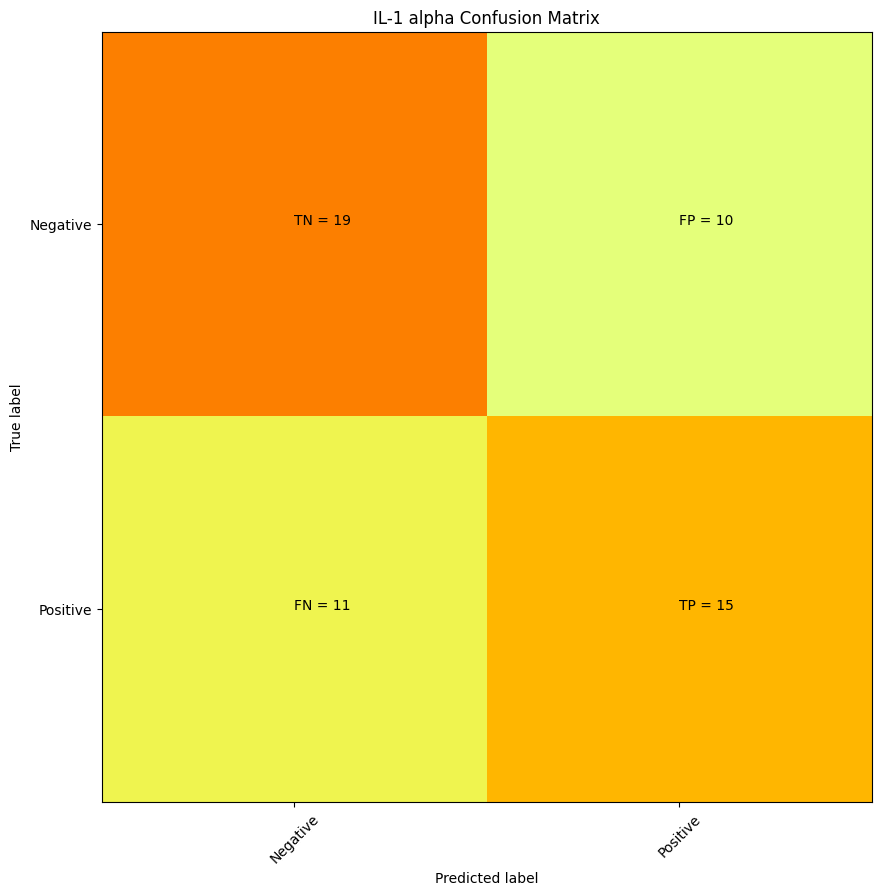

     IL-1 alpha
0             1
1             1
2             1
3             1
4             1
5             1
6             1
7             1
8             1
9             1
10            1
11            1
12            1
13            1
14            1
15            1
16            1
17            1
18            1
19            1
20            1
21            1
22            1
23            1
24            1
25            1
26            1
27            1
28            1
29            1
30            1
31            1
32            1
33            1
34            1
35            1
36            1
37            1
38            1
39            1
40            1
41            1
42            1
43            1
44            1
45            1
46            1
47            1
48            1
49            1
50            1
51            1
52            1
53            1
54            1
55            0
56            0
57            0
58            0
59            0
60            0
61      

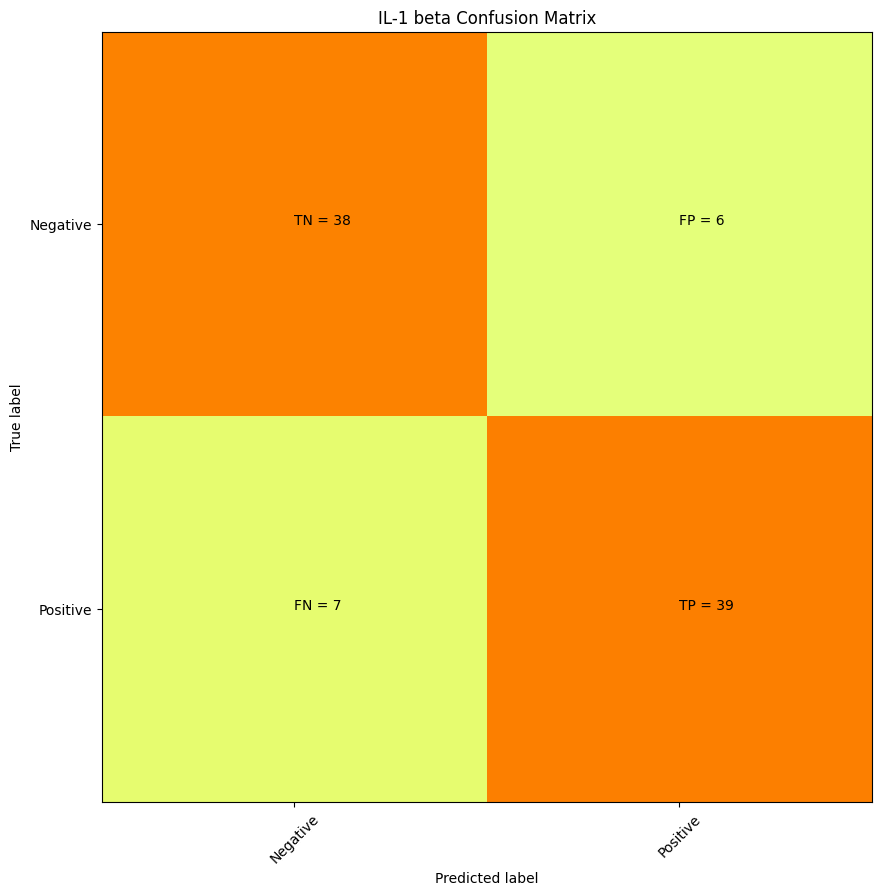

     IL-1 beta
0            1
1            1
2            1
3            1
4            1
5            1
6            1
7            1
8            1
9            1
10           1
11           1
12           1
13           1
14           1
15           1
16           1
17           1
18           1
19           1
20           1
21           1
22           1
23           1
24           1
25           1
26           1
27           1
28           1
29           1
30           1
31           1
32           1
33           1
34           1
35           1
36           1
37           1
38           1
39           1
40           1
41           1
42           1
43           1
44           1
45           1
46           1
47           1
48           1
49           1
50           1
51           1
52           1
53           1
54           1
55           1
56           1
57           1
58           1
59           1
60           1
61           1
62           1
63           1
64           1
65        

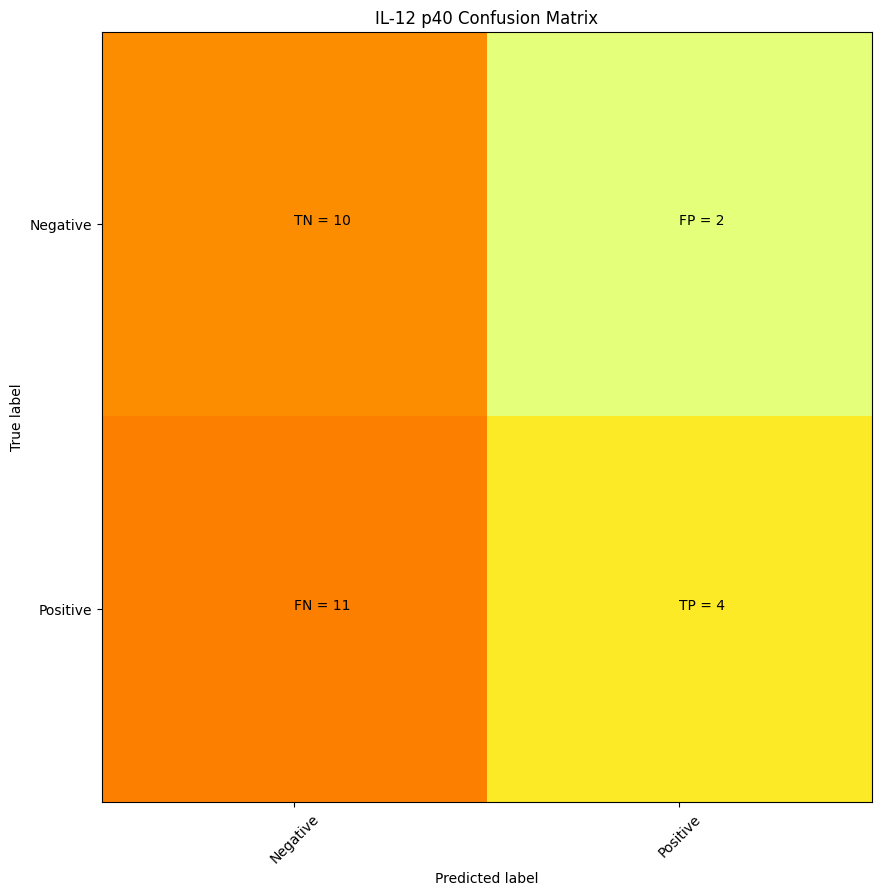

    IL-12 p40
0           1
1           1
2           1
3           1
4           1
5           1
6           1
7           1
8           1
9           1
10          1
11          1
12          1
13          1
14          1
15          1
16          1
17          1
18          1
19          1
20          1
21          1
22          1
23          1
24          1
25          1
26          1
27          0
28          0
29          0
30          0
31          0
32          0
33          0
34          0
35          0
36          0
37          0
38          0
39          0
40          0
41          0
42          0
43          0
44          0
45          0
46          0
47          0
48          0
49          0
50          0
51          0
52          0
53          0 precision = 0.6666666666666666 recall = 0.26666666666666666


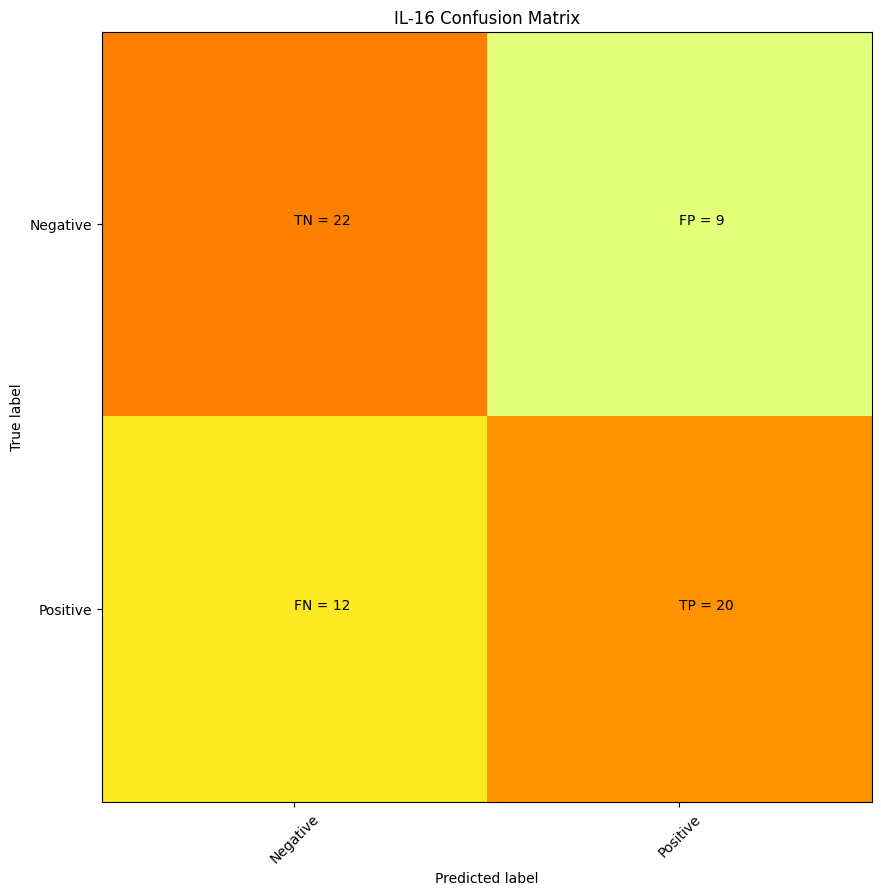

     IL-16
0        1
1        1
2        1
3        1
4        1
5        1
6        1
7        1
8        1
9        1
10       1
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
26       1
27       1
28       1
29       1
30       1
31       1
32       1
33       1
34       1
35       1
36       1
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       1
45       1
46       1
47       1
48       1
49       1
50       1
51       1
52       1
53       1
54       1
55       1
56       1
57       1
58       1
59       1
60       1
61       1
62       1
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0

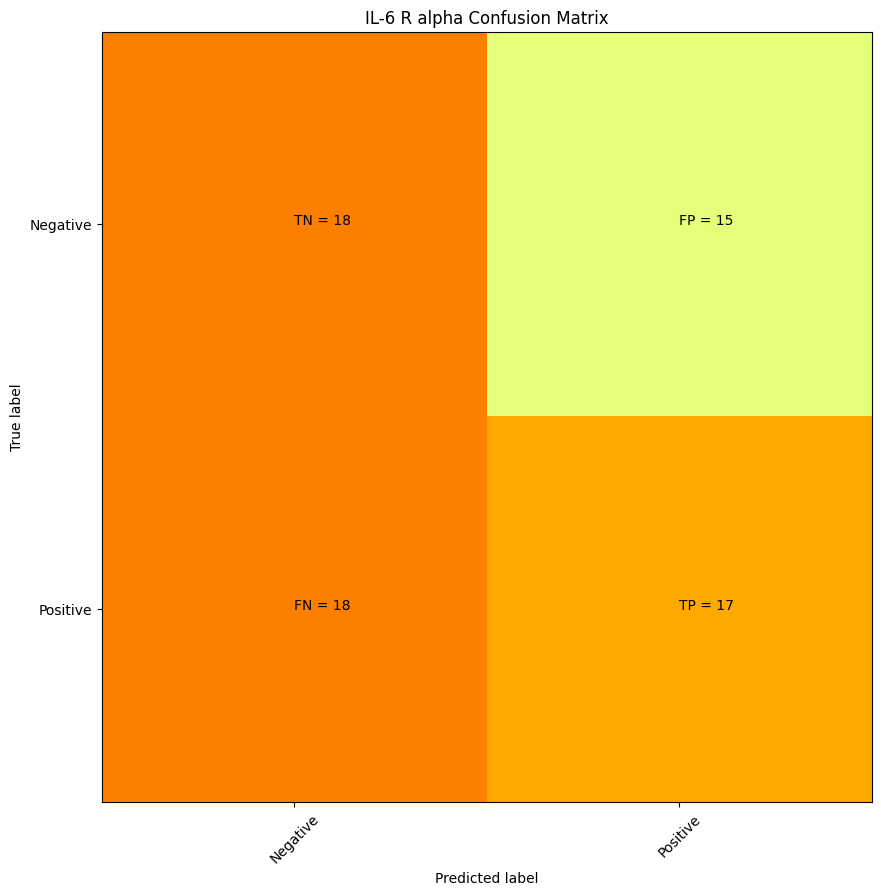

     IL-6 R alpha
0               1
1               1
2               1
3               1
4               1
5               1
6               1
7               1
8               1
9               1
10              1
11              1
12              1
13              1
14              1
15              1
16              1
17              1
18              1
19              1
20              1
21              1
22              1
23              1
24              1
25              1
26              1
27              1
28              1
29              1
30              1
31              1
32              1
33              1
34              1
35              1
36              1
37              1
38              1
39              1
40              1
41              1
42              1
43              1
44              1
45              1
46              1
47              1
48              1
49              1
50              1
51              1
52              1
53              1
54        

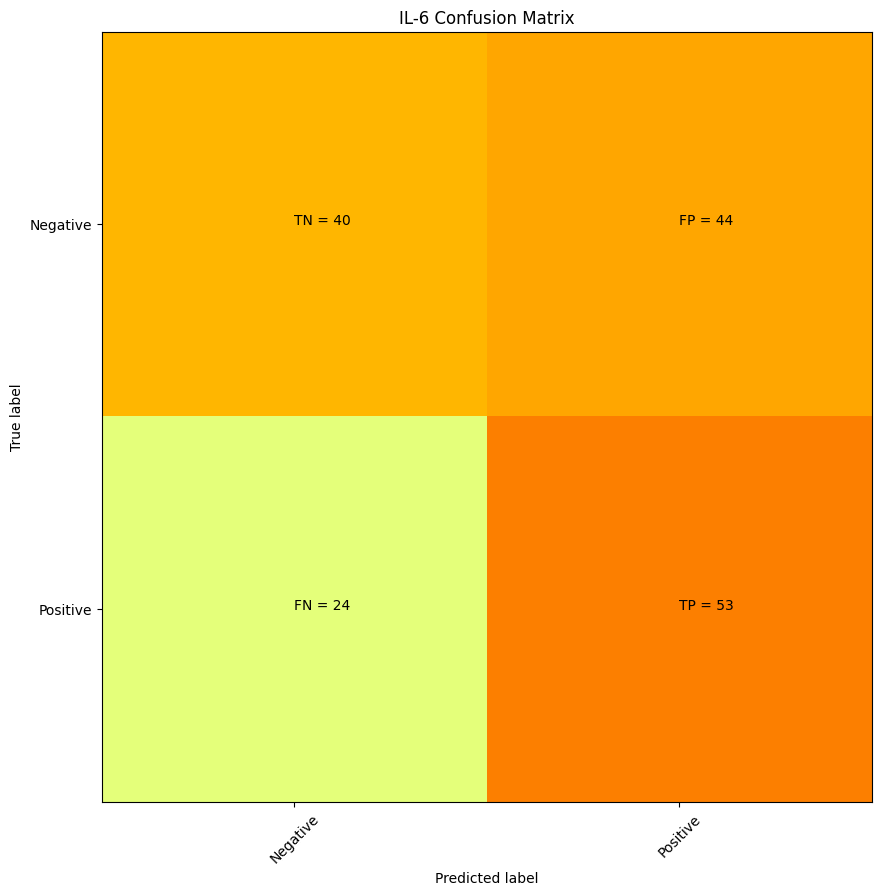

     IL-6
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      1
52      1
53      1
54      1
55      1
56      1
57      1
58      1
59      1
60      1
61      1
62      1
63      1
64      1
65      1
66      1
67      1
68      1
69      1
70      1
71      1
72      1
73      1
74      1
75      1
76      1
77      1
78      1
79      1
80      1
81      1
82      1
83      1
84      1
85      1
86      1
87      1
88      1
89      1
90      1
91      1
92      1
93      1
94      1
95      1
96      1
97      1
98      1


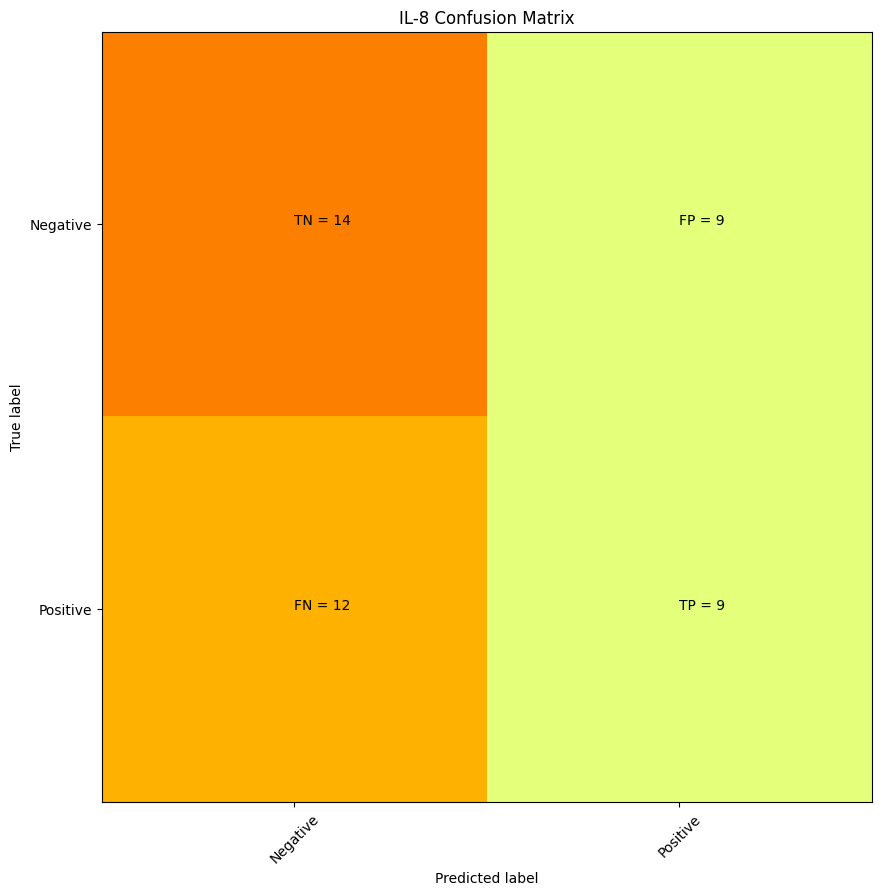

    IL-8
0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0 precision = 0.5 recall = 0.42857142857142855


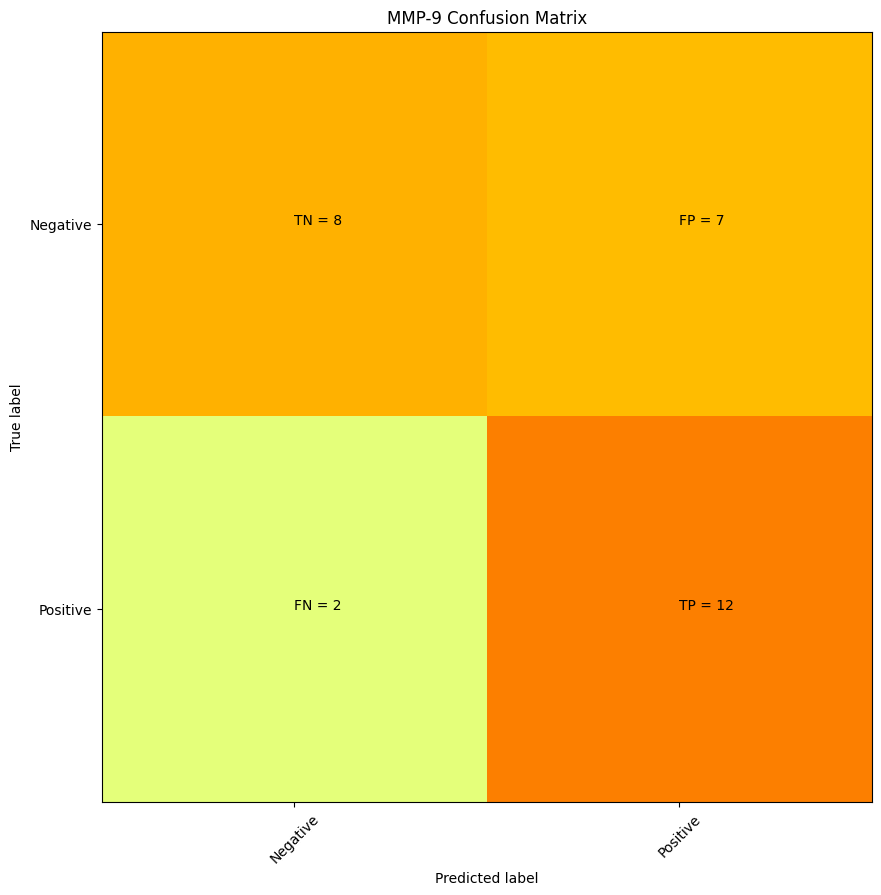

    MMP-9
0       1
1       1
2       1
3       1
4       1
5       1
6       1
7       1
8       1
9       1
10      1
11      1
12      1
13      1
14      1
15      1
16      1
17      1
18      1
19      1
20      1
21      1
22      1
23      1
24      1
25      1
26      1
27      1
28      1
29      0
30      0
31      0
32      0
33      0
34      0
35      0
36      0
37      0
38      0
39      0
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      0
55      0
56      0
57      0 precision = 0.631578947368421 recall = 0.8571428571428571


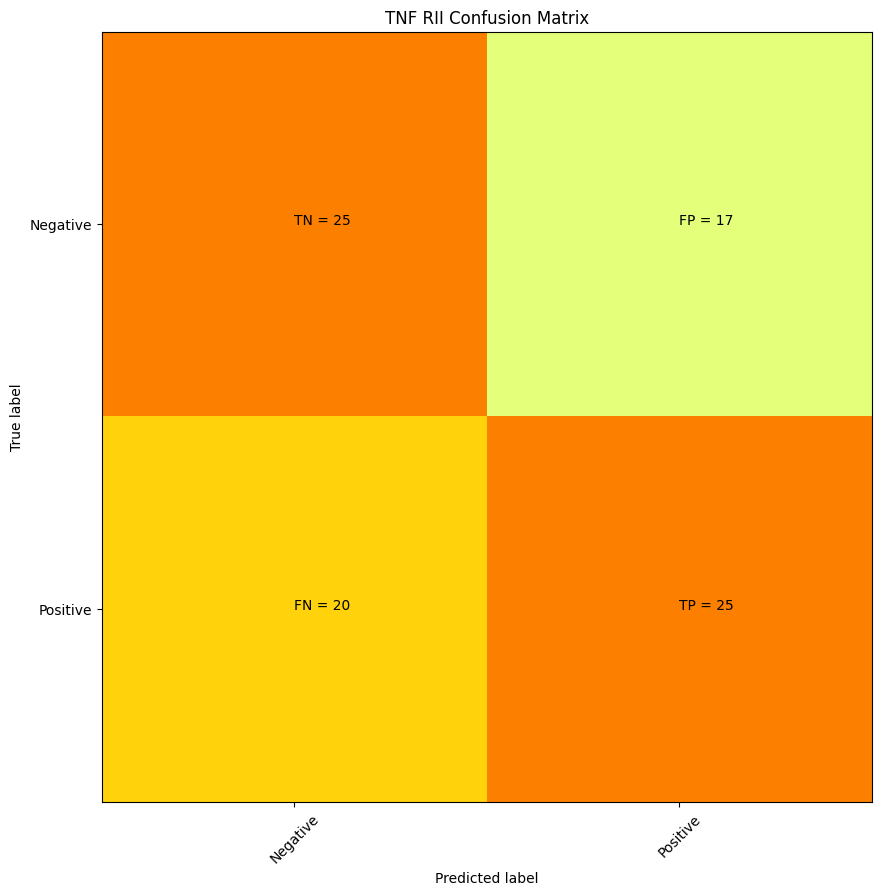

     TNF RII
0          1
1          1
2          1
3          1
4          1
5          1
6          1
7          1
8          1
9          1
10         1
11         1
12         1
13         1
14         1
15         1
16         1
17         1
18         1
19         1
20         1
21         1
22         1
23         1
24         1
25         1
26         1
27         1
28         1
29         1
30         1
31         1
32         1
33         1
34         1
35         1
36         1
37         1
38         1
39         1
40         1
41         1
42         1
43         1
44         1
45         1
46         1
47         1
48         1
49         1
50         1
51         1
52         1
53         1
54         1
55         1
56         1
57         1
58         1
59         1
60         1
61         1
62         1
63         1
64         1
65         1
66         1
67         1
68         1
69         1
70         1
71         1
72         1
73         1
74         1
75         1

In [75]:
summarizing = []
summarizer_PCA = pd.DataFrame(columns = ["Cytokine", "Precision", 'Recall', "Number of Features", "Wells in Set"])
to_ignore=[]
trained = []
split = []


for df in PCAs:
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    try:
        #split data
        X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.5)
        split.append(target.columns[0])
        # create model instance
        bst = XGBClassifier(n_estimators=100, max_depth=10, learning_rate=1, objective='binary:logistic')
        # fit model
        bst.fit(X_train, y_train)
        trained.append(target.columns[0])
        # make predictions
        preds = bst.predict(X_test)
        precision, recall = confusio_matrix(y_test,preds, target, df.columns[0])
        summarizing.append([df.columns[0], precision, recall, len(df.columns)-1, len(df.index)])
        summarizer_PCA = pd.DataFrame(summarizing, columns = ["Cytokine", "Precision", "Recall", "Number of Features","Wells in Set"])
        summarizer_PCA['Precision'] = summarizer_PCA['Precision'].fillna(0)
    except:
        to_ignore.append(df.columns[0])
        


In [76]:
summarizer_PCA

,Cytokine,Precision,Recall,Number of Features,Wells in Set
0,Activin A,0.625000,0.952381,10,94
1,CCL1,0.636364,0.583333,10,92
2,CCL19,0.571429,0.666667,10,24
3,CCL2,0.568627,0.604167,10,190
4,CCL20,0.526316,0.714286,10,60
5,CCL22,0.524590,0.507937,10,250
6,CCL4,0.437500,0.736842,10,92
7,CCL5,0.600000,0.661017,10,266
8,CD14,0.794118,0.794118,10,122
9,CRP,0.534884,0.534884,10,172


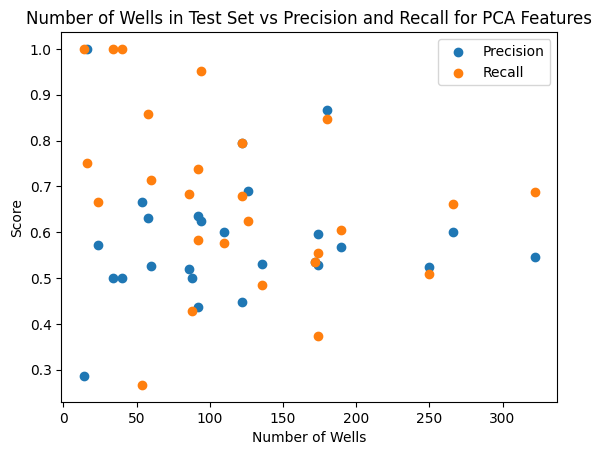

In [77]:
#Basically no trend, good news
plt.scatter(y=summarizer_PCA["Precision"], x = summarizer_PCA["Wells in Set"])
plt.scatter(y=summarizer_PCA["Recall"], x = summarizer_PCA["Wells in Set"])
plt.xlabel("Number of Wells")
plt.ylabel("Score")
plt.legend(["Precision", 'Recall'])
plt.title("Number of Wells in Test Set vs Precision and Recall for PCA Features")
plt.show()

# Final Results - Overall summary of different feature selection methods

In [78]:
#Let's now compare the final results to make a decision about how many cytokines are predictable and which 
#feature selection methods are most succesful. 
#These lists will be handy.

summarizer_list = [summarizer_PCA,
summarizer_seqtree,
summarizer_treepicks,
summarizer_l1s,
summarizer_rfefs,
summarizer_univariates]


summarizer_list_string = ["summarizer_PCA",
"summarizer_seqtree",
"summarizer_treepicks",
"summarizer_l1s",
"summarizer_rfefs",
"summarizer_univariates"]

In [79]:
# I will consider performance above 0.65 for precision and recall as "predictable"
review=[]
for item in summarizer_list:
#     for string in summarizer_list_string:
#         print(string)
    item2 = item.sort_values(by=["Precision", "Recall"],ascending=False)
    item2 = item2[item2["Precision"]>0.65]
    item2 = item2[item2["Recall"]>0.65]
    itemsorted=pd.DataFrame(item2)
#     print(itemsorted)
    review.append(["number predictable cytokines", len(itemsorted), itemsorted])


for i in range(len(summarizer_list_string)):
    print(summarizer_list_string[i])
    print(review[i])

summarizer_PCA
['number predictable cytokines', 3,      Cytokine  Precision    Recall  Number of Features  Wells in Set
16     GM-CSF   1.000000  0.750000                  10            16
18  IL-1 beta   0.866667  0.847826                  10           180
8        CD14   0.794118  0.794118                  10           122]
summarizer_seqtree
['number predictable cytokines', 4,      Cytokine  Precision    Recall  Number of Features  Wells in Set
24      MMP-9   0.833333  0.666667                  10            29
15      G-CSF   0.777778  0.700000                  10            20
19  IL-12 p40   0.769231  0.666667                  10            27
18  IL-1 beta   0.750000  0.734694                  10            90]
summarizer_treepicks
['number predictable cytokines', 9,         Cytokine  Precision    Recall  Number of Features  Wells in Set
2          CCL19   0.833333  0.714286                 244            12
0      Activin A   0.761905  0.666667                 434            4

In [80]:
# Count how many feature selection methods work for each cytokine

# Looks like GM-CSF, G-CSF, IL-1 beta, IL-1 alpha, and IL-16 are predictable unde rmanmy feature selection methods



result_list = []

for i in range(len(review)):
    cytos = review[i][2].iloc[:,:1].values
    for j in range(len(cytos)):
#         print(cytos[j][0])
        result_list.append(cytos[j][0])
    

# result_list

pd.Series(result_list).value_counts()

IL-1 beta       6
CD14            5
Activin A       4
IL-6 R alpha    4
MMP-9           3
G-CSF           3
CXCL10          3
IL-1 alpha      3
IL-16           3
GM-CSF          2
CCL5            2
IL-12 p40       1
CCL19           1
CXCL5           1
CXCL3           1
Name: count, dtype: int64

In [81]:
method_list_string = ["PCA",
"seqtree",
"treepicks",
"l1s",
"rfefs",
"univariates"]





overall = pd.DataFrame(columns = ["Method","Number of Predictable Cytos","Average Precision", "Average Recall"])
logger = []
for i in range(len(review)):
    average_precision = review[i][2].iloc[:,1:2].values.mean()
    average_recall = review[i][2].iloc[:,2:3].values.mean()
    number_of_cytos = len(review[i][2].iloc[:,1:2])
    method = method_list_string[i]
    logger.append([method, number_of_cytos, average_precision, average_recall])
    overall = pd.DataFrame(logger, columns = ["Method","Number of Predictable Cytos","Average Precision", "Average Recall"])
overall

,Method,Number of Predictable Cytos,Average Precision,Average Recall
0,PCA,3,0.886928,0.797315
1,seqtree,4,0.782585,0.692007
2,treepicks,9,0.720719,0.743913
3,l1s,8,0.770933,0.729704
4,rfefs,8,0.760164,0.743964
5,univariates,10,0.761792,0.802245


# Effect of Model Complexity with PCA features only

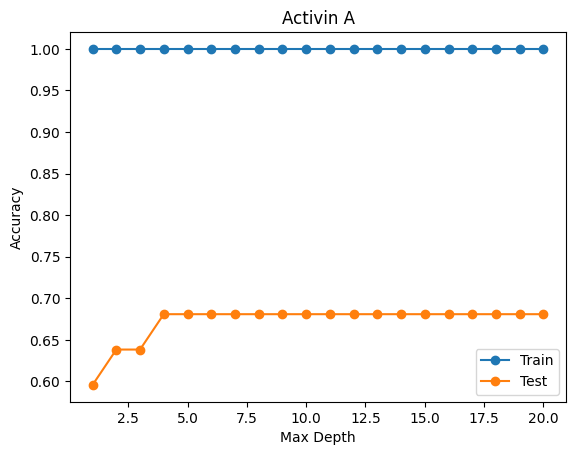

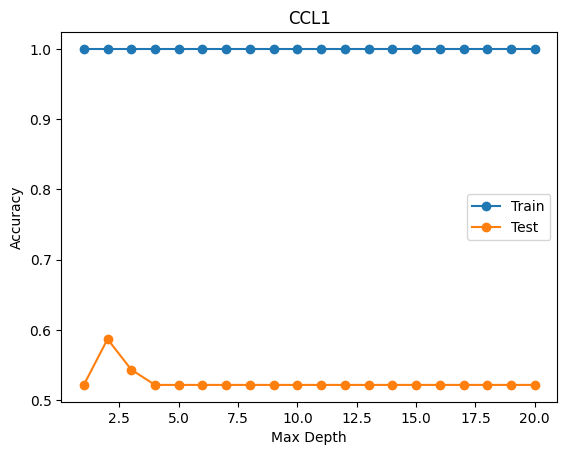

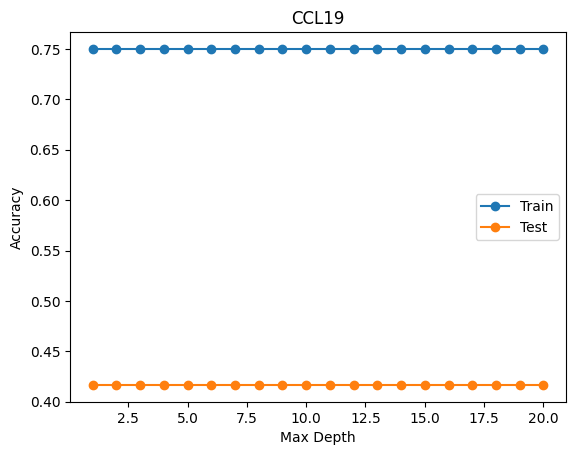

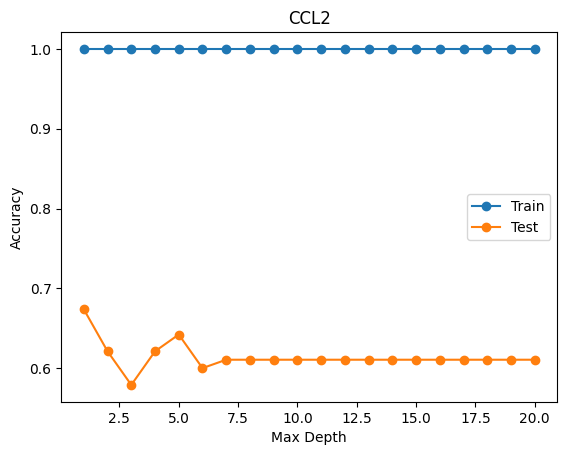

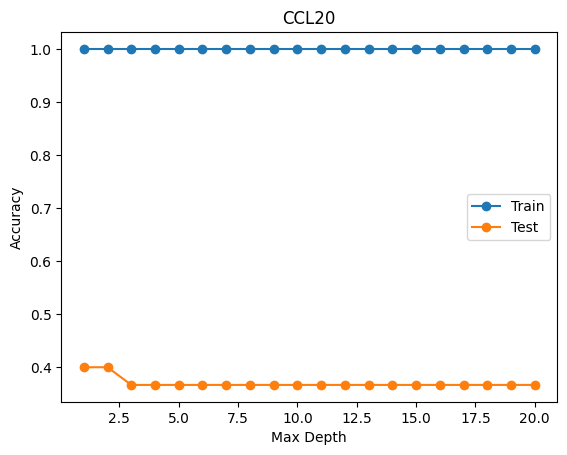

...

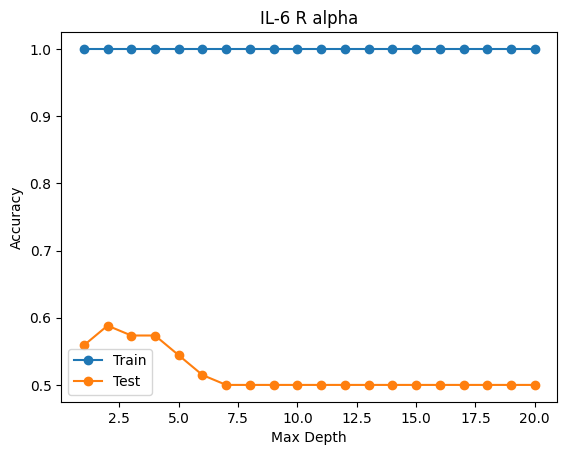

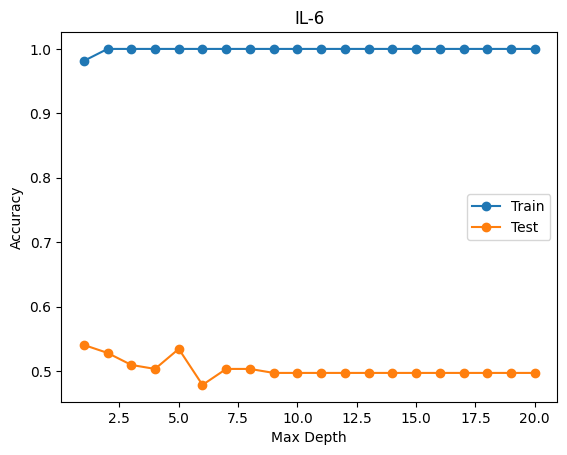

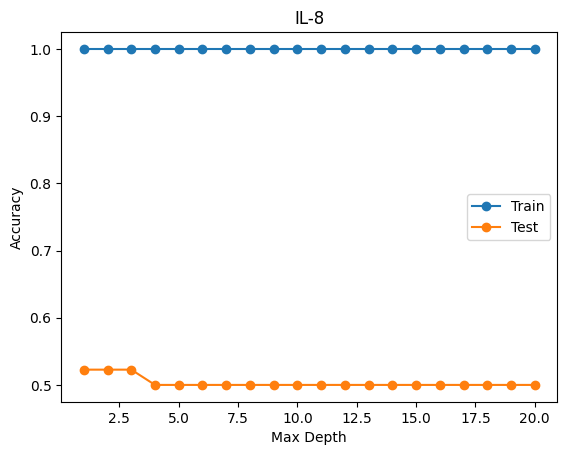

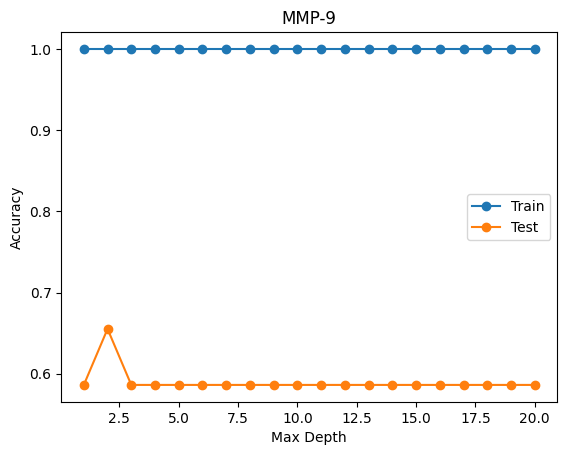

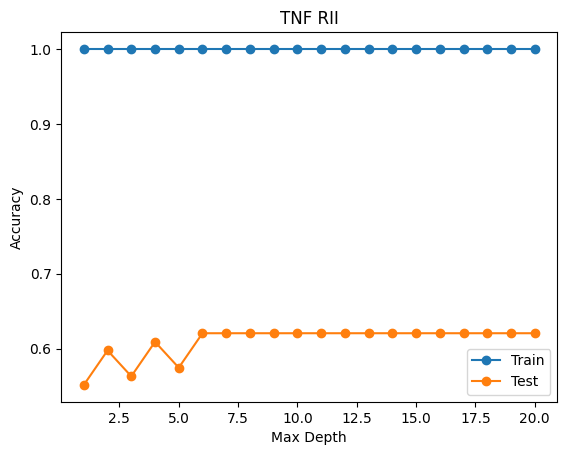

In [82]:
#As the tree becomes deeper, it is more complex. 
#It is likely that a pretty shallow tree will do, since we only have 10 PCA features. 

# We will enumerate each tree depth, fit a tree with a given depth on the training dataset, 
#then evaluate the tree on both the train and test sets.

# I expect that as the depth of the tree increases, 
#performance on train and test will improve to a point, and as the tree gets too deep, 
#it will begin to overfit the training dataset at the expense of worse performance on the holdout test set.



# define the tree depths to evaluate
values = [i for i in range(1, 21)]

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    for i in values:
         # configure the model
         model = XGBClassifier(n_estimators=100, max_depth=i, learning_rate=1, objective='binary:logistic')
         # fit model on the training dataset
         model.fit(X_train, y_train)
         # evaluate on the train dataset
         train_yhat = model.predict(X_train)
         train_acc = accuracy_score(y_train, train_yhat)
         train_scores.append(train_acc)
         # evaluate on the test dataset
         test_yhat = model.predict(X_test)
         test_acc = accuracy_score(y_test, test_yhat)
         test_scores.append(test_acc)
         # summarize progress
#          print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    # plot of train and test scores vs tree depth
    plt.plot(values, train_scores, '-o', label='Train')
    plt.plot(values, test_scores, '-o', label='Test')
    plt.legend()
    plt.title(df.columns[0])
    plt.xlabel("Max Depth")
    plt.ylabel("Accuracy")
    plt.show()
        
    
        
           

It is true that we do not need much depth at all.
For the cytokines that aren't completely flat have the best accuracy around depth 3.

# Overfitting examination with PCA features only

In [127]:
#first, just verify some code to make sure we can get metrics per epoch our of our PCA data

#looks good

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    eval_set = [(X_train, y_train), (X_test, y_test)]
    for i in values:
         # configure the model
         model = XGBClassifier(n_estimators=100, max_depth=i, learning_rate=0.01, objective='binary:logistic')
         # fit model on the training dataset
         model.fit(X_train, y_train,eval_metric="rmse", eval_set = eval_set, verbose = True)
         # evaluate on the train dataset
         train_yhat = model.predict(X_train)
         train_acc = accuracy_score(y_train, train_yhat)
         train_scores.append(train_acc)
         # evaluate on the test dataset
         test_yhat = model.predict(X_test)
         test_acc = accuracy_score(y_test, test_yhat)
         test_scores.append(test_acc)
         # summarize progress

[0]	validation_0-rmse:0.49896	validation_1-rmse:0.49918
[1]	validation_0-rmse:0.49793	validation_1-rmse:0.49837
[2]	validation_0-rmse:0.49692	validation_1-rmse:0.49757
[3]	validation_0-rmse:0.49592	validation_1-rmse:0.49679
[4]	validation_0-rmse:0.49494	validation_1-rmse:0.49603
[5]	validation_0-rmse:0.49398	validation_1-rmse:0.49527
[6]	validation_0-rmse:0.49302	validation_1-rmse:0.49453
[7]	validation_0-rmse:0.49209	validation_1-rmse:0.49381
[8]	validation_0-rmse:0.49116	validation_1-rmse:0.49310
[9]	validation_0-rmse:0.49025	validation_1-rmse:0.49240
[10]	validation_0-rmse:0.48936	validation_1-rmse:0.49171
[11]	validation_0-rmse:0.48848	validation_1-rmse:0.49104
[12]	validation_0-rmse:0.48761	validation_1-rmse:0.49037
[13]	validation_0-rmse:0.48676	validation_1-rmse:0.48972
[14]	validation_0-rmse:0.48591	validation_1-rmse:0.48909
[15]	validation_0-rmse:0.48509	validation_1-rmse:0.48846
[16]	validation_0-rmse:0.48427	validation_1-rmse:0.48785
[17]	validation_0-rmse:0.48347	validation

[45]	validation_0-rmse:0.43827	validation_1-rmse:0.47019
[46]	validation_0-rmse:0.43724	validation_1-rmse:0.47028
[47]	validation_0-rmse:0.43633	validation_1-rmse:0.46983
[48]	validation_0-rmse:0.43532	validation_1-rmse:0.46920
[49]	validation_0-rmse:0.43443	validation_1-rmse:0.46876
[50]	validation_0-rmse:0.43344	validation_1-rmse:0.46848
[51]	validation_0-rmse:0.43256	validation_1-rmse:0.46806
[52]	validation_0-rmse:0.43170	validation_1-rmse:0.46794
[53]	validation_0-rmse:0.43072	validation_1-rmse:0.46805
[54]	validation_0-rmse:0.42987	validation_1-rmse:0.46794
[55]	validation_0-rmse:0.42890	validation_1-rmse:0.46768
[56]	validation_0-rmse:0.42807	validation_1-rmse:0.46758
[57]	validation_0-rmse:0.42713	validation_1-rmse:0.46693
[58]	validation_0-rmse:0.42629	validation_1-rmse:0.46653
[59]	validation_0-rmse:0.42548	validation_1-rmse:0.46644
[60]	validation_0-rmse:0.42454	validation_1-rmse:0.46620
[61]	validation_0-rmse:0.42374	validation_1-rmse:0.46611
[62]	validation_0-rmse:0.42242	

[89]	validation_0-rmse:0.37126	validation_1-rmse:0.45291
[90]	validation_0-rmse:0.37000	validation_1-rmse:0.45261
[91]	validation_0-rmse:0.36917	validation_1-rmse:0.45255
[92]	validation_0-rmse:0.36793	validation_1-rmse:0.45226
[93]	validation_0-rmse:0.36710	validation_1-rmse:0.45204
[94]	validation_0-rmse:0.36584	validation_1-rmse:0.45160
[95]	validation_0-rmse:0.36504	validation_1-rmse:0.45154
[96]	validation_0-rmse:0.36379	validation_1-rmse:0.45111
[97]	validation_0-rmse:0.36299	validation_1-rmse:0.45090
[98]	validation_0-rmse:0.36176	validation_1-rmse:0.45048
[99]	validation_0-rmse:0.36098	validation_1-rmse:0.45044
[0]	validation_0-rmse:0.49794	validation_1-rmse:0.49884
[1]	validation_0-rmse:0.49605	validation_1-rmse:0.49817
[2]	validation_0-rmse:0.49410	validation_1-rmse:0.49662
[3]	validation_0-rmse:0.49224	validation_1-rmse:0.49598
[4]	validation_0-rmse:0.49033	validation_1-rmse:0.49448
[5]	validation_0-rmse:0.48851	validation_1-rmse:0.49387
[6]	validation_0-rmse:0.48671	validat

[34]	validation_0-rmse:0.44200	validation_1-rmse:0.47322
[35]	validation_0-rmse:0.44066	validation_1-rmse:0.47255
[36]	validation_0-rmse:0.43912	validation_1-rmse:0.47238
[37]	validation_0-rmse:0.43773	validation_1-rmse:0.47138
[38]	validation_0-rmse:0.43648	validation_1-rmse:0.47124
[39]	validation_0-rmse:0.43498	validation_1-rmse:0.47109
[40]	validation_0-rmse:0.43341	validation_1-rmse:0.47062
[41]	validation_0-rmse:0.43215	validation_1-rmse:0.47000
[42]	validation_0-rmse:0.43061	validation_1-rmse:0.46955
[43]	validation_0-rmse:0.42916	validation_1-rmse:0.46944
[44]	validation_0-rmse:0.42793	validation_1-rmse:0.46885
[45]	validation_0-rmse:0.42644	validation_1-rmse:0.46843
[46]	validation_0-rmse:0.42523	validation_1-rmse:0.46785
[47]	validation_0-rmse:0.42384	validation_1-rmse:0.46778
[48]	validation_0-rmse:0.42258	validation_1-rmse:0.46690
[49]	validation_0-rmse:0.42146	validation_1-rmse:0.46684
[50]	validation_0-rmse:0.42010	validation_1-rmse:0.46679
[51]	validation_0-rmse:0.41868	

[78]	validation_0-rmse:0.38366	validation_1-rmse:0.45674
[79]	validation_0-rmse:0.38227	validation_1-rmse:0.45636
[80]	validation_0-rmse:0.38090	validation_1-rmse:0.45599
[81]	validation_0-rmse:0.37955	validation_1-rmse:0.45563
[82]	validation_0-rmse:0.37835	validation_1-rmse:0.45530
[83]	validation_0-rmse:0.37702	validation_1-rmse:0.45496
[84]	validation_0-rmse:0.37570	validation_1-rmse:0.45463
[85]	validation_0-rmse:0.37453	validation_1-rmse:0.45432
[86]	validation_0-rmse:0.37323	validation_1-rmse:0.45400
[87]	validation_0-rmse:0.37214	validation_1-rmse:0.45382
[88]	validation_0-rmse:0.37086	validation_1-rmse:0.45351
[89]	validation_0-rmse:0.36978	validation_1-rmse:0.45333
[90]	validation_0-rmse:0.36872	validation_1-rmse:0.45316
[91]	validation_0-rmse:0.36747	validation_1-rmse:0.45287
[92]	validation_0-rmse:0.36642	validation_1-rmse:0.45271
[93]	validation_0-rmse:0.36515	validation_1-rmse:0.45227
[94]	validation_0-rmse:0.36412	validation_1-rmse:0.45212
[95]	validation_0-rmse:0.36313	

[23]	validation_0-rmse:0.45838	validation_1-rmse:0.47903
[24]	validation_0-rmse:0.45687	validation_1-rmse:0.47839
[25]	validation_0-rmse:0.45539	validation_1-rmse:0.47762
[26]	validation_0-rmse:0.45391	validation_1-rmse:0.47701
[27]	validation_0-rmse:0.45252	validation_1-rmse:0.47678
[28]	validation_0-rmse:0.45115	validation_1-rmse:0.47656
[29]	validation_0-rmse:0.44966	validation_1-rmse:0.47546
[30]	validation_0-rmse:0.44831	validation_1-rmse:0.47526
[31]	validation_0-rmse:0.44670	validation_1-rmse:0.47503
[32]	validation_0-rmse:0.44502	validation_1-rmse:0.47446
[33]	validation_0-rmse:0.44365	validation_1-rmse:0.47377
[34]	validation_0-rmse:0.44200	validation_1-rmse:0.47322
[35]	validation_0-rmse:0.44066	validation_1-rmse:0.47255
[36]	validation_0-rmse:0.43912	validation_1-rmse:0.47238
[37]	validation_0-rmse:0.43773	validation_1-rmse:0.47138
[38]	validation_0-rmse:0.43648	validation_1-rmse:0.47124
[39]	validation_0-rmse:0.43498	validation_1-rmse:0.47109
[40]	validation_0-rmse:0.43341	

[67]	validation_0-rmse:0.39773	validation_1-rmse:0.46028
[68]	validation_0-rmse:0.39647	validation_1-rmse:0.46004
[69]	validation_0-rmse:0.39515	validation_1-rmse:0.45960
[70]	validation_0-rmse:0.39383	validation_1-rmse:0.45920
[71]	validation_0-rmse:0.39268	validation_1-rmse:0.45899
[72]	validation_0-rmse:0.39139	validation_1-rmse:0.45857
[73]	validation_0-rmse:0.39026	validation_1-rmse:0.45864
[74]	validation_0-rmse:0.38899	validation_1-rmse:0.45826
[75]	validation_0-rmse:0.38773	validation_1-rmse:0.45790
[76]	validation_0-rmse:0.38630	validation_1-rmse:0.45749
[77]	validation_0-rmse:0.38489	validation_1-rmse:0.45709
[78]	validation_0-rmse:0.38366	validation_1-rmse:0.45674
[79]	validation_0-rmse:0.38227	validation_1-rmse:0.45636
[80]	validation_0-rmse:0.38090	validation_1-rmse:0.45599
[81]	validation_0-rmse:0.37955	validation_1-rmse:0.45563
[82]	validation_0-rmse:0.37835	validation_1-rmse:0.45530
[83]	validation_0-rmse:0.37702	validation_1-rmse:0.45496
[84]	validation_0-rmse:0.37570	

[12]	validation_0-rmse:0.47615	validation_1-rmse:0.48742
[13]	validation_0-rmse:0.47440	validation_1-rmse:0.48652
[14]	validation_0-rmse:0.47274	validation_1-rmse:0.48560
[15]	validation_0-rmse:0.47103	validation_1-rmse:0.48475
[16]	validation_0-rmse:0.46941	validation_1-rmse:0.48386
[17]	validation_0-rmse:0.46780	validation_1-rmse:0.48343
[18]	validation_0-rmse:0.46614	validation_1-rmse:0.48218
[19]	validation_0-rmse:0.46457	validation_1-rmse:0.48178
[20]	validation_0-rmse:0.46302	validation_1-rmse:0.48094
[21]	validation_0-rmse:0.46140	validation_1-rmse:0.48018
[22]	validation_0-rmse:0.45988	validation_1-rmse:0.47938
[23]	validation_0-rmse:0.45838	validation_1-rmse:0.47903
[24]	validation_0-rmse:0.45687	validation_1-rmse:0.47839
[25]	validation_0-rmse:0.45539	validation_1-rmse:0.47762
[26]	validation_0-rmse:0.45391	validation_1-rmse:0.47701
[27]	validation_0-rmse:0.45252	validation_1-rmse:0.47678
[28]	validation_0-rmse:0.45115	validation_1-rmse:0.47656
[29]	validation_0-rmse:0.44966	

[56]	validation_0-rmse:0.41237	validation_1-rmse:0.46464
[57]	validation_0-rmse:0.41127	validation_1-rmse:0.46406
[58]	validation_0-rmse:0.40982	validation_1-rmse:0.46355
[59]	validation_0-rmse:0.40838	validation_1-rmse:0.46305
[60]	validation_0-rmse:0.40706	validation_1-rmse:0.46277
[61]	validation_0-rmse:0.40564	validation_1-rmse:0.46230
[62]	validation_0-rmse:0.40424	validation_1-rmse:0.46183
[63]	validation_0-rmse:0.40302	validation_1-rmse:0.46186
[64]	validation_0-rmse:0.40164	validation_1-rmse:0.46138
[65]	validation_0-rmse:0.40027	validation_1-rmse:0.46094
[66]	validation_0-rmse:0.39908	validation_1-rmse:0.46070
[67]	validation_0-rmse:0.39773	validation_1-rmse:0.46028
[68]	validation_0-rmse:0.39647	validation_1-rmse:0.46004
[69]	validation_0-rmse:0.39515	validation_1-rmse:0.45960
[70]	validation_0-rmse:0.39383	validation_1-rmse:0.45920
[71]	validation_0-rmse:0.39268	validation_1-rmse:0.45899
[72]	validation_0-rmse:0.39139	validation_1-rmse:0.45857
[73]	validation_0-rmse:0.39026	

[0]	validation_0-rmse:0.49794	validation_1-rmse:0.49884
[1]	validation_0-rmse:0.49605	validation_1-rmse:0.49817
[2]	validation_0-rmse:0.49410	validation_1-rmse:0.49662
[3]	validation_0-rmse:0.49224	validation_1-rmse:0.49598
[4]	validation_0-rmse:0.49033	validation_1-rmse:0.49448
[5]	validation_0-rmse:0.48851	validation_1-rmse:0.49387
[6]	validation_0-rmse:0.48671	validation_1-rmse:0.49283
[7]	validation_0-rmse:0.48486	validation_1-rmse:0.49183
[8]	validation_0-rmse:0.48309	validation_1-rmse:0.49082
[9]	validation_0-rmse:0.48135	validation_1-rmse:0.49027
[10]	validation_0-rmse:0.47955	validation_1-rmse:0.48888
[11]	validation_0-rmse:0.47784	validation_1-rmse:0.48837
[12]	validation_0-rmse:0.47615	validation_1-rmse:0.48742
[13]	validation_0-rmse:0.47440	validation_1-rmse:0.48652
[14]	validation_0-rmse:0.47274	validation_1-rmse:0.48560
[15]	validation_0-rmse:0.47103	validation_1-rmse:0.48475
[16]	validation_0-rmse:0.46941	validation_1-rmse:0.48386
[17]	validation_0-rmse:0.46780	validation

[45]	validation_0-rmse:0.42644	validation_1-rmse:0.46843
[46]	validation_0-rmse:0.42523	validation_1-rmse:0.46785
[47]	validation_0-rmse:0.42384	validation_1-rmse:0.46778
[48]	validation_0-rmse:0.42258	validation_1-rmse:0.46690
[49]	validation_0-rmse:0.42146	validation_1-rmse:0.46684
[50]	validation_0-rmse:0.42010	validation_1-rmse:0.46679
[51]	validation_0-rmse:0.41868	validation_1-rmse:0.46643
[52]	validation_0-rmse:0.41754	validation_1-rmse:0.46590
[53]	validation_0-rmse:0.41615	validation_1-rmse:0.46556
[54]	validation_0-rmse:0.41484	validation_1-rmse:0.46555
[55]	validation_0-rmse:0.41373	validation_1-rmse:0.46495
[56]	validation_0-rmse:0.41237	validation_1-rmse:0.46464
[57]	validation_0-rmse:0.41127	validation_1-rmse:0.46406
[58]	validation_0-rmse:0.40982	validation_1-rmse:0.46355
[59]	validation_0-rmse:0.40838	validation_1-rmse:0.46305
[60]	validation_0-rmse:0.40706	validation_1-rmse:0.46277
[61]	validation_0-rmse:0.40564	validation_1-rmse:0.46230
[62]	validation_0-rmse:0.40424	

[89]	validation_0-rmse:0.36978	validation_1-rmse:0.45333
[90]	validation_0-rmse:0.36872	validation_1-rmse:0.45316
[91]	validation_0-rmse:0.36747	validation_1-rmse:0.45287
[92]	validation_0-rmse:0.36642	validation_1-rmse:0.45271
[93]	validation_0-rmse:0.36515	validation_1-rmse:0.45227
[94]	validation_0-rmse:0.36412	validation_1-rmse:0.45212
[95]	validation_0-rmse:0.36313	validation_1-rmse:0.45197
[96]	validation_0-rmse:0.36209	validation_1-rmse:0.45166
[97]	validation_0-rmse:0.36085	validation_1-rmse:0.45124
[98]	validation_0-rmse:0.35982	validation_1-rmse:0.45093
[99]	validation_0-rmse:0.35859	validation_1-rmse:0.45052
[0]	validation_0-rmse:0.49794	validation_1-rmse:0.49884
[1]	validation_0-rmse:0.49605	validation_1-rmse:0.49817
[2]	validation_0-rmse:0.49410	validation_1-rmse:0.49662
[3]	validation_0-rmse:0.49224	validation_1-rmse:0.49598
[4]	validation_0-rmse:0.49033	validation_1-rmse:0.49448
[5]	validation_0-rmse:0.48851	validation_1-rmse:0.49387
[6]	validation_0-rmse:0.48671	validat

[34]	validation_0-rmse:0.44200	validation_1-rmse:0.47322
[35]	validation_0-rmse:0.44066	validation_1-rmse:0.47255
[36]	validation_0-rmse:0.43912	validation_1-rmse:0.47238
[37]	validation_0-rmse:0.43773	validation_1-rmse:0.47138
[38]	validation_0-rmse:0.43648	validation_1-rmse:0.47124
[39]	validation_0-rmse:0.43498	validation_1-rmse:0.47109
[40]	validation_0-rmse:0.43341	validation_1-rmse:0.47062
[41]	validation_0-rmse:0.43215	validation_1-rmse:0.47000
[42]	validation_0-rmse:0.43061	validation_1-rmse:0.46955
[43]	validation_0-rmse:0.42916	validation_1-rmse:0.46944
[44]	validation_0-rmse:0.42793	validation_1-rmse:0.46885
[45]	validation_0-rmse:0.42644	validation_1-rmse:0.46843
[46]	validation_0-rmse:0.42523	validation_1-rmse:0.46785
[47]	validation_0-rmse:0.42384	validation_1-rmse:0.46778
[48]	validation_0-rmse:0.42258	validation_1-rmse:0.46690
[49]	validation_0-rmse:0.42146	validation_1-rmse:0.46684
[50]	validation_0-rmse:0.42010	validation_1-rmse:0.46679
[51]	validation_0-rmse:0.41868	

[78]	validation_0-rmse:0.38366	validation_1-rmse:0.45674
[79]	validation_0-rmse:0.38227	validation_1-rmse:0.45636
[80]	validation_0-rmse:0.38090	validation_1-rmse:0.45599
[81]	validation_0-rmse:0.37955	validation_1-rmse:0.45563
[82]	validation_0-rmse:0.37835	validation_1-rmse:0.45530
[83]	validation_0-rmse:0.37702	validation_1-rmse:0.45496
[84]	validation_0-rmse:0.37570	validation_1-rmse:0.45463
[85]	validation_0-rmse:0.37453	validation_1-rmse:0.45432
[86]	validation_0-rmse:0.37323	validation_1-rmse:0.45400
[87]	validation_0-rmse:0.37214	validation_1-rmse:0.45382
[88]	validation_0-rmse:0.37086	validation_1-rmse:0.45351
[89]	validation_0-rmse:0.36978	validation_1-rmse:0.45333
[90]	validation_0-rmse:0.36872	validation_1-rmse:0.45316
[91]	validation_0-rmse:0.36747	validation_1-rmse:0.45287
[92]	validation_0-rmse:0.36642	validation_1-rmse:0.45271
[93]	validation_0-rmse:0.36515	validation_1-rmse:0.45227
[94]	validation_0-rmse:0.36412	validation_1-rmse:0.45212
[95]	validation_0-rmse:0.36313	

[23]	validation_0-rmse:0.48380	validation_1-rmse:0.51205
[24]	validation_0-rmse:0.48325	validation_1-rmse:0.51256
[25]	validation_0-rmse:0.48271	validation_1-rmse:0.51273
[26]	validation_0-rmse:0.48217	validation_1-rmse:0.51323
[27]	validation_0-rmse:0.48163	validation_1-rmse:0.51340
[28]	validation_0-rmse:0.48109	validation_1-rmse:0.51391
[29]	validation_0-rmse:0.48056	validation_1-rmse:0.51408
[30]	validation_0-rmse:0.48003	validation_1-rmse:0.51426
[31]	validation_0-rmse:0.47951	validation_1-rmse:0.51477
[32]	validation_0-rmse:0.47899	validation_1-rmse:0.51495
[33]	validation_0-rmse:0.47848	validation_1-rmse:0.51545
[34]	validation_0-rmse:0.47797	validation_1-rmse:0.51564
[35]	validation_0-rmse:0.47746	validation_1-rmse:0.51614
[36]	validation_0-rmse:0.47695	validation_1-rmse:0.51633
[37]	validation_0-rmse:0.47645	validation_1-rmse:0.51683
[38]	validation_0-rmse:0.47596	validation_1-rmse:0.51702
[39]	validation_0-rmse:0.47547	validation_1-rmse:0.51753
[40]	validation_0-rmse:0.47498	

[67]	validation_0-rmse:0.42034	validation_1-rmse:0.53609
[68]	validation_0-rmse:0.41964	validation_1-rmse:0.53635
[69]	validation_0-rmse:0.41903	validation_1-rmse:0.53696
[70]	validation_0-rmse:0.41835	validation_1-rmse:0.53721
[71]	validation_0-rmse:0.41775	validation_1-rmse:0.53782
[72]	validation_0-rmse:0.41716	validation_1-rmse:0.53843
[73]	validation_0-rmse:0.41649	validation_1-rmse:0.53869
[74]	validation_0-rmse:0.41591	validation_1-rmse:0.53929
[75]	validation_0-rmse:0.41525	validation_1-rmse:0.53957
[76]	validation_0-rmse:0.41460	validation_1-rmse:0.53983
[77]	validation_0-rmse:0.41401	validation_1-rmse:0.54016
[78]	validation_0-rmse:0.41337	validation_1-rmse:0.54042
[79]	validation_0-rmse:0.41281	validation_1-rmse:0.54103
[80]	validation_0-rmse:0.41218	validation_1-rmse:0.54131
[81]	validation_0-rmse:0.41155	validation_1-rmse:0.54157
[82]	validation_0-rmse:0.41093	validation_1-rmse:0.54185
[83]	validation_0-rmse:0.41031	validation_1-rmse:0.54214
[84]	validation_0-rmse:0.40970	

[12]	validation_0-rmse:0.47528	validation_1-rmse:0.50446
[13]	validation_0-rmse:0.47356	validation_1-rmse:0.50484
[14]	validation_0-rmse:0.47185	validation_1-rmse:0.50529
[15]	validation_0-rmse:0.47017	validation_1-rmse:0.50569
[16]	validation_0-rmse:0.46850	validation_1-rmse:0.50615
[17]	validation_0-rmse:0.46685	validation_1-rmse:0.50656
[18]	validation_0-rmse:0.46528	validation_1-rmse:0.50706
[19]	validation_0-rmse:0.46366	validation_1-rmse:0.50754
[20]	validation_0-rmse:0.46148	validation_1-rmse:0.50802
[21]	validation_0-rmse:0.45995	validation_1-rmse:0.50853
[22]	validation_0-rmse:0.45780	validation_1-rmse:0.50902
[23]	validation_0-rmse:0.45572	validation_1-rmse:0.50960
[24]	validation_0-rmse:0.45360	validation_1-rmse:0.51011
[25]	validation_0-rmse:0.45213	validation_1-rmse:0.51062
[26]	validation_0-rmse:0.45004	validation_1-rmse:0.51114
[27]	validation_0-rmse:0.44803	validation_1-rmse:0.51174
[28]	validation_0-rmse:0.44660	validation_1-rmse:0.51226
[29]	validation_0-rmse:0.44455	

[56]	validation_0-rmse:0.40000	validation_1-rmse:0.52824
[57]	validation_0-rmse:0.39836	validation_1-rmse:0.52884
[58]	validation_0-rmse:0.39707	validation_1-rmse:0.52956
[59]	validation_0-rmse:0.39594	validation_1-rmse:0.52999
[60]	validation_0-rmse:0.39457	validation_1-rmse:0.53072
[61]	validation_0-rmse:0.39323	validation_1-rmse:0.53146
[62]	validation_0-rmse:0.39189	validation_1-rmse:0.53220
[63]	validation_0-rmse:0.39057	validation_1-rmse:0.53295
[64]	validation_0-rmse:0.38953	validation_1-rmse:0.53344
[65]	validation_0-rmse:0.38823	validation_1-rmse:0.53418
[66]	validation_0-rmse:0.38695	validation_1-rmse:0.53494
[67]	validation_0-rmse:0.38568	validation_1-rmse:0.53568
[68]	validation_0-rmse:0.38442	validation_1-rmse:0.53644
[69]	validation_0-rmse:0.38318	validation_1-rmse:0.53718
[70]	validation_0-rmse:0.38195	validation_1-rmse:0.53794
[71]	validation_0-rmse:0.38074	validation_1-rmse:0.53869
[72]	validation_0-rmse:0.37953	validation_1-rmse:0.53945
[73]	validation_0-rmse:0.37835	

[0]	validation_0-rmse:0.49746	validation_1-rmse:0.50014
[1]	validation_0-rmse:0.49550	validation_1-rmse:0.50042
[2]	validation_0-rmse:0.49357	validation_1-rmse:0.50077
[3]	validation_0-rmse:0.49165	validation_1-rmse:0.50107
[4]	validation_0-rmse:0.48975	validation_1-rmse:0.50144
[5]	validation_0-rmse:0.48788	validation_1-rmse:0.50176
[6]	validation_0-rmse:0.48602	validation_1-rmse:0.50214
[7]	validation_0-rmse:0.48418	validation_1-rmse:0.50248
[8]	validation_0-rmse:0.48236	validation_1-rmse:0.50288
[9]	validation_0-rmse:0.48057	validation_1-rmse:0.50324
[10]	validation_0-rmse:0.47879	validation_1-rmse:0.50366
[11]	validation_0-rmse:0.47702	validation_1-rmse:0.50402
[12]	validation_0-rmse:0.47528	validation_1-rmse:0.50446
[13]	validation_0-rmse:0.47356	validation_1-rmse:0.50484
[14]	validation_0-rmse:0.47185	validation_1-rmse:0.50529
[15]	validation_0-rmse:0.47017	validation_1-rmse:0.50569
[16]	validation_0-rmse:0.46850	validation_1-rmse:0.50615
[17]	validation_0-rmse:0.46685	validation

[45]	validation_0-rmse:0.41709	validation_1-rmse:0.52175
[46]	validation_0-rmse:0.41536	validation_1-rmse:0.52241
[47]	validation_0-rmse:0.41359	validation_1-rmse:0.52300
[48]	validation_0-rmse:0.41189	validation_1-rmse:0.52366
[49]	validation_0-rmse:0.41064	validation_1-rmse:0.52410
[50]	validation_0-rmse:0.40897	validation_1-rmse:0.52477
[51]	validation_0-rmse:0.40724	validation_1-rmse:0.52536
[52]	validation_0-rmse:0.40609	validation_1-rmse:0.52587
[53]	validation_0-rmse:0.40440	validation_1-rmse:0.52646
[54]	validation_0-rmse:0.40278	validation_1-rmse:0.52714
[55]	validation_0-rmse:0.40111	validation_1-rmse:0.52774
[56]	validation_0-rmse:0.40000	validation_1-rmse:0.52824
[57]	validation_0-rmse:0.39836	validation_1-rmse:0.52884
[58]	validation_0-rmse:0.39707	validation_1-rmse:0.52956
[59]	validation_0-rmse:0.39594	validation_1-rmse:0.52999
[60]	validation_0-rmse:0.39457	validation_1-rmse:0.53072
[61]	validation_0-rmse:0.39323	validation_1-rmse:0.53146
[62]	validation_0-rmse:0.39189	

[89]	validation_0-rmse:0.36121	validation_1-rmse:0.55155
[90]	validation_0-rmse:0.36022	validation_1-rmse:0.55228
[91]	validation_0-rmse:0.35932	validation_1-rmse:0.55271
[92]	validation_0-rmse:0.35835	validation_1-rmse:0.55343
[93]	validation_0-rmse:0.35738	validation_1-rmse:0.55418
[94]	validation_0-rmse:0.35642	validation_1-rmse:0.55490
[95]	validation_0-rmse:0.35547	validation_1-rmse:0.55563
[96]	validation_0-rmse:0.35428	validation_1-rmse:0.55548
[97]	validation_0-rmse:0.35311	validation_1-rmse:0.55532
[98]	validation_0-rmse:0.35225	validation_1-rmse:0.55574
[99]	validation_0-rmse:0.35132	validation_1-rmse:0.55645
[0]	validation_0-rmse:0.49746	validation_1-rmse:0.50014
[1]	validation_0-rmse:0.49550	validation_1-rmse:0.50042
[2]	validation_0-rmse:0.49357	validation_1-rmse:0.50077
[3]	validation_0-rmse:0.49165	validation_1-rmse:0.50107
[4]	validation_0-rmse:0.48975	validation_1-rmse:0.50144
[5]	validation_0-rmse:0.48788	validation_1-rmse:0.50176
[6]	validation_0-rmse:0.48602	validat

[34]	validation_0-rmse:0.43532	validation_1-rmse:0.51563
[35]	validation_0-rmse:0.43391	validation_1-rmse:0.51607
[36]	validation_0-rmse:0.43203	validation_1-rmse:0.51670
[37]	validation_0-rmse:0.43011	validation_1-rmse:0.51726
[38]	validation_0-rmse:0.42827	validation_1-rmse:0.51790
[39]	validation_0-rmse:0.42691	validation_1-rmse:0.51834
[40]	validation_0-rmse:0.42510	validation_1-rmse:0.51899
[41]	validation_0-rmse:0.42324	validation_1-rmse:0.51956
[42]	validation_0-rmse:0.42198	validation_1-rmse:0.52008
[43]	validation_0-rmse:0.42014	validation_1-rmse:0.52066
[44]	validation_0-rmse:0.41838	validation_1-rmse:0.52131
[45]	validation_0-rmse:0.41709	validation_1-rmse:0.52175
[46]	validation_0-rmse:0.41536	validation_1-rmse:0.52241
[47]	validation_0-rmse:0.41359	validation_1-rmse:0.52300
[48]	validation_0-rmse:0.41189	validation_1-rmse:0.52366
[49]	validation_0-rmse:0.41064	validation_1-rmse:0.52410
[50]	validation_0-rmse:0.40897	validation_1-rmse:0.52477
[51]	validation_0-rmse:0.40724	

[22]	validation_0-rmse:0.45780	validation_1-rmse:0.50902
[23]	validation_0-rmse:0.45572	validation_1-rmse:0.50960
[24]	validation_0-rmse:0.45360	validation_1-rmse:0.51011
[25]	validation_0-rmse:0.45213	validation_1-rmse:0.51062
[26]	validation_0-rmse:0.45004	validation_1-rmse:0.51114
[27]	validation_0-rmse:0.44803	validation_1-rmse:0.51174
[28]	validation_0-rmse:0.44660	validation_1-rmse:0.51226
[29]	validation_0-rmse:0.44455	validation_1-rmse:0.51278
[30]	validation_0-rmse:0.44259	validation_1-rmse:0.51340
[31]	validation_0-rmse:0.44058	validation_1-rmse:0.51394
[32]	validation_0-rmse:0.43920	validation_1-rmse:0.51446
[33]	validation_0-rmse:0.43722	validation_1-rmse:0.51500
[34]	validation_0-rmse:0.43532	validation_1-rmse:0.51563
[35]	validation_0-rmse:0.43391	validation_1-rmse:0.51607
[36]	validation_0-rmse:0.43203	validation_1-rmse:0.51670
[37]	validation_0-rmse:0.43011	validation_1-rmse:0.51726
[38]	validation_0-rmse:0.42827	validation_1-rmse:0.51790
[39]	validation_0-rmse:0.42691	

[66]	validation_0-rmse:0.38695	validation_1-rmse:0.53494
[67]	validation_0-rmse:0.38568	validation_1-rmse:0.53568
[68]	validation_0-rmse:0.38442	validation_1-rmse:0.53644
[69]	validation_0-rmse:0.38318	validation_1-rmse:0.53718
[70]	validation_0-rmse:0.38195	validation_1-rmse:0.53794
[71]	validation_0-rmse:0.38074	validation_1-rmse:0.53869
[72]	validation_0-rmse:0.37953	validation_1-rmse:0.53945
[73]	validation_0-rmse:0.37835	validation_1-rmse:0.54020
[74]	validation_0-rmse:0.37717	validation_1-rmse:0.54096
[75]	validation_0-rmse:0.37619	validation_1-rmse:0.54143
[76]	validation_0-rmse:0.37504	validation_1-rmse:0.54216
[77]	validation_0-rmse:0.37389	validation_1-rmse:0.54292
[78]	validation_0-rmse:0.37276	validation_1-rmse:0.54366
[79]	validation_0-rmse:0.37164	validation_1-rmse:0.54442
[80]	validation_0-rmse:0.37054	validation_1-rmse:0.54516
[81]	validation_0-rmse:0.36944	validation_1-rmse:0.54592
[82]	validation_0-rmse:0.36836	validation_1-rmse:0.54665
[83]	validation_0-rmse:0.36743	

[11]	validation_0-rmse:0.47702	validation_1-rmse:0.50402
[12]	validation_0-rmse:0.47528	validation_1-rmse:0.50446
[13]	validation_0-rmse:0.47356	validation_1-rmse:0.50484
[14]	validation_0-rmse:0.47185	validation_1-rmse:0.50529
[15]	validation_0-rmse:0.47017	validation_1-rmse:0.50569
[16]	validation_0-rmse:0.46850	validation_1-rmse:0.50615
[17]	validation_0-rmse:0.46685	validation_1-rmse:0.50656
[18]	validation_0-rmse:0.46528	validation_1-rmse:0.50706
[19]	validation_0-rmse:0.46366	validation_1-rmse:0.50754
[20]	validation_0-rmse:0.46148	validation_1-rmse:0.50802
[21]	validation_0-rmse:0.45995	validation_1-rmse:0.50853
[22]	validation_0-rmse:0.45780	validation_1-rmse:0.50902
[23]	validation_0-rmse:0.45572	validation_1-rmse:0.50960
[24]	validation_0-rmse:0.45360	validation_1-rmse:0.51011
[25]	validation_0-rmse:0.45213	validation_1-rmse:0.51062
[26]	validation_0-rmse:0.45004	validation_1-rmse:0.51114
[27]	validation_0-rmse:0.44803	validation_1-rmse:0.51174
[28]	validation_0-rmse:0.44660	

[55]	validation_0-rmse:0.40111	validation_1-rmse:0.52774
[56]	validation_0-rmse:0.40000	validation_1-rmse:0.52824
[57]	validation_0-rmse:0.39836	validation_1-rmse:0.52884
[58]	validation_0-rmse:0.39707	validation_1-rmse:0.52956
[59]	validation_0-rmse:0.39594	validation_1-rmse:0.52999
[60]	validation_0-rmse:0.39457	validation_1-rmse:0.53072
[61]	validation_0-rmse:0.39323	validation_1-rmse:0.53146
[62]	validation_0-rmse:0.39189	validation_1-rmse:0.53220
[63]	validation_0-rmse:0.39057	validation_1-rmse:0.53295
[64]	validation_0-rmse:0.38953	validation_1-rmse:0.53344
[65]	validation_0-rmse:0.38823	validation_1-rmse:0.53418
[66]	validation_0-rmse:0.38695	validation_1-rmse:0.53494
[67]	validation_0-rmse:0.38568	validation_1-rmse:0.53568
[68]	validation_0-rmse:0.38442	validation_1-rmse:0.53644
[69]	validation_0-rmse:0.38318	validation_1-rmse:0.53718
[70]	validation_0-rmse:0.38195	validation_1-rmse:0.53794
[71]	validation_0-rmse:0.38074	validation_1-rmse:0.53869
[72]	validation_0-rmse:0.37953	

[99]	validation_0-rmse:0.35132	validation_1-rmse:0.55645
[0]	validation_0-rmse:0.49746	validation_1-rmse:0.50014
[1]	validation_0-rmse:0.49550	validation_1-rmse:0.50042
[2]	validation_0-rmse:0.49357	validation_1-rmse:0.50077
[3]	validation_0-rmse:0.49165	validation_1-rmse:0.50107
[4]	validation_0-rmse:0.48975	validation_1-rmse:0.50144
[5]	validation_0-rmse:0.48788	validation_1-rmse:0.50176
[6]	validation_0-rmse:0.48602	validation_1-rmse:0.50214
[7]	validation_0-rmse:0.48418	validation_1-rmse:0.50248
[8]	validation_0-rmse:0.48236	validation_1-rmse:0.50288
[9]	validation_0-rmse:0.48057	validation_1-rmse:0.50324
[10]	validation_0-rmse:0.47879	validation_1-rmse:0.50366
[11]	validation_0-rmse:0.47702	validation_1-rmse:0.50402
[12]	validation_0-rmse:0.47528	validation_1-rmse:0.50446
[13]	validation_0-rmse:0.47356	validation_1-rmse:0.50484
[14]	validation_0-rmse:0.47185	validation_1-rmse:0.50529
[15]	validation_0-rmse:0.47017	validation_1-rmse:0.50569
[16]	validation_0-rmse:0.46850	validation

[44]	validation_0-rmse:0.44543	validation_1-rmse:0.52672
[45]	validation_0-rmse:0.44440	validation_1-rmse:0.52747
[46]	validation_0-rmse:0.44338	validation_1-rmse:0.52796
[47]	validation_0-rmse:0.44236	validation_1-rmse:0.52871
[48]	validation_0-rmse:0.44135	validation_1-rmse:0.52921
[49]	validation_0-rmse:0.44034	validation_1-rmse:0.52996
[50]	validation_0-rmse:0.43935	validation_1-rmse:0.53045
[51]	validation_0-rmse:0.43836	validation_1-rmse:0.53120
[52]	validation_0-rmse:0.43737	validation_1-rmse:0.53170
[53]	validation_0-rmse:0.43639	validation_1-rmse:0.53244
[54]	validation_0-rmse:0.43542	validation_1-rmse:0.53294
[55]	validation_0-rmse:0.43446	validation_1-rmse:0.53369
[56]	validation_0-rmse:0.43350	validation_1-rmse:0.53419
[57]	validation_0-rmse:0.43255	validation_1-rmse:0.53493
[58]	validation_0-rmse:0.43160	validation_1-rmse:0.53543
[59]	validation_0-rmse:0.43066	validation_1-rmse:0.53617
[60]	validation_0-rmse:0.42973	validation_1-rmse:0.53667
[61]	validation_0-rmse:0.42880	

[88]	validation_0-rmse:0.40605	validation_1-rmse:0.55373
[89]	validation_0-rmse:0.40528	validation_1-rmse:0.55443
[90]	validation_0-rmse:0.40452	validation_1-rmse:0.55492
[91]	validation_0-rmse:0.40377	validation_1-rmse:0.55561
[92]	validation_0-rmse:0.40302	validation_1-rmse:0.55610
[93]	validation_0-rmse:0.40228	validation_1-rmse:0.55679
[94]	validation_0-rmse:0.40154	validation_1-rmse:0.55728
[95]	validation_0-rmse:0.40081	validation_1-rmse:0.55796
[96]	validation_0-rmse:0.40008	validation_1-rmse:0.55845
[97]	validation_0-rmse:0.39936	validation_1-rmse:0.55913
[98]	validation_0-rmse:0.39864	validation_1-rmse:0.55961
[99]	validation_0-rmse:0.39793	validation_1-rmse:0.56029
[0]	validation_0-rmse:0.49792	validation_1-rmse:0.50042
[1]	validation_0-rmse:0.49656	validation_1-rmse:0.50114
[2]	validation_0-rmse:0.49522	validation_1-rmse:0.50153
[3]	validation_0-rmse:0.49388	validation_1-rmse:0.50225
[4]	validation_0-rmse:0.49254	validation_1-rmse:0.50265
[5]	validation_0-rmse:0.49122	valida

[33]	validation_0-rmse:0.45722	validation_1-rmse:0.52003
[34]	validation_0-rmse:0.45612	validation_1-rmse:0.52051
[35]	validation_0-rmse:0.45502	validation_1-rmse:0.52127
[36]	validation_0-rmse:0.45392	validation_1-rmse:0.52175
[37]	validation_0-rmse:0.45284	validation_1-rmse:0.52250
[38]	validation_0-rmse:0.45176	validation_1-rmse:0.52299
[39]	validation_0-rmse:0.45069	validation_1-rmse:0.52374
[40]	validation_0-rmse:0.44962	validation_1-rmse:0.52423
[41]	validation_0-rmse:0.44856	validation_1-rmse:0.52498
[42]	validation_0-rmse:0.44751	validation_1-rmse:0.52547
[43]	validation_0-rmse:0.44647	validation_1-rmse:0.52622
[44]	validation_0-rmse:0.44543	validation_1-rmse:0.52672
[45]	validation_0-rmse:0.44440	validation_1-rmse:0.52747
[46]	validation_0-rmse:0.44338	validation_1-rmse:0.52796
[47]	validation_0-rmse:0.44236	validation_1-rmse:0.52871
[48]	validation_0-rmse:0.44135	validation_1-rmse:0.52921
[49]	validation_0-rmse:0.44034	validation_1-rmse:0.52996
[50]	validation_0-rmse:0.43935	

[77]	validation_0-rmse:0.41481	validation_1-rmse:0.54723
[78]	validation_0-rmse:0.41399	validation_1-rmse:0.54772
[79]	validation_0-rmse:0.41317	validation_1-rmse:0.54844
[80]	validation_0-rmse:0.41235	validation_1-rmse:0.54893
[81]	validation_0-rmse:0.41155	validation_1-rmse:0.54964
[82]	validation_0-rmse:0.41074	validation_1-rmse:0.55014
[83]	validation_0-rmse:0.40995	validation_1-rmse:0.55085
[84]	validation_0-rmse:0.40916	validation_1-rmse:0.55134
[85]	validation_0-rmse:0.40837	validation_1-rmse:0.55205
[86]	validation_0-rmse:0.40759	validation_1-rmse:0.55254
[87]	validation_0-rmse:0.40682	validation_1-rmse:0.55324
[88]	validation_0-rmse:0.40605	validation_1-rmse:0.55373
[89]	validation_0-rmse:0.40528	validation_1-rmse:0.55443
[90]	validation_0-rmse:0.40452	validation_1-rmse:0.55492
[91]	validation_0-rmse:0.40377	validation_1-rmse:0.55561
[92]	validation_0-rmse:0.40302	validation_1-rmse:0.55610
[93]	validation_0-rmse:0.40228	validation_1-rmse:0.55679
[94]	validation_0-rmse:0.40154	

[22]	validation_0-rmse:0.46988	validation_1-rmse:0.51318
[23]	validation_0-rmse:0.46869	validation_1-rmse:0.51393
[24]	validation_0-rmse:0.46752	validation_1-rmse:0.51439
[25]	validation_0-rmse:0.46634	validation_1-rmse:0.51514
[26]	validation_0-rmse:0.46518	validation_1-rmse:0.51560
[27]	validation_0-rmse:0.46402	validation_1-rmse:0.51635
[28]	validation_0-rmse:0.46287	validation_1-rmse:0.51683
[29]	validation_0-rmse:0.46173	validation_1-rmse:0.51758
[30]	validation_0-rmse:0.46059	validation_1-rmse:0.51805
[31]	validation_0-rmse:0.45946	validation_1-rmse:0.51880
[32]	validation_0-rmse:0.45834	validation_1-rmse:0.51928
[33]	validation_0-rmse:0.45722	validation_1-rmse:0.52003
[34]	validation_0-rmse:0.45612	validation_1-rmse:0.52051
[35]	validation_0-rmse:0.45502	validation_1-rmse:0.52127
[36]	validation_0-rmse:0.45392	validation_1-rmse:0.52175
[37]	validation_0-rmse:0.45284	validation_1-rmse:0.52250
[38]	validation_0-rmse:0.45176	validation_1-rmse:0.52299
[39]	validation_0-rmse:0.45069	

[66]	validation_0-rmse:0.42427	validation_1-rmse:0.54038
[67]	validation_0-rmse:0.42338	validation_1-rmse:0.54111
[68]	validation_0-rmse:0.42249	validation_1-rmse:0.54161
[69]	validation_0-rmse:0.42162	validation_1-rmse:0.54234
[70]	validation_0-rmse:0.42074	validation_1-rmse:0.54284
[71]	validation_0-rmse:0.41988	validation_1-rmse:0.54357
[72]	validation_0-rmse:0.41902	validation_1-rmse:0.54407
[73]	validation_0-rmse:0.41817	validation_1-rmse:0.54479
[74]	validation_0-rmse:0.41732	validation_1-rmse:0.54529
[75]	validation_0-rmse:0.41648	validation_1-rmse:0.54601
[76]	validation_0-rmse:0.41564	validation_1-rmse:0.54651
[77]	validation_0-rmse:0.41481	validation_1-rmse:0.54723
[78]	validation_0-rmse:0.41399	validation_1-rmse:0.54772
[79]	validation_0-rmse:0.41317	validation_1-rmse:0.54844
[80]	validation_0-rmse:0.41235	validation_1-rmse:0.54893
[81]	validation_0-rmse:0.41155	validation_1-rmse:0.54964
[82]	validation_0-rmse:0.41074	validation_1-rmse:0.55014
[83]	validation_0-rmse:0.40995	

[11]	validation_0-rmse:0.48344	validation_1-rmse:0.50681
[12]	validation_0-rmse:0.48217	validation_1-rmse:0.50724
[13]	validation_0-rmse:0.48090	validation_1-rmse:0.50797
[14]	validation_0-rmse:0.47965	validation_1-rmse:0.50841
[15]	validation_0-rmse:0.47840	validation_1-rmse:0.50915
[16]	validation_0-rmse:0.47716	validation_1-rmse:0.50959
[17]	validation_0-rmse:0.47593	validation_1-rmse:0.51033
[18]	validation_0-rmse:0.47471	validation_1-rmse:0.51078
[19]	validation_0-rmse:0.47349	validation_1-rmse:0.51152
[20]	validation_0-rmse:0.47228	validation_1-rmse:0.51198
[21]	validation_0-rmse:0.47108	validation_1-rmse:0.51272
[22]	validation_0-rmse:0.46988	validation_1-rmse:0.51318
[23]	validation_0-rmse:0.46869	validation_1-rmse:0.51393
[24]	validation_0-rmse:0.46752	validation_1-rmse:0.51439
[25]	validation_0-rmse:0.46634	validation_1-rmse:0.51514
[26]	validation_0-rmse:0.46518	validation_1-rmse:0.51560
[27]	validation_0-rmse:0.46402	validation_1-rmse:0.51635
[28]	validation_0-rmse:0.46287	

[55]	validation_0-rmse:0.43446	validation_1-rmse:0.53369
[56]	validation_0-rmse:0.43350	validation_1-rmse:0.53419
[57]	validation_0-rmse:0.43255	validation_1-rmse:0.53493
[58]	validation_0-rmse:0.43160	validation_1-rmse:0.53543
[59]	validation_0-rmse:0.43066	validation_1-rmse:0.53617
[60]	validation_0-rmse:0.42973	validation_1-rmse:0.53667
[61]	validation_0-rmse:0.42880	validation_1-rmse:0.53741
[62]	validation_0-rmse:0.42788	validation_1-rmse:0.53791
[63]	validation_0-rmse:0.42697	validation_1-rmse:0.53865
[64]	validation_0-rmse:0.42606	validation_1-rmse:0.53915
[65]	validation_0-rmse:0.42516	validation_1-rmse:0.53988
[66]	validation_0-rmse:0.42427	validation_1-rmse:0.54038
[67]	validation_0-rmse:0.42338	validation_1-rmse:0.54111
[68]	validation_0-rmse:0.42249	validation_1-rmse:0.54161
[69]	validation_0-rmse:0.42162	validation_1-rmse:0.54234
[70]	validation_0-rmse:0.42074	validation_1-rmse:0.54284
[71]	validation_0-rmse:0.41988	validation_1-rmse:0.54357
[72]	validation_0-rmse:0.41902	

[99]	validation_0-rmse:0.39793	validation_1-rmse:0.56029
[0]	validation_0-rmse:0.49792	validation_1-rmse:0.50042
[1]	validation_0-rmse:0.49656	validation_1-rmse:0.50114
[2]	validation_0-rmse:0.49522	validation_1-rmse:0.50153
[3]	validation_0-rmse:0.49388	validation_1-rmse:0.50225
[4]	validation_0-rmse:0.49254	validation_1-rmse:0.50265
[5]	validation_0-rmse:0.49122	validation_1-rmse:0.50337
[6]	validation_0-rmse:0.48990	validation_1-rmse:0.50378
[7]	validation_0-rmse:0.48859	validation_1-rmse:0.50450
[8]	validation_0-rmse:0.48729	validation_1-rmse:0.50492
[9]	validation_0-rmse:0.48600	validation_1-rmse:0.50565
[10]	validation_0-rmse:0.48471	validation_1-rmse:0.50607
[11]	validation_0-rmse:0.48344	validation_1-rmse:0.50681
[12]	validation_0-rmse:0.48217	validation_1-rmse:0.50724
[13]	validation_0-rmse:0.48090	validation_1-rmse:0.50797
[14]	validation_0-rmse:0.47965	validation_1-rmse:0.50841
[15]	validation_0-rmse:0.47840	validation_1-rmse:0.50915
[16]	validation_0-rmse:0.47716	validation

[44]	validation_0-rmse:0.44543	validation_1-rmse:0.52672
[45]	validation_0-rmse:0.44440	validation_1-rmse:0.52747
[46]	validation_0-rmse:0.44338	validation_1-rmse:0.52796
[47]	validation_0-rmse:0.44236	validation_1-rmse:0.52871
[48]	validation_0-rmse:0.44135	validation_1-rmse:0.52921
[49]	validation_0-rmse:0.44034	validation_1-rmse:0.52996
[50]	validation_0-rmse:0.43935	validation_1-rmse:0.53045
[51]	validation_0-rmse:0.43836	validation_1-rmse:0.53120
[52]	validation_0-rmse:0.43737	validation_1-rmse:0.53170
[53]	validation_0-rmse:0.43639	validation_1-rmse:0.53244
[54]	validation_0-rmse:0.43542	validation_1-rmse:0.53294
[55]	validation_0-rmse:0.43446	validation_1-rmse:0.53369
[56]	validation_0-rmse:0.43350	validation_1-rmse:0.53419
[57]	validation_0-rmse:0.43255	validation_1-rmse:0.53493
[58]	validation_0-rmse:0.43160	validation_1-rmse:0.53543
[59]	validation_0-rmse:0.43066	validation_1-rmse:0.53617
[60]	validation_0-rmse:0.42973	validation_1-rmse:0.53667
[61]	validation_0-rmse:0.42880	

[32]	validation_0-rmse:0.45834	validation_1-rmse:0.51928
[33]	validation_0-rmse:0.45722	validation_1-rmse:0.52003
[34]	validation_0-rmse:0.45612	validation_1-rmse:0.52051
[35]	validation_0-rmse:0.45502	validation_1-rmse:0.52127
[36]	validation_0-rmse:0.45392	validation_1-rmse:0.52175
[37]	validation_0-rmse:0.45284	validation_1-rmse:0.52250
[38]	validation_0-rmse:0.45176	validation_1-rmse:0.52299
[39]	validation_0-rmse:0.45069	validation_1-rmse:0.52374
[40]	validation_0-rmse:0.44962	validation_1-rmse:0.52423
[41]	validation_0-rmse:0.44856	validation_1-rmse:0.52498
[42]	validation_0-rmse:0.44751	validation_1-rmse:0.52547
[43]	validation_0-rmse:0.44647	validation_1-rmse:0.52622
[44]	validation_0-rmse:0.44543	validation_1-rmse:0.52672
[45]	validation_0-rmse:0.44440	validation_1-rmse:0.52747
[46]	validation_0-rmse:0.44338	validation_1-rmse:0.52796
[47]	validation_0-rmse:0.44236	validation_1-rmse:0.52871
[48]	validation_0-rmse:0.44135	validation_1-rmse:0.52921
[49]	validation_0-rmse:0.44034	

[76]	validation_0-rmse:0.41564	validation_1-rmse:0.54651
[77]	validation_0-rmse:0.41481	validation_1-rmse:0.54723
[78]	validation_0-rmse:0.41399	validation_1-rmse:0.54772
[79]	validation_0-rmse:0.41317	validation_1-rmse:0.54844
[80]	validation_0-rmse:0.41235	validation_1-rmse:0.54893
[81]	validation_0-rmse:0.41155	validation_1-rmse:0.54964
[82]	validation_0-rmse:0.41074	validation_1-rmse:0.55014
[83]	validation_0-rmse:0.40995	validation_1-rmse:0.55085
[84]	validation_0-rmse:0.40916	validation_1-rmse:0.55134
[85]	validation_0-rmse:0.40837	validation_1-rmse:0.55205
[86]	validation_0-rmse:0.40759	validation_1-rmse:0.55254
[87]	validation_0-rmse:0.40682	validation_1-rmse:0.55324
[88]	validation_0-rmse:0.40605	validation_1-rmse:0.55373
[89]	validation_0-rmse:0.40528	validation_1-rmse:0.55443
[90]	validation_0-rmse:0.40452	validation_1-rmse:0.55492
[91]	validation_0-rmse:0.40377	validation_1-rmse:0.55561
[92]	validation_0-rmse:0.40302	validation_1-rmse:0.55610
[93]	validation_0-rmse:0.40228	

[21]	validation_0-rmse:0.47108	validation_1-rmse:0.51272
[22]	validation_0-rmse:0.46988	validation_1-rmse:0.51318
[23]	validation_0-rmse:0.46869	validation_1-rmse:0.51393
[24]	validation_0-rmse:0.46752	validation_1-rmse:0.51439
[25]	validation_0-rmse:0.46634	validation_1-rmse:0.51514
[26]	validation_0-rmse:0.46518	validation_1-rmse:0.51560
[27]	validation_0-rmse:0.46402	validation_1-rmse:0.51635
[28]	validation_0-rmse:0.46287	validation_1-rmse:0.51683
[29]	validation_0-rmse:0.46173	validation_1-rmse:0.51758
[30]	validation_0-rmse:0.46059	validation_1-rmse:0.51805
[31]	validation_0-rmse:0.45946	validation_1-rmse:0.51880
[32]	validation_0-rmse:0.45834	validation_1-rmse:0.51928
[33]	validation_0-rmse:0.45722	validation_1-rmse:0.52003
[34]	validation_0-rmse:0.45612	validation_1-rmse:0.52051
[35]	validation_0-rmse:0.45502	validation_1-rmse:0.52127
[36]	validation_0-rmse:0.45392	validation_1-rmse:0.52175
[37]	validation_0-rmse:0.45284	validation_1-rmse:0.52250
[38]	validation_0-rmse:0.45176	

[65]	validation_0-rmse:0.44932	validation_1-rmse:0.49061
[66]	validation_0-rmse:0.44882	validation_1-rmse:0.49069
[67]	validation_0-rmse:0.44832	validation_1-rmse:0.49043
[68]	validation_0-rmse:0.44783	validation_1-rmse:0.49051
[69]	validation_0-rmse:0.44734	validation_1-rmse:0.49026
[70]	validation_0-rmse:0.44686	validation_1-rmse:0.49034
[71]	validation_0-rmse:0.44638	validation_1-rmse:0.49014
[72]	validation_0-rmse:0.44591	validation_1-rmse:0.48990
[73]	validation_0-rmse:0.44544	validation_1-rmse:0.48998
[74]	validation_0-rmse:0.44498	validation_1-rmse:0.48974
[75]	validation_0-rmse:0.44452	validation_1-rmse:0.48983
[76]	validation_0-rmse:0.44407	validation_1-rmse:0.48965
[77]	validation_0-rmse:0.44363	validation_1-rmse:0.48976
[78]	validation_0-rmse:0.44318	validation_1-rmse:0.48953
[79]	validation_0-rmse:0.44275	validation_1-rmse:0.48963
[80]	validation_0-rmse:0.44231	validation_1-rmse:0.48941
[81]	validation_0-rmse:0.44188	validation_1-rmse:0.48923
[82]	validation_0-rmse:0.44146	

[10]	validation_0-rmse:0.48101	validation_1-rmse:0.49426
[11]	validation_0-rmse:0.47943	validation_1-rmse:0.49384
[12]	validation_0-rmse:0.47786	validation_1-rmse:0.49345
[13]	validation_0-rmse:0.47633	validation_1-rmse:0.49307
[14]	validation_0-rmse:0.47481	validation_1-rmse:0.49271
[15]	validation_0-rmse:0.47331	validation_1-rmse:0.49236
[16]	validation_0-rmse:0.47184	validation_1-rmse:0.49203
[17]	validation_0-rmse:0.47039	validation_1-rmse:0.49171
[18]	validation_0-rmse:0.46887	validation_1-rmse:0.49137
[19]	validation_0-rmse:0.46746	validation_1-rmse:0.49108
[20]	validation_0-rmse:0.46598	validation_1-rmse:0.49077
[21]	validation_0-rmse:0.46461	validation_1-rmse:0.49052
[22]	validation_0-rmse:0.46317	validation_1-rmse:0.49023
[23]	validation_0-rmse:0.46183	validation_1-rmse:0.49000
[24]	validation_0-rmse:0.46047	validation_1-rmse:0.48966
[25]	validation_0-rmse:0.45916	validation_1-rmse:0.48945
[26]	validation_0-rmse:0.45787	validation_1-rmse:0.48925
[27]	validation_0-rmse:0.45656	

[54]	validation_0-rmse:0.41761	validation_1-rmse:0.48379
[55]	validation_0-rmse:0.41654	validation_1-rmse:0.48370
[56]	validation_0-rmse:0.41535	validation_1-rmse:0.48369
[57]	validation_0-rmse:0.41431	validation_1-rmse:0.48366
[58]	validation_0-rmse:0.41314	validation_1-rmse:0.48366
[59]	validation_0-rmse:0.41214	validation_1-rmse:0.48373
[60]	validation_0-rmse:0.41100	validation_1-rmse:0.48374
[61]	validation_0-rmse:0.40999	validation_1-rmse:0.48383
[62]	validation_0-rmse:0.40900	validation_1-rmse:0.48369
[63]	validation_0-rmse:0.40789	validation_1-rmse:0.48373
[64]	validation_0-rmse:0.40692	validation_1-rmse:0.48383
[65]	validation_0-rmse:0.40596	validation_1-rmse:0.48377
[66]	validation_0-rmse:0.40488	validation_1-rmse:0.48382
[67]	validation_0-rmse:0.40394	validation_1-rmse:0.48394
[68]	validation_0-rmse:0.40301	validation_1-rmse:0.48383
[69]	validation_0-rmse:0.40196	validation_1-rmse:0.48391
[70]	validation_0-rmse:0.40106	validation_1-rmse:0.48410
[71]	validation_0-rmse:0.40004	

[98]	validation_0-rmse:0.35211	validation_1-rmse:0.48911
[99]	validation_0-rmse:0.35117	validation_1-rmse:0.48913
[0]	validation_0-rmse:0.49771	validation_1-rmse:0.49949
[1]	validation_0-rmse:0.49545	validation_1-rmse:0.49900
[2]	validation_0-rmse:0.49322	validation_1-rmse:0.49854
[3]	validation_0-rmse:0.49102	validation_1-rmse:0.49809
[4]	validation_0-rmse:0.48884	validation_1-rmse:0.49768
[5]	validation_0-rmse:0.48668	validation_1-rmse:0.49728
[6]	validation_0-rmse:0.48456	validation_1-rmse:0.49690
[7]	validation_0-rmse:0.48246	validation_1-rmse:0.49655
[8]	validation_0-rmse:0.48027	validation_1-rmse:0.49616
[9]	validation_0-rmse:0.47822	validation_1-rmse:0.49585
[10]	validation_0-rmse:0.47620	validation_1-rmse:0.49555
[11]	validation_0-rmse:0.47408	validation_1-rmse:0.49523
[12]	validation_0-rmse:0.47210	validation_1-rmse:0.49497
[13]	validation_0-rmse:0.47003	validation_1-rmse:0.49468
[14]	validation_0-rmse:0.46798	validation_1-rmse:0.49443
[15]	validation_0-rmse:0.46607	validation

[43]	validation_0-rmse:0.41512	validation_1-rmse:0.48981
[44]	validation_0-rmse:0.41353	validation_1-rmse:0.48966
[45]	validation_0-rmse:0.41202	validation_1-rmse:0.48976
[46]	validation_0-rmse:0.41045	validation_1-rmse:0.48962
[47]	validation_0-rmse:0.40897	validation_1-rmse:0.48974
[48]	validation_0-rmse:0.40744	validation_1-rmse:0.48963
[49]	validation_0-rmse:0.40598	validation_1-rmse:0.48976
[50]	validation_0-rmse:0.40448	validation_1-rmse:0.48966
[51]	validation_0-rmse:0.40299	validation_1-rmse:0.48957
[52]	validation_0-rmse:0.40157	validation_1-rmse:0.48973
[53]	validation_0-rmse:0.40011	validation_1-rmse:0.48972
[54]	validation_0-rmse:0.39872	validation_1-rmse:0.48989
[55]	validation_0-rmse:0.39728	validation_1-rmse:0.48989
[56]	validation_0-rmse:0.39586	validation_1-rmse:0.48990
[57]	validation_0-rmse:0.39446	validation_1-rmse:0.48979
[58]	validation_0-rmse:0.39307	validation_1-rmse:0.48981
[59]	validation_0-rmse:0.39169	validation_1-rmse:0.48971
[60]	validation_0-rmse:0.39034	

[87]	validation_0-rmse:0.35653	validation_1-rmse:0.49016
[88]	validation_0-rmse:0.35539	validation_1-rmse:0.49026
[89]	validation_0-rmse:0.35432	validation_1-rmse:0.49047
[90]	validation_0-rmse:0.35322	validation_1-rmse:0.49058
[91]	validation_0-rmse:0.35211	validation_1-rmse:0.49065
[92]	validation_0-rmse:0.35098	validation_1-rmse:0.49077
[93]	validation_0-rmse:0.34997	validation_1-rmse:0.49088
[94]	validation_0-rmse:0.34893	validation_1-rmse:0.49098
[95]	validation_0-rmse:0.34784	validation_1-rmse:0.49104
[96]	validation_0-rmse:0.34676	validation_1-rmse:0.49122
[97]	validation_0-rmse:0.34578	validation_1-rmse:0.49130
[98]	validation_0-rmse:0.34474	validation_1-rmse:0.49146
[99]	validation_0-rmse:0.34369	validation_1-rmse:0.49154
[0]	validation_0-rmse:0.49760	validation_1-rmse:0.49956
[1]	validation_0-rmse:0.49530	validation_1-rmse:0.49909
[2]	validation_0-rmse:0.49302	validation_1-rmse:0.49860
[3]	validation_0-rmse:0.49077	validation_1-rmse:0.49820
[4]	validation_0-rmse:0.48855	valid

[32]	validation_0-rmse:0.43332	validation_1-rmse:0.49096
[33]	validation_0-rmse:0.43163	validation_1-rmse:0.49094
[34]	validation_0-rmse:0.42988	validation_1-rmse:0.49067
[35]	validation_0-rmse:0.42821	validation_1-rmse:0.49069
[36]	validation_0-rmse:0.42649	validation_1-rmse:0.49045
[37]	validation_0-rmse:0.42487	validation_1-rmse:0.49047
[38]	validation_0-rmse:0.42318	validation_1-rmse:0.49025
[39]	validation_0-rmse:0.42150	validation_1-rmse:0.49004
[40]	validation_0-rmse:0.41992	validation_1-rmse:0.49009
[41]	validation_0-rmse:0.41828	validation_1-rmse:0.48991
[42]	validation_0-rmse:0.41673	validation_1-rmse:0.48998
[43]	validation_0-rmse:0.41512	validation_1-rmse:0.48981
[44]	validation_0-rmse:0.41353	validation_1-rmse:0.48966
[45]	validation_0-rmse:0.41202	validation_1-rmse:0.48976
[46]	validation_0-rmse:0.41045	validation_1-rmse:0.48962
[47]	validation_0-rmse:0.40897	validation_1-rmse:0.48974
[48]	validation_0-rmse:0.40744	validation_1-rmse:0.48963
[49]	validation_0-rmse:0.40598	

[76]	validation_0-rmse:0.36933	validation_1-rmse:0.48929
[77]	validation_0-rmse:0.36816	validation_1-rmse:0.48946
[78]	validation_0-rmse:0.36699	validation_1-rmse:0.48949
[79]	validation_0-rmse:0.36576	validation_1-rmse:0.48956
[80]	validation_0-rmse:0.36453	validation_1-rmse:0.48953
[81]	validation_0-rmse:0.36340	validation_1-rmse:0.48973
[82]	validation_0-rmse:0.36227	validation_1-rmse:0.48978
[83]	validation_0-rmse:0.36107	validation_1-rmse:0.48986
[84]	validation_0-rmse:0.35988	validation_1-rmse:0.48989
[85]	validation_0-rmse:0.35879	validation_1-rmse:0.49010
[86]	validation_0-rmse:0.35769	validation_1-rmse:0.49016
[87]	validation_0-rmse:0.35653	validation_1-rmse:0.49016
[88]	validation_0-rmse:0.35539	validation_1-rmse:0.49026
[89]	validation_0-rmse:0.35432	validation_1-rmse:0.49047
[90]	validation_0-rmse:0.35322	validation_1-rmse:0.49058
[91]	validation_0-rmse:0.35211	validation_1-rmse:0.49065
[92]	validation_0-rmse:0.35098	validation_1-rmse:0.49077
[93]	validation_0-rmse:0.34997	

[21]	validation_0-rmse:0.45349	validation_1-rmse:0.49329
[22]	validation_0-rmse:0.45161	validation_1-rmse:0.49316
[23]	validation_0-rmse:0.44971	validation_1-rmse:0.49303
[24]	validation_0-rmse:0.44787	validation_1-rmse:0.49293
[25]	validation_0-rmse:0.44605	validation_1-rmse:0.49275
[26]	validation_0-rmse:0.44415	validation_1-rmse:0.49237
[27]	validation_0-rmse:0.44227	validation_1-rmse:0.49201
[28]	validation_0-rmse:0.44050	validation_1-rmse:0.49194
[29]	validation_0-rmse:0.43866	validation_1-rmse:0.49160
[30]	validation_0-rmse:0.43691	validation_1-rmse:0.49156
[31]	validation_0-rmse:0.43511	validation_1-rmse:0.49125
[32]	validation_0-rmse:0.43332	validation_1-rmse:0.49096
[33]	validation_0-rmse:0.43163	validation_1-rmse:0.49094
[34]	validation_0-rmse:0.42988	validation_1-rmse:0.49067
[35]	validation_0-rmse:0.42821	validation_1-rmse:0.49069
[36]	validation_0-rmse:0.42649	validation_1-rmse:0.49045
[37]	validation_0-rmse:0.42487	validation_1-rmse:0.49047
[38]	validation_0-rmse:0.42318	

[65]	validation_0-rmse:0.38343	validation_1-rmse:0.48937
[66]	validation_0-rmse:0.38215	validation_1-rmse:0.48931
[67]	validation_0-rmse:0.38087	validation_1-rmse:0.48928
[68]	validation_0-rmse:0.37951	validation_1-rmse:0.48929
[69]	validation_0-rmse:0.37817	validation_1-rmse:0.48922
[70]	validation_0-rmse:0.37693	validation_1-rmse:0.48921
[71]	validation_0-rmse:0.37568	validation_1-rmse:0.48920
[72]	validation_0-rmse:0.37438	validation_1-rmse:0.48923
[73]	validation_0-rmse:0.37308	validation_1-rmse:0.48920
[74]	validation_0-rmse:0.37189	validation_1-rmse:0.48920
[75]	validation_0-rmse:0.37060	validation_1-rmse:0.48928
[76]	validation_0-rmse:0.36933	validation_1-rmse:0.48929
[77]	validation_0-rmse:0.36816	validation_1-rmse:0.48946
[78]	validation_0-rmse:0.36699	validation_1-rmse:0.48949
[79]	validation_0-rmse:0.36576	validation_1-rmse:0.48956
[80]	validation_0-rmse:0.36453	validation_1-rmse:0.48953
[81]	validation_0-rmse:0.36340	validation_1-rmse:0.48973
[82]	validation_0-rmse:0.36227	

[10]	validation_0-rmse:0.47560	validation_1-rmse:0.49559
[11]	validation_0-rmse:0.47355	validation_1-rmse:0.49529
[12]	validation_0-rmse:0.47146	validation_1-rmse:0.49498
[13]	validation_0-rmse:0.46945	validation_1-rmse:0.49472
[14]	validation_0-rmse:0.46735	validation_1-rmse:0.49451
[15]	validation_0-rmse:0.46533	validation_1-rmse:0.49426
[16]	validation_0-rmse:0.46327	validation_1-rmse:0.49401
[17]	validation_0-rmse:0.46135	validation_1-rmse:0.49389
[18]	validation_0-rmse:0.45934	validation_1-rmse:0.49373
[19]	validation_0-rmse:0.45736	validation_1-rmse:0.49361
[20]	validation_0-rmse:0.45544	validation_1-rmse:0.49345
[21]	validation_0-rmse:0.45349	validation_1-rmse:0.49329
[22]	validation_0-rmse:0.45161	validation_1-rmse:0.49316
[23]	validation_0-rmse:0.44971	validation_1-rmse:0.49303
[24]	validation_0-rmse:0.44787	validation_1-rmse:0.49293
[25]	validation_0-rmse:0.44605	validation_1-rmse:0.49275
[26]	validation_0-rmse:0.44415	validation_1-rmse:0.49237
[27]	validation_0-rmse:0.44227	

[54]	validation_0-rmse:0.39872	validation_1-rmse:0.48989
[55]	validation_0-rmse:0.39728	validation_1-rmse:0.48989
[56]	validation_0-rmse:0.39586	validation_1-rmse:0.48990
[57]	validation_0-rmse:0.39446	validation_1-rmse:0.48979
[58]	validation_0-rmse:0.39307	validation_1-rmse:0.48981
[59]	validation_0-rmse:0.39169	validation_1-rmse:0.48971
[60]	validation_0-rmse:0.39034	validation_1-rmse:0.48975
[61]	validation_0-rmse:0.38899	validation_1-rmse:0.48972
[62]	validation_0-rmse:0.38766	validation_1-rmse:0.48965
[63]	validation_0-rmse:0.38624	validation_1-rmse:0.48961
[64]	validation_0-rmse:0.38483	validation_1-rmse:0.48946
[65]	validation_0-rmse:0.38343	validation_1-rmse:0.48937
[66]	validation_0-rmse:0.38215	validation_1-rmse:0.48931
[67]	validation_0-rmse:0.38087	validation_1-rmse:0.48928
[68]	validation_0-rmse:0.37951	validation_1-rmse:0.48929
[69]	validation_0-rmse:0.37817	validation_1-rmse:0.48922
[70]	validation_0-rmse:0.37693	validation_1-rmse:0.48921
[71]	validation_0-rmse:0.37568	

[98]	validation_0-rmse:0.34474	validation_1-rmse:0.49146
[99]	validation_0-rmse:0.34369	validation_1-rmse:0.49154
[0]	validation_0-rmse:0.49760	validation_1-rmse:0.49956
[1]	validation_0-rmse:0.49530	validation_1-rmse:0.49909
[2]	validation_0-rmse:0.49302	validation_1-rmse:0.49860
[3]	validation_0-rmse:0.49077	validation_1-rmse:0.49820
[4]	validation_0-rmse:0.48855	validation_1-rmse:0.49775
[5]	validation_0-rmse:0.48635	validation_1-rmse:0.49738
[6]	validation_0-rmse:0.48418	validation_1-rmse:0.49704
[7]	validation_0-rmse:0.48196	validation_1-rmse:0.49664
[8]	validation_0-rmse:0.47984	validation_1-rmse:0.49628
[9]	validation_0-rmse:0.47774	validation_1-rmse:0.49593
[10]	validation_0-rmse:0.47560	validation_1-rmse:0.49559
[11]	validation_0-rmse:0.47355	validation_1-rmse:0.49529
[12]	validation_0-rmse:0.47146	validation_1-rmse:0.49498
[13]	validation_0-rmse:0.46945	validation_1-rmse:0.49472
[14]	validation_0-rmse:0.46735	validation_1-rmse:0.49451
[15]	validation_0-rmse:0.46533	validation

[43]	validation_0-rmse:0.41512	validation_1-rmse:0.48981
[44]	validation_0-rmse:0.41353	validation_1-rmse:0.48966
[45]	validation_0-rmse:0.41202	validation_1-rmse:0.48976
[46]	validation_0-rmse:0.41045	validation_1-rmse:0.48962
[47]	validation_0-rmse:0.40897	validation_1-rmse:0.48974
[48]	validation_0-rmse:0.40744	validation_1-rmse:0.48963
[49]	validation_0-rmse:0.40598	validation_1-rmse:0.48976
[50]	validation_0-rmse:0.40448	validation_1-rmse:0.48966
[51]	validation_0-rmse:0.40299	validation_1-rmse:0.48957
[52]	validation_0-rmse:0.40157	validation_1-rmse:0.48973
[53]	validation_0-rmse:0.40011	validation_1-rmse:0.48972
[54]	validation_0-rmse:0.39872	validation_1-rmse:0.48989
[55]	validation_0-rmse:0.39728	validation_1-rmse:0.48989
[56]	validation_0-rmse:0.39586	validation_1-rmse:0.48990
[57]	validation_0-rmse:0.39446	validation_1-rmse:0.48979
[58]	validation_0-rmse:0.39307	validation_1-rmse:0.48981
[59]	validation_0-rmse:0.39169	validation_1-rmse:0.48971
[60]	validation_0-rmse:0.39034	

[87]	validation_0-rmse:0.42680	validation_1-rmse:0.52084
[88]	validation_0-rmse:0.42618	validation_1-rmse:0.52157
[89]	validation_0-rmse:0.42557	validation_1-rmse:0.52178
[90]	validation_0-rmse:0.42497	validation_1-rmse:0.52172
[91]	validation_0-rmse:0.42436	validation_1-rmse:0.52244
[92]	validation_0-rmse:0.42378	validation_1-rmse:0.52256
[93]	validation_0-rmse:0.42318	validation_1-rmse:0.52277
[94]	validation_0-rmse:0.42259	validation_1-rmse:0.52272
[95]	validation_0-rmse:0.42199	validation_1-rmse:0.52344
[96]	validation_0-rmse:0.42140	validation_1-rmse:0.52365
[97]	validation_0-rmse:0.42081	validation_1-rmse:0.52361
[98]	validation_0-rmse:0.42022	validation_1-rmse:0.52432
[99]	validation_0-rmse:0.41966	validation_1-rmse:0.52443
[0]	validation_0-rmse:0.49801	validation_1-rmse:0.50007
[1]	validation_0-rmse:0.49604	validation_1-rmse:0.50016
[2]	validation_0-rmse:0.49410	validation_1-rmse:0.50026
[3]	validation_0-rmse:0.49217	validation_1-rmse:0.50038
[4]	validation_0-rmse:0.49027	valid

[32]	validation_0-rmse:0.43950	validation_1-rmse:0.50702
[33]	validation_0-rmse:0.43794	validation_1-rmse:0.50757
[34]	validation_0-rmse:0.43651	validation_1-rmse:0.50807
[35]	validation_0-rmse:0.43509	validation_1-rmse:0.50857
[36]	validation_0-rmse:0.43368	validation_1-rmse:0.50908
[37]	validation_0-rmse:0.43217	validation_1-rmse:0.50964
[38]	validation_0-rmse:0.43040	validation_1-rmse:0.51016
[39]	validation_0-rmse:0.42865	validation_1-rmse:0.51068
[40]	validation_0-rmse:0.42717	validation_1-rmse:0.51092
[41]	validation_0-rmse:0.42544	validation_1-rmse:0.51145
[42]	validation_0-rmse:0.42373	validation_1-rmse:0.51199
[43]	validation_0-rmse:0.42204	validation_1-rmse:0.51253
[44]	validation_0-rmse:0.42059	validation_1-rmse:0.51310
[45]	validation_0-rmse:0.41893	validation_1-rmse:0.51364
[46]	validation_0-rmse:0.41728	validation_1-rmse:0.51419
[47]	validation_0-rmse:0.41586	validation_1-rmse:0.51477
[48]	validation_0-rmse:0.41424	validation_1-rmse:0.51532
[49]	validation_0-rmse:0.41262	

[76]	validation_0-rmse:0.37534	validation_1-rmse:0.53085
[77]	validation_0-rmse:0.37408	validation_1-rmse:0.53144
[78]	validation_0-rmse:0.37295	validation_1-rmse:0.53202
[79]	validation_0-rmse:0.37171	validation_1-rmse:0.53260
[80]	validation_0-rmse:0.37048	validation_1-rmse:0.53318
[81]	validation_0-rmse:0.36937	validation_1-rmse:0.53347
[82]	validation_0-rmse:0.36816	validation_1-rmse:0.53405
[83]	validation_0-rmse:0.36696	validation_1-rmse:0.53463
[84]	validation_0-rmse:0.36587	validation_1-rmse:0.53521
[85]	validation_0-rmse:0.36470	validation_1-rmse:0.53579
[86]	validation_0-rmse:0.36354	validation_1-rmse:0.53633
[87]	validation_0-rmse:0.36238	validation_1-rmse:0.53691
[88]	validation_0-rmse:0.36124	validation_1-rmse:0.53746
[89]	validation_0-rmse:0.36011	validation_1-rmse:0.53800
[90]	validation_0-rmse:0.35899	validation_1-rmse:0.53855
[91]	validation_0-rmse:0.35789	validation_1-rmse:0.53909
[92]	validation_0-rmse:0.35678	validation_1-rmse:0.53966
[93]	validation_0-rmse:0.35538	

[21]	validation_0-rmse:0.45753	validation_1-rmse:0.50351
[22]	validation_0-rmse:0.45580	validation_1-rmse:0.50364
[23]	validation_0-rmse:0.45409	validation_1-rmse:0.50377
[24]	validation_0-rmse:0.45239	validation_1-rmse:0.50427
[25]	validation_0-rmse:0.45071	validation_1-rmse:0.50441
[26]	validation_0-rmse:0.44905	validation_1-rmse:0.50493
[27]	validation_0-rmse:0.44740	validation_1-rmse:0.50510
[28]	validation_0-rmse:0.44576	validation_1-rmse:0.50563
[29]	validation_0-rmse:0.44415	validation_1-rmse:0.50580
[30]	validation_0-rmse:0.44255	validation_1-rmse:0.50634
[31]	validation_0-rmse:0.44096	validation_1-rmse:0.50652
[32]	validation_0-rmse:0.43950	validation_1-rmse:0.50702
[33]	validation_0-rmse:0.43794	validation_1-rmse:0.50757
[34]	validation_0-rmse:0.43651	validation_1-rmse:0.50807
[35]	validation_0-rmse:0.43509	validation_1-rmse:0.50857
[36]	validation_0-rmse:0.43368	validation_1-rmse:0.50908
[37]	validation_0-rmse:0.43217	validation_1-rmse:0.50964
[38]	validation_0-rmse:0.43040	

[65]	validation_0-rmse:0.38957	validation_1-rmse:0.52474
[66]	validation_0-rmse:0.38818	validation_1-rmse:0.52532
[67]	validation_0-rmse:0.38696	validation_1-rmse:0.52561
[68]	validation_0-rmse:0.38559	validation_1-rmse:0.52619
[69]	validation_0-rmse:0.38423	validation_1-rmse:0.52677
[70]	validation_0-rmse:0.38289	validation_1-rmse:0.52736
[71]	validation_0-rmse:0.38170	validation_1-rmse:0.52794
[72]	validation_0-rmse:0.38038	validation_1-rmse:0.52852
[73]	validation_0-rmse:0.37907	validation_1-rmse:0.52911
[74]	validation_0-rmse:0.37790	validation_1-rmse:0.52969
[75]	validation_0-rmse:0.37662	validation_1-rmse:0.53027
[76]	validation_0-rmse:0.37534	validation_1-rmse:0.53085
[77]	validation_0-rmse:0.37408	validation_1-rmse:0.53144
[78]	validation_0-rmse:0.37295	validation_1-rmse:0.53202
[79]	validation_0-rmse:0.37171	validation_1-rmse:0.53260
[80]	validation_0-rmse:0.37048	validation_1-rmse:0.53318
[81]	validation_0-rmse:0.36937	validation_1-rmse:0.53347
[82]	validation_0-rmse:0.36816	

[10]	validation_0-rmse:0.47769	validation_1-rmse:0.50092
[11]	validation_0-rmse:0.47577	validation_1-rmse:0.50131
[12]	validation_0-rmse:0.47387	validation_1-rmse:0.50134
[13]	validation_0-rmse:0.47198	validation_1-rmse:0.50176
[14]	validation_0-rmse:0.47011	validation_1-rmse:0.50180
[15]	validation_0-rmse:0.46827	validation_1-rmse:0.50223
[16]	validation_0-rmse:0.46643	validation_1-rmse:0.50230
[17]	validation_0-rmse:0.46462	validation_1-rmse:0.50238
[18]	validation_0-rmse:0.46282	validation_1-rmse:0.50247
[19]	validation_0-rmse:0.46104	validation_1-rmse:0.50293
[20]	validation_0-rmse:0.45928	validation_1-rmse:0.50340
[21]	validation_0-rmse:0.45753	validation_1-rmse:0.50351
[22]	validation_0-rmse:0.45580	validation_1-rmse:0.50364
[23]	validation_0-rmse:0.45409	validation_1-rmse:0.50377
[24]	validation_0-rmse:0.45239	validation_1-rmse:0.50427
[25]	validation_0-rmse:0.45071	validation_1-rmse:0.50441
[26]	validation_0-rmse:0.44905	validation_1-rmse:0.50493
[27]	validation_0-rmse:0.44740	

[54]	validation_0-rmse:0.40518	validation_1-rmse:0.51840
[55]	validation_0-rmse:0.40365	validation_1-rmse:0.51897
[56]	validation_0-rmse:0.40214	validation_1-rmse:0.51954
[57]	validation_0-rmse:0.40082	validation_1-rmse:0.52012
[58]	validation_0-rmse:0.39932	validation_1-rmse:0.52069
[59]	validation_0-rmse:0.39785	validation_1-rmse:0.52127
[60]	validation_0-rmse:0.39638	validation_1-rmse:0.52184
[61]	validation_0-rmse:0.39510	validation_1-rmse:0.52243
[62]	validation_0-rmse:0.39366	validation_1-rmse:0.52300
[63]	validation_0-rmse:0.39223	validation_1-rmse:0.52358
[64]	validation_0-rmse:0.39098	validation_1-rmse:0.52417
[65]	validation_0-rmse:0.38957	validation_1-rmse:0.52474
[66]	validation_0-rmse:0.38818	validation_1-rmse:0.52532
[67]	validation_0-rmse:0.38696	validation_1-rmse:0.52561
[68]	validation_0-rmse:0.38559	validation_1-rmse:0.52619
[69]	validation_0-rmse:0.38423	validation_1-rmse:0.52677
[70]	validation_0-rmse:0.38289	validation_1-rmse:0.52736
[71]	validation_0-rmse:0.38170	

[98]	validation_0-rmse:0.34887	validation_1-rmse:0.54313
[99]	validation_0-rmse:0.34784	validation_1-rmse:0.54370
[0]	validation_0-rmse:0.49788	validation_1-rmse:0.49988
[1]	validation_0-rmse:0.49578	validation_1-rmse:0.50016
[2]	validation_0-rmse:0.49369	validation_1-rmse:0.50007
[3]	validation_0-rmse:0.49163	validation_1-rmse:0.50037
[4]	validation_0-rmse:0.48958	validation_1-rmse:0.50030
[5]	validation_0-rmse:0.48755	validation_1-rmse:0.50063
[6]	validation_0-rmse:0.48554	validation_1-rmse:0.50059
[7]	validation_0-rmse:0.48355	validation_1-rmse:0.50056
[8]	validation_0-rmse:0.48158	validation_1-rmse:0.50054
[9]	validation_0-rmse:0.47962	validation_1-rmse:0.50092
[10]	validation_0-rmse:0.47769	validation_1-rmse:0.50092
[11]	validation_0-rmse:0.47577	validation_1-rmse:0.50131
[12]	validation_0-rmse:0.47387	validation_1-rmse:0.50134
[13]	validation_0-rmse:0.47198	validation_1-rmse:0.50176
[14]	validation_0-rmse:0.47011	validation_1-rmse:0.50180
[15]	validation_0-rmse:0.46827	validation

[43]	validation_0-rmse:0.42204	validation_1-rmse:0.51253
[44]	validation_0-rmse:0.42059	validation_1-rmse:0.51310
[45]	validation_0-rmse:0.41893	validation_1-rmse:0.51364
[46]	validation_0-rmse:0.41728	validation_1-rmse:0.51419
[47]	validation_0-rmse:0.41586	validation_1-rmse:0.51477
[48]	validation_0-rmse:0.41424	validation_1-rmse:0.51532
[49]	validation_0-rmse:0.41262	validation_1-rmse:0.51587
[50]	validation_0-rmse:0.41103	validation_1-rmse:0.51643
[51]	validation_0-rmse:0.40966	validation_1-rmse:0.51701
[52]	validation_0-rmse:0.40808	validation_1-rmse:0.51757
[53]	validation_0-rmse:0.40653	validation_1-rmse:0.51813
[54]	validation_0-rmse:0.40518	validation_1-rmse:0.51840
[55]	validation_0-rmse:0.40365	validation_1-rmse:0.51897
[56]	validation_0-rmse:0.40214	validation_1-rmse:0.51954
[57]	validation_0-rmse:0.40082	validation_1-rmse:0.52012
[58]	validation_0-rmse:0.39932	validation_1-rmse:0.52069
[59]	validation_0-rmse:0.39785	validation_1-rmse:0.52127
[60]	validation_0-rmse:0.39638	

[87]	validation_0-rmse:0.36238	validation_1-rmse:0.53691
[88]	validation_0-rmse:0.36124	validation_1-rmse:0.53746
[89]	validation_0-rmse:0.36011	validation_1-rmse:0.53800
[90]	validation_0-rmse:0.35899	validation_1-rmse:0.53855
[91]	validation_0-rmse:0.35789	validation_1-rmse:0.53909
[92]	validation_0-rmse:0.35678	validation_1-rmse:0.53966
[93]	validation_0-rmse:0.35538	validation_1-rmse:0.54025
[94]	validation_0-rmse:0.35399	validation_1-rmse:0.54083
[95]	validation_0-rmse:0.35262	validation_1-rmse:0.54142
[96]	validation_0-rmse:0.35126	validation_1-rmse:0.54200
[97]	validation_0-rmse:0.35021	validation_1-rmse:0.54254
[98]	validation_0-rmse:0.34887	validation_1-rmse:0.54313
[99]	validation_0-rmse:0.34784	validation_1-rmse:0.54370
[0]	validation_0-rmse:0.49788	validation_1-rmse:0.49988
[1]	validation_0-rmse:0.49578	validation_1-rmse:0.50016
[2]	validation_0-rmse:0.49369	validation_1-rmse:0.50007
[3]	validation_0-rmse:0.49163	validation_1-rmse:0.50037
[4]	validation_0-rmse:0.48958	valid

[32]	validation_0-rmse:0.43950	validation_1-rmse:0.50702
[33]	validation_0-rmse:0.43794	validation_1-rmse:0.50757
[34]	validation_0-rmse:0.43651	validation_1-rmse:0.50807
[35]	validation_0-rmse:0.43509	validation_1-rmse:0.50857
[36]	validation_0-rmse:0.43368	validation_1-rmse:0.50908
[37]	validation_0-rmse:0.43217	validation_1-rmse:0.50964
[38]	validation_0-rmse:0.43040	validation_1-rmse:0.51016
[39]	validation_0-rmse:0.42865	validation_1-rmse:0.51068
[40]	validation_0-rmse:0.42717	validation_1-rmse:0.51092
[41]	validation_0-rmse:0.42544	validation_1-rmse:0.51145
[42]	validation_0-rmse:0.42373	validation_1-rmse:0.51199
[43]	validation_0-rmse:0.42204	validation_1-rmse:0.51253
[44]	validation_0-rmse:0.42059	validation_1-rmse:0.51310
[45]	validation_0-rmse:0.41893	validation_1-rmse:0.51364
[46]	validation_0-rmse:0.41728	validation_1-rmse:0.51419
[47]	validation_0-rmse:0.41586	validation_1-rmse:0.51477
[48]	validation_0-rmse:0.41424	validation_1-rmse:0.51532
[49]	validation_0-rmse:0.41262	

[76]	validation_0-rmse:0.37534	validation_1-rmse:0.53085
[77]	validation_0-rmse:0.37408	validation_1-rmse:0.53144
[78]	validation_0-rmse:0.37295	validation_1-rmse:0.53202
[79]	validation_0-rmse:0.37171	validation_1-rmse:0.53260
[80]	validation_0-rmse:0.37048	validation_1-rmse:0.53318
[81]	validation_0-rmse:0.36937	validation_1-rmse:0.53347
[82]	validation_0-rmse:0.36816	validation_1-rmse:0.53405
[83]	validation_0-rmse:0.36696	validation_1-rmse:0.53463
[84]	validation_0-rmse:0.36587	validation_1-rmse:0.53521
[85]	validation_0-rmse:0.36470	validation_1-rmse:0.53579
[86]	validation_0-rmse:0.36354	validation_1-rmse:0.53633
[87]	validation_0-rmse:0.36238	validation_1-rmse:0.53691
[88]	validation_0-rmse:0.36124	validation_1-rmse:0.53746
[89]	validation_0-rmse:0.36011	validation_1-rmse:0.53800
[90]	validation_0-rmse:0.35899	validation_1-rmse:0.53855
[91]	validation_0-rmse:0.35789	validation_1-rmse:0.53909
[92]	validation_0-rmse:0.35678	validation_1-rmse:0.53966
[93]	validation_0-rmse:0.35538	

[21]	validation_0-rmse:0.45753	validation_1-rmse:0.50351
[22]	validation_0-rmse:0.45580	validation_1-rmse:0.50364
[23]	validation_0-rmse:0.45409	validation_1-rmse:0.50377
[24]	validation_0-rmse:0.45239	validation_1-rmse:0.50427
[25]	validation_0-rmse:0.45071	validation_1-rmse:0.50441
[26]	validation_0-rmse:0.44905	validation_1-rmse:0.50493
[27]	validation_0-rmse:0.44740	validation_1-rmse:0.50510
[28]	validation_0-rmse:0.44576	validation_1-rmse:0.50563
[29]	validation_0-rmse:0.44415	validation_1-rmse:0.50580
[30]	validation_0-rmse:0.44255	validation_1-rmse:0.50634
[31]	validation_0-rmse:0.44096	validation_1-rmse:0.50652
[32]	validation_0-rmse:0.43950	validation_1-rmse:0.50702
[33]	validation_0-rmse:0.43794	validation_1-rmse:0.50757
[34]	validation_0-rmse:0.43651	validation_1-rmse:0.50807
[35]	validation_0-rmse:0.43509	validation_1-rmse:0.50857
[36]	validation_0-rmse:0.43368	validation_1-rmse:0.50908
[37]	validation_0-rmse:0.43217	validation_1-rmse:0.50964
[38]	validation_0-rmse:0.43040	

[65]	validation_0-rmse:0.38957	validation_1-rmse:0.52474
[66]	validation_0-rmse:0.38818	validation_1-rmse:0.52532
[67]	validation_0-rmse:0.38696	validation_1-rmse:0.52561
[68]	validation_0-rmse:0.38559	validation_1-rmse:0.52619
[69]	validation_0-rmse:0.38423	validation_1-rmse:0.52677
[70]	validation_0-rmse:0.38289	validation_1-rmse:0.52736
[71]	validation_0-rmse:0.38170	validation_1-rmse:0.52794
[72]	validation_0-rmse:0.38038	validation_1-rmse:0.52852
[73]	validation_0-rmse:0.37907	validation_1-rmse:0.52911
[74]	validation_0-rmse:0.37790	validation_1-rmse:0.52969
[75]	validation_0-rmse:0.37662	validation_1-rmse:0.53027
[76]	validation_0-rmse:0.37534	validation_1-rmse:0.53085
[77]	validation_0-rmse:0.37408	validation_1-rmse:0.53144
[78]	validation_0-rmse:0.37295	validation_1-rmse:0.53202
[79]	validation_0-rmse:0.37171	validation_1-rmse:0.53260
[80]	validation_0-rmse:0.37048	validation_1-rmse:0.53318
[81]	validation_0-rmse:0.36937	validation_1-rmse:0.53347
[82]	validation_0-rmse:0.36816	

[10]	validation_0-rmse:0.49026	validation_1-rmse:0.49933
[11]	validation_0-rmse:0.48942	validation_1-rmse:0.49934
[12]	validation_0-rmse:0.48860	validation_1-rmse:0.49936
[13]	validation_0-rmse:0.48779	validation_1-rmse:0.49939
[14]	validation_0-rmse:0.48700	validation_1-rmse:0.49942
[15]	validation_0-rmse:0.48621	validation_1-rmse:0.49946
[16]	validation_0-rmse:0.48545	validation_1-rmse:0.49951
[17]	validation_0-rmse:0.48469	validation_1-rmse:0.49956
[18]	validation_0-rmse:0.48395	validation_1-rmse:0.49962
[19]	validation_0-rmse:0.48321	validation_1-rmse:0.49969
[20]	validation_0-rmse:0.48246	validation_1-rmse:0.49965
[21]	validation_0-rmse:0.48175	validation_1-rmse:0.49973
[22]	validation_0-rmse:0.48101	validation_1-rmse:0.49970
[23]	validation_0-rmse:0.48032	validation_1-rmse:0.49978
[24]	validation_0-rmse:0.47964	validation_1-rmse:0.49987
[25]	validation_0-rmse:0.47892	validation_1-rmse:0.49987
[26]	validation_0-rmse:0.47826	validation_1-rmse:0.49997
[27]	validation_0-rmse:0.47760	

[54]	validation_0-rmse:0.43284	validation_1-rmse:0.50072
[55]	validation_0-rmse:0.43187	validation_1-rmse:0.50049
[56]	validation_0-rmse:0.43115	validation_1-rmse:0.50058
[57]	validation_0-rmse:0.43044	validation_1-rmse:0.50068
[58]	validation_0-rmse:0.42949	validation_1-rmse:0.50045
[59]	validation_0-rmse:0.42865	validation_1-rmse:0.50048
[60]	validation_0-rmse:0.42796	validation_1-rmse:0.50058
[61]	validation_0-rmse:0.42729	validation_1-rmse:0.50067
[62]	validation_0-rmse:0.42642	validation_1-rmse:0.50082
[63]	validation_0-rmse:0.42576	validation_1-rmse:0.50093
[64]	validation_0-rmse:0.42511	validation_1-rmse:0.50103
[65]	validation_0-rmse:0.42419	validation_1-rmse:0.50083
[66]	validation_0-rmse:0.42355	validation_1-rmse:0.50093
[67]	validation_0-rmse:0.42264	validation_1-rmse:0.50071
[68]	validation_0-rmse:0.42185	validation_1-rmse:0.50081
[69]	validation_0-rmse:0.42122	validation_1-rmse:0.50093
[70]	validation_0-rmse:0.42057	validation_1-rmse:0.50111
[71]	validation_0-rmse:0.41974	

[98]	validation_0-rmse:0.36381	validation_1-rmse:0.49225
[99]	validation_0-rmse:0.36308	validation_1-rmse:0.49227
[0]	validation_0-rmse:0.49788	validation_1-rmse:0.49968
[1]	validation_0-rmse:0.49562	validation_1-rmse:0.49958
[2]	validation_0-rmse:0.49349	validation_1-rmse:0.49931
[3]	validation_0-rmse:0.49128	validation_1-rmse:0.49921
[4]	validation_0-rmse:0.48920	validation_1-rmse:0.49899
[5]	validation_0-rmse:0.48707	validation_1-rmse:0.49881
[6]	validation_0-rmse:0.48492	validation_1-rmse:0.49871
[7]	validation_0-rmse:0.48280	validation_1-rmse:0.49867
[8]	validation_0-rmse:0.48073	validation_1-rmse:0.49853
[9]	validation_0-rmse:0.47870	validation_1-rmse:0.49821
[10]	validation_0-rmse:0.47673	validation_1-rmse:0.49805
[11]	validation_0-rmse:0.47474	validation_1-rmse:0.49776
[12]	validation_0-rmse:0.47276	validation_1-rmse:0.49766
[13]	validation_0-rmse:0.47085	validation_1-rmse:0.49753
[14]	validation_0-rmse:0.46887	validation_1-rmse:0.49757
[15]	validation_0-rmse:0.46695	validation

[43]	validation_0-rmse:0.42059	validation_1-rmse:0.49677
[44]	validation_0-rmse:0.41899	validation_1-rmse:0.49656
[45]	validation_0-rmse:0.41758	validation_1-rmse:0.49680
[46]	validation_0-rmse:0.41601	validation_1-rmse:0.49663
[47]	validation_0-rmse:0.41463	validation_1-rmse:0.49685
[48]	validation_0-rmse:0.41311	validation_1-rmse:0.49660
[49]	validation_0-rmse:0.41180	validation_1-rmse:0.49666
[50]	validation_0-rmse:0.41038	validation_1-rmse:0.49656
[51]	validation_0-rmse:0.40891	validation_1-rmse:0.49632
[52]	validation_0-rmse:0.40730	validation_1-rmse:0.49643
[53]	validation_0-rmse:0.40578	validation_1-rmse:0.49605
[54]	validation_0-rmse:0.40430	validation_1-rmse:0.49590
[55]	validation_0-rmse:0.40284	validation_1-rmse:0.49576
[56]	validation_0-rmse:0.40144	validation_1-rmse:0.49572
[57]	validation_0-rmse:0.40002	validation_1-rmse:0.49579
[58]	validation_0-rmse:0.39860	validation_1-rmse:0.49568
[59]	validation_0-rmse:0.39718	validation_1-rmse:0.49572
[60]	validation_0-rmse:0.39565	

[87]	validation_0-rmse:0.35898	validation_1-rmse:0.49664
[88]	validation_0-rmse:0.35785	validation_1-rmse:0.49668
[89]	validation_0-rmse:0.35652	validation_1-rmse:0.49669
[90]	validation_0-rmse:0.35537	validation_1-rmse:0.49685
[91]	validation_0-rmse:0.35383	validation_1-rmse:0.49699
[92]	validation_0-rmse:0.35230	validation_1-rmse:0.49714
[93]	validation_0-rmse:0.35080	validation_1-rmse:0.49729
[94]	validation_0-rmse:0.34930	validation_1-rmse:0.49745
[95]	validation_0-rmse:0.34783	validation_1-rmse:0.49762
[96]	validation_0-rmse:0.34636	validation_1-rmse:0.49779
[97]	validation_0-rmse:0.34528	validation_1-rmse:0.49780
[98]	validation_0-rmse:0.34384	validation_1-rmse:0.49798
[99]	validation_0-rmse:0.34242	validation_1-rmse:0.49816
[0]	validation_0-rmse:0.49778	validation_1-rmse:0.49972
[1]	validation_0-rmse:0.49561	validation_1-rmse:0.49949
[2]	validation_0-rmse:0.49338	validation_1-rmse:0.49934
[3]	validation_0-rmse:0.49117	validation_1-rmse:0.49924
[4]	validation_0-rmse:0.48908	valid

[32]	validation_0-rmse:0.43723	validation_1-rmse:0.49660
[33]	validation_0-rmse:0.43571	validation_1-rmse:0.49662
[34]	validation_0-rmse:0.43422	validation_1-rmse:0.49662
[35]	validation_0-rmse:0.43262	validation_1-rmse:0.49658
[36]	validation_0-rmse:0.43116	validation_1-rmse:0.49660
[37]	validation_0-rmse:0.42952	validation_1-rmse:0.49671
[38]	validation_0-rmse:0.42802	validation_1-rmse:0.49682
[39]	validation_0-rmse:0.42647	validation_1-rmse:0.49666
[40]	validation_0-rmse:0.42506	validation_1-rmse:0.49670
[41]	validation_0-rmse:0.42347	validation_1-rmse:0.49641
[42]	validation_0-rmse:0.42202	validation_1-rmse:0.49663
[43]	validation_0-rmse:0.42059	validation_1-rmse:0.49677
[44]	validation_0-rmse:0.41899	validation_1-rmse:0.49656
[45]	validation_0-rmse:0.41758	validation_1-rmse:0.49680
[46]	validation_0-rmse:0.41601	validation_1-rmse:0.49663
[47]	validation_0-rmse:0.41463	validation_1-rmse:0.49685
[48]	validation_0-rmse:0.41311	validation_1-rmse:0.49660
[49]	validation_0-rmse:0.41180	

[76]	validation_0-rmse:0.37330	validation_1-rmse:0.49634
[77]	validation_0-rmse:0.37200	validation_1-rmse:0.49624
[78]	validation_0-rmse:0.37081	validation_1-rmse:0.49613
[79]	validation_0-rmse:0.36943	validation_1-rmse:0.49630
[80]	validation_0-rmse:0.36801	validation_1-rmse:0.49628
[81]	validation_0-rmse:0.36665	validation_1-rmse:0.49646
[82]	validation_0-rmse:0.36525	validation_1-rmse:0.49645
[83]	validation_0-rmse:0.36409	validation_1-rmse:0.49635
[84]	validation_0-rmse:0.36271	validation_1-rmse:0.49634
[85]	validation_0-rmse:0.36151	validation_1-rmse:0.49649
[86]	validation_0-rmse:0.36033	validation_1-rmse:0.49664
[87]	validation_0-rmse:0.35898	validation_1-rmse:0.49664
[88]	validation_0-rmse:0.35785	validation_1-rmse:0.49668
[89]	validation_0-rmse:0.35652	validation_1-rmse:0.49669
[90]	validation_0-rmse:0.35537	validation_1-rmse:0.49685
[91]	validation_0-rmse:0.35383	validation_1-rmse:0.49699
[92]	validation_0-rmse:0.35230	validation_1-rmse:0.49714
[93]	validation_0-rmse:0.35080	

[21]	validation_0-rmse:0.45579	validation_1-rmse:0.49701
[22]	validation_0-rmse:0.45405	validation_1-rmse:0.49695
[23]	validation_0-rmse:0.45224	validation_1-rmse:0.49706
[24]	validation_0-rmse:0.45049	validation_1-rmse:0.49709
[25]	validation_0-rmse:0.44878	validation_1-rmse:0.49691
[26]	validation_0-rmse:0.44711	validation_1-rmse:0.49689
[27]	validation_0-rmse:0.44541	validation_1-rmse:0.49692
[28]	validation_0-rmse:0.44375	validation_1-rmse:0.49677
[29]	validation_0-rmse:0.44216	validation_1-rmse:0.49672
[30]	validation_0-rmse:0.44046	validation_1-rmse:0.49667
[31]	validation_0-rmse:0.43890	validation_1-rmse:0.49663
[32]	validation_0-rmse:0.43723	validation_1-rmse:0.49660
[33]	validation_0-rmse:0.43571	validation_1-rmse:0.49662
[34]	validation_0-rmse:0.43422	validation_1-rmse:0.49662
[35]	validation_0-rmse:0.43262	validation_1-rmse:0.49658
[36]	validation_0-rmse:0.43116	validation_1-rmse:0.49660
[37]	validation_0-rmse:0.42952	validation_1-rmse:0.49671
[38]	validation_0-rmse:0.42802	

[65]	validation_0-rmse:0.38874	validation_1-rmse:0.49572
[66]	validation_0-rmse:0.38728	validation_1-rmse:0.49574
[67]	validation_0-rmse:0.38583	validation_1-rmse:0.49591
[68]	validation_0-rmse:0.38439	validation_1-rmse:0.49595
[69]	validation_0-rmse:0.38309	validation_1-rmse:0.49590
[70]	validation_0-rmse:0.38162	validation_1-rmse:0.49604
[71]	validation_0-rmse:0.38022	validation_1-rmse:0.49609
[72]	validation_0-rmse:0.37897	validation_1-rmse:0.49600
[73]	validation_0-rmse:0.37754	validation_1-rmse:0.49615
[74]	validation_0-rmse:0.37617	validation_1-rmse:0.49622
[75]	validation_0-rmse:0.37476	validation_1-rmse:0.49638
[76]	validation_0-rmse:0.37330	validation_1-rmse:0.49634
[77]	validation_0-rmse:0.37200	validation_1-rmse:0.49624
[78]	validation_0-rmse:0.37081	validation_1-rmse:0.49613
[79]	validation_0-rmse:0.36943	validation_1-rmse:0.49630
[80]	validation_0-rmse:0.36801	validation_1-rmse:0.49628
[81]	validation_0-rmse:0.36665	validation_1-rmse:0.49646
[82]	validation_0-rmse:0.36525	

[10]	validation_0-rmse:0.47660	validation_1-rmse:0.49833
[11]	validation_0-rmse:0.47461	validation_1-rmse:0.49804
[12]	validation_0-rmse:0.47262	validation_1-rmse:0.49795
[13]	validation_0-rmse:0.47071	validation_1-rmse:0.49782
[14]	validation_0-rmse:0.46878	validation_1-rmse:0.49760
[15]	validation_0-rmse:0.46691	validation_1-rmse:0.49747
[16]	validation_0-rmse:0.46500	validation_1-rmse:0.49742
[17]	validation_0-rmse:0.46308	validation_1-rmse:0.49746
[18]	validation_0-rmse:0.46122	validation_1-rmse:0.49726
[19]	validation_0-rmse:0.45943	validation_1-rmse:0.49720
[20]	validation_0-rmse:0.45759	validation_1-rmse:0.49720
[21]	validation_0-rmse:0.45579	validation_1-rmse:0.49701
[22]	validation_0-rmse:0.45405	validation_1-rmse:0.49695
[23]	validation_0-rmse:0.45224	validation_1-rmse:0.49706
[24]	validation_0-rmse:0.45049	validation_1-rmse:0.49709
[25]	validation_0-rmse:0.44878	validation_1-rmse:0.49691
[26]	validation_0-rmse:0.44711	validation_1-rmse:0.49689
[27]	validation_0-rmse:0.44541	

[54]	validation_0-rmse:0.40430	validation_1-rmse:0.49590
[55]	validation_0-rmse:0.40284	validation_1-rmse:0.49576
[56]	validation_0-rmse:0.40144	validation_1-rmse:0.49572
[57]	validation_0-rmse:0.40002	validation_1-rmse:0.49579
[58]	validation_0-rmse:0.39860	validation_1-rmse:0.49568
[59]	validation_0-rmse:0.39718	validation_1-rmse:0.49572
[60]	validation_0-rmse:0.39565	validation_1-rmse:0.49586
[61]	validation_0-rmse:0.39426	validation_1-rmse:0.49575
[62]	validation_0-rmse:0.39294	validation_1-rmse:0.49575
[63]	validation_0-rmse:0.39144	validation_1-rmse:0.49582
[64]	validation_0-rmse:0.39009	validation_1-rmse:0.49572
[65]	validation_0-rmse:0.38874	validation_1-rmse:0.49572
[66]	validation_0-rmse:0.38728	validation_1-rmse:0.49574
[67]	validation_0-rmse:0.38583	validation_1-rmse:0.49591
[68]	validation_0-rmse:0.38439	validation_1-rmse:0.49595
[69]	validation_0-rmse:0.38309	validation_1-rmse:0.49590
[70]	validation_0-rmse:0.38162	validation_1-rmse:0.49604
[71]	validation_0-rmse:0.38022	

[98]	validation_0-rmse:0.34384	validation_1-rmse:0.49798
[99]	validation_0-rmse:0.34242	validation_1-rmse:0.49816
[0]	validation_0-rmse:0.49778	validation_1-rmse:0.49972
[1]	validation_0-rmse:0.49561	validation_1-rmse:0.49949
[2]	validation_0-rmse:0.49338	validation_1-rmse:0.49934
[3]	validation_0-rmse:0.49117	validation_1-rmse:0.49924
[4]	validation_0-rmse:0.48908	validation_1-rmse:0.49902
[5]	validation_0-rmse:0.48693	validation_1-rmse:0.49906
[6]	validation_0-rmse:0.48478	validation_1-rmse:0.49896
[7]	validation_0-rmse:0.48276	validation_1-rmse:0.49882
[8]	validation_0-rmse:0.48069	validation_1-rmse:0.49868
[9]	validation_0-rmse:0.47866	validation_1-rmse:0.49836
[10]	validation_0-rmse:0.47660	validation_1-rmse:0.49833
[11]	validation_0-rmse:0.47461	validation_1-rmse:0.49804
[12]	validation_0-rmse:0.47262	validation_1-rmse:0.49795
[13]	validation_0-rmse:0.47071	validation_1-rmse:0.49782
[14]	validation_0-rmse:0.46878	validation_1-rmse:0.49760
[15]	validation_0-rmse:0.46691	validation

[43]	validation_0-rmse:0.42059	validation_1-rmse:0.49677
[44]	validation_0-rmse:0.41899	validation_1-rmse:0.49656
[45]	validation_0-rmse:0.41758	validation_1-rmse:0.49680
[46]	validation_0-rmse:0.41601	validation_1-rmse:0.49663
[47]	validation_0-rmse:0.41463	validation_1-rmse:0.49685
[48]	validation_0-rmse:0.41311	validation_1-rmse:0.49660
[49]	validation_0-rmse:0.41180	validation_1-rmse:0.49666
[50]	validation_0-rmse:0.41038	validation_1-rmse:0.49656
[51]	validation_0-rmse:0.40891	validation_1-rmse:0.49632
[52]	validation_0-rmse:0.40730	validation_1-rmse:0.49643
[53]	validation_0-rmse:0.40578	validation_1-rmse:0.49605
[54]	validation_0-rmse:0.40430	validation_1-rmse:0.49590
[55]	validation_0-rmse:0.40284	validation_1-rmse:0.49576
[56]	validation_0-rmse:0.40144	validation_1-rmse:0.49572
[57]	validation_0-rmse:0.40002	validation_1-rmse:0.49579
[58]	validation_0-rmse:0.39860	validation_1-rmse:0.49568
[59]	validation_0-rmse:0.39718	validation_1-rmse:0.49572
[60]	validation_0-rmse:0.39565	

[87]	validation_0-rmse:0.35898	validation_1-rmse:0.49664
[88]	validation_0-rmse:0.35785	validation_1-rmse:0.49668
[89]	validation_0-rmse:0.35652	validation_1-rmse:0.49669
[90]	validation_0-rmse:0.35537	validation_1-rmse:0.49685
[91]	validation_0-rmse:0.35383	validation_1-rmse:0.49699
[92]	validation_0-rmse:0.35230	validation_1-rmse:0.49714
[93]	validation_0-rmse:0.35080	validation_1-rmse:0.49729
[94]	validation_0-rmse:0.34930	validation_1-rmse:0.49745
[95]	validation_0-rmse:0.34783	validation_1-rmse:0.49762
[96]	validation_0-rmse:0.34636	validation_1-rmse:0.49779
[97]	validation_0-rmse:0.34528	validation_1-rmse:0.49780
[98]	validation_0-rmse:0.34384	validation_1-rmse:0.49798
[99]	validation_0-rmse:0.34242	validation_1-rmse:0.49816
[0]	validation_0-rmse:0.49884	validation_1-rmse:0.49972
[1]	validation_0-rmse:0.49771	validation_1-rmse:0.49944
[2]	validation_0-rmse:0.49658	validation_1-rmse:0.49918
[3]	validation_0-rmse:0.49548	validation_1-rmse:0.49894
[4]	validation_0-rmse:0.49439	valid

[32]	validation_0-rmse:0.44870	validation_1-rmse:0.49435
[33]	validation_0-rmse:0.44742	validation_1-rmse:0.49405
[34]	validation_0-rmse:0.44618	validation_1-rmse:0.49412
[35]	validation_0-rmse:0.44493	validation_1-rmse:0.49384
[36]	validation_0-rmse:0.44371	validation_1-rmse:0.49393
[37]	validation_0-rmse:0.44250	validation_1-rmse:0.49403
[38]	validation_0-rmse:0.44129	validation_1-rmse:0.49377
[39]	validation_0-rmse:0.44011	validation_1-rmse:0.49388
[40]	validation_0-rmse:0.43894	validation_1-rmse:0.49394
[41]	validation_0-rmse:0.43777	validation_1-rmse:0.49376
[42]	validation_0-rmse:0.43662	validation_1-rmse:0.49383
[43]	validation_0-rmse:0.43548	validation_1-rmse:0.49366
[44]	validation_0-rmse:0.43436	validation_1-rmse:0.49375
[45]	validation_0-rmse:0.43325	validation_1-rmse:0.49390
[46]	validation_0-rmse:0.43214	validation_1-rmse:0.49370
[47]	validation_0-rmse:0.43105	validation_1-rmse:0.49386
[48]	validation_0-rmse:0.42999	validation_1-rmse:0.49403
[49]	validation_0-rmse:0.42890	

[76]	validation_0-rmse:0.38536	validation_1-rmse:0.49249
[77]	validation_0-rmse:0.38406	validation_1-rmse:0.49226
[78]	validation_0-rmse:0.38279	validation_1-rmse:0.49204
[79]	validation_0-rmse:0.38153	validation_1-rmse:0.49183
[80]	validation_0-rmse:0.38057	validation_1-rmse:0.49215
[81]	validation_0-rmse:0.37933	validation_1-rmse:0.49195
[82]	validation_0-rmse:0.37810	validation_1-rmse:0.49175
[83]	validation_0-rmse:0.37689	validation_1-rmse:0.49156
[84]	validation_0-rmse:0.37570	validation_1-rmse:0.49137
[85]	validation_0-rmse:0.37452	validation_1-rmse:0.49120
[86]	validation_0-rmse:0.37335	validation_1-rmse:0.49102
[87]	validation_0-rmse:0.37220	validation_1-rmse:0.49086
[88]	validation_0-rmse:0.37108	validation_1-rmse:0.49084
[89]	validation_0-rmse:0.36995	validation_1-rmse:0.49069
[90]	validation_0-rmse:0.36884	validation_1-rmse:0.49054
[91]	validation_0-rmse:0.36776	validation_1-rmse:0.49054
[92]	validation_0-rmse:0.36667	validation_1-rmse:0.49040
[93]	validation_0-rmse:0.36576	

[21]	validation_0-rmse:0.45825	validation_1-rmse:0.49498
[22]	validation_0-rmse:0.45660	validation_1-rmse:0.49494
[23]	validation_0-rmse:0.45497	validation_1-rmse:0.49491
[24]	validation_0-rmse:0.45348	validation_1-rmse:0.49464
[25]	validation_0-rmse:0.45188	validation_1-rmse:0.49464
[26]	validation_0-rmse:0.45042	validation_1-rmse:0.49439
[27]	validation_0-rmse:0.44886	validation_1-rmse:0.49440
[28]	validation_0-rmse:0.44743	validation_1-rmse:0.49406
[29]	validation_0-rmse:0.44589	validation_1-rmse:0.49410
[30]	validation_0-rmse:0.44436	validation_1-rmse:0.49377
[31]	validation_0-rmse:0.44286	validation_1-rmse:0.49383
[32]	validation_0-rmse:0.44124	validation_1-rmse:0.49358
[33]	validation_0-rmse:0.43987	validation_1-rmse:0.49329
[34]	validation_0-rmse:0.43828	validation_1-rmse:0.49337
[35]	validation_0-rmse:0.43695	validation_1-rmse:0.49320
[36]	validation_0-rmse:0.43538	validation_1-rmse:0.49299
[37]	validation_0-rmse:0.43407	validation_1-rmse:0.49274
[38]	validation_0-rmse:0.43253	

[65]	validation_0-rmse:0.39840	validation_1-rmse:0.49253
[66]	validation_0-rmse:0.39720	validation_1-rmse:0.49253
[67]	validation_0-rmse:0.39620	validation_1-rmse:0.49248
[68]	validation_0-rmse:0.39500	validation_1-rmse:0.49283
[69]	validation_0-rmse:0.39383	validation_1-rmse:0.49284
[70]	validation_0-rmse:0.39285	validation_1-rmse:0.49281
[71]	validation_0-rmse:0.39169	validation_1-rmse:0.49317
[72]	validation_0-rmse:0.39067	validation_1-rmse:0.49348
[73]	validation_0-rmse:0.38928	validation_1-rmse:0.49320
[74]	validation_0-rmse:0.38791	validation_1-rmse:0.49293
[75]	validation_0-rmse:0.38655	validation_1-rmse:0.49266
[76]	validation_0-rmse:0.38520	validation_1-rmse:0.49241
[77]	validation_0-rmse:0.38387	validation_1-rmse:0.49216
[78]	validation_0-rmse:0.38256	validation_1-rmse:0.49190
[79]	validation_0-rmse:0.38125	validation_1-rmse:0.49167
[80]	validation_0-rmse:0.37997	validation_1-rmse:0.49143
[81]	validation_0-rmse:0.37869	validation_1-rmse:0.49121
[82]	validation_0-rmse:0.37743	

[10]	validation_0-rmse:0.47773	validation_1-rmse:0.49635
[11]	validation_0-rmse:0.47586	validation_1-rmse:0.49615
[12]	validation_0-rmse:0.47400	validation_1-rmse:0.49597
[13]	validation_0-rmse:0.47217	validation_1-rmse:0.49580
[14]	validation_0-rmse:0.47036	validation_1-rmse:0.49564
[15]	validation_0-rmse:0.46857	validation_1-rmse:0.49550
[16]	validation_0-rmse:0.46680	validation_1-rmse:0.49538
[17]	validation_0-rmse:0.46505	validation_1-rmse:0.49527
[18]	validation_0-rmse:0.46332	validation_1-rmse:0.49518
[19]	validation_0-rmse:0.46161	validation_1-rmse:0.49510
[20]	validation_0-rmse:0.45992	validation_1-rmse:0.49503
[21]	validation_0-rmse:0.45825	validation_1-rmse:0.49498
[22]	validation_0-rmse:0.45660	validation_1-rmse:0.49494
[23]	validation_0-rmse:0.45497	validation_1-rmse:0.49491
[24]	validation_0-rmse:0.45348	validation_1-rmse:0.49464
[25]	validation_0-rmse:0.45188	validation_1-rmse:0.49464
[26]	validation_0-rmse:0.45042	validation_1-rmse:0.49439
[27]	validation_0-rmse:0.44886	

[54]	validation_0-rmse:0.41122	validation_1-rmse:0.49181
[55]	validation_0-rmse:0.41002	validation_1-rmse:0.49204
[56]	validation_0-rmse:0.40879	validation_1-rmse:0.49202
[57]	validation_0-rmse:0.40761	validation_1-rmse:0.49227
[58]	validation_0-rmse:0.40640	validation_1-rmse:0.49187
[59]	validation_0-rmse:0.40525	validation_1-rmse:0.49213
[60]	validation_0-rmse:0.40405	validation_1-rmse:0.49205
[61]	validation_0-rmse:0.40292	validation_1-rmse:0.49232
[62]	validation_0-rmse:0.40167	validation_1-rmse:0.49230
[63]	validation_0-rmse:0.40064	validation_1-rmse:0.49223
[64]	validation_0-rmse:0.39941	validation_1-rmse:0.49252
[65]	validation_0-rmse:0.39840	validation_1-rmse:0.49253
[66]	validation_0-rmse:0.39720	validation_1-rmse:0.49253
[67]	validation_0-rmse:0.39620	validation_1-rmse:0.49248
[68]	validation_0-rmse:0.39500	validation_1-rmse:0.49283
[69]	validation_0-rmse:0.39383	validation_1-rmse:0.49284
[70]	validation_0-rmse:0.39285	validation_1-rmse:0.49281
[71]	validation_0-rmse:0.39169	

[98]	validation_0-rmse:0.35915	validation_1-rmse:0.48966
[99]	validation_0-rmse:0.35809	validation_1-rmse:0.48969
[0]	validation_0-rmse:0.49765	validation_1-rmse:0.49936
[1]	validation_0-rmse:0.49556	validation_1-rmse:0.49898
[2]	validation_0-rmse:0.49349	validation_1-rmse:0.49861
[3]	validation_0-rmse:0.49144	validation_1-rmse:0.49826
[4]	validation_0-rmse:0.48942	validation_1-rmse:0.49793
[5]	validation_0-rmse:0.48742	validation_1-rmse:0.49763
[6]	validation_0-rmse:0.48543	validation_1-rmse:0.49734
[7]	validation_0-rmse:0.48348	validation_1-rmse:0.49706
[8]	validation_0-rmse:0.48154	validation_1-rmse:0.49681
[9]	validation_0-rmse:0.47962	validation_1-rmse:0.49657
[10]	validation_0-rmse:0.47773	validation_1-rmse:0.49635
[11]	validation_0-rmse:0.47586	validation_1-rmse:0.49615
[12]	validation_0-rmse:0.47400	validation_1-rmse:0.49597
[13]	validation_0-rmse:0.47217	validation_1-rmse:0.49580
[14]	validation_0-rmse:0.47036	validation_1-rmse:0.49564
[15]	validation_0-rmse:0.46857	validation

[43]	validation_0-rmse:0.42550	validation_1-rmse:0.49222
[44]	validation_0-rmse:0.42427	validation_1-rmse:0.49212
[45]	validation_0-rmse:0.42282	validation_1-rmse:0.49229
[46]	validation_0-rmse:0.42161	validation_1-rmse:0.49211
[47]	validation_0-rmse:0.42018	validation_1-rmse:0.49199
[48]	validation_0-rmse:0.41890	validation_1-rmse:0.49218
[49]	validation_0-rmse:0.41760	validation_1-rmse:0.49203
[50]	validation_0-rmse:0.41634	validation_1-rmse:0.49223
[51]	validation_0-rmse:0.41505	validation_1-rmse:0.49179
[52]	validation_0-rmse:0.41382	validation_1-rmse:0.49200
[53]	validation_0-rmse:0.41247	validation_1-rmse:0.49223
[54]	validation_0-rmse:0.41122	validation_1-rmse:0.49181
[55]	validation_0-rmse:0.41002	validation_1-rmse:0.49204
[56]	validation_0-rmse:0.40879	validation_1-rmse:0.49202
[57]	validation_0-rmse:0.40761	validation_1-rmse:0.49227
[58]	validation_0-rmse:0.40640	validation_1-rmse:0.49187
[59]	validation_0-rmse:0.40525	validation_1-rmse:0.49213
[60]	validation_0-rmse:0.40405	

[87]	validation_0-rmse:0.37158	validation_1-rmse:0.49064
[88]	validation_0-rmse:0.37041	validation_1-rmse:0.49061
[89]	validation_0-rmse:0.36922	validation_1-rmse:0.49043
[90]	validation_0-rmse:0.36808	validation_1-rmse:0.49041
[91]	validation_0-rmse:0.36691	validation_1-rmse:0.49024
[92]	validation_0-rmse:0.36578	validation_1-rmse:0.49023
[93]	validation_0-rmse:0.36464	validation_1-rmse:0.49007
[94]	validation_0-rmse:0.36354	validation_1-rmse:0.49007
[95]	validation_0-rmse:0.36241	validation_1-rmse:0.48992
[96]	validation_0-rmse:0.36131	validation_1-rmse:0.48978
[97]	validation_0-rmse:0.36023	validation_1-rmse:0.48980
[98]	validation_0-rmse:0.35915	validation_1-rmse:0.48966
[99]	validation_0-rmse:0.35809	validation_1-rmse:0.48969
[0]	validation_0-rmse:0.49765	validation_1-rmse:0.49936
[1]	validation_0-rmse:0.49556	validation_1-rmse:0.49898
[2]	validation_0-rmse:0.49349	validation_1-rmse:0.49861
[3]	validation_0-rmse:0.49144	validation_1-rmse:0.49826
[4]	validation_0-rmse:0.48942	valid

[32]	validation_0-rmse:0.44124	validation_1-rmse:0.49358
[33]	validation_0-rmse:0.43987	validation_1-rmse:0.49329
[34]	validation_0-rmse:0.43828	validation_1-rmse:0.49337
[35]	validation_0-rmse:0.43695	validation_1-rmse:0.49320
[36]	validation_0-rmse:0.43538	validation_1-rmse:0.49299
[37]	validation_0-rmse:0.43407	validation_1-rmse:0.49274
[38]	validation_0-rmse:0.43253	validation_1-rmse:0.49285
[39]	validation_0-rmse:0.43124	validation_1-rmse:0.49261
[40]	validation_0-rmse:0.42972	validation_1-rmse:0.49244
[41]	validation_0-rmse:0.42823	validation_1-rmse:0.49258
[42]	validation_0-rmse:0.42697	validation_1-rmse:0.49237
[43]	validation_0-rmse:0.42550	validation_1-rmse:0.49222
[44]	validation_0-rmse:0.42427	validation_1-rmse:0.49212
[45]	validation_0-rmse:0.42282	validation_1-rmse:0.49229
[46]	validation_0-rmse:0.42161	validation_1-rmse:0.49211
[47]	validation_0-rmse:0.42018	validation_1-rmse:0.49199
[48]	validation_0-rmse:0.41890	validation_1-rmse:0.49218
[49]	validation_0-rmse:0.41760	

[76]	validation_0-rmse:0.38520	validation_1-rmse:0.49241
[77]	validation_0-rmse:0.38387	validation_1-rmse:0.49216
[78]	validation_0-rmse:0.38256	validation_1-rmse:0.49190
[79]	validation_0-rmse:0.38125	validation_1-rmse:0.49167
[80]	validation_0-rmse:0.37997	validation_1-rmse:0.49143
[81]	validation_0-rmse:0.37869	validation_1-rmse:0.49121
[82]	validation_0-rmse:0.37743	validation_1-rmse:0.49098
[83]	validation_0-rmse:0.37617	validation_1-rmse:0.49077
[84]	validation_0-rmse:0.37523	validation_1-rmse:0.49107
[85]	validation_0-rmse:0.37399	validation_1-rmse:0.49087
[86]	validation_0-rmse:0.37280	validation_1-rmse:0.49083
[87]	validation_0-rmse:0.37158	validation_1-rmse:0.49064
[88]	validation_0-rmse:0.37041	validation_1-rmse:0.49061
[89]	validation_0-rmse:0.36922	validation_1-rmse:0.49043
[90]	validation_0-rmse:0.36808	validation_1-rmse:0.49041
[91]	validation_0-rmse:0.36691	validation_1-rmse:0.49024
[92]	validation_0-rmse:0.36578	validation_1-rmse:0.49023
[93]	validation_0-rmse:0.36464	

[21]	validation_0-rmse:0.45825	validation_1-rmse:0.49498
[22]	validation_0-rmse:0.45660	validation_1-rmse:0.49494
[23]	validation_0-rmse:0.45497	validation_1-rmse:0.49491
[24]	validation_0-rmse:0.45348	validation_1-rmse:0.49464
[25]	validation_0-rmse:0.45188	validation_1-rmse:0.49464
[26]	validation_0-rmse:0.45042	validation_1-rmse:0.49439
[27]	validation_0-rmse:0.44886	validation_1-rmse:0.49440
[28]	validation_0-rmse:0.44743	validation_1-rmse:0.49406
[29]	validation_0-rmse:0.44589	validation_1-rmse:0.49410
[30]	validation_0-rmse:0.44436	validation_1-rmse:0.49377
[31]	validation_0-rmse:0.44286	validation_1-rmse:0.49383
[32]	validation_0-rmse:0.44124	validation_1-rmse:0.49358
[33]	validation_0-rmse:0.43987	validation_1-rmse:0.49329
[34]	validation_0-rmse:0.43828	validation_1-rmse:0.49337
[35]	validation_0-rmse:0.43695	validation_1-rmse:0.49320
[36]	validation_0-rmse:0.43538	validation_1-rmse:0.49299
[37]	validation_0-rmse:0.43407	validation_1-rmse:0.49274
[38]	validation_0-rmse:0.43253	

[65]	validation_0-rmse:0.39840	validation_1-rmse:0.49253
[66]	validation_0-rmse:0.39720	validation_1-rmse:0.49253
[67]	validation_0-rmse:0.39620	validation_1-rmse:0.49248
[68]	validation_0-rmse:0.39500	validation_1-rmse:0.49283
[69]	validation_0-rmse:0.39383	validation_1-rmse:0.49284
[70]	validation_0-rmse:0.39285	validation_1-rmse:0.49281
[71]	validation_0-rmse:0.39169	validation_1-rmse:0.49317
[72]	validation_0-rmse:0.39067	validation_1-rmse:0.49348
[73]	validation_0-rmse:0.38928	validation_1-rmse:0.49320
[74]	validation_0-rmse:0.38791	validation_1-rmse:0.49293
[75]	validation_0-rmse:0.38655	validation_1-rmse:0.49266
[76]	validation_0-rmse:0.38520	validation_1-rmse:0.49241
[77]	validation_0-rmse:0.38387	validation_1-rmse:0.49216
[78]	validation_0-rmse:0.38256	validation_1-rmse:0.49190
[79]	validation_0-rmse:0.38125	validation_1-rmse:0.49167
[80]	validation_0-rmse:0.37997	validation_1-rmse:0.49143
[81]	validation_0-rmse:0.37869	validation_1-rmse:0.49121
[82]	validation_0-rmse:0.37743	

[10]	validation_0-rmse:0.49122	validation_1-rmse:0.49569
[11]	validation_0-rmse:0.49050	validation_1-rmse:0.49537
[12]	validation_0-rmse:0.48979	validation_1-rmse:0.49505
[13]	validation_0-rmse:0.48910	validation_1-rmse:0.49474
[14]	validation_0-rmse:0.48842	validation_1-rmse:0.49444
[15]	validation_0-rmse:0.48775	validation_1-rmse:0.49415
[16]	validation_0-rmse:0.48709	validation_1-rmse:0.49387
[17]	validation_0-rmse:0.48645	validation_1-rmse:0.49359
[18]	validation_0-rmse:0.48581	validation_1-rmse:0.49333
[19]	validation_0-rmse:0.48519	validation_1-rmse:0.49307
[20]	validation_0-rmse:0.48458	validation_1-rmse:0.49282
[21]	validation_0-rmse:0.48397	validation_1-rmse:0.49258
[22]	validation_0-rmse:0.48338	validation_1-rmse:0.49235
[23]	validation_0-rmse:0.48280	validation_1-rmse:0.49212
[24]	validation_0-rmse:0.48223	validation_1-rmse:0.49190
[25]	validation_0-rmse:0.48167	validation_1-rmse:0.49169
[26]	validation_0-rmse:0.48112	validation_1-rmse:0.49149
[27]	validation_0-rmse:0.48058	

[54]	validation_0-rmse:0.45181	validation_1-rmse:0.47822
[55]	validation_0-rmse:0.45119	validation_1-rmse:0.47784
[56]	validation_0-rmse:0.45058	validation_1-rmse:0.47765
[57]	validation_0-rmse:0.44997	validation_1-rmse:0.47738
[58]	validation_0-rmse:0.44938	validation_1-rmse:0.47730
[59]	validation_0-rmse:0.44879	validation_1-rmse:0.47697
[60]	validation_0-rmse:0.44820	validation_1-rmse:0.47658
[61]	validation_0-rmse:0.44762	validation_1-rmse:0.47637
[62]	validation_0-rmse:0.44705	validation_1-rmse:0.47606
[63]	validation_0-rmse:0.44648	validation_1-rmse:0.47585
[64]	validation_0-rmse:0.44591	validation_1-rmse:0.47562
[65]	validation_0-rmse:0.44535	validation_1-rmse:0.47555
[66]	validation_0-rmse:0.44480	validation_1-rmse:0.47525
[67]	validation_0-rmse:0.44425	validation_1-rmse:0.47489
[68]	validation_0-rmse:0.44370	validation_1-rmse:0.47471
[69]	validation_0-rmse:0.44317	validation_1-rmse:0.47441
[70]	validation_0-rmse:0.44238	validation_1-rmse:0.47413
[71]	validation_0-rmse:0.44186	

[98]	validation_0-rmse:0.39111	validation_1-rmse:0.47046
[99]	validation_0-rmse:0.39055	validation_1-rmse:0.47034
[0]	validation_0-rmse:0.49782	validation_1-rmse:0.49910
[1]	validation_0-rmse:0.49558	validation_1-rmse:0.49828
[2]	validation_0-rmse:0.49337	validation_1-rmse:0.49756
[3]	validation_0-rmse:0.49119	validation_1-rmse:0.49683
[4]	validation_0-rmse:0.48903	validation_1-rmse:0.49609
[5]	validation_0-rmse:0.48689	validation_1-rmse:0.49530
[6]	validation_0-rmse:0.48478	validation_1-rmse:0.49466
[7]	validation_0-rmse:0.48269	validation_1-rmse:0.49391
[8]	validation_0-rmse:0.48063	validation_1-rmse:0.49325
[9]	validation_0-rmse:0.47859	validation_1-rmse:0.49253
[10]	validation_0-rmse:0.47657	validation_1-rmse:0.49191
[11]	validation_0-rmse:0.47458	validation_1-rmse:0.49129
[12]	validation_0-rmse:0.47261	validation_1-rmse:0.49071
[13]	validation_0-rmse:0.47066	validation_1-rmse:0.49011
[14]	validation_0-rmse:0.46873	validation_1-rmse:0.48957
[15]	validation_0-rmse:0.46690	validation

[43]	validation_0-rmse:0.41376	validation_1-rmse:0.47965
[44]	validation_0-rmse:0.41211	validation_1-rmse:0.47948
[45]	validation_0-rmse:0.41075	validation_1-rmse:0.47912
[46]	validation_0-rmse:0.40904	validation_1-rmse:0.47912
[47]	validation_0-rmse:0.40739	validation_1-rmse:0.47915
[48]	validation_0-rmse:0.40609	validation_1-rmse:0.47893
[49]	validation_0-rmse:0.40473	validation_1-rmse:0.47864
[50]	validation_0-rmse:0.40313	validation_1-rmse:0.47857
[51]	validation_0-rmse:0.40159	validation_1-rmse:0.47864
[52]	validation_0-rmse:0.40021	validation_1-rmse:0.47835
[53]	validation_0-rmse:0.39891	validation_1-rmse:0.47795
[54]	validation_0-rmse:0.39757	validation_1-rmse:0.47768
[55]	validation_0-rmse:0.39624	validation_1-rmse:0.47748
[56]	validation_0-rmse:0.39498	validation_1-rmse:0.47710
[57]	validation_0-rmse:0.39369	validation_1-rmse:0.47686
[58]	validation_0-rmse:0.39258	validation_1-rmse:0.47650
[59]	validation_0-rmse:0.39130	validation_1-rmse:0.47626
[60]	validation_0-rmse:0.39003	

[87]	validation_0-rmse:0.35959	validation_1-rmse:0.47183
[88]	validation_0-rmse:0.35840	validation_1-rmse:0.47187
[89]	validation_0-rmse:0.35720	validation_1-rmse:0.47183
[90]	validation_0-rmse:0.35596	validation_1-rmse:0.47175
[91]	validation_0-rmse:0.35505	validation_1-rmse:0.47161
[92]	validation_0-rmse:0.35398	validation_1-rmse:0.47163
[93]	validation_0-rmse:0.35275	validation_1-rmse:0.47155
[94]	validation_0-rmse:0.35154	validation_1-rmse:0.47148
[95]	validation_0-rmse:0.35058	validation_1-rmse:0.47126
[96]	validation_0-rmse:0.34936	validation_1-rmse:0.47129
[97]	validation_0-rmse:0.34834	validation_1-rmse:0.47132
[98]	validation_0-rmse:0.34716	validation_1-rmse:0.47127
[99]	validation_0-rmse:0.34599	validation_1-rmse:0.47122
[0]	validation_0-rmse:0.49757	validation_1-rmse:0.49901
[1]	validation_0-rmse:0.49508	validation_1-rmse:0.49816
[2]	validation_0-rmse:0.49266	validation_1-rmse:0.49745
[3]	validation_0-rmse:0.49038	validation_1-rmse:0.49675
[4]	validation_0-rmse:0.48802	valid

[32]	validation_0-rmse:0.43218	validation_1-rmse:0.48223
[33]	validation_0-rmse:0.43043	validation_1-rmse:0.48204
[34]	validation_0-rmse:0.42874	validation_1-rmse:0.48168
[35]	validation_0-rmse:0.42712	validation_1-rmse:0.48151
[36]	validation_0-rmse:0.42547	validation_1-rmse:0.48125
[37]	validation_0-rmse:0.42388	validation_1-rmse:0.48079
[38]	validation_0-rmse:0.42226	validation_1-rmse:0.48055
[39]	validation_0-rmse:0.42062	validation_1-rmse:0.48047
[40]	validation_0-rmse:0.41907	validation_1-rmse:0.48020
[41]	validation_0-rmse:0.41750	validation_1-rmse:0.47976
[42]	validation_0-rmse:0.41590	validation_1-rmse:0.47971
[43]	validation_0-rmse:0.41436	validation_1-rmse:0.47946
[44]	validation_0-rmse:0.41287	validation_1-rmse:0.47906
[45]	validation_0-rmse:0.41137	validation_1-rmse:0.47893
[46]	validation_0-rmse:0.40983	validation_1-rmse:0.47878
[47]	validation_0-rmse:0.40835	validation_1-rmse:0.47867
[48]	validation_0-rmse:0.40693	validation_1-rmse:0.47852
[49]	validation_0-rmse:0.40542	

[76]	validation_0-rmse:0.36982	validation_1-rmse:0.47341
[77]	validation_0-rmse:0.36865	validation_1-rmse:0.47338
[78]	validation_0-rmse:0.36745	validation_1-rmse:0.47317
[79]	validation_0-rmse:0.36626	validation_1-rmse:0.47297
[80]	validation_0-rmse:0.36509	validation_1-rmse:0.47278
[81]	validation_0-rmse:0.36393	validation_1-rmse:0.47260
[82]	validation_0-rmse:0.36279	validation_1-rmse:0.47242
[83]	validation_0-rmse:0.36167	validation_1-rmse:0.47223
[84]	validation_0-rmse:0.36056	validation_1-rmse:0.47208
[85]	validation_0-rmse:0.35946	validation_1-rmse:0.47188
[86]	validation_0-rmse:0.35800	validation_1-rmse:0.47152
[87]	validation_0-rmse:0.35692	validation_1-rmse:0.47138
[88]	validation_0-rmse:0.35585	validation_1-rmse:0.47122
[89]	validation_0-rmse:0.35445	validation_1-rmse:0.47087
[90]	validation_0-rmse:0.35326	validation_1-rmse:0.47090
[91]	validation_0-rmse:0.35184	validation_1-rmse:0.47061
[92]	validation_0-rmse:0.35082	validation_1-rmse:0.47047
[93]	validation_0-rmse:0.34966	

[21]	validation_0-rmse:0.45199	validation_1-rmse:0.48625
[22]	validation_0-rmse:0.45006	validation_1-rmse:0.48585
[23]	validation_0-rmse:0.44815	validation_1-rmse:0.48544
[24]	validation_0-rmse:0.44625	validation_1-rmse:0.48508
[25]	validation_0-rmse:0.44448	validation_1-rmse:0.48470
[26]	validation_0-rmse:0.44263	validation_1-rmse:0.48434
[27]	validation_0-rmse:0.44084	validation_1-rmse:0.48403
[28]	validation_0-rmse:0.43912	validation_1-rmse:0.48365
[29]	validation_0-rmse:0.43735	validation_1-rmse:0.48334
[30]	validation_0-rmse:0.43558	validation_1-rmse:0.48312
[31]	validation_0-rmse:0.43389	validation_1-rmse:0.48275
[32]	validation_0-rmse:0.43218	validation_1-rmse:0.48223
[33]	validation_0-rmse:0.43043	validation_1-rmse:0.48204
[34]	validation_0-rmse:0.42874	validation_1-rmse:0.48168
[35]	validation_0-rmse:0.42712	validation_1-rmse:0.48151
[36]	validation_0-rmse:0.42547	validation_1-rmse:0.48125
[37]	validation_0-rmse:0.42388	validation_1-rmse:0.48079
[38]	validation_0-rmse:0.42226	

[65]	validation_0-rmse:0.38375	validation_1-rmse:0.47513
[66]	validation_0-rmse:0.38236	validation_1-rmse:0.47504
[67]	validation_0-rmse:0.38105	validation_1-rmse:0.47482
[68]	validation_0-rmse:0.37980	validation_1-rmse:0.47475
[69]	validation_0-rmse:0.37852	validation_1-rmse:0.47460
[70]	validation_0-rmse:0.37732	validation_1-rmse:0.47447
[71]	validation_0-rmse:0.37619	validation_1-rmse:0.47417
[72]	validation_0-rmse:0.37505	validation_1-rmse:0.47398
[73]	validation_0-rmse:0.37364	validation_1-rmse:0.47386
[74]	validation_0-rmse:0.37229	validation_1-rmse:0.47376
[75]	validation_0-rmse:0.37095	validation_1-rmse:0.47362
[76]	validation_0-rmse:0.36982	validation_1-rmse:0.47341
[77]	validation_0-rmse:0.36865	validation_1-rmse:0.47338
[78]	validation_0-rmse:0.36745	validation_1-rmse:0.47317
[79]	validation_0-rmse:0.36626	validation_1-rmse:0.47297
[80]	validation_0-rmse:0.36509	validation_1-rmse:0.47278
[81]	validation_0-rmse:0.36393	validation_1-rmse:0.47260
[82]	validation_0-rmse:0.36279	

[10]	validation_0-rmse:0.47448	validation_1-rmse:0.49187
[11]	validation_0-rmse:0.47229	validation_1-rmse:0.49130
[12]	validation_0-rmse:0.47023	validation_1-rmse:0.49072
[13]	validation_0-rmse:0.46809	validation_1-rmse:0.49013
[14]	validation_0-rmse:0.46597	validation_1-rmse:0.48961
[15]	validation_0-rmse:0.46388	validation_1-rmse:0.48917
[16]	validation_0-rmse:0.46191	validation_1-rmse:0.48860
[17]	validation_0-rmse:0.45986	validation_1-rmse:0.48808
[18]	validation_0-rmse:0.45784	validation_1-rmse:0.48764
[19]	validation_0-rmse:0.45584	validation_1-rmse:0.48715
[20]	validation_0-rmse:0.45386	validation_1-rmse:0.48673
[21]	validation_0-rmse:0.45199	validation_1-rmse:0.48625
[22]	validation_0-rmse:0.45006	validation_1-rmse:0.48585
[23]	validation_0-rmse:0.44815	validation_1-rmse:0.48544
[24]	validation_0-rmse:0.44625	validation_1-rmse:0.48508
[25]	validation_0-rmse:0.44448	validation_1-rmse:0.48470
[26]	validation_0-rmse:0.44263	validation_1-rmse:0.48434
[27]	validation_0-rmse:0.44084	

[54]	validation_0-rmse:0.39828	validation_1-rmse:0.47733
[55]	validation_0-rmse:0.39688	validation_1-rmse:0.47724
[56]	validation_0-rmse:0.39540	validation_1-rmse:0.47708
[57]	validation_0-rmse:0.39412	validation_1-rmse:0.47694
[58]	validation_0-rmse:0.39275	validation_1-rmse:0.47671
[59]	validation_0-rmse:0.39148	validation_1-rmse:0.47660
[60]	validation_0-rmse:0.39024	validation_1-rmse:0.47622
[61]	validation_0-rmse:0.38889	validation_1-rmse:0.47609
[62]	validation_0-rmse:0.38758	validation_1-rmse:0.47589
[63]	validation_0-rmse:0.38622	validation_1-rmse:0.47565
[64]	validation_0-rmse:0.38494	validation_1-rmse:0.47546
[65]	validation_0-rmse:0.38375	validation_1-rmse:0.47513
[66]	validation_0-rmse:0.38236	validation_1-rmse:0.47504
[67]	validation_0-rmse:0.38105	validation_1-rmse:0.47482
[68]	validation_0-rmse:0.37980	validation_1-rmse:0.47475
[69]	validation_0-rmse:0.37852	validation_1-rmse:0.47460
[70]	validation_0-rmse:0.37732	validation_1-rmse:0.47447
[71]	validation_0-rmse:0.37619	

[98]	validation_0-rmse:0.34339	validation_1-rmse:0.46986
[99]	validation_0-rmse:0.34221	validation_1-rmse:0.46985
[0]	validation_0-rmse:0.49757	validation_1-rmse:0.49901
[1]	validation_0-rmse:0.49508	validation_1-rmse:0.49816
[2]	validation_0-rmse:0.49266	validation_1-rmse:0.49745
[3]	validation_0-rmse:0.49038	validation_1-rmse:0.49675
[4]	validation_0-rmse:0.48802	validation_1-rmse:0.49603
[5]	validation_0-rmse:0.48568	validation_1-rmse:0.49523
[6]	validation_0-rmse:0.48337	validation_1-rmse:0.49461
[7]	validation_0-rmse:0.48109	validation_1-rmse:0.49385
[8]	validation_0-rmse:0.47883	validation_1-rmse:0.49321
[9]	validation_0-rmse:0.47669	validation_1-rmse:0.49252
[10]	validation_0-rmse:0.47448	validation_1-rmse:0.49187
[11]	validation_0-rmse:0.47229	validation_1-rmse:0.49130
[12]	validation_0-rmse:0.47023	validation_1-rmse:0.49072
[13]	validation_0-rmse:0.46809	validation_1-rmse:0.49013
[14]	validation_0-rmse:0.46597	validation_1-rmse:0.48961
[15]	validation_0-rmse:0.46388	validation

[43]	validation_0-rmse:0.41436	validation_1-rmse:0.47946
[44]	validation_0-rmse:0.41287	validation_1-rmse:0.47906
[45]	validation_0-rmse:0.41137	validation_1-rmse:0.47893
[46]	validation_0-rmse:0.40983	validation_1-rmse:0.47878
[47]	validation_0-rmse:0.40835	validation_1-rmse:0.47867
[48]	validation_0-rmse:0.40693	validation_1-rmse:0.47852
[49]	validation_0-rmse:0.40542	validation_1-rmse:0.47820
[50]	validation_0-rmse:0.40399	validation_1-rmse:0.47802
[51]	validation_0-rmse:0.40262	validation_1-rmse:0.47787
[52]	validation_0-rmse:0.40122	validation_1-rmse:0.47766
[53]	validation_0-rmse:0.39978	validation_1-rmse:0.47749
[54]	validation_0-rmse:0.39828	validation_1-rmse:0.47733
[55]	validation_0-rmse:0.39688	validation_1-rmse:0.47724
[56]	validation_0-rmse:0.39540	validation_1-rmse:0.47708
[57]	validation_0-rmse:0.39412	validation_1-rmse:0.47694
[58]	validation_0-rmse:0.39275	validation_1-rmse:0.47671
[59]	validation_0-rmse:0.39148	validation_1-rmse:0.47660
[60]	validation_0-rmse:0.39024	

[87]	validation_0-rmse:0.35692	validation_1-rmse:0.47138
[88]	validation_0-rmse:0.35585	validation_1-rmse:0.47122
[89]	validation_0-rmse:0.35445	validation_1-rmse:0.47087
[90]	validation_0-rmse:0.35326	validation_1-rmse:0.47090
[91]	validation_0-rmse:0.35184	validation_1-rmse:0.47061
[92]	validation_0-rmse:0.35082	validation_1-rmse:0.47047
[93]	validation_0-rmse:0.34966	validation_1-rmse:0.47051
[94]	validation_0-rmse:0.34827	validation_1-rmse:0.47018
[95]	validation_0-rmse:0.34704	validation_1-rmse:0.47015
[96]	validation_0-rmse:0.34583	validation_1-rmse:0.47012
[97]	validation_0-rmse:0.34450	validation_1-rmse:0.46980
[98]	validation_0-rmse:0.34339	validation_1-rmse:0.46986
[99]	validation_0-rmse:0.34221	validation_1-rmse:0.46985
[0]	validation_0-rmse:0.49757	validation_1-rmse:0.49901
[1]	validation_0-rmse:0.49508	validation_1-rmse:0.49816
[2]	validation_0-rmse:0.49266	validation_1-rmse:0.49745
[3]	validation_0-rmse:0.49038	validation_1-rmse:0.49675
[4]	validation_0-rmse:0.48802	valid

[32]	validation_0-rmse:0.46271	validation_1-rmse:0.47415
[33]	validation_0-rmse:0.46185	validation_1-rmse:0.47360
[34]	validation_0-rmse:0.46100	validation_1-rmse:0.47307
[35]	validation_0-rmse:0.46016	validation_1-rmse:0.47255
[36]	validation_0-rmse:0.45934	validation_1-rmse:0.47204
[37]	validation_0-rmse:0.45853	validation_1-rmse:0.47160
[38]	validation_0-rmse:0.45773	validation_1-rmse:0.47111
[39]	validation_0-rmse:0.45695	validation_1-rmse:0.47064
[40]	validation_0-rmse:0.45617	validation_1-rmse:0.47023
[41]	validation_0-rmse:0.45541	validation_1-rmse:0.46977
[42]	validation_0-rmse:0.45466	validation_1-rmse:0.46939
[43]	validation_0-rmse:0.45392	validation_1-rmse:0.46895
[44]	validation_0-rmse:0.45319	validation_1-rmse:0.46852
[45]	validation_0-rmse:0.45247	validation_1-rmse:0.46816
[46]	validation_0-rmse:0.45177	validation_1-rmse:0.46775
[47]	validation_0-rmse:0.45107	validation_1-rmse:0.46741
[48]	validation_0-rmse:0.45039	validation_1-rmse:0.46701
[49]	validation_0-rmse:0.44972	

[76]	validation_0-rmse:0.39730	validation_1-rmse:0.44843
[77]	validation_0-rmse:0.39651	validation_1-rmse:0.44794
[78]	validation_0-rmse:0.39573	validation_1-rmse:0.44784
[79]	validation_0-rmse:0.39490	validation_1-rmse:0.44794
[80]	validation_0-rmse:0.39413	validation_1-rmse:0.44747
[81]	validation_0-rmse:0.39338	validation_1-rmse:0.44739
[82]	validation_0-rmse:0.39257	validation_1-rmse:0.44751
[83]	validation_0-rmse:0.39183	validation_1-rmse:0.44706
[84]	validation_0-rmse:0.39103	validation_1-rmse:0.44671
[85]	validation_0-rmse:0.39031	validation_1-rmse:0.44664
[86]	validation_0-rmse:0.38952	validation_1-rmse:0.44630
[87]	validation_0-rmse:0.38881	validation_1-rmse:0.44625
[88]	validation_0-rmse:0.38810	validation_1-rmse:0.44582
[89]	validation_0-rmse:0.38733	validation_1-rmse:0.44549
[90]	validation_0-rmse:0.38664	validation_1-rmse:0.44545
[91]	validation_0-rmse:0.38588	validation_1-rmse:0.44512
[92]	validation_0-rmse:0.38519	validation_1-rmse:0.44471
[93]	validation_0-rmse:0.38445	

[21]	validation_0-rmse:0.44705	validation_1-rmse:0.47291
[22]	validation_0-rmse:0.44492	validation_1-rmse:0.47214
[23]	validation_0-rmse:0.44280	validation_1-rmse:0.47105
[24]	validation_0-rmse:0.44071	validation_1-rmse:0.46998
[25]	validation_0-rmse:0.43864	validation_1-rmse:0.46929
[26]	validation_0-rmse:0.43659	validation_1-rmse:0.46862
[27]	validation_0-rmse:0.43456	validation_1-rmse:0.46761
[28]	validation_0-rmse:0.43255	validation_1-rmse:0.46698
[29]	validation_0-rmse:0.43057	validation_1-rmse:0.46602
[30]	validation_0-rmse:0.42860	validation_1-rmse:0.46509
[31]	validation_0-rmse:0.42666	validation_1-rmse:0.46451
[32]	validation_0-rmse:0.42473	validation_1-rmse:0.46362
[33]	validation_0-rmse:0.42283	validation_1-rmse:0.46308
[34]	validation_0-rmse:0.42095	validation_1-rmse:0.46257
[35]	validation_0-rmse:0.41908	validation_1-rmse:0.46173
[36]	validation_0-rmse:0.41724	validation_1-rmse:0.46125
[37]	validation_0-rmse:0.41542	validation_1-rmse:0.46046
[38]	validation_0-rmse:0.41361	

[65]	validation_0-rmse:0.37178	validation_1-rmse:0.44916
[66]	validation_0-rmse:0.37056	validation_1-rmse:0.44885
[67]	validation_0-rmse:0.36924	validation_1-rmse:0.44877
[68]	validation_0-rmse:0.36804	validation_1-rmse:0.44847
[69]	validation_0-rmse:0.36675	validation_1-rmse:0.44842
[70]	validation_0-rmse:0.36557	validation_1-rmse:0.44814
[71]	validation_0-rmse:0.36430	validation_1-rmse:0.44809
[72]	validation_0-rmse:0.36315	validation_1-rmse:0.44783
[73]	validation_0-rmse:0.36191	validation_1-rmse:0.44779
[74]	validation_0-rmse:0.36078	validation_1-rmse:0.44755
[75]	validation_0-rmse:0.35956	validation_1-rmse:0.44752
[76]	validation_0-rmse:0.35845	validation_1-rmse:0.44729
[77]	validation_0-rmse:0.35725	validation_1-rmse:0.44728
[78]	validation_0-rmse:0.35592	validation_1-rmse:0.44694
[79]	validation_0-rmse:0.35460	validation_1-rmse:0.44661
[80]	validation_0-rmse:0.35354	validation_1-rmse:0.44641
[81]	validation_0-rmse:0.35225	validation_1-rmse:0.44610
[82]	validation_0-rmse:0.35098	

[53]	validation_0-rmse:0.38879	validation_1-rmse:0.45264
[54]	validation_0-rmse:0.38727	validation_1-rmse:0.45242
[55]	validation_0-rmse:0.38577	validation_1-rmse:0.45193
[56]	validation_0-rmse:0.38429	validation_1-rmse:0.45174
[57]	validation_0-rmse:0.38283	validation_1-rmse:0.45127
[58]	validation_0-rmse:0.38138	validation_1-rmse:0.45082
[59]	validation_0-rmse:0.37995	validation_1-rmse:0.45066
[60]	validation_0-rmse:0.37853	validation_1-rmse:0.45024
[61]	validation_0-rmse:0.37713	validation_1-rmse:0.45011
[62]	validation_0-rmse:0.37575	validation_1-rmse:0.44998
[63]	validation_0-rmse:0.37438	validation_1-rmse:0.44959
[64]	validation_0-rmse:0.37313	validation_1-rmse:0.44926
[65]	validation_0-rmse:0.37178	validation_1-rmse:0.44916
[66]	validation_0-rmse:0.37056	validation_1-rmse:0.44885
[67]	validation_0-rmse:0.36924	validation_1-rmse:0.44877
[68]	validation_0-rmse:0.36804	validation_1-rmse:0.44847
[69]	validation_0-rmse:0.36675	validation_1-rmse:0.44842
[70]	validation_0-rmse:0.36557	

[97]	validation_0-rmse:0.33443	validation_1-rmse:0.44290
[98]	validation_0-rmse:0.33336	validation_1-rmse:0.44271
[99]	validation_0-rmse:0.33241	validation_1-rmse:0.44244
[0]	validation_0-rmse:0.49734	validation_1-rmse:0.49828
[1]	validation_0-rmse:0.49470	validation_1-rmse:0.49698
[2]	validation_0-rmse:0.49208	validation_1-rmse:0.49571
[3]	validation_0-rmse:0.48949	validation_1-rmse:0.49408
[4]	validation_0-rmse:0.48693	validation_1-rmse:0.49287
[5]	validation_0-rmse:0.48439	validation_1-rmse:0.49130
[6]	validation_0-rmse:0.48188	validation_1-rmse:0.48976
[7]	validation_0-rmse:0.47939	validation_1-rmse:0.48863
[8]	validation_0-rmse:0.47692	validation_1-rmse:0.48715
[9]	validation_0-rmse:0.47448	validation_1-rmse:0.48607
[10]	validation_0-rmse:0.47207	validation_1-rmse:0.48501
[11]	validation_0-rmse:0.46968	validation_1-rmse:0.48362
[12]	validation_0-rmse:0.46731	validation_1-rmse:0.48262
[13]	validation_0-rmse:0.46497	validation_1-rmse:0.48128
[14]	validation_0-rmse:0.46265	validation

[42]	validation_0-rmse:0.40659	validation_1-rmse:0.45742
[43]	validation_0-rmse:0.40488	validation_1-rmse:0.45705
[44]	validation_0-rmse:0.40319	validation_1-rmse:0.45639
[45]	validation_0-rmse:0.40152	validation_1-rmse:0.45604
[46]	validation_0-rmse:0.39987	validation_1-rmse:0.45572
[47]	validation_0-rmse:0.39823	validation_1-rmse:0.45510
[48]	validation_0-rmse:0.39661	validation_1-rmse:0.45480
[49]	validation_0-rmse:0.39501	validation_1-rmse:0.45423
[50]	validation_0-rmse:0.39343	validation_1-rmse:0.45366
[51]	validation_0-rmse:0.39186	validation_1-rmse:0.45340
[52]	validation_0-rmse:0.39032	validation_1-rmse:0.45287
[53]	validation_0-rmse:0.38879	validation_1-rmse:0.45264
[54]	validation_0-rmse:0.38727	validation_1-rmse:0.45242
[55]	validation_0-rmse:0.38577	validation_1-rmse:0.45193
[56]	validation_0-rmse:0.38429	validation_1-rmse:0.45174
[57]	validation_0-rmse:0.38283	validation_1-rmse:0.45127
[58]	validation_0-rmse:0.38138	validation_1-rmse:0.45082
[59]	validation_0-rmse:0.37995	

[86]	validation_0-rmse:0.34635	validation_1-rmse:0.44511
[87]	validation_0-rmse:0.34513	validation_1-rmse:0.44485
[88]	validation_0-rmse:0.34393	validation_1-rmse:0.44460
[89]	validation_0-rmse:0.34274	validation_1-rmse:0.44435
[90]	validation_0-rmse:0.34178	validation_1-rmse:0.44422
[91]	validation_0-rmse:0.34066	validation_1-rmse:0.44390
[92]	validation_0-rmse:0.33952	validation_1-rmse:0.44368
[93]	validation_0-rmse:0.33840	validation_1-rmse:0.44346
[94]	validation_0-rmse:0.33730	validation_1-rmse:0.44321
[95]	validation_0-rmse:0.33631	validation_1-rmse:0.44291
[96]	validation_0-rmse:0.33532	validation_1-rmse:0.44300
[97]	validation_0-rmse:0.33443	validation_1-rmse:0.44290
[98]	validation_0-rmse:0.33336	validation_1-rmse:0.44271
[99]	validation_0-rmse:0.33241	validation_1-rmse:0.44244
[0]	validation_0-rmse:0.49734	validation_1-rmse:0.49828
[1]	validation_0-rmse:0.49470	validation_1-rmse:0.49698
[2]	validation_0-rmse:0.49208	validation_1-rmse:0.49571
[3]	validation_0-rmse:0.48949	vali

[31]	validation_0-rmse:0.42666	validation_1-rmse:0.46451
[32]	validation_0-rmse:0.42473	validation_1-rmse:0.46362
[33]	validation_0-rmse:0.42283	validation_1-rmse:0.46308
[34]	validation_0-rmse:0.42095	validation_1-rmse:0.46257
[35]	validation_0-rmse:0.41908	validation_1-rmse:0.46173
[36]	validation_0-rmse:0.41724	validation_1-rmse:0.46125
[37]	validation_0-rmse:0.41542	validation_1-rmse:0.46046
[38]	validation_0-rmse:0.41361	validation_1-rmse:0.45968
[39]	validation_0-rmse:0.41183	validation_1-rmse:0.45925
[40]	validation_0-rmse:0.41006	validation_1-rmse:0.45883
[41]	validation_0-rmse:0.40832	validation_1-rmse:0.45811
[42]	validation_0-rmse:0.40659	validation_1-rmse:0.45742
[43]	validation_0-rmse:0.40488	validation_1-rmse:0.45705
[44]	validation_0-rmse:0.40319	validation_1-rmse:0.45639
[45]	validation_0-rmse:0.40152	validation_1-rmse:0.45604
[46]	validation_0-rmse:0.39987	validation_1-rmse:0.45572
[47]	validation_0-rmse:0.39823	validation_1-rmse:0.45510
[48]	validation_0-rmse:0.39661	

[75]	validation_0-rmse:0.35956	validation_1-rmse:0.44752
[76]	validation_0-rmse:0.35845	validation_1-rmse:0.44729
[77]	validation_0-rmse:0.35725	validation_1-rmse:0.44728
[78]	validation_0-rmse:0.35592	validation_1-rmse:0.44694
[79]	validation_0-rmse:0.35460	validation_1-rmse:0.44661
[80]	validation_0-rmse:0.35354	validation_1-rmse:0.44641
[81]	validation_0-rmse:0.35225	validation_1-rmse:0.44610
[82]	validation_0-rmse:0.35098	validation_1-rmse:0.44580
[83]	validation_0-rmse:0.34972	validation_1-rmse:0.44551
[84]	validation_0-rmse:0.34847	validation_1-rmse:0.44523
[85]	validation_0-rmse:0.34735	validation_1-rmse:0.44527
[86]	validation_0-rmse:0.34635	validation_1-rmse:0.44511
[87]	validation_0-rmse:0.34513	validation_1-rmse:0.44485
[88]	validation_0-rmse:0.34393	validation_1-rmse:0.44460
[89]	validation_0-rmse:0.34274	validation_1-rmse:0.44435
[90]	validation_0-rmse:0.34178	validation_1-rmse:0.44422
[91]	validation_0-rmse:0.34066	validation_1-rmse:0.44390
[92]	validation_0-rmse:0.33952	

[20]	validation_0-rmse:0.44921	validation_1-rmse:0.47369
[21]	validation_0-rmse:0.44705	validation_1-rmse:0.47291
[22]	validation_0-rmse:0.44492	validation_1-rmse:0.47214
[23]	validation_0-rmse:0.44280	validation_1-rmse:0.47105
[24]	validation_0-rmse:0.44071	validation_1-rmse:0.46998
[25]	validation_0-rmse:0.43864	validation_1-rmse:0.46929
[26]	validation_0-rmse:0.43659	validation_1-rmse:0.46862
[27]	validation_0-rmse:0.43456	validation_1-rmse:0.46761
[28]	validation_0-rmse:0.43255	validation_1-rmse:0.46698
[29]	validation_0-rmse:0.43057	validation_1-rmse:0.46602
[30]	validation_0-rmse:0.42860	validation_1-rmse:0.46509
[31]	validation_0-rmse:0.42666	validation_1-rmse:0.46451
[32]	validation_0-rmse:0.42473	validation_1-rmse:0.46362
[33]	validation_0-rmse:0.42283	validation_1-rmse:0.46308
[34]	validation_0-rmse:0.42095	validation_1-rmse:0.46257
[35]	validation_0-rmse:0.41908	validation_1-rmse:0.46173
[36]	validation_0-rmse:0.41724	validation_1-rmse:0.46125
[37]	validation_0-rmse:0.41542	

[64]	validation_0-rmse:0.37313	validation_1-rmse:0.44926
[65]	validation_0-rmse:0.37178	validation_1-rmse:0.44916
[66]	validation_0-rmse:0.37056	validation_1-rmse:0.44885
[67]	validation_0-rmse:0.36924	validation_1-rmse:0.44877
[68]	validation_0-rmse:0.36804	validation_1-rmse:0.44847
[69]	validation_0-rmse:0.36675	validation_1-rmse:0.44842
[70]	validation_0-rmse:0.36557	validation_1-rmse:0.44814
[71]	validation_0-rmse:0.36430	validation_1-rmse:0.44809
[72]	validation_0-rmse:0.36315	validation_1-rmse:0.44783
[73]	validation_0-rmse:0.36191	validation_1-rmse:0.44779
[74]	validation_0-rmse:0.36078	validation_1-rmse:0.44755
[75]	validation_0-rmse:0.35956	validation_1-rmse:0.44752
[76]	validation_0-rmse:0.35845	validation_1-rmse:0.44729
[77]	validation_0-rmse:0.35725	validation_1-rmse:0.44728
[78]	validation_0-rmse:0.35592	validation_1-rmse:0.44694
[79]	validation_0-rmse:0.35460	validation_1-rmse:0.44661
[80]	validation_0-rmse:0.35354	validation_1-rmse:0.44641
[81]	validation_0-rmse:0.35225	

[9]	validation_0-rmse:0.47448	validation_1-rmse:0.48607
[10]	validation_0-rmse:0.47207	validation_1-rmse:0.48501
[11]	validation_0-rmse:0.46968	validation_1-rmse:0.48362
[12]	validation_0-rmse:0.46731	validation_1-rmse:0.48262
[13]	validation_0-rmse:0.46497	validation_1-rmse:0.48128
[14]	validation_0-rmse:0.46265	validation_1-rmse:0.47996
[15]	validation_0-rmse:0.46035	validation_1-rmse:0.47903
[16]	validation_0-rmse:0.45808	validation_1-rmse:0.47813
[17]	validation_0-rmse:0.45583	validation_1-rmse:0.47690
[18]	validation_0-rmse:0.45360	validation_1-rmse:0.47569
[19]	validation_0-rmse:0.45140	validation_1-rmse:0.47485
[20]	validation_0-rmse:0.44921	validation_1-rmse:0.47369
[21]	validation_0-rmse:0.44705	validation_1-rmse:0.47291
[22]	validation_0-rmse:0.44492	validation_1-rmse:0.47214
[23]	validation_0-rmse:0.44280	validation_1-rmse:0.47105
[24]	validation_0-rmse:0.44071	validation_1-rmse:0.46998
[25]	validation_0-rmse:0.43864	validation_1-rmse:0.46929
[26]	validation_0-rmse:0.43659	v

[53]	validation_0-rmse:0.48339	validation_1-rmse:0.49783
[54]	validation_0-rmse:0.48315	validation_1-rmse:0.49779
[55]	validation_0-rmse:0.48290	validation_1-rmse:0.49786
[56]	validation_0-rmse:0.48266	validation_1-rmse:0.49795
[57]	validation_0-rmse:0.48241	validation_1-rmse:0.49797
[58]	validation_0-rmse:0.48216	validation_1-rmse:0.49806
[59]	validation_0-rmse:0.48192	validation_1-rmse:0.49804
[60]	validation_0-rmse:0.48168	validation_1-rmse:0.49799
[61]	validation_0-rmse:0.48144	validation_1-rmse:0.49806
[62]	validation_0-rmse:0.48120	validation_1-rmse:0.49802
[63]	validation_0-rmse:0.48095	validation_1-rmse:0.49805
[64]	validation_0-rmse:0.48071	validation_1-rmse:0.49813
[65]	validation_0-rmse:0.48047	validation_1-rmse:0.49811
[66]	validation_0-rmse:0.48023	validation_1-rmse:0.49814
[67]	validation_0-rmse:0.47999	validation_1-rmse:0.49811
[68]	validation_0-rmse:0.47975	validation_1-rmse:0.49818
[69]	validation_0-rmse:0.47952	validation_1-rmse:0.49827
[70]	validation_0-rmse:0.47928	

[97]	validation_0-rmse:0.43656	validation_1-rmse:0.50632
[98]	validation_0-rmse:0.43607	validation_1-rmse:0.50655
[99]	validation_0-rmse:0.43553	validation_1-rmse:0.50664
[0]	validation_0-rmse:0.49856	validation_1-rmse:0.49995
[1]	validation_0-rmse:0.49713	validation_1-rmse:0.49998
[2]	validation_0-rmse:0.49572	validation_1-rmse:0.50002
[3]	validation_0-rmse:0.49433	validation_1-rmse:0.50000
[4]	validation_0-rmse:0.49295	validation_1-rmse:0.50006
[5]	validation_0-rmse:0.49160	validation_1-rmse:0.50006
[6]	validation_0-rmse:0.49026	validation_1-rmse:0.50008
[7]	validation_0-rmse:0.48894	validation_1-rmse:0.50016
[8]	validation_0-rmse:0.48763	validation_1-rmse:0.50019
[9]	validation_0-rmse:0.48634	validation_1-rmse:0.50029
[10]	validation_0-rmse:0.48507	validation_1-rmse:0.50040
[11]	validation_0-rmse:0.48382	validation_1-rmse:0.50046
[12]	validation_0-rmse:0.48257	validation_1-rmse:0.50066
[13]	validation_0-rmse:0.48135	validation_1-rmse:0.50073
[14]	validation_0-rmse:0.48013	validation

[42]	validation_0-rmse:0.43537	validation_1-rmse:0.49786
[43]	validation_0-rmse:0.43415	validation_1-rmse:0.49783
[44]	validation_0-rmse:0.43295	validation_1-rmse:0.49784
[45]	validation_0-rmse:0.43177	validation_1-rmse:0.49795
[46]	validation_0-rmse:0.43054	validation_1-rmse:0.49803
[47]	validation_0-rmse:0.42938	validation_1-rmse:0.49803
[48]	validation_0-rmse:0.42818	validation_1-rmse:0.49805
[49]	validation_0-rmse:0.42705	validation_1-rmse:0.49806
[50]	validation_0-rmse:0.42588	validation_1-rmse:0.49823
[51]	validation_0-rmse:0.42477	validation_1-rmse:0.49826
[52]	validation_0-rmse:0.42363	validation_1-rmse:0.49830
[53]	validation_0-rmse:0.42250	validation_1-rmse:0.49842
[54]	validation_0-rmse:0.42121	validation_1-rmse:0.49849
[55]	validation_0-rmse:0.41990	validation_1-rmse:0.49865
[56]	validation_0-rmse:0.41869	validation_1-rmse:0.49884
[57]	validation_0-rmse:0.41739	validation_1-rmse:0.49901
[58]	validation_0-rmse:0.41616	validation_1-rmse:0.49910
[59]	validation_0-rmse:0.41490	

[86]	validation_0-rmse:0.37622	validation_1-rmse:0.50081
[87]	validation_0-rmse:0.37518	validation_1-rmse:0.50094
[88]	validation_0-rmse:0.37394	validation_1-rmse:0.50110
[89]	validation_0-rmse:0.37286	validation_1-rmse:0.50099
[90]	validation_0-rmse:0.37183	validation_1-rmse:0.50112
[91]	validation_0-rmse:0.37082	validation_1-rmse:0.50126
[92]	validation_0-rmse:0.36975	validation_1-rmse:0.50115
[93]	validation_0-rmse:0.36868	validation_1-rmse:0.50143
[94]	validation_0-rmse:0.36762	validation_1-rmse:0.50171
[95]	validation_0-rmse:0.36657	validation_1-rmse:0.50200
[96]	validation_0-rmse:0.36551	validation_1-rmse:0.50216
[97]	validation_0-rmse:0.36420	validation_1-rmse:0.50218
[98]	validation_0-rmse:0.36325	validation_1-rmse:0.50218
[99]	validation_0-rmse:0.36229	validation_1-rmse:0.50233
[0]	validation_0-rmse:0.49812	validation_1-rmse:0.49992
[1]	validation_0-rmse:0.49625	validation_1-rmse:0.49980
[2]	validation_0-rmse:0.49441	validation_1-rmse:0.49970
[3]	validation_0-rmse:0.49259	vali

[31]	validation_0-rmse:0.44769	validation_1-rmse:0.49891
[32]	validation_0-rmse:0.44624	validation_1-rmse:0.49884
[33]	validation_0-rmse:0.44481	validation_1-rmse:0.49864
[34]	validation_0-rmse:0.44340	validation_1-rmse:0.49859
[35]	validation_0-rmse:0.44200	validation_1-rmse:0.49841
[36]	validation_0-rmse:0.44062	validation_1-rmse:0.49841
[37]	validation_0-rmse:0.43925	validation_1-rmse:0.49825
[38]	validation_0-rmse:0.43790	validation_1-rmse:0.49827
[39]	validation_0-rmse:0.43657	validation_1-rmse:0.49813
[40]	validation_0-rmse:0.43525	validation_1-rmse:0.49816
[41]	validation_0-rmse:0.43395	validation_1-rmse:0.49804
[42]	validation_0-rmse:0.43241	validation_1-rmse:0.49803
[43]	validation_0-rmse:0.43089	validation_1-rmse:0.49809
[44]	validation_0-rmse:0.42939	validation_1-rmse:0.49813
[45]	validation_0-rmse:0.42791	validation_1-rmse:0.49821
[46]	validation_0-rmse:0.42644	validation_1-rmse:0.49827
[47]	validation_0-rmse:0.42500	validation_1-rmse:0.49831
[48]	validation_0-rmse:0.42357	

[75]	validation_0-rmse:0.38995	validation_1-rmse:0.49994
[76]	validation_0-rmse:0.38873	validation_1-rmse:0.50020
[77]	validation_0-rmse:0.38723	validation_1-rmse:0.50016
[78]	validation_0-rmse:0.38624	validation_1-rmse:0.50021
[79]	validation_0-rmse:0.38477	validation_1-rmse:0.50019
[80]	validation_0-rmse:0.38368	validation_1-rmse:0.50030
[81]	validation_0-rmse:0.38240	validation_1-rmse:0.50046
[82]	validation_0-rmse:0.38139	validation_1-rmse:0.50051
[83]	validation_0-rmse:0.37995	validation_1-rmse:0.50050
[84]	validation_0-rmse:0.37879	validation_1-rmse:0.50074
[85]	validation_0-rmse:0.37753	validation_1-rmse:0.50090
[86]	validation_0-rmse:0.37648	validation_1-rmse:0.50102
[87]	validation_0-rmse:0.37538	validation_1-rmse:0.50090
[88]	validation_0-rmse:0.37434	validation_1-rmse:0.50103
[89]	validation_0-rmse:0.37334	validation_1-rmse:0.50104
[90]	validation_0-rmse:0.37225	validation_1-rmse:0.50131
[91]	validation_0-rmse:0.37117	validation_1-rmse:0.50160
[92]	validation_0-rmse:0.37013	

[20]	validation_0-rmse:0.46449	validation_1-rmse:0.50016
[21]	validation_0-rmse:0.46300	validation_1-rmse:0.50029
[22]	validation_0-rmse:0.46153	validation_1-rmse:0.50043
[23]	validation_0-rmse:0.45992	validation_1-rmse:0.50026
[24]	validation_0-rmse:0.45832	validation_1-rmse:0.50010
[25]	validation_0-rmse:0.45675	validation_1-rmse:0.49996
[26]	validation_0-rmse:0.45520	validation_1-rmse:0.49983
[27]	validation_0-rmse:0.45366	validation_1-rmse:0.49957
[28]	validation_0-rmse:0.45214	validation_1-rmse:0.49946
[29]	validation_0-rmse:0.45064	validation_1-rmse:0.49922
[30]	validation_0-rmse:0.44916	validation_1-rmse:0.49913
[31]	validation_0-rmse:0.44769	validation_1-rmse:0.49891
[32]	validation_0-rmse:0.44624	validation_1-rmse:0.49884
[33]	validation_0-rmse:0.44481	validation_1-rmse:0.49864
[34]	validation_0-rmse:0.44340	validation_1-rmse:0.49859
[35]	validation_0-rmse:0.44200	validation_1-rmse:0.49841
[36]	validation_0-rmse:0.44062	validation_1-rmse:0.49841
[37]	validation_0-rmse:0.43925	

[64]	validation_0-rmse:0.40294	validation_1-rmse:0.49907
[65]	validation_0-rmse:0.40181	validation_1-rmse:0.49916
[66]	validation_0-rmse:0.40067	validation_1-rmse:0.49922
[67]	validation_0-rmse:0.39956	validation_1-rmse:0.49932
[68]	validation_0-rmse:0.39833	validation_1-rmse:0.49945
[69]	validation_0-rmse:0.39716	validation_1-rmse:0.49954
[70]	validation_0-rmse:0.39595	validation_1-rmse:0.49940
[71]	validation_0-rmse:0.39479	validation_1-rmse:0.49949
[72]	validation_0-rmse:0.39364	validation_1-rmse:0.49958
[73]	validation_0-rmse:0.39245	validation_1-rmse:0.49945
[74]	validation_0-rmse:0.39119	validation_1-rmse:0.49969
[75]	validation_0-rmse:0.38995	validation_1-rmse:0.49994
[76]	validation_0-rmse:0.38873	validation_1-rmse:0.50020
[77]	validation_0-rmse:0.38723	validation_1-rmse:0.50016
[78]	validation_0-rmse:0.38624	validation_1-rmse:0.50021
[79]	validation_0-rmse:0.38477	validation_1-rmse:0.50019
[80]	validation_0-rmse:0.38368	validation_1-rmse:0.50030
[81]	validation_0-rmse:0.38240	

[9]	validation_0-rmse:0.48206	validation_1-rmse:0.49950
[10]	validation_0-rmse:0.48037	validation_1-rmse:0.49959
[11]	validation_0-rmse:0.47870	validation_1-rmse:0.49953
[12]	validation_0-rmse:0.47705	validation_1-rmse:0.49964
[13]	validation_0-rmse:0.47542	validation_1-rmse:0.49961
[14]	validation_0-rmse:0.47380	validation_1-rmse:0.49959
[15]	validation_0-rmse:0.47221	validation_1-rmse:0.49972
[16]	validation_0-rmse:0.47063	validation_1-rmse:0.49981
[17]	validation_0-rmse:0.46907	validation_1-rmse:0.49988
[18]	validation_0-rmse:0.46753	validation_1-rmse:0.49995
[19]	validation_0-rmse:0.46600	validation_1-rmse:0.50006
[20]	validation_0-rmse:0.46449	validation_1-rmse:0.50016
[21]	validation_0-rmse:0.46300	validation_1-rmse:0.50029
[22]	validation_0-rmse:0.46153	validation_1-rmse:0.50043
[23]	validation_0-rmse:0.45992	validation_1-rmse:0.50026
[24]	validation_0-rmse:0.45832	validation_1-rmse:0.50010
[25]	validation_0-rmse:0.45675	validation_1-rmse:0.49996
[26]	validation_0-rmse:0.45520	v

[53]	validation_0-rmse:0.41680	validation_1-rmse:0.49856
[54]	validation_0-rmse:0.41563	validation_1-rmse:0.49857
[55]	validation_0-rmse:0.41428	validation_1-rmse:0.49870
[56]	validation_0-rmse:0.41291	validation_1-rmse:0.49887
[57]	validation_0-rmse:0.41160	validation_1-rmse:0.49879
[58]	validation_0-rmse:0.41034	validation_1-rmse:0.49884
[59]	validation_0-rmse:0.40916	validation_1-rmse:0.49892
[60]	validation_0-rmse:0.40798	validation_1-rmse:0.49889
[61]	validation_0-rmse:0.40664	validation_1-rmse:0.49909
[62]	validation_0-rmse:0.40541	validation_1-rmse:0.49915
[63]	validation_0-rmse:0.40415	validation_1-rmse:0.49900
[64]	validation_0-rmse:0.40294	validation_1-rmse:0.49907
[65]	validation_0-rmse:0.40181	validation_1-rmse:0.49916
[66]	validation_0-rmse:0.40067	validation_1-rmse:0.49922
[67]	validation_0-rmse:0.39956	validation_1-rmse:0.49932
[68]	validation_0-rmse:0.39833	validation_1-rmse:0.49945
[69]	validation_0-rmse:0.39716	validation_1-rmse:0.49954
[70]	validation_0-rmse:0.39595	

[97]	validation_0-rmse:0.36426	validation_1-rmse:0.50202
[98]	validation_0-rmse:0.36331	validation_1-rmse:0.50202
[99]	validation_0-rmse:0.36235	validation_1-rmse:0.50217
[0]	validation_0-rmse:0.49812	validation_1-rmse:0.49992
[1]	validation_0-rmse:0.49625	validation_1-rmse:0.49980
[2]	validation_0-rmse:0.49441	validation_1-rmse:0.49970
[3]	validation_0-rmse:0.49259	validation_1-rmse:0.49965
[4]	validation_0-rmse:0.49079	validation_1-rmse:0.49958
[5]	validation_0-rmse:0.48900	validation_1-rmse:0.49956
[6]	validation_0-rmse:0.48724	validation_1-rmse:0.49954
[7]	validation_0-rmse:0.48549	validation_1-rmse:0.49950
[8]	validation_0-rmse:0.48377	validation_1-rmse:0.49942
[9]	validation_0-rmse:0.48206	validation_1-rmse:0.49950
[10]	validation_0-rmse:0.48037	validation_1-rmse:0.49959
[11]	validation_0-rmse:0.47870	validation_1-rmse:0.49953
[12]	validation_0-rmse:0.47705	validation_1-rmse:0.49964
[13]	validation_0-rmse:0.47542	validation_1-rmse:0.49961
[14]	validation_0-rmse:0.47380	validation

[42]	validation_0-rmse:0.43241	validation_1-rmse:0.49803
[43]	validation_0-rmse:0.43089	validation_1-rmse:0.49809
[44]	validation_0-rmse:0.42939	validation_1-rmse:0.49813
[45]	validation_0-rmse:0.42791	validation_1-rmse:0.49821
[46]	validation_0-rmse:0.42644	validation_1-rmse:0.49827
[47]	validation_0-rmse:0.42500	validation_1-rmse:0.49831
[48]	validation_0-rmse:0.42357	validation_1-rmse:0.49840
[49]	validation_0-rmse:0.42231	validation_1-rmse:0.49835
[50]	validation_0-rmse:0.42090	validation_1-rmse:0.49844
[51]	validation_0-rmse:0.41951	validation_1-rmse:0.49851
[52]	validation_0-rmse:0.41814	validation_1-rmse:0.49865
[53]	validation_0-rmse:0.41680	validation_1-rmse:0.49856
[54]	validation_0-rmse:0.41563	validation_1-rmse:0.49857
[55]	validation_0-rmse:0.41428	validation_1-rmse:0.49870
[56]	validation_0-rmse:0.41291	validation_1-rmse:0.49887
[57]	validation_0-rmse:0.41160	validation_1-rmse:0.49879
[58]	validation_0-rmse:0.41034	validation_1-rmse:0.49884
[59]	validation_0-rmse:0.40916	

[86]	validation_0-rmse:0.37648	validation_1-rmse:0.50102
[87]	validation_0-rmse:0.37538	validation_1-rmse:0.50090
[88]	validation_0-rmse:0.37434	validation_1-rmse:0.50103
[89]	validation_0-rmse:0.37334	validation_1-rmse:0.50104
[90]	validation_0-rmse:0.37225	validation_1-rmse:0.50131
[91]	validation_0-rmse:0.37117	validation_1-rmse:0.50160
[92]	validation_0-rmse:0.37013	validation_1-rmse:0.50184
[93]	validation_0-rmse:0.36875	validation_1-rmse:0.50178
[94]	validation_0-rmse:0.36739	validation_1-rmse:0.50178
[95]	validation_0-rmse:0.36633	validation_1-rmse:0.50167
[96]	validation_0-rmse:0.36524	validation_1-rmse:0.50188
[97]	validation_0-rmse:0.36426	validation_1-rmse:0.50202
[98]	validation_0-rmse:0.36331	validation_1-rmse:0.50202
[99]	validation_0-rmse:0.36235	validation_1-rmse:0.50217
[0]	validation_0-rmse:0.49812	validation_1-rmse:0.49992
[1]	validation_0-rmse:0.49625	validation_1-rmse:0.49980
[2]	validation_0-rmse:0.49441	validation_1-rmse:0.49970
[3]	validation_0-rmse:0.49259	vali

[31]	validation_0-rmse:0.44769	validation_1-rmse:0.49891
[32]	validation_0-rmse:0.44624	validation_1-rmse:0.49884
[33]	validation_0-rmse:0.44481	validation_1-rmse:0.49864
[34]	validation_0-rmse:0.44340	validation_1-rmse:0.49859
[35]	validation_0-rmse:0.44200	validation_1-rmse:0.49841
[36]	validation_0-rmse:0.44062	validation_1-rmse:0.49841
[37]	validation_0-rmse:0.43925	validation_1-rmse:0.49825
[38]	validation_0-rmse:0.43790	validation_1-rmse:0.49827
[39]	validation_0-rmse:0.43657	validation_1-rmse:0.49813
[40]	validation_0-rmse:0.43525	validation_1-rmse:0.49816
[41]	validation_0-rmse:0.43395	validation_1-rmse:0.49804
[42]	validation_0-rmse:0.43241	validation_1-rmse:0.49803
[43]	validation_0-rmse:0.43089	validation_1-rmse:0.49809
[44]	validation_0-rmse:0.42939	validation_1-rmse:0.49813
[45]	validation_0-rmse:0.42791	validation_1-rmse:0.49821
[46]	validation_0-rmse:0.42644	validation_1-rmse:0.49827
[47]	validation_0-rmse:0.42500	validation_1-rmse:0.49831
[48]	validation_0-rmse:0.42357	

[75]	validation_0-rmse:0.44807	validation_1-rmse:0.49975
[76]	validation_0-rmse:0.44755	validation_1-rmse:0.50027
[77]	validation_0-rmse:0.44707	validation_1-rmse:0.50016
[78]	validation_0-rmse:0.44657	validation_1-rmse:0.50061
[79]	validation_0-rmse:0.44610	validation_1-rmse:0.50051
[80]	validation_0-rmse:0.44560	validation_1-rmse:0.50096
[81]	validation_0-rmse:0.44513	validation_1-rmse:0.50086
[82]	validation_0-rmse:0.44463	validation_1-rmse:0.50092
[83]	validation_0-rmse:0.44414	validation_1-rmse:0.50144
[84]	validation_0-rmse:0.44368	validation_1-rmse:0.50134
[85]	validation_0-rmse:0.44319	validation_1-rmse:0.50179
[86]	validation_0-rmse:0.44270	validation_1-rmse:0.50185
[87]	validation_0-rmse:0.44225	validation_1-rmse:0.50175
[88]	validation_0-rmse:0.44177	validation_1-rmse:0.50220
[89]	validation_0-rmse:0.44128	validation_1-rmse:0.50227
[90]	validation_0-rmse:0.44084	validation_1-rmse:0.50217
[91]	validation_0-rmse:0.44037	validation_1-rmse:0.50269
[92]	validation_0-rmse:0.43993	

[20]	validation_0-rmse:0.46117	validation_1-rmse:0.49960
[21]	validation_0-rmse:0.45950	validation_1-rmse:0.49951
[22]	validation_0-rmse:0.45787	validation_1-rmse:0.49973
[23]	validation_0-rmse:0.45623	validation_1-rmse:0.49967
[24]	validation_0-rmse:0.45462	validation_1-rmse:0.49991
[25]	validation_0-rmse:0.45302	validation_1-rmse:0.49986
[26]	validation_0-rmse:0.45144	validation_1-rmse:0.49995
[27]	validation_0-rmse:0.44988	validation_1-rmse:0.50022
[28]	validation_0-rmse:0.44832	validation_1-rmse:0.50019
[29]	validation_0-rmse:0.44679	validation_1-rmse:0.50048
[30]	validation_0-rmse:0.44527	validation_1-rmse:0.50047
[31]	validation_0-rmse:0.44376	validation_1-rmse:0.50077
[32]	validation_0-rmse:0.44227	validation_1-rmse:0.50078
[33]	validation_0-rmse:0.44079	validation_1-rmse:0.50080
[34]	validation_0-rmse:0.43933	validation_1-rmse:0.50112
[35]	validation_0-rmse:0.43788	validation_1-rmse:0.50115
[36]	validation_0-rmse:0.43645	validation_1-rmse:0.50131
[37]	validation_0-rmse:0.43503	

[64]	validation_0-rmse:0.38551	validation_1-rmse:0.51528
[65]	validation_0-rmse:0.38430	validation_1-rmse:0.51575
[66]	validation_0-rmse:0.38286	validation_1-rmse:0.51618
[67]	validation_0-rmse:0.38167	validation_1-rmse:0.51664
[68]	validation_0-rmse:0.38027	validation_1-rmse:0.51708
[69]	validation_0-rmse:0.37910	validation_1-rmse:0.51755
[70]	validation_0-rmse:0.37794	validation_1-rmse:0.51803
[71]	validation_0-rmse:0.37670	validation_1-rmse:0.51794
[72]	validation_0-rmse:0.37548	validation_1-rmse:0.51785
[73]	validation_0-rmse:0.37410	validation_1-rmse:0.51823
[74]	validation_0-rmse:0.37289	validation_1-rmse:0.51816
[75]	validation_0-rmse:0.37154	validation_1-rmse:0.51854
[76]	validation_0-rmse:0.37035	validation_1-rmse:0.51847
[77]	validation_0-rmse:0.36902	validation_1-rmse:0.51887
[78]	validation_0-rmse:0.36769	validation_1-rmse:0.51926
[79]	validation_0-rmse:0.36653	validation_1-rmse:0.51920
[80]	validation_0-rmse:0.36523	validation_1-rmse:0.51959
[81]	validation_0-rmse:0.36409	

[52]	validation_0-rmse:0.40236	validation_1-rmse:0.51015
[53]	validation_0-rmse:0.40101	validation_1-rmse:0.51058
[54]	validation_0-rmse:0.39943	validation_1-rmse:0.51097
[55]	validation_0-rmse:0.39811	validation_1-rmse:0.51141
[56]	validation_0-rmse:0.39655	validation_1-rmse:0.51181
[57]	validation_0-rmse:0.39525	validation_1-rmse:0.51225
[58]	validation_0-rmse:0.39372	validation_1-rmse:0.51266
[59]	validation_0-rmse:0.39244	validation_1-rmse:0.51311
[60]	validation_0-rmse:0.39093	validation_1-rmse:0.51352
[61]	validation_0-rmse:0.38968	validation_1-rmse:0.51398
[62]	validation_0-rmse:0.38820	validation_1-rmse:0.51440
[63]	validation_0-rmse:0.38696	validation_1-rmse:0.51486
[64]	validation_0-rmse:0.38551	validation_1-rmse:0.51528
[65]	validation_0-rmse:0.38430	validation_1-rmse:0.51575
[66]	validation_0-rmse:0.38286	validation_1-rmse:0.51618
[67]	validation_0-rmse:0.38167	validation_1-rmse:0.51664
[68]	validation_0-rmse:0.38027	validation_1-rmse:0.51708
[69]	validation_0-rmse:0.37910	

[96]	validation_0-rmse:0.34717	validation_1-rmse:0.52234
[97]	validation_0-rmse:0.34617	validation_1-rmse:0.52233
[98]	validation_0-rmse:0.34502	validation_1-rmse:0.52273
[99]	validation_0-rmse:0.34402	validation_1-rmse:0.52257
[0]	validation_0-rmse:0.49765	validation_1-rmse:0.49978
[1]	validation_0-rmse:0.49546	validation_1-rmse:0.49947
[2]	validation_0-rmse:0.49329	validation_1-rmse:0.49934
[3]	validation_0-rmse:0.49115	validation_1-rmse:0.49922
[4]	validation_0-rmse:0.48902	validation_1-rmse:0.49895
[5]	validation_0-rmse:0.48692	validation_1-rmse:0.49886
[6]	validation_0-rmse:0.48483	validation_1-rmse:0.49862
[7]	validation_0-rmse:0.48277	validation_1-rmse:0.49839
[8]	validation_0-rmse:0.48072	validation_1-rmse:0.49834
[9]	validation_0-rmse:0.47875	validation_1-rmse:0.49829
[10]	validation_0-rmse:0.47679	validation_1-rmse:0.49841
[11]	validation_0-rmse:0.47456	validation_1-rmse:0.49848
[12]	validation_0-rmse:0.47264	validation_1-rmse:0.49862
[13]	validation_0-rmse:0.47044	validation

[41]	validation_0-rmse:0.41928	validation_1-rmse:0.50590
[42]	validation_0-rmse:0.41779	validation_1-rmse:0.50628
[43]	validation_0-rmse:0.41632	validation_1-rmse:0.50667
[44]	validation_0-rmse:0.41460	validation_1-rmse:0.50702
[45]	validation_0-rmse:0.41315	validation_1-rmse:0.50742
[46]	validation_0-rmse:0.41146	validation_1-rmse:0.50777
[47]	validation_0-rmse:0.41004	validation_1-rmse:0.50818
[48]	validation_0-rmse:0.40838	validation_1-rmse:0.50855
[49]	validation_0-rmse:0.40698	validation_1-rmse:0.50896
[50]	validation_0-rmse:0.40534	validation_1-rmse:0.50934
[51]	validation_0-rmse:0.40397	validation_1-rmse:0.50976
[52]	validation_0-rmse:0.40236	validation_1-rmse:0.51015
[53]	validation_0-rmse:0.40101	validation_1-rmse:0.51058
[54]	validation_0-rmse:0.39943	validation_1-rmse:0.51097
[55]	validation_0-rmse:0.39811	validation_1-rmse:0.51141
[56]	validation_0-rmse:0.39655	validation_1-rmse:0.51181
[57]	validation_0-rmse:0.39525	validation_1-rmse:0.51225
[58]	validation_0-rmse:0.39372	

[85]	validation_0-rmse:0.35952	validation_1-rmse:0.52031
[86]	validation_0-rmse:0.35843	validation_1-rmse:0.52028
[87]	validation_0-rmse:0.35718	validation_1-rmse:0.52067
[88]	validation_0-rmse:0.35595	validation_1-rmse:0.52107
[89]	validation_0-rmse:0.35488	validation_1-rmse:0.52104
[90]	validation_0-rmse:0.35366	validation_1-rmse:0.52144
[91]	validation_0-rmse:0.35260	validation_1-rmse:0.52125
[92]	validation_0-rmse:0.35141	validation_1-rmse:0.52166
[93]	validation_0-rmse:0.35040	validation_1-rmse:0.52213
[94]	validation_0-rmse:0.34937	validation_1-rmse:0.52210
[95]	validation_0-rmse:0.34834	validation_1-rmse:0.52193
[96]	validation_0-rmse:0.34717	validation_1-rmse:0.52234
[97]	validation_0-rmse:0.34617	validation_1-rmse:0.52233
[98]	validation_0-rmse:0.34502	validation_1-rmse:0.52273
[99]	validation_0-rmse:0.34402	validation_1-rmse:0.52257
[0]	validation_0-rmse:0.49765	validation_1-rmse:0.49978
[1]	validation_0-rmse:0.49546	validation_1-rmse:0.49947
[2]	validation_0-rmse:0.49329	val

[30]	validation_0-rmse:0.43812	validation_1-rmse:0.50236
[31]	validation_0-rmse:0.43621	validation_1-rmse:0.50262
[32]	validation_0-rmse:0.43458	validation_1-rmse:0.50295
[33]	validation_0-rmse:0.43271	validation_1-rmse:0.50323
[34]	validation_0-rmse:0.43111	validation_1-rmse:0.50356
[35]	validation_0-rmse:0.42927	validation_1-rmse:0.50386
[36]	validation_0-rmse:0.42770	validation_1-rmse:0.50421
[37]	validation_0-rmse:0.42588	validation_1-rmse:0.50451
[38]	validation_0-rmse:0.42434	validation_1-rmse:0.50487
[39]	validation_0-rmse:0.42255	validation_1-rmse:0.50519
[40]	validation_0-rmse:0.42104	validation_1-rmse:0.50556
[41]	validation_0-rmse:0.41928	validation_1-rmse:0.50590
[42]	validation_0-rmse:0.41779	validation_1-rmse:0.50628
[43]	validation_0-rmse:0.41632	validation_1-rmse:0.50667
[44]	validation_0-rmse:0.41460	validation_1-rmse:0.50702
[45]	validation_0-rmse:0.41315	validation_1-rmse:0.50742
[46]	validation_0-rmse:0.41146	validation_1-rmse:0.50777
[47]	validation_0-rmse:0.41004	

[74]	validation_0-rmse:0.37289	validation_1-rmse:0.51816
[75]	validation_0-rmse:0.37154	validation_1-rmse:0.51854
[76]	validation_0-rmse:0.37035	validation_1-rmse:0.51847
[77]	validation_0-rmse:0.36902	validation_1-rmse:0.51887
[78]	validation_0-rmse:0.36769	validation_1-rmse:0.51926
[79]	validation_0-rmse:0.36653	validation_1-rmse:0.51920
[80]	validation_0-rmse:0.36523	validation_1-rmse:0.51959
[81]	validation_0-rmse:0.36409	validation_1-rmse:0.51953
[82]	validation_0-rmse:0.36281	validation_1-rmse:0.51993
[83]	validation_0-rmse:0.36174	validation_1-rmse:0.52041
[84]	validation_0-rmse:0.36062	validation_1-rmse:0.52036
[85]	validation_0-rmse:0.35952	validation_1-rmse:0.52031
[86]	validation_0-rmse:0.35843	validation_1-rmse:0.52028
[87]	validation_0-rmse:0.35718	validation_1-rmse:0.52067
[88]	validation_0-rmse:0.35595	validation_1-rmse:0.52107
[89]	validation_0-rmse:0.35488	validation_1-rmse:0.52104
[90]	validation_0-rmse:0.35366	validation_1-rmse:0.52144
[91]	validation_0-rmse:0.35260	

[19]	validation_0-rmse:0.45847	validation_1-rmse:0.49968
[20]	validation_0-rmse:0.45667	validation_1-rmse:0.49991
[21]	validation_0-rmse:0.45460	validation_1-rmse:0.50008
[22]	validation_0-rmse:0.45284	validation_1-rmse:0.50033
[23]	validation_0-rmse:0.45080	validation_1-rmse:0.50052
[24]	validation_0-rmse:0.44906	validation_1-rmse:0.50078
[25]	validation_0-rmse:0.44706	validation_1-rmse:0.50100
[26]	validation_0-rmse:0.44535	validation_1-rmse:0.50128
[27]	validation_0-rmse:0.44339	validation_1-rmse:0.50151
[28]	validation_0-rmse:0.44171	validation_1-rmse:0.50180
[29]	validation_0-rmse:0.43977	validation_1-rmse:0.50205
[30]	validation_0-rmse:0.43812	validation_1-rmse:0.50236
[31]	validation_0-rmse:0.43621	validation_1-rmse:0.50262
[32]	validation_0-rmse:0.43458	validation_1-rmse:0.50295
[33]	validation_0-rmse:0.43271	validation_1-rmse:0.50323
[34]	validation_0-rmse:0.43111	validation_1-rmse:0.50356
[35]	validation_0-rmse:0.42927	validation_1-rmse:0.50386
[36]	validation_0-rmse:0.42770	

[63]	validation_0-rmse:0.38696	validation_1-rmse:0.51486
[64]	validation_0-rmse:0.38551	validation_1-rmse:0.51528
[65]	validation_0-rmse:0.38430	validation_1-rmse:0.51575
[66]	validation_0-rmse:0.38286	validation_1-rmse:0.51618
[67]	validation_0-rmse:0.38167	validation_1-rmse:0.51664
[68]	validation_0-rmse:0.38027	validation_1-rmse:0.51708
[69]	validation_0-rmse:0.37910	validation_1-rmse:0.51755
[70]	validation_0-rmse:0.37794	validation_1-rmse:0.51803
[71]	validation_0-rmse:0.37670	validation_1-rmse:0.51794
[72]	validation_0-rmse:0.37548	validation_1-rmse:0.51785
[73]	validation_0-rmse:0.37410	validation_1-rmse:0.51823
[74]	validation_0-rmse:0.37289	validation_1-rmse:0.51816
[75]	validation_0-rmse:0.37154	validation_1-rmse:0.51854
[76]	validation_0-rmse:0.37035	validation_1-rmse:0.51847
[77]	validation_0-rmse:0.36902	validation_1-rmse:0.51887
[78]	validation_0-rmse:0.36769	validation_1-rmse:0.51926
[79]	validation_0-rmse:0.36653	validation_1-rmse:0.51920
[80]	validation_0-rmse:0.36523	

[8]	validation_0-rmse:0.48072	validation_1-rmse:0.49834
[9]	validation_0-rmse:0.47875	validation_1-rmse:0.49829
[10]	validation_0-rmse:0.47679	validation_1-rmse:0.49841
[11]	validation_0-rmse:0.47456	validation_1-rmse:0.49848
[12]	validation_0-rmse:0.47264	validation_1-rmse:0.49862
[13]	validation_0-rmse:0.47044	validation_1-rmse:0.49871
[14]	validation_0-rmse:0.46855	validation_1-rmse:0.49888
[15]	validation_0-rmse:0.46639	validation_1-rmse:0.49899
[16]	validation_0-rmse:0.46453	validation_1-rmse:0.49918
[17]	validation_0-rmse:0.46240	validation_1-rmse:0.49931
[18]	validation_0-rmse:0.46057	validation_1-rmse:0.49952
[19]	validation_0-rmse:0.45847	validation_1-rmse:0.49968
[20]	validation_0-rmse:0.45667	validation_1-rmse:0.49991
[21]	validation_0-rmse:0.45460	validation_1-rmse:0.50008
[22]	validation_0-rmse:0.45284	validation_1-rmse:0.50033
[23]	validation_0-rmse:0.45080	validation_1-rmse:0.50052
[24]	validation_0-rmse:0.44906	validation_1-rmse:0.50078
[25]	validation_0-rmse:0.44706	va

[52]	validation_0-rmse:0.40236	validation_1-rmse:0.51015
[53]	validation_0-rmse:0.40101	validation_1-rmse:0.51058
[54]	validation_0-rmse:0.39943	validation_1-rmse:0.51097
[55]	validation_0-rmse:0.39811	validation_1-rmse:0.51141
[56]	validation_0-rmse:0.39655	validation_1-rmse:0.51181
[57]	validation_0-rmse:0.39525	validation_1-rmse:0.51225
[58]	validation_0-rmse:0.39372	validation_1-rmse:0.51266
[59]	validation_0-rmse:0.39244	validation_1-rmse:0.51311
[60]	validation_0-rmse:0.39093	validation_1-rmse:0.51352
[61]	validation_0-rmse:0.38968	validation_1-rmse:0.51398
[62]	validation_0-rmse:0.38820	validation_1-rmse:0.51440
[63]	validation_0-rmse:0.38696	validation_1-rmse:0.51486
[64]	validation_0-rmse:0.38551	validation_1-rmse:0.51528
[65]	validation_0-rmse:0.38430	validation_1-rmse:0.51575
[66]	validation_0-rmse:0.38286	validation_1-rmse:0.51618
[67]	validation_0-rmse:0.38167	validation_1-rmse:0.51664
[68]	validation_0-rmse:0.38027	validation_1-rmse:0.51708
[69]	validation_0-rmse:0.37910	

[96]	validation_0-rmse:0.32876	validation_1-rmse:0.48049
[97]	validation_0-rmse:0.32771	validation_1-rmse:0.48067
[98]	validation_0-rmse:0.32668	validation_1-rmse:0.48086
[99]	validation_0-rmse:0.32566	validation_1-rmse:0.48104
[0]	validation_0-rmse:0.49735	validation_1-rmse:0.49911
[1]	validation_0-rmse:0.49472	validation_1-rmse:0.49824
[2]	validation_0-rmse:0.49211	validation_1-rmse:0.49740
[3]	validation_0-rmse:0.48952	validation_1-rmse:0.49657
[4]	validation_0-rmse:0.48695	validation_1-rmse:0.49577
[5]	validation_0-rmse:0.48441	validation_1-rmse:0.49499
[6]	validation_0-rmse:0.48189	validation_1-rmse:0.49423
[7]	validation_0-rmse:0.47939	validation_1-rmse:0.49349
[8]	validation_0-rmse:0.47691	validation_1-rmse:0.49277
[9]	validation_0-rmse:0.47445	validation_1-rmse:0.49207
[10]	validation_0-rmse:0.47201	validation_1-rmse:0.49139
[11]	validation_0-rmse:0.46959	validation_1-rmse:0.49073
[12]	validation_0-rmse:0.46720	validation_1-rmse:0.49009
[13]	validation_0-rmse:0.46482	validation

[41]	validation_0-rmse:0.40632	validation_1-rmse:0.47868
[42]	validation_0-rmse:0.40450	validation_1-rmse:0.47849
[43]	validation_0-rmse:0.40270	validation_1-rmse:0.47832
[44]	validation_0-rmse:0.40091	validation_1-rmse:0.47815
[45]	validation_0-rmse:0.39914	validation_1-rmse:0.47800
[46]	validation_0-rmse:0.39739	validation_1-rmse:0.47786
[47]	validation_0-rmse:0.39565	validation_1-rmse:0.47773
[48]	validation_0-rmse:0.39394	validation_1-rmse:0.47761
[49]	validation_0-rmse:0.39223	validation_1-rmse:0.47750
[50]	validation_0-rmse:0.39055	validation_1-rmse:0.47740
[51]	validation_0-rmse:0.38888	validation_1-rmse:0.47730
[52]	validation_0-rmse:0.38723	validation_1-rmse:0.47722
[53]	validation_0-rmse:0.38559	validation_1-rmse:0.47715
[54]	validation_0-rmse:0.38397	validation_1-rmse:0.47709
[55]	validation_0-rmse:0.38236	validation_1-rmse:0.47703
[56]	validation_0-rmse:0.38077	validation_1-rmse:0.47699
[57]	validation_0-rmse:0.37920	validation_1-rmse:0.47695
[58]	validation_0-rmse:0.37764	

[85]	validation_0-rmse:0.34099	validation_1-rmse:0.47872
[86]	validation_0-rmse:0.33982	validation_1-rmse:0.47887
[87]	validation_0-rmse:0.33866	validation_1-rmse:0.47901
[88]	validation_0-rmse:0.33751	validation_1-rmse:0.47916
[89]	validation_0-rmse:0.33638	validation_1-rmse:0.47931
[90]	validation_0-rmse:0.33526	validation_1-rmse:0.47947
[91]	validation_0-rmse:0.33414	validation_1-rmse:0.47963
[92]	validation_0-rmse:0.33304	validation_1-rmse:0.47980
[93]	validation_0-rmse:0.33195	validation_1-rmse:0.47997
[94]	validation_0-rmse:0.33088	validation_1-rmse:0.48014
[95]	validation_0-rmse:0.32981	validation_1-rmse:0.48031
[96]	validation_0-rmse:0.32876	validation_1-rmse:0.48049
[97]	validation_0-rmse:0.32771	validation_1-rmse:0.48067
[98]	validation_0-rmse:0.32668	validation_1-rmse:0.48086
[99]	validation_0-rmse:0.32566	validation_1-rmse:0.48104
[0]	validation_0-rmse:0.49735	validation_1-rmse:0.49911
[1]	validation_0-rmse:0.49472	validation_1-rmse:0.49824
[2]	validation_0-rmse:0.49211	val

[30]	validation_0-rmse:0.42753	validation_1-rmse:0.48154
[31]	validation_0-rmse:0.42551	validation_1-rmse:0.48121
[32]	validation_0-rmse:0.42351	validation_1-rmse:0.48090
[33]	validation_0-rmse:0.42153	validation_1-rmse:0.48060
[34]	validation_0-rmse:0.41956	validation_1-rmse:0.48031
[35]	validation_0-rmse:0.41762	validation_1-rmse:0.48004
[36]	validation_0-rmse:0.41569	validation_1-rmse:0.47978
[37]	validation_0-rmse:0.41378	validation_1-rmse:0.47954
[38]	validation_0-rmse:0.41189	validation_1-rmse:0.47930
[39]	validation_0-rmse:0.41002	validation_1-rmse:0.47908
[40]	validation_0-rmse:0.40816	validation_1-rmse:0.47887
[41]	validation_0-rmse:0.40632	validation_1-rmse:0.47868
[42]	validation_0-rmse:0.40450	validation_1-rmse:0.47849
[43]	validation_0-rmse:0.40270	validation_1-rmse:0.47832
[44]	validation_0-rmse:0.40091	validation_1-rmse:0.47815
[45]	validation_0-rmse:0.39914	validation_1-rmse:0.47800
[46]	validation_0-rmse:0.39739	validation_1-rmse:0.47786
[47]	validation_0-rmse:0.39565	

[18]	validation_0-rmse:0.45326	validation_1-rmse:0.48664
[19]	validation_0-rmse:0.45101	validation_1-rmse:0.48612
[20]	validation_0-rmse:0.44877	validation_1-rmse:0.48563
[21]	validation_0-rmse:0.44656	validation_1-rmse:0.48515
[22]	validation_0-rmse:0.44437	validation_1-rmse:0.48468
[23]	validation_0-rmse:0.44220	validation_1-rmse:0.48423
[24]	validation_0-rmse:0.44004	validation_1-rmse:0.48380
[25]	validation_0-rmse:0.43791	validation_1-rmse:0.48339
[26]	validation_0-rmse:0.43580	validation_1-rmse:0.48299
[27]	validation_0-rmse:0.43370	validation_1-rmse:0.48260
[28]	validation_0-rmse:0.43162	validation_1-rmse:0.48223
[29]	validation_0-rmse:0.42957	validation_1-rmse:0.48188
[30]	validation_0-rmse:0.42753	validation_1-rmse:0.48154
[31]	validation_0-rmse:0.42551	validation_1-rmse:0.48121
[32]	validation_0-rmse:0.42351	validation_1-rmse:0.48090
[33]	validation_0-rmse:0.42153	validation_1-rmse:0.48060
[34]	validation_0-rmse:0.41956	validation_1-rmse:0.48031
[35]	validation_0-rmse:0.41762	

[62]	validation_0-rmse:0.37156	validation_1-rmse:0.47689
[63]	validation_0-rmse:0.37008	validation_1-rmse:0.47690
[64]	validation_0-rmse:0.36861	validation_1-rmse:0.47692
[65]	validation_0-rmse:0.36716	validation_1-rmse:0.47695
[66]	validation_0-rmse:0.36572	validation_1-rmse:0.47698
[67]	validation_0-rmse:0.36429	validation_1-rmse:0.47702
[68]	validation_0-rmse:0.36288	validation_1-rmse:0.47706
[69]	validation_0-rmse:0.36149	validation_1-rmse:0.47712
[70]	validation_0-rmse:0.36011	validation_1-rmse:0.47717
[71]	validation_0-rmse:0.35874	validation_1-rmse:0.47724
[72]	validation_0-rmse:0.35738	validation_1-rmse:0.47731
[73]	validation_0-rmse:0.35604	validation_1-rmse:0.47739
[74]	validation_0-rmse:0.35472	validation_1-rmse:0.47747
[75]	validation_0-rmse:0.35341	validation_1-rmse:0.47756
[76]	validation_0-rmse:0.35211	validation_1-rmse:0.47765
[77]	validation_0-rmse:0.35082	validation_1-rmse:0.47775
[78]	validation_0-rmse:0.34955	validation_1-rmse:0.47786
[79]	validation_0-rmse:0.34829	

[7]	validation_0-rmse:0.47939	validation_1-rmse:0.49349
[8]	validation_0-rmse:0.47691	validation_1-rmse:0.49277
[9]	validation_0-rmse:0.47445	validation_1-rmse:0.49207
[10]	validation_0-rmse:0.47201	validation_1-rmse:0.49139
[11]	validation_0-rmse:0.46959	validation_1-rmse:0.49073
[12]	validation_0-rmse:0.46720	validation_1-rmse:0.49009
[13]	validation_0-rmse:0.46482	validation_1-rmse:0.48947
[14]	validation_0-rmse:0.46247	validation_1-rmse:0.48887
[15]	validation_0-rmse:0.46014	validation_1-rmse:0.48828
[16]	validation_0-rmse:0.45782	validation_1-rmse:0.48772
[17]	validation_0-rmse:0.45553	validation_1-rmse:0.48717
[18]	validation_0-rmse:0.45326	validation_1-rmse:0.48664
[19]	validation_0-rmse:0.45101	validation_1-rmse:0.48612
[20]	validation_0-rmse:0.44877	validation_1-rmse:0.48563
[21]	validation_0-rmse:0.44656	validation_1-rmse:0.48515
[22]	validation_0-rmse:0.44437	validation_1-rmse:0.48468
[23]	validation_0-rmse:0.44220	validation_1-rmse:0.48423
[24]	validation_0-rmse:0.44004	val

[51]	validation_0-rmse:0.38888	validation_1-rmse:0.47730
[52]	validation_0-rmse:0.38723	validation_1-rmse:0.47722
[53]	validation_0-rmse:0.38559	validation_1-rmse:0.47715
[54]	validation_0-rmse:0.38397	validation_1-rmse:0.47709
[55]	validation_0-rmse:0.38236	validation_1-rmse:0.47703
[56]	validation_0-rmse:0.38077	validation_1-rmse:0.47699
[57]	validation_0-rmse:0.37920	validation_1-rmse:0.47695
[58]	validation_0-rmse:0.37764	validation_1-rmse:0.47692
[59]	validation_0-rmse:0.37610	validation_1-rmse:0.47690
[60]	validation_0-rmse:0.37457	validation_1-rmse:0.47689
[61]	validation_0-rmse:0.37306	validation_1-rmse:0.47689
[62]	validation_0-rmse:0.37156	validation_1-rmse:0.47689
[63]	validation_0-rmse:0.37008	validation_1-rmse:0.47690
[64]	validation_0-rmse:0.36861	validation_1-rmse:0.47692
[65]	validation_0-rmse:0.36716	validation_1-rmse:0.47695
[66]	validation_0-rmse:0.36572	validation_1-rmse:0.47698
[67]	validation_0-rmse:0.36429	validation_1-rmse:0.47702
[68]	validation_0-rmse:0.36288	

[95]	validation_0-rmse:0.32981	validation_1-rmse:0.48031
[96]	validation_0-rmse:0.32876	validation_1-rmse:0.48049
[97]	validation_0-rmse:0.32771	validation_1-rmse:0.48067
[98]	validation_0-rmse:0.32668	validation_1-rmse:0.48086
[99]	validation_0-rmse:0.32566	validation_1-rmse:0.48104
[0]	validation_0-rmse:0.49735	validation_1-rmse:0.49911
[1]	validation_0-rmse:0.49472	validation_1-rmse:0.49824
[2]	validation_0-rmse:0.49211	validation_1-rmse:0.49740
[3]	validation_0-rmse:0.48952	validation_1-rmse:0.49657
[4]	validation_0-rmse:0.48695	validation_1-rmse:0.49577
[5]	validation_0-rmse:0.48441	validation_1-rmse:0.49499
[6]	validation_0-rmse:0.48189	validation_1-rmse:0.49423
[7]	validation_0-rmse:0.47939	validation_1-rmse:0.49349
[8]	validation_0-rmse:0.47691	validation_1-rmse:0.49277
[9]	validation_0-rmse:0.47445	validation_1-rmse:0.49207
[10]	validation_0-rmse:0.47201	validation_1-rmse:0.49139
[11]	validation_0-rmse:0.46959	validation_1-rmse:0.49073
[12]	validation_0-rmse:0.46720	validation

[40]	validation_0-rmse:0.40816	validation_1-rmse:0.47887
[41]	validation_0-rmse:0.40632	validation_1-rmse:0.47868
[42]	validation_0-rmse:0.40450	validation_1-rmse:0.47849
[43]	validation_0-rmse:0.40270	validation_1-rmse:0.47832
[44]	validation_0-rmse:0.40091	validation_1-rmse:0.47815
[45]	validation_0-rmse:0.39914	validation_1-rmse:0.47800
[46]	validation_0-rmse:0.39739	validation_1-rmse:0.47786
[47]	validation_0-rmse:0.39565	validation_1-rmse:0.47773
[48]	validation_0-rmse:0.39394	validation_1-rmse:0.47761
[49]	validation_0-rmse:0.39223	validation_1-rmse:0.47750
[50]	validation_0-rmse:0.39055	validation_1-rmse:0.47740
[51]	validation_0-rmse:0.38888	validation_1-rmse:0.47730
[52]	validation_0-rmse:0.38723	validation_1-rmse:0.47722
[53]	validation_0-rmse:0.38559	validation_1-rmse:0.47715
[54]	validation_0-rmse:0.38397	validation_1-rmse:0.47709
[55]	validation_0-rmse:0.38236	validation_1-rmse:0.47703
[56]	validation_0-rmse:0.38077	validation_1-rmse:0.47699
[57]	validation_0-rmse:0.37920	

[84]	validation_0-rmse:0.34218	validation_1-rmse:0.47859
[85]	validation_0-rmse:0.34099	validation_1-rmse:0.47872
[86]	validation_0-rmse:0.33982	validation_1-rmse:0.47887
[87]	validation_0-rmse:0.33866	validation_1-rmse:0.47901
[88]	validation_0-rmse:0.33751	validation_1-rmse:0.47916
[89]	validation_0-rmse:0.33638	validation_1-rmse:0.47931
[90]	validation_0-rmse:0.33526	validation_1-rmse:0.47947
[91]	validation_0-rmse:0.33414	validation_1-rmse:0.47963
[92]	validation_0-rmse:0.33304	validation_1-rmse:0.47980
[93]	validation_0-rmse:0.33195	validation_1-rmse:0.47997
[94]	validation_0-rmse:0.33088	validation_1-rmse:0.48014
[95]	validation_0-rmse:0.32981	validation_1-rmse:0.48031
[96]	validation_0-rmse:0.32876	validation_1-rmse:0.48049
[97]	validation_0-rmse:0.32771	validation_1-rmse:0.48067
[98]	validation_0-rmse:0.32668	validation_1-rmse:0.48086
[99]	validation_0-rmse:0.32566	validation_1-rmse:0.48104
[0]	validation_0-rmse:0.49735	validation_1-rmse:0.49911
[1]	validation_0-rmse:0.49472	va

[29]	validation_0-rmse:0.42957	validation_1-rmse:0.48188
[30]	validation_0-rmse:0.42753	validation_1-rmse:0.48154
[31]	validation_0-rmse:0.42551	validation_1-rmse:0.48121
[32]	validation_0-rmse:0.42351	validation_1-rmse:0.48090
[33]	validation_0-rmse:0.42153	validation_1-rmse:0.48060
[34]	validation_0-rmse:0.41956	validation_1-rmse:0.48031
[35]	validation_0-rmse:0.41762	validation_1-rmse:0.48004
[36]	validation_0-rmse:0.41569	validation_1-rmse:0.47978
[37]	validation_0-rmse:0.41378	validation_1-rmse:0.47954
[38]	validation_0-rmse:0.41189	validation_1-rmse:0.47930
[39]	validation_0-rmse:0.41002	validation_1-rmse:0.47908
[40]	validation_0-rmse:0.40816	validation_1-rmse:0.47887
[41]	validation_0-rmse:0.40632	validation_1-rmse:0.47868
[42]	validation_0-rmse:0.40450	validation_1-rmse:0.47849
[43]	validation_0-rmse:0.40270	validation_1-rmse:0.47832
[44]	validation_0-rmse:0.40091	validation_1-rmse:0.47815
[45]	validation_0-rmse:0.39914	validation_1-rmse:0.47800
[46]	validation_0-rmse:0.39739	

[73]	validation_0-rmse:0.35604	validation_1-rmse:0.47739
[74]	validation_0-rmse:0.35472	validation_1-rmse:0.47747
[75]	validation_0-rmse:0.35341	validation_1-rmse:0.47756
[76]	validation_0-rmse:0.35211	validation_1-rmse:0.47765
[77]	validation_0-rmse:0.35082	validation_1-rmse:0.47775
[78]	validation_0-rmse:0.34955	validation_1-rmse:0.47786
[79]	validation_0-rmse:0.34829	validation_1-rmse:0.47797
[80]	validation_0-rmse:0.34704	validation_1-rmse:0.47808
[81]	validation_0-rmse:0.34580	validation_1-rmse:0.47820
[82]	validation_0-rmse:0.34458	validation_1-rmse:0.47832
[83]	validation_0-rmse:0.34337	validation_1-rmse:0.47845
[84]	validation_0-rmse:0.34218	validation_1-rmse:0.47859
[85]	validation_0-rmse:0.34099	validation_1-rmse:0.47872
[86]	validation_0-rmse:0.33982	validation_1-rmse:0.47887
[87]	validation_0-rmse:0.33866	validation_1-rmse:0.47901
[88]	validation_0-rmse:0.33751	validation_1-rmse:0.47916
[89]	validation_0-rmse:0.33638	validation_1-rmse:0.47931
[90]	validation_0-rmse:0.33526	

[18]	validation_0-rmse:0.49890	validation_1-rmse:0.50123
[19]	validation_0-rmse:0.49885	validation_1-rmse:0.50129
[20]	validation_0-rmse:0.49880	validation_1-rmse:0.50136
[21]	validation_0-rmse:0.49875	validation_1-rmse:0.50142
[22]	validation_0-rmse:0.49870	validation_1-rmse:0.50149
[23]	validation_0-rmse:0.49865	validation_1-rmse:0.50155
[24]	validation_0-rmse:0.49860	validation_1-rmse:0.50161
[25]	validation_0-rmse:0.49856	validation_1-rmse:0.50168
[26]	validation_0-rmse:0.49851	validation_1-rmse:0.50174
[27]	validation_0-rmse:0.49846	validation_1-rmse:0.50180
[28]	validation_0-rmse:0.49842	validation_1-rmse:0.50187
[29]	validation_0-rmse:0.49837	validation_1-rmse:0.50193
[30]	validation_0-rmse:0.49833	validation_1-rmse:0.50199
[31]	validation_0-rmse:0.49829	validation_1-rmse:0.50206
[32]	validation_0-rmse:0.49824	validation_1-rmse:0.50212
[33]	validation_0-rmse:0.49820	validation_1-rmse:0.50218
[34]	validation_0-rmse:0.49816	validation_1-rmse:0.50224
[35]	validation_0-rmse:0.49812	

[62]	validation_0-rmse:0.49717	validation_1-rmse:0.50392
[63]	validation_0-rmse:0.49714	validation_1-rmse:0.50398
[64]	validation_0-rmse:0.49712	validation_1-rmse:0.50404
[65]	validation_0-rmse:0.49709	validation_1-rmse:0.50409
[66]	validation_0-rmse:0.49706	validation_1-rmse:0.50415
[67]	validation_0-rmse:0.49703	validation_1-rmse:0.50421
[68]	validation_0-rmse:0.49700	validation_1-rmse:0.50426
[69]	validation_0-rmse:0.49698	validation_1-rmse:0.50432
[70]	validation_0-rmse:0.49695	validation_1-rmse:0.50438
[71]	validation_0-rmse:0.49692	validation_1-rmse:0.50443
[72]	validation_0-rmse:0.49690	validation_1-rmse:0.50449
[73]	validation_0-rmse:0.49687	validation_1-rmse:0.50454
[74]	validation_0-rmse:0.49685	validation_1-rmse:0.50460
[75]	validation_0-rmse:0.49682	validation_1-rmse:0.50465
[76]	validation_0-rmse:0.49680	validation_1-rmse:0.50471
[77]	validation_0-rmse:0.49677	validation_1-rmse:0.50476
[78]	validation_0-rmse:0.49675	validation_1-rmse:0.50482
[79]	validation_0-rmse:0.49673	

[7]	validation_0-rmse:0.49950	validation_1-rmse:0.50052
[8]	validation_0-rmse:0.49945	validation_1-rmse:0.50059
[9]	validation_0-rmse:0.49939	validation_1-rmse:0.50065
[10]	validation_0-rmse:0.49933	validation_1-rmse:0.50071
[11]	validation_0-rmse:0.49927	validation_1-rmse:0.50078
[12]	validation_0-rmse:0.49922	validation_1-rmse:0.50084
[13]	validation_0-rmse:0.49916	validation_1-rmse:0.50091
[14]	validation_0-rmse:0.49911	validation_1-rmse:0.50097
[15]	validation_0-rmse:0.49906	validation_1-rmse:0.50104
[16]	validation_0-rmse:0.49900	validation_1-rmse:0.50110
[17]	validation_0-rmse:0.49895	validation_1-rmse:0.50117
[18]	validation_0-rmse:0.49890	validation_1-rmse:0.50123
[19]	validation_0-rmse:0.49885	validation_1-rmse:0.50129
[20]	validation_0-rmse:0.49880	validation_1-rmse:0.50136
[21]	validation_0-rmse:0.49875	validation_1-rmse:0.50142
[22]	validation_0-rmse:0.49870	validation_1-rmse:0.50149
[23]	validation_0-rmse:0.49865	validation_1-rmse:0.50155
[24]	validation_0-rmse:0.49860	val

[51]	validation_0-rmse:0.49752	validation_1-rmse:0.50328
[52]	validation_0-rmse:0.49749	validation_1-rmse:0.50334
[53]	validation_0-rmse:0.49745	validation_1-rmse:0.50340
[54]	validation_0-rmse:0.49742	validation_1-rmse:0.50346
[55]	validation_0-rmse:0.49739	validation_1-rmse:0.50351
[56]	validation_0-rmse:0.49736	validation_1-rmse:0.50357
[57]	validation_0-rmse:0.49732	validation_1-rmse:0.50363
[58]	validation_0-rmse:0.49729	validation_1-rmse:0.50369
[59]	validation_0-rmse:0.49726	validation_1-rmse:0.50375
[60]	validation_0-rmse:0.49723	validation_1-rmse:0.50381
[61]	validation_0-rmse:0.49720	validation_1-rmse:0.50386
[62]	validation_0-rmse:0.49717	validation_1-rmse:0.50392
[63]	validation_0-rmse:0.49714	validation_1-rmse:0.50398
[64]	validation_0-rmse:0.49712	validation_1-rmse:0.50404
[65]	validation_0-rmse:0.49709	validation_1-rmse:0.50409
[66]	validation_0-rmse:0.49706	validation_1-rmse:0.50415
[67]	validation_0-rmse:0.49703	validation_1-rmse:0.50421
[68]	validation_0-rmse:0.49700	

[95]	validation_0-rmse:0.49638	validation_1-rmse:0.50571
[96]	validation_0-rmse:0.49636	validation_1-rmse:0.50576
[97]	validation_0-rmse:0.49635	validation_1-rmse:0.50581
[98]	validation_0-rmse:0.49633	validation_1-rmse:0.50586
[99]	validation_0-rmse:0.49631	validation_1-rmse:0.50591
[0]	validation_0-rmse:0.49994	validation_1-rmse:0.50007
[1]	validation_0-rmse:0.49987	validation_1-rmse:0.50013
[2]	validation_0-rmse:0.49981	validation_1-rmse:0.50020
[3]	validation_0-rmse:0.49975	validation_1-rmse:0.50026
[4]	validation_0-rmse:0.49968	validation_1-rmse:0.50033
[5]	validation_0-rmse:0.49962	validation_1-rmse:0.50039
[6]	validation_0-rmse:0.49956	validation_1-rmse:0.50046
[7]	validation_0-rmse:0.49950	validation_1-rmse:0.50052
[8]	validation_0-rmse:0.49945	validation_1-rmse:0.50059
[9]	validation_0-rmse:0.49939	validation_1-rmse:0.50065
[10]	validation_0-rmse:0.49933	validation_1-rmse:0.50071
[11]	validation_0-rmse:0.49927	validation_1-rmse:0.50078
[12]	validation_0-rmse:0.49922	validation

[40]	validation_0-rmse:0.49792	validation_1-rmse:0.50261
[41]	validation_0-rmse:0.49788	validation_1-rmse:0.50267
[42]	validation_0-rmse:0.49784	validation_1-rmse:0.50274
[43]	validation_0-rmse:0.49780	validation_1-rmse:0.50280
[44]	validation_0-rmse:0.49777	validation_1-rmse:0.50286
[45]	validation_0-rmse:0.49773	validation_1-rmse:0.50292
[46]	validation_0-rmse:0.49769	validation_1-rmse:0.50298
[47]	validation_0-rmse:0.49766	validation_1-rmse:0.50304
[48]	validation_0-rmse:0.49762	validation_1-rmse:0.50310
[49]	validation_0-rmse:0.49759	validation_1-rmse:0.50316
[50]	validation_0-rmse:0.49755	validation_1-rmse:0.50322
[51]	validation_0-rmse:0.49752	validation_1-rmse:0.50328
[52]	validation_0-rmse:0.49749	validation_1-rmse:0.50334
[53]	validation_0-rmse:0.49745	validation_1-rmse:0.50340
[54]	validation_0-rmse:0.49742	validation_1-rmse:0.50346
[55]	validation_0-rmse:0.49739	validation_1-rmse:0.50351
[56]	validation_0-rmse:0.49736	validation_1-rmse:0.50357
[57]	validation_0-rmse:0.49732	

[84]	validation_0-rmse:0.49661	validation_1-rmse:0.50514
[85]	validation_0-rmse:0.49659	validation_1-rmse:0.50519
[86]	validation_0-rmse:0.49657	validation_1-rmse:0.50525
[87]	validation_0-rmse:0.49655	validation_1-rmse:0.50530
[88]	validation_0-rmse:0.49652	validation_1-rmse:0.50535
[89]	validation_0-rmse:0.49650	validation_1-rmse:0.50540
[90]	validation_0-rmse:0.49648	validation_1-rmse:0.50545
[91]	validation_0-rmse:0.49646	validation_1-rmse:0.50551
[92]	validation_0-rmse:0.49644	validation_1-rmse:0.50556
[93]	validation_0-rmse:0.49642	validation_1-rmse:0.50561
[94]	validation_0-rmse:0.49640	validation_1-rmse:0.50566
[95]	validation_0-rmse:0.49638	validation_1-rmse:0.50571
[96]	validation_0-rmse:0.49636	validation_1-rmse:0.50576
[97]	validation_0-rmse:0.49635	validation_1-rmse:0.50581
[98]	validation_0-rmse:0.49633	validation_1-rmse:0.50586
[99]	validation_0-rmse:0.49631	validation_1-rmse:0.50591
[0]	validation_0-rmse:0.49994	validation_1-rmse:0.50007
[1]	validation_0-rmse:0.49987	va

[29]	validation_0-rmse:0.49837	validation_1-rmse:0.50193
[30]	validation_0-rmse:0.49833	validation_1-rmse:0.50199
[31]	validation_0-rmse:0.49829	validation_1-rmse:0.50206
[32]	validation_0-rmse:0.49824	validation_1-rmse:0.50212
[33]	validation_0-rmse:0.49820	validation_1-rmse:0.50218
[34]	validation_0-rmse:0.49816	validation_1-rmse:0.50224
[35]	validation_0-rmse:0.49812	validation_1-rmse:0.50230
[36]	validation_0-rmse:0.49808	validation_1-rmse:0.50237
[37]	validation_0-rmse:0.49804	validation_1-rmse:0.50243
[38]	validation_0-rmse:0.49800	validation_1-rmse:0.50249
[39]	validation_0-rmse:0.49796	validation_1-rmse:0.50255
[40]	validation_0-rmse:0.49792	validation_1-rmse:0.50261
[41]	validation_0-rmse:0.49788	validation_1-rmse:0.50267
[42]	validation_0-rmse:0.49784	validation_1-rmse:0.50274
[43]	validation_0-rmse:0.49780	validation_1-rmse:0.50280
[44]	validation_0-rmse:0.49777	validation_1-rmse:0.50286
[45]	validation_0-rmse:0.49773	validation_1-rmse:0.50292
[46]	validation_0-rmse:0.49769	

[73]	validation_0-rmse:0.49687	validation_1-rmse:0.50454
[74]	validation_0-rmse:0.49685	validation_1-rmse:0.50460
[75]	validation_0-rmse:0.49682	validation_1-rmse:0.50465
[76]	validation_0-rmse:0.49680	validation_1-rmse:0.50471
[77]	validation_0-rmse:0.49677	validation_1-rmse:0.50476
[78]	validation_0-rmse:0.49675	validation_1-rmse:0.50482
[79]	validation_0-rmse:0.49673	validation_1-rmse:0.50487
[80]	validation_0-rmse:0.49670	validation_1-rmse:0.50493
[81]	validation_0-rmse:0.49668	validation_1-rmse:0.50498
[82]	validation_0-rmse:0.49666	validation_1-rmse:0.50503
[83]	validation_0-rmse:0.49663	validation_1-rmse:0.50509
[84]	validation_0-rmse:0.49661	validation_1-rmse:0.50514
[85]	validation_0-rmse:0.49659	validation_1-rmse:0.50519
[86]	validation_0-rmse:0.49657	validation_1-rmse:0.50525
[87]	validation_0-rmse:0.49655	validation_1-rmse:0.50530
[88]	validation_0-rmse:0.49652	validation_1-rmse:0.50535
[89]	validation_0-rmse:0.49650	validation_1-rmse:0.50540
[90]	validation_0-rmse:0.49648	

[18]	validation_0-rmse:0.49890	validation_1-rmse:0.50123
[19]	validation_0-rmse:0.49885	validation_1-rmse:0.50129
[20]	validation_0-rmse:0.49880	validation_1-rmse:0.50136
[21]	validation_0-rmse:0.49875	validation_1-rmse:0.50142
[22]	validation_0-rmse:0.49870	validation_1-rmse:0.50149
[23]	validation_0-rmse:0.49865	validation_1-rmse:0.50155
[24]	validation_0-rmse:0.49860	validation_1-rmse:0.50161
[25]	validation_0-rmse:0.49856	validation_1-rmse:0.50168
[26]	validation_0-rmse:0.49851	validation_1-rmse:0.50174
[27]	validation_0-rmse:0.49846	validation_1-rmse:0.50180
[28]	validation_0-rmse:0.49842	validation_1-rmse:0.50187
[29]	validation_0-rmse:0.49837	validation_1-rmse:0.50193
[30]	validation_0-rmse:0.49833	validation_1-rmse:0.50199
[31]	validation_0-rmse:0.49829	validation_1-rmse:0.50206
[32]	validation_0-rmse:0.49824	validation_1-rmse:0.50212
[33]	validation_0-rmse:0.49820	validation_1-rmse:0.50218
[34]	validation_0-rmse:0.49816	validation_1-rmse:0.50224
[35]	validation_0-rmse:0.49812	

[62]	validation_0-rmse:0.49717	validation_1-rmse:0.50392
[63]	validation_0-rmse:0.49714	validation_1-rmse:0.50398
[64]	validation_0-rmse:0.49712	validation_1-rmse:0.50404
[65]	validation_0-rmse:0.49709	validation_1-rmse:0.50409
[66]	validation_0-rmse:0.49706	validation_1-rmse:0.50415
[67]	validation_0-rmse:0.49703	validation_1-rmse:0.50421
[68]	validation_0-rmse:0.49700	validation_1-rmse:0.50426
[69]	validation_0-rmse:0.49698	validation_1-rmse:0.50432
[70]	validation_0-rmse:0.49695	validation_1-rmse:0.50438
[71]	validation_0-rmse:0.49692	validation_1-rmse:0.50443
[72]	validation_0-rmse:0.49690	validation_1-rmse:0.50449
[73]	validation_0-rmse:0.49687	validation_1-rmse:0.50454
[74]	validation_0-rmse:0.49685	validation_1-rmse:0.50460
[75]	validation_0-rmse:0.49682	validation_1-rmse:0.50465
[76]	validation_0-rmse:0.49680	validation_1-rmse:0.50471
[77]	validation_0-rmse:0.49677	validation_1-rmse:0.50476
[78]	validation_0-rmse:0.49675	validation_1-rmse:0.50482
[79]	validation_0-rmse:0.49673	

[7]	validation_0-rmse:0.49950	validation_1-rmse:0.50052
[8]	validation_0-rmse:0.49945	validation_1-rmse:0.50059
[9]	validation_0-rmse:0.49939	validation_1-rmse:0.50065
[10]	validation_0-rmse:0.49933	validation_1-rmse:0.50071
[11]	validation_0-rmse:0.49927	validation_1-rmse:0.50078
[12]	validation_0-rmse:0.49922	validation_1-rmse:0.50084
[13]	validation_0-rmse:0.49916	validation_1-rmse:0.50091
[14]	validation_0-rmse:0.49911	validation_1-rmse:0.50097
[15]	validation_0-rmse:0.49906	validation_1-rmse:0.50104
[16]	validation_0-rmse:0.49900	validation_1-rmse:0.50110
[17]	validation_0-rmse:0.49895	validation_1-rmse:0.50117
[18]	validation_0-rmse:0.49890	validation_1-rmse:0.50123
[19]	validation_0-rmse:0.49885	validation_1-rmse:0.50129
[20]	validation_0-rmse:0.49880	validation_1-rmse:0.50136
[21]	validation_0-rmse:0.49875	validation_1-rmse:0.50142
[22]	validation_0-rmse:0.49870	validation_1-rmse:0.50149
[23]	validation_0-rmse:0.49865	validation_1-rmse:0.50155
[24]	validation_0-rmse:0.49860	val

[51]	validation_0-rmse:0.49752	validation_1-rmse:0.50328
[52]	validation_0-rmse:0.49749	validation_1-rmse:0.50334
[53]	validation_0-rmse:0.49745	validation_1-rmse:0.50340
[54]	validation_0-rmse:0.49742	validation_1-rmse:0.50346
[55]	validation_0-rmse:0.49739	validation_1-rmse:0.50351
[56]	validation_0-rmse:0.49736	validation_1-rmse:0.50357
[57]	validation_0-rmse:0.49732	validation_1-rmse:0.50363
[58]	validation_0-rmse:0.49729	validation_1-rmse:0.50369
[59]	validation_0-rmse:0.49726	validation_1-rmse:0.50375
[60]	validation_0-rmse:0.49723	validation_1-rmse:0.50381
[61]	validation_0-rmse:0.49720	validation_1-rmse:0.50386
[62]	validation_0-rmse:0.49717	validation_1-rmse:0.50392
[63]	validation_0-rmse:0.49714	validation_1-rmse:0.50398
[64]	validation_0-rmse:0.49712	validation_1-rmse:0.50404
[65]	validation_0-rmse:0.49709	validation_1-rmse:0.50409
[66]	validation_0-rmse:0.49706	validation_1-rmse:0.50415
[67]	validation_0-rmse:0.49703	validation_1-rmse:0.50421
[68]	validation_0-rmse:0.49700	

[95]	validation_0-rmse:0.49638	validation_1-rmse:0.50571
[96]	validation_0-rmse:0.49636	validation_1-rmse:0.50576
[97]	validation_0-rmse:0.49635	validation_1-rmse:0.50581
[98]	validation_0-rmse:0.49633	validation_1-rmse:0.50586
[99]	validation_0-rmse:0.49631	validation_1-rmse:0.50591
[0]	validation_0-rmse:0.49956	validation_1-rmse:0.50005
[1]	validation_0-rmse:0.49912	validation_1-rmse:0.50013
[2]	validation_0-rmse:0.49869	validation_1-rmse:0.50019
[3]	validation_0-rmse:0.49827	validation_1-rmse:0.50025
[4]	validation_0-rmse:0.49785	validation_1-rmse:0.50034
[5]	validation_0-rmse:0.49744	validation_1-rmse:0.50041
[6]	validation_0-rmse:0.49703	validation_1-rmse:0.50050
[7]	validation_0-rmse:0.49663	validation_1-rmse:0.50057
[8]	validation_0-rmse:0.49623	validation_1-rmse:0.50066
[9]	validation_0-rmse:0.49584	validation_1-rmse:0.50074
[10]	validation_0-rmse:0.49546	validation_1-rmse:0.50082
[11]	validation_0-rmse:0.49508	validation_1-rmse:0.50092
[12]	validation_0-rmse:0.49470	validation

[40]	validation_0-rmse:0.47171	validation_1-rmse:0.50361
[41]	validation_0-rmse:0.47122	validation_1-rmse:0.50383
[42]	validation_0-rmse:0.47071	validation_1-rmse:0.50365
[43]	validation_0-rmse:0.47023	validation_1-rmse:0.50388
[44]	validation_0-rmse:0.46973	validation_1-rmse:0.50393
[45]	validation_0-rmse:0.46926	validation_1-rmse:0.50415
[46]	validation_0-rmse:0.46877	validation_1-rmse:0.50409
[47]	validation_0-rmse:0.46831	validation_1-rmse:0.50432
[48]	validation_0-rmse:0.46783	validation_1-rmse:0.50415
[49]	validation_0-rmse:0.46738	validation_1-rmse:0.50438
[50]	validation_0-rmse:0.46690	validation_1-rmse:0.50443
[51]	validation_0-rmse:0.46646	validation_1-rmse:0.50467
[52]	validation_0-rmse:0.46599	validation_1-rmse:0.50462
[53]	validation_0-rmse:0.46536	validation_1-rmse:0.50464
[54]	validation_0-rmse:0.46490	validation_1-rmse:0.50469
[55]	validation_0-rmse:0.46448	validation_1-rmse:0.50492
[56]	validation_0-rmse:0.46402	validation_1-rmse:0.50476
[57]	validation_0-rmse:0.46360	

[28]	validation_0-rmse:0.45277	validation_1-rmse:0.50399
[29]	validation_0-rmse:0.45156	validation_1-rmse:0.50411
[30]	validation_0-rmse:0.44984	validation_1-rmse:0.50419
[31]	validation_0-rmse:0.44864	validation_1-rmse:0.50447
[32]	validation_0-rmse:0.44746	validation_1-rmse:0.50455
[33]	validation_0-rmse:0.44577	validation_1-rmse:0.50459
[34]	validation_0-rmse:0.44410	validation_1-rmse:0.50467
[35]	validation_0-rmse:0.44296	validation_1-rmse:0.50482
[36]	validation_0-rmse:0.44131	validation_1-rmse:0.50485
[37]	validation_0-rmse:0.44018	validation_1-rmse:0.50486
[38]	validation_0-rmse:0.43855	validation_1-rmse:0.50493
[39]	validation_0-rmse:0.43745	validation_1-rmse:0.50536
[40]	validation_0-rmse:0.43585	validation_1-rmse:0.50547
[41]	validation_0-rmse:0.43476	validation_1-rmse:0.50545
[42]	validation_0-rmse:0.43318	validation_1-rmse:0.50555
[43]	validation_0-rmse:0.43163	validation_1-rmse:0.50569
[44]	validation_0-rmse:0.43057	validation_1-rmse:0.50585
[45]	validation_0-rmse:0.42903	

[72]	validation_0-rmse:0.38572	validation_1-rmse:0.51448
[73]	validation_0-rmse:0.38443	validation_1-rmse:0.51444
[74]	validation_0-rmse:0.38315	validation_1-rmse:0.51435
[75]	validation_0-rmse:0.38216	validation_1-rmse:0.51454
[76]	validation_0-rmse:0.38090	validation_1-rmse:0.51446
[77]	validation_0-rmse:0.37987	validation_1-rmse:0.51495
[78]	validation_0-rmse:0.37891	validation_1-rmse:0.51513
[79]	validation_0-rmse:0.37790	validation_1-rmse:0.51559
[80]	validation_0-rmse:0.37690	validation_1-rmse:0.51609
[81]	validation_0-rmse:0.37563	validation_1-rmse:0.51615
[82]	validation_0-rmse:0.37457	validation_1-rmse:0.51654
[83]	validation_0-rmse:0.37331	validation_1-rmse:0.51661
[84]	validation_0-rmse:0.37240	validation_1-rmse:0.51661
[85]	validation_0-rmse:0.37149	validation_1-rmse:0.51685
[86]	validation_0-rmse:0.37025	validation_1-rmse:0.51693
[87]	validation_0-rmse:0.36930	validation_1-rmse:0.51736
[88]	validation_0-rmse:0.36808	validation_1-rmse:0.51745
[89]	validation_0-rmse:0.36708	

[17]	validation_0-rmse:0.46488	validation_1-rmse:0.50294
[18]	validation_0-rmse:0.46300	validation_1-rmse:0.50291
[19]	validation_0-rmse:0.46125	validation_1-rmse:0.50315
[20]	validation_0-rmse:0.45958	validation_1-rmse:0.50341
[21]	validation_0-rmse:0.45774	validation_1-rmse:0.50340
[22]	validation_0-rmse:0.45604	validation_1-rmse:0.50389
[23]	validation_0-rmse:0.45423	validation_1-rmse:0.50389
[24]	validation_0-rmse:0.45258	validation_1-rmse:0.50402
[25]	validation_0-rmse:0.45092	validation_1-rmse:0.50442
[26]	validation_0-rmse:0.44915	validation_1-rmse:0.50444
[27]	validation_0-rmse:0.44755	validation_1-rmse:0.50453
[28]	validation_0-rmse:0.44593	validation_1-rmse:0.50494
[29]	validation_0-rmse:0.44419	validation_1-rmse:0.50497
[30]	validation_0-rmse:0.44263	validation_1-rmse:0.50513
[31]	validation_0-rmse:0.44110	validation_1-rmse:0.50543
[32]	validation_0-rmse:0.43941	validation_1-rmse:0.50547
[33]	validation_0-rmse:0.43785	validation_1-rmse:0.50598
[34]	validation_0-rmse:0.43634	

[61]	validation_0-rmse:0.39801	validation_1-rmse:0.51237
[62]	validation_0-rmse:0.39670	validation_1-rmse:0.51272
[63]	validation_0-rmse:0.39541	validation_1-rmse:0.51308
[64]	validation_0-rmse:0.39423	validation_1-rmse:0.51353
[65]	validation_0-rmse:0.39297	validation_1-rmse:0.51390
[66]	validation_0-rmse:0.39172	validation_1-rmse:0.51431
[67]	validation_0-rmse:0.39058	validation_1-rmse:0.51477
[68]	validation_0-rmse:0.38922	validation_1-rmse:0.51494
[69]	validation_0-rmse:0.38801	validation_1-rmse:0.51528
[70]	validation_0-rmse:0.38667	validation_1-rmse:0.51542
[71]	validation_0-rmse:0.38536	validation_1-rmse:0.51537
[72]	validation_0-rmse:0.38406	validation_1-rmse:0.51532
[73]	validation_0-rmse:0.38288	validation_1-rmse:0.51574
[74]	validation_0-rmse:0.38159	validation_1-rmse:0.51589
[75]	validation_0-rmse:0.38032	validation_1-rmse:0.51580
[76]	validation_0-rmse:0.37926	validation_1-rmse:0.51625
[77]	validation_0-rmse:0.37809	validation_1-rmse:0.51648
[78]	validation_0-rmse:0.37684	

[5]	validation_0-rmse:0.48766	validation_1-rmse:0.50055
[6]	validation_0-rmse:0.48571	validation_1-rmse:0.50082
[7]	validation_0-rmse:0.48367	validation_1-rmse:0.50076
[8]	validation_0-rmse:0.48175	validation_1-rmse:0.50108
[9]	validation_0-rmse:0.47985	validation_1-rmse:0.50142
[10]	validation_0-rmse:0.47786	validation_1-rmse:0.50135
[11]	validation_0-rmse:0.47599	validation_1-rmse:0.50179
[12]	validation_0-rmse:0.47403	validation_1-rmse:0.50173
[13]	validation_0-rmse:0.47219	validation_1-rmse:0.50193
[14]	validation_0-rmse:0.47037	validation_1-rmse:0.50229
[15]	validation_0-rmse:0.46845	validation_1-rmse:0.50225
[16]	validation_0-rmse:0.46666	validation_1-rmse:0.50256
[17]	validation_0-rmse:0.46488	validation_1-rmse:0.50294
[18]	validation_0-rmse:0.46300	validation_1-rmse:0.50291
[19]	validation_0-rmse:0.46125	validation_1-rmse:0.50315
[20]	validation_0-rmse:0.45958	validation_1-rmse:0.50341
[21]	validation_0-rmse:0.45774	validation_1-rmse:0.50340
[22]	validation_0-rmse:0.45604	valid

[49]	validation_0-rmse:0.41392	validation_1-rmse:0.50908
[50]	validation_0-rmse:0.41259	validation_1-rmse:0.50943
[51]	validation_0-rmse:0.41125	validation_1-rmse:0.50970
[52]	validation_0-rmse:0.40992	validation_1-rmse:0.51018
[53]	validation_0-rmse:0.40852	validation_1-rmse:0.50995
[54]	validation_0-rmse:0.40721	validation_1-rmse:0.51023
[55]	validation_0-rmse:0.40583	validation_1-rmse:0.51006
[56]	validation_0-rmse:0.40454	validation_1-rmse:0.51048
[57]	validation_0-rmse:0.40328	validation_1-rmse:0.51092
[58]	validation_0-rmse:0.40191	validation_1-rmse:0.51124
[59]	validation_0-rmse:0.40056	validation_1-rmse:0.51158
[60]	validation_0-rmse:0.39922	validation_1-rmse:0.51192
[61]	validation_0-rmse:0.39801	validation_1-rmse:0.51237
[62]	validation_0-rmse:0.39670	validation_1-rmse:0.51272
[63]	validation_0-rmse:0.39541	validation_1-rmse:0.51308
[64]	validation_0-rmse:0.39423	validation_1-rmse:0.51353
[65]	validation_0-rmse:0.39297	validation_1-rmse:0.51390
[66]	validation_0-rmse:0.39172	

[93]	validation_0-rmse:0.36109	validation_1-rmse:0.51878
[94]	validation_0-rmse:0.35996	validation_1-rmse:0.51874
[95]	validation_0-rmse:0.35903	validation_1-rmse:0.51920
[96]	validation_0-rmse:0.35785	validation_1-rmse:0.51936
[97]	validation_0-rmse:0.35705	validation_1-rmse:0.51961
[98]	validation_0-rmse:0.35619	validation_1-rmse:0.52006
[99]	validation_0-rmse:0.35502	validation_1-rmse:0.52023
[0]	validation_0-rmse:0.49785	validation_1-rmse:0.49988
[1]	validation_0-rmse:0.49573	validation_1-rmse:0.49979
[2]	validation_0-rmse:0.49371	validation_1-rmse:0.50008
[3]	validation_0-rmse:0.49171	validation_1-rmse:0.50048
[4]	validation_0-rmse:0.48963	validation_1-rmse:0.50040
[5]	validation_0-rmse:0.48766	validation_1-rmse:0.50055
[6]	validation_0-rmse:0.48571	validation_1-rmse:0.50082
[7]	validation_0-rmse:0.48367	validation_1-rmse:0.50076
[8]	validation_0-rmse:0.48175	validation_1-rmse:0.50108
[9]	validation_0-rmse:0.47985	validation_1-rmse:0.50142
[10]	validation_0-rmse:0.47786	validation

[38]	validation_0-rmse:0.43014	validation_1-rmse:0.50664
[39]	validation_0-rmse:0.42869	validation_1-rmse:0.50692
[40]	validation_0-rmse:0.42709	validation_1-rmse:0.50699
[41]	validation_0-rmse:0.42563	validation_1-rmse:0.50737
[42]	validation_0-rmse:0.42419	validation_1-rmse:0.50776
[43]	validation_0-rmse:0.42262	validation_1-rmse:0.50784
[44]	validation_0-rmse:0.42120	validation_1-rmse:0.50818
[45]	validation_0-rmse:0.41966	validation_1-rmse:0.50826
[46]	validation_0-rmse:0.41826	validation_1-rmse:0.50865
[47]	validation_0-rmse:0.41693	validation_1-rmse:0.50893
[48]	validation_0-rmse:0.41542	validation_1-rmse:0.50898
[49]	validation_0-rmse:0.41392	validation_1-rmse:0.50908
[50]	validation_0-rmse:0.41259	validation_1-rmse:0.50943
[51]	validation_0-rmse:0.41125	validation_1-rmse:0.50970
[52]	validation_0-rmse:0.40992	validation_1-rmse:0.51018
[53]	validation_0-rmse:0.40852	validation_1-rmse:0.50995
[54]	validation_0-rmse:0.40721	validation_1-rmse:0.51023
[55]	validation_0-rmse:0.40583	

[82]	validation_0-rmse:0.37240	validation_1-rmse:0.51720
[83]	validation_0-rmse:0.37120	validation_1-rmse:0.51713
[84]	validation_0-rmse:0.37027	validation_1-rmse:0.51731
[85]	validation_0-rmse:0.36908	validation_1-rmse:0.51726
[86]	validation_0-rmse:0.36816	validation_1-rmse:0.51749
[87]	validation_0-rmse:0.36718	validation_1-rmse:0.51794
[88]	validation_0-rmse:0.36601	validation_1-rmse:0.51794
[89]	validation_0-rmse:0.36517	validation_1-rmse:0.51819
[90]	validation_0-rmse:0.36401	validation_1-rmse:0.51814
[91]	validation_0-rmse:0.36311	validation_1-rmse:0.51855
[92]	validation_0-rmse:0.36192	validation_1-rmse:0.51853
[93]	validation_0-rmse:0.36109	validation_1-rmse:0.51878
[94]	validation_0-rmse:0.35996	validation_1-rmse:0.51874
[95]	validation_0-rmse:0.35903	validation_1-rmse:0.51920
[96]	validation_0-rmse:0.35785	validation_1-rmse:0.51936
[97]	validation_0-rmse:0.35705	validation_1-rmse:0.51961
[98]	validation_0-rmse:0.35619	validation_1-rmse:0.52006
[99]	validation_0-rmse:0.35502	

[27]	validation_0-rmse:0.44755	validation_1-rmse:0.50453
[28]	validation_0-rmse:0.44593	validation_1-rmse:0.50494
[29]	validation_0-rmse:0.44419	validation_1-rmse:0.50497
[30]	validation_0-rmse:0.44263	validation_1-rmse:0.50513
[31]	validation_0-rmse:0.44110	validation_1-rmse:0.50543
[32]	validation_0-rmse:0.43941	validation_1-rmse:0.50547
[33]	validation_0-rmse:0.43785	validation_1-rmse:0.50598
[34]	validation_0-rmse:0.43634	validation_1-rmse:0.50602
[35]	validation_0-rmse:0.43487	validation_1-rmse:0.50627
[36]	validation_0-rmse:0.43322	validation_1-rmse:0.50632
[37]	validation_0-rmse:0.43177	validation_1-rmse:0.50658
[38]	validation_0-rmse:0.43014	validation_1-rmse:0.50664
[39]	validation_0-rmse:0.42869	validation_1-rmse:0.50692
[40]	validation_0-rmse:0.42709	validation_1-rmse:0.50699
[41]	validation_0-rmse:0.42563	validation_1-rmse:0.50737
[42]	validation_0-rmse:0.42419	validation_1-rmse:0.50776
[43]	validation_0-rmse:0.42262	validation_1-rmse:0.50784
[44]	validation_0-rmse:0.42120	

[71]	validation_0-rmse:0.38536	validation_1-rmse:0.51537
[72]	validation_0-rmse:0.38406	validation_1-rmse:0.51532
[73]	validation_0-rmse:0.38288	validation_1-rmse:0.51574
[74]	validation_0-rmse:0.38159	validation_1-rmse:0.51589
[75]	validation_0-rmse:0.38032	validation_1-rmse:0.51580
[76]	validation_0-rmse:0.37926	validation_1-rmse:0.51625
[77]	validation_0-rmse:0.37809	validation_1-rmse:0.51648
[78]	validation_0-rmse:0.37684	validation_1-rmse:0.51641
[79]	validation_0-rmse:0.37588	validation_1-rmse:0.51654
[80]	validation_0-rmse:0.37485	validation_1-rmse:0.51705
[81]	validation_0-rmse:0.37362	validation_1-rmse:0.51722
[82]	validation_0-rmse:0.37240	validation_1-rmse:0.51720
[83]	validation_0-rmse:0.37120	validation_1-rmse:0.51713
[84]	validation_0-rmse:0.37027	validation_1-rmse:0.51731
[85]	validation_0-rmse:0.36908	validation_1-rmse:0.51726
[86]	validation_0-rmse:0.36816	validation_1-rmse:0.51749
[87]	validation_0-rmse:0.36718	validation_1-rmse:0.51794
[88]	validation_0-rmse:0.36601	

[16]	validation_0-rmse:0.48597	validation_1-rmse:0.50070
[17]	validation_0-rmse:0.48526	validation_1-rmse:0.50079
[18]	validation_0-rmse:0.48457	validation_1-rmse:0.50088
[19]	validation_0-rmse:0.48388	validation_1-rmse:0.50098
[20]	validation_0-rmse:0.48320	validation_1-rmse:0.50108
[21]	validation_0-rmse:0.48254	validation_1-rmse:0.50119
[22]	validation_0-rmse:0.48188	validation_1-rmse:0.50129
[23]	validation_0-rmse:0.48124	validation_1-rmse:0.50141
[24]	validation_0-rmse:0.48061	validation_1-rmse:0.50152
[25]	validation_0-rmse:0.47998	validation_1-rmse:0.50164
[26]	validation_0-rmse:0.47937	validation_1-rmse:0.50176
[27]	validation_0-rmse:0.47876	validation_1-rmse:0.50155
[28]	validation_0-rmse:0.47816	validation_1-rmse:0.50168
[29]	validation_0-rmse:0.47756	validation_1-rmse:0.50147
[30]	validation_0-rmse:0.47697	validation_1-rmse:0.50160
[31]	validation_0-rmse:0.47638	validation_1-rmse:0.50140
[32]	validation_0-rmse:0.47580	validation_1-rmse:0.50153
[33]	validation_0-rmse:0.47522	

[60]	validation_0-rmse:0.41111	validation_1-rmse:0.49676
[61]	validation_0-rmse:0.41014	validation_1-rmse:0.49632
[62]	validation_0-rmse:0.40907	validation_1-rmse:0.49657
[63]	validation_0-rmse:0.40812	validation_1-rmse:0.49614
[64]	validation_0-rmse:0.40707	validation_1-rmse:0.49639
[65]	validation_0-rmse:0.40614	validation_1-rmse:0.49597
[66]	validation_0-rmse:0.40510	validation_1-rmse:0.49622
[67]	validation_0-rmse:0.40418	validation_1-rmse:0.49582
[68]	validation_0-rmse:0.40316	validation_1-rmse:0.49607
[69]	validation_0-rmse:0.40226	validation_1-rmse:0.49568
[70]	validation_0-rmse:0.40126	validation_1-rmse:0.49593
[71]	validation_0-rmse:0.40037	validation_1-rmse:0.49555
[72]	validation_0-rmse:0.39939	validation_1-rmse:0.49581
[73]	validation_0-rmse:0.39851	validation_1-rmse:0.49543
[74]	validation_0-rmse:0.39754	validation_1-rmse:0.49569
[75]	validation_0-rmse:0.39668	validation_1-rmse:0.49533
[76]	validation_0-rmse:0.39584	validation_1-rmse:0.49497
[77]	validation_0-rmse:0.39488	

[4]	validation_0-rmse:0.48749	validation_1-rmse:0.49991
[5]	validation_0-rmse:0.48510	validation_1-rmse:0.49990
[6]	validation_0-rmse:0.48274	validation_1-rmse:0.49999
[7]	validation_0-rmse:0.48040	validation_1-rmse:0.50016
[8]	validation_0-rmse:0.47809	validation_1-rmse:0.50009
[9]	validation_0-rmse:0.47580	validation_1-rmse:0.50021
[10]	validation_0-rmse:0.47353	validation_1-rmse:0.50027
[11]	validation_0-rmse:0.47129	validation_1-rmse:0.50030
[12]	validation_0-rmse:0.46907	validation_1-rmse:0.50046
[13]	validation_0-rmse:0.46687	validation_1-rmse:0.50063
[14]	validation_0-rmse:0.46469	validation_1-rmse:0.50062
[15]	validation_0-rmse:0.46254	validation_1-rmse:0.50080
[16]	validation_0-rmse:0.46041	validation_1-rmse:0.50100
[17]	validation_0-rmse:0.45830	validation_1-rmse:0.50121
[18]	validation_0-rmse:0.45621	validation_1-rmse:0.50125
[19]	validation_0-rmse:0.45414	validation_1-rmse:0.50148
[20]	validation_0-rmse:0.45210	validation_1-rmse:0.50170
[21]	validation_0-rmse:0.45007	valida

[49]	validation_0-rmse:0.40125	validation_1-rmse:0.51007
[50]	validation_0-rmse:0.39976	validation_1-rmse:0.51049
[51]	validation_0-rmse:0.39828	validation_1-rmse:0.51092
[52]	validation_0-rmse:0.39676	validation_1-rmse:0.51063
[53]	validation_0-rmse:0.39527	validation_1-rmse:0.51034
[54]	validation_0-rmse:0.39382	validation_1-rmse:0.51062
[55]	validation_0-rmse:0.39235	validation_1-rmse:0.51035
[56]	validation_0-rmse:0.39089	validation_1-rmse:0.51009
[57]	validation_0-rmse:0.38952	validation_1-rmse:0.50998
[58]	validation_0-rmse:0.38810	validation_1-rmse:0.51036
[59]	validation_0-rmse:0.38675	validation_1-rmse:0.51026
[60]	validation_0-rmse:0.38541	validation_1-rmse:0.51017
[61]	validation_0-rmse:0.38402	validation_1-rmse:0.51051
[62]	validation_0-rmse:0.38271	validation_1-rmse:0.51042
[63]	validation_0-rmse:0.38141	validation_1-rmse:0.51035
[64]	validation_0-rmse:0.38012	validation_1-rmse:0.51028
[65]	validation_0-rmse:0.37877	validation_1-rmse:0.51057
[66]	validation_0-rmse:0.37750	

[93]	validation_0-rmse:0.34642	validation_1-rmse:0.51316
[94]	validation_0-rmse:0.34527	validation_1-rmse:0.51340
[95]	validation_0-rmse:0.34415	validation_1-rmse:0.51374
[96]	validation_0-rmse:0.34320	validation_1-rmse:0.51377
[97]	validation_0-rmse:0.34226	validation_1-rmse:0.51381
[98]	validation_0-rmse:0.34113	validation_1-rmse:0.51406
[99]	validation_0-rmse:0.34004	validation_1-rmse:0.51435
[0]	validation_0-rmse:0.49727	validation_1-rmse:0.50003
[1]	validation_0-rmse:0.49479	validation_1-rmse:0.50004
[2]	validation_0-rmse:0.49233	validation_1-rmse:0.49999
[3]	validation_0-rmse:0.48990	validation_1-rmse:0.49985
[4]	validation_0-rmse:0.48749	validation_1-rmse:0.49991
[5]	validation_0-rmse:0.48510	validation_1-rmse:0.49990
[6]	validation_0-rmse:0.48274	validation_1-rmse:0.49999
[7]	validation_0-rmse:0.48040	validation_1-rmse:0.50016
[8]	validation_0-rmse:0.47809	validation_1-rmse:0.50009
[9]	validation_0-rmse:0.47580	validation_1-rmse:0.50021
[10]	validation_0-rmse:0.47353	validation

[38]	validation_0-rmse:0.41874	validation_1-rmse:0.50637
[39]	validation_0-rmse:0.41707	validation_1-rmse:0.50673
[40]	validation_0-rmse:0.41542	validation_1-rmse:0.50703
[41]	validation_0-rmse:0.41378	validation_1-rmse:0.50728
[42]	validation_0-rmse:0.41216	validation_1-rmse:0.50763
[43]	validation_0-rmse:0.41056	validation_1-rmse:0.50804
[44]	validation_0-rmse:0.40897	validation_1-rmse:0.50829
[45]	validation_0-rmse:0.40739	validation_1-rmse:0.50869
[46]	validation_0-rmse:0.40584	validation_1-rmse:0.50903
[47]	validation_0-rmse:0.40429	validation_1-rmse:0.50939
[48]	validation_0-rmse:0.40277	validation_1-rmse:0.50972
[49]	validation_0-rmse:0.40125	validation_1-rmse:0.51007
[50]	validation_0-rmse:0.39976	validation_1-rmse:0.51049
[51]	validation_0-rmse:0.39828	validation_1-rmse:0.51092
[52]	validation_0-rmse:0.39676	validation_1-rmse:0.51063
[53]	validation_0-rmse:0.39527	validation_1-rmse:0.51034
[54]	validation_0-rmse:0.39382	validation_1-rmse:0.51062
[55]	validation_0-rmse:0.39235	

[82]	validation_0-rmse:0.35833	validation_1-rmse:0.51183
[83]	validation_0-rmse:0.35726	validation_1-rmse:0.51183
[84]	validation_0-rmse:0.35607	validation_1-rmse:0.51215
[85]	validation_0-rmse:0.35501	validation_1-rmse:0.51215
[86]	validation_0-rmse:0.35397	validation_1-rmse:0.51217
[87]	validation_0-rmse:0.35295	validation_1-rmse:0.51218
[88]	validation_0-rmse:0.35193	validation_1-rmse:0.51220
[89]	validation_0-rmse:0.35077	validation_1-rmse:0.51255
[90]	validation_0-rmse:0.34977	validation_1-rmse:0.51257
[91]	validation_0-rmse:0.34863	validation_1-rmse:0.51287
[92]	validation_0-rmse:0.34739	validation_1-rmse:0.51313
[93]	validation_0-rmse:0.34642	validation_1-rmse:0.51316
[94]	validation_0-rmse:0.34527	validation_1-rmse:0.51340
[95]	validation_0-rmse:0.34415	validation_1-rmse:0.51374
[96]	validation_0-rmse:0.34320	validation_1-rmse:0.51377
[97]	validation_0-rmse:0.34226	validation_1-rmse:0.51381
[98]	validation_0-rmse:0.34113	validation_1-rmse:0.51406
[99]	validation_0-rmse:0.34004	

[27]	validation_0-rmse:0.43837	validation_1-rmse:0.50340
[28]	validation_0-rmse:0.43649	validation_1-rmse:0.50352
[29]	validation_0-rmse:0.43463	validation_1-rmse:0.50382
[30]	validation_0-rmse:0.43279	validation_1-rmse:0.50413
[31]	validation_0-rmse:0.43097	validation_1-rmse:0.50437
[32]	validation_0-rmse:0.42916	validation_1-rmse:0.50466
[33]	validation_0-rmse:0.42738	validation_1-rmse:0.50482
[34]	validation_0-rmse:0.42562	validation_1-rmse:0.50515
[35]	validation_0-rmse:0.42387	validation_1-rmse:0.50543
[36]	validation_0-rmse:0.42214	validation_1-rmse:0.50577
[37]	validation_0-rmse:0.42044	validation_1-rmse:0.50618
[38]	validation_0-rmse:0.41874	validation_1-rmse:0.50637
[39]	validation_0-rmse:0.41707	validation_1-rmse:0.50673
[40]	validation_0-rmse:0.41542	validation_1-rmse:0.50703
[41]	validation_0-rmse:0.41378	validation_1-rmse:0.50728
[42]	validation_0-rmse:0.41216	validation_1-rmse:0.50763
[43]	validation_0-rmse:0.41056	validation_1-rmse:0.50804
[44]	validation_0-rmse:0.40897	

[71]	validation_0-rmse:0.37118	validation_1-rmse:0.51100
[72]	validation_0-rmse:0.36999	validation_1-rmse:0.51096
[73]	validation_0-rmse:0.36881	validation_1-rmse:0.51092
[74]	validation_0-rmse:0.36764	validation_1-rmse:0.51090
[75]	validation_0-rmse:0.36637	validation_1-rmse:0.51124
[76]	validation_0-rmse:0.36523	validation_1-rmse:0.51122
[77]	validation_0-rmse:0.36409	validation_1-rmse:0.51120
[78]	validation_0-rmse:0.36285	validation_1-rmse:0.51150
[79]	validation_0-rmse:0.36173	validation_1-rmse:0.51149
[80]	validation_0-rmse:0.36063	validation_1-rmse:0.51148
[81]	validation_0-rmse:0.35942	validation_1-rmse:0.51183
[82]	validation_0-rmse:0.35833	validation_1-rmse:0.51183
[83]	validation_0-rmse:0.35726	validation_1-rmse:0.51183
[84]	validation_0-rmse:0.35607	validation_1-rmse:0.51215
[85]	validation_0-rmse:0.35501	validation_1-rmse:0.51215
[86]	validation_0-rmse:0.35397	validation_1-rmse:0.51217
[87]	validation_0-rmse:0.35295	validation_1-rmse:0.51218
[88]	validation_0-rmse:0.35193	

[16]	validation_0-rmse:0.46041	validation_1-rmse:0.50100
[17]	validation_0-rmse:0.45830	validation_1-rmse:0.50121
[18]	validation_0-rmse:0.45621	validation_1-rmse:0.50125
[19]	validation_0-rmse:0.45414	validation_1-rmse:0.50148
[20]	validation_0-rmse:0.45210	validation_1-rmse:0.50170
[21]	validation_0-rmse:0.45007	validation_1-rmse:0.50194
[22]	validation_0-rmse:0.44807	validation_1-rmse:0.50220
[23]	validation_0-rmse:0.44609	validation_1-rmse:0.50229
[24]	validation_0-rmse:0.44413	validation_1-rmse:0.50255
[25]	validation_0-rmse:0.44219	validation_1-rmse:0.50282
[26]	validation_0-rmse:0.44027	validation_1-rmse:0.50303
[27]	validation_0-rmse:0.43837	validation_1-rmse:0.50340
[28]	validation_0-rmse:0.43649	validation_1-rmse:0.50352
[29]	validation_0-rmse:0.43463	validation_1-rmse:0.50382
[30]	validation_0-rmse:0.43279	validation_1-rmse:0.50413
[31]	validation_0-rmse:0.43097	validation_1-rmse:0.50437
[32]	validation_0-rmse:0.42916	validation_1-rmse:0.50466
[33]	validation_0-rmse:0.42738	

[60]	validation_0-rmse:0.38541	validation_1-rmse:0.51017
[61]	validation_0-rmse:0.38402	validation_1-rmse:0.51051
[62]	validation_0-rmse:0.38271	validation_1-rmse:0.51042
[63]	validation_0-rmse:0.38141	validation_1-rmse:0.51035
[64]	validation_0-rmse:0.38012	validation_1-rmse:0.51028
[65]	validation_0-rmse:0.37877	validation_1-rmse:0.51057
[66]	validation_0-rmse:0.37750	validation_1-rmse:0.51050
[67]	validation_0-rmse:0.37625	validation_1-rmse:0.51044
[68]	validation_0-rmse:0.37493	validation_1-rmse:0.51080
[69]	validation_0-rmse:0.37370	validation_1-rmse:0.51075
[70]	validation_0-rmse:0.37248	validation_1-rmse:0.51071
[71]	validation_0-rmse:0.37118	validation_1-rmse:0.51100
[72]	validation_0-rmse:0.36999	validation_1-rmse:0.51096
[73]	validation_0-rmse:0.36881	validation_1-rmse:0.51092
[74]	validation_0-rmse:0.36764	validation_1-rmse:0.51090
[75]	validation_0-rmse:0.36637	validation_1-rmse:0.51124
[76]	validation_0-rmse:0.36523	validation_1-rmse:0.51122
[77]	validation_0-rmse:0.36409	

[4]	validation_0-rmse:0.48749	validation_1-rmse:0.49991
[5]	validation_0-rmse:0.48510	validation_1-rmse:0.49990
[6]	validation_0-rmse:0.48274	validation_1-rmse:0.49999
[7]	validation_0-rmse:0.48040	validation_1-rmse:0.50016
[8]	validation_0-rmse:0.47809	validation_1-rmse:0.50009
[9]	validation_0-rmse:0.47580	validation_1-rmse:0.50021
[10]	validation_0-rmse:0.47353	validation_1-rmse:0.50027
[11]	validation_0-rmse:0.47129	validation_1-rmse:0.50030
[12]	validation_0-rmse:0.46907	validation_1-rmse:0.50046
[13]	validation_0-rmse:0.46687	validation_1-rmse:0.50063
[14]	validation_0-rmse:0.46469	validation_1-rmse:0.50062
[15]	validation_0-rmse:0.46254	validation_1-rmse:0.50080
[16]	validation_0-rmse:0.46041	validation_1-rmse:0.50100
[17]	validation_0-rmse:0.45830	validation_1-rmse:0.50121
[18]	validation_0-rmse:0.45621	validation_1-rmse:0.50125
[19]	validation_0-rmse:0.45414	validation_1-rmse:0.50148
[20]	validation_0-rmse:0.45210	validation_1-rmse:0.50170
[21]	validation_0-rmse:0.45007	valida

[49]	validation_0-rmse:0.40125	validation_1-rmse:0.51007
[50]	validation_0-rmse:0.39976	validation_1-rmse:0.51049
[51]	validation_0-rmse:0.39828	validation_1-rmse:0.51092
[52]	validation_0-rmse:0.39676	validation_1-rmse:0.51063
[53]	validation_0-rmse:0.39527	validation_1-rmse:0.51034
[54]	validation_0-rmse:0.39382	validation_1-rmse:0.51062
[55]	validation_0-rmse:0.39235	validation_1-rmse:0.51035
[56]	validation_0-rmse:0.39089	validation_1-rmse:0.51009
[57]	validation_0-rmse:0.38952	validation_1-rmse:0.50998
[58]	validation_0-rmse:0.38810	validation_1-rmse:0.51036
[59]	validation_0-rmse:0.38675	validation_1-rmse:0.51026
[60]	validation_0-rmse:0.38541	validation_1-rmse:0.51017
[61]	validation_0-rmse:0.38402	validation_1-rmse:0.51051
[62]	validation_0-rmse:0.38271	validation_1-rmse:0.51042
[63]	validation_0-rmse:0.38141	validation_1-rmse:0.51035
[64]	validation_0-rmse:0.38012	validation_1-rmse:0.51028
[65]	validation_0-rmse:0.37877	validation_1-rmse:0.51057
[66]	validation_0-rmse:0.37750	

[93]	validation_0-rmse:0.34642	validation_1-rmse:0.51316
[94]	validation_0-rmse:0.34527	validation_1-rmse:0.51340
[95]	validation_0-rmse:0.34415	validation_1-rmse:0.51374
[96]	validation_0-rmse:0.34320	validation_1-rmse:0.51377
[97]	validation_0-rmse:0.34226	validation_1-rmse:0.51381
[98]	validation_0-rmse:0.34113	validation_1-rmse:0.51406
[99]	validation_0-rmse:0.34004	validation_1-rmse:0.51435
[0]	validation_0-rmse:0.49727	validation_1-rmse:0.50003
[1]	validation_0-rmse:0.49479	validation_1-rmse:0.50004
[2]	validation_0-rmse:0.49233	validation_1-rmse:0.49999
[3]	validation_0-rmse:0.48990	validation_1-rmse:0.49985
[4]	validation_0-rmse:0.48749	validation_1-rmse:0.49991
[5]	validation_0-rmse:0.48510	validation_1-rmse:0.49990
[6]	validation_0-rmse:0.48274	validation_1-rmse:0.49999
[7]	validation_0-rmse:0.48040	validation_1-rmse:0.50016
[8]	validation_0-rmse:0.47809	validation_1-rmse:0.50009
[9]	validation_0-rmse:0.47580	validation_1-rmse:0.50021
[10]	validation_0-rmse:0.47353	validation

[38]	validation_0-rmse:0.40386	validation_1-rmse:0.46673
[39]	validation_0-rmse:0.40183	validation_1-rmse:0.46626
[40]	validation_0-rmse:0.39981	validation_1-rmse:0.46580
[41]	validation_0-rmse:0.39782	validation_1-rmse:0.46536
[42]	validation_0-rmse:0.39584	validation_1-rmse:0.46493
[43]	validation_0-rmse:0.39389	validation_1-rmse:0.46451
[44]	validation_0-rmse:0.39195	validation_1-rmse:0.46411
[45]	validation_0-rmse:0.39003	validation_1-rmse:0.46373
[46]	validation_0-rmse:0.38813	validation_1-rmse:0.46335
[47]	validation_0-rmse:0.38625	validation_1-rmse:0.46300
[48]	validation_0-rmse:0.38439	validation_1-rmse:0.46265
[49]	validation_0-rmse:0.38254	validation_1-rmse:0.46232
[50]	validation_0-rmse:0.38072	validation_1-rmse:0.46200
[51]	validation_0-rmse:0.37891	validation_1-rmse:0.46169
[52]	validation_0-rmse:0.37712	validation_1-rmse:0.46139
[53]	validation_0-rmse:0.37535	validation_1-rmse:0.46111
[54]	validation_0-rmse:0.37359	validation_1-rmse:0.46084
[55]	validation_0-rmse:0.37186	

[82]	validation_0-rmse:0.33114	validation_1-rmse:0.45719
[83]	validation_0-rmse:0.32984	validation_1-rmse:0.45717
[84]	validation_0-rmse:0.32856	validation_1-rmse:0.45716
[85]	validation_0-rmse:0.32729	validation_1-rmse:0.45716
[86]	validation_0-rmse:0.32603	validation_1-rmse:0.45716
[87]	validation_0-rmse:0.32479	validation_1-rmse:0.45717
[88]	validation_0-rmse:0.32356	validation_1-rmse:0.45719
[89]	validation_0-rmse:0.32234	validation_1-rmse:0.45721
[90]	validation_0-rmse:0.32114	validation_1-rmse:0.45723
[91]	validation_0-rmse:0.31995	validation_1-rmse:0.45726
[92]	validation_0-rmse:0.31877	validation_1-rmse:0.45730
[93]	validation_0-rmse:0.31760	validation_1-rmse:0.45734
[94]	validation_0-rmse:0.31645	validation_1-rmse:0.45738
[95]	validation_0-rmse:0.31531	validation_1-rmse:0.45743
[96]	validation_0-rmse:0.31418	validation_1-rmse:0.45749
[97]	validation_0-rmse:0.31307	validation_1-rmse:0.45755
[98]	validation_0-rmse:0.31196	validation_1-rmse:0.45761
[99]	validation_0-rmse:0.31087	

[26]	validation_0-rmse:0.42986	validation_1-rmse:0.47370
[27]	validation_0-rmse:0.42758	validation_1-rmse:0.47302
[28]	validation_0-rmse:0.42532	validation_1-rmse:0.47236
[29]	validation_0-rmse:0.42308	validation_1-rmse:0.47172
[30]	validation_0-rmse:0.42086	validation_1-rmse:0.47110
[31]	validation_0-rmse:0.41867	validation_1-rmse:0.47050
[32]	validation_0-rmse:0.41649	validation_1-rmse:0.46991
[33]	validation_0-rmse:0.41433	validation_1-rmse:0.46934
[34]	validation_0-rmse:0.41220	validation_1-rmse:0.46879
[35]	validation_0-rmse:0.41009	validation_1-rmse:0.46825
[36]	validation_0-rmse:0.40799	validation_1-rmse:0.46773
[37]	validation_0-rmse:0.40592	validation_1-rmse:0.46722
[38]	validation_0-rmse:0.40386	validation_1-rmse:0.46673
[39]	validation_0-rmse:0.40183	validation_1-rmse:0.46626
[40]	validation_0-rmse:0.39981	validation_1-rmse:0.46580
[41]	validation_0-rmse:0.39782	validation_1-rmse:0.46536
[42]	validation_0-rmse:0.39584	validation_1-rmse:0.46493
[43]	validation_0-rmse:0.39389	

[70]	validation_0-rmse:0.34783	validation_1-rmse:0.45792
[71]	validation_0-rmse:0.34636	validation_1-rmse:0.45782
[72]	validation_0-rmse:0.34490	validation_1-rmse:0.45772
[73]	validation_0-rmse:0.34346	validation_1-rmse:0.45764
[74]	validation_0-rmse:0.34203	validation_1-rmse:0.45756
[75]	validation_0-rmse:0.34062	validation_1-rmse:0.45749
[76]	validation_0-rmse:0.33922	validation_1-rmse:0.45742
[77]	validation_0-rmse:0.33784	validation_1-rmse:0.45737
[78]	validation_0-rmse:0.33647	validation_1-rmse:0.45732
[79]	validation_0-rmse:0.33512	validation_1-rmse:0.45727
[80]	validation_0-rmse:0.33378	validation_1-rmse:0.45724
[81]	validation_0-rmse:0.33245	validation_1-rmse:0.45721
[82]	validation_0-rmse:0.33114	validation_1-rmse:0.45719
[83]	validation_0-rmse:0.32984	validation_1-rmse:0.45717
[84]	validation_0-rmse:0.32856	validation_1-rmse:0.45716
[85]	validation_0-rmse:0.32729	validation_1-rmse:0.45716
[86]	validation_0-rmse:0.32603	validation_1-rmse:0.45716
[87]	validation_0-rmse:0.32479	

[15]	validation_0-rmse:0.45640	validation_1-rmse:0.48245
[16]	validation_0-rmse:0.45388	validation_1-rmse:0.48155
[17]	validation_0-rmse:0.45138	validation_1-rmse:0.48067
[18]	validation_0-rmse:0.44890	validation_1-rmse:0.47981
[19]	validation_0-rmse:0.44644	validation_1-rmse:0.47898
[20]	validation_0-rmse:0.44401	validation_1-rmse:0.47816
[21]	validation_0-rmse:0.44159	validation_1-rmse:0.47737
[22]	validation_0-rmse:0.43920	validation_1-rmse:0.47660
[23]	validation_0-rmse:0.43684	validation_1-rmse:0.47584
[24]	validation_0-rmse:0.43449	validation_1-rmse:0.47511
[25]	validation_0-rmse:0.43216	validation_1-rmse:0.47440
[26]	validation_0-rmse:0.42986	validation_1-rmse:0.47370
[27]	validation_0-rmse:0.42758	validation_1-rmse:0.47302
[28]	validation_0-rmse:0.42532	validation_1-rmse:0.47236
[29]	validation_0-rmse:0.42308	validation_1-rmse:0.47172
[30]	validation_0-rmse:0.42086	validation_1-rmse:0.47110
[31]	validation_0-rmse:0.41867	validation_1-rmse:0.47050
[32]	validation_0-rmse:0.41649	

[59]	validation_0-rmse:0.36509	validation_1-rmse:0.45965
[60]	validation_0-rmse:0.36344	validation_1-rmse:0.45944
[61]	validation_0-rmse:0.36180	validation_1-rmse:0.45925
[62]	validation_0-rmse:0.36019	validation_1-rmse:0.45906
[63]	validation_0-rmse:0.35859	validation_1-rmse:0.45889
[64]	validation_0-rmse:0.35700	validation_1-rmse:0.45872
[65]	validation_0-rmse:0.35543	validation_1-rmse:0.45856
[66]	validation_0-rmse:0.35388	validation_1-rmse:0.45842
[67]	validation_0-rmse:0.35235	validation_1-rmse:0.45828
[68]	validation_0-rmse:0.35083	validation_1-rmse:0.45815
[69]	validation_0-rmse:0.34932	validation_1-rmse:0.45803
[70]	validation_0-rmse:0.34783	validation_1-rmse:0.45792
[71]	validation_0-rmse:0.34636	validation_1-rmse:0.45782
[72]	validation_0-rmse:0.34490	validation_1-rmse:0.45772
[73]	validation_0-rmse:0.34346	validation_1-rmse:0.45764
[74]	validation_0-rmse:0.34203	validation_1-rmse:0.45756
[75]	validation_0-rmse:0.34062	validation_1-rmse:0.45749
[76]	validation_0-rmse:0.33922	

[3]	validation_0-rmse:0.48852	validation_1-rmse:0.49502
[4]	validation_0-rmse:0.48572	validation_1-rmse:0.49384
[5]	validation_0-rmse:0.48293	validation_1-rmse:0.49268
[6]	validation_0-rmse:0.48017	validation_1-rmse:0.49155
[7]	validation_0-rmse:0.47744	validation_1-rmse:0.49045
[8]	validation_0-rmse:0.47473	validation_1-rmse:0.48937
[9]	validation_0-rmse:0.47204	validation_1-rmse:0.48831
[10]	validation_0-rmse:0.46937	validation_1-rmse:0.48727
[11]	validation_0-rmse:0.46673	validation_1-rmse:0.48626
[12]	validation_0-rmse:0.46412	validation_1-rmse:0.48527
[13]	validation_0-rmse:0.46152	validation_1-rmse:0.48431
[14]	validation_0-rmse:0.45895	validation_1-rmse:0.48337
[15]	validation_0-rmse:0.45640	validation_1-rmse:0.48245
[16]	validation_0-rmse:0.45388	validation_1-rmse:0.48155
[17]	validation_0-rmse:0.45138	validation_1-rmse:0.48067
[18]	validation_0-rmse:0.44890	validation_1-rmse:0.47981
[19]	validation_0-rmse:0.44644	validation_1-rmse:0.47898
[20]	validation_0-rmse:0.44401	validat

[48]	validation_0-rmse:0.38439	validation_1-rmse:0.46265
[49]	validation_0-rmse:0.38254	validation_1-rmse:0.46232
[50]	validation_0-rmse:0.38072	validation_1-rmse:0.46200
[51]	validation_0-rmse:0.37891	validation_1-rmse:0.46169
[52]	validation_0-rmse:0.37712	validation_1-rmse:0.46139
[53]	validation_0-rmse:0.37535	validation_1-rmse:0.46111
[54]	validation_0-rmse:0.37359	validation_1-rmse:0.46084
[55]	validation_0-rmse:0.37186	validation_1-rmse:0.46058
[56]	validation_0-rmse:0.37014	validation_1-rmse:0.46033
[57]	validation_0-rmse:0.36844	validation_1-rmse:0.46009
[58]	validation_0-rmse:0.36675	validation_1-rmse:0.45986
[59]	validation_0-rmse:0.36509	validation_1-rmse:0.45965
[60]	validation_0-rmse:0.36344	validation_1-rmse:0.45944
[61]	validation_0-rmse:0.36180	validation_1-rmse:0.45925
[62]	validation_0-rmse:0.36019	validation_1-rmse:0.45906
[63]	validation_0-rmse:0.35859	validation_1-rmse:0.45889
[64]	validation_0-rmse:0.35700	validation_1-rmse:0.45872
[65]	validation_0-rmse:0.35543	

[92]	validation_0-rmse:0.31877	validation_1-rmse:0.45730
[93]	validation_0-rmse:0.31760	validation_1-rmse:0.45734
[94]	validation_0-rmse:0.31645	validation_1-rmse:0.45738
[95]	validation_0-rmse:0.31531	validation_1-rmse:0.45743
[96]	validation_0-rmse:0.31418	validation_1-rmse:0.45749
[97]	validation_0-rmse:0.31307	validation_1-rmse:0.45755
[98]	validation_0-rmse:0.31196	validation_1-rmse:0.45761
[99]	validation_0-rmse:0.31087	validation_1-rmse:0.45768
[0]	validation_0-rmse:0.49709	validation_1-rmse:0.49872
[1]	validation_0-rmse:0.49421	validation_1-rmse:0.49746
[2]	validation_0-rmse:0.49136	validation_1-rmse:0.49623
[3]	validation_0-rmse:0.48852	validation_1-rmse:0.49502
[4]	validation_0-rmse:0.48572	validation_1-rmse:0.49384
[5]	validation_0-rmse:0.48293	validation_1-rmse:0.49268
[6]	validation_0-rmse:0.48017	validation_1-rmse:0.49155
[7]	validation_0-rmse:0.47744	validation_1-rmse:0.49045
[8]	validation_0-rmse:0.47473	validation_1-rmse:0.48937
[9]	validation_0-rmse:0.47204	validation

[37]	validation_0-rmse:0.40592	validation_1-rmse:0.46722
[38]	validation_0-rmse:0.40386	validation_1-rmse:0.46673
[39]	validation_0-rmse:0.40183	validation_1-rmse:0.46626
[40]	validation_0-rmse:0.39981	validation_1-rmse:0.46580
[41]	validation_0-rmse:0.39782	validation_1-rmse:0.46536
[42]	validation_0-rmse:0.39584	validation_1-rmse:0.46493
[43]	validation_0-rmse:0.39389	validation_1-rmse:0.46451
[44]	validation_0-rmse:0.39195	validation_1-rmse:0.46411
[45]	validation_0-rmse:0.39003	validation_1-rmse:0.46373
[46]	validation_0-rmse:0.38813	validation_1-rmse:0.46335
[47]	validation_0-rmse:0.38625	validation_1-rmse:0.46300
[48]	validation_0-rmse:0.38439	validation_1-rmse:0.46265
[49]	validation_0-rmse:0.38254	validation_1-rmse:0.46232
[50]	validation_0-rmse:0.38072	validation_1-rmse:0.46200
[51]	validation_0-rmse:0.37891	validation_1-rmse:0.46169
[52]	validation_0-rmse:0.37712	validation_1-rmse:0.46139
[53]	validation_0-rmse:0.37535	validation_1-rmse:0.46111
[54]	validation_0-rmse:0.37359	

[81]	validation_0-rmse:0.33245	validation_1-rmse:0.45721
[82]	validation_0-rmse:0.33114	validation_1-rmse:0.45719
[83]	validation_0-rmse:0.32984	validation_1-rmse:0.45717
[84]	validation_0-rmse:0.32856	validation_1-rmse:0.45716
[85]	validation_0-rmse:0.32729	validation_1-rmse:0.45716
[86]	validation_0-rmse:0.32603	validation_1-rmse:0.45716
[87]	validation_0-rmse:0.32479	validation_1-rmse:0.45717
[88]	validation_0-rmse:0.32356	validation_1-rmse:0.45719
[89]	validation_0-rmse:0.32234	validation_1-rmse:0.45721
[90]	validation_0-rmse:0.32114	validation_1-rmse:0.45723
[91]	validation_0-rmse:0.31995	validation_1-rmse:0.45726
[92]	validation_0-rmse:0.31877	validation_1-rmse:0.45730
[93]	validation_0-rmse:0.31760	validation_1-rmse:0.45734
[94]	validation_0-rmse:0.31645	validation_1-rmse:0.45738
[95]	validation_0-rmse:0.31531	validation_1-rmse:0.45743
[96]	validation_0-rmse:0.31418	validation_1-rmse:0.45749
[97]	validation_0-rmse:0.31307	validation_1-rmse:0.45755
[98]	validation_0-rmse:0.31196	

[26]	validation_0-rmse:0.42986	validation_1-rmse:0.47370
[27]	validation_0-rmse:0.42758	validation_1-rmse:0.47302
[28]	validation_0-rmse:0.42532	validation_1-rmse:0.47236
[29]	validation_0-rmse:0.42308	validation_1-rmse:0.47172
[30]	validation_0-rmse:0.42086	validation_1-rmse:0.47110
[31]	validation_0-rmse:0.41867	validation_1-rmse:0.47050
[32]	validation_0-rmse:0.41649	validation_1-rmse:0.46991
[33]	validation_0-rmse:0.41433	validation_1-rmse:0.46934
[34]	validation_0-rmse:0.41220	validation_1-rmse:0.46879
[35]	validation_0-rmse:0.41009	validation_1-rmse:0.46825
[36]	validation_0-rmse:0.40799	validation_1-rmse:0.46773
[37]	validation_0-rmse:0.40592	validation_1-rmse:0.46722
[38]	validation_0-rmse:0.40386	validation_1-rmse:0.46673
[39]	validation_0-rmse:0.40183	validation_1-rmse:0.46626
[40]	validation_0-rmse:0.39981	validation_1-rmse:0.46580
[41]	validation_0-rmse:0.39782	validation_1-rmse:0.46536
[42]	validation_0-rmse:0.39584	validation_1-rmse:0.46493
[43]	validation_0-rmse:0.39389	

[70]	validation_0-rmse:0.34783	validation_1-rmse:0.45792
[71]	validation_0-rmse:0.34636	validation_1-rmse:0.45782
[72]	validation_0-rmse:0.34490	validation_1-rmse:0.45772
[73]	validation_0-rmse:0.34346	validation_1-rmse:0.45764
[74]	validation_0-rmse:0.34203	validation_1-rmse:0.45756
[75]	validation_0-rmse:0.34062	validation_1-rmse:0.45749
[76]	validation_0-rmse:0.33922	validation_1-rmse:0.45742
[77]	validation_0-rmse:0.33784	validation_1-rmse:0.45737
[78]	validation_0-rmse:0.33647	validation_1-rmse:0.45732
[79]	validation_0-rmse:0.33512	validation_1-rmse:0.45727
[80]	validation_0-rmse:0.33378	validation_1-rmse:0.45724
[81]	validation_0-rmse:0.33245	validation_1-rmse:0.45721
[82]	validation_0-rmse:0.33114	validation_1-rmse:0.45719
[83]	validation_0-rmse:0.32984	validation_1-rmse:0.45717
[84]	validation_0-rmse:0.32856	validation_1-rmse:0.45716
[85]	validation_0-rmse:0.32729	validation_1-rmse:0.45716
[86]	validation_0-rmse:0.32603	validation_1-rmse:0.45716
[87]	validation_0-rmse:0.32479	

[15]	validation_0-rmse:0.45640	validation_1-rmse:0.48245
[16]	validation_0-rmse:0.45388	validation_1-rmse:0.48155
[17]	validation_0-rmse:0.45138	validation_1-rmse:0.48067
[18]	validation_0-rmse:0.44890	validation_1-rmse:0.47981
[19]	validation_0-rmse:0.44644	validation_1-rmse:0.47898
[20]	validation_0-rmse:0.44401	validation_1-rmse:0.47816
[21]	validation_0-rmse:0.44159	validation_1-rmse:0.47737
[22]	validation_0-rmse:0.43920	validation_1-rmse:0.47660
[23]	validation_0-rmse:0.43684	validation_1-rmse:0.47584
[24]	validation_0-rmse:0.43449	validation_1-rmse:0.47511
[25]	validation_0-rmse:0.43216	validation_1-rmse:0.47440
[26]	validation_0-rmse:0.42986	validation_1-rmse:0.47370
[27]	validation_0-rmse:0.42758	validation_1-rmse:0.47302
[28]	validation_0-rmse:0.42532	validation_1-rmse:0.47236
[29]	validation_0-rmse:0.42308	validation_1-rmse:0.47172
[30]	validation_0-rmse:0.42086	validation_1-rmse:0.47110
[31]	validation_0-rmse:0.41867	validation_1-rmse:0.47050
[32]	validation_0-rmse:0.41649	

[59]	validation_0-rmse:0.46376	validation_1-rmse:0.54451
[60]	validation_0-rmse:0.46336	validation_1-rmse:0.54519
[61]	validation_0-rmse:0.46297	validation_1-rmse:0.54586
[62]	validation_0-rmse:0.46258	validation_1-rmse:0.54653
[63]	validation_0-rmse:0.46219	validation_1-rmse:0.54720
[64]	validation_0-rmse:0.46181	validation_1-rmse:0.54786
[65]	validation_0-rmse:0.46144	validation_1-rmse:0.54852
[66]	validation_0-rmse:0.46107	validation_1-rmse:0.54918
[67]	validation_0-rmse:0.46070	validation_1-rmse:0.54983
[68]	validation_0-rmse:0.46034	validation_1-rmse:0.55048
[69]	validation_0-rmse:0.45998	validation_1-rmse:0.55113
[70]	validation_0-rmse:0.45963	validation_1-rmse:0.55178
[71]	validation_0-rmse:0.45929	validation_1-rmse:0.55242
[72]	validation_0-rmse:0.45894	validation_1-rmse:0.55306
[73]	validation_0-rmse:0.45860	validation_1-rmse:0.55369
[74]	validation_0-rmse:0.45827	validation_1-rmse:0.55432
[75]	validation_0-rmse:0.45794	validation_1-rmse:0.55495
[76]	validation_0-rmse:0.45761	

[3]	validation_0-rmse:0.49631	validation_1-rmse:0.50187
[4]	validation_0-rmse:0.49551	validation_1-rmse:0.50270
[5]	validation_0-rmse:0.49472	validation_1-rmse:0.50353
[6]	validation_0-rmse:0.49394	validation_1-rmse:0.50436
[7]	validation_0-rmse:0.49318	validation_1-rmse:0.50518
[8]	validation_0-rmse:0.49242	validation_1-rmse:0.50601
[9]	validation_0-rmse:0.49167	validation_1-rmse:0.50683
[10]	validation_0-rmse:0.49092	validation_1-rmse:0.50764
[11]	validation_0-rmse:0.49019	validation_1-rmse:0.50846
[12]	validation_0-rmse:0.48947	validation_1-rmse:0.50928
[13]	validation_0-rmse:0.48875	validation_1-rmse:0.51009
[14]	validation_0-rmse:0.48805	validation_1-rmse:0.51090
[15]	validation_0-rmse:0.48735	validation_1-rmse:0.51171
[16]	validation_0-rmse:0.48666	validation_1-rmse:0.51251
[17]	validation_0-rmse:0.48598	validation_1-rmse:0.51331
[18]	validation_0-rmse:0.48530	validation_1-rmse:0.51411
[19]	validation_0-rmse:0.48464	validation_1-rmse:0.51491
[20]	validation_0-rmse:0.48398	validat

[48]	validation_0-rmse:0.46851	validation_1-rmse:0.53686
[49]	validation_0-rmse:0.46805	validation_1-rmse:0.53757
[50]	validation_0-rmse:0.46759	validation_1-rmse:0.53828
[51]	validation_0-rmse:0.46715	validation_1-rmse:0.53899
[52]	validation_0-rmse:0.46670	validation_1-rmse:0.53969
[53]	validation_0-rmse:0.46627	validation_1-rmse:0.54039
[54]	validation_0-rmse:0.46584	validation_1-rmse:0.54108
[55]	validation_0-rmse:0.46541	validation_1-rmse:0.54177
[56]	validation_0-rmse:0.46499	validation_1-rmse:0.54246
[57]	validation_0-rmse:0.46458	validation_1-rmse:0.54315
[58]	validation_0-rmse:0.46417	validation_1-rmse:0.54383
[59]	validation_0-rmse:0.46376	validation_1-rmse:0.54451
[60]	validation_0-rmse:0.46336	validation_1-rmse:0.54519
[61]	validation_0-rmse:0.46297	validation_1-rmse:0.54586
[62]	validation_0-rmse:0.46258	validation_1-rmse:0.54653
[63]	validation_0-rmse:0.46219	validation_1-rmse:0.54720
[64]	validation_0-rmse:0.46181	validation_1-rmse:0.54786
[65]	validation_0-rmse:0.46144	

[92]	validation_0-rmse:0.45293	validation_1-rmse:0.56514
[93]	validation_0-rmse:0.45267	validation_1-rmse:0.56571
[94]	validation_0-rmse:0.45241	validation_1-rmse:0.56628
[95]	validation_0-rmse:0.45215	validation_1-rmse:0.56684
[96]	validation_0-rmse:0.45190	validation_1-rmse:0.56740
[97]	validation_0-rmse:0.45165	validation_1-rmse:0.56796
[98]	validation_0-rmse:0.45141	validation_1-rmse:0.56852
[99]	validation_0-rmse:0.45116	validation_1-rmse:0.56907
[0]	validation_0-rmse:0.49875	validation_1-rmse:0.49938
[1]	validation_0-rmse:0.49793	validation_1-rmse:0.50021
[2]	validation_0-rmse:0.49711	validation_1-rmse:0.50104
[3]	validation_0-rmse:0.49631	validation_1-rmse:0.50187
[4]	validation_0-rmse:0.49551	validation_1-rmse:0.50270
[5]	validation_0-rmse:0.49472	validation_1-rmse:0.50353
[6]	validation_0-rmse:0.49394	validation_1-rmse:0.50436
[7]	validation_0-rmse:0.49318	validation_1-rmse:0.50518
[8]	validation_0-rmse:0.49242	validation_1-rmse:0.50601
[9]	validation_0-rmse:0.49167	validation

[37]	validation_0-rmse:0.47396	validation_1-rmse:0.52883
[38]	validation_0-rmse:0.47343	validation_1-rmse:0.52957
[39]	validation_0-rmse:0.47291	validation_1-rmse:0.53031
[40]	validation_0-rmse:0.47239	validation_1-rmse:0.53105
[41]	validation_0-rmse:0.47189	validation_1-rmse:0.53179
[42]	validation_0-rmse:0.47139	validation_1-rmse:0.53252
[43]	validation_0-rmse:0.47089	validation_1-rmse:0.53325
[44]	validation_0-rmse:0.47040	validation_1-rmse:0.53398
[45]	validation_0-rmse:0.46992	validation_1-rmse:0.53471
[46]	validation_0-rmse:0.46944	validation_1-rmse:0.53543
[47]	validation_0-rmse:0.46897	validation_1-rmse:0.53614
[48]	validation_0-rmse:0.46851	validation_1-rmse:0.53686
[49]	validation_0-rmse:0.46805	validation_1-rmse:0.53757
[50]	validation_0-rmse:0.46759	validation_1-rmse:0.53828
[51]	validation_0-rmse:0.46715	validation_1-rmse:0.53899
[52]	validation_0-rmse:0.46670	validation_1-rmse:0.53969
[53]	validation_0-rmse:0.46627	validation_1-rmse:0.54039
[54]	validation_0-rmse:0.46584	

[81]	validation_0-rmse:0.45604	validation_1-rmse:0.55865
[82]	validation_0-rmse:0.45574	validation_1-rmse:0.55926
[83]	validation_0-rmse:0.45544	validation_1-rmse:0.55986
[84]	validation_0-rmse:0.45515	validation_1-rmse:0.56046
[85]	validation_0-rmse:0.45486	validation_1-rmse:0.56105
[86]	validation_0-rmse:0.45457	validation_1-rmse:0.56165
[87]	validation_0-rmse:0.45429	validation_1-rmse:0.56224
[88]	validation_0-rmse:0.45401	validation_1-rmse:0.56282
[89]	validation_0-rmse:0.45373	validation_1-rmse:0.56341
[90]	validation_0-rmse:0.45346	validation_1-rmse:0.56399
[91]	validation_0-rmse:0.45319	validation_1-rmse:0.56456
[92]	validation_0-rmse:0.45293	validation_1-rmse:0.56514
[93]	validation_0-rmse:0.45267	validation_1-rmse:0.56571
[94]	validation_0-rmse:0.45241	validation_1-rmse:0.56628
[95]	validation_0-rmse:0.45215	validation_1-rmse:0.56684
[96]	validation_0-rmse:0.45190	validation_1-rmse:0.56740
[97]	validation_0-rmse:0.45165	validation_1-rmse:0.56796
[98]	validation_0-rmse:0.45141	

[26]	validation_0-rmse:0.48020	validation_1-rmse:0.52043
[27]	validation_0-rmse:0.47960	validation_1-rmse:0.52121
[28]	validation_0-rmse:0.47900	validation_1-rmse:0.52198
[29]	validation_0-rmse:0.47841	validation_1-rmse:0.52275
[30]	validation_0-rmse:0.47783	validation_1-rmse:0.52352
[31]	validation_0-rmse:0.47726	validation_1-rmse:0.52429
[32]	validation_0-rmse:0.47669	validation_1-rmse:0.52505
[33]	validation_0-rmse:0.47613	validation_1-rmse:0.52581
[34]	validation_0-rmse:0.47558	validation_1-rmse:0.52657
[35]	validation_0-rmse:0.47503	validation_1-rmse:0.52732
[36]	validation_0-rmse:0.47449	validation_1-rmse:0.52808
[37]	validation_0-rmse:0.47396	validation_1-rmse:0.52883
[38]	validation_0-rmse:0.47343	validation_1-rmse:0.52957
[39]	validation_0-rmse:0.47291	validation_1-rmse:0.53031
[40]	validation_0-rmse:0.47239	validation_1-rmse:0.53105
[41]	validation_0-rmse:0.47189	validation_1-rmse:0.53179
[42]	validation_0-rmse:0.47139	validation_1-rmse:0.53252
[43]	validation_0-rmse:0.47089	

[70]	validation_0-rmse:0.45963	validation_1-rmse:0.55178
[71]	validation_0-rmse:0.45929	validation_1-rmse:0.55242
[72]	validation_0-rmse:0.45894	validation_1-rmse:0.55306
[73]	validation_0-rmse:0.45860	validation_1-rmse:0.55369
[74]	validation_0-rmse:0.45827	validation_1-rmse:0.55432
[75]	validation_0-rmse:0.45794	validation_1-rmse:0.55495
[76]	validation_0-rmse:0.45761	validation_1-rmse:0.55557
[77]	validation_0-rmse:0.45729	validation_1-rmse:0.55620
[78]	validation_0-rmse:0.45697	validation_1-rmse:0.55681
[79]	validation_0-rmse:0.45666	validation_1-rmse:0.55743
[80]	validation_0-rmse:0.45635	validation_1-rmse:0.55804
[81]	validation_0-rmse:0.45604	validation_1-rmse:0.55865
[82]	validation_0-rmse:0.45574	validation_1-rmse:0.55926
[83]	validation_0-rmse:0.45544	validation_1-rmse:0.55986
[84]	validation_0-rmse:0.45515	validation_1-rmse:0.56046
[85]	validation_0-rmse:0.45486	validation_1-rmse:0.56105
[86]	validation_0-rmse:0.45457	validation_1-rmse:0.56165
[87]	validation_0-rmse:0.45429	

[15]	validation_0-rmse:0.48735	validation_1-rmse:0.51171
[16]	validation_0-rmse:0.48666	validation_1-rmse:0.51251
[17]	validation_0-rmse:0.48598	validation_1-rmse:0.51331
[18]	validation_0-rmse:0.48530	validation_1-rmse:0.51411
[19]	validation_0-rmse:0.48464	validation_1-rmse:0.51491
[20]	validation_0-rmse:0.48398	validation_1-rmse:0.51571
[21]	validation_0-rmse:0.48333	validation_1-rmse:0.51650


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



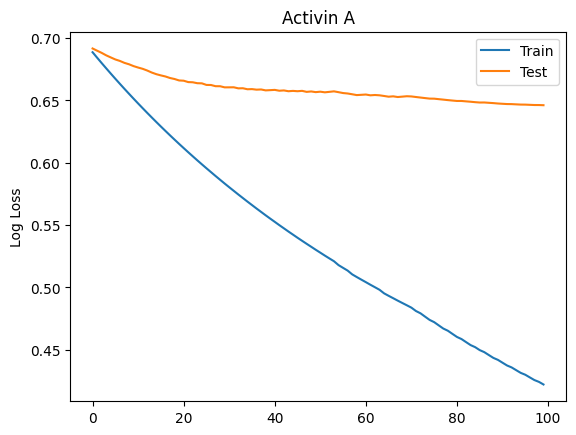

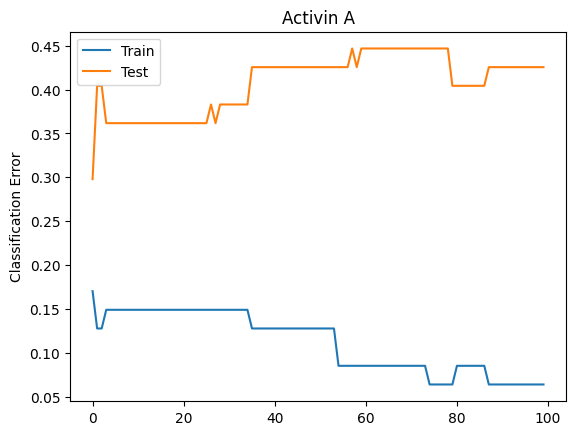

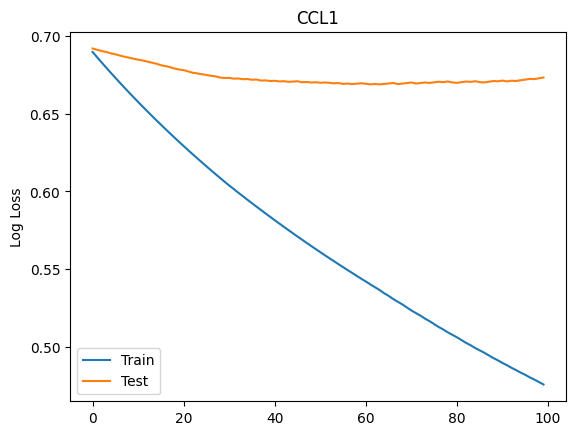

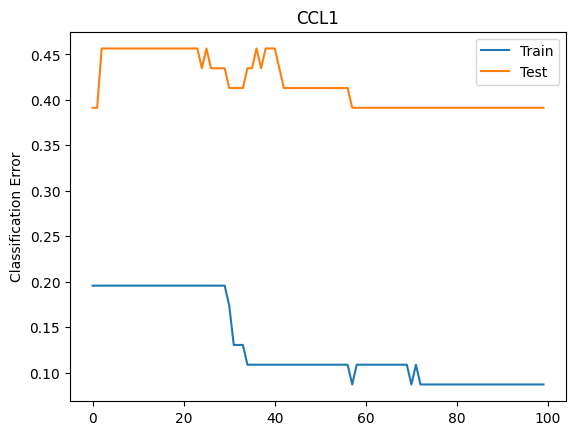

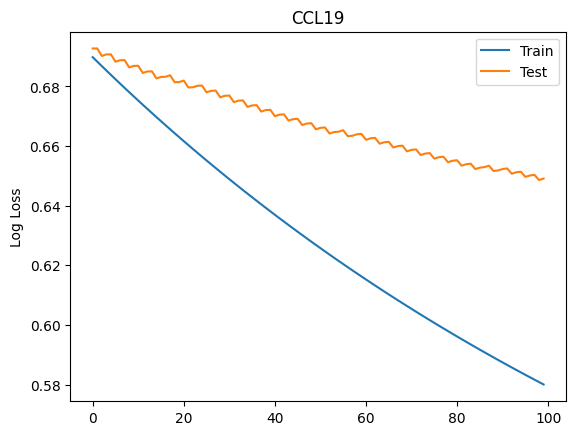

...

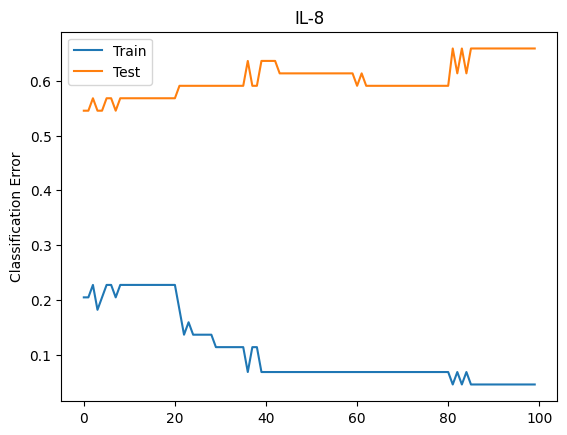

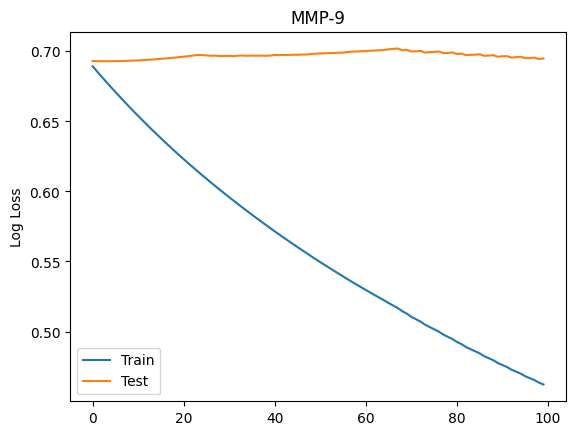

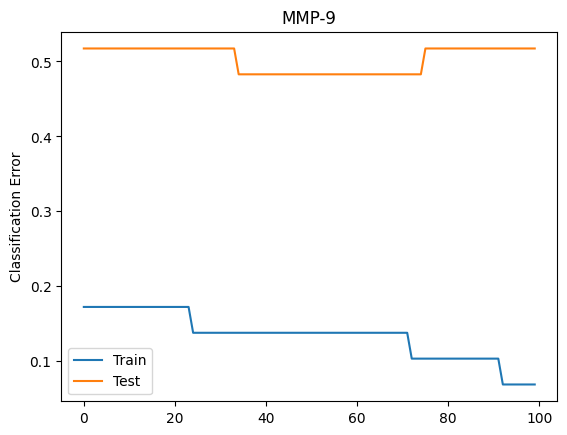

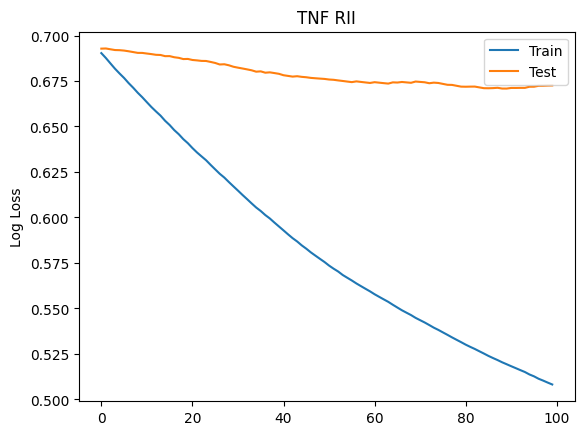

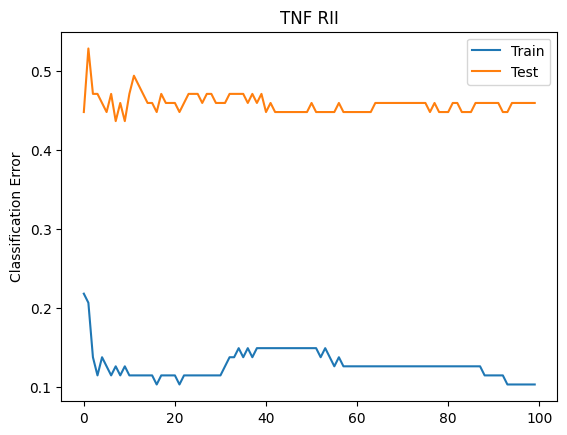

In [100]:
#These graphs show the performance at each epoch so we can figure out where to early stop to avoid overfitting
#Let's take a look at the logloss and error metrics over each epoch and see if we can tell a good place to stop

for i in range(len(PCAs)):
    df = PCAs[i]
    features = df.iloc[:,1:]
    target = df.iloc[:,0:1]
    train_scores = []
    test_scores = []
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5)
    eval_set = [(X_train, y_train), (X_test, y_test)]
     # configure the model
    model = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.01, objective='binary:logistic')
     # fit model on the training dataset
    model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = False)
#         model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set = eval_set, verbose = True)
     # evaluate on the train dataset
    train_yhat = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
     # evaluate on the test dataset
    test_yhat = model.predict(X_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
     # summarize progress
     # retrieve performance metrics
    results = model.evals_result()
    epochs = len(results['validation_0']['error'])
    x_axis = range(0, epochs)
    # plot log loss
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
    ax.legend()
    plt.ylabel('Log Loss')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Log Loss')
    plt.show()
    # plot classification error
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['error'], label='Train')
    ax.plot(x_axis, results['validation_1']['error'], label='Test')
    ax.legend()
    plt.ylabel('Classification Error')
    plt.title(df.columns[0])
#     plt.title(df.columns[0],'XGBoost Classification Error')
    plt.show()
        

In [ ]:
# The result here is that there will not be a clear early stopping point that would be beneficial for all cytokines.
# Each cytokine model would need to be optimized individually.
#That is enough of a result for this project, since we were just looking for a proof-of-concept that any
#cytokine might be predcitable from embeddings.
#In a follow-up project, each model could be optimized.